In [1]:
import pandas as pd
from datetime import datetime, timedelta
import numpy

In [2]:
import numpy as np
import pandas as pd

In [3]:
lower_data = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="SEIR_params_conf_range_lower")
upper_data = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="SEIR_params_conf_range_upper")

In [4]:
%matplotlib inline


In [5]:
age_groups = ['age_group_0_9', 'age_group_10_19', 'age_group_20_29','age_group_30_39', 'age_group_40_49', 'age_group_50_59', 'age_group_60_69', 'age_group_70_79', 'age_group_80_plus']
econ_activities = ['transport', 'leisure', 'other']
cont = [ 'S', 'E', 'I', 'R', 'N', 'Ia', 'Ips', \
           'Ims', 'Iss', 'Rq', 'H', 'ICU', 'D' ]

In [6]:
data = pd.read_csv("donnees-hospitalieres-classe-age-covid19-2020-07-27-19h00.csv", sep=";")
data.head()

,reg,cl_age90,jour,hosp,rea,rad,dc
0,1,0,2020-03-18,0,0,0,0
1,1,9,2020-03-18,0,0,0,0
2,1,19,2020-03-18,0,0,0,0
3,1,29,2020-03-18,0,0,0,0
4,1,39,2020-03-18,0,0,0,0


In [7]:
# Extract days 
days = data[data['reg']==11][data['cl_age90']==0].jour.values
days

/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


array(['2020-03-18', '2020-03-19', '2020-03-20', '2020-03-21',
       '2020-03-22', '2020-03-23', '2020-03-24', '2020-03-25',
       '2020-03-26', '2020-03-27', '2020-03-28', '2020-03-29',
       '2020-03-30', '2020-03-31', '2020-04-01', '2020-04-02',
       '2020-04-03', '2020-04-04', '2020-04-05', '2020-04-06',
       '2020-04-07', '2020-04-08', '2020-04-09', '2020-04-10',
       '2020-04-11', '2020-04-12', '2020-04-13', '2020-04-14',
       '2020-04-15', '2020-04-16', '2020-04-17', '2020-04-18',
       '2020-04-19', '2020-04-20', '2020-04-21', '2020-04-22',
       '2020-04-23', '2020-04-24', '2020-04-25', '2020-04-26',
       '2020-04-27', '2020-04-28', '2020-04-29', '2020-05-01',
       '2020-05-02', '2020-05-03', '2020-05-04', '2020-05-05',
       '2020-05-06', '2020-05-07', '2020-05-08', '2020-05-09',
       '2020-05-10', '2020-05-11', '2020-05-12', '2020-05-13',
       '2020-05-14', '2020-05-15', '2020-05-16', '2020-05-17',
       '2020-05-18', '2020-05-19', '2020-05-20', '2020-

In [8]:
beds_real = {
    age_groups[i]:data[data['reg']==11][data['cl_age90']==10*i+9].hosp.values for i in range(0,9)
}
beds_real['age_group_80_plus']+=data[data['reg']==11][data['cl_age90']==90].hosp.values
beds_real['total']=data[data['reg']==11][data['cl_age90']==0].hosp.values

icus_real = {
    age_groups[i]:data[data['reg']==11][data['cl_age90']==10*i+9].rea.values for i in range(0,9)
}
icus_real['age_group_80_plus']+=data[data['reg']==11][data['cl_age90']==90].rea.values
icus_real['total']=data[data['reg']==11][data['cl_age90']==0].rea.values

deaths_real = {
    age_groups[i]:data[data['reg']==11][data['cl_age90']==10*i+9].dc.values for i in range(0,9)
}
deaths_real['age_group_80_plus']+=data[data['reg']==11][data['cl_age90']==90].dc.values
deaths_real['total']=data[data['reg']==11][data['cl_age90']==0].dc.values


/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.
/Users/sergioacamelogomez/opt/anaconda3/lib/pyth

In [9]:
mult_deaths = np.sum(data[data['reg']==11][data['cl_age90']==0].hosp.values)/np.sum(data[data['reg']==11][data['cl_age90']==0].dc.values)
print(mult_deaths)
mult_icus = np.sum(data[data['reg']==11][data['cl_age90']==0].hosp.values)/np.sum(data[data['reg']==11][data['cl_age90']==0].rea.values)
print(mult_icus)


1.2044049618865522
6.93086556254271


/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.
/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


In [10]:
import yaml
from inspect import getsourcefile
import os.path
import sys
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
import argparse
current_path = os.path.abspath(getsourcefile(lambda:0))
current_dir = os.path.dirname(current_path)
parentdir = os.path.dirname(current_dir)
sys.path.insert(0,parentdir) 
sys.path.insert(0, parentdir+"/heuristics")
sys.path.insert(0, parentdir+"/heuristics/LP-Models")
sys.path.insert(0, parentdir+"/fast_gradient")


from fast_group import FastDynamicalModel
from aux import *


In [11]:
region = "Ile-de-France"

In [12]:
# Read group parameters
with open("../parameters/"+region+".yaml") as file:
    # The FullLoader parameter handles the conversion from YAML
    # scalar values to Python the dictionary format
    universe_params = yaml.load(file, Loader=yaml.FullLoader)
    
# Read initialization
with open("../initialization/patient_zero.yaml") as file:
    # The FullLoader parameter handles the conversion from YAML
    # scalar values to Python the dictionary format
    original_initialization = yaml.load(file, Loader=yaml.FullLoader)
    

In [13]:
date_1 = datetime.strptime("2020-03-17", '%Y-%m-%d')
date_2 = datetime.strptime("2020-04-14", '%Y-%m-%d')
date_3 = datetime.strptime("2020-05-11", '%Y-%m-%d')
date_4 = datetime.strptime("2020-06-02", '%Y-%m-%d')
date_5 = datetime.strptime("2020-06-15", '%Y-%m-%d')
date_6 = datetime.strptime("2020-06-22", '%Y-%m-%d')
date_7 = datetime.strptime("2020-07-06", '%Y-%m-%d')
#final_date = datetime.strptime(days[-1], '%Y-%m-%d') + timedelta(days=1)
final_date = datetime.strptime("2020-07-27", '%Y-%m-%d')

In [14]:
from copy import deepcopy

In [15]:
# Create model
mixing_method = {}
dynModel = FastDynamicalModel(universe_params, 1.0, mixing_method)


In [16]:
params = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="SEIR_params", index_col = 0)
initial_params = {
    "mu":params['mu'].values,
    "sigma":params['sigma'].values,
    "p_ICU":params['p_ICU'].values,
    "p_H":params['p_H'].values,
    "lambda_H_R":params['lambda_HR'].values,
    "lambda_H_D":params['lambda_HD'].values,
    "lambda_ICU_R":params['lambda_ICUR'].values,
    "lambda_ICU_D":params['lambda_ICUD'].values
}

params = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="SEIR_params_conf_range_lower", index_col = 0)
lower_params = {
    "mu":params['mu'].values,
    "sigma":params['sigma'].values,
    "p_ICU":params['p_ICU'].values,
    "p_H":params['p_H'].values,
    "lambda_H_R":params['lambda_HR'].values,
    "lambda_H_D":params['lambda_HD'].values,
    "lambda_ICU_R":params['lambda_ICUR'].values,
    "lambda_ICU_D":params['lambda_ICUD'].values
}

params = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="SEIR_params_conf_range_upper", index_col = 0)
upper_params = {
    "mu":params['mu'].values,
    "sigma":params['sigma'].values,
    "p_ICU":params['p_ICU'].values,
    "p_H":params['p_H'].values,
    "lambda_H_R":params['lambda_HR'].values,
    "lambda_H_D":params['lambda_HD'].values,
    "lambda_ICU_R":params['lambda_ICUR'].values,
    "lambda_ICU_D":params['lambda_ICUD'].values
}

In [17]:
# Construct the windows for the parameters to move
windows = {}
for p in initial_params:
    windows[p] = (
        np.min(upper_params[p]/initial_params[p]),
        np.max(lower_params[p]/initial_params[p]),
    )
    
windows['beta_mixing'] = (0.1,4.0)
windows['alpha_mixing'] = (0.1,4.0)
windows['gamma_mixing'] = (0.5,2.0)

In [18]:
import copy
import math
best_v = 0
best_error = float('inf')
def error(v):

    days_ahead = v[0]
    alpha_mixing = v[1]
    beta_mixing = v[2]
    gamma_mixing_before_lockdown = v[3]
    gamma_mixing_during_lockdown = v[3] - v[4]*v[3]
    gamma_mixing_after_lockdown = v[3] - v[4]*v[3] - v[5]*v[3]


    upper_bound_home = v[6]
    upper_bound_leisure = v[7]
    upper_bound_other = v[8]
    upper_bound_school = v[9]
    upper_bound_work = v[10]
    upper_bound_transport = v[11]
    
    leisure_v = v[12:29]
    leisure_1 = leisure_v[0]
    leisure_2 = leisure_v[1]
    leisure_3 = leisure_v[2]
    leisure_4 = leisure_v[3]
    leisure_5 = leisure_v[4]
    leisure_6 = leisure_v[5]
    leisure_7 = leisure_v[6]
    leisure_denom = leisure_1+leisure_2+leisure_3+leisure_4+leisure_5+leisure_6+leisure_7

    other_v = v[19:26]
    other_1 = other_v[0]
    other_2 = other_v[1]
    other_3 = other_v[2]
    other_4 = other_v[3]
    other_5 = other_v[4]
    other_6 = other_v[5]
    other_7 = other_v[6]
    other_denom = other_1+other_2+other_3+other_4+other_5+other_6+other_7

    work_v = v[26:33]
    work_1 = work_v[0]
    work_2 = work_v[1]
    work_3 = work_v[2]
    work_4 = work_v[3]
    work_5 = work_v[4]
    work_6 = work_v[5]
    work_7 = work_v[6]
    work_denom = work_1+work_2+work_3+work_4+work_5+work_6+work_7
    
    transport_v = v[33:40]
    transport_1 = transport_v[0]
    transport_2 = transport_v[1]
    transport_3 = transport_v[2]
    transport_4 = transport_v[3]
    transport_5 = transport_v[4]
    transport_6 = transport_v[5]
    transport_7 = transport_v[6]
    transport_denom = transport_1+transport_2+transport_3+transport_4+transport_5+transport_6+transport_7


    # Construct initialization
    initialization = copy.deepcopy(original_initialization)
    for i,group in enumerate(age_groups):
        if group == "age_group_40_49":
            initialization[group]["I"] = initialization[group]["I"] + 1
            initialization[group]["S"] = initialization[group]["S"] - 1
        initialization[group]["N"] = initialization[group]["S"] + initialization[group]["E"] + initialization[group]["I"] + initialization[group]["R"]


    # Alphas
    a_before_date_1 = {
        'home':upper_bound_home,
        'leisure':upper_bound_leisure,
        'other':upper_bound_other,
        'school':upper_bound_school,
        'transport':upper_bound_transport,
        'work':upper_bound_work
    }
    a_between_date_1_2 = {
        'home':upper_bound_home,
        'leisure':leisure_1/leisure_denom*upper_bound_leisure,
        'other':other_1/other_denom*upper_bound_other,
        'school':0,
        'transport':transport_1/transport_denom*upper_bound_transport,
        'work':work_1/work_denom*upper_bound_work
    }
    a_between_date_2_3 = {
        'home':upper_bound_home,
        'leisure':leisure_1/leisure_denom*upper_bound_leisure,
        'other':other_1/other_denom*upper_bound_other,
        'school':0,
        'transport':transport_1/transport_denom*upper_bound_transport,
        'work':work_1/work_denom*upper_bound_work
    }
    a_between_date_3_4 = {
        'home':upper_bound_home,
        'leisure':(leisure_1+leisure_2)/leisure_denom*upper_bound_leisure,
        'other':(other_1+other_2)/other_denom*upper_bound_other,
        'school':0.33*upper_bound_school,
        'transport':(transport_1+transport_2)/transport_denom*upper_bound_transport,
        'work':(work_1+work_2)/work_denom*upper_bound_work
    }
    a_between_date_4_5 = {
        'home':upper_bound_home,
        'leisure':(leisure_1+leisure_2+leisure_3)/leisure_denom*upper_bound_leisure,
        'other':(other_1+other_2+other_3)/other_denom*upper_bound_other,
        'school':0.67*upper_bound_school,
        'transport':(transport_1+transport_2+transport_3)/transport_denom*upper_bound_transport,
        'work':(work_1+work_2+work_3)/work_denom*upper_bound_work
    }
    a_between_date_5_6 = {
        'home':upper_bound_home,
        'leisure':(leisure_1+leisure_2+leisure_3+leisure_4)/leisure_denom*upper_bound_leisure,
        'other':(other_1+other_2+other_3+other_4)/other_denom*upper_bound_other,
        'school':0.67*upper_bound_school,
        'transport':(transport_1+transport_2+transport_3+transport_4)/transport_denom*upper_bound_transport,
        'work':(work_1+work_2+work_3+work_4)/work_denom*upper_bound_work
    }
    a_between_date_6_7 = {
        'home':upper_bound_home,
        'leisure':(leisure_1+leisure_2+leisure_3+leisure_4+leisure_5)/leisure_denom*upper_bound_leisure,
        'other':(other_1+other_2+other_3+other_4+other_5)/other_denom*upper_bound_other,
        'school':1.0*upper_bound_school,
        'transport':(transport_1+transport_2+transport_3+transport_4+transport_5)/transport_denom*upper_bound_transport,
        'work':(work_1+work_2+work_3+work_4+work_5)/work_denom*upper_bound_work
    }
    a_after_date_7 = {
        'home':upper_bound_home,
        'leisure':(leisure_1+leisure_2+leisure_3+leisure_4+leisure_5+leisure_6)/leisure_denom*upper_bound_leisure,
        'other':(other_1+other_2+other_3+other_4+other_5+other_6)/other_denom*upper_bound_other,
        'school':1.0*upper_bound_school,
        'transport':(transport_1+transport_2+transport_3+transport_4+transport_5+transport_6)/transport_denom*upper_bound_transport,
        'work':(work_1+work_2+work_3+work_4+work_5+work_6)/work_denom*upper_bound_work
    }

    # Determine mixing method
    mixing_method_before = {
        "name":"mult",
        "param_alpha":alpha_mixing,
        "param_beta":beta_mixing,
        "param_gamma":gamma_mixing_before_lockdown,
    }

    mixing_method_during = {
        "name":"mult",
        "param_alpha":alpha_mixing,
        "param_beta":beta_mixing,
        "param_gamma":gamma_mixing_during_lockdown,
    }

    # Determine mixing method
    mixing_method_after = {
        "name":"mult",
        "param_alpha":alpha_mixing,
        "param_beta":beta_mixing,
        "param_gamma":gamma_mixing_after_lockdown,
    }
    #dynModel.mixing_method = mixing_method_after

    # Number of days
    days_before_date_1 = int(days_ahead)
    days_between_dates_1_2 = (date_2-date_1).days
    days_between_dates_2_3 = (date_3-date_2).days
    days_between_dates_3_4 = (date_4-date_3).days
    days_between_dates_4_5 = (date_5-date_4).days
    days_between_dates_5_6 = (date_6-date_5).days
    days_between_dates_6_7 = (date_7-date_6).days

    days_after_date_7 = (final_date-date_7).days
    total_days = days_before_date_1 + days_between_dates_1_2 + days_between_dates_2_3 + days_between_dates_3_4 + days_between_dates_4_5+ days_between_dates_5_6+ days_between_dates_6_7 + days_after_date_7



    # Calculate alphas
    alphas_vec = []
    mixing_vec = []
    for t in range(days_before_date_1):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_before_date_1
        alphas_vec.append(alphas)
        mixing_vec.append(mixing_method_before)
    for t in range(days_between_dates_1_2):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_1_2
        alphas_vec.append(alphas)
        mixing_vec.append(mixing_method_during)
    for t in range(days_between_dates_2_3):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_2_3
        alphas_vec.append(alphas)
        mixing_vec.append(mixing_method_during)
    for t in range(days_between_dates_3_4):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_3_4
        alphas_vec.append(alphas)
        mixing_vec.append(mixing_method_after)
    for t in range(days_between_dates_4_5):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_4_5
        alphas_vec.append(alphas)
        mixing_vec.append(mixing_method_after)
    for t in range(days_between_dates_5_6):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_5_6
        alphas_vec.append(alphas)
        mixing_vec.append(mixing_method_after)
    for t in range(days_between_dates_6_7):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_6_7
        alphas_vec.append(alphas)
        mixing_vec.append(mixing_method_after)
    for t in range(days_after_date_7):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_after_date_7
        alphas_vec.append(alphas)
        mixing_vec.append(mixing_method_after)

    # Calculate tests
    tests = np.zeros(len(age_groups))


    # Run model
    model_data_beds = {ag:[] for ag in age_groups+["total"]}
    model_data_icus = {ag:[] for ag in age_groups+["total"]}
    model_data_deaths = {ag:[] for ag in age_groups+["total"]}

    state = state_to_matrix(initialization)
    t_beds = 0
    t_icus = 0
    t_deaths = 0
    for i,ag in enumerate(age_groups):
        state_H = state[i,cont.index("H")]
        state_ICU = state[i,cont.index("ICU")]
        state_D = state[i,cont.index("D")]
        model_data_beds[ag].append(state_H)
        model_data_icus[ag].append(state_ICU)
        model_data_deaths[ag].append(state_D)
        t_beds+= state_H
        t_icus+= state_ICU
        t_deaths+= state_D
    model_data_beds["total"].append(t_beds)
    model_data_icus["total"].append(t_icus)
    model_data_deaths["total"].append(t_deaths)

    recalc_days = [0,
                 days_before_date_1,
                 days_before_date_1+days_between_dates_1_2,
                 days_before_date_1+days_between_dates_1_2+days_between_dates_2_3,
                 days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4,
                 days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5,
                 days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5+days_between_dates_5_6,
                 days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5+days_between_dates_5_6+days_between_dates_6_7
                ]

    for t in range(total_days):
        if t in recalc_days:
            update_contacts = True
        else:
            update_contacts = False
        dynModel.mixing_method = mixing_vec[t]
        state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]), update_contacts=update_contacts)
        t_beds = 0
        t_icus = 0
        t_deaths = 0
        for i,ag in enumerate(age_groups):
            state_H = state[i,cont.index("H")]
            state_ICU = state[i,cont.index("ICU")]
            state_D = state[i,cont.index("D")]
            model_data_beds[ag].append(state_H)
            model_data_icus[ag].append(state_ICU)
            model_data_deaths[ag].append(state_D)
            t_beds+= state_H
            t_icus+= state_ICU
            t_deaths+= state_D
        model_data_beds["total"].append(t_beds)
        model_data_icus["total"].append(t_icus)
        model_data_deaths["total"].append(t_deaths)


    initial_date = date_1-timedelta(days=days_before_date_1)

    # Calculate the days of the model
    days_model = [initial_date+timedelta(days = t) for t in range(total_days + 1)]

    # Indices where to put the real data
    indices = [(datetime.strptime(d, '%Y-%m-%d') - initial_date).days for d in days]

    # Real data
    real_data_beds = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}
    real_data_icus = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}
    real_data_deaths = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}

    for k,ind in enumerate(indices):
        for ag in age_groups+["total"]:
            real_data_beds[ag][ind] = beds_real[ag][k]
            real_data_icus[ag][ind] = icus_real[ag][k]
            real_data_deaths[ag][ind] = deaths_real[ag][k]


    error_beds = 0
    error_icus = 0
    error_deaths = 0
    for ag in age_groups:
        error_beds += np.nanmean(np.abs(np.array(model_data_beds[ag])-np.array(real_data_beds[ag])))
        error_icus += np.nanmean(np.abs(np.array(model_data_icus[ag])-np.array(real_data_icus[ag])))
        error_deaths += np.nanmean(np.abs(np.array(model_data_deaths[ag])-np.array(real_data_deaths[ag])))
    error_beds_total = np.nanmean(np.abs(np.array(model_data_beds["total"])-np.array(real_data_beds["total"])))
    error_icus_total = np.nanmean(np.abs(np.array(model_data_icus["total"])-np.array(real_data_icus["total"])))
    error_deaths_total = np.nanmean(np.abs(np.array(model_data_deaths["total"])-np.array(real_data_deaths["total"])))

    diff = np.array(model_data_beds["total"])-np.array(real_data_beds["total"])
    error_beds_above = np.nanmean([max(d,0) for d in diff])
    error_beds_below = -np.nanmean([min(d,0) for d in diff])

    cumm_beds_model = [sum([model_data_beds["total"][k] for k in range(i+1) if not math.isnan(real_data_beds["total"][k])]) for i in range(len(model_data_beds["total"]))]
    cumm_beds_real = [sum([real_data_beds["total"][k] for k in range(i+1) if not math.isnan(real_data_beds["total"][k])]) for i in range(len(real_data_beds["total"]))]
    diff_cumm = np.array(cumm_beds_model)-np.array(cumm_beds_real)
    error_cumm_above = np.nanmean([max(d,0) for d in diff_cumm])
    error_cumm_below = -np.nanmean([min(d,0) for d in diff_cumm])



    #     error = error_beds_total
    #     error = mult_icus*error_icus_total
    #     error = mult_deaths*error_deaths_total
    upper_model_data = model_data_beds["total"]
    upper_days_model = days_model
    upper_real_data = real_data_beds["total"]
    error = error_beds+5*error_beds_total



    
    
    global best_error
    global best_v
    if error<best_error:
        best_error = error
        print(best_error)
        print("error_groups",error_beds)
        print("error_total",error_beds_total)
        best_v = v
        print(v)
        plt.figure(1)
        plt.plot(upper_days_model, upper_model_data, label="Upper")
        plt.plot(upper_days_model, upper_real_data, label="Model L1")
        plt.legend(loc='upper right')
        plt.show()
        print(a_before_date_1)
        print(a_between_date_1_2)
        print(a_between_date_2_3)
        print(a_between_date_3_4)
        print(a_between_date_4_5)
        print(a_between_date_5_6)
        print(a_between_date_6_7)
        print(a_after_date_7)
    return error





41273.88640015695
error_groups 6820.940354224631
error_total 6890.589209186464
[9.03694156e+01 3.26629321e+00 1.35760275e+00 6.35018528e-01
 1.76561274e-01 4.91355967e-01 8.63538672e-01 8.45130229e-01
 9.18606440e-01 9.48608343e-01 9.06639841e-01 9.11519287e-01
 5.74762452e-01 1.72932453e-01 9.26243293e-01 4.66523325e-01
 2.27774335e-01 5.90226285e-02 8.63078993e-01 3.82440476e-01
 9.58603818e-01 3.04489358e-01 2.00996667e-01 2.33339167e-01
 6.73663100e-01 8.82151025e-01 4.92049686e-01 6.86115788e-01
 4.41573780e-01 7.92941208e-01 5.00807958e-01 2.19640662e-01
 8.44057473e-01 9.57525473e-03 3.76098989e-01 6.87813994e-01
 9.53630434e-01 1.29877546e-01 3.19560619e-01 7.39465252e-01]


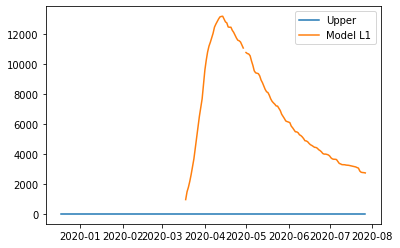

{'home': 0.8635386719044109, 'leisure': 0.8451302286995945, 'other': 0.9186064403455719, 'school': 0.9486083426878905, 'transport': 0.9115192866790756, 'work': 0.9066398405654449}
{'home': 0.8635386719044109, 'leisure': 0.1476289668346196, 'other': 0.09662894859051406, 'school': 0, 'transport': 0.0027139208370473536, 'work': 0.11216769500076451}
{'home': 0.8635386719044109, 'leisure': 0.1476289668346196, 'other': 0.09662894859051406, 'school': 0, 'transport': 0.0027139208370473536, 'work': 0.11216769500076451}
{'home': 0.8635386719044109, 'leisure': 0.19204703767757603, 'other': 0.33883364392639503, 'school': 0.3130407530870039, 'transport': 0.10931190837216316, 'work': 0.26857471782411757}
{'home': 0.8635386719044109, 'leisure': 0.4299546112995384, 'other': 0.41576714940962306, 'school': 0.6355675896008867, 'transport': 0.30425948756215854, 'work': 0.3692359204250593}
{'home': 0.8635386719044109, 'leisure': 0.5497821265947136, 'other': 0.4665517753836692, 'school': 0.6355675896008867,

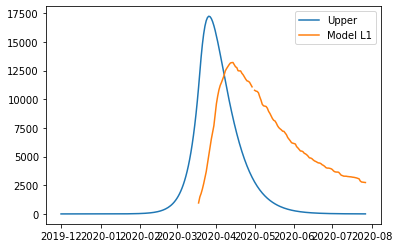

{'home': 0.8851210284651249, 'leisure': 0.816981467414764, 'other': 0.940662515480856, 'school': 0.9799145530749568, 'transport': 0.9806628979114094, 'work': 0.9042711951556895}
{'home': 0.8851210284651249, 'leisure': 0.1410125126671075, 'other': 0.0013222378354962683, 'school': 0, 'transport': 0.05955877622532479, 'work': 0.027984540515971865}
{'home': 0.8851210284651249, 'leisure': 0.1410125126671075, 'other': 0.0013222378354962683, 'school': 0, 'transport': 0.05955877622532479, 'work': 0.027984540515971865}
{'home': 0.8851210284651249, 'leisure': 0.283301026478566, 'other': 0.04184460488757285, 'school': 0.32337180251473574, 'transport': 0.3329291468167987, 'work': 0.04256725723588212}
{'home': 0.8851210284651249, 'leisure': 0.2906386094100163, 'other': 0.30437982619909837, 'school': 0.656542750560221, 'transport': 0.5311549901707339, 'work': 0.2117959963168474}
{'home': 0.8851210284651249, 'leisure': 0.39331724748620506, 'other': 0.4493412312438468, 'school': 0.656542750560221, 'tr

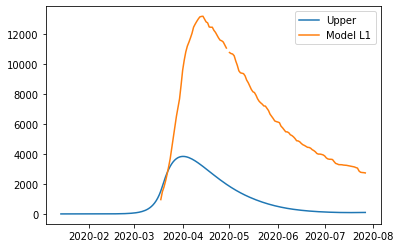

{'home': 0.9906638473788568, 'leisure': 0.8851371569726362, 'other': 0.8809467251255806, 'school': 0.9928560037301662, 'transport': 0.827021688673443, 'work': 0.9277194434912627}
{'home': 0.9906638473788568, 'leisure': 0.17185641071762728, 'other': 0.16119876354232962, 'school': 0, 'transport': 0.14962967259496107, 'work': 0.23500900153820525}
{'home': 0.9906638473788568, 'leisure': 0.17185641071762728, 'other': 0.16119876354232962, 'school': 0, 'transport': 0.14962967259496107, 'work': 0.23500900153820525}
{'home': 0.9906638473788568, 'leisure': 0.2766661837310275, 'other': 0.3352915718776992, 'school': 0.32764248123095485, 'transport': 0.34061058449254045, 'work': 0.3053584692677217}
{'home': 0.9906638473788568, 'leisure': 0.43427129955298793, 'other': 0.44431789436233254, 'school': 0.6652135224992114, 'transport': 0.5329479796264504, 'work': 0.34575866484974777}
{'home': 0.9906638473788568, 'leisure': 0.4823155374650873, 'other': 0.5187929835823837, 'school': 0.6652135224992114, 'tr

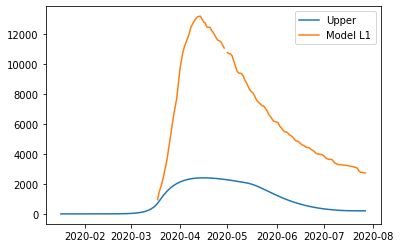

{'home': 0.9781264519509697, 'leisure': 0.9373428624176673, 'other': 0.8883604044559944, 'school': 0.9355735508090378, 'transport': 0.9898488325194861, 'work': 0.8860387471732093}
{'home': 0.9781264519509697, 'leisure': 0.008137203189144621, 'other': 0.03825417333255602, 'school': 0, 'transport': 0.1959119741245654, 'work': 0.1457786661091478}
{'home': 0.9781264519509697, 'leisure': 0.008137203189144621, 'other': 0.03825417333255602, 'school': 0, 'transport': 0.1959119741245654, 'work': 0.1457786661091478}
{'home': 0.9781264519509697, 'leisure': 0.14195801072879774, 'other': 0.11269481744554057, 'school': 0.3087392717669825, 'transport': 0.3104638149572142, 'work': 0.32114776689670865}
{'home': 0.9781264519509697, 'leisure': 0.3167760593048678, 'other': 0.33819447804550756, 'school': 0.6268342790420554, 'transport': 0.3802702588712981, 'work': 0.44769880690474156}
{'home': 0.9781264519509697, 'leisure': 0.39074761224168697, 'other': 0.4225430804713122, 'school': 0.6268342790420554, 'tr

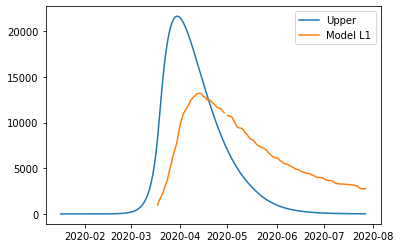

{'home': 0.9265156901959148, 'leisure': 0.9000582448099214, 'other': 0.8723816515102192, 'school': 0.9408392222118045, 'transport': 0.9997015940656134, 'work': 0.9986959382346383}
{'home': 0.9265156901959148, 'leisure': 0.16233208357522308, 'other': 0.12349585478339667, 'school': 0, 'transport': 0.21197709450269728, 'work': 0.07497454281174228}
{'home': 0.9265156901959148, 'leisure': 0.16233208357522308, 'other': 0.12349585478339667, 'school': 0, 'transport': 0.21197709450269728, 'work': 0.07497454281174228}
{'home': 0.9265156901959148, 'leisure': 0.2200410649678164, 'other': 0.1780718528808335, 'school': 0.3104769433298955, 'transport': 0.2760777302409095, 'work': 0.23973334767697466}
{'home': 0.9265156901959148, 'leisure': 0.28344603304595073, 'other': 0.3485773237917889, 'school': 0.6303622788819091, 'transport': 0.45959599250470856, 'work': 0.3377030083886534}
{'home': 0.9265156901959148, 'leisure': 0.3696552791027114, 'other': 0.3582770993766299, 'school': 0.6303622788819091, 'tra

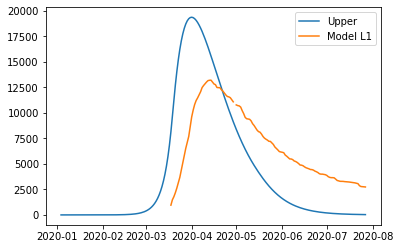

{'home': 0.9805251576695557, 'leisure': 0.8837805010340177, 'other': 0.8879197512370094, 'school': 0.9827037604518803, 'transport': 0.9919206010924904, 'work': 0.9846885482997474}
{'home': 0.9805251576695557, 'leisure': 0.11140509291184876, 'other': 0.02209720338665052, 'school': 0, 'transport': 0.18806609943472508, 'work': 0.06619945530028916}
{'home': 0.9805251576695557, 'leisure': 0.11140509291184876, 'other': 0.02209720338665052, 'school': 0, 'transport': 0.18806609943472508, 'work': 0.06619945530028916}
{'home': 0.9805251576695557, 'leisure': 0.18342948921609248, 'other': 0.37379005830499223, 'school': 0.3242922409491205, 'transport': 0.34396027791761113, 'work': 0.08107697046406384}
{'home': 0.9805251576695557, 'leisure': 0.32692743165333465, 'other': 0.4096027599220965, 'school': 0.6584115195027599, 'transport': 0.419519726425179, 'work': 0.30324259470435333}
{'home': 0.9805251576695557, 'leisure': 0.5837493635574872, 'other': 0.4323665876818763, 'school': 0.6584115195027599, 't

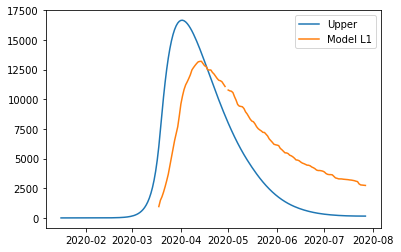

{'home': 0.883994810676162, 'leisure': 0.9577004403118375, 'other': 0.9913952345837719, 'school': 0.8255168079009891, 'transport': 0.9590086632189062, 'work': 0.819163050472679}
{'home': 0.883994810676162, 'leisure': 0.0939689937067352, 'other': 0.09991127595259189, 'school': 0, 'transport': 0.25699643796820315, 'work': 0.012174456461073555}
{'home': 0.883994810676162, 'leisure': 0.0939689937067352, 'other': 0.09991127595259189, 'school': 0, 'transport': 0.25699643796820315, 'work': 0.012174456461073555}
{'home': 0.883994810676162, 'leisure': 0.10385570853951082, 'other': 0.12731466903667604, 'school': 0.27242054660732645, 'transport': 0.3628985072422074, 'work': 0.19493743257147478}
{'home': 0.883994810676162, 'leisure': 0.2123611828184964, 'other': 0.42324320775531066, 'school': 0.5530962612936627, 'transport': 0.6009976189106901, 'work': 0.37436827646570997}
{'home': 0.883994810676162, 'leisure': 0.3583401356697628, 'other': 0.49239529848967795, 'school': 0.5530962612936627, 'transp

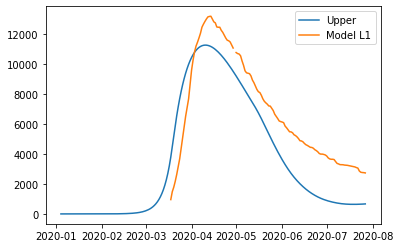

{'home': 0.9950182140134767, 'leisure': 0.8913826328369431, 'other': 0.8173649595228566, 'school': 0.8930114737264507, 'transport': 0.8574015012432865, 'work': 0.8831635224734361}
{'home': 0.9950182140134767, 'leisure': 0.16511087412859024, 'other': 0.11549116623335252, 'school': 0, 'transport': 0.16386278765994944, 'work': 0.15777720634961415}
{'home': 0.9950182140134767, 'leisure': 0.16511087412859024, 'other': 0.11549116623335252, 'school': 0, 'transport': 0.16386278765994944, 'work': 0.15777720634961415}
{'home': 0.9950182140134767, 'leisure': 0.311782409556671, 'other': 0.23464687892045724, 'school': 0.29469378632972876, 'transport': 0.169307036264458, 'work': 0.3242164039187591}
{'home': 0.9950182140134767, 'leisure': 0.41816734909669995, 'other': 0.3780327549688061, 'school': 0.598317687396722, 'transport': 0.4501050562043002, 'work': 0.4808968689893674}
{'home': 0.9950182140134767, 'leisure': 0.48894144188387395, 'other': 0.5070496313351883, 'school': 0.598317687396722, 'transp

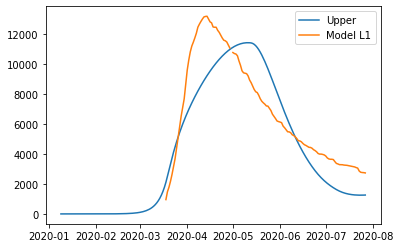

{'home': 0.9635542255763896, 'leisure': 0.8723332895111359, 'other': 0.9069199849675226, 'school': 0.8839778508937917, 'transport': 0.8770760818387278, 'work': 0.9068018507104352}
{'home': 0.9635542255763896, 'leisure': 0.1996038609246573, 'other': 0.04875327233475696, 'school': 0, 'transport': 0.19815419460610437, 'work': 0.1800764388289162}
{'home': 0.9635542255763896, 'leisure': 0.1996038609246573, 'other': 0.04875327233475696, 'school': 0, 'transport': 0.19815419460610437, 'work': 0.1800764388289162}
{'home': 0.9635542255763896, 'leisure': 0.36972045627080463, 'other': 0.2819551543831546, 'school': 0.29171269079495127, 'transport': 0.39665632906435355, 'work': 0.23625004648783554}
{'home': 0.9635542255763896, 'leisure': 0.4929615444223025, 'other': 0.4704049077761729, 'school': 0.5922651600988404, 'transport': 0.435941228083992, 'work': 0.3378096962225334}
{'home': 0.9635542255763896, 'leisure': 0.6066531331232502, 'other': 0.48068459330432883, 'school': 0.5922651600988404, 'transp

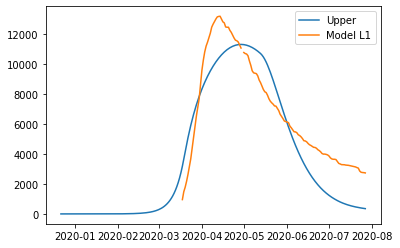

{'home': 0.9482543399587728, 'leisure': 0.8232724208198625, 'other': 0.8389251783749027, 'school': 0.8303589258987787, 'transport': 0.8196983083055054, 'work': 0.8633270287578403}
{'home': 0.9482543399587728, 'leisure': 0.14508104987558143, 'other': 0.097147956541928, 'school': 0, 'transport': 0.2321888518142158, 'work': 0.18950933735036687}
{'home': 0.9482543399587728, 'leisure': 0.14508104987558143, 'other': 0.097147956541928, 'school': 0, 'transport': 0.2321888518142158, 'work': 0.18950933735036687}
{'home': 0.9482543399587728, 'leisure': 0.31384049518157064, 'other': 0.24907298739445777, 'school': 0.274018445546597, 'transport': 0.3062581384767021, 'work': 0.37393560662514586}
{'home': 0.9482543399587728, 'leisure': 0.43703071953245237, 'other': 0.3531850876433927, 'school': 0.5563404803521818, 'transport': 0.36169353326160175, 'work': 0.39617004326018834}
{'home': 0.9482543399587728, 'leisure': 0.5362000959956199, 'other': 0.42791465408619317, 'school': 0.5563404803521818, 'transp

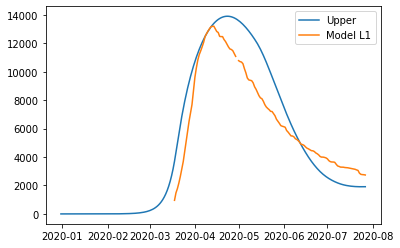

{'home': 0.9783325912903446, 'leisure': 0.8875691944200506, 'other': 0.8556379808178611, 'school': 0.843214192143014, 'transport': 0.827889169301645, 'work': 0.8308028804252311}
{'home': 0.9783325912903446, 'leisure': 0.04911713312392535, 'other': 0.20799634557896374, 'school': 0, 'transport': 0.15301027867073233, 'work': 0.2020476262377965}
{'home': 0.9783325912903446, 'leisure': 0.04911713312392535, 'other': 0.20799634557896374, 'school': 0, 'transport': 0.15301027867073233, 'work': 0.2020476262377965}
{'home': 0.9783325912903446, 'leisure': 0.2860067152984541, 'other': 0.3400372098012539, 'school': 0.2782606834071946, 'transport': 0.3267218916364808, 'work': 0.32135100290889973}
{'home': 0.9783325912903446, 'leisure': 0.4531289324415729, 'other': 0.4034107904977503, 'school': 0.5649535087358194, 'transport': 0.41251312766673737, 'work': 0.38485216821871393}
{'home': 0.9783325912903446, 'leisure': 0.6850862508698161, 'other': 0.4071831759240533, 'school': 0.5649535087358194, 'transpo

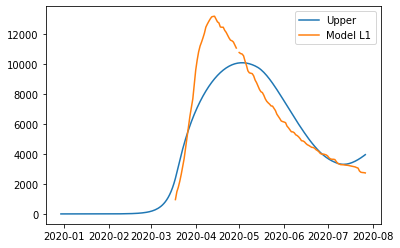

{'home': 0.981901605200409, 'leisure': 0.8784291319697722, 'other': 0.8313270232929595, 'school': 0.9276282727250715, 'transport': 0.832566723498843, 'work': 0.9177308679975208}
{'home': 0.981901605200409, 'leisure': 0.12417456834054234, 'other': 0.11371817583620793, 'school': 0, 'transport': 0.09855112126428336, 'work': 0.1227240552659028}
{'home': 0.981901605200409, 'leisure': 0.12417456834054234, 'other': 0.11371817583620793, 'school': 0, 'transport': 0.09855112126428336, 'work': 0.1227240552659028}
{'home': 0.981901605200409, 'leisure': 0.3563855495908996, 'other': 0.23704348959600258, 'school': 0.3061173299992736, 'transport': 0.24107527491390132, 'work': 0.30449566409048157}
{'home': 0.981901605200409, 'leisure': 0.3862487888836228, 'other': 0.29964541542942885, 'school': 0.621510942725798, 'transport': 0.34022591229439864, 'work': 0.39373279583914617}
{'home': 0.981901605200409, 'leisure': 0.6561542334320097, 'other': 0.4838589917774437, 'school': 0.621510942725798, 'transport':

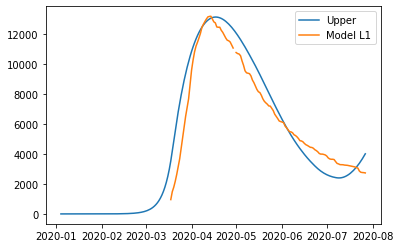

{'home': 0.9739602141962396, 'leisure': 0.9144932773624977, 'other': 0.8132255105221085, 'school': 0.9734796092613758, 'transport': 0.9099744437489286, 'work': 0.8755120500075592}
{'home': 0.9739602141962396, 'leisure': 0.127317500471621, 'other': 0.11333199584558352, 'school': 0, 'transport': 0.15462762024522425, 'work': 0.058430328299205275}
{'home': 0.9739602141962396, 'leisure': 0.127317500471621, 'other': 0.11333199584558352, 'school': 0, 'transport': 0.15462762024522425, 'work': 0.058430328299205275}
{'home': 0.9739602141962396, 'leisure': 0.40164064159031776, 'other': 0.16442406048393646, 'school': 0.32124827105625403, 'transport': 0.20546990916617916, 'work': 0.288000776491884}
{'home': 0.9739602141962396, 'leisure': 0.5777669095427096, 'other': 0.26107997313904474, 'school': 0.6522313382051218, 'transport': 0.30780307091602, 'work': 0.4337004771762839}
{'home': 0.9739602141962396, 'leisure': 0.61535370677216, 'other': 0.3204038351960994, 'school': 0.6522313382051218, 'transpor

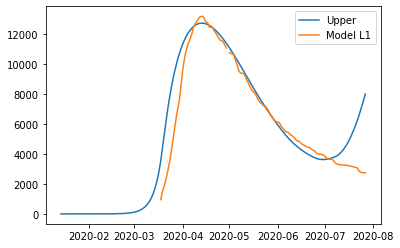

{'home': 0.9341696886884726, 'leisure': 0.829644894398691, 'other': 0.8252114307574119, 'school': 0.8275844306402697, 'transport': 0.8589713094542099, 'work': 0.829867477278283}
{'home': 0.9341696886884726, 'leisure': 0.12244529502659371, 'other': 0.007385109805206056, 'school': 0, 'transport': 0.17515360367212263, 'work': 0.016128609790113484}
{'home': 0.9341696886884726, 'leisure': 0.12244529502659371, 'other': 0.007385109805206056, 'school': 0, 'transport': 0.17515360367212263, 'work': 0.016128609790113484}
{'home': 0.9341696886884726, 'leisure': 0.3555290185516537, 'other': 0.08643469881482711, 'school': 0.273102862111289, 'transport': 0.2552279305720076, 'work': 0.24344445657878594}
{'home': 0.9341696886884726, 'leisure': 0.4444404811425303, 'other': 0.11479196932405393, 'school': 0.5544815685289807, 'transport': 0.3452714765576177, 'work': 0.3987754341994561}
{'home': 0.9341696886884726, 'leisure': 0.47790052153836926, 'other': 0.1705561789124627, 'school': 0.5544815685289807, 't

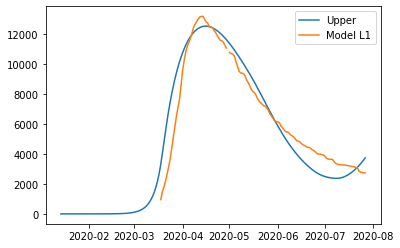

{'home': 0.9478714360057351, 'leisure': 0.8678021859282017, 'other': 0.8343961083540222, 'school': 0.8456259596995515, 'transport': 0.823884063248643, 'work': 0.8308315842800522}
{'home': 0.9478714360057351, 'leisure': 0.16101778411799217, 'other': 0.01669944399416568, 'school': 0, 'transport': 0.164757425158949, 'work': 0.2101467636752655}
{'home': 0.9478714360057351, 'leisure': 0.16101778411799217, 'other': 0.01669944399416568, 'school': 0, 'transport': 0.164757425158949, 'work': 0.2101467636752655}
{'home': 0.9478714360057351, 'leisure': 0.18594298838124135, 'other': 0.1402692379252974, 'school': 0.279056566700852, 'transport': 0.2194290344283464, 'work': 0.31030916381797585}
{'home': 0.9478714360057351, 'leisure': 0.3166667688868345, 'other': 0.2577041486254992, 'school': 0.5665693929986995, 'transport': 0.2562273430607617, 'work': 0.39701892102221037}
{'home': 0.9478714360057351, 'leisure': 0.45012966353520484, 'other': 0.2848757156129331, 'school': 0.5665693929986995, 'transport'

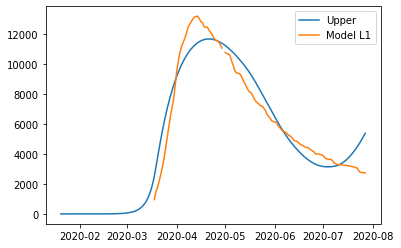

{'home': 0.9560094560893391, 'leisure': 0.8544058808754376, 'other': 0.8142879036282241, 'school': 0.9157566303354587, 'transport': 0.8271148422882337, 'work': 0.8198328281983723}
{'home': 0.9560094560893391, 'leisure': 0.1392641020442875, 'other': 0.1862301231400066, 'school': 0, 'transport': 0.1992560106911067, 'work': 0.14635678465957866}
{'home': 0.9560094560893391, 'leisure': 0.1392641020442875, 'other': 0.1862301231400066, 'school': 0, 'transport': 0.1992560106911067, 'work': 0.14635678465957866}
{'home': 0.9560094560893391, 'leisure': 0.26662494424537964, 'other': 0.30874570896551484, 'school': 0.3021996880107014, 'transport': 0.2663878138258692, 'work': 0.17575384913621805}
{'home': 0.9560094560893391, 'leisure': 0.3542680375226683, 'other': 0.43369895880581255, 'school': 0.6135569423247574, 'transport': 0.36752868749076295, 'work': 0.3847624679550611}
{'home': 0.9560094560893391, 'leisure': 0.47597364743777976, 'other': 0.5106168078717181, 'school': 0.6135569423247574, 'transp

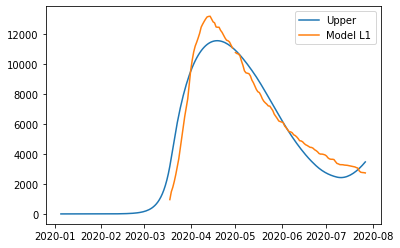

{'home': 0.9519896066690947, 'leisure': 0.8411338458736715, 'other': 0.8048850614569267, 'school': 0.9245073102138087, 'transport': 0.9119827407425575, 'work': 0.8732032565999605}
{'home': 0.9519896066690947, 'leisure': 0.1671663994961374, 'other': 0.17610009737669258, 'school': 0, 'transport': 0.15270631115540567, 'work': 0.16163961231445487}
{'home': 0.9519896066690947, 'leisure': 0.1671663994961374, 'other': 0.17610009737669258, 'school': 0, 'transport': 0.15270631115540567, 'work': 0.16163961231445487}
{'home': 0.9519896066690947, 'leisure': 0.21111552279934412, 'other': 0.31279408977260925, 'school': 0.30508741237055687, 'transport': 0.23260819358017779, 'work': 0.3530825202297642}
{'home': 0.9519896066690947, 'leisure': 0.24508444724901315, 'other': 0.395347295967285, 'school': 0.6194198978432519, 'transport': 0.2795908474289089, 'work': 0.37172749631154056}
{'home': 0.9519896066690947, 'leisure': 0.42593955019198965, 'other': 0.4018246694920042, 'school': 0.6194198978432519, 'tr

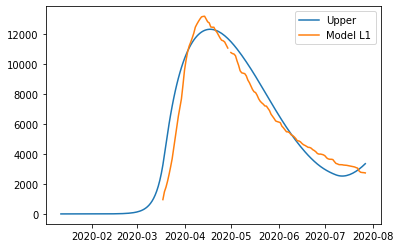

{'home': 0.9762615482524617, 'leisure': 0.8612961853677065, 'other': 0.909902112950251, 'school': 0.8992268008843685, 'transport': 0.9100808912099841, 'work': 0.8569504997793638}
{'home': 0.9762615482524617, 'leisure': 0.1670681535682688, 'other': 0.26576057267491593, 'school': 0, 'transport': 0.20591174000935114, 'work': 0.17465965370872188}
{'home': 0.9762615482524617, 'leisure': 0.1670681535682688, 'other': 0.26576057267491593, 'school': 0, 'transport': 0.20591174000935114, 'work': 0.17465965370872188}
{'home': 0.9762615482524617, 'leisure': 0.23844779841875235, 'other': 0.40010820648455503, 'school': 0.2967448442918416, 'transport': 0.3192474889751451, 'work': 0.22714794709530828}
{'home': 0.9762615482524617, 'leisure': 0.318002617915123, 'other': 0.4571040562099084, 'school': 0.6024819565925269, 'transport': 0.3564519610622817, 'work': 0.25880073057864733}
{'home': 0.9762615482524617, 'leisure': 0.4587493366881154, 'other': 0.5337911430265568, 'school': 0.6024819565925269, 'transp

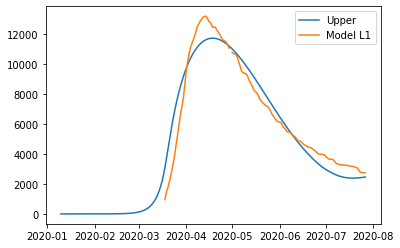

{'home': 0.9763101448000412, 'leisure': 0.8851401583319954, 'other': 0.9036403024716505, 'school': 0.9255258715164568, 'transport': 0.833536377316312, 'work': 0.8426795642579481}
{'home': 0.9763101448000412, 'leisure': 0.15022705530238792, 'other': 0.16947634867326053, 'school': 0, 'transport': 0.19876504517934995, 'work': 0.15984307579426127}
{'home': 0.9763101448000412, 'leisure': 0.15022705530238792, 'other': 0.16947634867326053, 'school': 0, 'transport': 0.19876504517934995, 'work': 0.15984307579426127}
{'home': 0.9763101448000412, 'leisure': 0.18059060684271364, 'other': 0.25197416015223245, 'school': 0.3054235376004308, 'transport': 0.30914612650776807, 'work': 0.19793426752967683}
{'home': 0.9763101448000412, 'leisure': 0.3061508569049836, 'other': 0.38604203152311, 'school': 0.6201023339160261, 'transport': 0.3599637972374375, 'work': 0.2380553788096881}
{'home': 0.9763101448000412, 'leisure': 0.5082866194970432, 'other': 0.5175233427466649, 'school': 0.6201023339160261, 'trans

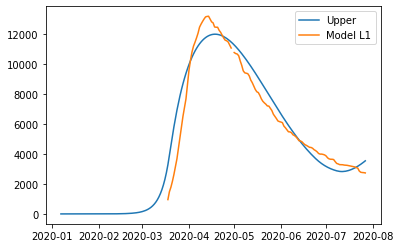

{'home': 0.9865316755645529, 'leisure': 0.8842046673066312, 'other': 0.9259005870620622, 'school': 0.9364791694445758, 'transport': 0.8735651588581367, 'work': 0.8325969644817688}
{'home': 0.9865316755645529, 'leisure': 0.09693189470122492, 'other': 0.15401260701668126, 'school': 0, 'transport': 0.17499576386971416, 'work': 0.1466332487878092}
{'home': 0.9865316755645529, 'leisure': 0.09693189470122492, 'other': 0.15401260701668126, 'school': 0, 'transport': 0.17499576386971416, 'work': 0.1466332487878092}
{'home': 0.9865316755645529, 'leisure': 0.15458486062023905, 'other': 0.19868289938136582, 'school': 0.30903812591671004, 'transport': 0.2807622178454317, 'work': 0.19981627949906075}
{'home': 0.9865316755645529, 'leisure': 0.30798340890273396, 'other': 0.3628560124706739, 'school': 0.6274410435278658, 'transport': 0.41139227130789807, 'work': 0.25600291848506235}
{'home': 0.9865316755645529, 'leisure': 0.4958561333848104, 'other': 0.4814552166777212, 'school': 0.6274410435278658, 't

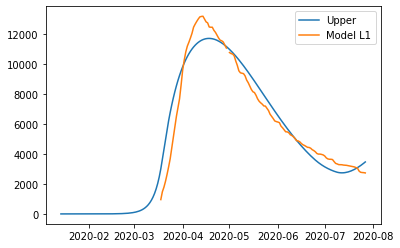

{'home': 0.9827084294157797, 'leisure': 0.9486180527368167, 'other': 0.9630194558748315, 'school': 0.9208507730110732, 'transport': 0.8373667662918667, 'work': 0.827127297440547}
{'home': 0.9827084294157797, 'leisure': 0.11763539676076318, 'other': 0.14392143615228323, 'school': 0, 'transport': 0.14924943285635434, 'work': 0.22247358041615817}
{'home': 0.9827084294157797, 'leisure': 0.11763539676076318, 'other': 0.14392143615228323, 'school': 0, 'transport': 0.14924943285635434, 'work': 0.22247358041615817}
{'home': 0.9827084294157797, 'leisure': 0.15628949992472496, 'other': 0.22040226496044688, 'school': 0.3038807550936542, 'transport': 0.24206322496081464, 'work': 0.29690205542899406}
{'home': 0.9827084294157797, 'leisure': 0.3356191025101954, 'other': 0.3692412789539295, 'school': 0.6169700179174191, 'transport': 0.3774575223426096, 'work': 0.4269765072826618}
{'home': 0.9827084294157797, 'leisure': 0.5047052536950567, 'other': 0.5194802665105438, 'school': 0.6169700179174191, 'tra

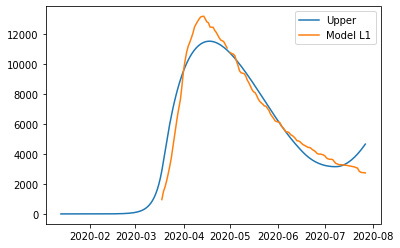

{'home': 0.9800092614241074, 'leisure': 0.9623956779657747, 'other': 0.8679793153441088, 'school': 0.9215598159954373, 'transport': 0.8936841937591568, 'work': 0.8161336586999399}
{'home': 0.9800092614241074, 'leisure': 0.14248941134454643, 'other': 0.09712473342173444, 'school': 0, 'transport': 0.13352772419168554, 'work': 0.3041403308874038}
{'home': 0.9800092614241074, 'leisure': 0.14248941134454643, 'other': 0.09712473342173444, 'school': 0, 'transport': 0.13352772419168554, 'work': 0.3041403308874038}
{'home': 0.9800092614241074, 'leisure': 0.17243349210798564, 'other': 0.23483870485843866, 'school': 0.30411473927849436, 'transport': 0.23234928796975793, 'work': 0.4820551356561248}
{'home': 0.9800092614241074, 'leisure': 0.33089508175064325, 'other': 0.34868762475229953, 'school': 0.617445076716943, 'transport': 0.3085850020984556, 'work': 0.5598731290028374}
{'home': 0.9800092614241074, 'leisure': 0.5539555415469912, 'other': 0.5587486936802081, 'school': 0.617445076716943, 'tran

KeyboardInterrupt: 

In [25]:
from scipy.optimize import minimize, Bounds, shgo, differential_evolution, dual_annealing
epsilon = 0.1
result = differential_evolution(error, [(50,140),
                                        windows['alpha_mixing'],windows['beta_mixing'],windows['gamma_mixing'],(0,0.5),(0,0.5)]+
                                        [(0.8,1),(0.8,1),(0.8,1),(0.8,1),(0.8,1),(0.8,1)]+
                                        [(0,1.0),(0,1),(0,1),(0,1),(0,1),(0,1),(0,1)]*4
                               )




In [29]:
# v0 = (list(best_v[0:4]) + list(best_v[4]*initial_params["mu"]) + list(best_v[5]*initial_params['sigma']) + list(best_v[6]*initial_params['p_H'])+
#       list(best_v[7]*initial_params['p_ICU'])+list(best_v[8]*initial_params['lambda_H_R'])+list(best_v[9]*initial_params['lambda_H_D'])+
#     list(best_v[10]*initial_params['lambda_ICU_R'])+list(best_v[11]*initial_params['lambda_ICU_D']) + list(best_v[12:]))
v0 = best_v
error(best_v)

5442.836493968382

In [27]:
lb= ([50,windows['alpha_mixing'][0],windows['beta_mixing'][0],windows['gamma_mixing'][0],0,0]+
                [0.8,0.8,0.8,0.8,0.8,0.8]+[0,0,0,0,0,0,0]*4)
ub = ([140,windows['alpha_mixing'][1],windows['beta_mixing'][1],windows['gamma_mixing'][1],0.5,0.5]+
                [1,1,1,1,1,1]+[1,1,1,1,1,1,1]*4)
for i in range(len(v0)):
    assert(v0[i]>=lb[i])
    assert(ub[i]>=v0[i])

5442.836452799578
error_groups 2245.054506801962
error_total 639.5563891995232
[6.45140782e+01 2.42283481e+00 1.10441269e+00 1.76303921e+00
 1.72413175e-01 0.00000000e+00 9.62229760e-01 9.20503019e-01
 8.42746869e-01 9.05438618e-01 8.00000000e-01 9.07532228e-01
 4.14735204e-01 8.48074221e-02 4.61385841e-01 6.50255247e-01
 7.22701522e-02 9.13510391e-01 6.99209135e-01 1.26691161e-01
 1.80959562e-01 1.46828546e-01 2.72868138e-01 3.65523008e-03
 3.47157082e-01 5.43869215e-01 7.71917977e-01 5.55546127e-01
 1.25732241e-01 3.24991629e-01 5.51091652e-03 2.56365501e-01
 3.16927169e-01 4.59799908e-01 3.40213603e-01 2.62232711e-01
 7.00039433e-01 4.63002914e-01 6.71486388e-01 6.61422182e-01]


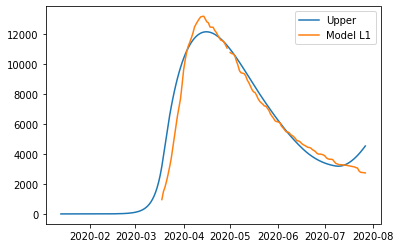

{'home': 0.9622297602478446, 'leisure': 0.9205030189206933, 'other': 0.8427468685233446, 'school': 0.9054386181806214, 'transport': 0.9075322281053965, 'work': 0.8}
{'home': 0.9622297602478446, 'leisure': 0.11582066904667122, 'other': 0.06582409035379172, 'school': 0, 'transport': 0.11727378178491742, 'work': 0.26200109997441506}
{'home': 0.9622297602478446, 'leisure': 0.11582066904667122, 'other': 0.06582409035379172, 'school': 0, 'transport': 0.11727378178491742, 'work': 0.26200109997441506}
{'home': 0.9622297602478446, 'leisure': 0.1395043406220456, 'other': 0.1598440559121161, 'school': 0.2987947439996051, 'transport': 0.20404660438205072, 'work': 0.45056219151654586}
{'home': 0.9622297602478446, 'leisure': 0.26835285952139926, 'other': 0.23613079433661732, 'school': 0.6066438741810164, 'transport': 0.2709300927310295, 'work': 0.49323769136994394}
{'home': 0.9622297602478446, 'leisure': 0.4499458299793789, 'other': 0.37790309208301687, 'school': 0.6066438741810164, 'transport': 0.4

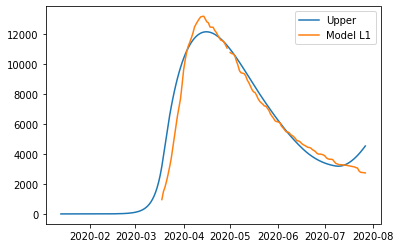

{'home': 0.9622297602478446, 'leisure': 0.9205030189206933, 'other': 0.8427468685233446, 'school': 0.9054386181806214, 'transport': 0.9075322281053965, 'work': 0.8}
{'home': 0.9622297602478446, 'leisure': 0.11582066904667122, 'other': 0.06582409035379172, 'school': 0, 'transport': 0.11727378178491742, 'work': 0.26200109997441506}
{'home': 0.9622297602478446, 'leisure': 0.11582066904667122, 'other': 0.06582409035379172, 'school': 0, 'transport': 0.11727378178491742, 'work': 0.26200109997441506}
{'home': 0.9622297602478446, 'leisure': 0.1395043406220456, 'other': 0.1598440559121161, 'school': 0.2987947439996051, 'transport': 0.20404660438205072, 'work': 0.45056219151654586}
{'home': 0.9622297602478446, 'leisure': 0.26835285952139926, 'other': 0.23613079433661732, 'school': 0.6066438741810164, 'transport': 0.2709300927310295, 'work': 0.49323769136994394}
{'home': 0.9622297602478446, 'leisure': 0.4499458299793789, 'other': 0.37790309208301687, 'school': 0.6066438741810164, 'transport': 0.4

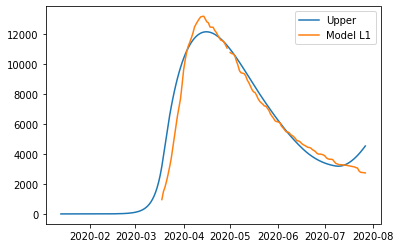

{'home': 0.9622297602478446, 'leisure': 0.9205030189206933, 'other': 0.8427468685233446, 'school': 0.9054386181806214, 'transport': 0.9075322281053965, 'work': 0.8}
{'home': 0.9622297602478446, 'leisure': 0.11582066904667122, 'other': 0.06582409035379172, 'school': 0, 'transport': 0.11727378178491742, 'work': 0.26200109997441506}
{'home': 0.9622297602478446, 'leisure': 0.11582066904667122, 'other': 0.06582409035379172, 'school': 0, 'transport': 0.11727378178491742, 'work': 0.26200109997441506}
{'home': 0.9622297602478446, 'leisure': 0.1395043406220456, 'other': 0.1598440559121161, 'school': 0.2987947439996051, 'transport': 0.20404660438205072, 'work': 0.45056219151654586}
{'home': 0.9622297602478446, 'leisure': 0.26835285952139926, 'other': 0.23613079433661732, 'school': 0.6066438741810164, 'transport': 0.2709300927310295, 'work': 0.49323769136994394}
{'home': 0.9622297602478446, 'leisure': 0.4499458299793789, 'other': 0.37790309208301687, 'school': 0.6066438741810164, 'transport': 0.4

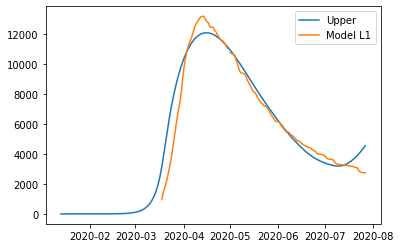

{'home': 0.9621833704351731, 'leisure': 0.9204685609244198, 'other': 0.8427346450002372, 'school': 0.9054084678694931, 'transport': 0.9075014791237649, 'work': 0.8}
{'home': 0.9621833704351731, 'leisure': 0.11579623645526134, 'other': 0.06581153022734462, 'school': 0, 'transport': 0.11725095739209354, 'work': 0.2619375250306327}
{'home': 0.9621833704351731, 'leisure': 0.11579623645526134, 'other': 0.06581153022734462, 'school': 0, 'transport': 0.11725095739209354, 'work': 0.2619375250306327}
{'home': 0.9621833704351731, 'leisure': 0.13947491191486938, 'other': 0.15981355550499637, 'school': 0.29878479439693273, 'transport': 0.2040068918411749, 'work': 0.4505499225280436}
{'home': 0.9621833704351731, 'leisure': 0.26829624997299717, 'other': 0.2360857373883332, 'school': 0.6066236734725604, 'transport': 0.2708773630009041, 'work': 0.49321506711001595}
{'home': 0.9621833704351731, 'leisure': 0.4498509130469266, 'other': 0.37783098306341933, 'school': 0.6066236734725604, 'transport': 0.449

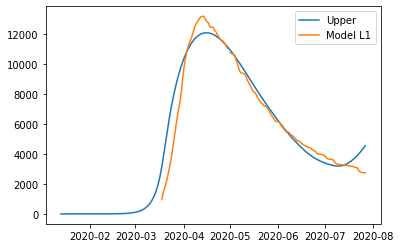

{'home': 0.9621833704351731, 'leisure': 0.9204685609244198, 'other': 0.8427346450002372, 'school': 0.9054084678694931, 'transport': 0.9075014791237649, 'work': 0.8}
{'home': 0.9621833704351731, 'leisure': 0.11579623645526134, 'other': 0.06581153022734462, 'school': 0, 'transport': 0.11725095739209354, 'work': 0.2619375250306327}
{'home': 0.9621833704351731, 'leisure': 0.11579623645526134, 'other': 0.06581153022734462, 'school': 0, 'transport': 0.11725095739209354, 'work': 0.2619375250306327}
{'home': 0.9621833704351731, 'leisure': 0.13947491191486938, 'other': 0.15981355550499637, 'school': 0.29878479439693273, 'transport': 0.2040068918411749, 'work': 0.4505499225280436}
{'home': 0.9621833704351731, 'leisure': 0.26829624997299717, 'other': 0.2360857373883332, 'school': 0.6066236734725604, 'transport': 0.2708773630009041, 'work': 0.49321506711001595}
{'home': 0.9621833704351731, 'leisure': 0.4498509130469266, 'other': 0.37783098306341933, 'school': 0.6066236734725604, 'transport': 0.449

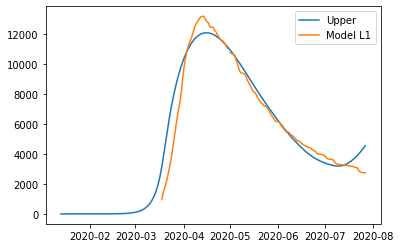

{'home': 0.9621833704351731, 'leisure': 0.9204685609244198, 'other': 0.8427346450002372, 'school': 0.9054084678694931, 'transport': 0.9075014791237649, 'work': 0.8}
{'home': 0.9621833704351731, 'leisure': 0.11579623645526134, 'other': 0.06581153022734462, 'school': 0, 'transport': 0.11725095739209354, 'work': 0.2619375250306327}
{'home': 0.9621833704351731, 'leisure': 0.11579623645526134, 'other': 0.06581153022734462, 'school': 0, 'transport': 0.11725095739209354, 'work': 0.2619375250306327}
{'home': 0.9621833704351731, 'leisure': 0.13947491191486938, 'other': 0.15981355550499637, 'school': 0.29878479439693273, 'transport': 0.2040068918411749, 'work': 0.4505499225280436}
{'home': 0.9621833704351731, 'leisure': 0.26829624997299717, 'other': 0.2360857373883332, 'school': 0.6066236734725604, 'transport': 0.2708773630009041, 'work': 0.49321506711001595}
{'home': 0.9621833704351731, 'leisure': 0.4498509130469266, 'other': 0.37783098306341933, 'school': 0.6066236734725604, 'transport': 0.449

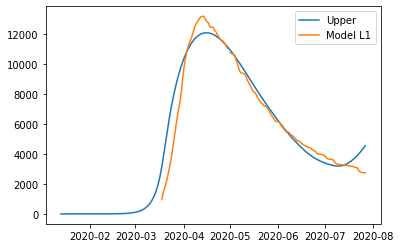

{'home': 0.9621833704351731, 'leisure': 0.9204685609244198, 'other': 0.8427346450002372, 'school': 0.9054084678694931, 'transport': 0.9075014791237649, 'work': 0.8}
{'home': 0.9621833704351731, 'leisure': 0.11579623645526134, 'other': 0.06581153022734462, 'school': 0, 'transport': 0.11725095739209354, 'work': 0.2619375250306327}
{'home': 0.9621833704351731, 'leisure': 0.11579623645526134, 'other': 0.06581153022734462, 'school': 0, 'transport': 0.11725095739209354, 'work': 0.2619375250306327}
{'home': 0.9621833704351731, 'leisure': 0.13947491191486938, 'other': 0.15981355550499637, 'school': 0.29878479439693273, 'transport': 0.2040068918411749, 'work': 0.4505499225280436}
{'home': 0.9621833704351731, 'leisure': 0.26829624997299717, 'other': 0.2360857373883332, 'school': 0.6066236734725604, 'transport': 0.2708773630009041, 'work': 0.49321506711001595}
{'home': 0.9621833704351731, 'leisure': 0.4498509130469266, 'other': 0.37783098306341933, 'school': 0.6066236734725604, 'transport': 0.449

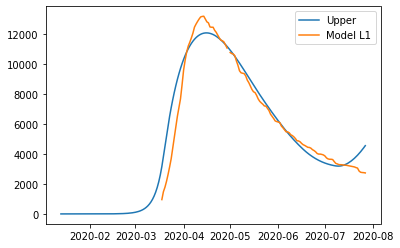

{'home': 0.9621766394780398, 'leisure': 0.9204725957290192, 'other': 0.8427370675271696, 'school': 0.9054081204804963, 'transport': 0.9074990599521356, 'work': 0.8}
{'home': 0.9621766394780398, 'leisure': 0.11579437492205072, 'other': 0.06581029602745968, 'school': 0, 'transport': 0.11724846725022751, 'work': 0.261930451635243}
{'home': 0.9621766394780398, 'leisure': 0.11579437492205072, 'other': 0.06581029602745968, 'school': 0, 'transport': 0.11724846725022751, 'work': 0.261930451635243}
{'home': 0.9621766394780398, 'leisure': 0.13947261125911464, 'other': 0.15981063029778053, 'school': 0.2987846797585638, 'transport': 0.20400255751913843, 'work': 0.4505490151306221}
{'home': 0.9621766394780398, 'leisure': 0.26829188387229713, 'other': 0.23608134104164563, 'school': 0.6066234407219326, 'transport': 0.2708715999997231, 'work': 0.4932127999075152}
{'home': 0.9621766394780398, 'leisure': 0.44984365682096195, 'other': 0.3778239686003754, 'school': 0.6066234407219326, 'transport': 0.44938

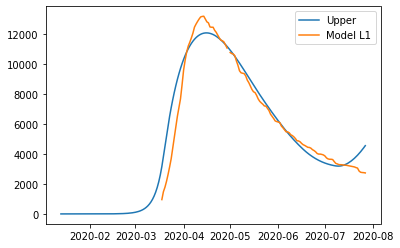

{'home': 0.9621766394780398, 'leisure': 0.9204725957290192, 'other': 0.8427370675271696, 'school': 0.9054081204804963, 'transport': 0.9074990599521356, 'work': 0.8}
{'home': 0.9621766394780398, 'leisure': 0.11579437492205072, 'other': 0.06581029602745968, 'school': 0, 'transport': 0.11724846725022751, 'work': 0.261930451635243}
{'home': 0.9621766394780398, 'leisure': 0.11579437492205072, 'other': 0.06581029602745968, 'school': 0, 'transport': 0.11724846725022751, 'work': 0.261930451635243}
{'home': 0.9621766394780398, 'leisure': 0.13947261125911464, 'other': 0.15981063029778053, 'school': 0.2987846797585638, 'transport': 0.20400255751913843, 'work': 0.4505490151306221}
{'home': 0.9621766394780398, 'leisure': 0.26829188387229713, 'other': 0.23608134104164563, 'school': 0.6066234407219326, 'transport': 0.2708715999997231, 'work': 0.4932127999075152}
{'home': 0.9621766394780398, 'leisure': 0.44984365682096195, 'other': 0.3778239686003754, 'school': 0.6066234407219326, 'transport': 0.44938

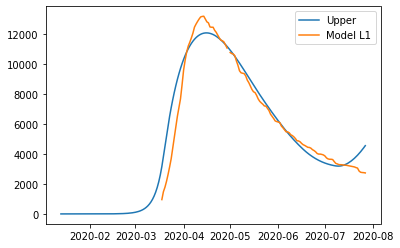

{'home': 0.9621766394780398, 'leisure': 0.9204725957290192, 'other': 0.8427370675271696, 'school': 0.9054081204804963, 'transport': 0.9074990599521356, 'work': 0.8}
{'home': 0.9621766394780398, 'leisure': 0.11579437492205072, 'other': 0.06581029602745968, 'school': 0, 'transport': 0.11724846725022751, 'work': 0.261930451635243}
{'home': 0.9621766394780398, 'leisure': 0.11579437492205072, 'other': 0.06581029602745968, 'school': 0, 'transport': 0.11724846725022751, 'work': 0.261930451635243}
{'home': 0.9621766394780398, 'leisure': 0.13947261125911464, 'other': 0.15981063029778053, 'school': 0.2987846797585638, 'transport': 0.20400255751913843, 'work': 0.4505490151306221}
{'home': 0.9621766394780398, 'leisure': 0.26829188387229713, 'other': 0.23608134104164563, 'school': 0.6066234407219326, 'transport': 0.2708715999997231, 'work': 0.4932127999075152}
{'home': 0.9621766394780398, 'leisure': 0.44984365682096195, 'other': 0.3778239686003754, 'school': 0.6066234407219326, 'transport': 0.44938

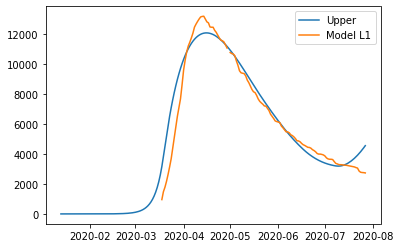

{'home': 0.9621766394780398, 'leisure': 0.9204725957290192, 'other': 0.8427370675271696, 'school': 0.9054081204804963, 'transport': 0.9074990599521356, 'work': 0.8}
{'home': 0.9621766394780398, 'leisure': 0.11579437492205072, 'other': 0.06581029602745968, 'school': 0, 'transport': 0.11724846725022751, 'work': 0.261930451635243}
{'home': 0.9621766394780398, 'leisure': 0.11579437492205072, 'other': 0.06581029602745968, 'school': 0, 'transport': 0.11724846725022751, 'work': 0.261930451635243}
{'home': 0.9621766394780398, 'leisure': 0.13947261125911464, 'other': 0.15981063029778053, 'school': 0.2987846797585638, 'transport': 0.20400255751913843, 'work': 0.4505490151306221}
{'home': 0.9621766394780398, 'leisure': 0.26829188387229713, 'other': 0.23608134104164563, 'school': 0.6066234407219326, 'transport': 0.2708715999997231, 'work': 0.4932127999075152}
{'home': 0.9621766394780398, 'leisure': 0.44984365682096195, 'other': 0.3778239686003754, 'school': 0.6066234407219326, 'transport': 0.44938

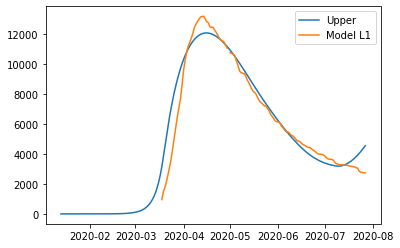

{'home': 0.9621658206378362, 'leisure': 0.920488920826098, 'other': 0.8427460638151466, 'school': 0.9054135807937805, 'transport': 0.9074999229462607, 'work': 0.8000043052780337}
{'home': 0.9621658206378362, 'leisure': 0.11579512070482736, 'other': 0.06581013476206597, 'school': 0, 'transport': 0.11724744068860381, 'work': 0.26192852232023534}
{'home': 0.9621658206378362, 'leisure': 0.11579512070482736, 'other': 0.06581013476206597, 'school': 0, 'transport': 0.11724744068860381, 'work': 0.26192852232023534}
{'home': 0.9621658206378362, 'leisure': 0.139473396326905, 'other': 0.1598103819061673, 'school': 0.2987864816619476, 'transport': 0.2040007684098522, 'work': 0.4505516653596971}
{'home': 0.9621658206378362, 'leisure': 0.2682935120188399, 'other': 0.23608082883881304, 'school': 0.606627099131833, 'transport': 0.27086920909050105, 'work': 0.4932147423757224}
{'home': 0.9621658206378362, 'leisure': 0.4498465136075743, 'other': 0.3778231918367137, 'school': 0.606627099131833, 'transpor

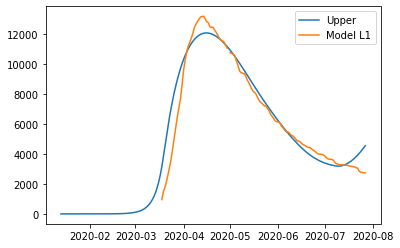

{'home': 0.9621658206378362, 'leisure': 0.920488920826098, 'other': 0.8427460638151466, 'school': 0.9054135807937805, 'transport': 0.9074999229462607, 'work': 0.8000043052780337}
{'home': 0.9621658206378362, 'leisure': 0.11579512070482736, 'other': 0.06581013476206597, 'school': 0, 'transport': 0.11724744068860381, 'work': 0.26192852232023534}
{'home': 0.9621658206378362, 'leisure': 0.11579512070482736, 'other': 0.06581013476206597, 'school': 0, 'transport': 0.11724744068860381, 'work': 0.26192852232023534}
{'home': 0.9621658206378362, 'leisure': 0.139473396326905, 'other': 0.1598103819061673, 'school': 0.2987864816619476, 'transport': 0.2040007684098522, 'work': 0.4505516653596971}
{'home': 0.9621658206378362, 'leisure': 0.2682935120188399, 'other': 0.23608082883881304, 'school': 0.606627099131833, 'transport': 0.27086920909050105, 'work': 0.4932147423757224}
{'home': 0.9621658206378362, 'leisure': 0.4498465136075743, 'other': 0.3778231918367137, 'school': 0.606627099131833, 'transpor

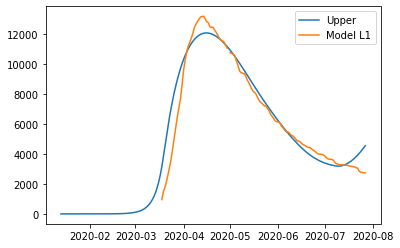

{'home': 0.9621658206378362, 'leisure': 0.920488920826098, 'other': 0.8427460638151466, 'school': 0.9054135807937805, 'transport': 0.9074999229462607, 'work': 0.8000043052780337}
{'home': 0.9621658206378362, 'leisure': 0.11579512070482736, 'other': 0.06581013476206597, 'school': 0, 'transport': 0.11724744068860381, 'work': 0.26192852232023534}
{'home': 0.9621658206378362, 'leisure': 0.11579512070482736, 'other': 0.06581013476206597, 'school': 0, 'transport': 0.11724744068860381, 'work': 0.26192852232023534}
{'home': 0.9621658206378362, 'leisure': 0.139473396326905, 'other': 0.1598103819061673, 'school': 0.2987864816619476, 'transport': 0.2040007684098522, 'work': 0.4505516653596971}
{'home': 0.9621658206378362, 'leisure': 0.2682935120188399, 'other': 0.23608082883881304, 'school': 0.606627099131833, 'transport': 0.27086920909050105, 'work': 0.4932147423757224}
{'home': 0.9621658206378362, 'leisure': 0.4498465136075743, 'other': 0.3778231918367137, 'school': 0.606627099131833, 'transpor

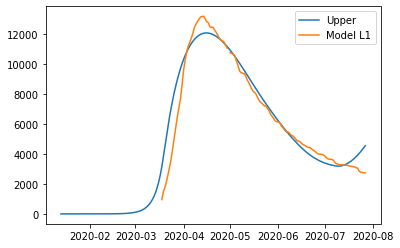

{'home': 0.9621658306378362, 'leisure': 0.920488920826098, 'other': 0.8427460638151466, 'school': 0.9054135807937805, 'transport': 0.9074999229462607, 'work': 0.8000043052780337}
{'home': 0.9621658306378362, 'leisure': 0.11579512070482736, 'other': 0.06581013476206597, 'school': 0, 'transport': 0.11724744068860381, 'work': 0.26192852232023534}
{'home': 0.9621658306378362, 'leisure': 0.11579512070482736, 'other': 0.06581013476206597, 'school': 0, 'transport': 0.11724744068860381, 'work': 0.26192852232023534}
{'home': 0.9621658306378362, 'leisure': 0.139473396326905, 'other': 0.1598103819061673, 'school': 0.2987864816619476, 'transport': 0.2040007684098522, 'work': 0.4505516653596971}
{'home': 0.9621658306378362, 'leisure': 0.2682935120188399, 'other': 0.23608082883881304, 'school': 0.606627099131833, 'transport': 0.27086920909050105, 'work': 0.4932147423757224}
{'home': 0.9621658306378362, 'leisure': 0.4498465136075743, 'other': 0.3778231918367137, 'school': 0.606627099131833, 'transpor

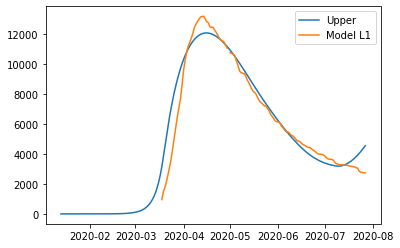

{'home': 0.9621658206378362, 'leisure': 0.9204889308260981, 'other': 0.8427460638151466, 'school': 0.9054135807937805, 'transport': 0.9074999229462607, 'work': 0.8000043052780337}
{'home': 0.9621658206378362, 'leisure': 0.11579512196280146, 'other': 0.06581013476206597, 'school': 0, 'transport': 0.11724744068860381, 'work': 0.26192852232023534}
{'home': 0.9621658206378362, 'leisure': 0.11579512196280146, 'other': 0.06581013476206597, 'school': 0, 'transport': 0.11724744068860381, 'work': 0.26192852232023534}
{'home': 0.9621658206378362, 'leisure': 0.13947339784211496, 'other': 0.1598103819061673, 'school': 0.2987864816619476, 'transport': 0.2040007684098522, 'work': 0.4505516653596971}
{'home': 0.9621658206378362, 'leisure': 0.26829351493352477, 'other': 0.23608082883881304, 'school': 0.606627099131833, 'transport': 0.27086920909050105, 'work': 0.4932147423757224}
{'home': 0.9621658206378362, 'leisure': 0.44984651849461327, 'other': 0.3778231918367137, 'school': 0.606627099131833, 'tra

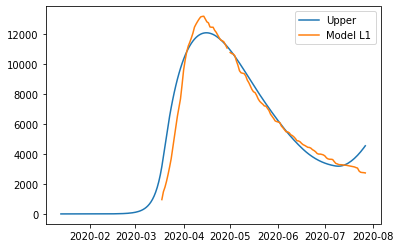

{'home': 0.9621430072302518, 'leisure': 0.9205419555022167, 'other': 0.8427746845414897, 'school': 0.9054364781013927, 'transport': 0.9075107291482823, 'work': 0.8000215263901682}
{'home': 0.9621430072302518, 'leisure': 0.11580376318988818, 'other': 0.06581324179411072, 'school': 0, 'transport': 0.1172509045474382, 'work': 0.2619423084388291}
{'home': 0.9621430072302518, 'leisure': 0.11580376318988818, 'other': 0.06581324179411072, 'school': 0, 'transport': 0.1172509045474382, 'work': 0.2619423084388291}
{'home': 0.9621430072302518, 'leisure': 0.1394835309327278, 'other': 0.1598182812826259, 'school': 0.2987940377734596, 'transport': 0.20400678844063438, 'work': 0.4505650248626569}
{'home': 0.9621430072302518, 'leisure': 0.2683132982200022, 'other': 0.23609214537693934, 'school': 0.6066424403279331, 'transport': 0.2708771651488115, 'work': 0.49322940466235643}
{'home': 0.9621430072302518, 'leisure': 0.44988000081587143, 'other': 0.37784140948088735, 'school': 0.6066424403279331, 'trans

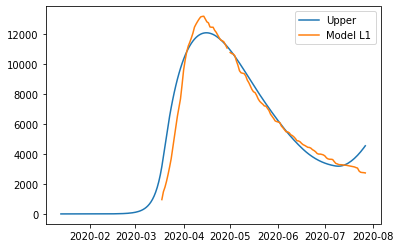

{'home': 0.9621430072302518, 'leisure': 0.9205419555022167, 'other': 0.8427746845414897, 'school': 0.9054364781013927, 'transport': 0.9075107291482823, 'work': 0.8000215263901682}
{'home': 0.9621430072302518, 'leisure': 0.11580376318988818, 'other': 0.06581324179411072, 'school': 0, 'transport': 0.1172509045474382, 'work': 0.2619423084388291}
{'home': 0.9621430072302518, 'leisure': 0.11580376318988818, 'other': 0.06581324179411072, 'school': 0, 'transport': 0.1172509045474382, 'work': 0.2619423084388291}
{'home': 0.9621430072302518, 'leisure': 0.1394835309327278, 'other': 0.1598182812826259, 'school': 0.2987940377734596, 'transport': 0.20400678844063438, 'work': 0.4505650248626569}
{'home': 0.9621430072302518, 'leisure': 0.2683132982200022, 'other': 0.23609214537693934, 'school': 0.6066424403279331, 'transport': 0.2708771651488115, 'work': 0.49322940466235643}
{'home': 0.9621430072302518, 'leisure': 0.44988000081587143, 'other': 0.37784140948088735, 'school': 0.6066424403279331, 'trans

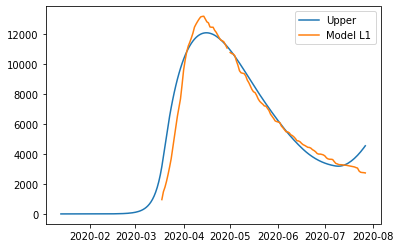

{'home': 0.9621430072302518, 'leisure': 0.9205419555022167, 'other': 0.8427746845414897, 'school': 0.9054364781013927, 'transport': 0.9075107291482823, 'work': 0.8000215263901682}
{'home': 0.9621430072302518, 'leisure': 0.11580376318988818, 'other': 0.06581324179411072, 'school': 0, 'transport': 0.1172509045474382, 'work': 0.2619423084388291}
{'home': 0.9621430072302518, 'leisure': 0.11580376318988818, 'other': 0.06581324179411072, 'school': 0, 'transport': 0.1172509045474382, 'work': 0.2619423084388291}
{'home': 0.9621430072302518, 'leisure': 0.1394835309327278, 'other': 0.1598182812826259, 'school': 0.2987940377734596, 'transport': 0.20400678844063438, 'work': 0.4505650248626569}
{'home': 0.9621430072302518, 'leisure': 0.2683132982200022, 'other': 0.23609214537693934, 'school': 0.6066424403279331, 'transport': 0.2708771651488115, 'work': 0.49322940466235643}
{'home': 0.9621430072302518, 'leisure': 0.44988000081587143, 'other': 0.37784140948088735, 'school': 0.6066424403279331, 'trans

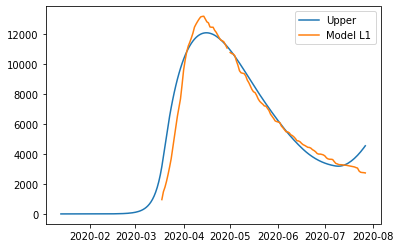

{'home': 0.9621430072302518, 'leisure': 0.9205419555022167, 'other': 0.8427746845414897, 'school': 0.9054364781013927, 'transport': 0.9075107291482823, 'work': 0.8000215263901682}
{'home': 0.9621430072302518, 'leisure': 0.11580376318988818, 'other': 0.06581324179411072, 'school': 0, 'transport': 0.1172509045474382, 'work': 0.2619423084388291}
{'home': 0.9621430072302518, 'leisure': 0.11580376318988818, 'other': 0.06581324179411072, 'school': 0, 'transport': 0.1172509045474382, 'work': 0.2619423084388291}
{'home': 0.9621430072302518, 'leisure': 0.1394835309327278, 'other': 0.1598182812826259, 'school': 0.2987940377734596, 'transport': 0.20400678844063438, 'work': 0.4505650248626569}
{'home': 0.9621430072302518, 'leisure': 0.2683132982200022, 'other': 0.23609214537693934, 'school': 0.6066424403279331, 'transport': 0.2708771651488115, 'work': 0.49322940466235643}
{'home': 0.9621430072302518, 'leisure': 0.44988000081587143, 'other': 0.37784140948088735, 'school': 0.6066424403279331, 'trans

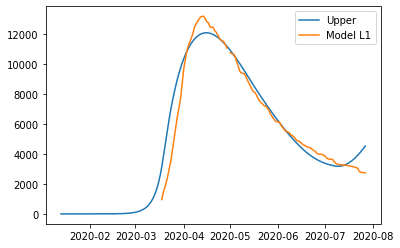

{'home': 0.9620832713693808, 'leisure': 0.9206505721729651, 'other': 0.84283396476385, 'school': 0.9054780405863107, 'transport': 0.9075245730765473, 'work': 0.8000538864003452}
{'home': 0.9620832713693808, 'leisure': 0.11581501846262086, 'other': 0.0658158465447411, 'school': 0, 'transport': 0.11725095395962896, 'work': 0.261949898961536}
{'home': 0.9620832713693808, 'leisure': 0.11581501846262086, 'other': 0.0658158465447411, 'school': 0, 'transport': 0.11725095395962896, 'work': 0.261949898961536}
{'home': 0.9620832713693808, 'leisure': 0.13949642916168886, 'other': 0.15982544620222042, 'school': 0.29880775339348253, 'transport': 0.20400685755897127, 'work': 0.45058770063630155}
{'home': 0.9620832713693808, 'leisure': 0.26833880033514695, 'other': 0.23610188513279257, 'school': 0.6066702871928281, 'transport': 0.2708771676953312, 'work': 0.4932510429870937}
{'home': 0.9620832713693808, 'leisure': 0.44992350176747353, 'other': 0.3778572493989862, 'school': 0.6066702871928281, 'transp

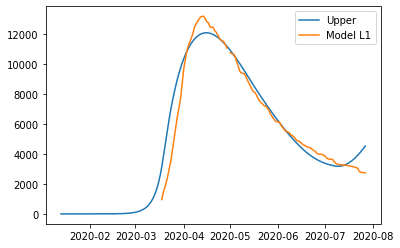

{'home': 0.9620832713693808, 'leisure': 0.9206505721729651, 'other': 0.84283396476385, 'school': 0.9054780405863107, 'transport': 0.9075245730765473, 'work': 0.8000538864003452}
{'home': 0.9620832713693808, 'leisure': 0.11581501846262086, 'other': 0.0658158465447411, 'school': 0, 'transport': 0.11725095395962896, 'work': 0.261949898961536}
{'home': 0.9620832713693808, 'leisure': 0.11581501846262086, 'other': 0.0658158465447411, 'school': 0, 'transport': 0.11725095395962896, 'work': 0.261949898961536}
{'home': 0.9620832713693808, 'leisure': 0.13949642916168886, 'other': 0.15982544620222042, 'school': 0.29880775339348253, 'transport': 0.20400685755897127, 'work': 0.45058770063630155}
{'home': 0.9620832713693808, 'leisure': 0.26833880033514695, 'other': 0.23610188513279257, 'school': 0.6066702871928281, 'transport': 0.2708771676953312, 'work': 0.4932510429870937}
{'home': 0.9620832713693808, 'leisure': 0.44992350176747353, 'other': 0.3778572493989862, 'school': 0.6066702871928281, 'transp

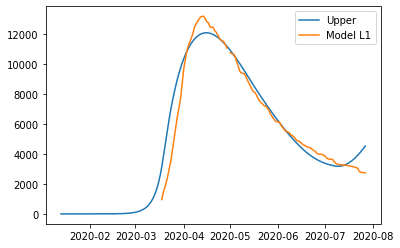

{'home': 0.9620832713693808, 'leisure': 0.9206505721729651, 'other': 0.84283396476385, 'school': 0.9054780405863107, 'transport': 0.9075245730765473, 'work': 0.8000538864003452}
{'home': 0.9620832713693808, 'leisure': 0.11581501846262086, 'other': 0.0658158465447411, 'school': 0, 'transport': 0.11725095395962896, 'work': 0.261949898961536}
{'home': 0.9620832713693808, 'leisure': 0.11581501846262086, 'other': 0.0658158465447411, 'school': 0, 'transport': 0.11725095395962896, 'work': 0.261949898961536}
{'home': 0.9620832713693808, 'leisure': 0.13949642916168886, 'other': 0.15982544620222042, 'school': 0.29880775339348253, 'transport': 0.20400685755897127, 'work': 0.45058770063630155}
{'home': 0.9620832713693808, 'leisure': 0.26833880033514695, 'other': 0.23610188513279257, 'school': 0.6066702871928281, 'transport': 0.2708771676953312, 'work': 0.4932510429870937}
{'home': 0.9620832713693808, 'leisure': 0.44992350176747353, 'other': 0.3778572493989862, 'school': 0.6066702871928281, 'transp

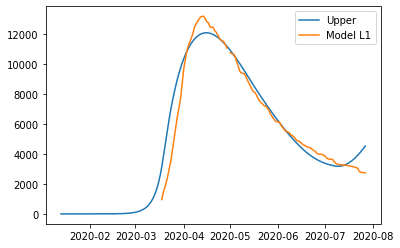

{'home': 0.9620832713693808, 'leisure': 0.9206505721729651, 'other': 0.84283396476385, 'school': 0.9054780405863107, 'transport': 0.9075245730765473, 'work': 0.8000538864003452}
{'home': 0.9620832713693808, 'leisure': 0.11581501846262086, 'other': 0.0658158465447411, 'school': 0, 'transport': 0.11725095395962896, 'work': 0.261949898961536}
{'home': 0.9620832713693808, 'leisure': 0.11581501846262086, 'other': 0.0658158465447411, 'school': 0, 'transport': 0.11725095395962896, 'work': 0.261949898961536}
{'home': 0.9620832713693808, 'leisure': 0.13949642916168886, 'other': 0.15982544620222042, 'school': 0.29880775339348253, 'transport': 0.20400685755897127, 'work': 0.45058770063630155}
{'home': 0.9620832713693808, 'leisure': 0.26833880033514695, 'other': 0.23610188513279257, 'school': 0.6066702871928281, 'transport': 0.2708771676953312, 'work': 0.4932510429870937}
{'home': 0.9620832713693808, 'leisure': 0.44992350176747353, 'other': 0.3778572493989862, 'school': 0.6066702871928281, 'transp

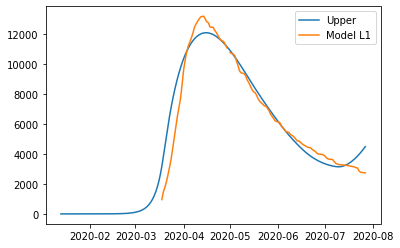

{'home': 0.9618443279258966, 'leisure': 0.9210850388559585, 'other': 0.8430710856532909, 'school': 0.9056442905259824, 'transport': 0.9075799487896072, 'work': 0.8001833264410534}
{'home': 0.9618443279258966, 'leisure': 0.11586003326933439, 'other': 0.06582626184451726, 'school': 0, 'transport': 0.11725115068948831, 'work': 0.26198025790548757}
{'home': 0.9618443279258966, 'leisure': 0.11586003326933439, 'other': 0.06582626184451726, 'school': 0, 'transport': 0.11725115068948831, 'work': 0.26198025790548757}
{'home': 0.9618443279258966, 'leisure': 0.1395480127901599, 'other': 0.15985409842467527, 'school': 0.2988626158735742, 'transport': 0.20400713242459803, 'work': 0.45067840839229406}
{'home': 0.9618443279258966, 'leisure': 0.26844079273272226, 'other': 0.23614083159708915, 'school': 0.6067816746524083, 'transport': 0.27087717569955955, 'work': 0.4933375980535918}
{'home': 0.9618443279258966, 'leisure': 0.45009748057605115, 'other': 0.3779205894334831, 'school': 0.6067816746524083, 

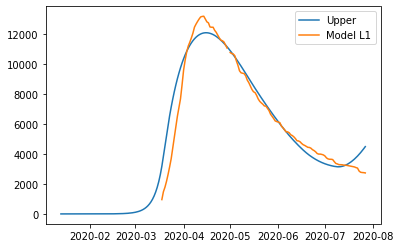

{'home': 0.9618443279258966, 'leisure': 0.9210850388559585, 'other': 0.8430710856532909, 'school': 0.9056442905259824, 'transport': 0.9075799487896072, 'work': 0.8001833264410534}
{'home': 0.9618443279258966, 'leisure': 0.11586003326933439, 'other': 0.06582626184451726, 'school': 0, 'transport': 0.11725115068948831, 'work': 0.26198025790548757}
{'home': 0.9618443279258966, 'leisure': 0.11586003326933439, 'other': 0.06582626184451726, 'school': 0, 'transport': 0.11725115068948831, 'work': 0.26198025790548757}
{'home': 0.9618443279258966, 'leisure': 0.1395480127901599, 'other': 0.15985409842467527, 'school': 0.2988626158735742, 'transport': 0.20400713242459803, 'work': 0.45067840839229406}
{'home': 0.9618443279258966, 'leisure': 0.26844079273272226, 'other': 0.23614083159708915, 'school': 0.6067816746524083, 'transport': 0.27087717569955955, 'work': 0.4933375980535918}
{'home': 0.9618443279258966, 'leisure': 0.45009748057605115, 'other': 0.3779205894334831, 'school': 0.6067816746524083, 

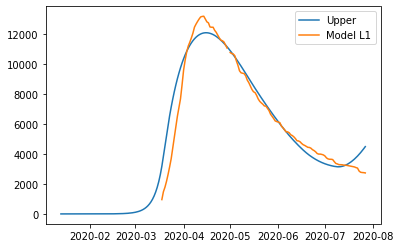

{'home': 0.9618443379258966, 'leisure': 0.9210850388559585, 'other': 0.8430710856532909, 'school': 0.9056442905259824, 'transport': 0.9075799487896072, 'work': 0.8001833264410534}
{'home': 0.9618443379258966, 'leisure': 0.11586003326933439, 'other': 0.06582626184451726, 'school': 0, 'transport': 0.11725115068948831, 'work': 0.26198025790548757}
{'home': 0.9618443379258966, 'leisure': 0.11586003326933439, 'other': 0.06582626184451726, 'school': 0, 'transport': 0.11725115068948831, 'work': 0.26198025790548757}
{'home': 0.9618443379258966, 'leisure': 0.1395480127901599, 'other': 0.15985409842467527, 'school': 0.2988626158735742, 'transport': 0.20400713242459803, 'work': 0.45067840839229406}
{'home': 0.9618443379258966, 'leisure': 0.26844079273272226, 'other': 0.23614083159708915, 'school': 0.6067816746524083, 'transport': 0.27087717569955955, 'work': 0.4933375980535918}
{'home': 0.9618443379258966, 'leisure': 0.45009748057605115, 'other': 0.3779205894334831, 'school': 0.6067816746524083, 

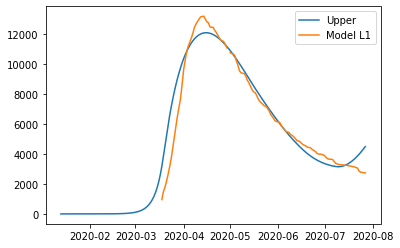

{'home': 0.9618888823832699, 'leisure': 0.9210276602392903, 'other': 0.8430372892774403, 'school': 0.9056208107628979, 'transport': 0.9075712223789024, 'work': 0.8001656706386565}
{'home': 0.9618888823832699, 'leisure': 0.11585323988412431, 'other': 0.06582416300685562, 'school': 0, 'transport': 0.11725020063825381, 'work': 0.26197417057123135}
{'home': 0.9618888823832699, 'leisure': 0.11585323988412431, 'other': 0.06582416300685562, 'school': 0, 'transport': 0.11725020063825381, 'work': 0.26197417057123135}
{'home': 0.9618888823832699, 'leisure': 0.1395401029983607, 'other': 0.15984863444821668, 'school': 0.29885486755175633, 'transport': 0.20400548614909675, 'work': 0.4506667408373149}
{'home': 0.9618888823832699, 'leisure': 0.26842527870555477, 'other': 0.2361330715377098, 'school': 0.6067659432111416, 'transport': 0.2708750244140476, 'work': 0.4933257607958233}
{'home': 0.9618888823832699, 'leisure': 0.45007114677168286, 'other': 0.37790799940065944, 'school': 0.6067659432111416, '

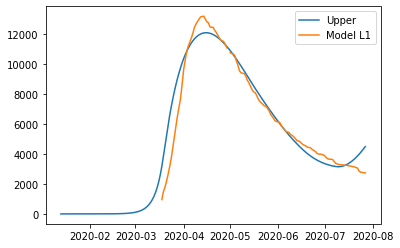

{'home': 0.9618888823832699, 'leisure': 0.9210276602392903, 'other': 0.8430372892774403, 'school': 0.9056208107628979, 'transport': 0.9075712223789024, 'work': 0.8001656706386565}
{'home': 0.9618888823832699, 'leisure': 0.11585323988412431, 'other': 0.06582416300685562, 'school': 0, 'transport': 0.11725020063825381, 'work': 0.26197417057123135}
{'home': 0.9618888823832699, 'leisure': 0.11585323988412431, 'other': 0.06582416300685562, 'school': 0, 'transport': 0.11725020063825381, 'work': 0.26197417057123135}
{'home': 0.9618888823832699, 'leisure': 0.1395401029983607, 'other': 0.15984863444821668, 'school': 0.29885486755175633, 'transport': 0.20400548614909675, 'work': 0.4506667408373149}
{'home': 0.9618888823832699, 'leisure': 0.26842527870555477, 'other': 0.2361330715377098, 'school': 0.6067659432111416, 'transport': 0.2708750244140476, 'work': 0.4933257607958233}
{'home': 0.9618888823832699, 'leisure': 0.45007114677168286, 'other': 0.37790799940065944, 'school': 0.6067659432111416, '

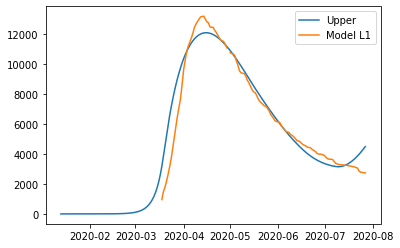

{'home': 0.9618888823832699, 'leisure': 0.9210276602392903, 'other': 0.8430372892774403, 'school': 0.9056208107628979, 'transport': 0.9075712223789024, 'work': 0.8001656706386565}
{'home': 0.9618888823832699, 'leisure': 0.11585323988412431, 'other': 0.06582416300685562, 'school': 0, 'transport': 0.11725020063825381, 'work': 0.26197417057123135}
{'home': 0.9618888823832699, 'leisure': 0.11585323988412431, 'other': 0.06582416300685562, 'school': 0, 'transport': 0.11725020063825381, 'work': 0.26197417057123135}
{'home': 0.9618888823832699, 'leisure': 0.1395401029983607, 'other': 0.15984863444821668, 'school': 0.29885486755175633, 'transport': 0.20400548614909675, 'work': 0.4506667408373149}
{'home': 0.9618888823832699, 'leisure': 0.26842527870555477, 'other': 0.2361330715377098, 'school': 0.6067659432111416, 'transport': 0.2708750244140476, 'work': 0.4933257607958233}
{'home': 0.9618888823832699, 'leisure': 0.45007114677168286, 'other': 0.37790799940065944, 'school': 0.6067659432111416, '

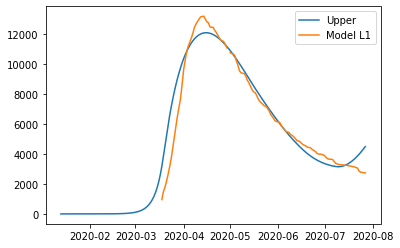

{'home': 0.9618888823832699, 'leisure': 0.9210276602392903, 'other': 0.8430372892774403, 'school': 0.9056208107628979, 'transport': 0.9075712223789024, 'work': 0.8001656706386565}
{'home': 0.9618888823832699, 'leisure': 0.11585323988412431, 'other': 0.06582416300685562, 'school': 0, 'transport': 0.11725020063825381, 'work': 0.26197417057123135}
{'home': 0.9618888823832699, 'leisure': 0.11585323988412431, 'other': 0.06582416300685562, 'school': 0, 'transport': 0.11725020063825381, 'work': 0.26197417057123135}
{'home': 0.9618888823832699, 'leisure': 0.1395401029983607, 'other': 0.15984863444821668, 'school': 0.29885486755175633, 'transport': 0.20400548614909675, 'work': 0.4506667408373149}
{'home': 0.9618888823832699, 'leisure': 0.26842527870555477, 'other': 0.2361330715377098, 'school': 0.6067659432111416, 'transport': 0.2708750244140476, 'work': 0.4933257607958233}
{'home': 0.9618888823832699, 'leisure': 0.45007114677168286, 'other': 0.37790799940065944, 'school': 0.6067659432111416, '

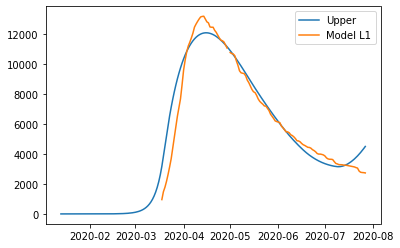

{'home': 0.9619130098782117, 'leisure': 0.9209938101371619, 'other': 0.8430172911669607, 'school': 0.9056054312727583, 'transport': 0.9075638653952005, 'work': 0.8001544308860877}
{'home': 0.9619130098782117, 'leisure': 0.11584754031850714, 'other': 0.06582192352397546, 'school': 0, 'transport': 0.11724779162972718, 'work': 0.261965240945671}
{'home': 0.9619130098782117, 'leisure': 0.11584754031850714, 'other': 0.06582192352397546, 'school': 0, 'transport': 0.11724779162972718, 'work': 0.261965240945671}
{'home': 0.9619130098782117, 'leisure': 0.13953336866095675, 'other': 0.15984301364939313, 'school': 0.29884979232001024, 'transport': 0.20400129789686863, 'work': 0.45065875970439306}
{'home': 0.9619130098782117, 'leisure': 0.2684121774182957, 'other': 0.23612490343279882, 'school': 0.6067556389527481, 'transport': 0.2708694790493437, 'work': 0.49331667848253374}
{'home': 0.9619130098782117, 'leisure': 0.45004902030923044, 'other': 0.3778948177524704, 'school': 0.6067556389527481, 'tr

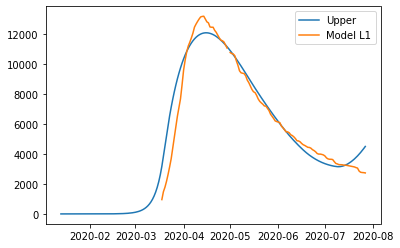

{'home': 0.9619130098782117, 'leisure': 0.9209938101371619, 'other': 0.8430172911669607, 'school': 0.9056054312727583, 'transport': 0.9075638653952005, 'work': 0.8001544308860877}
{'home': 0.9619130098782117, 'leisure': 0.11584754031850714, 'other': 0.06582192352397546, 'school': 0, 'transport': 0.11724779162972718, 'work': 0.261965240945671}
{'home': 0.9619130098782117, 'leisure': 0.11584754031850714, 'other': 0.06582192352397546, 'school': 0, 'transport': 0.11724779162972718, 'work': 0.261965240945671}
{'home': 0.9619130098782117, 'leisure': 0.13953336866095675, 'other': 0.15984301364939313, 'school': 0.29884979232001024, 'transport': 0.20400129789686863, 'work': 0.45065875970439306}
{'home': 0.9619130098782117, 'leisure': 0.2684121774182957, 'other': 0.23612490343279882, 'school': 0.6067556389527481, 'transport': 0.2708694790493437, 'work': 0.49331667848253374}
{'home': 0.9619130098782117, 'leisure': 0.45004902030923044, 'other': 0.3778948177524704, 'school': 0.6067556389527481, 'tr

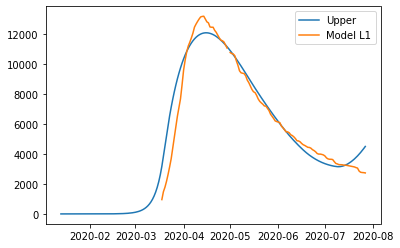

{'home': 0.9619130098782117, 'leisure': 0.9209938101371619, 'other': 0.8430172911669607, 'school': 0.9056054312727583, 'transport': 0.9075638653952005, 'work': 0.8001544308860877}
{'home': 0.9619130098782117, 'leisure': 0.11584754031850714, 'other': 0.06582192352397546, 'school': 0, 'transport': 0.11724779162972718, 'work': 0.261965240945671}
{'home': 0.9619130098782117, 'leisure': 0.11584754031850714, 'other': 0.06582192352397546, 'school': 0, 'transport': 0.11724779162972718, 'work': 0.261965240945671}
{'home': 0.9619130098782117, 'leisure': 0.13953336866095675, 'other': 0.15984301364939313, 'school': 0.29884979232001024, 'transport': 0.20400129789686863, 'work': 0.45065875970439306}
{'home': 0.9619130098782117, 'leisure': 0.2684121774182957, 'other': 0.23612490343279882, 'school': 0.6067556389527481, 'transport': 0.2708694790493437, 'work': 0.49331667848253374}
{'home': 0.9619130098782117, 'leisure': 0.45004902030923044, 'other': 0.3778948177524704, 'school': 0.6067556389527481, 'tr

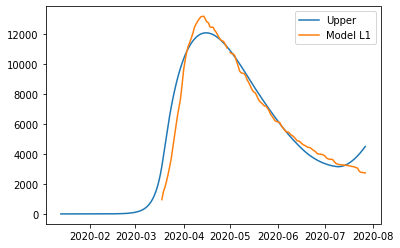

{'home': 0.961925431668818, 'leisure': 0.9210014157136414, 'other': 0.8430174527944923, 'school': 0.9056044169503128, 'transport': 0.9075602234717403, 'work': 0.8001552337401012}
{'home': 0.961925431668818, 'leisure': 0.11584516867817589, 'other': 0.06581991096222875, 'school': 0, 'transport': 0.11724434372858503, 'work': 0.2619569013224426}
{'home': 0.961925431668818, 'leisure': 0.11584516867817589, 'other': 0.06581991096222875, 'school': 0, 'transport': 0.11724434372858503, 'work': 0.2619569013224426}
{'home': 0.961925431668818, 'leisure': 0.13953032245880365, 'other': 0.15983833118701002, 'school': 0.29884945759360326, 'transport': 0.2039952942102142, 'work': 0.45065997552804365}
{'home': 0.961925431668818, 'leisure': 0.2684064951065758, 'other': 0.2361176564391177, 'school': 0.6067549593567096, 'transport': 0.2708614765514992, 'work': 0.4933156402029902}
{'home': 0.961925431668818, 'leisure': 0.4500396738334809, 'other': 0.377883121939976, 'school': 0.6067549593567096, 'transport':

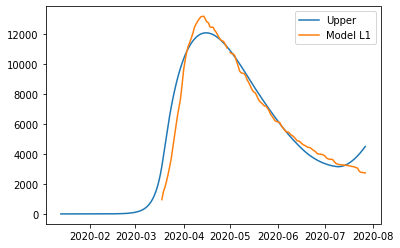

{'home': 0.961925431668818, 'leisure': 0.9210014157136414, 'other': 0.8430174527944923, 'school': 0.9056044169503128, 'transport': 0.9075602234717403, 'work': 0.8001552337401012}
{'home': 0.961925431668818, 'leisure': 0.11584516867817589, 'other': 0.06581991096222875, 'school': 0, 'transport': 0.11724434372858503, 'work': 0.2619569013224426}
{'home': 0.961925431668818, 'leisure': 0.11584516867817589, 'other': 0.06581991096222875, 'school': 0, 'transport': 0.11724434372858503, 'work': 0.2619569013224426}
{'home': 0.961925431668818, 'leisure': 0.13953032245880365, 'other': 0.15983833118701002, 'school': 0.29884945759360326, 'transport': 0.2039952942102142, 'work': 0.45065997552804365}
{'home': 0.961925431668818, 'leisure': 0.2684064951065758, 'other': 0.2361176564391177, 'school': 0.6067549593567096, 'transport': 0.2708614765514992, 'work': 0.4933156402029902}
{'home': 0.961925431668818, 'leisure': 0.4500396738334809, 'other': 0.377883121939976, 'school': 0.6067549593567096, 'transport':

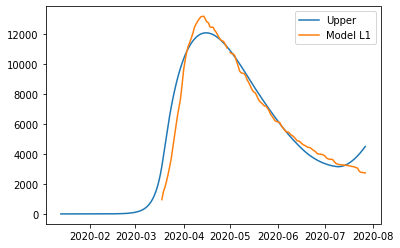

{'home': 0.9619254416688181, 'leisure': 0.9210014157136414, 'other': 0.8430174527944923, 'school': 0.9056044169503128, 'transport': 0.9075602234717403, 'work': 0.8001552337401012}
{'home': 0.9619254416688181, 'leisure': 0.11584516867817589, 'other': 0.06581991096222875, 'school': 0, 'transport': 0.11724434372858503, 'work': 0.2619569013224426}
{'home': 0.9619254416688181, 'leisure': 0.11584516867817589, 'other': 0.06581991096222875, 'school': 0, 'transport': 0.11724434372858503, 'work': 0.2619569013224426}
{'home': 0.9619254416688181, 'leisure': 0.13953032245880365, 'other': 0.15983833118701002, 'school': 0.29884945759360326, 'transport': 0.2039952942102142, 'work': 0.45065997552804365}
{'home': 0.9619254416688181, 'leisure': 0.2684064951065758, 'other': 0.2361176564391177, 'school': 0.6067549593567096, 'transport': 0.2708614765514992, 'work': 0.4933156402029902}
{'home': 0.9619254416688181, 'leisure': 0.4500396738334809, 'other': 0.377883121939976, 'school': 0.6067549593567096, 'trans

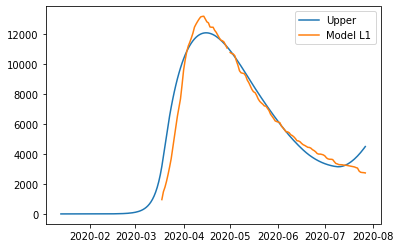

{'home': 0.9619247568484427, 'leisure': 0.9210644777320671, 'other': 0.8430446832025232, 'school': 0.9056242485151488, 'transport': 0.9075639503835399, 'work': 0.8001728795875286}
{'home': 0.9619247568484427, 'leisure': 0.11584908182514536, 'other': 0.06581928393503829, 'school': 0, 'transport': 0.11724151050096214, 'work': 0.2619550651626101}
{'home': 0.9619247568484427, 'leisure': 0.11584908182514536, 'other': 0.06581928393503829, 'school': 0, 'transport': 0.11724151050096214, 'work': 0.2619550651626101}
{'home': 0.9619247568484427, 'leisure': 0.1395344490240867, 'other': 0.15983749667022912, 'school': 0.2988560020099991, 'transport': 0.20399035015182954, 'work': 0.4506745510114297}
{'home': 0.9619247568484427, 'leisure': 0.2684150141895878, 'other': 0.23611552668244326, 'school': 0.6067682465051497, 'transport': 0.27085482377488623, 'work': 0.4933274943337893}
{'home': 0.9619247568484427, 'leisure': 0.4500545649349049, 'other': 0.3778796524215089, 'school': 0.6067682465051497, 'tran

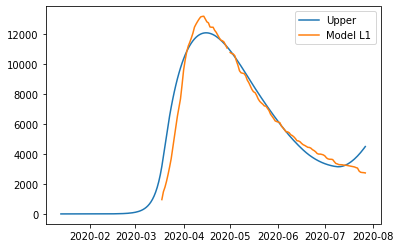

{'home': 0.9619247568484427, 'leisure': 0.9210644777320671, 'other': 0.8430446832025232, 'school': 0.9056242485151488, 'transport': 0.9075639503835399, 'work': 0.8001728795875286}
{'home': 0.9619247568484427, 'leisure': 0.11584908182514536, 'other': 0.06581928393503829, 'school': 0, 'transport': 0.11724151050096214, 'work': 0.2619550651626101}
{'home': 0.9619247568484427, 'leisure': 0.11584908182514536, 'other': 0.06581928393503829, 'school': 0, 'transport': 0.11724151050096214, 'work': 0.2619550651626101}
{'home': 0.9619247568484427, 'leisure': 0.1395344490240867, 'other': 0.15983749667022912, 'school': 0.2988560020099991, 'transport': 0.20399035015182954, 'work': 0.4506745510114297}
{'home': 0.9619247568484427, 'leisure': 0.2684150141895878, 'other': 0.23611552668244326, 'school': 0.6067682465051497, 'transport': 0.27085482377488623, 'work': 0.4933274943337893}
{'home': 0.9619247568484427, 'leisure': 0.4500545649349049, 'other': 0.3778796524215089, 'school': 0.6067682465051497, 'tran

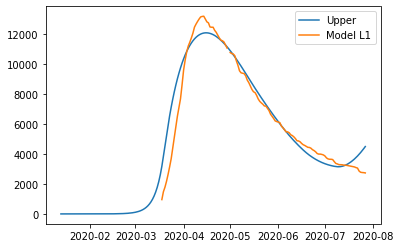

{'home': 0.9619247668484427, 'leisure': 0.9210644777320671, 'other': 0.8430446832025232, 'school': 0.9056242485151488, 'transport': 0.9075639503835399, 'work': 0.8001728795875286}
{'home': 0.9619247668484427, 'leisure': 0.11584908182514536, 'other': 0.06581928393503829, 'school': 0, 'transport': 0.11724151050096214, 'work': 0.2619550651626101}
{'home': 0.9619247668484427, 'leisure': 0.11584908182514536, 'other': 0.06581928393503829, 'school': 0, 'transport': 0.11724151050096214, 'work': 0.2619550651626101}
{'home': 0.9619247668484427, 'leisure': 0.1395344490240867, 'other': 0.15983749667022912, 'school': 0.2988560020099991, 'transport': 0.20399035015182954, 'work': 0.4506745510114297}
{'home': 0.9619247668484427, 'leisure': 0.2684150141895878, 'other': 0.23611552668244326, 'school': 0.6067682465051497, 'transport': 0.27085482377488623, 'work': 0.4933274943337893}
{'home': 0.9619247668484427, 'leisure': 0.4500545649349049, 'other': 0.3778796524215089, 'school': 0.6067682465051497, 'tran

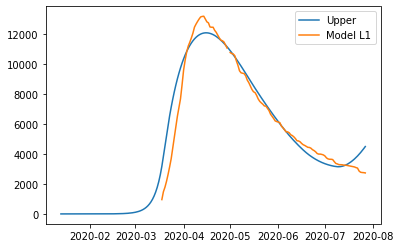

{'home': 0.961946102240887, 'leisure': 0.9210605501818131, 'other': 0.8430385094032046, 'school': 0.9056200602053543, 'transport': 0.9075606626269652, 'work': 0.8001707822923729}
{'home': 0.961946102240887, 'leisure': 0.11584691920715626, 'other': 0.06581781212180093, 'school': 0, 'transport': 0.1172395922783189, 'work': 0.2619503077045383}
{'home': 0.961946102240887, 'leisure': 0.11584691920715626, 'other': 0.06581781212180093, 'school': 0, 'transport': 0.1172395922783189, 'work': 0.2619503077045383}
{'home': 0.961946102240887, 'leisure': 0.13953174602276155, 'other': 0.15983401418461007, 'school': 0.29885461986776696, 'transport': 0.20398701015459605, 'work': 0.4506741797767129}
{'home': 0.961946102240887, 'leisure': 0.26840989772768903, 'other': 0.23611018097092087, 'school': 0.6067654403375875, 'transport': 0.2708503711417275, 'work': 0.4933257943722223}
{'home': 0.961946102240887, 'leisure': 0.450046068330824, 'other': 0.3778709895296459, 'school': 0.6067654403375875, 'transport':

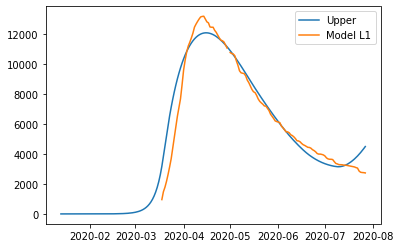

{'home': 0.961946102240887, 'leisure': 0.9210605501818131, 'other': 0.8430385094032046, 'school': 0.9056200602053543, 'transport': 0.9075606626269652, 'work': 0.8001707822923729}
{'home': 0.961946102240887, 'leisure': 0.11584691920715626, 'other': 0.06581781212180093, 'school': 0, 'transport': 0.1172395922783189, 'work': 0.2619503077045383}
{'home': 0.961946102240887, 'leisure': 0.11584691920715626, 'other': 0.06581781212180093, 'school': 0, 'transport': 0.1172395922783189, 'work': 0.2619503077045383}
{'home': 0.961946102240887, 'leisure': 0.13953174602276155, 'other': 0.15983401418461007, 'school': 0.29885461986776696, 'transport': 0.20398701015459605, 'work': 0.4506741797767129}
{'home': 0.961946102240887, 'leisure': 0.26840989772768903, 'other': 0.23611018097092087, 'school': 0.6067654403375875, 'transport': 0.2708503711417275, 'work': 0.4933257943722223}
{'home': 0.961946102240887, 'leisure': 0.450046068330824, 'other': 0.3778709895296459, 'school': 0.6067654403375875, 'transport':

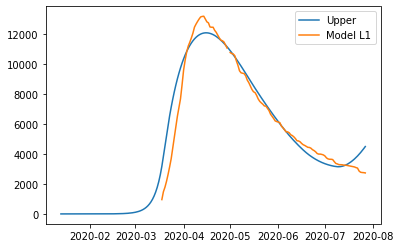

{'home': 0.961946112240887, 'leisure': 0.9210605501818131, 'other': 0.8430385094032046, 'school': 0.9056200602053543, 'transport': 0.9075606626269652, 'work': 0.8001707822923729}
{'home': 0.961946112240887, 'leisure': 0.11584691920715626, 'other': 0.06581781212180093, 'school': 0, 'transport': 0.1172395922783189, 'work': 0.2619503077045383}
{'home': 0.961946112240887, 'leisure': 0.11584691920715626, 'other': 0.06581781212180093, 'school': 0, 'transport': 0.1172395922783189, 'work': 0.2619503077045383}
{'home': 0.961946112240887, 'leisure': 0.13953174602276155, 'other': 0.15983401418461007, 'school': 0.29885461986776696, 'transport': 0.20398701015459605, 'work': 0.4506741797767129}
{'home': 0.961946112240887, 'leisure': 0.26840989772768903, 'other': 0.23611018097092087, 'school': 0.6067654403375875, 'transport': 0.2708503711417275, 'work': 0.4933257943722223}
{'home': 0.961946112240887, 'leisure': 0.450046068330824, 'other': 0.3778709895296459, 'school': 0.6067654403375875, 'transport':

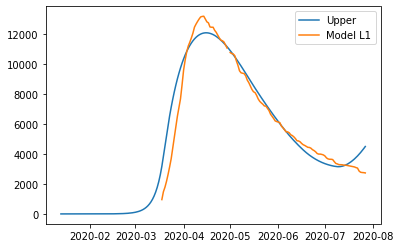

{'home': 0.962031483810664, 'leisure': 0.921044839980797, 'other': 0.8430138142059299, 'school': 0.9056033069661766, 'transport': 0.9075475116006666, 'work': 0.8001623931117503}
{'home': 0.962031483810664, 'leisure': 0.11583826856794294, 'other': 0.06581192480572562, 'school': 0, 'transport': 0.1172319192005924, 'work': 0.2619312776105131}
{'home': 0.962031483810664, 'leisure': 0.11583826856794294, 'other': 0.06581192480572562, 'school': 0, 'transport': 0.1172319192005924, 'work': 0.2619312776105131}
{'home': 0.962031483810664, 'leisure': 0.13952093380616154, 'other': 0.15982008409468595, 'school': 0.2988490912988383, 'transport': 0.20397364983972338, 'work': 0.45067269488992573}
{'home': 0.962031483810664, 'leisure': 0.2683894314819641, 'other': 0.23608879789417941, 'school': 0.6067542156673383, 'transport': 0.27083256017408097, 'work': 0.4933189944997909}
{'home': 0.962031483810664, 'leisure': 0.45001208125519404, 'other': 0.3778363375861952, 'school': 0.6067542156673383, 'transport'

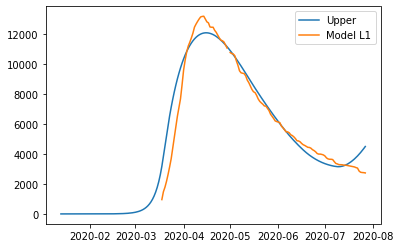

{'home': 0.962031483810664, 'leisure': 0.921044839980797, 'other': 0.8430138142059299, 'school': 0.9056033069661766, 'transport': 0.9075475116006666, 'work': 0.8001623931117503}
{'home': 0.962031483810664, 'leisure': 0.11583826856794294, 'other': 0.06581192480572562, 'school': 0, 'transport': 0.1172319192005924, 'work': 0.2619312776105131}
{'home': 0.962031483810664, 'leisure': 0.11583826856794294, 'other': 0.06581192480572562, 'school': 0, 'transport': 0.1172319192005924, 'work': 0.2619312776105131}
{'home': 0.962031483810664, 'leisure': 0.13952093380616154, 'other': 0.15982008409468595, 'school': 0.2988490912988383, 'transport': 0.20397364983972338, 'work': 0.45067269488992573}
{'home': 0.962031483810664, 'leisure': 0.2683894314819641, 'other': 0.23608879789417941, 'school': 0.6067542156673383, 'transport': 0.27083256017408097, 'work': 0.4933189944997909}
{'home': 0.962031483810664, 'leisure': 0.45001208125519404, 'other': 0.3778363375861952, 'school': 0.6067542156673383, 'transport'

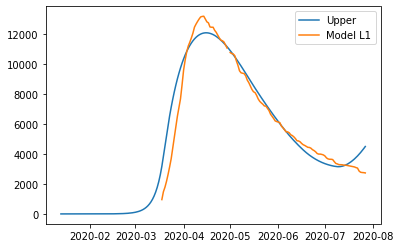

{'home': 0.962031483810664, 'leisure': 0.921044839980797, 'other': 0.8430138142059299, 'school': 0.9056033069661766, 'transport': 0.9075475116006666, 'work': 0.8001623931117503}
{'home': 0.962031483810664, 'leisure': 0.11583826856794294, 'other': 0.06581192480572562, 'school': 0, 'transport': 0.1172319192005924, 'work': 0.2619312776105131}
{'home': 0.962031483810664, 'leisure': 0.11583826856794294, 'other': 0.06581192480572562, 'school': 0, 'transport': 0.1172319192005924, 'work': 0.2619312776105131}
{'home': 0.962031483810664, 'leisure': 0.13952093380616154, 'other': 0.15982008409468595, 'school': 0.2988490912988383, 'transport': 0.20397364983972338, 'work': 0.45067269488992573}
{'home': 0.962031483810664, 'leisure': 0.2683894314819641, 'other': 0.23608879789417941, 'school': 0.6067542156673383, 'transport': 0.27083256017408097, 'work': 0.4933189944997909}
{'home': 0.962031483810664, 'leisure': 0.45001208125519404, 'other': 0.3778363375861952, 'school': 0.6067542156673383, 'transport'

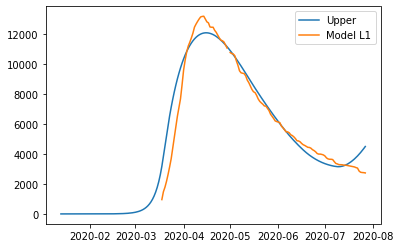

{'home': 0.962031483810664, 'leisure': 0.921044839980797, 'other': 0.8430138142059299, 'school': 0.9056033069661766, 'transport': 0.9075475116006666, 'work': 0.8001623931117503}
{'home': 0.962031483810664, 'leisure': 0.11583826856794294, 'other': 0.06581192480572562, 'school': 0, 'transport': 0.1172319192005924, 'work': 0.2619312776105131}
{'home': 0.962031483810664, 'leisure': 0.11583826856794294, 'other': 0.06581192480572562, 'school': 0, 'transport': 0.1172319192005924, 'work': 0.2619312776105131}
{'home': 0.962031483810664, 'leisure': 0.13952093380616154, 'other': 0.15982008409468595, 'school': 0.2988490912988383, 'transport': 0.20397364983972338, 'work': 0.45067269488992573}
{'home': 0.962031483810664, 'leisure': 0.2683894314819641, 'other': 0.23608879789417941, 'school': 0.6067542156673383, 'transport': 0.27083256017408097, 'work': 0.4933189944997909}
{'home': 0.962031483810664, 'leisure': 0.45001208125519404, 'other': 0.3778363375861952, 'school': 0.6067542156673383, 'transport'

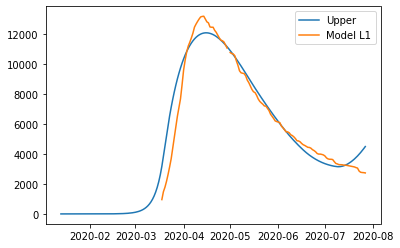

{'home': 0.9621014444663387, 'leisure': 0.9210885828554275, 'other': 0.843017498997052, 'school': 0.9056057600742204, 'transport': 0.907537914763797, 'work': 0.8001705941563201}
{'home': 0.9621014444663387, 'leisure': 0.11583307732466791, 'other': 0.06580554159009226, 'school': 0, 'transport': 0.11722132488038214, 'work': 0.2619090858755287}
{'home': 0.9621014444663387, 'leisure': 0.11583307732466791, 'other': 0.06580554159009226, 'school': 0, 'transport': 0.11722132488038214, 'work': 0.2619090858755287}
{'home': 0.9621014444663387, 'leisure': 0.13951379205678927, 'other': 0.1598055450236671, 'school': 0.29884990082449275, 'transport': 0.20395519457771652, 'work': 0.4506837359384683}
{'home': 0.9621014444663387, 'leisure': 0.2683765253284336, 'other': 0.2360657852442041, 'school': 0.6067558592497277, 'transport': 0.27080791141655547, 'work': 0.49332224045791245}
{'home': 0.9621014444663387, 'leisure': 0.449991294760893, 'other': 0.37779908107342275, 'school': 0.6067558592497277, 'trans

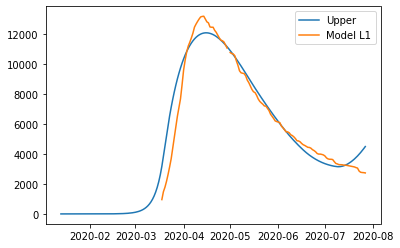

{'home': 0.9621014444663387, 'leisure': 0.9210885828554275, 'other': 0.843017498997052, 'school': 0.9056057600742204, 'transport': 0.907537914763797, 'work': 0.8001705941563201}
{'home': 0.9621014444663387, 'leisure': 0.11583307732466791, 'other': 0.06580554159009226, 'school': 0, 'transport': 0.11722132488038214, 'work': 0.2619090858755287}
{'home': 0.9621014444663387, 'leisure': 0.11583307732466791, 'other': 0.06580554159009226, 'school': 0, 'transport': 0.11722132488038214, 'work': 0.2619090858755287}
{'home': 0.9621014444663387, 'leisure': 0.13951379205678927, 'other': 0.1598055450236671, 'school': 0.29884990082449275, 'transport': 0.20395519457771652, 'work': 0.4506837359384683}
{'home': 0.9621014444663387, 'leisure': 0.2683765253284336, 'other': 0.2360657852442041, 'school': 0.6067558592497277, 'transport': 0.27080791141655547, 'work': 0.49332224045791245}
{'home': 0.9621014444663387, 'leisure': 0.449991294760893, 'other': 0.37779908107342275, 'school': 0.6067558592497277, 'trans

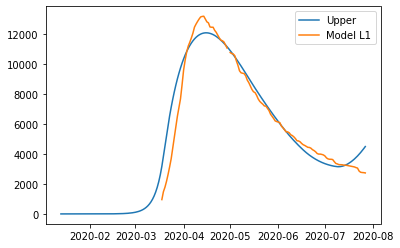

{'home': 0.9621014444663387, 'leisure': 0.9210885828554275, 'other': 0.843017498997052, 'school': 0.9056057600742204, 'transport': 0.907537914763797, 'work': 0.8001705941563201}
{'home': 0.9621014444663387, 'leisure': 0.11583307732466791, 'other': 0.06580554159009226, 'school': 0, 'transport': 0.11722132488038214, 'work': 0.2619090858755287}
{'home': 0.9621014444663387, 'leisure': 0.11583307732466791, 'other': 0.06580554159009226, 'school': 0, 'transport': 0.11722132488038214, 'work': 0.2619090858755287}
{'home': 0.9621014444663387, 'leisure': 0.13951379205678927, 'other': 0.1598055450236671, 'school': 0.29884990082449275, 'transport': 0.20395519457771652, 'work': 0.4506837359384683}
{'home': 0.9621014444663387, 'leisure': 0.2683765253284336, 'other': 0.2360657852442041, 'school': 0.6067558592497277, 'transport': 0.27080791141655547, 'work': 0.49332224045791245}
{'home': 0.9621014444663387, 'leisure': 0.449991294760893, 'other': 0.37779908107342275, 'school': 0.6067558592497277, 'trans

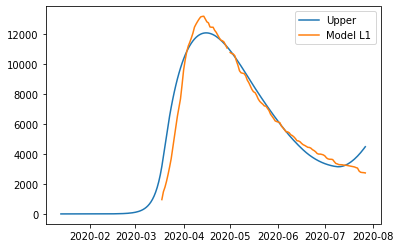

{'home': 0.9623812870890378, 'leisure': 0.9212635543539495, 'other': 0.8430322381615405, 'school': 0.9056155725063957, 'transport': 0.9074995274163185, 'work': 0.8002033983345992}
{'home': 0.9623812870890378, 'leisure': 0.1158122895913541, 'other': 0.065779998769345, 'school': 0, 'transport': 0.11717893802463057, 'work': 0.26182029463816564}
{'home': 0.9623812870890378, 'leisure': 0.1158122895913541, 'other': 0.065779998769345, 'school': 0, 'transport': 0.11717893802463057, 'work': 0.26182029463816564}
{'home': 0.9623812870890378, 'leisure': 0.13948519575317395, 'other': 0.15974736599300787, 'school': 0.2988531389271106, 'transport': 0.20388135684759479, 'work': 0.4507279064051935}
{'home': 0.9623812870890378, 'leisure': 0.2683248461107103, 'other': 0.2359736987508037, 'school': 0.6067624335792852, 'transport': 0.27070929408868144, 'work': 0.49333522252234446}
{'home': 0.9623812870890378, 'leisure': 0.4499080590456865, 'other': 0.37764999694085605, 'school': 0.6067624335792852, 'transp

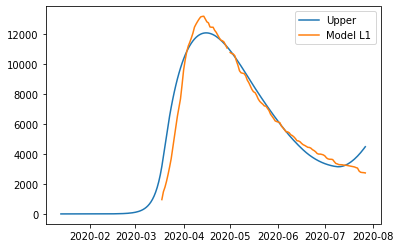

{'home': 0.9623812870890378, 'leisure': 0.9212635543539495, 'other': 0.8430322381615405, 'school': 0.9056155725063957, 'transport': 0.9074995274163185, 'work': 0.8002033983345992}
{'home': 0.9623812870890378, 'leisure': 0.1158122895913541, 'other': 0.065779998769345, 'school': 0, 'transport': 0.11717893802463057, 'work': 0.26182029463816564}
{'home': 0.9623812870890378, 'leisure': 0.1158122895913541, 'other': 0.065779998769345, 'school': 0, 'transport': 0.11717893802463057, 'work': 0.26182029463816564}
{'home': 0.9623812870890378, 'leisure': 0.13948519575317395, 'other': 0.15974736599300787, 'school': 0.2988531389271106, 'transport': 0.20388135684759479, 'work': 0.4507279064051935}
{'home': 0.9623812870890378, 'leisure': 0.2683248461107103, 'other': 0.2359736987508037, 'school': 0.6067624335792852, 'transport': 0.27070929408868144, 'work': 0.49333522252234446}
{'home': 0.9623812870890378, 'leisure': 0.4499080590456865, 'other': 0.37764999694085605, 'school': 0.6067624335792852, 'transp

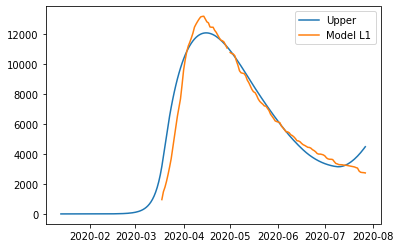

{'home': 0.9623812970890379, 'leisure': 0.9212635543539495, 'other': 0.8430322381615405, 'school': 0.9056155725063957, 'transport': 0.9074995274163185, 'work': 0.8002033983345992}
{'home': 0.9623812970890379, 'leisure': 0.1158122895913541, 'other': 0.065779998769345, 'school': 0, 'transport': 0.11717893802463057, 'work': 0.26182029463816564}
{'home': 0.9623812970890379, 'leisure': 0.1158122895913541, 'other': 0.065779998769345, 'school': 0, 'transport': 0.11717893802463057, 'work': 0.26182029463816564}
{'home': 0.9623812970890379, 'leisure': 0.13948519575317395, 'other': 0.15974736599300787, 'school': 0.2988531389271106, 'transport': 0.20388135684759479, 'work': 0.4507279064051935}
{'home': 0.9623812970890379, 'leisure': 0.2683248461107103, 'other': 0.2359736987508037, 'school': 0.6067624335792852, 'transport': 0.27070929408868144, 'work': 0.49333522252234446}
{'home': 0.9623812970890379, 'leisure': 0.4499080590456865, 'other': 0.37764999694085605, 'school': 0.6067624335792852, 'transp

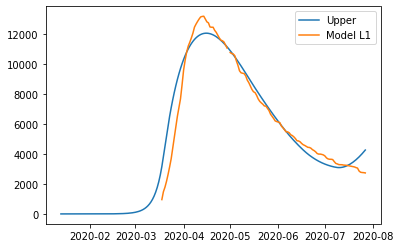

{'home': 0.9674576316557874, 'leisure': 0.9244782790766027, 'other': 0.8433207940413905, 'school': 0.9058191196034164, 'transport': 0.9068230434782661, 'work': 0.8008155674102123}
{'home': 0.9674576316557874, 'leisure': 0.11544454007591573, 'other': 0.065321495272439, 'school': 0, 'transport': 0.11641988152137274, 'work': 0.26024185454974086}
{'home': 0.9674576316557874, 'leisure': 0.11544454007591573, 'other': 0.065321495272439, 'school': 0, 'transport': 0.11641988152137274, 'work': 0.26024185454974086}
{'home': 0.9674576316557874, 'leisure': 0.13897710382763298, 'other': 0.15870427740570484, 'school': 0.29892030946912745, 'transport': 0.2025590544781304, 'work': 0.45154697550525885}
{'home': 0.9674576316557874, 'leisure': 0.26740844800865804, 'other': 0.23432070703499466, 'school': 0.606898810134289, 'transport': 0.2689430515884244, 'work': 0.49359251547030436}
{'home': 0.9674576316557874, 'leisure': 0.44843409290556796, 'other': 0.37497351392227574, 'school': 0.606898810134289, 'tra

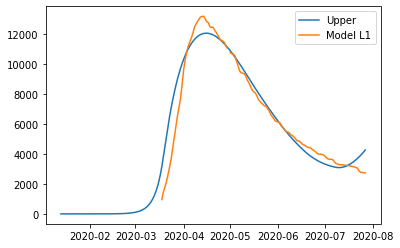

{'home': 0.9674576316557874, 'leisure': 0.9244782790766027, 'other': 0.8433207940413905, 'school': 0.9058191196034164, 'transport': 0.9068230434782661, 'work': 0.8008155674102123}
{'home': 0.9674576316557874, 'leisure': 0.11544454007591573, 'other': 0.065321495272439, 'school': 0, 'transport': 0.11641988152137274, 'work': 0.26024185454974086}
{'home': 0.9674576316557874, 'leisure': 0.11544454007591573, 'other': 0.065321495272439, 'school': 0, 'transport': 0.11641988152137274, 'work': 0.26024185454974086}
{'home': 0.9674576316557874, 'leisure': 0.13897710382763298, 'other': 0.15870427740570484, 'school': 0.29892030946912745, 'transport': 0.2025590544781304, 'work': 0.45154697550525885}
{'home': 0.9674576316557874, 'leisure': 0.26740844800865804, 'other': 0.23432070703499466, 'school': 0.606898810134289, 'transport': 0.2689430515884244, 'work': 0.49359251547030436}
{'home': 0.9674576316557874, 'leisure': 0.44843409290556796, 'other': 0.37497351392227574, 'school': 0.606898810134289, 'tra

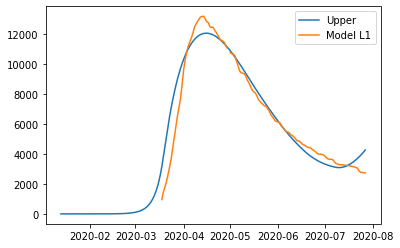

{'home': 0.9674576416557874, 'leisure': 0.9244782790766027, 'other': 0.8433207940413905, 'school': 0.9058191196034164, 'transport': 0.9068230434782661, 'work': 0.8008155674102123}
{'home': 0.9674576416557874, 'leisure': 0.11544454007591573, 'other': 0.065321495272439, 'school': 0, 'transport': 0.11641988152137274, 'work': 0.26024185454974086}
{'home': 0.9674576416557874, 'leisure': 0.11544454007591573, 'other': 0.065321495272439, 'school': 0, 'transport': 0.11641988152137274, 'work': 0.26024185454974086}
{'home': 0.9674576416557874, 'leisure': 0.13897710382763298, 'other': 0.15870427740570484, 'school': 0.29892030946912745, 'transport': 0.2025590544781304, 'work': 0.45154697550525885}
{'home': 0.9674576416557874, 'leisure': 0.26740844800865804, 'other': 0.23432070703499466, 'school': 0.606898810134289, 'transport': 0.2689430515884244, 'work': 0.49359251547030436}
{'home': 0.9674576416557874, 'leisure': 0.44843409290556796, 'other': 0.37497351392227574, 'school': 0.606898810134289, 'tra

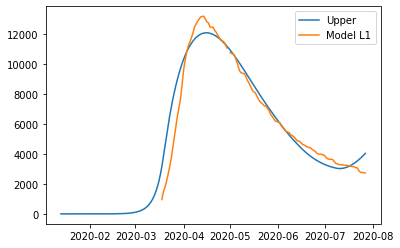

{'home': 0.972667723513458, 'leisure': 0.9277909157713964, 'other': 0.8436182109728254, 'school': 0.9060287644997089, 'transport': 0.9061294443363617, 'work': 0.8014607855350826}
{'home': 0.972667723513458, 'leisure': 0.11505662256527174, 'other': 0.06484647840765184, 'school': 0, 'transport': 0.11563606783242046, 'work': 0.2586191373629949}
{'home': 0.972667723513458, 'leisure': 0.11505662256527174, 'other': 0.06484647840765184, 'school': 0, 'transport': 0.11563606783242046, 'work': 0.2586191373629949}
{'home': 0.972667723513458, 'leisure': 0.13844201628736624, 'other': 0.15762356961906634, 'school': 0.29898949228490396, 'transport': 0.20119364416389404, 'work': 0.4524093760543692}
{'home': 0.972667723513458, 'leisure': 0.26644265527430927, 'other': 0.23260733721054017, 'school': 0.607039272214805, 'transport': 0.2671191824846809, 'work': 0.49387429923278586}
{'home': 0.972667723513458, 'leisure': 0.4468797002504723, 'other': 0.3721976465882909, 'school': 0.607039272214805, 'transport

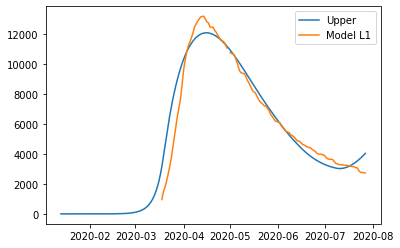

{'home': 0.972667723513458, 'leisure': 0.9277909157713964, 'other': 0.8436182109728254, 'school': 0.9060287644997089, 'transport': 0.9061294443363617, 'work': 0.8014607855350826}
{'home': 0.972667723513458, 'leisure': 0.11505662256527174, 'other': 0.06484647840765184, 'school': 0, 'transport': 0.11563606783242046, 'work': 0.2586191373629949}
{'home': 0.972667723513458, 'leisure': 0.11505662256527174, 'other': 0.06484647840765184, 'school': 0, 'transport': 0.11563606783242046, 'work': 0.2586191373629949}
{'home': 0.972667723513458, 'leisure': 0.13844201628736624, 'other': 0.15762356961906634, 'school': 0.29898949228490396, 'transport': 0.20119364416389404, 'work': 0.4524093760543692}
{'home': 0.972667723513458, 'leisure': 0.26644265527430927, 'other': 0.23260733721054017, 'school': 0.607039272214805, 'transport': 0.2671191824846809, 'work': 0.49387429923278586}
{'home': 0.972667723513458, 'leisure': 0.4468797002504723, 'other': 0.3721976465882909, 'school': 0.607039272214805, 'transport

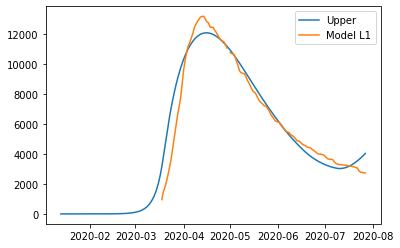

{'home': 0.972667723513458, 'leisure': 0.9277909157713964, 'other': 0.8436182109728254, 'school': 0.9060287644997089, 'transport': 0.9061294443363617, 'work': 0.8014607855350826}
{'home': 0.972667723513458, 'leisure': 0.11505662256527174, 'other': 0.06484647840765184, 'school': 0, 'transport': 0.11563606783242046, 'work': 0.2586191373629949}
{'home': 0.972667723513458, 'leisure': 0.11505662256527174, 'other': 0.06484647840765184, 'school': 0, 'transport': 0.11563606783242046, 'work': 0.2586191373629949}
{'home': 0.972667723513458, 'leisure': 0.13844201628736624, 'other': 0.15762356961906634, 'school': 0.29898949228490396, 'transport': 0.20119364416389404, 'work': 0.4524093760543692}
{'home': 0.972667723513458, 'leisure': 0.26644265527430927, 'other': 0.23260733721054017, 'school': 0.607039272214805, 'transport': 0.2671191824846809, 'work': 0.49387429923278586}
{'home': 0.972667723513458, 'leisure': 0.4468797002504723, 'other': 0.3721976465882909, 'school': 0.607039272214805, 'transport

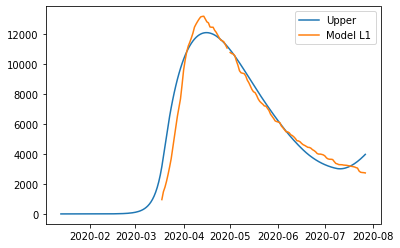

{'home': 0.9742679710384705, 'leisure': 0.9287645770494329, 'other': 0.8436884254318144, 'school': 0.9060797197034485, 'transport': 0.9059127596207575, 'work': 0.8016467891373872}
{'home': 0.9742679710384705, 'leisure': 0.11493164514066376, 'other': 0.0646994143272036, 'school': 0, 'transport': 0.11539550240406922, 'work': 0.2581180281822341}
{'home': 0.9742679710384705, 'leisure': 0.11493164514066376, 'other': 0.0646994143272036, 'school': 0, 'transport': 0.11539550240406922, 'work': 0.2581180281822341}
{'home': 0.9742679710384705, 'leisure': 0.13827081169617586, 'other': 0.1572885091779603, 'school': 0.299006307502138, 'transport': 0.20077458438080317, 'work': 0.45266579498603055}
{'home': 0.9742679710384705, 'leisure': 0.2661326496145753, 'other': 0.23207673915285054, 'school': 0.6070734122013105, 'transport': 0.2665594505182658, 'work': 0.4939529154253345}
{'home': 0.9742679710384705, 'leisure': 0.44637964819625103, 'other': 0.3713379185557281, 'school': 0.6070734122013105, 'transp

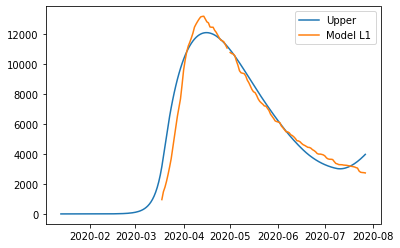

{'home': 0.9742679710384705, 'leisure': 0.9287645770494329, 'other': 0.8436884254318144, 'school': 0.9060797197034485, 'transport': 0.9059127596207575, 'work': 0.8016467891373872}
{'home': 0.9742679710384705, 'leisure': 0.11493164514066376, 'other': 0.0646994143272036, 'school': 0, 'transport': 0.11539550240406922, 'work': 0.2581180281822341}
{'home': 0.9742679710384705, 'leisure': 0.11493164514066376, 'other': 0.0646994143272036, 'school': 0, 'transport': 0.11539550240406922, 'work': 0.2581180281822341}
{'home': 0.9742679710384705, 'leisure': 0.13827081169617586, 'other': 0.1572885091779603, 'school': 0.299006307502138, 'transport': 0.20077458438080317, 'work': 0.45266579498603055}
{'home': 0.9742679710384705, 'leisure': 0.2661326496145753, 'other': 0.23207673915285054, 'school': 0.6070734122013105, 'transport': 0.2665594505182658, 'work': 0.4939529154253345}
{'home': 0.9742679710384705, 'leisure': 0.44637964819625103, 'other': 0.3713379185557281, 'school': 0.6070734122013105, 'transp

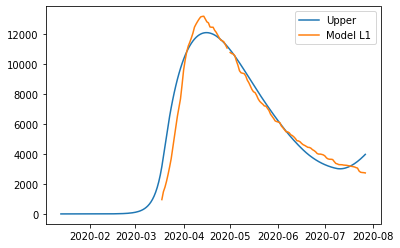

{'home': 0.9742679710384705, 'leisure': 0.9287645770494329, 'other': 0.8436884254318144, 'school': 0.9060797197034485, 'transport': 0.9059127596207575, 'work': 0.8016467891373872}
{'home': 0.9742679710384705, 'leisure': 0.11493164514066376, 'other': 0.0646994143272036, 'school': 0, 'transport': 0.11539550240406922, 'work': 0.2581180281822341}
{'home': 0.9742679710384705, 'leisure': 0.11493164514066376, 'other': 0.0646994143272036, 'school': 0, 'transport': 0.11539550240406922, 'work': 0.2581180281822341}
{'home': 0.9742679710384705, 'leisure': 0.13827081169617586, 'other': 0.1572885091779603, 'school': 0.299006307502138, 'transport': 0.20077458438080317, 'work': 0.45266579498603055}
{'home': 0.9742679710384705, 'leisure': 0.2661326496145753, 'other': 0.23207673915285054, 'school': 0.6070734122013105, 'transport': 0.2665594505182658, 'work': 0.4939529154253345}
{'home': 0.9742679710384705, 'leisure': 0.44637964819625103, 'other': 0.3713379185557281, 'school': 0.6070734122013105, 'transp

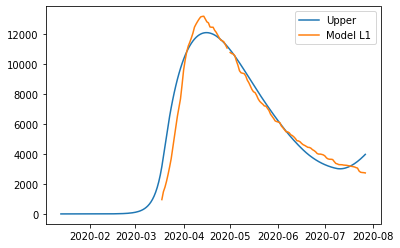

{'home': 0.9742679710384705, 'leisure': 0.9287645770494329, 'other': 0.8436884254318144, 'school': 0.9060797197034485, 'transport': 0.9059127596207575, 'work': 0.8016467891373872}
{'home': 0.9742679710384705, 'leisure': 0.11493164514066376, 'other': 0.0646994143272036, 'school': 0, 'transport': 0.11539550240406922, 'work': 0.2581180281822341}
{'home': 0.9742679710384705, 'leisure': 0.11493164514066376, 'other': 0.0646994143272036, 'school': 0, 'transport': 0.11539550240406922, 'work': 0.2581180281822341}
{'home': 0.9742679710384705, 'leisure': 0.13827081169617586, 'other': 0.1572885091779603, 'school': 0.299006307502138, 'transport': 0.20077458438080317, 'work': 0.45266579498603055}
{'home': 0.9742679710384705, 'leisure': 0.2661326496145753, 'other': 0.23207673915285054, 'school': 0.6070734122013105, 'transport': 0.2665594505182658, 'work': 0.4939529154253345}
{'home': 0.9742679710384705, 'leisure': 0.44637964819625103, 'other': 0.3713379185557281, 'school': 0.6070734122013105, 'transp

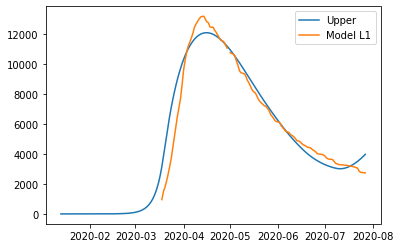

{'home': 0.9744308028280165, 'leisure': 0.9287836828416274, 'other': 0.8436532379016608, 'school': 0.9060605221255137, 'transport': 0.905883485576381, 'work': 0.80164572163754}
{'home': 0.9744308028280165, 'leisure': 0.11491272208507042, 'other': 0.06468407731626423, 'school': 0, 'transport': 0.11537309510546327, 'work': 0.25806895687628284}
{'home': 0.9744308028280165, 'leisure': 0.11491272208507042, 'other': 0.06468407731626423, 'school': 0, 'transport': 0.11537309510546327, 'work': 0.25806895687628284}
{'home': 0.9744308028280165, 'leisure': 0.13824655027916619, 'other': 0.15725270260910976, 'school': 0.29899997230141956, 'transport': 0.20073556780924265, 'work': 0.45267945006111787}
{'home': 0.9744308028280165, 'leisure': 0.2660873020608351, 'other': 0.23202093281367744, 'school': 0.6070605498240942, 'transport': 0.2665073858316242, 'work': 0.49395076437882507}
{'home': 0.9744308028280165, 'leisure': 0.4463048583088251, 'other': 0.3712469299452939, 'school': 0.6070605498240942, 'tr

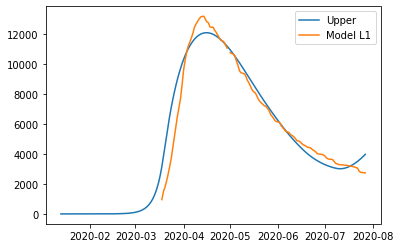

{'home': 0.9744308028280165, 'leisure': 0.9287836828416274, 'other': 0.8436532379016608, 'school': 0.9060605221255137, 'transport': 0.905883485576381, 'work': 0.80164572163754}
{'home': 0.9744308028280165, 'leisure': 0.11491272208507042, 'other': 0.06468407731626423, 'school': 0, 'transport': 0.11537309510546327, 'work': 0.25806895687628284}
{'home': 0.9744308028280165, 'leisure': 0.11491272208507042, 'other': 0.06468407731626423, 'school': 0, 'transport': 0.11537309510546327, 'work': 0.25806895687628284}
{'home': 0.9744308028280165, 'leisure': 0.13824655027916619, 'other': 0.15725270260910976, 'school': 0.29899997230141956, 'transport': 0.20073556780924265, 'work': 0.45267945006111787}
{'home': 0.9744308028280165, 'leisure': 0.2660873020608351, 'other': 0.23202093281367744, 'school': 0.6070605498240942, 'transport': 0.2665073858316242, 'work': 0.49395076437882507}
{'home': 0.9744308028280165, 'leisure': 0.4463048583088251, 'other': 0.3712469299452939, 'school': 0.6070605498240942, 'tr

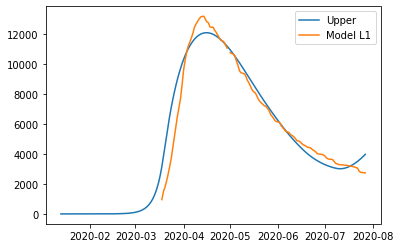

{'home': 0.9744308028280165, 'leisure': 0.9287836828416274, 'other': 0.8436532379016608, 'school': 0.9060605221255137, 'transport': 0.905883485576381, 'work': 0.80164572163754}
{'home': 0.9744308028280165, 'leisure': 0.11491272208507042, 'other': 0.06468407731626423, 'school': 0, 'transport': 0.11537309510546327, 'work': 0.25806895687628284}
{'home': 0.9744308028280165, 'leisure': 0.11491272208507042, 'other': 0.06468407731626423, 'school': 0, 'transport': 0.11537309510546327, 'work': 0.25806895687628284}
{'home': 0.9744308028280165, 'leisure': 0.13824655027916619, 'other': 0.15725270260910976, 'school': 0.29899997230141956, 'transport': 0.20073556780924265, 'work': 0.45267945006111787}
{'home': 0.9744308028280165, 'leisure': 0.2660873020608351, 'other': 0.23202093281367744, 'school': 0.6070605498240942, 'transport': 0.2665073858316242, 'work': 0.49395076437882507}
{'home': 0.9744308028280165, 'leisure': 0.4463048583088251, 'other': 0.3712469299452939, 'school': 0.6070605498240942, 'tr

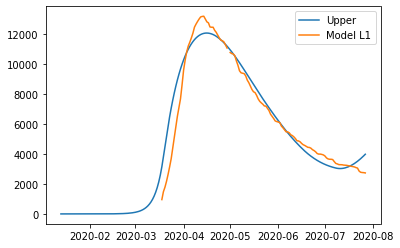

{'home': 0.9750821299862006, 'leisure': 0.9288601060104051, 'other': 0.8435124877810463, 'school': 0.9059837318137746, 'transport': 0.9057663893988751, 'work': 0.8016414516381513}
{'home': 0.9750821299862006, 'leisure': 0.11483697176356572, 'other': 0.06462270565079185, 'school': 0, 'transport': 0.11528343222720057, 'work': 0.2578725973924711}
{'home': 0.9750821299862006, 'leisure': 0.11483697176356572, 'other': 0.06462270565079185, 'school': 0, 'transport': 0.11528343222720057, 'work': 0.2578725973924711}
{'home': 0.9750821299862006, 'leisure': 0.1381494306317381, 'other': 0.15710942167149736, 'school': 0.29897463149854564, 'transport': 0.20057944286206578, 'work': 0.4527340920902009}
{'home': 0.9750821299862006, 'leisure': 0.2659057731377361, 'other': 0.23179762124473222, 'school': 0.607009100315229, 'transport': 0.2662990487272379, 'work': 0.4939421579170507}
{'home': 0.9750821299862006, 'leisure': 0.4460054695746798, 'other': 0.3708828343906751, 'school': 0.607009100315229, 'transp

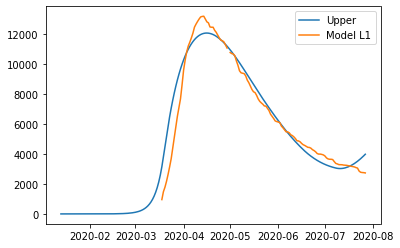

{'home': 0.9750821299862006, 'leisure': 0.9288601060104051, 'other': 0.8435124877810463, 'school': 0.9059837318137746, 'transport': 0.9057663893988751, 'work': 0.8016414516381513}
{'home': 0.9750821299862006, 'leisure': 0.11483697176356572, 'other': 0.06462270565079185, 'school': 0, 'transport': 0.11528343222720057, 'work': 0.2578725973924711}
{'home': 0.9750821299862006, 'leisure': 0.11483697176356572, 'other': 0.06462270565079185, 'school': 0, 'transport': 0.11528343222720057, 'work': 0.2578725973924711}
{'home': 0.9750821299862006, 'leisure': 0.1381494306317381, 'other': 0.15710942167149736, 'school': 0.29897463149854564, 'transport': 0.20057944286206578, 'work': 0.4527340920902009}
{'home': 0.9750821299862006, 'leisure': 0.2659057731377361, 'other': 0.23179762124473222, 'school': 0.607009100315229, 'transport': 0.2662990487272379, 'work': 0.4939421579170507}
{'home': 0.9750821299862006, 'leisure': 0.4460054695746798, 'other': 0.3708828343906751, 'school': 0.607009100315229, 'transp

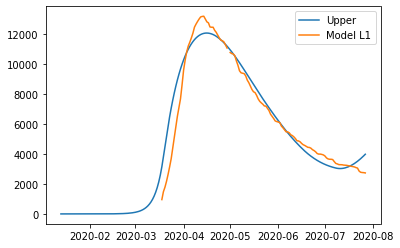

{'home': 0.9750821299862006, 'leisure': 0.9288601060104051, 'other': 0.8435124877810463, 'school': 0.9059837318137746, 'transport': 0.9057663893988751, 'work': 0.8016414516381513}
{'home': 0.9750821299862006, 'leisure': 0.11483697176356572, 'other': 0.06462270565079185, 'school': 0, 'transport': 0.11528343222720057, 'work': 0.2578725973924711}
{'home': 0.9750821299862006, 'leisure': 0.11483697176356572, 'other': 0.06462270565079185, 'school': 0, 'transport': 0.11528343222720057, 'work': 0.2578725973924711}
{'home': 0.9750821299862006, 'leisure': 0.1381494306317381, 'other': 0.15710942167149736, 'school': 0.29897463149854564, 'transport': 0.20057944286206578, 'work': 0.4527340920902009}
{'home': 0.9750821299862006, 'leisure': 0.2659057731377361, 'other': 0.23179762124473222, 'school': 0.607009100315229, 'transport': 0.2662990487272379, 'work': 0.4939421579170507}
{'home': 0.9750821299862006, 'leisure': 0.4460054695746798, 'other': 0.3708828343906751, 'school': 0.607009100315229, 'transp

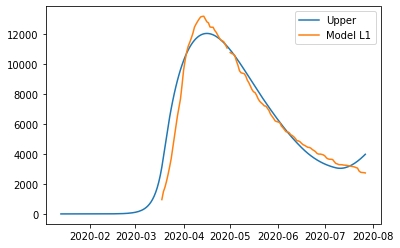

{'home': 0.9762484886176147, 'leisure': 0.9291379272187913, 'other': 0.8433298283883331, 'school': 0.9058882161050004, 'transport': 0.9055682588838033, 'work': 0.8016748982225594}
{'home': 0.9762484886176147, 'leisure': 0.11471152085236677, 'other': 0.06451301358723677, 'school': 0, 'transport': 0.115118614460707, 'work': 0.2575209403820534}
{'home': 0.9762484886176147, 'leisure': 0.11471152085236677, 'other': 0.06451301358723677, 'school': 0, 'transport': 0.115118614460707, 'work': 0.2575209403820534}
{'home': 0.9762484886176147, 'leisure': 0.13798660858654224, 'other': 0.15685476930997172, 'school': 0.2989431113146501, 'transport': 0.20029243108213807, 'work': 0.4528628261680634}
{'home': 0.9762484886176147, 'leisure': 0.26560323245353884, 'other': 0.23139886495743583, 'school': 0.6069451047903502, 'transport': 0.2659159352097372, 'work': 0.4939530491202366}
{'home': 0.9762484886176147, 'leisure': 0.445508416893829, 'other': 0.37023286850646553, 'school': 0.6069451047903502, 'transpo

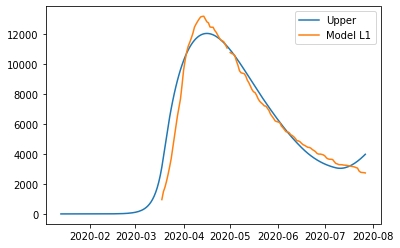

{'home': 0.9762484886176147, 'leisure': 0.9291379272187913, 'other': 0.8433298283883331, 'school': 0.9058882161050004, 'transport': 0.9055682588838033, 'work': 0.8016748982225594}
{'home': 0.9762484886176147, 'leisure': 0.11471152085236677, 'other': 0.06451301358723677, 'school': 0, 'transport': 0.115118614460707, 'work': 0.2575209403820534}
{'home': 0.9762484886176147, 'leisure': 0.11471152085236677, 'other': 0.06451301358723677, 'school': 0, 'transport': 0.115118614460707, 'work': 0.2575209403820534}
{'home': 0.9762484886176147, 'leisure': 0.13798660858654224, 'other': 0.15685476930997172, 'school': 0.2989431113146501, 'transport': 0.20029243108213807, 'work': 0.4528628261680634}
{'home': 0.9762484886176147, 'leisure': 0.26560323245353884, 'other': 0.23139886495743583, 'school': 0.6069451047903502, 'transport': 0.2659159352097372, 'work': 0.4939530491202366}
{'home': 0.9762484886176147, 'leisure': 0.445508416893829, 'other': 0.37023286850646553, 'school': 0.6069451047903502, 'transpo

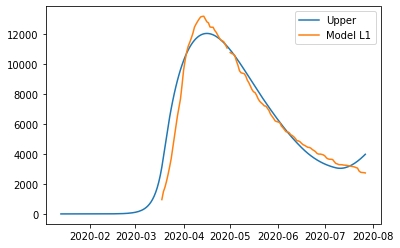

{'home': 0.9762484886176147, 'leisure': 0.9291379272187913, 'other': 0.8433298283883331, 'school': 0.9058882161050004, 'transport': 0.9055682588838033, 'work': 0.8016748982225594}
{'home': 0.9762484886176147, 'leisure': 0.11471152085236677, 'other': 0.06451301358723677, 'school': 0, 'transport': 0.115118614460707, 'work': 0.2575209403820534}
{'home': 0.9762484886176147, 'leisure': 0.11471152085236677, 'other': 0.06451301358723677, 'school': 0, 'transport': 0.115118614460707, 'work': 0.2575209403820534}
{'home': 0.9762484886176147, 'leisure': 0.13798660858654224, 'other': 0.15685476930997172, 'school': 0.2989431113146501, 'transport': 0.20029243108213807, 'work': 0.4528628261680634}
{'home': 0.9762484886176147, 'leisure': 0.26560323245353884, 'other': 0.23139886495743583, 'school': 0.6069451047903502, 'transport': 0.2659159352097372, 'work': 0.4939530491202366}
{'home': 0.9762484886176147, 'leisure': 0.445508416893829, 'other': 0.37023286850646553, 'school': 0.6069451047903502, 'transpo

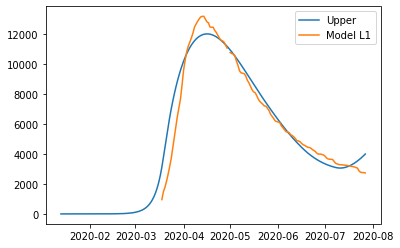

{'home': 0.9767526013906186, 'leisure': 0.9290861088842393, 'other': 0.8431279444904568, 'school': 0.9057935780633374, 'transport': 0.9054615192069986, 'work': 0.8016645881559881}
{'home': 0.9767526013906186, 'leisure': 0.11464256478358961, 'other': 0.06446266279931108, 'school': 0, 'transport': 0.1150501486602294, 'work': 0.25738877569666546}
{'home': 0.9767526013906186, 'leisure': 0.11464256478358961, 'other': 0.06446266279931108, 'school': 0, 'transport': 0.1150501486602294, 'work': 0.25738877569666546}
{'home': 0.9767526013906186, 'leisure': 0.13789943651255746, 'other': 0.15673593286162532, 'school': 0.29891188076090136, 'transport': 0.2001732643937338, 'work': 0.45292748304724645}
{'home': 0.9767526013906186, 'leisure': 0.2654390817362099, 'other': 0.23121309397167522, 'school': 0.6068816973024361, 'transport': 0.2657568544054615, 'work': 0.4939690825515487}
{'home': 0.9767526013906186, 'leisure': 0.4452358702854835, 'other': 0.36992578041911284, 'school': 0.6068816973024361, 'tr

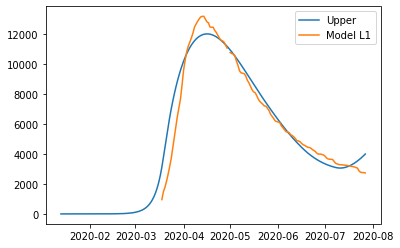

{'home': 0.9767526013906186, 'leisure': 0.9290861088842393, 'other': 0.8431279444904568, 'school': 0.9057935780633374, 'transport': 0.9054615192069986, 'work': 0.8016645881559881}
{'home': 0.9767526013906186, 'leisure': 0.11464256478358961, 'other': 0.06446266279931108, 'school': 0, 'transport': 0.1150501486602294, 'work': 0.25738877569666546}
{'home': 0.9767526013906186, 'leisure': 0.11464256478358961, 'other': 0.06446266279931108, 'school': 0, 'transport': 0.1150501486602294, 'work': 0.25738877569666546}
{'home': 0.9767526013906186, 'leisure': 0.13789943651255746, 'other': 0.15673593286162532, 'school': 0.29891188076090136, 'transport': 0.2001732643937338, 'work': 0.45292748304724645}
{'home': 0.9767526013906186, 'leisure': 0.2654390817362099, 'other': 0.23121309397167522, 'school': 0.6068816973024361, 'transport': 0.2657568544054615, 'work': 0.4939690825515487}
{'home': 0.9767526013906186, 'leisure': 0.4452358702854835, 'other': 0.36992578041911284, 'school': 0.6068816973024361, 'tr

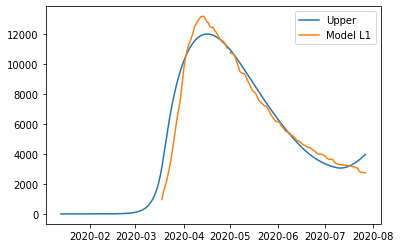

{'home': 0.9779672069717399, 'leisure': 0.9296203335372449, 'other': 0.8430436959721068, 'school': 0.9057682209273734, 'transport': 0.9052718157759431, 'work': 0.801770619259599}
{'home': 0.9779672069717399, 'leisure': 0.11452762798447473, 'other': 0.06434667406841915, 'school': 0, 'transport': 0.11486915788503155, 'work': 0.25702162765491093}
{'home': 0.9779672069717399, 'leisure': 0.11452762798447473, 'other': 0.06434667406841915, 'school': 0, 'transport': 0.11486915788503155, 'work': 0.25702162765491093}
{'home': 0.9779672069717399, 'leisure': 0.13774640972438765, 'other': 0.15646916547338288, 'school': 0.29890351290603323, 'transport': 0.1998580471999956, 'work': 0.4531224234692156}
{'home': 0.9779672069717399, 'leisure': 0.2651581570735626, 'other': 0.23079179184820495, 'school': 0.6068647080213402, 'transport': 0.26533585360845297, 'work': 0.4940312028607864}
{'home': 0.9779672069717399, 'leisure': 0.4447779216808173, 'other': 0.36923882101286953, 'school': 0.6068647080213402, 't

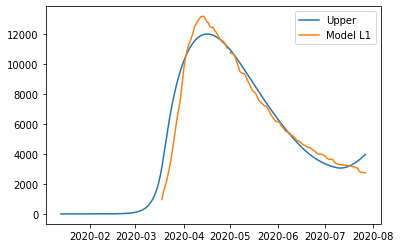

{'home': 0.9779672069717399, 'leisure': 0.9296203335372449, 'other': 0.8430436959721068, 'school': 0.9057682209273734, 'transport': 0.9052718157759431, 'work': 0.801770619259599}
{'home': 0.9779672069717399, 'leisure': 0.11452762798447473, 'other': 0.06434667406841915, 'school': 0, 'transport': 0.11486915788503155, 'work': 0.25702162765491093}
{'home': 0.9779672069717399, 'leisure': 0.11452762798447473, 'other': 0.06434667406841915, 'school': 0, 'transport': 0.11486915788503155, 'work': 0.25702162765491093}
{'home': 0.9779672069717399, 'leisure': 0.13774640972438765, 'other': 0.15646916547338288, 'school': 0.29890351290603323, 'transport': 0.1998580471999956, 'work': 0.4531224234692156}
{'home': 0.9779672069717399, 'leisure': 0.2651581570735626, 'other': 0.23079179184820495, 'school': 0.6068647080213402, 'transport': 0.26533585360845297, 'work': 0.4940312028607864}
{'home': 0.9779672069717399, 'leisure': 0.4447779216808173, 'other': 0.36923882101286953, 'school': 0.6068647080213402, 't

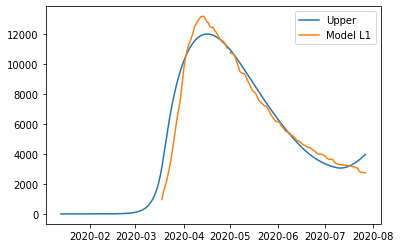

{'home': 0.9779672069717399, 'leisure': 0.9296203335372449, 'other': 0.8430436959721068, 'school': 0.9057682209273734, 'transport': 0.9052718157759431, 'work': 0.801770619259599}
{'home': 0.9779672069717399, 'leisure': 0.11452762798447473, 'other': 0.06434667406841915, 'school': 0, 'transport': 0.11486915788503155, 'work': 0.25702162765491093}
{'home': 0.9779672069717399, 'leisure': 0.11452762798447473, 'other': 0.06434667406841915, 'school': 0, 'transport': 0.11486915788503155, 'work': 0.25702162765491093}
{'home': 0.9779672069717399, 'leisure': 0.13774640972438765, 'other': 0.15646916547338288, 'school': 0.29890351290603323, 'transport': 0.1998580471999956, 'work': 0.4531224234692156}
{'home': 0.9779672069717399, 'leisure': 0.2651581570735626, 'other': 0.23079179184820495, 'school': 0.6068647080213402, 'transport': 0.26533585360845297, 'work': 0.4940312028607864}
{'home': 0.9779672069717399, 'leisure': 0.4447779216808173, 'other': 0.36923882101286953, 'school': 0.6068647080213402, 't

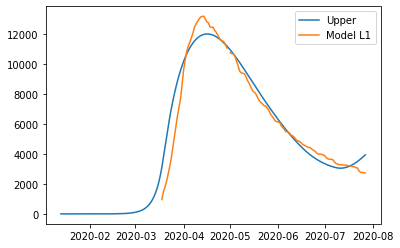

{'home': 0.9785406341821148, 'leisure': 0.9299954704086232, 'other': 0.8430652497793607, 'school': 0.9057950572463991, 'transport': 0.9051917461104634, 'work': 0.8018547330569216}
{'home': 0.9785406341821148, 'leisure': 0.11448141435581266, 'other': 0.0642916150021541, 'school': 0, 'transport': 0.11477918973326962, 'work': 0.25684456435458547}
{'home': 0.9785406341821148, 'leisure': 0.11448141435581266, 'other': 0.0642916150021541, 'school': 0, 'transport': 0.11477918973326962, 'work': 0.25684456435458547}
{'home': 0.9785406341821148, 'leisure': 0.13768282159179324, 'other': 0.15634373038667954, 'school': 0.29891236889131173, 'transport': 0.1997013359254629, 'work': 0.453238599832364}
{'home': 0.9785406341821148, 'leisure': 0.2650432189599716, 'other': 0.23059225771059816, 'school': 0.6068826883550874, 'transport': 0.26512647465718014, 'work': 0.494080349624256}
{'home': 0.9785406341821148, 'leisure': 0.4445925264222137, 'other': 0.36891385258455983, 'school': 0.6068826883550874, 'tran

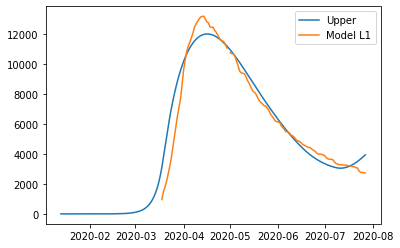

{'home': 0.9785406341821148, 'leisure': 0.9299954704086232, 'other': 0.8430652497793607, 'school': 0.9057950572463991, 'transport': 0.9051917461104634, 'work': 0.8018547330569216}
{'home': 0.9785406341821148, 'leisure': 0.11448141435581266, 'other': 0.0642916150021541, 'school': 0, 'transport': 0.11477918973326962, 'work': 0.25684456435458547}
{'home': 0.9785406341821148, 'leisure': 0.11448141435581266, 'other': 0.0642916150021541, 'school': 0, 'transport': 0.11477918973326962, 'work': 0.25684456435458547}
{'home': 0.9785406341821148, 'leisure': 0.13768282159179324, 'other': 0.15634373038667954, 'school': 0.29891236889131173, 'transport': 0.1997013359254629, 'work': 0.453238599832364}
{'home': 0.9785406341821148, 'leisure': 0.2650432189599716, 'other': 0.23059225771059816, 'school': 0.6068826883550874, 'transport': 0.26512647465718014, 'work': 0.494080349624256}
{'home': 0.9785406341821148, 'leisure': 0.4445925264222137, 'other': 0.36891385258455983, 'school': 0.6068826883550874, 'tran

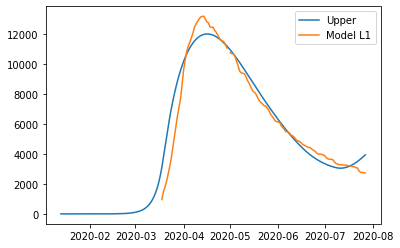

{'home': 0.9785406341821148, 'leisure': 0.9299954704086232, 'other': 0.8430652497793607, 'school': 0.9057950572463991, 'transport': 0.9051917461104634, 'work': 0.8018547330569216}
{'home': 0.9785406341821148, 'leisure': 0.11448141435581266, 'other': 0.0642916150021541, 'school': 0, 'transport': 0.11477918973326962, 'work': 0.25684456435458547}
{'home': 0.9785406341821148, 'leisure': 0.11448141435581266, 'other': 0.0642916150021541, 'school': 0, 'transport': 0.11477918973326962, 'work': 0.25684456435458547}
{'home': 0.9785406341821148, 'leisure': 0.13768282159179324, 'other': 0.15634373038667954, 'school': 0.29891236889131173, 'transport': 0.1997013359254629, 'work': 0.453238599832364}
{'home': 0.9785406341821148, 'leisure': 0.2650432189599716, 'other': 0.23059225771059816, 'school': 0.6068826883550874, 'transport': 0.26512647465718014, 'work': 0.494080349624256}
{'home': 0.9785406341821148, 'leisure': 0.4445925264222137, 'other': 0.36891385258455983, 'school': 0.6068826883550874, 'tran

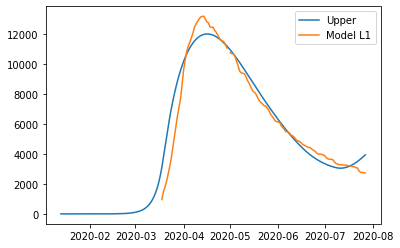

{'home': 0.9785406341821148, 'leisure': 0.9299954704086232, 'other': 0.8430652497793607, 'school': 0.9057950572463991, 'transport': 0.9051917461104634, 'work': 0.8018547330569216}
{'home': 0.9785406341821148, 'leisure': 0.11448141435581266, 'other': 0.0642916150021541, 'school': 0, 'transport': 0.11477918973326962, 'work': 0.25684456435458547}
{'home': 0.9785406341821148, 'leisure': 0.11448141435581266, 'other': 0.0642916150021541, 'school': 0, 'transport': 0.11477918973326962, 'work': 0.25684456435458547}
{'home': 0.9785406341821148, 'leisure': 0.13768282159179324, 'other': 0.15634373038667954, 'school': 0.29891236889131173, 'transport': 0.1997013359254629, 'work': 0.453238599832364}
{'home': 0.9785406341821148, 'leisure': 0.2650432189599716, 'other': 0.23059225771059816, 'school': 0.6068826883550874, 'transport': 0.26512647465718014, 'work': 0.494080349624256}
{'home': 0.9785406341821148, 'leisure': 0.4445925264222137, 'other': 0.36891385258455983, 'school': 0.6068826883550874, 'tran

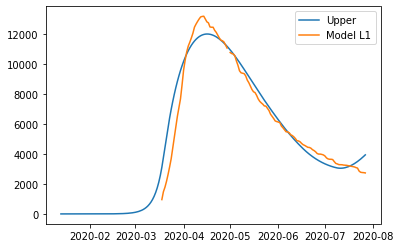

{'home': 0.9784572231435362, 'leisure': 0.9300118326558889, 'other': 0.8430753596594245, 'school': 0.905813063681698, 'transport': 0.9052030448363658, 'work': 0.8018740776192329}
{'home': 0.9784572231435362, 'leisure': 0.11449015190933866, 'other': 0.06429698964549395, 'school': 0, 'transport': 0.11478672474441767, 'work': 0.2568737359762578}
{'home': 0.9784572231435362, 'leisure': 0.11449015190933866, 'other': 0.06429698964549395, 'school': 0, 'transport': 0.11478672474441767, 'work': 0.2568737359762578}
{'home': 0.9784572231435362, 'leisure': 0.13769359314526472, 'other': 0.15635638746751473, 'school': 0.29891831101496036, 'transport': 0.19971446707009924, 'work': 0.45325912978346855}
{'home': 0.9784572231435362, 'leisure': 0.26506369903006527, 'other': 0.23061083037037983, 'school': 0.6068947526667376, 'transport': 0.2651439165105698, 'work': 0.4941054450974402}
{'home': 0.9784572231435362, 'leisure': 0.44462641705457406, 'other': 0.3689422560846021, 'school': 0.6068947526667376, 't

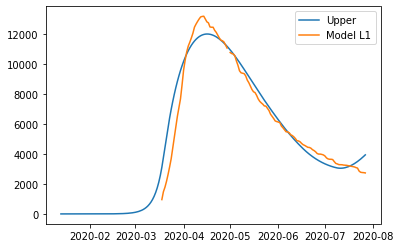

{'home': 0.9784572231435362, 'leisure': 0.9300118326558889, 'other': 0.8430753596594245, 'school': 0.905813063681698, 'transport': 0.9052030448363658, 'work': 0.8018740776192329}
{'home': 0.9784572231435362, 'leisure': 0.11449015190933866, 'other': 0.06429698964549395, 'school': 0, 'transport': 0.11478672474441767, 'work': 0.2568737359762578}
{'home': 0.9784572231435362, 'leisure': 0.11449015190933866, 'other': 0.06429698964549395, 'school': 0, 'transport': 0.11478672474441767, 'work': 0.2568737359762578}
{'home': 0.9784572231435362, 'leisure': 0.13769359314526472, 'other': 0.15635638746751473, 'school': 0.29891831101496036, 'transport': 0.19971446707009924, 'work': 0.45325912978346855}
{'home': 0.9784572231435362, 'leisure': 0.26506369903006527, 'other': 0.23061083037037983, 'school': 0.6068947526667376, 'transport': 0.2651439165105698, 'work': 0.4941054450974402}
{'home': 0.9784572231435362, 'leisure': 0.44462641705457406, 'other': 0.3689422560846021, 'school': 0.6068947526667376, 't

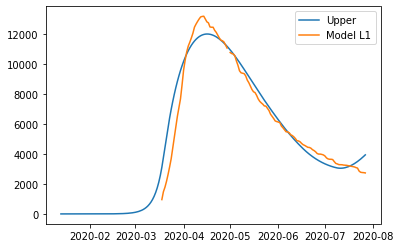

{'home': 0.9784572231435362, 'leisure': 0.9300118326558889, 'other': 0.8430753596594245, 'school': 0.905813063681698, 'transport': 0.9052030448363658, 'work': 0.8018740776192329}
{'home': 0.9784572231435362, 'leisure': 0.11449015190933866, 'other': 0.06429698964549395, 'school': 0, 'transport': 0.11478672474441767, 'work': 0.2568737359762578}
{'home': 0.9784572231435362, 'leisure': 0.11449015190933866, 'other': 0.06429698964549395, 'school': 0, 'transport': 0.11478672474441767, 'work': 0.2568737359762578}
{'home': 0.9784572231435362, 'leisure': 0.13769359314526472, 'other': 0.15635638746751473, 'school': 0.29891831101496036, 'transport': 0.19971446707009924, 'work': 0.45325912978346855}
{'home': 0.9784572231435362, 'leisure': 0.26506369903006527, 'other': 0.23061083037037983, 'school': 0.6068947526667376, 'transport': 0.2651439165105698, 'work': 0.4941054450974402}
{'home': 0.9784572231435362, 'leisure': 0.44462641705457406, 'other': 0.3689422560846021, 'school': 0.6068947526667376, 't

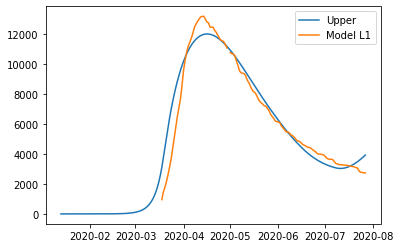

{'home': 0.9780964622483695, 'leisure': 0.9300870553149553, 'other': 0.8431652014191001, 'school': 0.9058937838075896, 'transport': 0.9052640394199625, 'work': 0.8019359398053127}
{'home': 0.9780964622483695, 'leisure': 0.11453388790551479, 'other': 0.06432535578525436, 'school': 0, 'transport': 0.1148252921074384, 'work': 0.25698983904182526}
{'home': 0.9780964622483695, 'leisure': 0.11453388790551479, 'other': 0.06432535578525436, 'school': 0, 'transport': 0.1148252921074384, 'work': 0.25698983904182526}
{'home': 0.9780964622483695, 'leisure': 0.1377479514347934, 'other': 0.15642338179242798, 'school': 0.29894494865650456, 'transport': 0.1997816378119139, 'work': 0.45330272247476033}
{'home': 0.9780964622483695, 'leisure': 0.2651667581899856, 'other': 0.23071200854906393, 'school': 0.606948835151085, 'transport': 0.26523333461731236, 'work': 0.4941742200178064}
{'home': 0.9780964622483695, 'leisure': 0.4447973630127392, 'other': 0.3691030983591719, 'school': 0.606948835151085, 'trans

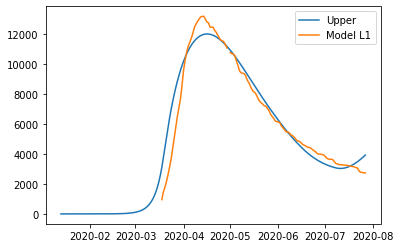

{'home': 0.9780964622483695, 'leisure': 0.9300870553149553, 'other': 0.8431652014191001, 'school': 0.9058937838075896, 'transport': 0.9052640394199625, 'work': 0.8019359398053127}
{'home': 0.9780964622483695, 'leisure': 0.11453388790551479, 'other': 0.06432535578525436, 'school': 0, 'transport': 0.1148252921074384, 'work': 0.25698983904182526}
{'home': 0.9780964622483695, 'leisure': 0.11453388790551479, 'other': 0.06432535578525436, 'school': 0, 'transport': 0.1148252921074384, 'work': 0.25698983904182526}
{'home': 0.9780964622483695, 'leisure': 0.1377479514347934, 'other': 0.15642338179242798, 'school': 0.29894494865650456, 'transport': 0.1997816378119139, 'work': 0.45330272247476033}
{'home': 0.9780964622483695, 'leisure': 0.2651667581899856, 'other': 0.23071200854906393, 'school': 0.606948835151085, 'transport': 0.26523333461731236, 'work': 0.4941742200178064}
{'home': 0.9780964622483695, 'leisure': 0.4447973630127392, 'other': 0.3691030983591719, 'school': 0.606948835151085, 'trans

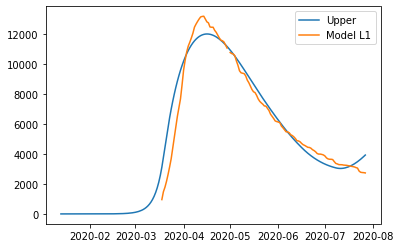

{'home': 0.9780964722483696, 'leisure': 0.9300870553149553, 'other': 0.8431652014191001, 'school': 0.9058937838075896, 'transport': 0.9052640394199625, 'work': 0.8019359398053127}
{'home': 0.9780964722483696, 'leisure': 0.11453388790551479, 'other': 0.06432535578525436, 'school': 0, 'transport': 0.1148252921074384, 'work': 0.25698983904182526}
{'home': 0.9780964722483696, 'leisure': 0.11453388790551479, 'other': 0.06432535578525436, 'school': 0, 'transport': 0.1148252921074384, 'work': 0.25698983904182526}
{'home': 0.9780964722483696, 'leisure': 0.1377479514347934, 'other': 0.15642338179242798, 'school': 0.29894494865650456, 'transport': 0.1997816378119139, 'work': 0.45330272247476033}
{'home': 0.9780964722483696, 'leisure': 0.2651667581899856, 'other': 0.23071200854906393, 'school': 0.606948835151085, 'transport': 0.26523333461731236, 'work': 0.4941742200178064}
{'home': 0.9780964722483696, 'leisure': 0.4447973630127392, 'other': 0.3691030983591719, 'school': 0.606948835151085, 'trans

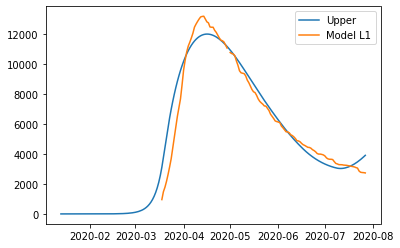

{'home': 0.9789014534692521, 'leisure': 0.9304675668901736, 'other': 0.8431187490296456, 'school': 0.9058827506473343, 'transport': 0.9051381298691822, 'work': 0.802012411643642}
{'home': 0.9789014534692521, 'leisure': 0.11445773670194334, 'other': 0.06424720882773605, 'school': 0, 'transport': 0.11470278308199991, 'work': 0.25674194857623944}
{'home': 0.9789014534692521, 'leisure': 0.11445773670194334, 'other': 0.06424720882773605, 'school': 0, 'transport': 0.11470278308199991, 'work': 0.25674194857623944}
{'home': 0.9789014534692521, 'leisure': 0.1376462201834697, 'other': 0.1562438635506812, 'school': 0.2989413077136203, 'transport': 0.1995682711112288, 'work': 0.4534376410287934}
{'home': 0.9789014534692521, 'leisure': 0.26498030958683966, 'other': 0.23042824909790158, 'school': 0.606941442933714, 'transport': 0.26494835070931627, 'work': 0.4942190135435789}
{'home': 0.9789014534692521, 'leisure': 0.44449375821842296, 'other': 0.36864046479458834, 'school': 0.606941442933714, 'tran

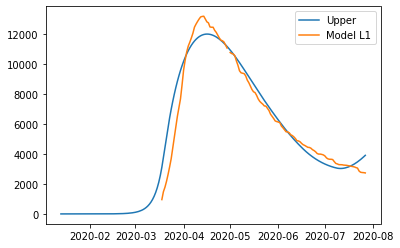

{'home': 0.9789014534692521, 'leisure': 0.9304675668901736, 'other': 0.8431187490296456, 'school': 0.9058827506473343, 'transport': 0.9051381298691822, 'work': 0.802012411643642}
{'home': 0.9789014534692521, 'leisure': 0.11445773670194334, 'other': 0.06424720882773605, 'school': 0, 'transport': 0.11470278308199991, 'work': 0.25674194857623944}
{'home': 0.9789014534692521, 'leisure': 0.11445773670194334, 'other': 0.06424720882773605, 'school': 0, 'transport': 0.11470278308199991, 'work': 0.25674194857623944}
{'home': 0.9789014534692521, 'leisure': 0.1376462201834697, 'other': 0.1562438635506812, 'school': 0.2989413077136203, 'transport': 0.1995682711112288, 'work': 0.4534376410287934}
{'home': 0.9789014534692521, 'leisure': 0.26498030958683966, 'other': 0.23042824909790158, 'school': 0.606941442933714, 'transport': 0.26494835070931627, 'work': 0.4942190135435789}
{'home': 0.9789014534692521, 'leisure': 0.44449375821842296, 'other': 0.36864046479458834, 'school': 0.606941442933714, 'tran

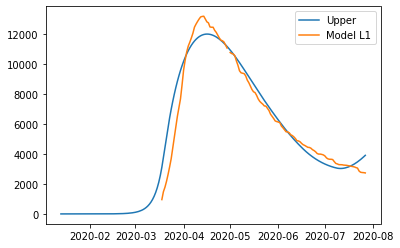

{'home': 0.9789014534692521, 'leisure': 0.9304675668901736, 'other': 0.8431187490296456, 'school': 0.9058827506473343, 'transport': 0.9051381298691822, 'work': 0.802012411643642}
{'home': 0.9789014534692521, 'leisure': 0.11445773670194334, 'other': 0.06424720882773605, 'school': 0, 'transport': 0.11470278308199991, 'work': 0.25674194857623944}
{'home': 0.9789014534692521, 'leisure': 0.11445773670194334, 'other': 0.06424720882773605, 'school': 0, 'transport': 0.11470278308199991, 'work': 0.25674194857623944}
{'home': 0.9789014534692521, 'leisure': 0.1376462201834697, 'other': 0.1562438635506812, 'school': 0.2989413077136203, 'transport': 0.1995682711112288, 'work': 0.4534376410287934}
{'home': 0.9789014534692521, 'leisure': 0.26498030958683966, 'other': 0.23042824909790158, 'school': 0.606941442933714, 'transport': 0.26494835070931627, 'work': 0.4942190135435789}
{'home': 0.9789014534692521, 'leisure': 0.44449375821842296, 'other': 0.36864046479458834, 'school': 0.606941442933714, 'tran

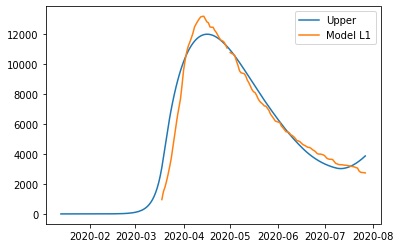

{'home': 0.9803311254602296, 'leisure': 0.9312052483286613, 'other': 0.8430475020679875, 'school': 0.90588262580062, 'transport': 0.9049143834837974, 'work': 0.8021764526618942}
{'home': 0.9803311254602296, 'leisure': 0.11432369949511437, 'other': 0.06410592985898117, 'school': 0, 'transport': 0.11448021659623353, 'work': 0.25626690854834067}
{'home': 0.9803311254602296, 'leisure': 0.11432369949511437, 'other': 0.06410592985898117, 'school': 0, 'transport': 0.11448021659623353, 'work': 0.25626690854834067}
{'home': 0.9803311254602296, 'leisure': 0.13746615601316092, 'other': 0.1559197249951357, 'school': 0.2989412665142046, 'transport': 0.19918064508779607, 'work': 0.4536440863595761}
{'home': 0.9803311254602296, 'leisure': 0.2646511257231029, 'other': 0.2299144279843251, 'school': 0.6069413592864155, 'transport': 0.2644305196300885, 'work': 0.4942546767476468}
{'home': 0.9803311254602296, 'leisure': 0.44395839747470894, 'other': 0.3678010636899824, 'school': 0.6069413592864155, 'trans

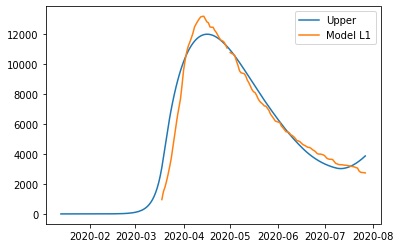

{'home': 0.9803311254602296, 'leisure': 0.9312052483286613, 'other': 0.8430475020679875, 'school': 0.90588262580062, 'transport': 0.9049143834837974, 'work': 0.8021764526618942}
{'home': 0.9803311254602296, 'leisure': 0.11432369949511437, 'other': 0.06410592985898117, 'school': 0, 'transport': 0.11448021659623353, 'work': 0.25626690854834067}
{'home': 0.9803311254602296, 'leisure': 0.11432369949511437, 'other': 0.06410592985898117, 'school': 0, 'transport': 0.11448021659623353, 'work': 0.25626690854834067}
{'home': 0.9803311254602296, 'leisure': 0.13746615601316092, 'other': 0.1559197249951357, 'school': 0.2989412665142046, 'transport': 0.19918064508779607, 'work': 0.4536440863595761}
{'home': 0.9803311254602296, 'leisure': 0.2646511257231029, 'other': 0.2299144279843251, 'school': 0.6069413592864155, 'transport': 0.2644305196300885, 'work': 0.4942546767476468}
{'home': 0.9803311254602296, 'leisure': 0.44395839747470894, 'other': 0.3678010636899824, 'school': 0.6069413592864155, 'trans

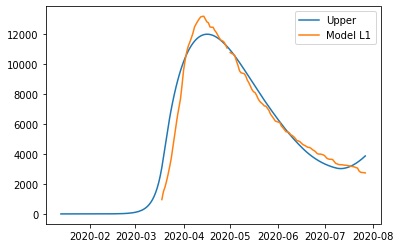

{'home': 0.9803311254602296, 'leisure': 0.9312052483286613, 'other': 0.8430475020679875, 'school': 0.90588262580062, 'transport': 0.9049143834837974, 'work': 0.8021764526618942}
{'home': 0.9803311254602296, 'leisure': 0.11432369949511437, 'other': 0.06410592985898117, 'school': 0, 'transport': 0.11448021659623353, 'work': 0.25626690854834067}
{'home': 0.9803311254602296, 'leisure': 0.11432369949511437, 'other': 0.06410592985898117, 'school': 0, 'transport': 0.11448021659623353, 'work': 0.25626690854834067}
{'home': 0.9803311254602296, 'leisure': 0.13746615601316092, 'other': 0.1559197249951357, 'school': 0.2989412665142046, 'transport': 0.19918064508779607, 'work': 0.4536440863595761}
{'home': 0.9803311254602296, 'leisure': 0.2646511257231029, 'other': 0.2299144279843251, 'school': 0.6069413592864155, 'transport': 0.2644305196300885, 'work': 0.4942546767476468}
{'home': 0.9803311254602296, 'leisure': 0.44395839747470894, 'other': 0.3678010636899824, 'school': 0.6069413592864155, 'trans

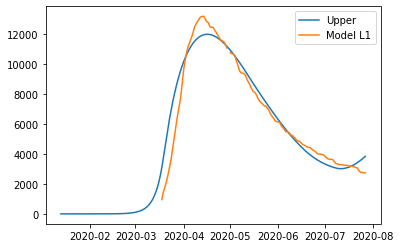

{'home': 0.9813720714540956, 'leisure': 0.9317114437892708, 'other': 0.8428876192535022, 'school': 0.9059044452659313, 'transport': 0.9047393247538109, 'work': 0.8023808808652749}
{'home': 0.9813720714540956, 'leisure': 0.11422446906476247, 'other': 0.06400102253227183, 'school': 0, 'transport': 0.11431898157208807, 'work': 0.25598457282404125}
{'home': 0.9813720714540956, 'leisure': 0.11422446906476247, 'other': 0.06400102253227183, 'school': 0, 'transport': 0.11431898157208807, 'work': 0.25598457282404125}
{'home': 0.9813720714540956, 'leisure': 0.13733342936043044, 'other': 0.15567710645295343, 'school': 0.29894846693775734, 'transport': 0.198899965289099, 'work': 0.45390542060608363}
{'home': 0.9813720714540956, 'leisure': 0.26440780476112663, 'other': 0.2295262663588778, 'school': 0.6069559783281739, 'transport': 0.26405530158256924, 'work': 0.4943905452961947}
{'home': 0.9813720714540956, 'leisure': 0.443560168336376, 'other': 0.3671547615608164, 'school': 0.6069559783281739, 'tr

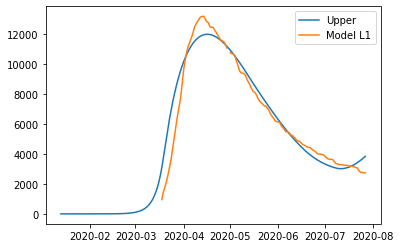

{'home': 0.9813720714540956, 'leisure': 0.9317114437892708, 'other': 0.8428876192535022, 'school': 0.9059044452659313, 'transport': 0.9047393247538109, 'work': 0.8023808808652749}
{'home': 0.9813720714540956, 'leisure': 0.11422446906476247, 'other': 0.06400102253227183, 'school': 0, 'transport': 0.11431898157208807, 'work': 0.25598457282404125}
{'home': 0.9813720714540956, 'leisure': 0.11422446906476247, 'other': 0.06400102253227183, 'school': 0, 'transport': 0.11431898157208807, 'work': 0.25598457282404125}
{'home': 0.9813720714540956, 'leisure': 0.13733342936043044, 'other': 0.15567710645295343, 'school': 0.29894846693775734, 'transport': 0.198899965289099, 'work': 0.45390542060608363}
{'home': 0.9813720714540956, 'leisure': 0.26440780476112663, 'other': 0.2295262663588778, 'school': 0.6069559783281739, 'transport': 0.26405530158256924, 'work': 0.4943905452961947}
{'home': 0.9813720714540956, 'leisure': 0.443560168336376, 'other': 0.3671547615608164, 'school': 0.6069559783281739, 'tr

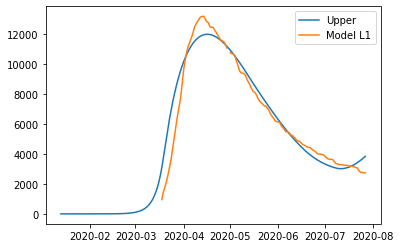

{'home': 0.9813720714540956, 'leisure': 0.9317114437892708, 'other': 0.8428876192535022, 'school': 0.9059044452659313, 'transport': 0.9047393247538109, 'work': 0.8023808808652749}
{'home': 0.9813720714540956, 'leisure': 0.11422446906476247, 'other': 0.06400102253227183, 'school': 0, 'transport': 0.11431898157208807, 'work': 0.25598457282404125}
{'home': 0.9813720714540956, 'leisure': 0.11422446906476247, 'other': 0.06400102253227183, 'school': 0, 'transport': 0.11431898157208807, 'work': 0.25598457282404125}
{'home': 0.9813720714540956, 'leisure': 0.13733342936043044, 'other': 0.15567710645295343, 'school': 0.29894846693775734, 'transport': 0.198899965289099, 'work': 0.45390542060608363}
{'home': 0.9813720714540956, 'leisure': 0.26440780476112663, 'other': 0.2295262663588778, 'school': 0.6069559783281739, 'transport': 0.26405530158256924, 'work': 0.4943905452961947}
{'home': 0.9813720714540956, 'leisure': 0.443560168336376, 'other': 0.3671547615608164, 'school': 0.6069559783281739, 'tr

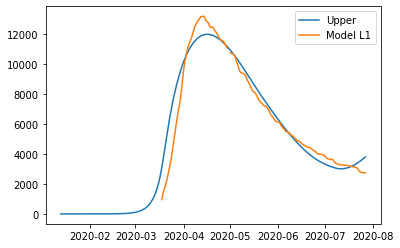

{'home': 0.9825187361136232, 'leisure': 0.9323345143513414, 'other': 0.8424980150695136, 'school': 0.9060269333543732, 'transport': 0.9045222214142209, 'work': 0.8028629364650852}
{'home': 0.9825187361136232, 'leisure': 0.11411875751504261, 'other': 0.06387835129611692, 'school': 0, 'transport': 0.11413577769361687, 'work': 0.2558528285241073}
{'home': 0.9825187361136232, 'leisure': 0.11411875751504261, 'other': 0.06387835129611692, 'school': 0, 'transport': 0.11413577769361687, 'work': 0.2558528285241073}
{'home': 0.9825187361136232, 'leisure': 0.1371910851671568, 'other': 0.15538992081628308, 'school': 0.2989888880069432, 'transport': 0.19858135056469695, 'work': 0.4545544170799121}
{'home': 0.9825187361136232, 'leisure': 0.26414720517318396, 'other': 0.2290561546533714, 'school': 0.6070380453474301, 'transport': 0.26362862555941086, 'work': 0.49489532625248384}
{'home': 0.9825187361136232, 'leisure': 0.443129402078412, 'other': 0.36634214401994675, 'school': 0.6070380453474301, 'tra

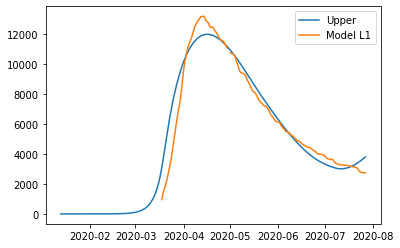

{'home': 0.9825187361136232, 'leisure': 0.9323345143513414, 'other': 0.8424980150695136, 'school': 0.9060269333543732, 'transport': 0.9045222214142209, 'work': 0.8028629364650852}
{'home': 0.9825187361136232, 'leisure': 0.11411875751504261, 'other': 0.06387835129611692, 'school': 0, 'transport': 0.11413577769361687, 'work': 0.2558528285241073}
{'home': 0.9825187361136232, 'leisure': 0.11411875751504261, 'other': 0.06387835129611692, 'school': 0, 'transport': 0.11413577769361687, 'work': 0.2558528285241073}
{'home': 0.9825187361136232, 'leisure': 0.1371910851671568, 'other': 0.15538992081628308, 'school': 0.2989888880069432, 'transport': 0.19858135056469695, 'work': 0.4545544170799121}
{'home': 0.9825187361136232, 'leisure': 0.26414720517318396, 'other': 0.2290561546533714, 'school': 0.6070380453474301, 'transport': 0.26362862555941086, 'work': 0.49489532625248384}
{'home': 0.9825187361136232, 'leisure': 0.443129402078412, 'other': 0.36634214401994675, 'school': 0.6070380453474301, 'tra

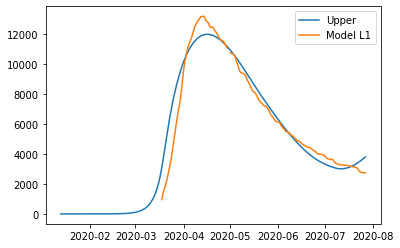

{'home': 0.9825187361136232, 'leisure': 0.9323345143513414, 'other': 0.8424980150695136, 'school': 0.9060269333543732, 'transport': 0.9045222214142209, 'work': 0.8028629364650852}
{'home': 0.9825187361136232, 'leisure': 0.11411875751504261, 'other': 0.06387835129611692, 'school': 0, 'transport': 0.11413577769361687, 'work': 0.2558528285241073}
{'home': 0.9825187361136232, 'leisure': 0.11411875751504261, 'other': 0.06387835129611692, 'school': 0, 'transport': 0.11413577769361687, 'work': 0.2558528285241073}
{'home': 0.9825187361136232, 'leisure': 0.1371910851671568, 'other': 0.15538992081628308, 'school': 0.2989888880069432, 'transport': 0.19858135056469695, 'work': 0.4545544170799121}
{'home': 0.9825187361136232, 'leisure': 0.26414720517318396, 'other': 0.2290561546533714, 'school': 0.6070380453474301, 'transport': 0.26362862555941086, 'work': 0.49489532625248384}
{'home': 0.9825187361136232, 'leisure': 0.443129402078412, 'other': 0.36634214401994675, 'school': 0.6070380453474301, 'tra

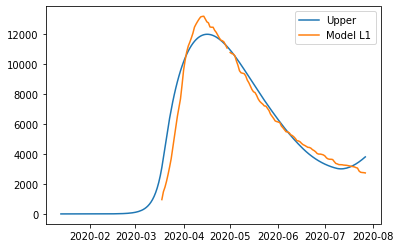

{'home': 0.9823457439643284, 'leisure': 0.9320761407897867, 'other': 0.841471738333543, 'school': 0.9062795408977574, 'transport': 0.9044339690137461, 'work': 0.8037391294527123}
{'home': 0.9823457439643284, 'leisure': 0.11413127907712976, 'other': 0.06387637107864898, 'school': 0, 'transport': 0.11416630748629246, 'work': 0.25656641788410084}
{'home': 0.9823457439643284, 'leisure': 0.11413127907712976, 'other': 0.06387637107864898, 'school': 0, 'transport': 0.11416630748629246, 'work': 0.25656641788410084}
{'home': 0.9823457439643284, 'leisure': 0.13721024618885574, 'other': 0.15536796649850518, 'school': 0.29907224849625996, 'transport': 0.19863580690749683, 'work': 0.4557104051360505}
{'home': 0.9823457439643284, 'leisure': 0.26417821028474003, 'other': 0.22898084818479914, 'school': 0.6072072924014975, 'transport': 0.2636984978568408, 'work': 0.49605366518977373}
{'home': 0.9823457439643284, 'leisure': 0.4431574118440889, 'other': 0.3660938783345893, 'school': 0.6072072924014975, '

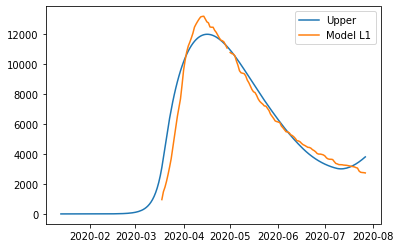

{'home': 0.9823457439643284, 'leisure': 0.9320761407897867, 'other': 0.841471738333543, 'school': 0.9062795408977574, 'transport': 0.9044339690137461, 'work': 0.8037391294527123}
{'home': 0.9823457439643284, 'leisure': 0.11413127907712976, 'other': 0.06387637107864898, 'school': 0, 'transport': 0.11416630748629246, 'work': 0.25656641788410084}
{'home': 0.9823457439643284, 'leisure': 0.11413127907712976, 'other': 0.06387637107864898, 'school': 0, 'transport': 0.11416630748629246, 'work': 0.25656641788410084}
{'home': 0.9823457439643284, 'leisure': 0.13721024618885574, 'other': 0.15536796649850518, 'school': 0.29907224849625996, 'transport': 0.19863580690749683, 'work': 0.4557104051360505}
{'home': 0.9823457439643284, 'leisure': 0.26417821028474003, 'other': 0.22898084818479914, 'school': 0.6072072924014975, 'transport': 0.2636984978568408, 'work': 0.49605366518977373}
{'home': 0.9823457439643284, 'leisure': 0.4431574118440889, 'other': 0.3660938783345893, 'school': 0.6072072924014975, '

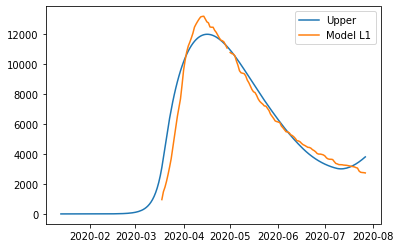

{'home': 0.9823457439643284, 'leisure': 0.9320761407897867, 'other': 0.841471738333543, 'school': 0.9062795408977574, 'transport': 0.9044339690137461, 'work': 0.8037391294527123}
{'home': 0.9823457439643284, 'leisure': 0.11413127907712976, 'other': 0.06387637107864898, 'school': 0, 'transport': 0.11416630748629246, 'work': 0.2565664167822428}
{'home': 0.9823457439643284, 'leisure': 0.11413127907712976, 'other': 0.06387637107864898, 'school': 0, 'transport': 0.11416630748629246, 'work': 0.2565664167822428}
{'home': 0.9823457439643284, 'leisure': 0.13721024618885574, 'other': 0.15536796649850518, 'school': 0.29907224849625996, 'transport': 0.19863580690749683, 'work': 0.4557104066307053}
{'home': 0.9823457439643284, 'leisure': 0.26417821028474003, 'other': 0.22898084818479914, 'school': 0.6072072924014975, 'transport': 0.2636984978568408, 'work': 0.49605366651116917}
{'home': 0.9823457439643284, 'leisure': 0.4431574118440889, 'other': 0.3660938783345893, 'school': 0.6072072924014975, 'tr

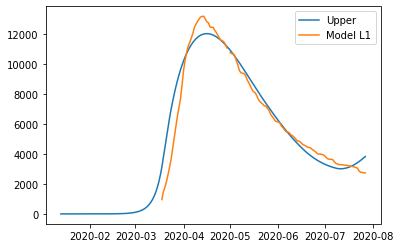

{'home': 0.9825374693383366, 'leisure': 0.9300367563272133, 'other': 0.8304736556909807, 'school': 0.9088154988409303, 'transport': 0.9031773738167039, 'work': 0.8130346953458089}
{'home': 0.9825374693383366, 'leisure': 0.11405257315548738, 'other': 0.06363030036801111, 'school': 0, 'transport': 0.11419130982032169, 'work': 0.26344702976725637}
{'home': 0.9825374693383366, 'leisure': 0.11405257315548738, 'other': 0.06363030036801111, 'school': 0, 'transport': 0.11419130982032169, 'work': 0.26344702976725637}
{'home': 0.9825374693383366, 'leisure': 0.13713564590462893, 'other': 0.15461553652138893, 'school': 0.299909114617507, 'transport': 0.1986928207712797, 'work': 0.4681303398395763}
{'home': 0.9825374693383366, 'leisure': 0.263994129435447, 'other': 0.22738514472923843, 'school': 0.6089063842234234, 'transport': 0.2637449647779473, 'work': 0.5082615282242433}
{'home': 0.9825374693383366, 'leisure': 0.4426180604094405, 'other': 0.3622005011806412, 'school': 0.6089063842234234, 'trans

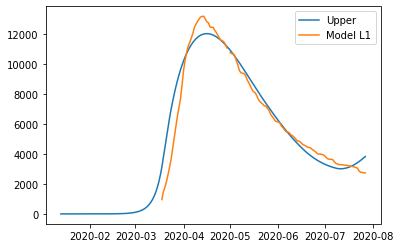

{'home': 0.9825374693383366, 'leisure': 0.9300367563272133, 'other': 0.8304736556909807, 'school': 0.9088154988409303, 'transport': 0.9031773738167039, 'work': 0.8130346953458089}
{'home': 0.9825374693383366, 'leisure': 0.11405257315548738, 'other': 0.06363030036801111, 'school': 0, 'transport': 0.11419130982032169, 'work': 0.26344702976725637}
{'home': 0.9825374693383366, 'leisure': 0.11405257315548738, 'other': 0.06363030036801111, 'school': 0, 'transport': 0.11419130982032169, 'work': 0.26344702976725637}
{'home': 0.9825374693383366, 'leisure': 0.13713564590462893, 'other': 0.15461553652138893, 'school': 0.299909114617507, 'transport': 0.1986928207712797, 'work': 0.4681303398395763}
{'home': 0.9825374693383366, 'leisure': 0.263994129435447, 'other': 0.22738514472923843, 'school': 0.6089063842234234, 'transport': 0.2637449647779473, 'work': 0.5082615282242433}
{'home': 0.9825374693383366, 'leisure': 0.4426180604094405, 'other': 0.3622005011806412, 'school': 0.6089063842234234, 'trans

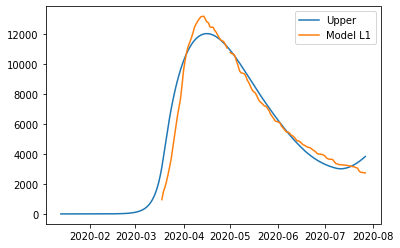

{'home': 0.9825374793383367, 'leisure': 0.9300367563272133, 'other': 0.8304736556909807, 'school': 0.9088154988409303, 'transport': 0.9031773738167039, 'work': 0.8130346953458089}
{'home': 0.9825374793383367, 'leisure': 0.11405257315548738, 'other': 0.06363030036801111, 'school': 0, 'transport': 0.11419130982032169, 'work': 0.26344702976725637}
{'home': 0.9825374793383367, 'leisure': 0.11405257315548738, 'other': 0.06363030036801111, 'school': 0, 'transport': 0.11419130982032169, 'work': 0.26344702976725637}
{'home': 0.9825374793383367, 'leisure': 0.13713564590462893, 'other': 0.15461553652138893, 'school': 0.299909114617507, 'transport': 0.1986928207712797, 'work': 0.4681303398395763}
{'home': 0.9825374793383367, 'leisure': 0.263994129435447, 'other': 0.22738514472923843, 'school': 0.6089063842234234, 'transport': 0.2637449647779473, 'work': 0.5082615282242433}
{'home': 0.9825374793383367, 'leisure': 0.4426180604094405, 'other': 0.3622005011806412, 'school': 0.6089063842234234, 'trans

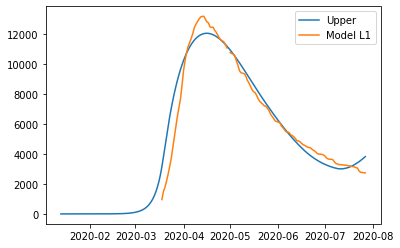

{'home': 0.98246082107876, 'leisure': 0.9298797167109399, 'other': 0.8302010891446117, 'school': 0.908945241302168, 'transport': 0.9031254325547347, 'work': 0.8135059209806845}
{'home': 0.98246082107876, 'leisure': 0.11405635959216917, 'other': 0.06364810812498194, 'school': 0, 'transport': 0.1142064865357148, 'work': 0.2638391664070463}
{'home': 0.98246082107876, 'leisure': 0.11405635959216917, 'other': 0.06364810812498194, 'school': 0, 'transport': 0.1142064865357148, 'work': 0.2638391664070463}
{'home': 0.98246082107876, 'leisure': 0.1371424377950299, 'other': 0.15464969300405942, 'school': 0.29995192962971545, 'transport': 0.1987199505145548, 'work': 0.4687696487641577}
{'home': 0.98246082107876, 'leisure': 0.26400399565569327, 'other': 0.2274126581017538, 'school': 0.6089933116724526, 'transport': 0.2637796724766818, 'work': 0.508900284896347}
{'home': 0.98246082107876, 'leisure': 0.4426216184856893, 'other': 0.3621764514851493, 'school': 0.6089933116724526, 'transport': 0.4375467

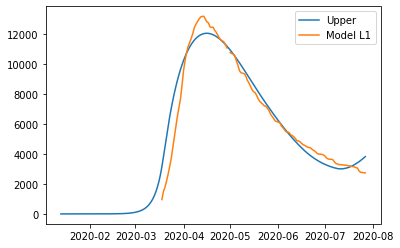

{'home': 0.98246082107876, 'leisure': 0.9298797167109399, 'other': 0.8302010891446117, 'school': 0.908945241302168, 'transport': 0.9031254325547347, 'work': 0.8135059209806845}
{'home': 0.98246082107876, 'leisure': 0.11405635959216917, 'other': 0.06364810812498194, 'school': 0, 'transport': 0.1142064865357148, 'work': 0.2638391664070463}
{'home': 0.98246082107876, 'leisure': 0.11405635959216917, 'other': 0.06364810812498194, 'school': 0, 'transport': 0.1142064865357148, 'work': 0.2638391664070463}
{'home': 0.98246082107876, 'leisure': 0.1371424377950299, 'other': 0.15464969300405942, 'school': 0.29995192962971545, 'transport': 0.1987199505145548, 'work': 0.4687696487641577}
{'home': 0.98246082107876, 'leisure': 0.26400399565569327, 'other': 0.2274126581017538, 'school': 0.6089933116724526, 'transport': 0.2637796724766818, 'work': 0.508900284896347}
{'home': 0.98246082107876, 'leisure': 0.4426216184856893, 'other': 0.3621764514851493, 'school': 0.6089933116724526, 'transport': 0.4375467

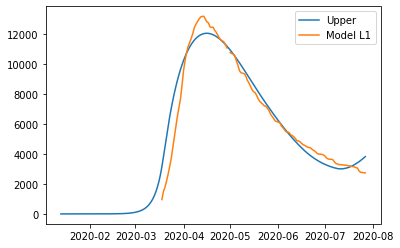

{'home': 0.98246082107876, 'leisure': 0.9298797167109399, 'other': 0.8302010891446117, 'school': 0.908945241302168, 'transport': 0.9031254325547347, 'work': 0.8135059209806845}
{'home': 0.98246082107876, 'leisure': 0.11405635959216917, 'other': 0.06364810812498194, 'school': 0, 'transport': 0.1142064865357148, 'work': 0.263839165266451}
{'home': 0.98246082107876, 'leisure': 0.11405635959216917, 'other': 0.06364810812498194, 'school': 0, 'transport': 0.1142064865357148, 'work': 0.263839165266451}
{'home': 0.98246082107876, 'leisure': 0.1371424377950299, 'other': 0.15464969300405942, 'school': 0.29995192962971545, 'transport': 0.1987199505145548, 'work': 0.46876965025447687}
{'home': 0.98246082107876, 'leisure': 0.26400399565569327, 'other': 0.2274126581017538, 'school': 0.6089933116724526, 'transport': 0.2637796724766818, 'work': 0.5089002862131785}
{'home': 0.98246082107876, 'leisure': 0.4426216184856893, 'other': 0.3621764514851493, 'school': 0.6089933116724526, 'transport': 0.4375467

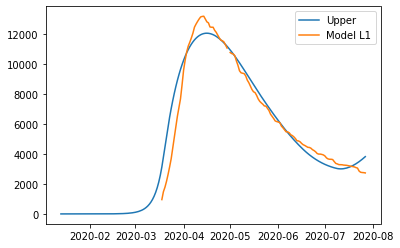

{'home': 0.9824464582561722, 'leisure': 0.9298456287683581, 'other': 0.8301208801602709, 'school': 0.9089748495139663, 'transport': 0.9031131026815115, 'work': 0.8136137281371041}
{'home': 0.9824464582561722, 'leisure': 0.1140569306653694, 'other': 0.06365046014001229, 'school': 0, 'transport': 0.11420945130526003, 'work': 0.2639275164646708}
{'home': 0.9824464582561722, 'leisure': 0.1140569306653694, 'other': 0.06365046014001229, 'school': 0, 'transport': 0.11420945130526003, 'work': 0.2639275164646708}
{'home': 0.9824464582561722, 'leisure': 0.13714359306402626, 'other': 0.1546533732506418, 'school': 0.2999617003396089, 'transport': 0.19872527306783874, 'work': 0.46891591724278286}
{'home': 0.9824464582561722, 'leisure': 0.26400552701334756, 'other': 0.22741281320156906, 'school': 0.6090131491743574, 'transport': 0.26378643308109495, 'work': 0.5090460288962866}
{'home': 0.9824464582561722, 'leisure': 0.44262126273276825, 'other': 0.3621611868476065, 'school': 0.6090131491743574, 'tra

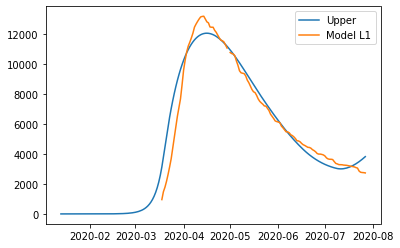

{'home': 0.9824464582561722, 'leisure': 0.9298456287683581, 'other': 0.8301208801602709, 'school': 0.9089748495139663, 'transport': 0.9031131026815115, 'work': 0.8136137281371041}
{'home': 0.9824464582561722, 'leisure': 0.1140569306653694, 'other': 0.06365046014001229, 'school': 0, 'transport': 0.11420945130526003, 'work': 0.2639275164646708}
{'home': 0.9824464582561722, 'leisure': 0.1140569306653694, 'other': 0.06365046014001229, 'school': 0, 'transport': 0.11420945130526003, 'work': 0.2639275164646708}
{'home': 0.9824464582561722, 'leisure': 0.13714359306402626, 'other': 0.1546533732506418, 'school': 0.2999617003396089, 'transport': 0.19872527306783874, 'work': 0.46891591724278286}
{'home': 0.9824464582561722, 'leisure': 0.26400552701334756, 'other': 0.22741281320156906, 'school': 0.6090131491743574, 'transport': 0.26378643308109495, 'work': 0.5090460288962866}
{'home': 0.9824464582561722, 'leisure': 0.44262126273276825, 'other': 0.3621611868476065, 'school': 0.6090131491743574, 'tra

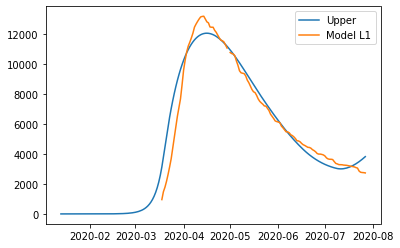

{'home': 0.9824464582561722, 'leisure': 0.9298456287683581, 'other': 0.8301208801602709, 'school': 0.9089748495139663, 'transport': 0.9031131026815115, 'work': 0.8136137281371041}
{'home': 0.9824464582561722, 'leisure': 0.1140569306653694, 'other': 0.06365046014001229, 'school': 0, 'transport': 0.11420945130526003, 'work': 0.2639275153236169}
{'home': 0.9824464582561722, 'leisure': 0.1140569306653694, 'other': 0.06365046014001229, 'school': 0, 'transport': 0.11420945130526003, 'work': 0.2639275153236169}
{'home': 0.9824464582561722, 'leisure': 0.13714359306402626, 'other': 0.1546533732506418, 'school': 0.2999617003396089, 'transport': 0.19872527306783874, 'work': 0.46891591873303573}
{'home': 0.9824464582561722, 'leisure': 0.26400552701334756, 'other': 0.22741281320156906, 'school': 0.6090131491743574, 'transport': 0.26378643308109495, 'work': 0.5090460302130425}
{'home': 0.9824464582561722, 'leisure': 0.44262126273276825, 'other': 0.3621611868476065, 'school': 0.6090131491743574, 'tra

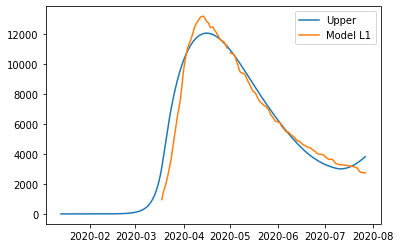

{'home': 0.982441312619794, 'leisure': 0.9298334163946178, 'other': 0.8300921444249959, 'school': 0.9089854569757512, 'transport': 0.9031086853712086, 'work': 0.8136523512157164}
{'home': 0.982441312619794, 'leisure': 0.11405713512637794, 'other': 0.06365130228199335, 'school': 0, 'transport': 0.11421051337410926, 'work': 0.26395917401298213}
{'home': 0.982441312619794, 'leisure': 0.11405713512637794, 'other': 0.06365130228199335, 'school': 0, 'transport': 0.11421051337410926, 'work': 0.26395917401298213}
{'home': 0.982441312619794, 'leisure': 0.1371440067797157, 'other': 0.15465469065926185, 'school': 0.2999652008019979, 'transport': 0.19872717976687312, 'work': 0.4689683276791235}
{'home': 0.982441312619794, 'leisure': 0.26400607532709575, 'other': 0.22741286748510198, 'school': 0.6090202561737533, 'transport': 0.26378885493024146, 'work': 0.5090982508649496}
{'home': 0.982441312619794, 'leisure': 0.44262113483917065, 'other': 0.3621557169827333, 'school': 0.6090202561737533, 'transp

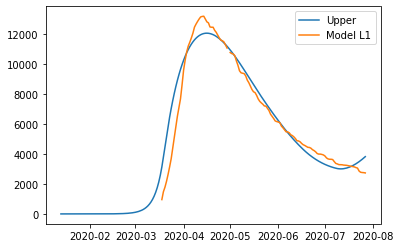

{'home': 0.982441312619794, 'leisure': 0.9298334163946178, 'other': 0.8300921444249959, 'school': 0.9089854569757512, 'transport': 0.9031086853712086, 'work': 0.8136523512157164}
{'home': 0.982441312619794, 'leisure': 0.11405713512637794, 'other': 0.06365130228199335, 'school': 0, 'transport': 0.11421051337410926, 'work': 0.26395917401298213}
{'home': 0.982441312619794, 'leisure': 0.11405713512637794, 'other': 0.06365130228199335, 'school': 0, 'transport': 0.11421051337410926, 'work': 0.26395917401298213}
{'home': 0.982441312619794, 'leisure': 0.1371440067797157, 'other': 0.15465469065926185, 'school': 0.2999652008019979, 'transport': 0.19872717976687312, 'work': 0.4689683276791235}
{'home': 0.982441312619794, 'leisure': 0.26400607532709575, 'other': 0.22741286748510198, 'school': 0.6090202561737533, 'transport': 0.26378885493024146, 'work': 0.5090982508649496}
{'home': 0.982441312619794, 'leisure': 0.44262113483917065, 'other': 0.3621557169827333, 'school': 0.6090202561737533, 'transp

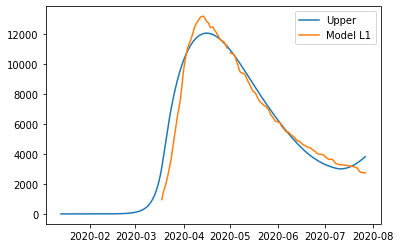

{'home': 0.982441312619794, 'leisure': 0.9298334163946178, 'other': 0.8300921444249959, 'school': 0.9089854569757512, 'transport': 0.9031086853712086, 'work': 0.8136523512157164}
{'home': 0.982441312619794, 'leisure': 0.11405713512637794, 'other': 0.06365130228199335, 'school': 0, 'transport': 0.11421051337410926, 'work': 0.263959172871764}
{'home': 0.982441312619794, 'leisure': 0.11405713512637794, 'other': 0.06365130228199335, 'school': 0, 'transport': 0.11421051337410926, 'work': 0.263959172871764}
{'home': 0.982441312619794, 'leisure': 0.1371440067797157, 'other': 0.15465469065926185, 'school': 0.2999652008019979, 'transport': 0.19872717976687312, 'work': 0.46896832916935266}
{'home': 0.982441312619794, 'leisure': 0.26400607532709575, 'other': 0.22741286748510198, 'school': 0.6090202561737533, 'transport': 0.26378885493024146, 'work': 0.5090982521816786}
{'home': 0.982441312619794, 'leisure': 0.44262113483917065, 'other': 0.3621557169827333, 'school': 0.6090202561737533, 'transport

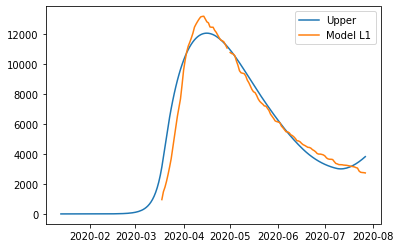

{'home': 0.9824392133263471, 'leisure': 0.9298284340456372, 'other': 0.8300804209497405, 'school': 0.9089897845600141, 'transport': 0.9031068832169384, 'work': 0.8136681084845688}
{'home': 0.9824392133263471, 'leisure': 0.1140572185214356, 'other': 0.0636516457806035, 'school': 0, 'transport': 0.11421094665823345, 'work': 0.2639720903020519}
{'home': 0.9824392133263471, 'leisure': 0.1140572185214356, 'other': 0.0636516457806035, 'school': 0, 'transport': 0.11421094665823345, 'work': 0.2639720903020519}
{'home': 0.9824392133263471, 'leisure': 0.13714417553952502, 'other': 0.15465522796612138, 'school': 0.2999666289048047, 'transport': 0.19872795762859402, 'work': 0.4689897110902985}
{'home': 0.9824392133263471, 'leisure': 0.2640062989784365, 'other': 0.22741288943712235, 'school': 0.6090231556552095, 'transport': 0.2637898429534167, 'work': 0.5091195572999396}
{'home': 0.9824392133263471, 'leisure': 0.44262108259486405, 'other': 0.36215348523875807, 'school': 0.6090231556552095, 'transp

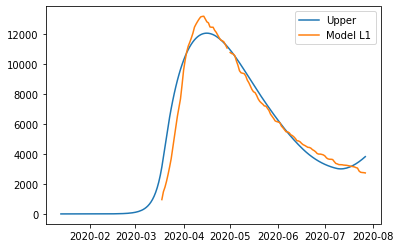

{'home': 0.9824392133263471, 'leisure': 0.9298284340456372, 'other': 0.8300804209497405, 'school': 0.9089897845600141, 'transport': 0.9031068832169384, 'work': 0.8136681084845688}
{'home': 0.9824392133263471, 'leisure': 0.1140572185214356, 'other': 0.0636516457806035, 'school': 0, 'transport': 0.11421094665823345, 'work': 0.2639720903020519}
{'home': 0.9824392133263471, 'leisure': 0.1140572185214356, 'other': 0.0636516457806035, 'school': 0, 'transport': 0.11421094665823345, 'work': 0.2639720903020519}
{'home': 0.9824392133263471, 'leisure': 0.13714417553952502, 'other': 0.15465522796612138, 'school': 0.2999666289048047, 'transport': 0.19872795762859402, 'work': 0.4689897110902985}
{'home': 0.9824392133263471, 'leisure': 0.2640062989784365, 'other': 0.22741288943712235, 'school': 0.6090231556552095, 'transport': 0.2637898429534167, 'work': 0.5091195572999396}
{'home': 0.9824392133263471, 'leisure': 0.44262108259486405, 'other': 0.36215348523875807, 'school': 0.6090231556552095, 'transp

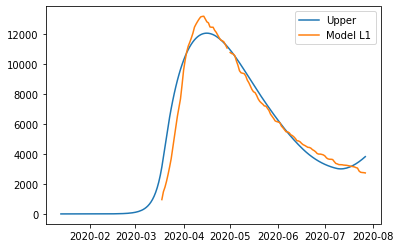

{'home': 0.9824392133263471, 'leisure': 0.9298284340456372, 'other': 0.8300804209497405, 'school': 0.9089897845600141, 'transport': 0.9031068832169384, 'work': 0.8136681084845688}
{'home': 0.9824392133263471, 'leisure': 0.1140572185214356, 'other': 0.0636516457806035, 'school': 0, 'transport': 0.11421094665823345, 'work': 0.2639720903020519}
{'home': 0.9824392133263471, 'leisure': 0.1140572185214356, 'other': 0.0636516457806035, 'school': 0, 'transport': 0.11421094665823345, 'work': 0.2639720903020519}
{'home': 0.9824392133263471, 'leisure': 0.13714417553952502, 'other': 0.15465522796612138, 'school': 0.2999666289048047, 'transport': 0.19872795762859402, 'work': 0.4689897110902985}
{'home': 0.9824392133263471, 'leisure': 0.2640062989784365, 'other': 0.22741288943712235, 'school': 0.6090231556552095, 'transport': 0.2637898429534167, 'work': 0.5091195572999396}
{'home': 0.9824392133263471, 'leisure': 0.44262108259486405, 'other': 0.36215348523875807, 'school': 0.6090231556552095, 'transp

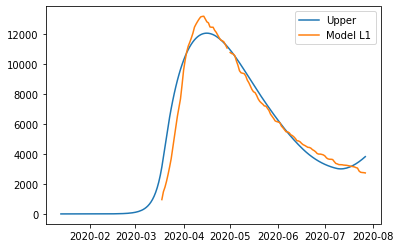

{'home': 0.9824392133263471, 'leisure': 0.9298284340456372, 'other': 0.8300804209497405, 'school': 0.9089897845600141, 'transport': 0.9031068832169384, 'work': 0.8136681084845688}
{'home': 0.9824392133263471, 'leisure': 0.1140572185214356, 'other': 0.0636516457806035, 'school': 0, 'transport': 0.11421094665823345, 'work': 0.2639720891607667}
{'home': 0.9824392133263471, 'leisure': 0.1140572185214356, 'other': 0.0636516457806035, 'school': 0, 'transport': 0.11421094665823345, 'work': 0.2639720891607667}
{'home': 0.9824392133263471, 'leisure': 0.13714417553952502, 'other': 0.15465522796612138, 'school': 0.2999666289048047, 'transport': 0.19872795762859402, 'work': 0.46898971258051786}
{'home': 0.9824392133263471, 'leisure': 0.2640062989784365, 'other': 0.22741288943712235, 'school': 0.6090231556552095, 'transport': 0.2637898429534167, 'work': 0.5091195586166574}
{'home': 0.9824392133263471, 'leisure': 0.44262108259486405, 'other': 0.36215348523875807, 'school': 0.6090231556552095, 'trans

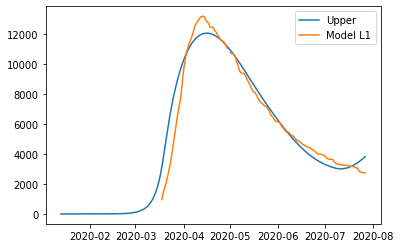

{'home': 0.9824387189021275, 'leisure': 0.9298272607253752, 'other': 0.8300776712900616, 'school': 0.9089908036569609, 'transport': 0.9031064588399955, 'work': 0.8136718191343763}
{'home': 0.9824387189021275, 'leisure': 0.11405723816442985, 'other': 0.0636517275209139, 'school': 0, 'transport': 0.11421104870063681, 'work': 0.26397513203076567}
{'home': 0.9824387189021275, 'leisure': 0.11405723816442985, 'other': 0.0636517275209139, 'school': 0, 'transport': 0.11421104870063681, 'work': 0.26397513203076567}
{'home': 0.9824387189021275, 'leisure': 0.13714421528652504, 'other': 0.15465535656239035, 'school': 0.2999669652067971, 'transport': 0.19872814082167825, 'work': 0.46899474673740504}
{'home': 0.9824387189021275, 'leisure': 0.26400635165675734, 'other': 0.22741289765091127, 'school': 0.6090238384501638, 'transport': 0.26379007564242973, 'work': 0.5091245748206067}
{'home': 0.9824387189021275, 'leisure': 0.44262107031060755, 'other': 0.36215296454882867, 'school': 0.6090238384501638, 

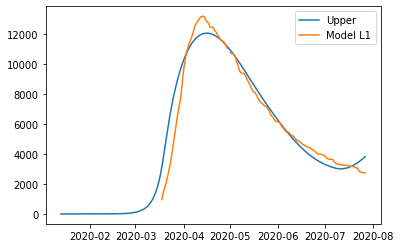

{'home': 0.9824387189021275, 'leisure': 0.9298272607253752, 'other': 0.8300776712900616, 'school': 0.9089908036569609, 'transport': 0.9031064588399955, 'work': 0.8136718191343763}
{'home': 0.9824387189021275, 'leisure': 0.11405723816442985, 'other': 0.0636517275209139, 'school': 0, 'transport': 0.11421104870063681, 'work': 0.26397513203076567}
{'home': 0.9824387189021275, 'leisure': 0.11405723816442985, 'other': 0.0636517275209139, 'school': 0, 'transport': 0.11421104870063681, 'work': 0.26397513203076567}
{'home': 0.9824387189021275, 'leisure': 0.13714421528652504, 'other': 0.15465535656239035, 'school': 0.2999669652067971, 'transport': 0.19872814082167825, 'work': 0.46899474673740504}
{'home': 0.9824387189021275, 'leisure': 0.26400635165675734, 'other': 0.22741289765091127, 'school': 0.6090238384501638, 'transport': 0.26379007564242973, 'work': 0.5091245748206067}
{'home': 0.9824387189021275, 'leisure': 0.44262107031060755, 'other': 0.36215296454882867, 'school': 0.6090238384501638, 

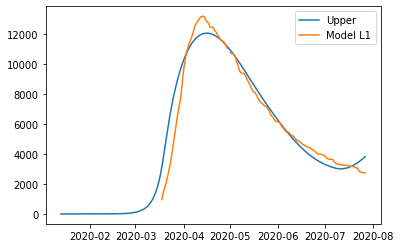

{'home': 0.9824387189021275, 'leisure': 0.9298272607253752, 'other': 0.8300776712900616, 'school': 0.9089908036569609, 'transport': 0.9031064588399955, 'work': 0.8136718191343763}
{'home': 0.9824387189021275, 'leisure': 0.11405723816442985, 'other': 0.0636517275209139, 'school': 0, 'transport': 0.11421104870063681, 'work': 0.26397513088946467}
{'home': 0.9824387189021275, 'leisure': 0.11405723816442985, 'other': 0.0636517275209139, 'school': 0, 'transport': 0.11421104870063681, 'work': 0.26397513088946467}
{'home': 0.9824387189021275, 'leisure': 0.13714421528652504, 'other': 0.15465535656239035, 'school': 0.2999669652067971, 'transport': 0.19872814082167825, 'work': 0.46899474822762216}
{'home': 0.9824387189021275, 'leisure': 0.26400635165675734, 'other': 0.22741289765091127, 'school': 0.6090238384501638, 'transport': 0.26379007564242973, 'work': 0.5091245761373219}
{'home': 0.9824387189021275, 'leisure': 0.44262107031060755, 'other': 0.36215296454882867, 'school': 0.6090238384501638, 

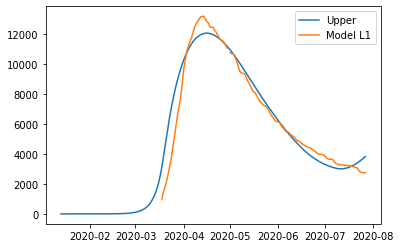

{'home': 0.9824385780585713, 'leisure': 0.9298269264889204, 'other': 0.8300768880115889, 'school': 0.9089910939607779, 'transport': 0.9031063379503719, 'work': 0.8136728761641375}
{'home': 0.9824385780585713, 'leisure': 0.11405724375988983, 'other': 0.06365175080533068, 'school': 0, 'transport': 0.11421107776874054, 'work': 0.2639759985137516}
{'home': 0.9824385780585713, 'leisure': 0.11405724375988983, 'other': 0.06365175080533068, 'school': 0, 'transport': 0.11421107776874054, 'work': 0.2639759985137516}
{'home': 0.9824385780585713, 'leisure': 0.13714422660885286, 'other': 0.15465539319385194, 'school': 0.2999670610070567, 'transport': 0.19872819300660882, 'work': 0.46899618121820086}
{'home': 0.9824385780585713, 'leisure': 0.26400636666262567, 'other': 0.2274128999895831, 'school': 0.6090240329537212, 'transport': 0.263790141926916, 'work': 0.5091260041373304}
{'home': 0.9824385780585713, 'leisure': 0.44262106681087443, 'other': 0.3621528162221071, 'school': 0.6090240329537212, 'tra

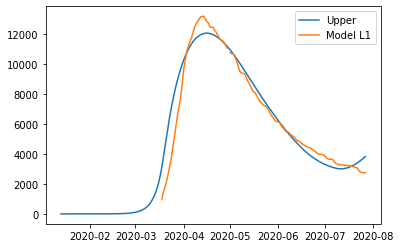

{'home': 0.9824385780585713, 'leisure': 0.9298269264889204, 'other': 0.8300768880115889, 'school': 0.9089910939607779, 'transport': 0.9031063379503719, 'work': 0.8136728761641375}
{'home': 0.9824385780585713, 'leisure': 0.11405724375988983, 'other': 0.06365175080533068, 'school': 0, 'transport': 0.11421107776874054, 'work': 0.2639759985137516}
{'home': 0.9824385780585713, 'leisure': 0.11405724375988983, 'other': 0.06365175080533068, 'school': 0, 'transport': 0.11421107776874054, 'work': 0.2639759985137516}
{'home': 0.9824385780585713, 'leisure': 0.13714422660885286, 'other': 0.15465539319385194, 'school': 0.2999670610070567, 'transport': 0.19872819300660882, 'work': 0.46899618121820086}
{'home': 0.9824385780585713, 'leisure': 0.26400636666262567, 'other': 0.2274128999895831, 'school': 0.6090240329537212, 'transport': 0.263790141926916, 'work': 0.5091260041373304}
{'home': 0.9824385780585713, 'leisure': 0.44262106681087443, 'other': 0.3621528162221071, 'school': 0.6090240329537212, 'tra

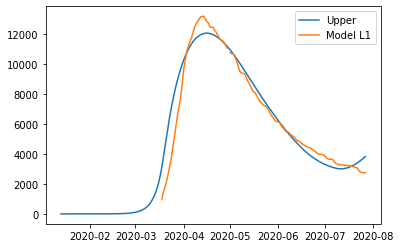

{'home': 0.9824385780585713, 'leisure': 0.9298269264889204, 'other': 0.8300768880115889, 'school': 0.9089910939607779, 'transport': 0.9031063379503719, 'work': 0.8136728761641375}
{'home': 0.9824385780585713, 'leisure': 0.11405724375988983, 'other': 0.06365175080533068, 'school': 0, 'transport': 0.11421107776874054, 'work': 0.2639759973724462}
{'home': 0.9824385780585713, 'leisure': 0.11405724375988983, 'other': 0.06365175080533068, 'school': 0, 'transport': 0.11421107776874054, 'work': 0.2639759973724462}
{'home': 0.9824385780585713, 'leisure': 0.13714422660885286, 'other': 0.15465539319385194, 'school': 0.2999670610070567, 'transport': 0.19872819300660882, 'work': 0.4689961827084173}
{'home': 0.9824385780585713, 'leisure': 0.26400636666262567, 'other': 0.2274128999895831, 'school': 0.6090240329537212, 'transport': 0.263790141926916, 'work': 0.5091260054540448}
{'home': 0.9824385780585713, 'leisure': 0.44262106681087443, 'other': 0.3621528162221071, 'school': 0.6090240329537212, 'tran

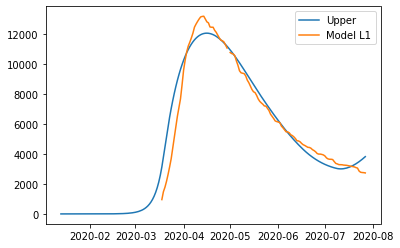

{'home': 0.9824384872762079, 'leisure': 0.9298267110528997, 'other': 0.8300763831402771, 'school': 0.9089912810795026, 'transport': 0.9031062600295493, 'work': 0.8136735574850479}
{'home': 0.9824384872762079, 'leisure': 0.11405724736648144, 'other': 0.0636517658134713, 'school': 0, 'transport': 0.11421109650490793, 'work': 0.26397655701659273}
{'home': 0.9824384872762079, 'leisure': 0.11405724736648144, 'other': 0.0636517658134713, 'school': 0, 'transport': 0.11421109650490793, 'work': 0.26397655701659273}
{'home': 0.9824384872762079, 'leisure': 0.13714423390675579, 'other': 0.15465541680486408, 'school': 0.2999671227562359, 'transport': 0.19872822664298267, 'work': 0.4689971058313072}
{'home': 0.9824384872762079, 'leisure': 0.2640063763347685, 'other': 0.22741290149673365, 'school': 0.6090241583232667, 'transport': 0.2637901846513137, 'work': 0.509126925421755}
{'home': 0.9824384872762079, 'leisure': 0.4426210645549882, 'other': 0.3621527206161431, 'school': 0.6090241583232667, 'trans

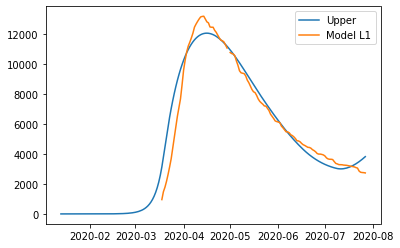

{'home': 0.9824384872762079, 'leisure': 0.9298267110528997, 'other': 0.8300763831402771, 'school': 0.9089912810795026, 'transport': 0.9031062600295493, 'work': 0.8136735574850479}
{'home': 0.9824384872762079, 'leisure': 0.11405724736648144, 'other': 0.0636517658134713, 'school': 0, 'transport': 0.11421109650490793, 'work': 0.26397655701659273}
{'home': 0.9824384872762079, 'leisure': 0.11405724736648144, 'other': 0.0636517658134713, 'school': 0, 'transport': 0.11421109650490793, 'work': 0.26397655701659273}
{'home': 0.9824384872762079, 'leisure': 0.13714423390675579, 'other': 0.15465541680486408, 'school': 0.2999671227562359, 'transport': 0.19872822664298267, 'work': 0.4689971058313072}
{'home': 0.9824384872762079, 'leisure': 0.2640063763347685, 'other': 0.22741290149673365, 'school': 0.6090241583232667, 'transport': 0.2637901846513137, 'work': 0.509126925421755}
{'home': 0.9824384872762079, 'leisure': 0.4426210645549882, 'other': 0.3621527206161431, 'school': 0.6090241583232667, 'trans

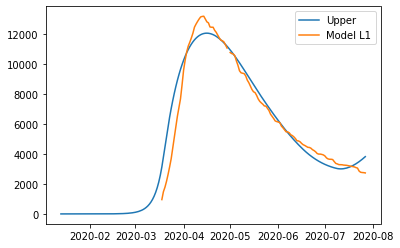

{'home': 0.9824384872762079, 'leisure': 0.9298267110528997, 'other': 0.8300763831402771, 'school': 0.9089912810795026, 'transport': 0.9031062600295493, 'work': 0.8136735574850479}
{'home': 0.9824384872762079, 'leisure': 0.11405724736648144, 'other': 0.0636517658134713, 'school': 0, 'transport': 0.11421109650490793, 'work': 0.26397655701659273}
{'home': 0.9824384872762079, 'leisure': 0.11405724736648144, 'other': 0.0636517658134713, 'school': 0, 'transport': 0.11421109650490793, 'work': 0.26397655701659273}
{'home': 0.9824384872762079, 'leisure': 0.13714423390675579, 'other': 0.15465541680486408, 'school': 0.2999671227562359, 'transport': 0.19872822664298267, 'work': 0.4689971058313072}
{'home': 0.9824384872762079, 'leisure': 0.2640063763347685, 'other': 0.22741290149673365, 'school': 0.6090241583232667, 'transport': 0.2637901846513137, 'work': 0.509126925421755}
{'home': 0.9824384872762079, 'leisure': 0.4426210645549882, 'other': 0.3621527206161431, 'school': 0.6090241583232667, 'trans

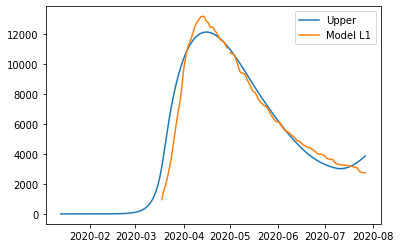

{'home': 0.981346947107922, 'leisure': 0.9276034702549129, 'other': 0.822071387970683, 'school': 0.91080826640893, 'transport': 0.9023787217598085, 'work': 0.8202808817949296}
{'home': 0.981346947107922, 'leisure': 0.11410957584842056, 'other': 0.06357656444128165, 'school': 0, 'transport': 0.1144258313861477, 'work': 0.26953072675371414}
{'home': 0.981346947107922, 'leisure': 0.11410957584842056, 'other': 0.06357656444128165, 'school': 0, 'transport': 0.1144258313861477, 'work': 0.26953072675371414}
{'home': 0.981346947107922, 'leisure': 0.13723875295708068, 'other': 0.15434605665480758, 'school': 0.30056672791494693, 'transport': 0.19911197635356576, 'work': 0.47803450532775155}
{'home': 0.981346947107922, 'leisure': 0.26414320717279244, 'other': 0.2266436882064717, 'school': 0.6102415384939831, 'transport': 0.26428137919062494, 'work': 0.5181544049232643}
{'home': 0.981346947107922, 'leisure': 0.44266877420366907, 'other': 0.3599871124829825, 'school': 0.6102415384939831, 'transport

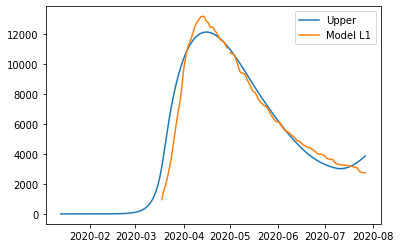

{'home': 0.981346947107922, 'leisure': 0.9276034702549129, 'other': 0.822071387970683, 'school': 0.91080826640893, 'transport': 0.9023787217598085, 'work': 0.8202808817949296}
{'home': 0.981346947107922, 'leisure': 0.11410957584842056, 'other': 0.06357656444128165, 'school': 0, 'transport': 0.1144258313861477, 'work': 0.26953072675371414}
{'home': 0.981346947107922, 'leisure': 0.11410957584842056, 'other': 0.06357656444128165, 'school': 0, 'transport': 0.1144258313861477, 'work': 0.26953072675371414}
{'home': 0.981346947107922, 'leisure': 0.13723875295708068, 'other': 0.15434605665480758, 'school': 0.30056672791494693, 'transport': 0.19911197635356576, 'work': 0.47803450532775155}
{'home': 0.981346947107922, 'leisure': 0.26414320717279244, 'other': 0.2266436882064717, 'school': 0.6102415384939831, 'transport': 0.26428137919062494, 'work': 0.5181544049232643}
{'home': 0.981346947107922, 'leisure': 0.44266877420366907, 'other': 0.3599871124829825, 'school': 0.6102415384939831, 'transport

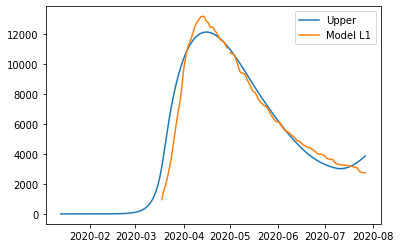

{'home': 0.981346947107922, 'leisure': 0.9276034702549129, 'other': 0.822071387970683, 'school': 0.91080826640893, 'transport': 0.9023787217598085, 'work': 0.8202808817949296}
{'home': 0.981346947107922, 'leisure': 0.11410957584842056, 'other': 0.06357656444128165, 'school': 0, 'transport': 0.1144258313861477, 'work': 0.26953072675371414}
{'home': 0.981346947107922, 'leisure': 0.11410957584842056, 'other': 0.06357656444128165, 'school': 0, 'transport': 0.1144258313861477, 'work': 0.26953072675371414}
{'home': 0.981346947107922, 'leisure': 0.13723875295708068, 'other': 0.15434605665480758, 'school': 0.30056672791494693, 'transport': 0.19911197635356576, 'work': 0.47803450532775155}
{'home': 0.981346947107922, 'leisure': 0.26414320717279244, 'other': 0.2266436882064717, 'school': 0.6102415384939831, 'transport': 0.26428137919062494, 'work': 0.5181544049232643}
{'home': 0.981346947107922, 'leisure': 0.44266877420366907, 'other': 0.3599871124829825, 'school': 0.6102415384939831, 'transport

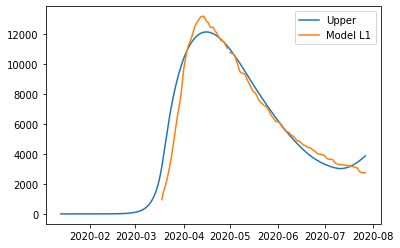

{'home': 0.9820313389229992, 'leisure': 0.9272540727935302, 'other': 0.8191032173295391, 'school': 0.9113827072230449, 'transport': 0.9019590067360858, 'work': 0.8225871150182554}
{'home': 0.9820313389229992, 'leisure': 0.11402057284769349, 'other': 0.0634317642708675, 'school': 0, 'transport': 0.11434096953778868, 'work': 0.27105840047149105}
{'home': 0.9820313389229992, 'leisure': 0.11402057284769349, 'other': 0.0634317642708675, 'school': 0, 'transport': 0.11434096953778868, 'work': 0.27105840047149105}
{'home': 0.9820313389229992, 'leisure': 0.13713011020823732, 'other': 0.15396392122664782, 'school': 0.3007562933836048, 'transport': 0.19896750931611104, 'work': 0.48122771221398764}
{'home': 0.9820313389229992, 'leisure': 0.26393012858326226, 'other': 0.22595265642266377, 'school': 0.6106264138394402, 'transport': 0.26408129248421036, 'work': 0.5212167735622274}
{'home': 0.9820313389229992, 'leisure': 0.44226044085954613, 'other': 0.35855749951944327, 'school': 0.6106264138394402, 

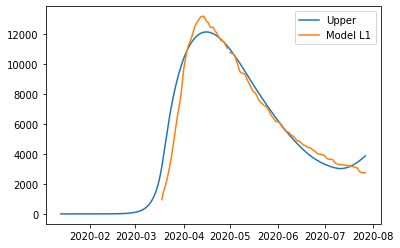

{'home': 0.9820313389229992, 'leisure': 0.9272540727935302, 'other': 0.8191032173295391, 'school': 0.9113827072230449, 'transport': 0.9019590067360858, 'work': 0.8225871150182554}
{'home': 0.9820313389229992, 'leisure': 0.11402057284769349, 'other': 0.0634317642708675, 'school': 0, 'transport': 0.11434096953778868, 'work': 0.27105840047149105}
{'home': 0.9820313389229992, 'leisure': 0.11402057284769349, 'other': 0.0634317642708675, 'school': 0, 'transport': 0.11434096953778868, 'work': 0.27105840047149105}
{'home': 0.9820313389229992, 'leisure': 0.13713011020823732, 'other': 0.15396392122664782, 'school': 0.3007562933836048, 'transport': 0.19896750931611104, 'work': 0.48122771221398764}
{'home': 0.9820313389229992, 'leisure': 0.26393012858326226, 'other': 0.22595265642266377, 'school': 0.6106264138394402, 'transport': 0.26408129248421036, 'work': 0.5212167735622274}
{'home': 0.9820313389229992, 'leisure': 0.44226044085954613, 'other': 0.35855749951944327, 'school': 0.6106264138394402, 

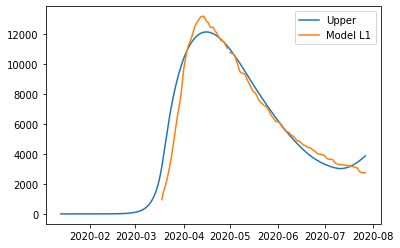

{'home': 0.9820313389229992, 'leisure': 0.9272540727935302, 'other': 0.8191032173295391, 'school': 0.9113827072230449, 'transport': 0.9019590067360858, 'work': 0.8225871150182554}
{'home': 0.9820313389229992, 'leisure': 0.11402057284769349, 'other': 0.0634317642708675, 'school': 0, 'transport': 0.11434096953778868, 'work': 0.27105840047149105}
{'home': 0.9820313389229992, 'leisure': 0.11402057284769349, 'other': 0.0634317642708675, 'school': 0, 'transport': 0.11434096953778868, 'work': 0.27105840047149105}
{'home': 0.9820313389229992, 'leisure': 0.13713011020823732, 'other': 0.15396392122664782, 'school': 0.3007562933836048, 'transport': 0.19896750931611104, 'work': 0.48122771221398764}
{'home': 0.9820313389229992, 'leisure': 0.26393012858326226, 'other': 0.22595265642266377, 'school': 0.6106264138394402, 'transport': 0.26408129248421036, 'work': 0.5212167735622274}
{'home': 0.9820313389229992, 'leisure': 0.44226044085954613, 'other': 0.35855749951944327, 'school': 0.6106264138394402, 

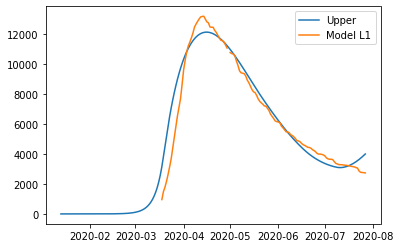

{'home': 0.9809351167043423, 'leisure': 0.9249298111859312, 'other': 0.8160290344625409, 'school': 0.9115559057512673, 'transport': 0.9016349946902066, 'work': 0.8240820357628846}
{'home': 0.9809351167043423, 'leisure': 0.11404631581589293, 'other': 0.06354317208526983, 'school': 0, 'transport': 0.11458264878445891, 'work': 0.27359996722634233}
{'home': 0.9809351167043423, 'leisure': 0.11404631581589293, 'other': 0.06354317208526983, 'school': 0, 'transport': 0.11458264878445891, 'work': 0.27359996722634233}
{'home': 0.9809351167043423, 'leisure': 0.13718698840598806, 'other': 0.15416405655046206, 'school': 0.3008134488979182, 'transport': 0.19939288923742438, 'work': 0.4845641694195292}
{'home': 0.9809351167043423, 'leisure': 0.264008117325797, 'other': 0.22612693859111377, 'school': 0.6107424568533492, 'transport': 0.26463954073017154, 'work': 0.5245909397054823}
{'home': 0.9809351167043423, 'leisure': 0.4422970256735069, 'other': 0.35841712732988357, 'school': 0.6107424568533492, 't

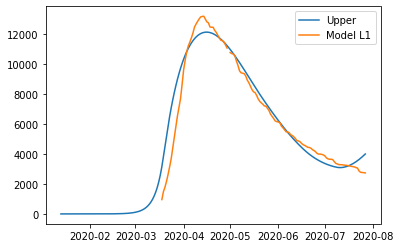

{'home': 0.9809351167043423, 'leisure': 0.9249298111859312, 'other': 0.8160290344625409, 'school': 0.9115559057512673, 'transport': 0.9016349946902066, 'work': 0.8240820357628846}
{'home': 0.9809351167043423, 'leisure': 0.11404631581589293, 'other': 0.06354317208526983, 'school': 0, 'transport': 0.11458264878445891, 'work': 0.27359996722634233}
{'home': 0.9809351167043423, 'leisure': 0.11404631581589293, 'other': 0.06354317208526983, 'school': 0, 'transport': 0.11458264878445891, 'work': 0.27359996722634233}
{'home': 0.9809351167043423, 'leisure': 0.13718698840598806, 'other': 0.15416405655046206, 'school': 0.3008134488979182, 'transport': 0.19939288923742438, 'work': 0.4845641694195292}
{'home': 0.9809351167043423, 'leisure': 0.264008117325797, 'other': 0.22612693859111377, 'school': 0.6107424568533492, 'transport': 0.26463954073017154, 'work': 0.5245909397054823}
{'home': 0.9809351167043423, 'leisure': 0.4422970256735069, 'other': 0.35841712732988357, 'school': 0.6107424568533492, 't

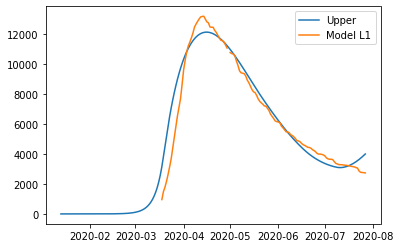

{'home': 0.9809351167043423, 'leisure': 0.9249298111859312, 'other': 0.8160290344625409, 'school': 0.9115559057512673, 'transport': 0.9016349946902066, 'work': 0.8240820357628846}
{'home': 0.9809351167043423, 'leisure': 0.11404631581589293, 'other': 0.06354317208526983, 'school': 0, 'transport': 0.11458264878445891, 'work': 0.27359996722634233}
{'home': 0.9809351167043423, 'leisure': 0.11404631581589293, 'other': 0.06354317208526983, 'school': 0, 'transport': 0.11458264878445891, 'work': 0.27359996722634233}
{'home': 0.9809351167043423, 'leisure': 0.13718698840598806, 'other': 0.15416405655046206, 'school': 0.3008134488979182, 'transport': 0.19939288923742438, 'work': 0.4845641694195292}
{'home': 0.9809351167043423, 'leisure': 0.264008117325797, 'other': 0.22612693859111377, 'school': 0.6107424568533492, 'transport': 0.26463954073017154, 'work': 0.5245909397054823}
{'home': 0.9809351167043423, 'leisure': 0.4422970256735069, 'other': 0.35841712732988357, 'school': 0.6107424568533492, 't

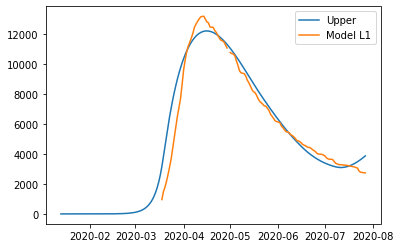

{'home': 0.9883868993473861, 'leisure': 0.9249519892209902, 'other': 0.8, 'school': 0.9146372713823376, 'transport': 0.8988094954579368, 'work': 0.8368912987589623}
{'home': 0.9883868993473861, 'leisure': 0.11321062722768874, 'other': 0.06237358747594022, 'school': 0, 'transport': 0.11354169918546884, 'work': 0.28052874300635}
{'home': 0.9883868993473861, 'leisure': 0.11321062722768874, 'other': 0.06237358747594022, 'school': 0, 'transport': 0.11354169918546884, 'work': 0.28052874300635}
{'home': 0.9883868993473861, 'leisure': 0.1361262850316982, 'other': 0.15121214263727015, 'school': 0.3018302995561714, 'transport': 0.19759768403862393, 'work': 0.5024749434171081}
{'home': 0.9883868993473861, 'leisure': 0.26198884530821387, 'other': 0.221028579679866, 'school': 0.6128069718261663, 'transport': 0.26220419344172047, 'work': 0.5412841794574456}
{'home': 0.9883868993473861, 'leisure': 0.43867989568982085, 'other': 0.34854495616094605, 'school': 0.6128069718261663, 'transport': 0.43475661

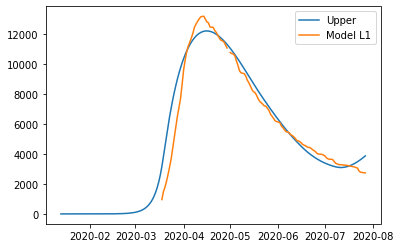

{'home': 0.9883868993473861, 'leisure': 0.9249519892209902, 'other': 0.8, 'school': 0.9146372713823376, 'transport': 0.8988094954579368, 'work': 0.8368912987589623}
{'home': 0.9883868993473861, 'leisure': 0.11321062722768874, 'other': 0.06237358747594022, 'school': 0, 'transport': 0.11354169918546884, 'work': 0.28052874300635}
{'home': 0.9883868993473861, 'leisure': 0.11321062722768874, 'other': 0.06237358747594022, 'school': 0, 'transport': 0.11354169918546884, 'work': 0.28052874300635}
{'home': 0.9883868993473861, 'leisure': 0.1361262850316982, 'other': 0.15121214263727015, 'school': 0.3018302995561714, 'transport': 0.19759768403862393, 'work': 0.5024749434171081}
{'home': 0.9883868993473861, 'leisure': 0.26198884530821387, 'other': 0.221028579679866, 'school': 0.6128069718261663, 'transport': 0.26220419344172047, 'work': 0.5412841794574456}
{'home': 0.9883868993473861, 'leisure': 0.43867989568982085, 'other': 0.34854495616094605, 'school': 0.6128069718261663, 'transport': 0.43475661

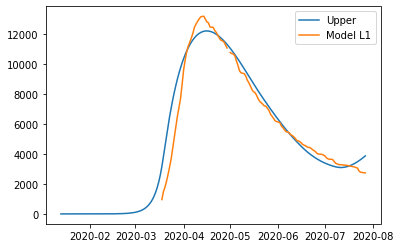

{'home': 0.9883868993473861, 'leisure': 0.9249519892209902, 'other': 0.8, 'school': 0.9146372713823376, 'transport': 0.8988094954579368, 'work': 0.8368912987589623}
{'home': 0.9883868993473861, 'leisure': 0.11321062722768874, 'other': 0.06237358747594022, 'school': 0, 'transport': 0.11354169918546884, 'work': 0.28052874300635}
{'home': 0.9883868993473861, 'leisure': 0.11321062722768874, 'other': 0.06237358747594022, 'school': 0, 'transport': 0.11354169918546884, 'work': 0.28052874300635}
{'home': 0.9883868993473861, 'leisure': 0.1361262850316982, 'other': 0.15121214263727015, 'school': 0.3018302995561714, 'transport': 0.19759768403862393, 'work': 0.5024749434171081}
{'home': 0.9883868993473861, 'leisure': 0.26198884530821387, 'other': 0.221028579679866, 'school': 0.6128069718261663, 'transport': 0.26220419344172047, 'work': 0.5412841794574456}
{'home': 0.9883868993473861, 'leisure': 0.43867989568982085, 'other': 0.34854495616094605, 'school': 0.6128069718261663, 'transport': 0.43475661

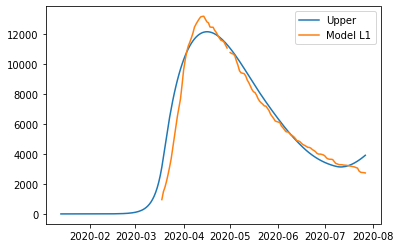

{'home': 0.9891382992684634, 'leisure': 0.9246100275652264, 'other': 0.8, 'school': 0.9142448884116784, 'transport': 0.8985940591211878, 'work': 0.8361230147812}
{'home': 0.9891382992684634, 'leisure': 0.11310716744475452, 'other': 0.062353698200776755, 'school': 0, 'transport': 0.11346368823375018, 'work': 0.28028696123030056}
{'home': 0.9891382992684634, 'leisure': 0.11310716744475452, 'other': 0.062353698200776755, 'school': 0, 'transport': 0.11346368823375018, 'work': 0.28028696123030056}
{'home': 0.9891382992684634, 'leisure': 0.13599525560040387, 'other': 0.1511638549949228, 'school': 0.3017008131758539, 'transport': 0.19746230348391275, 'work': 0.5024000812715134}
{'home': 0.9891382992684634, 'leisure': 0.26174174470564526, 'other': 0.2209261427388085, 'school': 0.6125440752358245, 'transport': 0.26202210095925627, 'work': 0.5410759755231138}
{'home': 0.9891382992684634, 'leisure': 0.4382623579288842, 'other': 0.34832070629173817, 'school': 0.6125440752358245, 'transport': 0.434

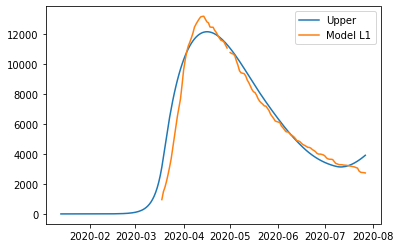

{'home': 0.9891382992684634, 'leisure': 0.9246100275652264, 'other': 0.8, 'school': 0.9142448884116784, 'transport': 0.8985940591211878, 'work': 0.8361230147812}
{'home': 0.9891382992684634, 'leisure': 0.11310716744475452, 'other': 0.062353698200776755, 'school': 0, 'transport': 0.11346368823375018, 'work': 0.28028696123030056}
{'home': 0.9891382992684634, 'leisure': 0.11310716744475452, 'other': 0.062353698200776755, 'school': 0, 'transport': 0.11346368823375018, 'work': 0.28028696123030056}
{'home': 0.9891382992684634, 'leisure': 0.13599525560040387, 'other': 0.1511638549949228, 'school': 0.3017008131758539, 'transport': 0.19746230348391275, 'work': 0.5024000812715134}
{'home': 0.9891382992684634, 'leisure': 0.26174174470564526, 'other': 0.2209261427388085, 'school': 0.6125440752358245, 'transport': 0.26202210095925627, 'work': 0.5410759755231138}
{'home': 0.9891382992684634, 'leisure': 0.4382623579288842, 'other': 0.34832070629173817, 'school': 0.6125440752358245, 'transport': 0.434

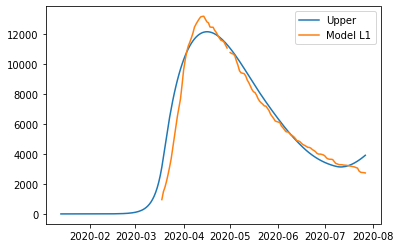

{'home': 0.9891382992684634, 'leisure': 0.9246100275652264, 'other': 0.8, 'school': 0.9142448884116784, 'transport': 0.8985940591211878, 'work': 0.8361230147812}
{'home': 0.9891382992684634, 'leisure': 0.11310716744475452, 'other': 0.062353698200776755, 'school': 0, 'transport': 0.11346368823375018, 'work': 0.28028696123030056}
{'home': 0.9891382992684634, 'leisure': 0.11310716744475452, 'other': 0.062353698200776755, 'school': 0, 'transport': 0.11346368823375018, 'work': 0.28028696123030056}
{'home': 0.9891382992684634, 'leisure': 0.13599525560040387, 'other': 0.1511638549949228, 'school': 0.3017008131758539, 'transport': 0.19746230348391275, 'work': 0.5024000812715134}
{'home': 0.9891382992684634, 'leisure': 0.26174174470564526, 'other': 0.2209261427388085, 'school': 0.6125440752358245, 'transport': 0.26202210095925627, 'work': 0.5410759755231138}
{'home': 0.9891382992684634, 'leisure': 0.4382623579288842, 'other': 0.34832070629173817, 'school': 0.6125440752358245, 'transport': 0.434

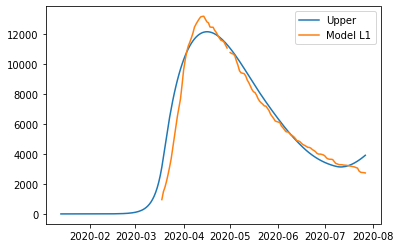

{'home': 0.9891382992684634, 'leisure': 0.9246100275652264, 'other': 0.8, 'school': 0.9142448884116784, 'transport': 0.8985940591211878, 'work': 0.8361230147812}
{'home': 0.9891382992684634, 'leisure': 0.11310716744475452, 'other': 0.062353698200776755, 'school': 0, 'transport': 0.11346368823375018, 'work': 0.28028696123030056}
{'home': 0.9891382992684634, 'leisure': 0.11310716744475452, 'other': 0.062353698200776755, 'school': 0, 'transport': 0.11346368823375018, 'work': 0.28028696123030056}
{'home': 0.9891382992684634, 'leisure': 0.13599525560040387, 'other': 0.1511638549949228, 'school': 0.3017008131758539, 'transport': 0.19746230348391275, 'work': 0.5024000812715134}
{'home': 0.9891382992684634, 'leisure': 0.26174174470564526, 'other': 0.2209261427388085, 'school': 0.6125440752358245, 'transport': 0.26202210095925627, 'work': 0.5410759755231138}
{'home': 0.9891382992684634, 'leisure': 0.4382623579288842, 'other': 0.34832070629173817, 'school': 0.6125440752358245, 'transport': 0.434

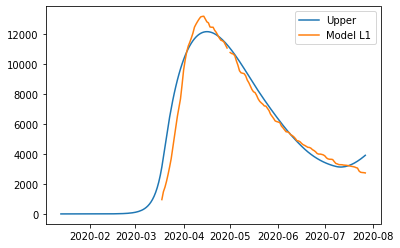

{'home': 0.9887935765599545, 'leisure': 0.9244825183698032, 'other': 0.8, 'school': 0.9142862226158296, 'transport': 0.8986124615188451, 'work': 0.8361341794332159}
{'home': 0.9887935765599545, 'leisure': 0.1131452862416769, 'other': 0.06239941464362227, 'school': 0, 'transport': 0.11351430773245046, 'work': 0.2805579590261912}
{'home': 0.9887935765599545, 'leisure': 0.1131452862416769, 'other': 0.06239941464362227, 'school': 0, 'transport': 0.11351430773245046, 'work': 0.2805579590261912}
{'home': 0.9887935765599545, 'leisure': 0.13604451714652127, 'other': 0.15126754235596201, 'school': 0.3017144534632238, 'transport': 0.1975508303077207, 'work': 0.5026462078160118}
{'home': 0.9887935765599545, 'leisure': 0.2618327974652151, 'other': 0.22107065090356925, 'school': 0.6125717691526059, 'transport': 0.26213926068464644, 'work': 0.5413372258506943}
{'home': 0.9887935765599545, 'leisure': 0.43840565155012085, 'other': 0.34851552511045886, 'school': 0.6125717691526059, 'transport': 0.43464

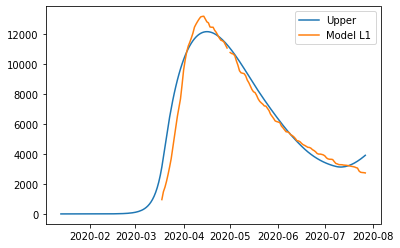

{'home': 0.9887935765599545, 'leisure': 0.9244825183698032, 'other': 0.8, 'school': 0.9142862226158296, 'transport': 0.8986124615188451, 'work': 0.8361341794332159}
{'home': 0.9887935765599545, 'leisure': 0.1131452862416769, 'other': 0.06239941464362227, 'school': 0, 'transport': 0.11351430773245046, 'work': 0.2805579590261912}
{'home': 0.9887935765599545, 'leisure': 0.1131452862416769, 'other': 0.06239941464362227, 'school': 0, 'transport': 0.11351430773245046, 'work': 0.2805579590261912}
{'home': 0.9887935765599545, 'leisure': 0.13604451714652127, 'other': 0.15126754235596201, 'school': 0.3017144534632238, 'transport': 0.1975508303077207, 'work': 0.5026462078160118}
{'home': 0.9887935765599545, 'leisure': 0.2618327974652151, 'other': 0.22107065090356925, 'school': 0.6125717691526059, 'transport': 0.26213926068464644, 'work': 0.5413372258506943}
{'home': 0.9887935765599545, 'leisure': 0.43840565155012085, 'other': 0.34851552511045886, 'school': 0.6125717691526059, 'transport': 0.43464

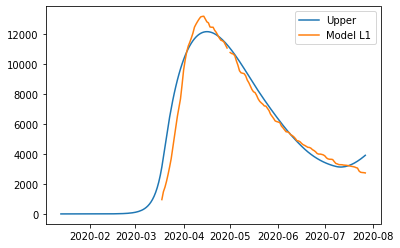

{'home': 0.9887935765599545, 'leisure': 0.9244825183698032, 'other': 0.8, 'school': 0.9142862226158296, 'transport': 0.8986124615188451, 'work': 0.8361341794332159}
{'home': 0.9887935765599545, 'leisure': 0.1131452862416769, 'other': 0.06239941464362227, 'school': 0, 'transport': 0.11351430773245046, 'work': 0.2805579590261912}
{'home': 0.9887935765599545, 'leisure': 0.1131452862416769, 'other': 0.06239941464362227, 'school': 0, 'transport': 0.11351430773245046, 'work': 0.2805579590261912}
{'home': 0.9887935765599545, 'leisure': 0.13604451714652127, 'other': 0.15126754235596201, 'school': 0.3017144534632238, 'transport': 0.1975508303077207, 'work': 0.5026462078160118}
{'home': 0.9887935765599545, 'leisure': 0.2618327974652151, 'other': 0.22107065090356925, 'school': 0.6125717691526059, 'transport': 0.26213926068464644, 'work': 0.5413372258506943}
{'home': 0.9887935765599545, 'leisure': 0.43840565155012085, 'other': 0.34851552511045886, 'school': 0.6125717691526059, 'transport': 0.43464

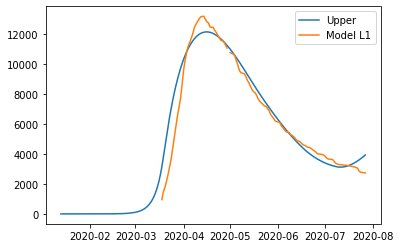

{'home': 0.9874694245187626, 'leisure': 0.9233517156857611, 'other': 0.8, 'school': 0.9141638036953192, 'transport': 0.8984239061565683, 'work': 0.8354526730106677}
{'home': 0.9874694245187626, 'leisure': 0.11327273536117978, 'other': 0.06268410151661406, 'school': 0, 'transport': 0.11373782741771418, 'work': 0.2822312232630423}
{'home': 0.9874694245187626, 'leisure': 0.11327273536117978, 'other': 0.06268410151661406, 'school': 0, 'transport': 0.11373782741771418, 'work': 0.2822312232630423}
{'home': 0.9874694245187626, 'leisure': 0.13621027844232397, 'other': 0.15190768689798503, 'school': 0.30167405521945534, 'transport': 0.19794357935370996, 'work': 0.5046043752024251}
{'home': 0.9874694245187626, 'leisure': 0.2621343638972923, 'other': 0.2218997481391094, 'school': 0.6124897484758639, 'transport': 0.26265388320432986, 'work': 0.5431930326549175}
{'home': 0.9874694245187626, 'leisure': 0.43883952314153857, 'other': 0.349479193630809, 'school': 0.6124897484758639, 'transport': 0.4354

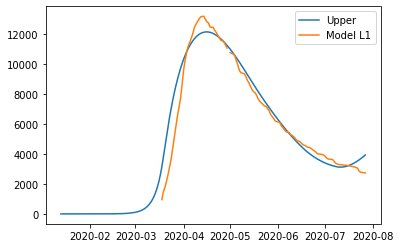

{'home': 0.9874694245187626, 'leisure': 0.9233517156857611, 'other': 0.8, 'school': 0.9141638036953192, 'transport': 0.8984239061565683, 'work': 0.8354526730106677}
{'home': 0.9874694245187626, 'leisure': 0.11327273536117978, 'other': 0.06268410151661406, 'school': 0, 'transport': 0.11373782741771418, 'work': 0.2822312232630423}
{'home': 0.9874694245187626, 'leisure': 0.11327273536117978, 'other': 0.06268410151661406, 'school': 0, 'transport': 0.11373782741771418, 'work': 0.2822312232630423}
{'home': 0.9874694245187626, 'leisure': 0.13621027844232397, 'other': 0.15190768689798503, 'school': 0.30167405521945534, 'transport': 0.19794357935370996, 'work': 0.5046043752024251}
{'home': 0.9874694245187626, 'leisure': 0.2621343638972923, 'other': 0.2218997481391094, 'school': 0.6124897484758639, 'transport': 0.26265388320432986, 'work': 0.5431930326549175}
{'home': 0.9874694245187626, 'leisure': 0.43883952314153857, 'other': 0.349479193630809, 'school': 0.6124897484758639, 'transport': 0.4354

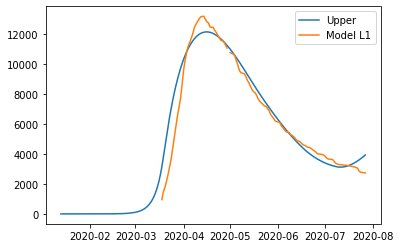

{'home': 0.9874694245187626, 'leisure': 0.9233517156857611, 'other': 0.8, 'school': 0.9141638036953192, 'transport': 0.8984239061565683, 'work': 0.8354526730106677}
{'home': 0.9874694245187626, 'leisure': 0.11327273536117978, 'other': 0.06268410151661406, 'school': 0, 'transport': 0.11373782741771418, 'work': 0.2822312232630423}
{'home': 0.9874694245187626, 'leisure': 0.11327273536117978, 'other': 0.06268410151661406, 'school': 0, 'transport': 0.11373782741771418, 'work': 0.2822312232630423}
{'home': 0.9874694245187626, 'leisure': 0.13621027844232397, 'other': 0.15190768689798503, 'school': 0.30167405521945534, 'transport': 0.19794357935370996, 'work': 0.5046043752024251}
{'home': 0.9874694245187626, 'leisure': 0.2621343638972923, 'other': 0.2218997481391094, 'school': 0.6124897484758639, 'transport': 0.26265388320432986, 'work': 0.5431930326549175}
{'home': 0.9874694245187626, 'leisure': 0.43883952314153857, 'other': 0.349479193630809, 'school': 0.6124897484758639, 'transport': 0.4354

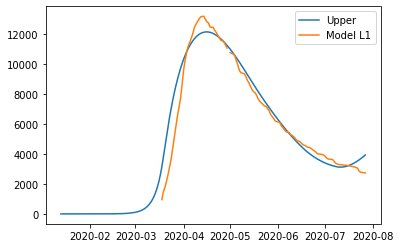

{'home': 0.9874694245187626, 'leisure': 0.9233517156857611, 'other': 0.8, 'school': 0.9141638036953192, 'transport': 0.8984239061565683, 'work': 0.8354526730106677}
{'home': 0.9874694245187626, 'leisure': 0.11327273536117978, 'other': 0.06268410151661406, 'school': 0, 'transport': 0.11373782741771418, 'work': 0.2822312232630423}
{'home': 0.9874694245187626, 'leisure': 0.11327273536117978, 'other': 0.06268410151661406, 'school': 0, 'transport': 0.11373782741771418, 'work': 0.2822312232630423}
{'home': 0.9874694245187626, 'leisure': 0.13621027844232397, 'other': 0.15190768689798503, 'school': 0.30167405521945534, 'transport': 0.19794357935370996, 'work': 0.5046043752024251}
{'home': 0.9874694245187626, 'leisure': 0.2621343638972923, 'other': 0.2218997481391094, 'school': 0.6124897484758639, 'transport': 0.26265388320432986, 'work': 0.5431930326549175}
{'home': 0.9874694245187626, 'leisure': 0.43883952314153857, 'other': 0.349479193630809, 'school': 0.6124897484758639, 'transport': 0.4354

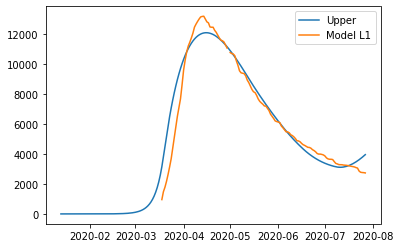

{'home': 0.9863559372136648, 'leisure': 0.9217742563475083, 'other': 0.8, 'school': 0.9137896803204452, 'transport': 0.897826984065496, 'work': 0.8338693520897362}
{'home': 0.9863559372136648, 'leisure': 0.11337720375457695, 'other': 0.06310129309103263, 'school': 0, 'transport': 0.11395387430125832, 'work': 0.28482621457684393}
{'home': 0.9863559372136648, 'leisure': 0.11337720375457695, 'other': 0.06310129309103263, 'school': 0, 'transport': 0.11395387430125832, 'work': 0.28482621457684393}
{'home': 0.9863559372136648, 'leisure': 0.13634184840840755, 'other': 0.15283906478705603, 'school': 0.3015505945057469, 'transport': 0.19832650067424004, 'work': 0.5083333870709001}
{'home': 0.9863559372136648, 'leisure': 0.26237060960804565, 'other': 0.22301923640138052, 'school': 0.6122390858146983, 'transport': 0.2631461478230853, 'work': 0.5465259100190347}
{'home': 0.9863559372136648, 'leisure': 0.43911266070815197, 'other': 0.35055388351307337, 'school': 0.6122390858146983, 'transport': 0.4

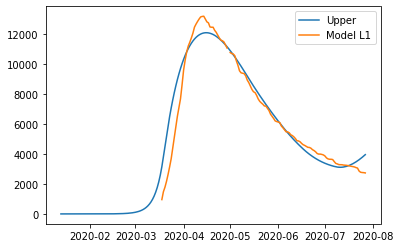

{'home': 0.9863559372136648, 'leisure': 0.9217742563475083, 'other': 0.8, 'school': 0.9137896803204452, 'transport': 0.897826984065496, 'work': 0.8338693520897362}
{'home': 0.9863559372136648, 'leisure': 0.11337720375457695, 'other': 0.06310129309103263, 'school': 0, 'transport': 0.11395387430125832, 'work': 0.28482621457684393}
{'home': 0.9863559372136648, 'leisure': 0.11337720375457695, 'other': 0.06310129309103263, 'school': 0, 'transport': 0.11395387430125832, 'work': 0.28482621457684393}
{'home': 0.9863559372136648, 'leisure': 0.13634184840840755, 'other': 0.15283906478705603, 'school': 0.3015505945057469, 'transport': 0.19832650067424004, 'work': 0.5083333870709001}
{'home': 0.9863559372136648, 'leisure': 0.26237060960804565, 'other': 0.22301923640138052, 'school': 0.6122390858146983, 'transport': 0.2631461478230853, 'work': 0.5465259100190347}
{'home': 0.9863559372136648, 'leisure': 0.43911266070815197, 'other': 0.35055388351307337, 'school': 0.6122390858146983, 'transport': 0.4

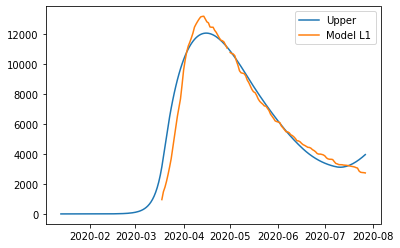

{'home': 0.986647175980493, 'leisure': 0.9213460763225141, 'other': 0.8, 'school': 0.9136190466595253, 'transport': 0.8975142976803004, 'work': 0.8335081661333249}
{'home': 0.986647175980493, 'leisure': 0.1133281374609482, 'other': 0.06317913488610126, 'school': 0, 'transport': 0.11392715203789783, 'work': 0.2854513321228461}
{'home': 0.986647175980493, 'leisure': 0.1133281374609482, 'other': 0.06317913488610126, 'school': 0, 'transport': 0.11392715203789783, 'work': 0.2854513321228461}
{'home': 0.986647175980493, 'leisure': 0.13627846778038216, 'other': 0.1530080891949414, 'school': 0.3014942853976434, 'transport': 0.1982821161713629, 'work': 0.5096255889532332}
{'home': 0.986647175980493, 'leisure': 0.2622489015028173, 'other': 0.22317534075143258, 'school': 0.612124761261882, 'transport': 0.2630810127511411, 'work': 0.5476237944137148}
{'home': 0.986647175980493, 'leisure': 0.4388747992610334, 'other': 0.3505687709546063, 'school': 0.612124761261882, 'transport': 0.436139264009743, 

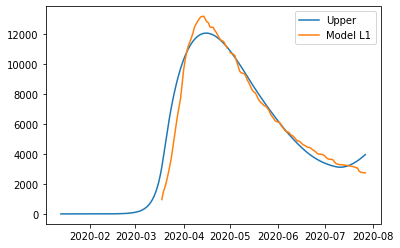

{'home': 0.986647175980493, 'leisure': 0.9213460763225141, 'other': 0.8, 'school': 0.9136190466595253, 'transport': 0.8975142976803004, 'work': 0.8335081661333249}
{'home': 0.986647175980493, 'leisure': 0.1133281374609482, 'other': 0.06317913488610126, 'school': 0, 'transport': 0.11392715203789783, 'work': 0.2854513321228461}
{'home': 0.986647175980493, 'leisure': 0.1133281374609482, 'other': 0.06317913488610126, 'school': 0, 'transport': 0.11392715203789783, 'work': 0.2854513321228461}
{'home': 0.986647175980493, 'leisure': 0.13627846778038216, 'other': 0.1530080891949414, 'school': 0.3014942853976434, 'transport': 0.1982821161713629, 'work': 0.5096255889532332}
{'home': 0.986647175980493, 'leisure': 0.2622489015028173, 'other': 0.22317534075143258, 'school': 0.612124761261882, 'transport': 0.2630810127511411, 'work': 0.5476237944137148}
{'home': 0.986647175980493, 'leisure': 0.4388747992610334, 'other': 0.3505687709546063, 'school': 0.612124761261882, 'transport': 0.436139264009743, 

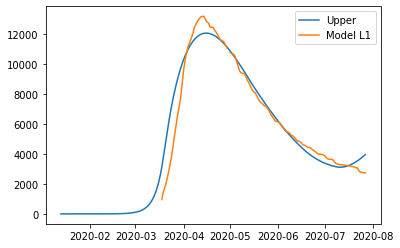

{'home': 0.9866471859804931, 'leisure': 0.9213460763225141, 'other': 0.8, 'school': 0.9136190466595253, 'transport': 0.8975142976803004, 'work': 0.8335081661333249}
{'home': 0.9866471859804931, 'leisure': 0.1133281374609482, 'other': 0.06317913488610126, 'school': 0, 'transport': 0.11392715203789783, 'work': 0.2854513321228461}
{'home': 0.9866471859804931, 'leisure': 0.1133281374609482, 'other': 0.06317913488610126, 'school': 0, 'transport': 0.11392715203789783, 'work': 0.2854513321228461}
{'home': 0.9866471859804931, 'leisure': 0.13627846778038216, 'other': 0.1530080891949414, 'school': 0.3014942853976434, 'transport': 0.1982821161713629, 'work': 0.5096255889532332}
{'home': 0.9866471859804931, 'leisure': 0.2622489015028173, 'other': 0.22317534075143258, 'school': 0.612124761261882, 'transport': 0.2630810127511411, 'work': 0.5476237944137148}
{'home': 0.9866471859804931, 'leisure': 0.4388747992610334, 'other': 0.3505687709546063, 'school': 0.612124761261882, 'transport': 0.43613926400

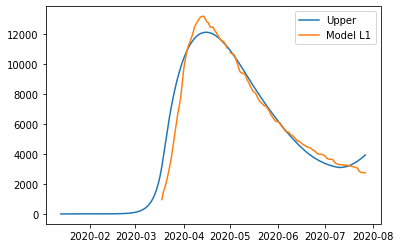

{'home': 0.986868445111003, 'leisure': 0.9210948695568972, 'other': 0.8, 'school': 0.9137383599288329, 'transport': 0.8973008844655886, 'work': 0.8340455335720572}
{'home': 0.986868445111003, 'leisure': 0.11329619312990695, 'other': 0.06323673428116007, 'school': 0, 'transport': 0.11390501518334929, 'work': 0.28616157066154607}
{'home': 0.986868445111003, 'leisure': 0.11329619312990695, 'other': 0.06323673428116007, 'school': 0, 'transport': 0.11390501518334929, 'work': 0.28616157066154607}
{'home': 0.986868445111003, 'leisure': 0.13623884883886242, 'other': 0.15313161499356534, 'school': 0.3015336587765149, 'transport': 0.19824525672171422, 'work': 0.5110424728572543}
{'home': 0.986868445111003, 'leisure': 0.2621709045557581, 'other': 0.22328960510696147, 'school': 0.6122047011523181, 'transport': 0.26302769070544424, 'work': 0.5489382241405557}
{'home': 0.986868445111003, 'leisure': 0.43871702817504343, 'other': 0.35057654987372805, 'school': 0.6122047011523181, 'transport': 0.436042

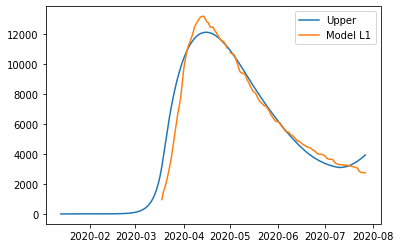

{'home': 0.986868445111003, 'leisure': 0.9210948695568972, 'other': 0.8, 'school': 0.9137383599288329, 'transport': 0.8973008844655886, 'work': 0.8340455335720572}
{'home': 0.986868445111003, 'leisure': 0.11329619312990695, 'other': 0.06323673428116007, 'school': 0, 'transport': 0.11390501518334929, 'work': 0.28616157066154607}
{'home': 0.986868445111003, 'leisure': 0.11329619312990695, 'other': 0.06323673428116007, 'school': 0, 'transport': 0.11390501518334929, 'work': 0.28616157066154607}
{'home': 0.986868445111003, 'leisure': 0.13623884883886242, 'other': 0.15313161499356534, 'school': 0.3015336587765149, 'transport': 0.19824525672171422, 'work': 0.5110424728572543}
{'home': 0.986868445111003, 'leisure': 0.2621709045557581, 'other': 0.22328960510696147, 'school': 0.6122047011523181, 'transport': 0.26302769070544424, 'work': 0.5489382241405557}
{'home': 0.986868445111003, 'leisure': 0.43871702817504343, 'other': 0.35057654987372805, 'school': 0.6122047011523181, 'transport': 0.436042

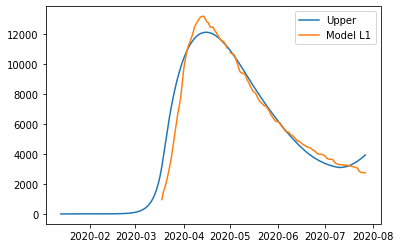

{'home': 0.986868445111003, 'leisure': 0.9210948695568972, 'other': 0.8, 'school': 0.9137383599288329, 'transport': 0.8973008844655886, 'work': 0.8340455335720572}
{'home': 0.986868445111003, 'leisure': 0.11329619312990695, 'other': 0.06323673428116007, 'school': 0, 'transport': 0.11390501518334929, 'work': 0.28616157066154607}
{'home': 0.986868445111003, 'leisure': 0.11329619312990695, 'other': 0.06323673428116007, 'school': 0, 'transport': 0.11390501518334929, 'work': 0.28616157066154607}
{'home': 0.986868445111003, 'leisure': 0.13623884883886242, 'other': 0.15313161499356534, 'school': 0.3015336587765149, 'transport': 0.19824525672171422, 'work': 0.5110424728572543}
{'home': 0.986868445111003, 'leisure': 0.2621709045557581, 'other': 0.22328960510696147, 'school': 0.6122047011523181, 'transport': 0.26302769070544424, 'work': 0.5489382241405557}
{'home': 0.986868445111003, 'leisure': 0.43871702817504343, 'other': 0.35057654987372805, 'school': 0.6122047011523181, 'transport': 0.436042

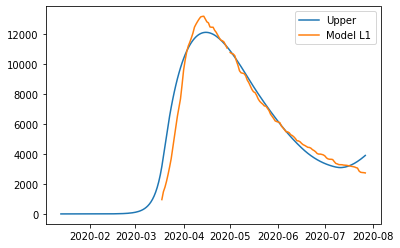

{'home': 0.9877388724172927, 'leisure': 0.9203835376563806, 'other': 0.8, 'school': 0.9135022351186509, 'transport': 0.8965877180470541, 'work': 0.8335830280965568}
{'home': 0.9877388724172927, 'leisure': 0.1131862565241082, 'other': 0.06339625355608812, 'school': 0, 'transport': 0.11381727352959126, 'work': 0.28763833751462176}
{'home': 0.9877388724172927, 'leisure': 0.1131862565241082, 'other': 0.06339625355608812, 'school': 0, 'transport': 0.11381727352959126, 'work': 0.28763833751462176}
{'home': 0.9877388724172927, 'leisure': 0.13609468482138493, 'other': 0.1534753325322208, 'school': 0.30145573758915484, 'transport': 0.19809738629063317, 'work': 0.5142410682111662}
{'home': 0.9877388724172927, 'leisure': 0.26189588185037305, 'other': 0.2235791481001151, 'school': 0.6120464975294961, 'transport': 0.2628168368879415, 'work': 0.5516826702816217}
{'home': 0.9877388724172927, 'leisure': 0.43818021086597747, 'other': 0.35050022115401525, 'school': 0.6120464975294961, 'transport': 0.435

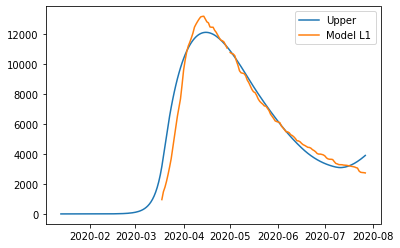

{'home': 0.9877388724172927, 'leisure': 0.9203835376563806, 'other': 0.8, 'school': 0.9135022351186509, 'transport': 0.8965877180470541, 'work': 0.8335830280965568}
{'home': 0.9877388724172927, 'leisure': 0.1131862565241082, 'other': 0.06339625355608812, 'school': 0, 'transport': 0.11381727352959126, 'work': 0.28763833751462176}
{'home': 0.9877388724172927, 'leisure': 0.1131862565241082, 'other': 0.06339625355608812, 'school': 0, 'transport': 0.11381727352959126, 'work': 0.28763833751462176}
{'home': 0.9877388724172927, 'leisure': 0.13609468482138493, 'other': 0.1534753325322208, 'school': 0.30145573758915484, 'transport': 0.19809738629063317, 'work': 0.5142410682111662}
{'home': 0.9877388724172927, 'leisure': 0.26189588185037305, 'other': 0.2235791481001151, 'school': 0.6120464975294961, 'transport': 0.2628168368879415, 'work': 0.5516826702816217}
{'home': 0.9877388724172927, 'leisure': 0.43818021086597747, 'other': 0.35050022115401525, 'school': 0.6120464975294961, 'transport': 0.435

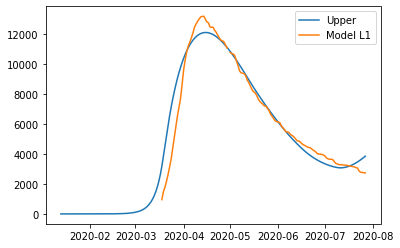

{'home': 0.9893275991352332, 'leisure': 0.9190851960401332, 'other': 0.8, 'school': 0.913071253930453, 'transport': 0.89528602802047, 'work': 0.8327388509885875}
{'home': 0.9893275991352332, 'leisure': 0.11298565212205505, 'other': 0.06368772818533168, 'school': 0, 'transport': 0.11365711412115762, 'work': 0.29035598006807606}
{'home': 0.9893275991352332, 'leisure': 0.11298565212205505, 'other': 0.06368772818533168, 'school': 0, 'transport': 0.11365711412115762, 'work': 0.29035598006807606}
{'home': 0.9893275991352332, 'leisure': 0.13583164794374983, 'other': 0.15410337539531227, 'school': 0.3013135137970495, 'transport': 0.19782745092427073, 'work': 0.5201265126599202}
{'home': 0.9893275991352332, 'leisure': 0.26139408028450606, 'other': 0.22410820289062605, 'school': 0.6117577401334036, 'transport': 0.2624319881124318, 'work': 0.5567333078368869}
{'home': 0.9893275991352332, 'leisure': 0.43720088111125255, 'other': 0.3503607528340334, 'school': 0.6117577401334036, 'transport': 0.4349

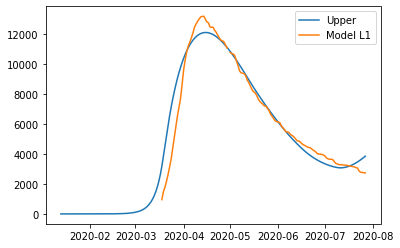

{'home': 0.9893275991352332, 'leisure': 0.9190851960401332, 'other': 0.8, 'school': 0.913071253930453, 'transport': 0.89528602802047, 'work': 0.8327388509885875}
{'home': 0.9893275991352332, 'leisure': 0.11298565212205505, 'other': 0.06368772818533168, 'school': 0, 'transport': 0.11365711412115762, 'work': 0.29035598006807606}
{'home': 0.9893275991352332, 'leisure': 0.11298565212205505, 'other': 0.06368772818533168, 'school': 0, 'transport': 0.11365711412115762, 'work': 0.29035598006807606}
{'home': 0.9893275991352332, 'leisure': 0.13583164794374983, 'other': 0.15410337539531227, 'school': 0.3013135137970495, 'transport': 0.19782745092427073, 'work': 0.5201265126599202}
{'home': 0.9893275991352332, 'leisure': 0.26139408028450606, 'other': 0.22410820289062605, 'school': 0.6117577401334036, 'transport': 0.2624319881124318, 'work': 0.5567333078368869}
{'home': 0.9893275991352332, 'leisure': 0.43720088111125255, 'other': 0.3503607528340334, 'school': 0.6117577401334036, 'transport': 0.4349

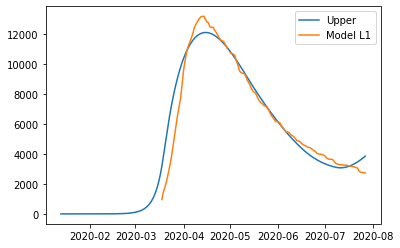

{'home': 0.9893276091352332, 'leisure': 0.9190851960401332, 'other': 0.8, 'school': 0.913071253930453, 'transport': 0.89528602802047, 'work': 0.8327388509885875}
{'home': 0.9893276091352332, 'leisure': 0.11298565212205505, 'other': 0.06368772818533168, 'school': 0, 'transport': 0.11365711412115762, 'work': 0.29035598006807606}
{'home': 0.9893276091352332, 'leisure': 0.11298565212205505, 'other': 0.06368772818533168, 'school': 0, 'transport': 0.11365711412115762, 'work': 0.29035598006807606}
{'home': 0.9893276091352332, 'leisure': 0.13583164794374983, 'other': 0.15410337539531227, 'school': 0.3013135137970495, 'transport': 0.19782745092427073, 'work': 0.5201265126599202}
{'home': 0.9893276091352332, 'leisure': 0.26139408028450606, 'other': 0.22410820289062605, 'school': 0.6117577401334036, 'transport': 0.2624319881124318, 'work': 0.5567333078368869}
{'home': 0.9893276091352332, 'leisure': 0.43720088111125255, 'other': 0.3503607528340334, 'school': 0.6117577401334036, 'transport': 0.4349

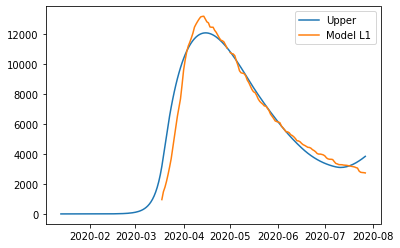

{'home': 0.9921697393618668, 'leisure': 0.916129050724496, 'other': 0.8, 'school': 0.9121252396640178, 'transport': 0.8931268913831947, 'work': 0.8315885614616793}
{'home': 0.9921697393618668, 'leisure': 0.11255695363009947, 'other': 0.06414255727700834, 'school': 0, 'transport': 0.11338609508080204, 'work': 0.29463101799703223}
{'home': 0.9921697393618668, 'leisure': 0.11255695363009947, 'other': 0.06414255727700834, 'school': 0, 'transport': 0.11338609508080204, 'work': 0.29463101799703223}
{'home': 0.9921697393618668, 'leisure': 0.13528642930845652, 'other': 0.1550803115873933, 'school': 0.3010013290891259, 'transport': 0.19736944923986582, 'work': 0.5293876533863783}
{'home': 0.9921697393618668, 'leisure': 0.26034768312837264, 'other': 0.22493763611439627, 'school': 0.611123910574892, 'transport': 0.26178367039092215, 'work': 0.5647047457328017}
{'home': 0.9921697393618668, 'leisure': 0.4352310085070909, 'other': 0.3501594508092787, 'school': 0.611123910574892, 'transport': 0.43383

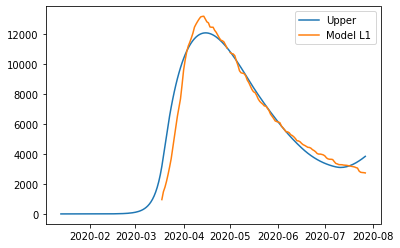

{'home': 0.9921697393618668, 'leisure': 0.916129050724496, 'other': 0.8, 'school': 0.9121252396640178, 'transport': 0.8931268913831947, 'work': 0.8315885614616793}
{'home': 0.9921697393618668, 'leisure': 0.11255695363009947, 'other': 0.06414255727700834, 'school': 0, 'transport': 0.11338609508080204, 'work': 0.29463101799703223}
{'home': 0.9921697393618668, 'leisure': 0.11255695363009947, 'other': 0.06414255727700834, 'school': 0, 'transport': 0.11338609508080204, 'work': 0.29463101799703223}
{'home': 0.9921697393618668, 'leisure': 0.13528642930845652, 'other': 0.1550803115873933, 'school': 0.3010013290891259, 'transport': 0.19736944923986582, 'work': 0.5293876533863783}
{'home': 0.9921697393618668, 'leisure': 0.26034768312837264, 'other': 0.22493763611439627, 'school': 0.611123910574892, 'transport': 0.26178367039092215, 'work': 0.5647047457328017}
{'home': 0.9921697393618668, 'leisure': 0.4352310085070909, 'other': 0.3501594508092787, 'school': 0.611123910574892, 'transport': 0.43383

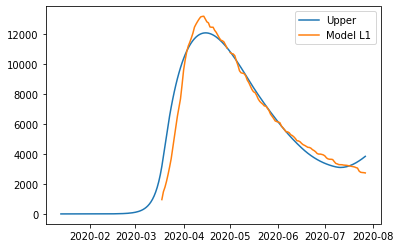

{'home': 0.9921697493618669, 'leisure': 0.916129050724496, 'other': 0.8, 'school': 0.9121252396640178, 'transport': 0.8931268913831947, 'work': 0.8315885614616793}
{'home': 0.9921697493618669, 'leisure': 0.11255695363009947, 'other': 0.06414255727700834, 'school': 0, 'transport': 0.11338609508080204, 'work': 0.29463101799703223}
{'home': 0.9921697493618669, 'leisure': 0.11255695363009947, 'other': 0.06414255727700834, 'school': 0, 'transport': 0.11338609508080204, 'work': 0.29463101799703223}
{'home': 0.9921697493618669, 'leisure': 0.13528642930845652, 'other': 0.1550803115873933, 'school': 0.3010013290891259, 'transport': 0.19736944923986582, 'work': 0.5293876533863783}
{'home': 0.9921697493618669, 'leisure': 0.26034768312837264, 'other': 0.22493763611439627, 'school': 0.611123910574892, 'transport': 0.26178367039092215, 'work': 0.5647047457328017}
{'home': 0.9921697493618669, 'leisure': 0.4352310085070909, 'other': 0.3501594508092787, 'school': 0.611123910574892, 'transport': 0.43383

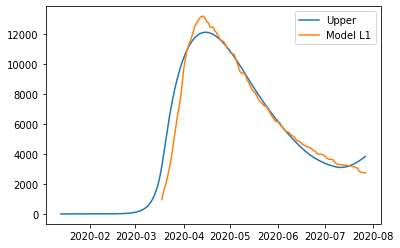

{'home': 0.9923047145547745, 'leisure': 0.916134138133452, 'other': 0.8, 'school': 0.9121311161087526, 'transport': 0.8931245659181327, 'work': 0.8316012373298011}
{'home': 0.9923047145547745, 'leisure': 0.11255749076026482, 'other': 0.06414350976338323, 'school': 0, 'transport': 0.11338582254736106, 'work': 0.29464570830356424}
{'home': 0.9923047145547745, 'leisure': 0.11255749076026482, 'other': 0.06414350976338323, 'school': 0, 'transport': 0.11338582254736106, 'work': 0.29464570830356424}
{'home': 0.9923047145547745, 'leisure': 0.13528702597099954, 'other': 0.15508233556083217, 'school': 0.30100326831588836, 'transport': 0.1973690007171856, 'work': 0.5294168241577331}
{'home': 0.9923047145547745, 'leisure': 0.2603488038078429, 'other': 0.22493939557745832, 'school': 0.6111278477928643, 'transport': 0.26178299449006714, 'work': 0.564731676179877}
{'home': 0.9923047145547745, 'leisure': 0.4352324245953153, 'other': 0.3501592208522237, 'school': 0.6111278477928643, 'transport': 0.4338

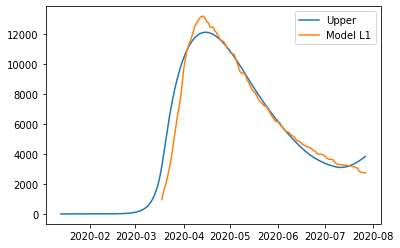

{'home': 0.9923047145547745, 'leisure': 0.916134138133452, 'other': 0.8, 'school': 0.9121311161087526, 'transport': 0.8931245659181327, 'work': 0.8316012373298011}
{'home': 0.9923047145547745, 'leisure': 0.11255749076026482, 'other': 0.06414350976338323, 'school': 0, 'transport': 0.11338582254736106, 'work': 0.29464570830356424}
{'home': 0.9923047145547745, 'leisure': 0.11255749076026482, 'other': 0.06414350976338323, 'school': 0, 'transport': 0.11338582254736106, 'work': 0.29464570830356424}
{'home': 0.9923047145547745, 'leisure': 0.13528702597099954, 'other': 0.15508233556083217, 'school': 0.30100326831588836, 'transport': 0.1973690007171856, 'work': 0.5294168241577331}
{'home': 0.9923047145547745, 'leisure': 0.2603488038078429, 'other': 0.22493939557745832, 'school': 0.6111278477928643, 'transport': 0.26178299449006714, 'work': 0.564731676179877}
{'home': 0.9923047145547745, 'leisure': 0.4352324245953153, 'other': 0.3501592208522237, 'school': 0.6111278477928643, 'transport': 0.4338

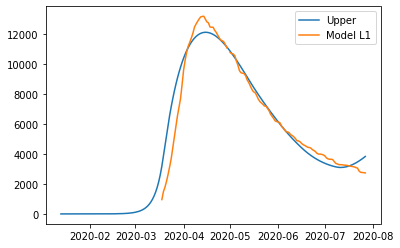

{'home': 0.9923047245547746, 'leisure': 0.916134138133452, 'other': 0.8, 'school': 0.9121311161087526, 'transport': 0.8931245659181327, 'work': 0.8316012373298011}
{'home': 0.9923047245547746, 'leisure': 0.11255749076026482, 'other': 0.06414350976338323, 'school': 0, 'transport': 0.11338582254736106, 'work': 0.29464570830356424}
{'home': 0.9923047245547746, 'leisure': 0.11255749076026482, 'other': 0.06414350976338323, 'school': 0, 'transport': 0.11338582254736106, 'work': 0.29464570830356424}
{'home': 0.9923047245547746, 'leisure': 0.13528702597099954, 'other': 0.15508233556083217, 'school': 0.30100326831588836, 'transport': 0.1973690007171856, 'work': 0.5294168241577331}
{'home': 0.9923047245547746, 'leisure': 0.2603488038078429, 'other': 0.22493939557745832, 'school': 0.6111278477928643, 'transport': 0.26178299449006714, 'work': 0.564731676179877}
{'home': 0.9923047245547746, 'leisure': 0.4352324245953153, 'other': 0.3501592208522237, 'school': 0.6111278477928643, 'transport': 0.4338

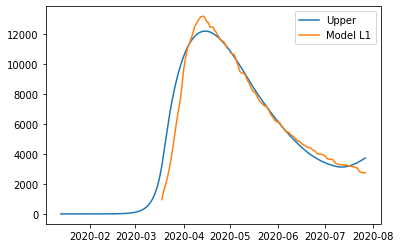

{'home': 1.0, 'leisure': 0.9082273183857305, 'other': 0.8, 'school': 0.9097558606044074, 'transport': 0.8872656502295452, 'work': 0.8287095271719932}
{'home': 1.0, 'leisure': 0.11145663862434561, 'other': 0.06543908718503853, 'school': 0, 'transport': 0.1126947475836871, 'work': 0.30713396064139015}
{'home': 1.0, 'leisure': 0.11145663862434561, 'other': 0.06543908718503853, 'school': 0, 'transport': 0.1126947475836871, 'work': 0.30713396064139015}
{'home': 1.0, 'leisure': 0.13388505443462487, 'other': 0.15787063533452372, 'school': 0.30021943399945444, 'transport': 0.19620387473428855, 'work': 0.5560912885963071}
{'home': 1.0, 'leisure': 0.25765555671379664, 'other': 0.22735771313954511, 'school': 0.609536426604953, 'transport': 0.26012613695277015, 'work': 0.5877850847801567}
{'home': 1.0, 'leisure': 0.4301220520203146, 'other': 0.3497815331244453, 'school': 0.609536426604953, 'transport': 0.4308794309863603, 'work': 0.6678985999796588}
{'home': 1.0, 'leisure': 0.44370819119790855, 'o

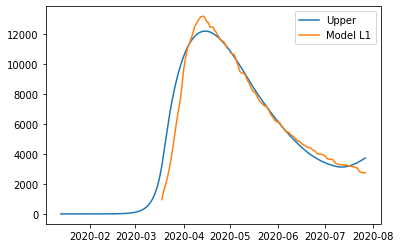

{'home': 1.0, 'leisure': 0.9082273183857305, 'other': 0.8, 'school': 0.9097558606044074, 'transport': 0.8872656502295452, 'work': 0.8287095271719932}
{'home': 1.0, 'leisure': 0.11145663862434561, 'other': 0.06543908718503853, 'school': 0, 'transport': 0.1126947475836871, 'work': 0.30713396064139015}
{'home': 1.0, 'leisure': 0.11145663862434561, 'other': 0.06543908718503853, 'school': 0, 'transport': 0.1126947475836871, 'work': 0.30713396064139015}
{'home': 1.0, 'leisure': 0.13388505443462487, 'other': 0.15787063533452372, 'school': 0.30021943399945444, 'transport': 0.19620387473428855, 'work': 0.5560912885963071}
{'home': 1.0, 'leisure': 0.25765555671379664, 'other': 0.22735771313954511, 'school': 0.609536426604953, 'transport': 0.26012613695277015, 'work': 0.5877850847801567}
{'home': 1.0, 'leisure': 0.4301220520203146, 'other': 0.3497815331244453, 'school': 0.609536426604953, 'transport': 0.4308794309863603, 'work': 0.6678985999796588}
{'home': 1.0, 'leisure': 0.44370819119790855, 'o

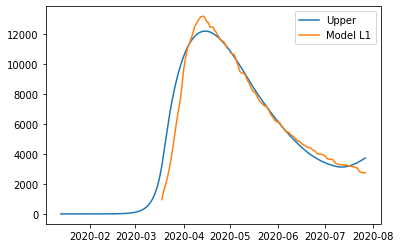

{'home': 1.0, 'leisure': 0.9082273183857305, 'other': 0.8, 'school': 0.9097558606044074, 'transport': 0.8872656502295452, 'work': 0.8287095271719932}
{'home': 1.0, 'leisure': 0.11145663862434561, 'other': 0.06543908718503853, 'school': 0, 'transport': 0.1126947475836871, 'work': 0.30713396064139015}
{'home': 1.0, 'leisure': 0.11145663862434561, 'other': 0.06543908718503853, 'school': 0, 'transport': 0.1126947475836871, 'work': 0.30713396064139015}
{'home': 1.0, 'leisure': 0.13388505443462487, 'other': 0.15787063533452372, 'school': 0.30021943399945444, 'transport': 0.19620387473428855, 'work': 0.5560912885963071}
{'home': 1.0, 'leisure': 0.25765555671379664, 'other': 0.22735771313954511, 'school': 0.609536426604953, 'transport': 0.26012613695277015, 'work': 0.5877850847801567}
{'home': 1.0, 'leisure': 0.4301220520203146, 'other': 0.3497815331244453, 'school': 0.609536426604953, 'transport': 0.4308794309863603, 'work': 0.6678985999796588}
{'home': 1.0, 'leisure': 0.44370819119790855, 'o

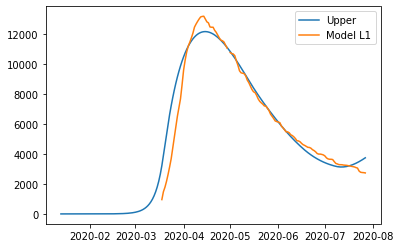

{'home': 1.0, 'leisure': 0.908098698620355, 'other': 0.8, 'school': 0.9096701176704008, 'transport': 0.8871619417793565, 'work': 0.8286754081278925}
{'home': 1.0, 'leisure': 0.11143386682244509, 'other': 0.06548466250032751, 'school': 0, 'transport': 0.1126835950673073, 'work': 0.30723947703959825}
{'home': 1.0, 'leisure': 0.11143386682244509, 'other': 0.06548466250032751, 'school': 0, 'transport': 0.1126835950673073, 'work': 0.30723947703959825}
{'home': 1.0, 'leisure': 0.13385496503310157, 'other': 0.1579687314740882, 'school': 0.3001911388312323, 'transport': 0.19618577996945447, 'work': 0.5563688295151513}
{'home': 1.0, 'leisure': 0.25759778948355094, 'other': 0.22744304198061546, 'school': 0.6094789788391686, 'transport': 0.26009825730817343, 'work': 0.5880263930265435}
{'home': 1.0, 'leisure': 0.4300042551624812, 'other': 0.34976916204391806, 'school': 0.6094789788391686, 'transport': 0.4308260916958737, 'work': 0.668048321634815}
{'home': 1.0, 'leisure': 0.44357298978594417, 'ot

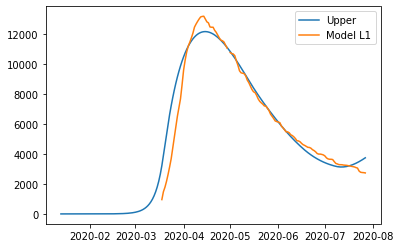

{'home': 1.0, 'leisure': 0.908098698620355, 'other': 0.8, 'school': 0.9096701176704008, 'transport': 0.8871619417793565, 'work': 0.8286754081278925}
{'home': 1.0, 'leisure': 0.11143386682244509, 'other': 0.06548466250032751, 'school': 0, 'transport': 0.1126835950673073, 'work': 0.30723947703959825}
{'home': 1.0, 'leisure': 0.11143386682244509, 'other': 0.06548466250032751, 'school': 0, 'transport': 0.1126835950673073, 'work': 0.30723947703959825}
{'home': 1.0, 'leisure': 0.13385496503310157, 'other': 0.1579687314740882, 'school': 0.3001911388312323, 'transport': 0.19618577996945447, 'work': 0.5563688295151513}
{'home': 1.0, 'leisure': 0.25759778948355094, 'other': 0.22744304198061546, 'school': 0.6094789788391686, 'transport': 0.26009825730817343, 'work': 0.5880263930265435}
{'home': 1.0, 'leisure': 0.4300042551624812, 'other': 0.34976916204391806, 'school': 0.6094789788391686, 'transport': 0.4308260916958737, 'work': 0.668048321634815}
{'home': 1.0, 'leisure': 0.44357298978594417, 'ot

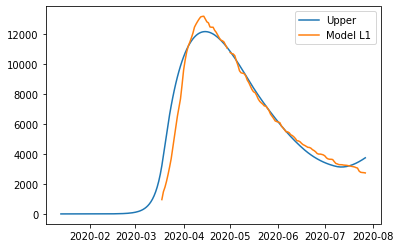

{'home': 1.00000001, 'leisure': 0.908098698620355, 'other': 0.8, 'school': 0.9096701176704008, 'transport': 0.8871619417793565, 'work': 0.8286754081278925}
{'home': 1.00000001, 'leisure': 0.11143386682244509, 'other': 0.06548466250032751, 'school': 0, 'transport': 0.1126835950673073, 'work': 0.30723947703959825}
{'home': 1.00000001, 'leisure': 0.11143386682244509, 'other': 0.06548466250032751, 'school': 0, 'transport': 0.1126835950673073, 'work': 0.30723947703959825}
{'home': 1.00000001, 'leisure': 0.13385496503310157, 'other': 0.1579687314740882, 'school': 0.3001911388312323, 'transport': 0.19618577996945447, 'work': 0.5563688295151513}
{'home': 1.00000001, 'leisure': 0.25759778948355094, 'other': 0.22744304198061546, 'school': 0.6094789788391686, 'transport': 0.26009825730817343, 'work': 0.5880263930265435}
{'home': 1.00000001, 'leisure': 0.4300042551624812, 'other': 0.34976916204391806, 'school': 0.6094789788391686, 'transport': 0.4308260916958737, 'work': 0.668048321634815}
{'home'

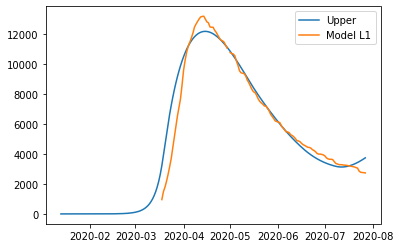

{'home': 1.0, 'leisure': 0.9081616473556787, 'other': 0.8, 'school': 0.9097120817436746, 'transport': 0.8872126984866379, 'work': 0.8286921065775462}
{'home': 1.0, 'leisure': 0.11144501157376385, 'other': 0.06546235609890787, 'school': 0, 'transport': 0.11268905336085494, 'work': 0.3071878341547489}
{'home': 1.0, 'leisure': 0.11144501157376385, 'other': 0.06546235609890787, 'school': 0, 'transport': 0.11268905336085494, 'work': 0.3071878341547489}
{'home': 1.0, 'leisure': 0.13386969104811497, 'other': 0.15792071925841905, 'school': 0.30020498697541265, 'transport': 0.196194636002161, 'work': 0.5562329927960765}
{'home': 1.0, 'leisure': 0.2576260612708795, 'other': 0.2274012785968732, 'school': 0.609507094768262, 'transport': 0.2601119021621152, 'work': 0.5879082895984392}
{'home': 1.0, 'leisure': 0.430061905661433, 'other': 0.3497752169507571, 'school': 0.609507094768262, 'transport': 0.4308521967787366, 'work': 0.6679750432654531}
{'home': 1.0, 'leisure': 0.44363915801558607, 'other':

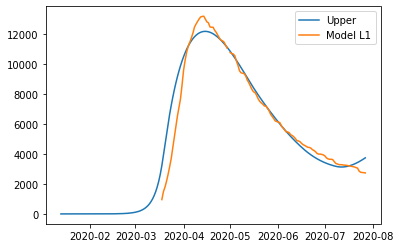

{'home': 1.0, 'leisure': 0.9081616473556787, 'other': 0.8, 'school': 0.9097120817436746, 'transport': 0.8872126984866379, 'work': 0.8286921065775462}
{'home': 1.0, 'leisure': 0.11144501157376385, 'other': 0.06546235609890787, 'school': 0, 'transport': 0.11268905336085494, 'work': 0.3071878341547489}
{'home': 1.0, 'leisure': 0.11144501157376385, 'other': 0.06546235609890787, 'school': 0, 'transport': 0.11268905336085494, 'work': 0.3071878341547489}
{'home': 1.0, 'leisure': 0.13386969104811497, 'other': 0.15792071925841905, 'school': 0.30020498697541265, 'transport': 0.196194636002161, 'work': 0.5562329927960765}
{'home': 1.0, 'leisure': 0.2576260612708795, 'other': 0.2274012785968732, 'school': 0.609507094768262, 'transport': 0.2601119021621152, 'work': 0.5879082895984392}
{'home': 1.0, 'leisure': 0.430061905661433, 'other': 0.3497752169507571, 'school': 0.609507094768262, 'transport': 0.4308521967787366, 'work': 0.6679750432654531}
{'home': 1.0, 'leisure': 0.44363915801558607, 'other':

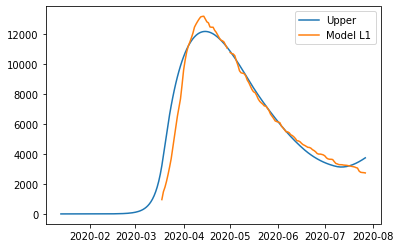

{'home': 1.0, 'leisure': 0.9081399438093067, 'other': 0.8, 'school': 0.9096986032256767, 'transport': 0.8871951985234614, 'work': 0.8286863492644797}
{'home': 1.0, 'leisure': 0.11144115070353082, 'other': 0.06546951695536765, 'school': 0, 'transport': 0.11268714580059666, 'work': 0.3072056393659317}
{'home': 1.0, 'leisure': 0.11144115070353082, 'other': 0.06546951695536765, 'school': 0, 'transport': 0.11268714580059666, 'work': 0.3072056393659317}
{'home': 1.0, 'leisure': 0.13386462337803443, 'other': 0.15793613192617215, 'school': 0.30020053906447336, 'transport': 0.19619152264865738, 'work': 0.5562798260198167}
{'home': 1.0, 'leisure': 0.25761633055651784, 'other': 0.22741468307653828, 'school': 0.6094980641612034, 'transport': 0.26010716322569916, 'work': 0.5879490088007426}
{'home': 1.0, 'leisure': 0.43004230456309067, 'other': 0.34977326447995927, 'school': 0.6094980641612034, 'transport': 0.4308432221055566, 'work': 0.6680003078422999}
{'home': 1.0, 'leisure': 0.4436166007770299,

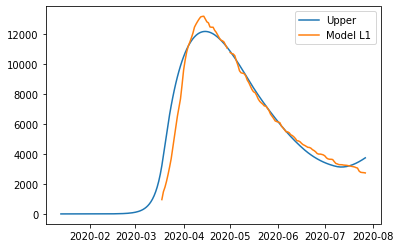

{'home': 1.0, 'leisure': 0.9081399438093067, 'other': 0.8, 'school': 0.9096986032256767, 'transport': 0.8871951985234614, 'work': 0.8286863492644797}
{'home': 1.0, 'leisure': 0.11144115070353082, 'other': 0.06546951695536765, 'school': 0, 'transport': 0.11268714580059666, 'work': 0.3072056393659317}
{'home': 1.0, 'leisure': 0.11144115070353082, 'other': 0.06546951695536765, 'school': 0, 'transport': 0.11268714580059666, 'work': 0.3072056393659317}
{'home': 1.0, 'leisure': 0.13386462337803443, 'other': 0.15793613192617215, 'school': 0.30020053906447336, 'transport': 0.19619152264865738, 'work': 0.5562798260198167}
{'home': 1.0, 'leisure': 0.25761633055651784, 'other': 0.22741468307653828, 'school': 0.6094980641612034, 'transport': 0.26010716322569916, 'work': 0.5879490088007426}
{'home': 1.0, 'leisure': 0.43004230456309067, 'other': 0.34977326447995927, 'school': 0.6094980641612034, 'transport': 0.4308432221055566, 'work': 0.6680003078422999}
{'home': 1.0, 'leisure': 0.4436166007770299,

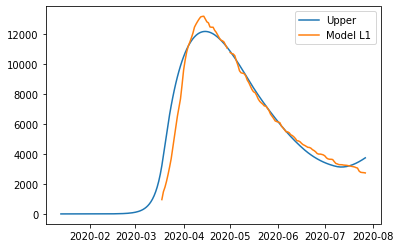

{'home': 1.0, 'leisure': 0.9081399438093067, 'other': 0.8, 'school': 0.9096986032256767, 'transport': 0.8871951985234614, 'work': 0.8286863492644797}
{'home': 1.0, 'leisure': 0.11144115070353082, 'other': 0.06546951695536765, 'school': 0, 'transport': 0.11268714580059666, 'work': 0.3072056393659317}
{'home': 1.0, 'leisure': 0.11144115070353082, 'other': 0.06546951695536765, 'school': 0, 'transport': 0.11268714580059666, 'work': 0.3072056393659317}
{'home': 1.0, 'leisure': 0.13386462337803443, 'other': 0.15793613192617215, 'school': 0.30020053906447336, 'transport': 0.19619152264865738, 'work': 0.5562798260198167}
{'home': 1.0, 'leisure': 0.25761633055651784, 'other': 0.22741468307653828, 'school': 0.6094980641612034, 'transport': 0.26010716322569916, 'work': 0.5879490088007426}
{'home': 1.0, 'leisure': 0.43004230456309067, 'other': 0.34977326447995927, 'school': 0.6094980641612034, 'transport': 0.4308432221055566, 'work': 0.6680003078422999}
{'home': 1.0, 'leisure': 0.4436166007770299,

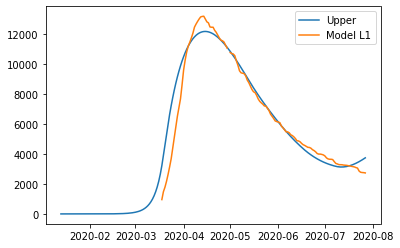

{'home': 1.00000001, 'leisure': 0.9081399438093067, 'other': 0.8, 'school': 0.9096986032256767, 'transport': 0.8871951985234614, 'work': 0.8286863492644797}
{'home': 1.00000001, 'leisure': 0.11144115070353082, 'other': 0.06546951695536765, 'school': 0, 'transport': 0.11268714580059666, 'work': 0.3072056393659317}
{'home': 1.00000001, 'leisure': 0.11144115070353082, 'other': 0.06546951695536765, 'school': 0, 'transport': 0.11268714580059666, 'work': 0.3072056393659317}
{'home': 1.00000001, 'leisure': 0.13386462337803443, 'other': 0.15793613192617215, 'school': 0.30020053906447336, 'transport': 0.19619152264865738, 'work': 0.5562798260198167}
{'home': 1.00000001, 'leisure': 0.25761633055651784, 'other': 0.22741468307653828, 'school': 0.6094980641612034, 'transport': 0.26010716322569916, 'work': 0.5879490088007426}
{'home': 1.00000001, 'leisure': 0.43004230456309067, 'other': 0.34977326447995927, 'school': 0.6094980641612034, 'transport': 0.4308432221055566, 'work': 0.6680003078422999}
{'

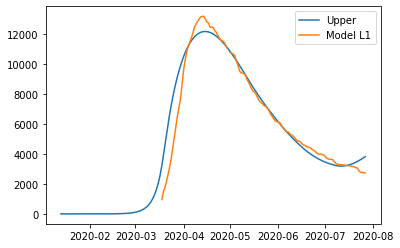

{'home': 1.0, 'leisure': 0.9041690452631025, 'other': 0.8, 'school': 0.9087882668071287, 'transport': 0.8857377976168735, 'work': 0.8275194554951613}
{'home': 1.0, 'leisure': 0.11126811333610166, 'other': 0.06608638364961185, 'school': 0, 'transport': 0.11282464456685627, 'work': 0.3118104924135324}
{'home': 1.0, 'leisure': 0.11126811333610166, 'other': 0.06608638364961185, 'school': 0, 'transport': 0.11282464456685627, 'work': 0.3118104924135324}
{'home': 1.0, 'leisure': 0.13366334106656172, 'other': 0.15929620056730362, 'school': 0.29990012804635247, 'transport': 0.1964425680002647, 'work': 0.5639107603769948}
{'home': 1.0, 'leisure': 0.25720283535191907, 'other': 0.22896196915727676, 'school': 0.6088881387607762, 'transport': 0.2604124329955509, 'work': 0.5948104592402326}
{'home': 1.0, 'leisure': 0.4291484650507092, 'other': 0.35098833683474684, 'school': 0.6088881387607762, 'transport': 0.4312879638804793, 'work': 0.6725276776302322}
{'home': 1.0, 'leisure': 0.4422693303969373, 'o

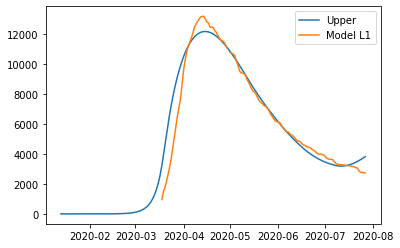

{'home': 1.0, 'leisure': 0.9041690452631025, 'other': 0.8, 'school': 0.9087882668071287, 'transport': 0.8857377976168735, 'work': 0.8275194554951613}
{'home': 1.0, 'leisure': 0.11126811333610166, 'other': 0.06608638364961185, 'school': 0, 'transport': 0.11282464456685627, 'work': 0.3118104924135324}
{'home': 1.0, 'leisure': 0.11126811333610166, 'other': 0.06608638364961185, 'school': 0, 'transport': 0.11282464456685627, 'work': 0.3118104924135324}
{'home': 1.0, 'leisure': 0.13366334106656172, 'other': 0.15929620056730362, 'school': 0.29990012804635247, 'transport': 0.1964425680002647, 'work': 0.5639107603769948}
{'home': 1.0, 'leisure': 0.25720283535191907, 'other': 0.22896196915727676, 'school': 0.6088881387607762, 'transport': 0.2604124329955509, 'work': 0.5948104592402326}
{'home': 1.0, 'leisure': 0.4291484650507092, 'other': 0.35098833683474684, 'school': 0.6088881387607762, 'transport': 0.4312879638804793, 'work': 0.6725276776302322}
{'home': 1.0, 'leisure': 0.4422693303969373, 'o

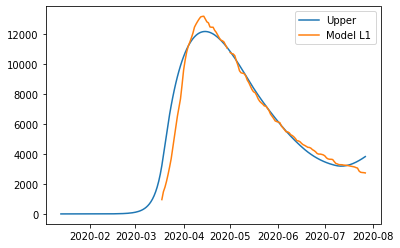

{'home': 1.00000001, 'leisure': 0.9041690452631025, 'other': 0.8, 'school': 0.9087882668071287, 'transport': 0.8857377976168735, 'work': 0.8275194554951613}
{'home': 1.00000001, 'leisure': 0.11126811333610166, 'other': 0.06608638364961185, 'school': 0, 'transport': 0.11282464456685627, 'work': 0.3118104924135324}
{'home': 1.00000001, 'leisure': 0.11126811333610166, 'other': 0.06608638364961185, 'school': 0, 'transport': 0.11282464456685627, 'work': 0.3118104924135324}
{'home': 1.00000001, 'leisure': 0.13366334106656172, 'other': 0.15929620056730362, 'school': 0.29990012804635247, 'transport': 0.1964425680002647, 'work': 0.5639107603769948}
{'home': 1.00000001, 'leisure': 0.25720283535191907, 'other': 0.22896196915727676, 'school': 0.6088881387607762, 'transport': 0.2604124329955509, 'work': 0.5948104592402326}
{'home': 1.00000001, 'leisure': 0.4291484650507092, 'other': 0.35098833683474684, 'school': 0.6088881387607762, 'transport': 0.4312879638804793, 'work': 0.6725276776302322}
{'hom

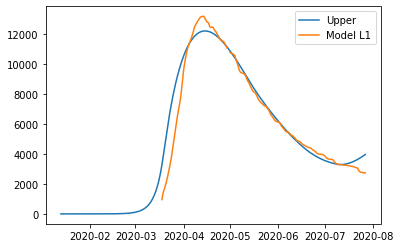

{'home': 1.0, 'leisure': 0.8979864609969982, 'other': 0.8, 'school': 0.9074513812229934, 'transport': 0.8836168941179182, 'work': 0.8259651219487844}
{'home': 1.0, 'leisure': 0.11098852694323919, 'other': 0.06697005957798598, 'school': 0, 'transport': 0.11303787204700677, 'work': 0.31877533890299664}
{'home': 1.0, 'leisure': 0.11098852694323919, 'other': 0.06697005957798598, 'school': 0, 'transport': 0.11303787204700677, 'work': 0.31877533890299664}
{'home': 1.0, 'leisure': 0.1333419478205851, 'other': 0.16124614121729455, 'school': 0.29945895580358783, 'transport': 0.1968298927496816, 'work': 0.5753143042981468}
{'home': 1.0, 'leisure': 0.2565435235177824, 'other': 0.23121301023368754, 'school': 0.6079924254194056, 'transport': 0.260889065251996, 'work': 0.6050997827802369}
{'home': 1.0, 'leisure': 0.4277658310852016, 'other': 0.3528515444381273, 'school': 0.6079924254194056, 'transport': 0.4319937757679357, 'work': 0.6794075023197937}
{'home': 1.0, 'leisure': 0.44023155864634217, 'ot

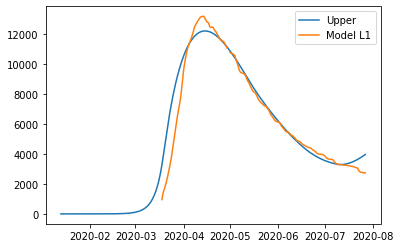

{'home': 1.0, 'leisure': 0.8979864609969982, 'other': 0.8, 'school': 0.9074513812229934, 'transport': 0.8836168941179182, 'work': 0.8259651219487844}
{'home': 1.0, 'leisure': 0.11098852694323919, 'other': 0.06697005957798598, 'school': 0, 'transport': 0.11303787204700677, 'work': 0.31877533890299664}
{'home': 1.0, 'leisure': 0.11098852694323919, 'other': 0.06697005957798598, 'school': 0, 'transport': 0.11303787204700677, 'work': 0.31877533890299664}
{'home': 1.0, 'leisure': 0.1333419478205851, 'other': 0.16124614121729455, 'school': 0.29945895580358783, 'transport': 0.1968298927496816, 'work': 0.5753143042981468}
{'home': 1.0, 'leisure': 0.2565435235177824, 'other': 0.23121301023368754, 'school': 0.6079924254194056, 'transport': 0.260889065251996, 'work': 0.6050997827802369}
{'home': 1.0, 'leisure': 0.4277658310852016, 'other': 0.3528515444381273, 'school': 0.6079924254194056, 'transport': 0.4319937757679357, 'work': 0.6794075023197937}
{'home': 1.0, 'leisure': 0.44023155864634217, 'ot

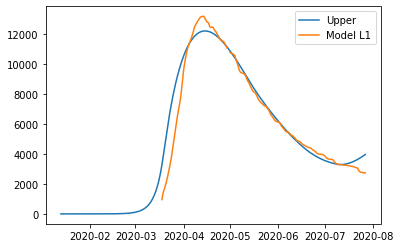

{'home': 1.0, 'leisure': 0.8979864609969982, 'other': 0.8, 'school': 0.9074513812229934, 'transport': 0.8836168941179182, 'work': 0.8259651219487844}
{'home': 1.0, 'leisure': 0.11098852694323919, 'other': 0.06697005957798598, 'school': 0, 'transport': 0.11303787204700677, 'work': 0.31877533890299664}
{'home': 1.0, 'leisure': 0.11098852694323919, 'other': 0.06697005957798598, 'school': 0, 'transport': 0.11303787204700677, 'work': 0.31877533890299664}
{'home': 1.0, 'leisure': 0.1333419478205851, 'other': 0.16124614121729455, 'school': 0.29945895580358783, 'transport': 0.1968298927496816, 'work': 0.5753143042981468}
{'home': 1.0, 'leisure': 0.2565435235177824, 'other': 0.23121301023368754, 'school': 0.6079924254194056, 'transport': 0.260889065251996, 'work': 0.6050997827802369}
{'home': 1.0, 'leisure': 0.4277658310852016, 'other': 0.3528515444381273, 'school': 0.6079924254194056, 'transport': 0.4319937757679357, 'work': 0.6794075023197937}
{'home': 1.0, 'leisure': 0.44023155864634217, 'ot

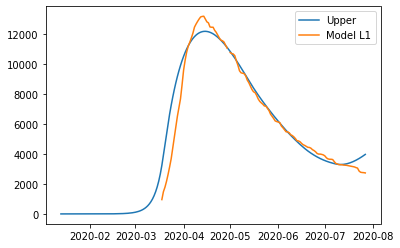

{'home': 1.0, 'leisure': 0.8978846410202939, 'other': 0.8, 'school': 0.9073688858858522, 'transport': 0.8835300058873958, 'work': 0.8259381409956501}
{'home': 1.0, 'leisure': 0.11097028380291972, 'other': 0.06701331657310781, 'school': 0, 'transport': 0.11302882695522164, 'work': 0.31885715005877857}
{'home': 1.0, 'leisure': 0.11097028380291972, 'other': 0.06701331657310781, 'school': 0, 'transport': 0.11302882695522164, 'work': 0.31885715005877857}
{'home': 1.0, 'leisure': 0.13331755825563926, 'other': 0.1613392417881494, 'school': 0.2994317323423312, 'transport': 0.19681538131835427, 'work': 0.5755408859864586}
{'home': 1.0, 'leisure': 0.2564966496946468, 'other': 0.2312944374143398, 'school': 0.607937153543521, 'transport': 0.26086620268606253, 'work': 0.6052962329705889}
{'home': 1.0, 'leisure': 0.42766766381457294, 'other': 0.3528413812730403, 'school': 0.607937153543521, 'transport': 0.4319492161553987, 'work': 0.6795287815539013}
{'home': 1.0, 'leisure': 0.4401196450636356, 'oth

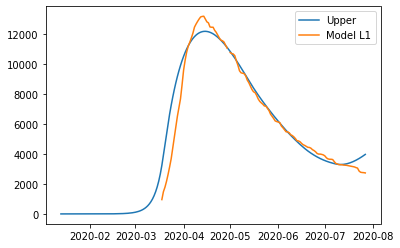

{'home': 1.0, 'leisure': 0.8978846410202939, 'other': 0.8, 'school': 0.9073688858858522, 'transport': 0.8835300058873958, 'work': 0.8259381409956501}
{'home': 1.0, 'leisure': 0.11097028380291972, 'other': 0.06701331657310781, 'school': 0, 'transport': 0.11302882695522164, 'work': 0.31885715005877857}
{'home': 1.0, 'leisure': 0.11097028380291972, 'other': 0.06701331657310781, 'school': 0, 'transport': 0.11302882695522164, 'work': 0.31885715005877857}
{'home': 1.0, 'leisure': 0.13331755825563926, 'other': 0.1613392417881494, 'school': 0.2994317323423312, 'transport': 0.19681538131835427, 'work': 0.5755408859864586}
{'home': 1.0, 'leisure': 0.2564966496946468, 'other': 0.2312944374143398, 'school': 0.607937153543521, 'transport': 0.26086620268606253, 'work': 0.6052962329705889}
{'home': 1.0, 'leisure': 0.42766766381457294, 'other': 0.3528413812730403, 'school': 0.607937153543521, 'transport': 0.4319492161553987, 'work': 0.6795287815539013}
{'home': 1.0, 'leisure': 0.4401196450636356, 'oth

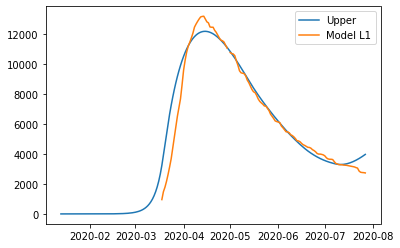

{'home': 1.00000001, 'leisure': 0.8978846410202939, 'other': 0.8, 'school': 0.9073688858858522, 'transport': 0.8835300058873958, 'work': 0.8259381409956501}
{'home': 1.00000001, 'leisure': 0.11097028380291972, 'other': 0.06701331657310781, 'school': 0, 'transport': 0.11302882695522164, 'work': 0.31885715005877857}
{'home': 1.00000001, 'leisure': 0.11097028380291972, 'other': 0.06701331657310781, 'school': 0, 'transport': 0.11302882695522164, 'work': 0.31885715005877857}
{'home': 1.00000001, 'leisure': 0.13331755825563926, 'other': 0.1613392417881494, 'school': 0.2994317323423312, 'transport': 0.19681538131835427, 'work': 0.5755408859864586}
{'home': 1.00000001, 'leisure': 0.2564966496946468, 'other': 0.2312944374143398, 'school': 0.607937153543521, 'transport': 0.26086620268606253, 'work': 0.6052962329705889}
{'home': 1.00000001, 'leisure': 0.42766766381457294, 'other': 0.3528413812730403, 'school': 0.607937153543521, 'transport': 0.4319492161553987, 'work': 0.6795287815539013}
{'home'

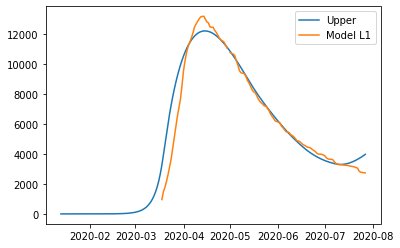

{'home': 1.0, 'leisure': 0.8969493984990374, 'other': 0.8, 'school': 0.9072245144799105, 'transport': 0.8831265863644163, 'work': 0.8256635463878361}
{'home': 1.0, 'leisure': 0.11094007365213089, 'other': 0.06717578140796898, 'school': 0, 'transport': 0.1130650226091057, 'work': 0.32030764128766737}
{'home': 1.0, 'leisure': 0.11094007365213089, 'other': 0.06717578140796898, 'school': 0, 'transport': 0.1130650226091057, 'work': 0.32030764128766737}
{'home': 1.0, 'leisure': 0.13328265768228126, 'other': 0.1616982932066996, 'school': 0.2993840897783705, 'transport': 0.19688138489388915, 'work': 0.5779847492639795}
{'home': 1.0, 'leisure': 0.2564231548056535, 'other': 0.23170457418624096, 'school': 0.6078404247015401, 'transport': 0.26094660252283153, 'work': 0.6074937143799722}
{'home': 1.0, 'leisure': 0.42749341402693003, 'other': 0.3531702044833726, 'school': 0.6078404247015401, 'transport': 0.43206678582720853, 'work': 0.6809821007505203}
{'home': 1.0, 'leisure': 0.4398099232354042, 'o

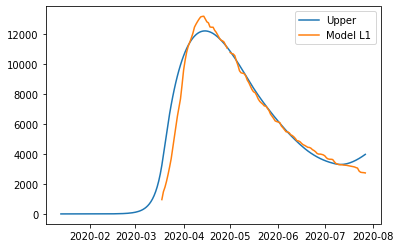

{'home': 1.0, 'leisure': 0.8969493984990374, 'other': 0.8, 'school': 0.9072245144799105, 'transport': 0.8831265863644163, 'work': 0.8256635463878361}
{'home': 1.0, 'leisure': 0.11094007365213089, 'other': 0.06717578140796898, 'school': 0, 'transport': 0.1130650226091057, 'work': 0.32030764128766737}
{'home': 1.0, 'leisure': 0.11094007365213089, 'other': 0.06717578140796898, 'school': 0, 'transport': 0.1130650226091057, 'work': 0.32030764128766737}
{'home': 1.0, 'leisure': 0.13328265768228126, 'other': 0.1616982932066996, 'school': 0.2993840897783705, 'transport': 0.19688138489388915, 'work': 0.5779847492639795}
{'home': 1.0, 'leisure': 0.2564231548056535, 'other': 0.23170457418624096, 'school': 0.6078404247015401, 'transport': 0.26094660252283153, 'work': 0.6074937143799722}
{'home': 1.0, 'leisure': 0.42749341402693003, 'other': 0.3531702044833726, 'school': 0.6078404247015401, 'transport': 0.43206678582720853, 'work': 0.6809821007505203}
{'home': 1.0, 'leisure': 0.4398099232354042, 'o

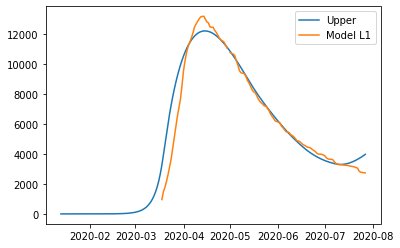

{'home': 1.0, 'leisure': 0.8969493984990374, 'other': 0.8, 'school': 0.9072245144799105, 'transport': 0.8831265863644163, 'work': 0.8256635463878361}
{'home': 1.0, 'leisure': 0.11094007365213089, 'other': 0.06717578140796898, 'school': 0, 'transport': 0.1130650226091057, 'work': 0.32030764128766737}
{'home': 1.0, 'leisure': 0.11094007365213089, 'other': 0.06717578140796898, 'school': 0, 'transport': 0.1130650226091057, 'work': 0.32030764128766737}
{'home': 1.0, 'leisure': 0.13328265768228126, 'other': 0.1616982932066996, 'school': 0.2993840897783705, 'transport': 0.19688138489388915, 'work': 0.5779847492639795}
{'home': 1.0, 'leisure': 0.2564231548056535, 'other': 0.23170457418624096, 'school': 0.6078404247015401, 'transport': 0.26094660252283153, 'work': 0.6074937143799722}
{'home': 1.0, 'leisure': 0.42749341402693003, 'other': 0.3531702044833726, 'school': 0.6078404247015401, 'transport': 0.43206678582720853, 'work': 0.6809821007505203}
{'home': 1.0, 'leisure': 0.4398099232354042, 'o

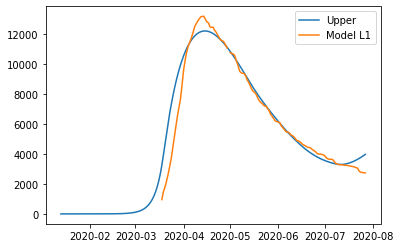

{'home': 1.0, 'leisure': 0.896937613647088, 'other': 0.8, 'school': 0.9072159064151057, 'transport': 0.8831164817683226, 'work': 0.8256604268110326}
{'home': 1.0, 'leisure': 0.11093816940084927, 'other': 0.0671805313333857, 'school': 0, 'transport': 0.11306417746311757, 'work': 0.32031704865417127}
{'home': 1.0, 'leisure': 0.11093816940084927, 'other': 0.0671805313333857, 'school': 0, 'transport': 0.11306417746311757, 'work': 0.32031704865417127}
{'home': 1.0, 'leisure': 0.13328012853351368, 'other': 0.16170854228928289, 'school': 0.2993812491169849, 'transport': 0.19688004444893734, 'work': 0.5780109877765623}
{'home': 1.0, 'leisure': 0.2564182761921669, 'other': 0.2317138053690948, 'school': 0.6078346572981209, 'transport': 0.2609444460613772, 'work': 0.6075164551089514}
{'home': 1.0, 'leisure': 0.427483150588965, 'other': 0.3531701085402734, 'school': 0.6078346572981209, 'transport': 0.4320625066529548, 'work': 0.6809961306869691}
{'home': 1.0, 'leisure': 0.4397980353819472, 'other'

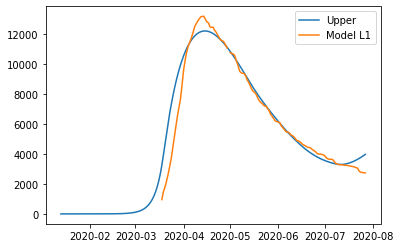

{'home': 1.0, 'leisure': 0.896937613647088, 'other': 0.8, 'school': 0.9072159064151057, 'transport': 0.8831164817683226, 'work': 0.8256604268110326}
{'home': 1.0, 'leisure': 0.11093816940084927, 'other': 0.0671805313333857, 'school': 0, 'transport': 0.11306417746311757, 'work': 0.32031704865417127}
{'home': 1.0, 'leisure': 0.11093816940084927, 'other': 0.0671805313333857, 'school': 0, 'transport': 0.11306417746311757, 'work': 0.32031704865417127}
{'home': 1.0, 'leisure': 0.13328012853351368, 'other': 0.16170854228928289, 'school': 0.2993812491169849, 'transport': 0.19688004444893734, 'work': 0.5780109877765623}
{'home': 1.0, 'leisure': 0.2564182761921669, 'other': 0.2317138053690948, 'school': 0.6078346572981209, 'transport': 0.2609444460613772, 'work': 0.6075164551089514}
{'home': 1.0, 'leisure': 0.427483150588965, 'other': 0.3531701085402734, 'school': 0.6078346572981209, 'transport': 0.4320625066529548, 'work': 0.6809961306869691}
{'home': 1.0, 'leisure': 0.4397980353819472, 'other'

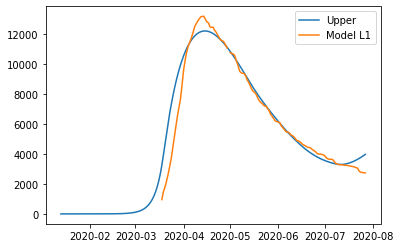

{'home': 1.00000001, 'leisure': 0.896937613647088, 'other': 0.8, 'school': 0.9072159064151057, 'transport': 0.8831164817683226, 'work': 0.8256604268110326}
{'home': 1.00000001, 'leisure': 0.11093816940084927, 'other': 0.0671805313333857, 'school': 0, 'transport': 0.11306417746311757, 'work': 0.32031704865417127}
{'home': 1.00000001, 'leisure': 0.11093816940084927, 'other': 0.0671805313333857, 'school': 0, 'transport': 0.11306417746311757, 'work': 0.32031704865417127}
{'home': 1.00000001, 'leisure': 0.13328012853351368, 'other': 0.16170854228928289, 'school': 0.2993812491169849, 'transport': 0.19688004444893734, 'work': 0.5780109877765623}
{'home': 1.00000001, 'leisure': 0.2564182761921669, 'other': 0.2317138053690948, 'school': 0.6078346572981209, 'transport': 0.2609444460613772, 'work': 0.6075164551089514}
{'home': 1.00000001, 'leisure': 0.427483150588965, 'other': 0.3531701085402734, 'school': 0.6078346572981209, 'transport': 0.4320625066529548, 'work': 0.6809961306869691}
{'home': 1

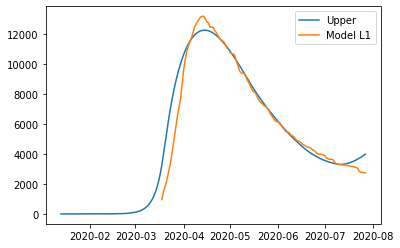

{'home': 1.0, 'leisure': 0.8946243666067556, 'other': 0.8000001773512342, 'school': 0.9068116731157249, 'transport': 0.8820868271250294, 'work': 0.824978592081311}
{'home': 1.0, 'leisure': 0.11085246834870513, 'other': 0.06760083782552774, 'school': 0, 'transport': 0.11314422464849498, 'work': 0.32387939008682093}
{'home': 1.0, 'leisure': 0.11085246834870513, 'other': 0.06760083782552774, 'school': 0, 'transport': 0.11314422464849498, 'work': 0.32387939008682093}
{'home': 1.0, 'leisure': 0.1331787624339805, 'other': 0.16263570324707122, 'school': 0.2992478521281892, 'transport': 0.19702742172120977, 'work': 0.5840760429371483}
{'home': 1.0, 'leisure': 0.2562081232060796, 'other': 0.23275544987394534, 'school': 0.6075638209875357, 'transport': 0.2611202874455749, 'work': 0.6129650649556496}
{'home': 1.0, 'leisure': 0.426995156179015, 'other': 0.3539525080030312, 'school': 0.6075638209875357, 'transport': 0.43231173421443797, 'work': 0.6845940538640051}
{'home': 1.0, 'leisure': 0.4389765

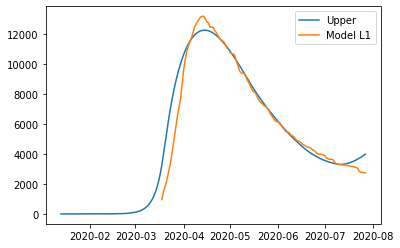

{'home': 1.0, 'leisure': 0.8946243666067556, 'other': 0.8000001773512342, 'school': 0.9068116731157249, 'transport': 0.8820868271250294, 'work': 0.824978592081311}
{'home': 1.0, 'leisure': 0.11085246834870513, 'other': 0.06760083782552774, 'school': 0, 'transport': 0.11314422464849498, 'work': 0.32387939008682093}
{'home': 1.0, 'leisure': 0.11085246834870513, 'other': 0.06760083782552774, 'school': 0, 'transport': 0.11314422464849498, 'work': 0.32387939008682093}
{'home': 1.0, 'leisure': 0.1331787624339805, 'other': 0.16263570324707122, 'school': 0.2992478521281892, 'transport': 0.19702742172120977, 'work': 0.5840760429371483}
{'home': 1.0, 'leisure': 0.2562081232060796, 'other': 0.23275544987394534, 'school': 0.6075638209875357, 'transport': 0.2611202874455749, 'work': 0.6129650649556496}
{'home': 1.0, 'leisure': 0.426995156179015, 'other': 0.3539525080030312, 'school': 0.6075638209875357, 'transport': 0.43231173421443797, 'work': 0.6845940538640051}
{'home': 1.0, 'leisure': 0.4389765

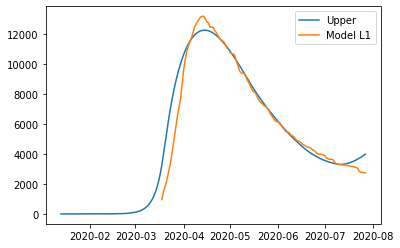

{'home': 1.0, 'leisure': 0.8946243666067556, 'other': 0.8000001773512342, 'school': 0.9068116731157249, 'transport': 0.8820868271250294, 'work': 0.824978592081311}
{'home': 1.0, 'leisure': 0.11085246834870513, 'other': 0.06760083782552774, 'school': 0, 'transport': 0.11314422464849498, 'work': 0.32387939008682093}
{'home': 1.0, 'leisure': 0.11085246834870513, 'other': 0.06760083782552774, 'school': 0, 'transport': 0.11314422464849498, 'work': 0.32387939008682093}
{'home': 1.0, 'leisure': 0.1331787624339805, 'other': 0.16263570324707122, 'school': 0.2992478521281892, 'transport': 0.19702742172120977, 'work': 0.5840760429371483}
{'home': 1.0, 'leisure': 0.2562081232060796, 'other': 0.23275544987394534, 'school': 0.6075638209875357, 'transport': 0.2611202874455749, 'work': 0.6129650649556496}
{'home': 1.0, 'leisure': 0.426995156179015, 'other': 0.3539525080030312, 'school': 0.6075638209875357, 'transport': 0.43231173421443797, 'work': 0.6845940538640051}
{'home': 1.0, 'leisure': 0.4389765

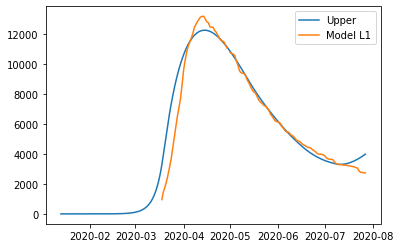

{'home': 1.0, 'leisure': 0.8946162013520189, 'other': 0.8000001773346014, 'school': 0.9068089715894726, 'transport': 0.88208028318623, 'work': 0.8249762494713997}
{'home': 1.0, 'leisure': 0.11085090135408131, 'other': 0.06760193168843094, 'school': 0, 'transport': 0.11314314461069935, 'work': 0.32388512229819644}
{'home': 1.0, 'leisure': 0.11085090135408131, 'other': 0.06760193168843094, 'school': 0, 'transport': 0.11314314461069935, 'work': 0.32388512229819644}
{'home': 1.0, 'leisure': 0.13317677891379504, 'other': 0.16263802309347836, 'school': 0.299246960624526, 'transport': 0.19702557829446668, 'work': 0.5840926183233978}
{'home': 1.0, 'leisure': 0.25620433210409377, 'other': 0.2327571281256711, 'school': 0.6075620109649467, 'transport': 0.26111772906631425, 'work': 0.612978990581821}
{'home': 1.0, 'leisure': 0.4269882478005883, 'other': 0.3539509113119917, 'school': 0.6075620109649467, 'transport': 0.4323072945120656, 'work': 0.6846014095330798}
{'home': 1.0, 'leisure': 0.43896844

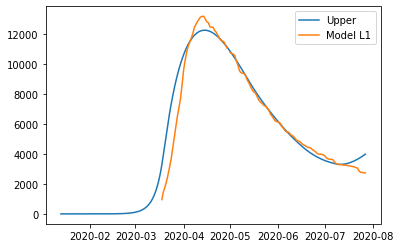

{'home': 1.0, 'leisure': 0.8946162013520189, 'other': 0.8000001773346014, 'school': 0.9068089715894726, 'transport': 0.88208028318623, 'work': 0.8249762494713997}
{'home': 1.0, 'leisure': 0.11085090135408131, 'other': 0.06760193168843094, 'school': 0, 'transport': 0.11314314461069935, 'work': 0.32388512229819644}
{'home': 1.0, 'leisure': 0.11085090135408131, 'other': 0.06760193168843094, 'school': 0, 'transport': 0.11314314461069935, 'work': 0.32388512229819644}
{'home': 1.0, 'leisure': 0.13317677891379504, 'other': 0.16263802309347836, 'school': 0.299246960624526, 'transport': 0.19702557829446668, 'work': 0.5840926183233978}
{'home': 1.0, 'leisure': 0.25620433210409377, 'other': 0.2327571281256711, 'school': 0.6075620109649467, 'transport': 0.26111772906631425, 'work': 0.612978990581821}
{'home': 1.0, 'leisure': 0.4269882478005883, 'other': 0.3539509113119917, 'school': 0.6075620109649467, 'transport': 0.4323072945120656, 'work': 0.6846014095330798}
{'home': 1.0, 'leisure': 0.43896844

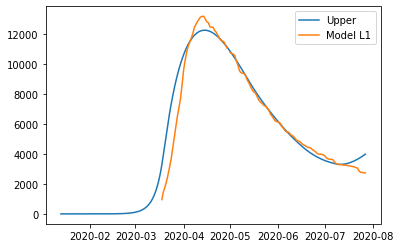

{'home': 1.0, 'leisure': 0.8946162013520189, 'other': 0.8000001773346014, 'school': 0.9068089715894726, 'transport': 0.88208028318623, 'work': 0.8249762494713997}
{'home': 1.0, 'leisure': 0.11085090135408131, 'other': 0.06760193168843094, 'school': 0, 'transport': 0.11314314461069935, 'work': 0.32388512229819644}
{'home': 1.0, 'leisure': 0.11085090135408131, 'other': 0.06760193168843094, 'school': 0, 'transport': 0.11314314461069935, 'work': 0.32388512229819644}
{'home': 1.0, 'leisure': 0.13317677891379504, 'other': 0.16263802309347836, 'school': 0.299246960624526, 'transport': 0.19702557829446668, 'work': 0.5840926183233978}
{'home': 1.0, 'leisure': 0.25620433210409377, 'other': 0.2327571281256711, 'school': 0.6075620109649467, 'transport': 0.26111772906631425, 'work': 0.612978990581821}
{'home': 1.0, 'leisure': 0.4269882478005883, 'other': 0.3539509113119917, 'school': 0.6075620109649467, 'transport': 0.4323072945120656, 'work': 0.6846014095330798}
{'home': 1.0, 'leisure': 0.43896844

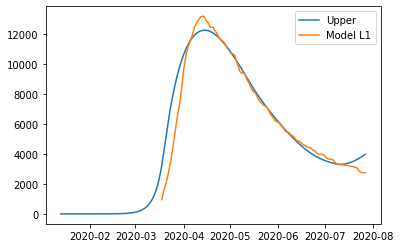

{'home': 1.00000001, 'leisure': 0.8946162013520189, 'other': 0.8000001773346014, 'school': 0.9068089715894726, 'transport': 0.88208028318623, 'work': 0.8249762494713997}
{'home': 1.00000001, 'leisure': 0.11085090135408131, 'other': 0.06760193168843094, 'school': 0, 'transport': 0.11314314461069935, 'work': 0.32388512229819644}
{'home': 1.00000001, 'leisure': 0.11085090135408131, 'other': 0.06760193168843094, 'school': 0, 'transport': 0.11314314461069935, 'work': 0.32388512229819644}
{'home': 1.00000001, 'leisure': 0.13317677891379504, 'other': 0.16263802309347836, 'school': 0.299246960624526, 'transport': 0.19702557829446668, 'work': 0.5840926183233978}
{'home': 1.00000001, 'leisure': 0.25620433210409377, 'other': 0.2327571281256711, 'school': 0.6075620109649467, 'transport': 0.26111772906631425, 'work': 0.612978990581821}
{'home': 1.00000001, 'leisure': 0.4269882478005883, 'other': 0.3539509113119917, 'school': 0.6075620109649467, 'transport': 0.4323072945120656, 'work': 0.68460140953

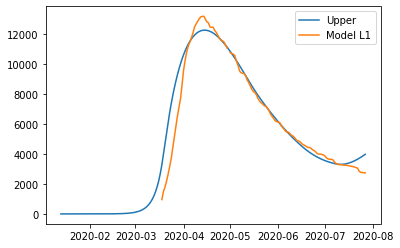

{'home': 1.0, 'leisure': 0.894619764661889, 'other': 0.8, 'school': 0.906816938258641, 'transport': 0.8820721221250221, 'work': 0.8249703988679387}
{'home': 1.0, 'leisure': 0.11085315071684579, 'other': 0.06760524013206583, 'school': 0, 'transport': 0.11314407442742061, 'work': 0.32393227228724675}
{'home': 1.0, 'leisure': 0.11085315071684579, 'other': 0.06760524013206583, 'school': 0, 'transport': 0.11314407442742061, 'work': 0.32393227228724675}
{'home': 1.0, 'leisure': 0.13317940511028956, 'other': 0.16264542757878545, 'school': 0.29924958962535153, 'transport': 0.19702725652386371, 'work': 0.5841760871786887}
{'home': 1.0, 'leisure': 0.2562093591468148, 'other': 0.23276541924075206, 'school': 0.6075673486332894, 'transport': 0.26111979195867097, 'work': 0.6130534415175743}
{'home': 1.0, 'leisure': 0.4269956526729532, 'other': 0.35395732480888237, 'school': 0.6075673486332894, 'transport': 0.4323103951425526, 'work': 0.6846491093353149}
{'home': 1.0, 'leisure': 0.4389715361628249, '

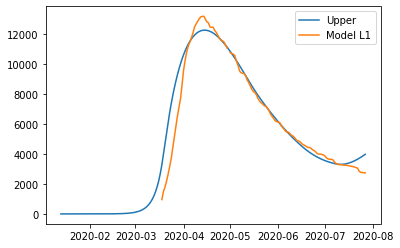

{'home': 1.0, 'leisure': 0.894619764661889, 'other': 0.8, 'school': 0.906816938258641, 'transport': 0.8820721221250221, 'work': 0.8249703988679387}
{'home': 1.0, 'leisure': 0.11085315071684579, 'other': 0.06760524013206583, 'school': 0, 'transport': 0.11314407442742061, 'work': 0.32393227228724675}
{'home': 1.0, 'leisure': 0.11085315071684579, 'other': 0.06760524013206583, 'school': 0, 'transport': 0.11314407442742061, 'work': 0.32393227228724675}
{'home': 1.0, 'leisure': 0.13317940511028956, 'other': 0.16264542757878545, 'school': 0.29924958962535153, 'transport': 0.19702725652386371, 'work': 0.5841760871786887}
{'home': 1.0, 'leisure': 0.2562093591468148, 'other': 0.23276541924075206, 'school': 0.6075673486332894, 'transport': 0.26111979195867097, 'work': 0.6130534415175743}
{'home': 1.0, 'leisure': 0.4269956526729532, 'other': 0.35395732480888237, 'school': 0.6075673486332894, 'transport': 0.4323103951425526, 'work': 0.6846491093353149}
{'home': 1.0, 'leisure': 0.4389715361628249, '

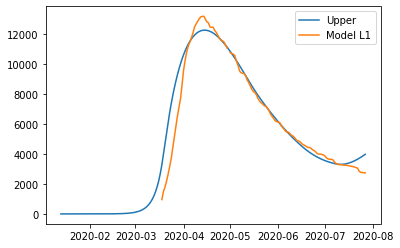

{'home': 1.0, 'leisure': 0.894619764661889, 'other': 0.8, 'school': 0.906816938258641, 'transport': 0.8820721221250221, 'work': 0.8249703988679387}
{'home': 1.0, 'leisure': 0.11085315071684579, 'other': 0.06760524013206583, 'school': 0, 'transport': 0.11314407442742061, 'work': 0.32393227228724675}
{'home': 1.0, 'leisure': 0.11085315071684579, 'other': 0.06760524013206583, 'school': 0, 'transport': 0.11314407442742061, 'work': 0.32393227228724675}
{'home': 1.0, 'leisure': 0.13317940511028956, 'other': 0.16264542757878545, 'school': 0.29924958962535153, 'transport': 0.19702725652386371, 'work': 0.5841760871786887}
{'home': 1.0, 'leisure': 0.2562093591468148, 'other': 0.23276541924075206, 'school': 0.6075673486332894, 'transport': 0.26111979195867097, 'work': 0.6130534415175743}
{'home': 1.0, 'leisure': 0.4269956526729532, 'other': 0.35395732480888237, 'school': 0.6075673486332894, 'transport': 0.4323103951425526, 'work': 0.6846491093353149}
{'home': 1.0, 'leisure': 0.4389715361628249, '

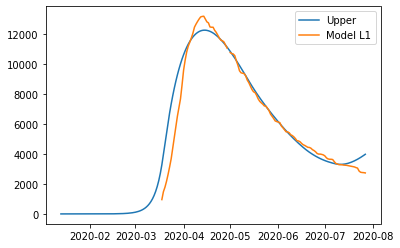

{'home': 1.00000001, 'leisure': 0.894619764661889, 'other': 0.8, 'school': 0.906816938258641, 'transport': 0.8820721221250221, 'work': 0.8249703988679387}
{'home': 1.00000001, 'leisure': 0.11085315071684579, 'other': 0.06760524013206583, 'school': 0, 'transport': 0.11314407442742061, 'work': 0.32393227228724675}
{'home': 1.00000001, 'leisure': 0.11085315071684579, 'other': 0.06760524013206583, 'school': 0, 'transport': 0.11314407442742061, 'work': 0.32393227228724675}
{'home': 1.00000001, 'leisure': 0.13317940511028956, 'other': 0.16264542757878545, 'school': 0.29924958962535153, 'transport': 0.19702725652386371, 'work': 0.5841760871786887}
{'home': 1.00000001, 'leisure': 0.2562093591468148, 'other': 0.23276541924075206, 'school': 0.6075673486332894, 'transport': 0.26111979195867097, 'work': 0.6130534415175743}
{'home': 1.00000001, 'leisure': 0.4269956526729532, 'other': 0.35395732480888237, 'school': 0.6075673486332894, 'transport': 0.4323103951425526, 'work': 0.6846491093353149}
{'ho

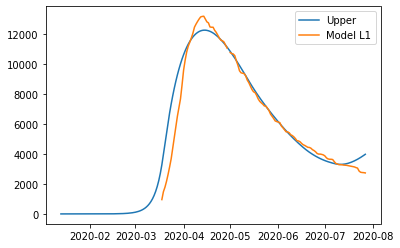

{'home': 1.0, 'leisure': 0.894626017047863, 'other': 0.8, 'school': 0.9068198496087597, 'transport': 0.8820724473527788, 'work': 0.8249699527882542}
{'home': 1.0, 'leisure': 0.11085390670253989, 'other': 0.0676050477727963, 'school': 0, 'transport': 0.11314411346382584, 'work': 0.32393553119322605}
{'home': 1.0, 'leisure': 0.11085390670253989, 'other': 0.0676050477727963, 'school': 0, 'transport': 0.11314411346382584, 'work': 0.32393553119322605}
{'home': 1.0, 'leisure': 0.13318028137971552, 'other': 0.1626450378426639, 'school': 0.2992505503708907, 'transport': 0.197027319399496, 'work': 0.5841823681728499}
{'home': 1.0, 'leisure': 0.25621108333068676, 'other': 0.23276496759179044, 'school': 0.6075692992378691, 'transport': 0.2611198811806974, 'work': 0.6130588121443686}
{'home': 1.0, 'leisure': 0.42699862683781964, 'other': 0.3539570408614827, 'school': 0.6075692992378691, 'transport': 0.43231056712878857, 'work': 0.684651998595127}
{'home': 1.0, 'leisure': 0.43897419991327485, 'othe

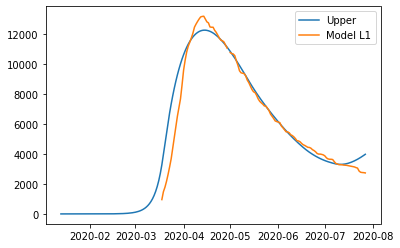

{'home': 1.0, 'leisure': 0.894626017047863, 'other': 0.8, 'school': 0.9068198496087597, 'transport': 0.8820724473527788, 'work': 0.8249699527882542}
{'home': 1.0, 'leisure': 0.11085390670253989, 'other': 0.0676050477727963, 'school': 0, 'transport': 0.11314411346382584, 'work': 0.32393553119322605}
{'home': 1.0, 'leisure': 0.11085390670253989, 'other': 0.0676050477727963, 'school': 0, 'transport': 0.11314411346382584, 'work': 0.32393553119322605}
{'home': 1.0, 'leisure': 0.13318028137971552, 'other': 0.1626450378426639, 'school': 0.2992505503708907, 'transport': 0.197027319399496, 'work': 0.5841823681728499}
{'home': 1.0, 'leisure': 0.25621108333068676, 'other': 0.23276496759179044, 'school': 0.6075692992378691, 'transport': 0.2611198811806974, 'work': 0.6130588121443686}
{'home': 1.0, 'leisure': 0.42699862683781964, 'other': 0.3539570408614827, 'school': 0.6075692992378691, 'transport': 0.43231056712878857, 'work': 0.684651998595127}
{'home': 1.0, 'leisure': 0.43897419991327485, 'othe

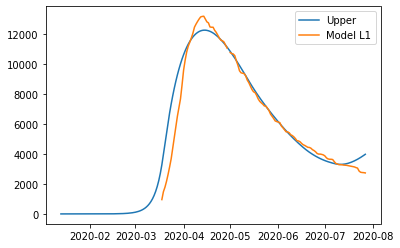

{'home': 1.0, 'leisure': 0.894626017047863, 'other': 0.8, 'school': 0.9068198496087597, 'transport': 0.8820724473527788, 'work': 0.8249699527882542}
{'home': 1.0, 'leisure': 0.11085390670253989, 'other': 0.0676050477727963, 'school': 0, 'transport': 0.11314411346382584, 'work': 0.32393553119322605}
{'home': 1.0, 'leisure': 0.11085390670253989, 'other': 0.0676050477727963, 'school': 0, 'transport': 0.11314411346382584, 'work': 0.32393553119322605}
{'home': 1.0, 'leisure': 0.13318028137971552, 'other': 0.1626450378426639, 'school': 0.2992505503708907, 'transport': 0.197027319399496, 'work': 0.5841823681728499}
{'home': 1.0, 'leisure': 0.25621108333068676, 'other': 0.23276496759179044, 'school': 0.6075692992378691, 'transport': 0.2611198811806974, 'work': 0.6130588121443686}
{'home': 1.0, 'leisure': 0.42699862683781964, 'other': 0.3539570408614827, 'school': 0.6075692992378691, 'transport': 0.43231056712878857, 'work': 0.684651998595127}
{'home': 1.0, 'leisure': 0.43897419991327485, 'othe

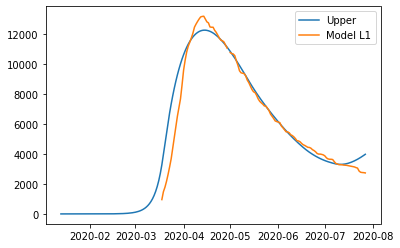

{'home': 1.0, 'leisure': 0.894626017047863, 'other': 0.8, 'school': 0.9068198496087597, 'transport': 0.8820724473527788, 'work': 0.8249699527882542}
{'home': 1.0, 'leisure': 0.11085390670253989, 'other': 0.0676050477727963, 'school': 0, 'transport': 0.11314411346382584, 'work': 0.32393553119322605}
{'home': 1.0, 'leisure': 0.11085390670253989, 'other': 0.0676050477727963, 'school': 0, 'transport': 0.11314411346382584, 'work': 0.32393553119322605}
{'home': 1.0, 'leisure': 0.13318028137971552, 'other': 0.1626450378426639, 'school': 0.2992505503708907, 'transport': 0.197027319399496, 'work': 0.5841823681728499}
{'home': 1.0, 'leisure': 0.25621108333068676, 'other': 0.23276496759179044, 'school': 0.6075692992378691, 'transport': 0.2611198811806974, 'work': 0.6130588121443686}
{'home': 1.0, 'leisure': 0.42699862683781964, 'other': 0.3539570408614827, 'school': 0.6075692992378691, 'transport': 0.43231056712878857, 'work': 0.684651998595127}
{'home': 1.0, 'leisure': 0.43897419991327485, 'othe

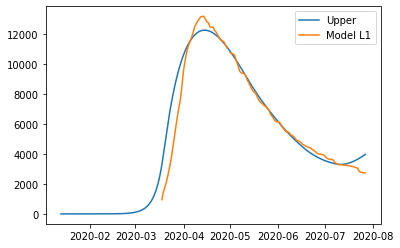

{'home': 1.0, 'leisure': 0.894827274997307, 'other': 0.8, 'school': 0.9068642545778764, 'transport': 0.8821490533368521, 'work': 0.8250139872885797}
{'home': 1.0, 'leisure': 0.11086368897981078, 'other': 0.06757244729635752, 'school': 0, 'transport': 0.11313803363406785, 'work': 0.3236859538003027}
{'home': 1.0, 'leisure': 0.11086368897981078, 'other': 0.06757244729635752, 'school': 0, 'transport': 0.11313803363406785, 'work': 0.3236859538003027}
{'home': 1.0, 'leisure': 0.13319169612189286, 'other': 0.16257333135282784, 'school': 0.2992652040106992, 'transport': 0.19701610510876733, 'work': 0.5837620054863902}
{'home': 1.0, 'leisure': 0.25623442174582417, 'other': 0.23268422114412568, 'school': 0.6075990505671772, 'transport': 0.2611065014112222, 'work': 0.6126787180563186}
{'home': 1.0, 'leisure': 0.4270484069376962, 'other': 0.35389646507800326, 'school': 0.6075990505671772, 'transport': 0.43229168519370814, 'work': 0.6843953026320678}
{'home': 1.0, 'leisure': 0.4390468284794316, 'o

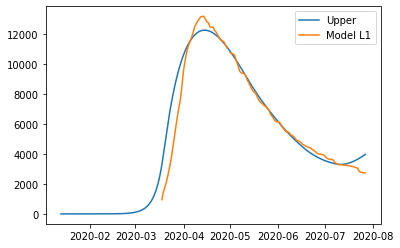

{'home': 1.0, 'leisure': 0.894827274997307, 'other': 0.8, 'school': 0.9068642545778764, 'transport': 0.8821490533368521, 'work': 0.8250139872885797}
{'home': 1.0, 'leisure': 0.11086368897981078, 'other': 0.06757244729635752, 'school': 0, 'transport': 0.11313803363406785, 'work': 0.3236859538003027}
{'home': 1.0, 'leisure': 0.11086368897981078, 'other': 0.06757244729635752, 'school': 0, 'transport': 0.11313803363406785, 'work': 0.3236859538003027}
{'home': 1.0, 'leisure': 0.13319169612189286, 'other': 0.16257333135282784, 'school': 0.2992652040106992, 'transport': 0.19701610510876733, 'work': 0.5837620054863902}
{'home': 1.0, 'leisure': 0.25623442174582417, 'other': 0.23268422114412568, 'school': 0.6075990505671772, 'transport': 0.2611065014112222, 'work': 0.6126787180563186}
{'home': 1.0, 'leisure': 0.4270484069376962, 'other': 0.35389646507800326, 'school': 0.6075990505671772, 'transport': 0.43229168519370814, 'work': 0.6843953026320678}
{'home': 1.0, 'leisure': 0.4390468284794316, 'o

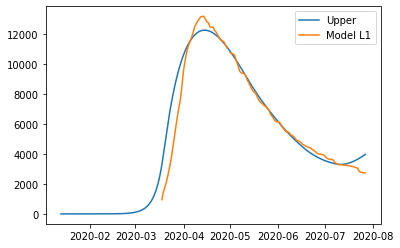

{'home': 1.0, 'leisure': 0.894827274997307, 'other': 0.8, 'school': 0.9068642545778764, 'transport': 0.8821490533368521, 'work': 0.8250139872885797}
{'home': 1.0, 'leisure': 0.11086368897981078, 'other': 0.06757244729635752, 'school': 0, 'transport': 0.11313803363406785, 'work': 0.3236859538003027}
{'home': 1.0, 'leisure': 0.11086368897981078, 'other': 0.06757244729635752, 'school': 0, 'transport': 0.11313803363406785, 'work': 0.3236859538003027}
{'home': 1.0, 'leisure': 0.13319169612189286, 'other': 0.16257333135282784, 'school': 0.2992652040106992, 'transport': 0.19701610510876733, 'work': 0.5837620054863902}
{'home': 1.0, 'leisure': 0.25623442174582417, 'other': 0.23268422114412568, 'school': 0.6075990505671772, 'transport': 0.2611065014112222, 'work': 0.6126787180563186}
{'home': 1.0, 'leisure': 0.4270484069376962, 'other': 0.35389646507800326, 'school': 0.6075990505671772, 'transport': 0.43229168519370814, 'work': 0.6843953026320678}
{'home': 1.0, 'leisure': 0.4390468284794316, 'o

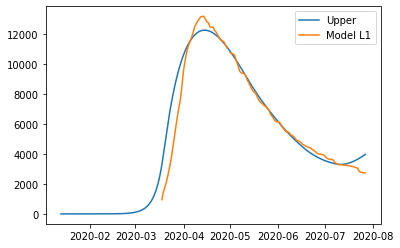

{'home': 1.0, 'leisure': 0.894827274997307, 'other': 0.8, 'school': 0.9068642545778764, 'transport': 0.8821490533368521, 'work': 0.8250139872885797}
{'home': 1.0, 'leisure': 0.11086368897981078, 'other': 0.06757244729635752, 'school': 0, 'transport': 0.11313803363406785, 'work': 0.3236859538003027}
{'home': 1.0, 'leisure': 0.11086368897981078, 'other': 0.06757244729635752, 'school': 0, 'transport': 0.11313803363406785, 'work': 0.3236859538003027}
{'home': 1.0, 'leisure': 0.13319169612189286, 'other': 0.16257333135282784, 'school': 0.2992652040106992, 'transport': 0.19701610510876733, 'work': 0.5837620054863902}
{'home': 1.0, 'leisure': 0.25623442174582417, 'other': 0.23268422114412568, 'school': 0.6075990505671772, 'transport': 0.2611065014112222, 'work': 0.6126787180563186}
{'home': 1.0, 'leisure': 0.4270484069376962, 'other': 0.35389646507800326, 'school': 0.6075990505671772, 'transport': 0.43229168519370814, 'work': 0.6843953026320678}
{'home': 1.0, 'leisure': 0.4390468284794316, 'o

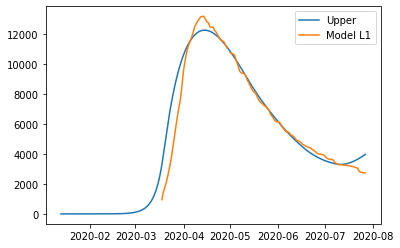

{'home': 1.00000001, 'leisure': 0.894827274997307, 'other': 0.8, 'school': 0.9068642545778764, 'transport': 0.8821490533368521, 'work': 0.8250139872885797}
{'home': 1.00000001, 'leisure': 0.11086368897981078, 'other': 0.06757244729635752, 'school': 0, 'transport': 0.11313803363406785, 'work': 0.3236859538003027}
{'home': 1.00000001, 'leisure': 0.11086368897981078, 'other': 0.06757244729635752, 'school': 0, 'transport': 0.11313803363406785, 'work': 0.3236859538003027}
{'home': 1.00000001, 'leisure': 0.13319169612189286, 'other': 0.16257333135282784, 'school': 0.2992652040106992, 'transport': 0.19701610510876733, 'work': 0.5837620054863902}
{'home': 1.00000001, 'leisure': 0.25623442174582417, 'other': 0.23268422114412568, 'school': 0.6075990505671772, 'transport': 0.2611065014112222, 'work': 0.6126787180563186}
{'home': 1.00000001, 'leisure': 0.4270484069376962, 'other': 0.35389646507800326, 'school': 0.6075990505671772, 'transport': 0.43229168519370814, 'work': 0.6843953026320678}
{'hom

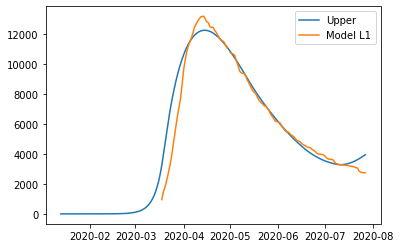

{'home': 1.0, 'leisure': 0.896014877590366, 'other': 0.8000003155617557, 'school': 0.9071301405284078, 'transport': 0.882596234747589, 'work': 0.8252644631132448}
{'home': 1.0, 'leisure': 0.11092252595904177, 'other': 0.06738166045713644, 'school': 0, 'transport': 0.11310273282994544, 'work': 0.322243083046476}
{'home': 1.0, 'leisure': 0.11092252595904177, 'other': 0.06738166045713644, 'school': 0, 'transport': 0.11310273282994544, 'work': 0.322243083046476}
{'home': 1.0, 'leisure': 0.13326029816293283, 'other': 0.1621538383856807, 'school': 0.2993529463743746, 'transport': 0.1969509499690236, 'work': 0.5813322345744196}
{'home': 1.0, 'leisure': 0.256374589646554, 'other': 0.23221198523387548, 'school': 0.6077771941540333, 'transport': 0.2610288369957546, 'work': 0.6104801532747025}
{'home': 1.0, 'leisure': 0.4273460174337517, 'other': 0.35354304554635896, 'school': 0.6077771941540333, 'transport': 0.43218229840218775, 'work': 0.6829068692701726}
{'home': 1.0, 'leisure': 0.439476898532

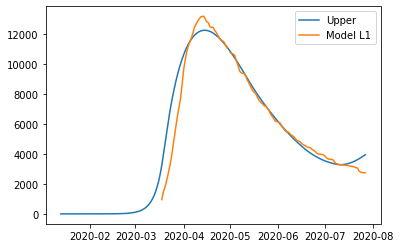

{'home': 1.0, 'leisure': 0.896014877590366, 'other': 0.8000003155617557, 'school': 0.9071301405284078, 'transport': 0.882596234747589, 'work': 0.8252644631132448}
{'home': 1.0, 'leisure': 0.11092252595904177, 'other': 0.06738166045713644, 'school': 0, 'transport': 0.11310273282994544, 'work': 0.322243083046476}
{'home': 1.0, 'leisure': 0.11092252595904177, 'other': 0.06738166045713644, 'school': 0, 'transport': 0.11310273282994544, 'work': 0.322243083046476}
{'home': 1.0, 'leisure': 0.13326029816293283, 'other': 0.1621538383856807, 'school': 0.2993529463743746, 'transport': 0.1969509499690236, 'work': 0.5813322345744196}
{'home': 1.0, 'leisure': 0.256374589646554, 'other': 0.23221198523387548, 'school': 0.6077771941540333, 'transport': 0.2610288369957546, 'work': 0.6104801532747025}
{'home': 1.0, 'leisure': 0.4273460174337517, 'other': 0.35354304554635896, 'school': 0.6077771941540333, 'transport': 0.43218229840218775, 'work': 0.6829068692701726}
{'home': 1.0, 'leisure': 0.439476898532

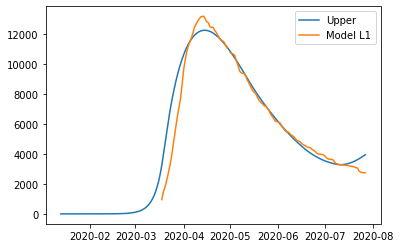

{'home': 1.0, 'leisure': 0.896014877590366, 'other': 0.8000003155617557, 'school': 0.9071301405284078, 'transport': 0.882596234747589, 'work': 0.8252644631132448}
{'home': 1.0, 'leisure': 0.11092252595904177, 'other': 0.06738166045713644, 'school': 0, 'transport': 0.11310273282994544, 'work': 0.322243083046476}
{'home': 1.0, 'leisure': 0.11092252595904177, 'other': 0.06738166045713644, 'school': 0, 'transport': 0.11310273282994544, 'work': 0.322243083046476}
{'home': 1.0, 'leisure': 0.13326029816293283, 'other': 0.1621538383856807, 'school': 0.2993529463743746, 'transport': 0.1969509499690236, 'work': 0.5813322345744196}
{'home': 1.0, 'leisure': 0.256374589646554, 'other': 0.23221198523387548, 'school': 0.6077771941540333, 'transport': 0.2610288369957546, 'work': 0.6104801532747025}
{'home': 1.0, 'leisure': 0.4273460174337517, 'other': 0.35354304554635896, 'school': 0.6077771941540333, 'transport': 0.43218229840218775, 'work': 0.6829068692701726}
{'home': 1.0, 'leisure': 0.439476898532

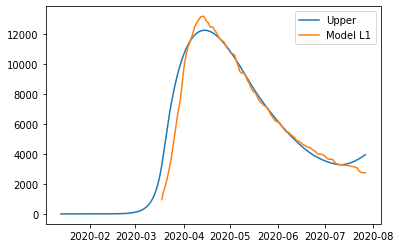

{'home': 1.0, 'leisure': 0.8960317138774526, 'other': 0.8000003172918966, 'school': 0.9071340010504453, 'transport': 0.8826023941607888, 'work': 0.8252678703485437}
{'home': 1.0, 'leisure': 0.11092337700900722, 'other': 0.06737901168687281, 'school': 0, 'transport': 0.11310223316266925, 'work': 0.32222337552499297}
{'home': 1.0, 'leisure': 0.11092337700900722, 'other': 0.06737901168687281, 'school': 0, 'transport': 0.11310223316266925, 'work': 0.32222337552499297}
{'home': 1.0, 'leisure': 0.13326128798435335, 'other': 0.16214801582216493, 'school': 0.29935422034664694, 'transport': 0.1969500287792502, 'work': 0.5812991736289902}
{'home': 1.0, 'leisure': 0.2563766108921054, 'other': 0.23220541816116685, 'school': 0.6077797807037983, 'transport': 0.26102773579844607, 'work': 0.6104502036426898}
{'home': 1.0, 'leisure': 0.42735027589769703, 'other': 0.35353809983352774, 'school': 0.6077797807037983, 'transport': 0.43218074116049426, 'work': 0.682886517330571}
{'home': 1.0, 'leisure': 0.43

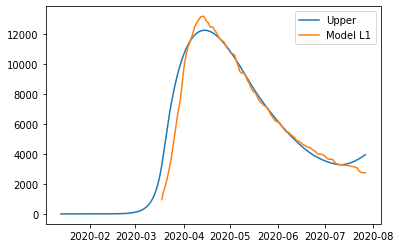

{'home': 1.0, 'leisure': 0.8960317138774526, 'other': 0.8000003172918966, 'school': 0.9071340010504453, 'transport': 0.8826023941607888, 'work': 0.8252678703485437}
{'home': 1.0, 'leisure': 0.11092337700900722, 'other': 0.06737901168687281, 'school': 0, 'transport': 0.11310223316266925, 'work': 0.32222337552499297}
{'home': 1.0, 'leisure': 0.11092337700900722, 'other': 0.06737901168687281, 'school': 0, 'transport': 0.11310223316266925, 'work': 0.32222337552499297}
{'home': 1.0, 'leisure': 0.13326128798435335, 'other': 0.16214801582216493, 'school': 0.29935422034664694, 'transport': 0.1969500287792502, 'work': 0.5812991736289902}
{'home': 1.0, 'leisure': 0.2563766108921054, 'other': 0.23220541816116685, 'school': 0.6077797807037983, 'transport': 0.26102773579844607, 'work': 0.6104502036426898}
{'home': 1.0, 'leisure': 0.42735027589769703, 'other': 0.35353809983352774, 'school': 0.6077797807037983, 'transport': 0.43218074116049426, 'work': 0.682886517330571}
{'home': 1.0, 'leisure': 0.43

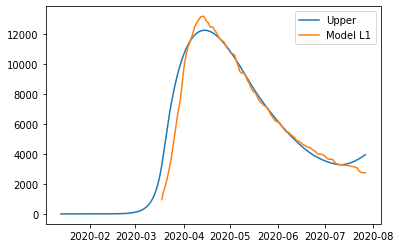

{'home': 1.0, 'leisure': 0.8960317138774526, 'other': 0.8000003172918966, 'school': 0.9071340010504453, 'transport': 0.8826023941607888, 'work': 0.8252678703485437}
{'home': 1.0, 'leisure': 0.11092337700900722, 'other': 0.06737901168687281, 'school': 0, 'transport': 0.11310223316266925, 'work': 0.32222337552499297}
{'home': 1.0, 'leisure': 0.11092337700900722, 'other': 0.06737901168687281, 'school': 0, 'transport': 0.11310223316266925, 'work': 0.32222337552499297}
{'home': 1.0, 'leisure': 0.13326128798435335, 'other': 0.16214801582216493, 'school': 0.29935422034664694, 'transport': 0.1969500287792502, 'work': 0.5812991736289902}
{'home': 1.0, 'leisure': 0.2563766108921054, 'other': 0.23220541816116685, 'school': 0.6077797807037983, 'transport': 0.26102773579844607, 'work': 0.6104502036426898}
{'home': 1.0, 'leisure': 0.42735027589769703, 'other': 0.35353809983352774, 'school': 0.6077797807037983, 'transport': 0.43218074116049426, 'work': 0.682886517330571}
{'home': 1.0, 'leisure': 0.43

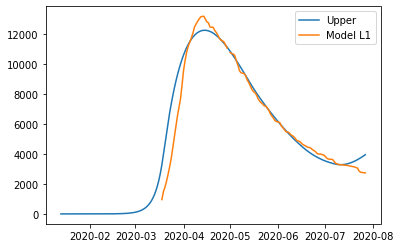

{'home': 1.0, 'leisure': 0.8960402408889129, 'other': 0.8000003181681545, 'school': 0.9071359562746278, 'transport': 0.8826055136957951, 'work': 0.8252695959982842}
{'home': 1.0, 'leisure': 0.11092380801449173, 'other': 0.06737767016374496, 'school': 0, 'transport': 0.11310198008312984, 'work': 0.32221339467724636}
{'home': 1.0, 'leisure': 0.11092380801449173, 'other': 0.06737767016374496, 'school': 0, 'transport': 0.11310198008312984, 'work': 0.32221339467724636}
{'home': 1.0, 'leisure': 0.13326178926774646, 'other': 0.16214506686742644, 'school': 0.2993548655706272, 'transport': 0.19694956220113347, 'work': 0.5812824299604228}
{'home': 1.0, 'leisure': 0.25637763453351986, 'other': 0.2322020921347298, 'school': 0.6077810907040007, 'transport': 0.2610271780453256, 'work': 0.6104350357000676}
{'home': 1.0, 'leisure': 0.4273524325968726, 'other': 0.35353559497750336, 'school': 0.6077810907040007, 'transport': 0.43217995241717305, 'work': 0.6828762101419835}
{'home': 1.0, 'leisure': 0.439

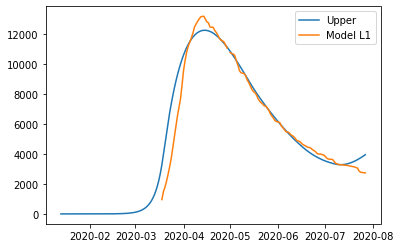

{'home': 1.0, 'leisure': 0.8960402408889129, 'other': 0.8000003181681545, 'school': 0.9071359562746278, 'transport': 0.8826055136957951, 'work': 0.8252695959982842}
{'home': 1.0, 'leisure': 0.11092380801449173, 'other': 0.06737767016374496, 'school': 0, 'transport': 0.11310198008312984, 'work': 0.32221339467724636}
{'home': 1.0, 'leisure': 0.11092380801449173, 'other': 0.06737767016374496, 'school': 0, 'transport': 0.11310198008312984, 'work': 0.32221339467724636}
{'home': 1.0, 'leisure': 0.13326178926774646, 'other': 0.16214506686742644, 'school': 0.2993548655706272, 'transport': 0.19694956220113347, 'work': 0.5812824299604228}
{'home': 1.0, 'leisure': 0.25637763453351986, 'other': 0.2322020921347298, 'school': 0.6077810907040007, 'transport': 0.2610271780453256, 'work': 0.6104350357000676}
{'home': 1.0, 'leisure': 0.4273524325968726, 'other': 0.35353559497750336, 'school': 0.6077810907040007, 'transport': 0.43217995241717305, 'work': 0.6828762101419835}
{'home': 1.0, 'leisure': 0.439

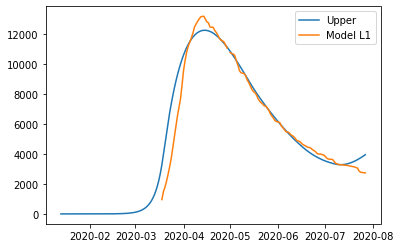

{'home': 1.0, 'leisure': 0.8960402408889129, 'other': 0.8000003181681545, 'school': 0.9071359562746278, 'transport': 0.8826055136957951, 'work': 0.8252695959982842}
{'home': 1.0, 'leisure': 0.11092380801449173, 'other': 0.06737767016374496, 'school': 0, 'transport': 0.11310198008312984, 'work': 0.32221339467724636}
{'home': 1.0, 'leisure': 0.11092380801449173, 'other': 0.06737767016374496, 'school': 0, 'transport': 0.11310198008312984, 'work': 0.32221339467724636}
{'home': 1.0, 'leisure': 0.13326178926774646, 'other': 0.16214506686742644, 'school': 0.2993548655706272, 'transport': 0.19694956220113347, 'work': 0.5812824299604228}
{'home': 1.0, 'leisure': 0.25637763453351986, 'other': 0.2322020921347298, 'school': 0.6077810907040007, 'transport': 0.2610271780453256, 'work': 0.6104350357000676}
{'home': 1.0, 'leisure': 0.4273524325968726, 'other': 0.35353559497750336, 'school': 0.6077810907040007, 'transport': 0.43217995241717305, 'work': 0.6828762101419835}
{'home': 1.0, 'leisure': 0.439

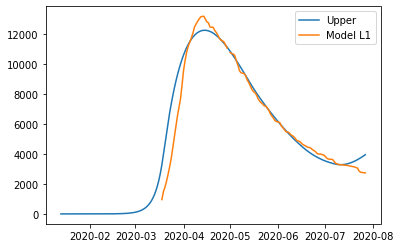

{'home': 1.0, 'leisure': 0.8960402408889129, 'other': 0.8000003181681545, 'school': 0.9071359562746278, 'transport': 0.8826055136957951, 'work': 0.8252695959982842}
{'home': 1.0, 'leisure': 0.11092380801449173, 'other': 0.06737767016374496, 'school': 0, 'transport': 0.11310198008312984, 'work': 0.32221339467724636}
{'home': 1.0, 'leisure': 0.11092380801449173, 'other': 0.06737767016374496, 'school': 0, 'transport': 0.11310198008312984, 'work': 0.32221339467724636}
{'home': 1.0, 'leisure': 0.13326178926774646, 'other': 0.16214506686742644, 'school': 0.2993548655706272, 'transport': 0.19694956220113347, 'work': 0.5812824299604228}
{'home': 1.0, 'leisure': 0.25637763453351986, 'other': 0.2322020921347298, 'school': 0.6077810907040007, 'transport': 0.2610271780453256, 'work': 0.6104350357000676}
{'home': 1.0, 'leisure': 0.4273524325968726, 'other': 0.35353559497750336, 'school': 0.6077810907040007, 'transport': 0.43217995241717305, 'work': 0.6828762101419835}
{'home': 1.0, 'leisure': 0.439

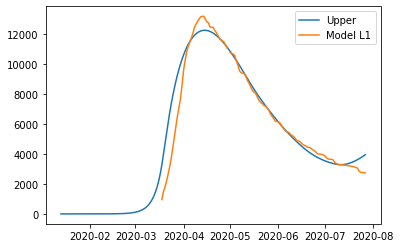

{'home': 1.0, 'leisure': 0.8960443757905352, 'other': 0.8000003185930679, 'school': 0.907136904398092, 'transport': 0.8826070264145734, 'work': 0.8252704327969616}
{'home': 1.0, 'leisure': 0.1109240170113489, 'other': 0.06737701963248532, 'school': 0, 'transport': 0.11310185735668572, 'work': 0.32220855486820943}
{'home': 1.0, 'leisure': 0.1109240170113489, 'other': 0.06737701963248532, 'school': 0, 'transport': 0.11310185735668572, 'work': 0.32220855486820943}
{'home': 1.0, 'leisure': 0.13326203234238157, 'other': 0.16214363686059255, 'school': 0.2993551784513704, 'transport': 0.19694933594255845, 'work': 0.5812743107952179}
{'home': 1.0, 'leisure': 0.2563781309032883, 'other': 0.2322004792783259, 'school': 0.6077817259467216, 'transport': 0.2610269075725897, 'work': 0.6104276806208436}
{'home': 1.0, 'leisure': 0.4273534784024518, 'other': 0.35353438032297263, 'school': 0.6077817259467216, 'transport': 0.43217956992849865, 'work': 0.6828712120929081}
{'home': 1.0, 'leisure': 0.4394875

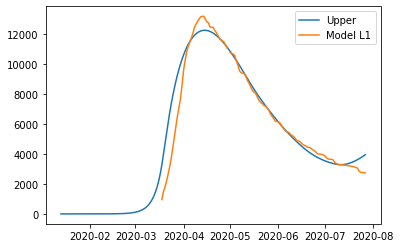

{'home': 1.0, 'leisure': 0.8960443757905352, 'other': 0.8000003185930679, 'school': 0.907136904398092, 'transport': 0.8826070264145734, 'work': 0.8252704327969616}
{'home': 1.0, 'leisure': 0.1109240170113489, 'other': 0.06737701963248532, 'school': 0, 'transport': 0.11310185735668572, 'work': 0.32220855486820943}
{'home': 1.0, 'leisure': 0.1109240170113489, 'other': 0.06737701963248532, 'school': 0, 'transport': 0.11310185735668572, 'work': 0.32220855486820943}
{'home': 1.0, 'leisure': 0.13326203234238157, 'other': 0.16214363686059255, 'school': 0.2993551784513704, 'transport': 0.19694933594255845, 'work': 0.5812743107952179}
{'home': 1.0, 'leisure': 0.2563781309032883, 'other': 0.2322004792783259, 'school': 0.6077817259467216, 'transport': 0.2610269075725897, 'work': 0.6104276806208436}
{'home': 1.0, 'leisure': 0.4273534784024518, 'other': 0.35353438032297263, 'school': 0.6077817259467216, 'transport': 0.43217956992849865, 'work': 0.6828712120929081}
{'home': 1.0, 'leisure': 0.4394875

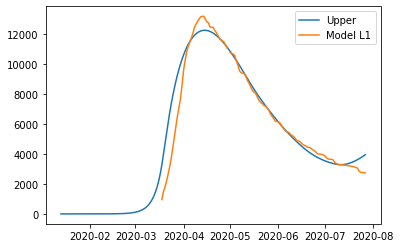

{'home': 1.0, 'leisure': 0.8960443757905352, 'other': 0.8000003185930679, 'school': 0.907136904398092, 'transport': 0.8826070264145734, 'work': 0.8252704327969616}
{'home': 1.0, 'leisure': 0.1109240170113489, 'other': 0.06737701963248532, 'school': 0, 'transport': 0.11310185735668572, 'work': 0.32220855486820943}
{'home': 1.0, 'leisure': 0.1109240170113489, 'other': 0.06737701963248532, 'school': 0, 'transport': 0.11310185735668572, 'work': 0.32220855486820943}
{'home': 1.0, 'leisure': 0.13326203234238157, 'other': 0.16214363686059255, 'school': 0.2993551784513704, 'transport': 0.19694933594255845, 'work': 0.5812743107952179}
{'home': 1.0, 'leisure': 0.2563781309032883, 'other': 0.2322004792783259, 'school': 0.6077817259467216, 'transport': 0.2610269075725897, 'work': 0.6104276806208436}
{'home': 1.0, 'leisure': 0.4273534784024518, 'other': 0.35353438032297263, 'school': 0.6077817259467216, 'transport': 0.43217956992849865, 'work': 0.6828712120929081}
{'home': 1.0, 'leisure': 0.4394875

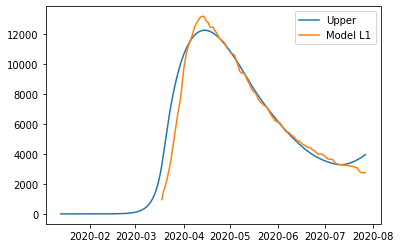

{'home': 1.0, 'leisure': 0.896046307146353, 'other': 0.800000318791539, 'school': 0.9071373472535541, 'transport': 0.8826077329847606, 'work': 0.8252708236541431}
{'home': 1.0, 'leisure': 0.11092411462968842, 'other': 0.06737671577769885, 'school': 0, 'transport': 0.11310180003203915, 'work': 0.3222062942786104}
{'home': 1.0, 'leisure': 0.11092411462968842, 'other': 0.06737671577769885, 'school': 0, 'transport': 0.11310180003203915, 'work': 0.3222062942786104}
{'home': 1.0, 'leisure': 0.13326214587770452, 'other': 0.16214296892278823, 'school': 0.29935532459367287, 'transport': 0.19694923025884278, 'work': 0.5812705184762345}
{'home': 1.0, 'leisure': 0.2563783627480195, 'other': 0.23219972593383859, 'school': 0.6077820226598812, 'transport': 0.2610267812366528, 'work': 0.6104242451932658}
{'home': 1.0, 'leisure': 0.4273539668801431, 'other': 0.3535338129734599, 'school': 0.6077820226598812, 'transport': 0.4321793912704188, 'work': 0.6828688775934649}
{'home': 1.0, 'leisure': 0.43948822

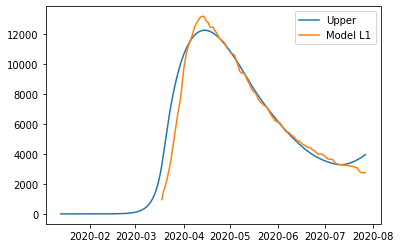

{'home': 1.0, 'leisure': 0.896046307146353, 'other': 0.800000318791539, 'school': 0.9071373472535541, 'transport': 0.8826077329847606, 'work': 0.8252708236541431}
{'home': 1.0, 'leisure': 0.11092411462968842, 'other': 0.06737671577769885, 'school': 0, 'transport': 0.11310180003203915, 'work': 0.3222062942786104}
{'home': 1.0, 'leisure': 0.11092411462968842, 'other': 0.06737671577769885, 'school': 0, 'transport': 0.11310180003203915, 'work': 0.3222062942786104}
{'home': 1.0, 'leisure': 0.13326214587770452, 'other': 0.16214296892278823, 'school': 0.29935532459367287, 'transport': 0.19694923025884278, 'work': 0.5812705184762345}
{'home': 1.0, 'leisure': 0.2563783627480195, 'other': 0.23219972593383859, 'school': 0.6077820226598812, 'transport': 0.2610267812366528, 'work': 0.6104242451932658}
{'home': 1.0, 'leisure': 0.4273539668801431, 'other': 0.3535338129734599, 'school': 0.6077820226598812, 'transport': 0.4321793912704188, 'work': 0.6828688775934649}
{'home': 1.0, 'leisure': 0.43948822

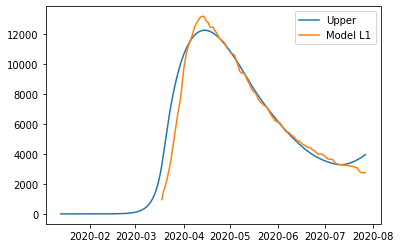

{'home': 1.0, 'leisure': 0.896046307146353, 'other': 0.800000318791539, 'school': 0.9071373472535541, 'transport': 0.8826077329847606, 'work': 0.8252708236541431}
{'home': 1.0, 'leisure': 0.11092411462968842, 'other': 0.06737671577769885, 'school': 0, 'transport': 0.11310180003203915, 'work': 0.3222062942786104}
{'home': 1.0, 'leisure': 0.11092411462968842, 'other': 0.06737671577769885, 'school': 0, 'transport': 0.11310180003203915, 'work': 0.3222062942786104}
{'home': 1.0, 'leisure': 0.13326214587770452, 'other': 0.16214296892278823, 'school': 0.29935532459367287, 'transport': 0.19694923025884278, 'work': 0.5812705184762345}
{'home': 1.0, 'leisure': 0.2563783627480195, 'other': 0.23219972593383859, 'school': 0.6077820226598812, 'transport': 0.2610267812366528, 'work': 0.6104242451932658}
{'home': 1.0, 'leisure': 0.4273539668801431, 'other': 0.3535338129734599, 'school': 0.6077820226598812, 'transport': 0.4321793912704188, 'work': 0.6828688775934649}
{'home': 1.0, 'leisure': 0.43948822

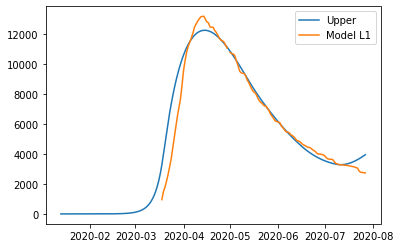

{'home': 1.0, 'leisure': 0.8960705544722759, 'other': 0.8000003182005597, 'school': 0.9071415882135239, 'transport': 0.8826151412871209, 'work': 0.8252744693760736}
{'home': 1.0, 'leisure': 0.11092502592299473, 'other': 0.06737355903631989, 'school': 0, 'transport': 0.11310077190619032, 'work': 0.32217748128748713}
{'home': 1.0, 'leisure': 0.11092502592299473, 'other': 0.06737355903631989, 'school': 0, 'transport': 0.11310077190619032, 'work': 0.32217748128748713}
{'home': 1.0, 'leisure': 0.13326310861583926, 'other': 0.16213599312928287, 'school': 0.2993567241104629, 'transport': 0.19694738819318142, 'work': 0.5812244340872292}
{'home': 1.0, 'leisure': 0.2563804200083154, 'other': 0.23219125328008505, 'school': 0.607784864103061, 'transport': 0.2610244387122288, 'work': 0.6103820421078429}
{'home': 1.0, 'leisure': 0.42735833863889855, 'other': 0.35352564430000943, 'school': 0.607784864103061, 'transport': 0.4321757733433573, 'work': 0.6828393697781296}
{'home': 1.0, 'leisure': 0.43949

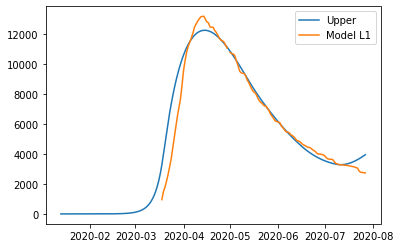

{'home': 1.0, 'leisure': 0.8960705544722759, 'other': 0.8000003182005597, 'school': 0.9071415882135239, 'transport': 0.8826151412871209, 'work': 0.8252744693760736}
{'home': 1.0, 'leisure': 0.11092502592299473, 'other': 0.06737355903631989, 'school': 0, 'transport': 0.11310077190619032, 'work': 0.32217748128748713}
{'home': 1.0, 'leisure': 0.11092502592299473, 'other': 0.06737355903631989, 'school': 0, 'transport': 0.11310077190619032, 'work': 0.32217748128748713}
{'home': 1.0, 'leisure': 0.13326310861583926, 'other': 0.16213599312928287, 'school': 0.2993567241104629, 'transport': 0.19694738819318142, 'work': 0.5812244340872292}
{'home': 1.0, 'leisure': 0.2563804200083154, 'other': 0.23219125328008505, 'school': 0.607784864103061, 'transport': 0.2610244387122288, 'work': 0.6103820421078429}
{'home': 1.0, 'leisure': 0.42735833863889855, 'other': 0.35352564430000943, 'school': 0.607784864103061, 'transport': 0.4321757733433573, 'work': 0.6828393697781296}
{'home': 1.0, 'leisure': 0.43949

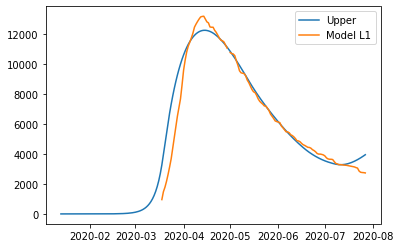

{'home': 1.00000001, 'leisure': 0.8960705544722759, 'other': 0.8000003182005597, 'school': 0.9071415882135239, 'transport': 0.8826151412871209, 'work': 0.8252744693760736}
{'home': 1.00000001, 'leisure': 0.11092502592299473, 'other': 0.06737355903631989, 'school': 0, 'transport': 0.11310077190619032, 'work': 0.32217748128748713}
{'home': 1.00000001, 'leisure': 0.11092502592299473, 'other': 0.06737355903631989, 'school': 0, 'transport': 0.11310077190619032, 'work': 0.32217748128748713}
{'home': 1.00000001, 'leisure': 0.13326310861583926, 'other': 0.16213599312928287, 'school': 0.2993567241104629, 'transport': 0.19694738819318142, 'work': 0.5812244340872292}
{'home': 1.00000001, 'leisure': 0.2563804200083154, 'other': 0.23219125328008505, 'school': 0.607784864103061, 'transport': 0.2610244387122288, 'work': 0.6103820421078429}
{'home': 1.00000001, 'leisure': 0.42735833863889855, 'other': 0.35352564430000943, 'school': 0.607784864103061, 'transport': 0.4321757733433573, 'work': 0.68283936

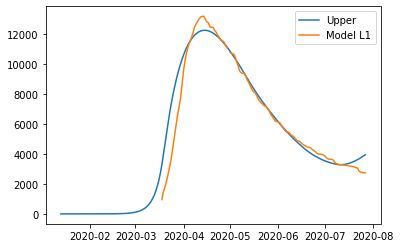

{'home': 1.0, 'leisure': 0.896047722848241, 'other': 0.8000003179882798, 'school': 0.9071356116056903, 'transport': 0.8826059589811074, 'work': 0.8252691256845469}
{'home': 1.0, 'leisure': 0.11092369532009833, 'other': 0.06737752323692899, 'school': 0, 'transport': 0.11310127569846126, 'work': 0.3222039757809059}
{'home': 1.0, 'leisure': 0.11092369532009833, 'other': 0.06737752323692899, 'school': 0, 'transport': 0.11310127569846126, 'work': 0.3222039757809059}
{'home': 1.0, 'leisure': 0.13326150611030593, 'other': 0.1621446868627762, 'school': 0.2993547518298778, 'transport': 0.19694834709433634, 'work': 0.5812701525770212}
{'home': 1.0, 'leisure': 0.2563771991690163, 'other': 0.23220071743683632, 'school': 0.6077808597758125, 'transport': 0.26102550571733224, 'work': 0.6104231982879965}
{'home': 1.0, 'leisure': 0.4273515729429635, 'other': 0.35353176401730996, 'school': 0.6077808597758125, 'transport': 0.4321771100616656, 'work': 0.6828668631712416}
{'home': 1.0, 'leisure': 0.4394857

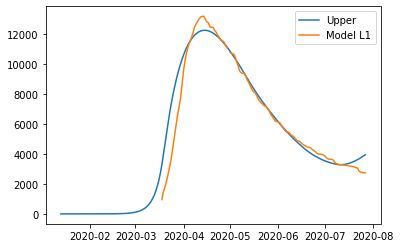

{'home': 1.0, 'leisure': 0.896047722848241, 'other': 0.8000003179882798, 'school': 0.9071356116056903, 'transport': 0.8826059589811074, 'work': 0.8252691256845469}
{'home': 1.0, 'leisure': 0.11092369532009833, 'other': 0.06737752323692899, 'school': 0, 'transport': 0.11310127569846126, 'work': 0.3222039757809059}
{'home': 1.0, 'leisure': 0.11092369532009833, 'other': 0.06737752323692899, 'school': 0, 'transport': 0.11310127569846126, 'work': 0.3222039757809059}
{'home': 1.0, 'leisure': 0.13326150611030593, 'other': 0.1621446868627762, 'school': 0.2993547518298778, 'transport': 0.19694834709433634, 'work': 0.5812701525770212}
{'home': 1.0, 'leisure': 0.2563771991690163, 'other': 0.23220071743683632, 'school': 0.6077808597758125, 'transport': 0.26102550571733224, 'work': 0.6104231982879965}
{'home': 1.0, 'leisure': 0.4273515729429635, 'other': 0.35353176401730996, 'school': 0.6077808597758125, 'transport': 0.4321771100616656, 'work': 0.6828668631712416}
{'home': 1.0, 'leisure': 0.4394857

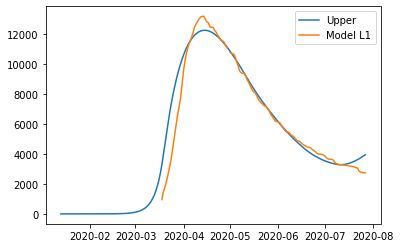

{'home': 1.0, 'leisure': 0.896047722848241, 'other': 0.8000003179882798, 'school': 0.9071356116056903, 'transport': 0.8826059589811074, 'work': 0.8252691256845469}
{'home': 1.0, 'leisure': 0.11092369532009833, 'other': 0.06737752323692899, 'school': 0, 'transport': 0.11310127569846126, 'work': 0.3222039757809059}
{'home': 1.0, 'leisure': 0.11092369532009833, 'other': 0.06737752323692899, 'school': 0, 'transport': 0.11310127569846126, 'work': 0.3222039757809059}
{'home': 1.0, 'leisure': 0.13326150611030593, 'other': 0.1621446868627762, 'school': 0.2993547518298778, 'transport': 0.19694834709433634, 'work': 0.5812701525770212}
{'home': 1.0, 'leisure': 0.2563771991690163, 'other': 0.23220071743683632, 'school': 0.6077808597758125, 'transport': 0.26102550571733224, 'work': 0.6104231982879965}
{'home': 1.0, 'leisure': 0.4273515729429635, 'other': 0.35353176401730996, 'school': 0.6077808597758125, 'transport': 0.4321771100616656, 'work': 0.6828668631712416}
{'home': 1.0, 'leisure': 0.4394857

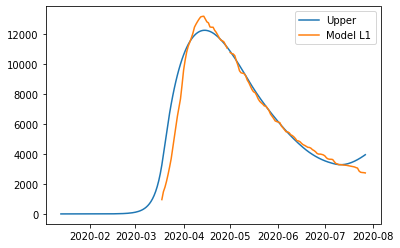

{'home': 1.00000001, 'leisure': 0.896047722848241, 'other': 0.8000003179882798, 'school': 0.9071356116056903, 'transport': 0.8826059589811074, 'work': 0.8252691256845469}
{'home': 1.00000001, 'leisure': 0.11092369532009833, 'other': 0.06737752323692899, 'school': 0, 'transport': 0.11310127569846126, 'work': 0.3222039757809059}
{'home': 1.00000001, 'leisure': 0.11092369532009833, 'other': 0.06737752323692899, 'school': 0, 'transport': 0.11310127569846126, 'work': 0.3222039757809059}
{'home': 1.00000001, 'leisure': 0.13326150611030593, 'other': 0.1621446868627762, 'school': 0.2993547518298778, 'transport': 0.19694834709433634, 'work': 0.5812701525770212}
{'home': 1.00000001, 'leisure': 0.2563771991690163, 'other': 0.23220071743683632, 'school': 0.6077808597758125, 'transport': 0.26102550571733224, 'work': 0.6104231982879965}
{'home': 1.00000001, 'leisure': 0.4273515729429635, 'other': 0.35353176401730996, 'school': 0.6077808597758125, 'transport': 0.4321771100616656, 'work': 0.6828668631

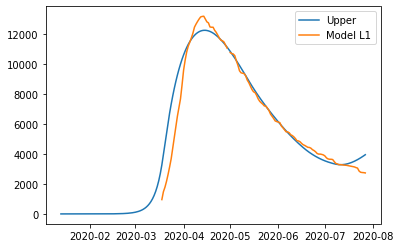

{'home': 1.0, 'leisure': 0.8960420340739824, 'other': 0.8000003288401905, 'school': 0.9071339874922857, 'transport': 0.8826038646496677, 'work': 0.8252676113390969}
{'home': 1.0, 'leisure': 0.11092333076782525, 'other': 0.0673784128724515, 'school': 0, 'transport': 0.11310138698096123, 'work': 0.32220954054344997}
{'home': 1.0, 'leisure': 0.11092333076782525, 'other': 0.0673784128724515, 'school': 0, 'transport': 0.11310138698096123, 'work': 0.32220954054344997}
{'home': 1.0, 'leisure': 0.13326106460098294, 'other': 0.16214663935018228, 'school': 0.2993542158724543, 'transport': 0.1969485590222623, 'work': 0.5812796279268785}
{'home': 1.0, 'leisure': 0.2563763208639011, 'other': 0.23220283948488724, 'school': 0.6077797716198314, 'transport': 0.26102574049564686, 'work': 0.6104316767069308}
{'home': 1.0, 'leisure': 0.4273497981434098, 'other': 0.3535331337157781, 'school': 0.6077797716198314, 'transport': 0.43217740264284876, 'work': 0.6828724270599194}
{'home': 1.0, 'leisure': 0.439483

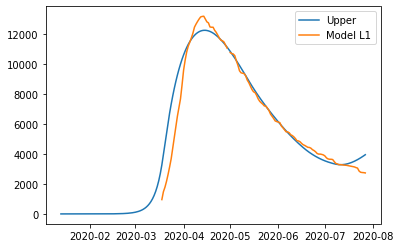

{'home': 1.0, 'leisure': 0.8960420340739824, 'other': 0.8000003288401905, 'school': 0.9071339874922857, 'transport': 0.8826038646496677, 'work': 0.8252676113390969}
{'home': 1.0, 'leisure': 0.11092333076782525, 'other': 0.0673784128724515, 'school': 0, 'transport': 0.11310138698096123, 'work': 0.32220954054344997}
{'home': 1.0, 'leisure': 0.11092333076782525, 'other': 0.0673784128724515, 'school': 0, 'transport': 0.11310138698096123, 'work': 0.32220954054344997}
{'home': 1.0, 'leisure': 0.13326106460098294, 'other': 0.16214663935018228, 'school': 0.2993542158724543, 'transport': 0.1969485590222623, 'work': 0.5812796279268785}
{'home': 1.0, 'leisure': 0.2563763208639011, 'other': 0.23220283948488724, 'school': 0.6077797716198314, 'transport': 0.26102574049564686, 'work': 0.6104316767069308}
{'home': 1.0, 'leisure': 0.4273497981434098, 'other': 0.3535331337157781, 'school': 0.6077797716198314, 'transport': 0.43217740264284876, 'work': 0.6828724270599194}
{'home': 1.0, 'leisure': 0.439483

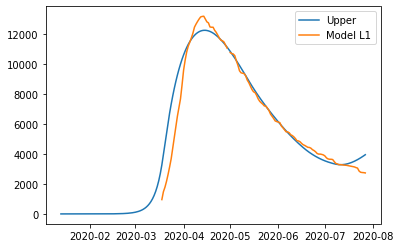

{'home': 1.0, 'leisure': 0.8960420340739824, 'other': 0.8000003288401905, 'school': 0.9071339874922857, 'transport': 0.8826038646496677, 'work': 0.8252676113390969}
{'home': 1.0, 'leisure': 0.11092333076782525, 'other': 0.0673784128724515, 'school': 0, 'transport': 0.11310138698096123, 'work': 0.32220954054344997}
{'home': 1.0, 'leisure': 0.11092333076782525, 'other': 0.0673784128724515, 'school': 0, 'transport': 0.11310138698096123, 'work': 0.32220954054344997}
{'home': 1.0, 'leisure': 0.13326106460098294, 'other': 0.16214663935018228, 'school': 0.2993542158724543, 'transport': 0.1969485590222623, 'work': 0.5812796279268785}
{'home': 1.0, 'leisure': 0.2563763208639011, 'other': 0.23220283948488724, 'school': 0.6077797716198314, 'transport': 0.26102574049564686, 'work': 0.6104316767069308}
{'home': 1.0, 'leisure': 0.4273497981434098, 'other': 0.3535331337157781, 'school': 0.6077797716198314, 'transport': 0.43217740264284876, 'work': 0.6828724270599194}
{'home': 1.0, 'leisure': 0.439483

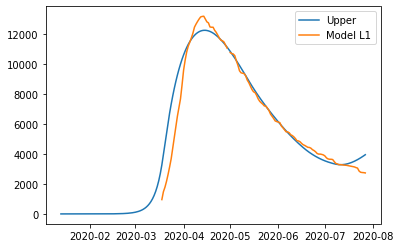

{'home': 1.0, 'leisure': 0.8960420340739824, 'other': 0.8000003288401905, 'school': 0.9071339874922857, 'transport': 0.8826038646496677, 'work': 0.8252676113390969}
{'home': 1.0, 'leisure': 0.11092333076782525, 'other': 0.0673784128724515, 'school': 0, 'transport': 0.11310138698096123, 'work': 0.32220954054344997}
{'home': 1.0, 'leisure': 0.11092333076782525, 'other': 0.0673784128724515, 'school': 0, 'transport': 0.11310138698096123, 'work': 0.32220954054344997}
{'home': 1.0, 'leisure': 0.13326106460098294, 'other': 0.16214663935018228, 'school': 0.2993542158724543, 'transport': 0.1969485590222623, 'work': 0.5812796279268785}
{'home': 1.0, 'leisure': 0.2563763208639011, 'other': 0.23220283948488724, 'school': 0.6077797716198314, 'transport': 0.26102574049564686, 'work': 0.6104316767069308}
{'home': 1.0, 'leisure': 0.4273497981434098, 'other': 0.3535331337157781, 'school': 0.6077797716198314, 'transport': 0.43217740264284876, 'work': 0.6828724270599194}
{'home': 1.0, 'leisure': 0.439483

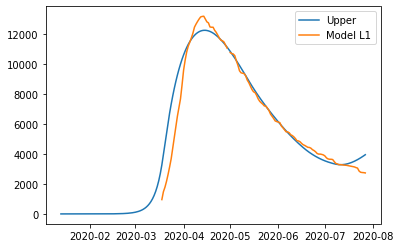

{'home': 1.00000001, 'leisure': 0.8960420340739824, 'other': 0.8000003288401905, 'school': 0.9071339874922857, 'transport': 0.8826038646496677, 'work': 0.8252676113390969}
{'home': 1.00000001, 'leisure': 0.11092333076782525, 'other': 0.0673784128724515, 'school': 0, 'transport': 0.11310138698096123, 'work': 0.32220954054344997}
{'home': 1.00000001, 'leisure': 0.11092333076782525, 'other': 0.0673784128724515, 'school': 0, 'transport': 0.11310138698096123, 'work': 0.32220954054344997}
{'home': 1.00000001, 'leisure': 0.13326106460098294, 'other': 0.16214663935018228, 'school': 0.2993542158724543, 'transport': 0.1969485590222623, 'work': 0.5812796279268785}
{'home': 1.00000001, 'leisure': 0.2563763208639011, 'other': 0.23220283948488724, 'school': 0.6077797716198314, 'transport': 0.26102574049564686, 'work': 0.6104316767069308}
{'home': 1.00000001, 'leisure': 0.4273497981434098, 'other': 0.3535331337157781, 'school': 0.6077797716198314, 'transport': 0.43217740264284876, 'work': 0.682872427

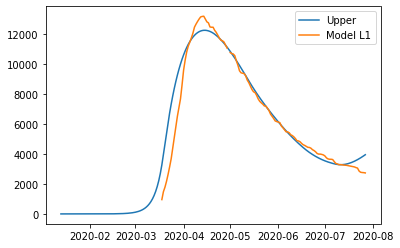

{'home': 1.0, 'leisure': 0.8960133951279009, 'other': 0.8000000480882828, 'school': 0.9071297561801243, 'transport': 0.8825916063571418, 'work': 0.8252488026595649}
{'home': 1.0, 'leisure': 0.1109223739078477, 'other': 0.0673821070685068, 'school': 0, 'transport': 0.11310239949913947, 'work': 0.3222502367630157}
{'home': 1.0, 'leisure': 0.1109223739078477, 'other': 0.0673821070685068, 'school': 0, 'transport': 0.11310239949913947, 'work': 0.3222502367630157}
{'home': 1.0, 'leisure': 0.13325982166994899, 'other': 0.16215495577137348, 'school': 0.29935281953944104, 'transport': 0.1969503768586412, 'work': 0.5813460810601628}
{'home': 1.0, 'leisure': 0.2563739033947712, 'other': 0.23221243891034685, 'school': 0.6077769366406833, 'transport': 0.2610279885766434, 'work': 0.6104890321018293}
{'home': 1.0, 'leisure': 0.4273448260227987, 'other': 0.35354162667574046, 'school': 0.6077769366406833, 'transport': 0.43218081901648453, 'work': 0.6829052054674942}
{'home': 1.0, 'leisure': 0.439474297

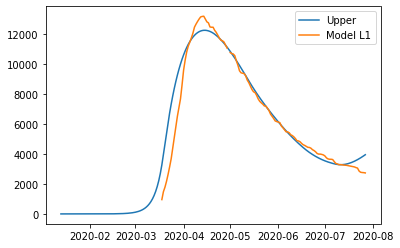

{'home': 1.0, 'leisure': 0.8960133951279009, 'other': 0.8000000480882828, 'school': 0.9071297561801243, 'transport': 0.8825916063571418, 'work': 0.8252488026595649}
{'home': 1.0, 'leisure': 0.1109223739078477, 'other': 0.0673821070685068, 'school': 0, 'transport': 0.11310239949913947, 'work': 0.3222502367630157}
{'home': 1.0, 'leisure': 0.1109223739078477, 'other': 0.0673821070685068, 'school': 0, 'transport': 0.11310239949913947, 'work': 0.3222502367630157}
{'home': 1.0, 'leisure': 0.13325982166994899, 'other': 0.16215495577137348, 'school': 0.29935281953944104, 'transport': 0.1969503768586412, 'work': 0.5813460810601628}
{'home': 1.0, 'leisure': 0.2563739033947712, 'other': 0.23221243891034685, 'school': 0.6077769366406833, 'transport': 0.2610279885766434, 'work': 0.6104890321018293}
{'home': 1.0, 'leisure': 0.4273448260227987, 'other': 0.35354162667574046, 'school': 0.6077769366406833, 'transport': 0.43218081901648453, 'work': 0.6829052054674942}
{'home': 1.0, 'leisure': 0.439474297

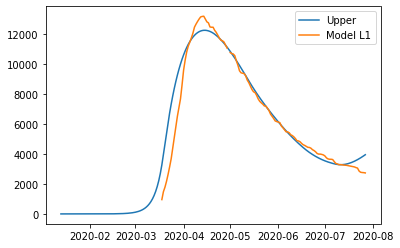

{'home': 1.0, 'leisure': 0.8960133951279009, 'other': 0.8000000480882828, 'school': 0.9071297561801243, 'transport': 0.8825916063571418, 'work': 0.8252488026595649}
{'home': 1.0, 'leisure': 0.1109223739078477, 'other': 0.0673821070685068, 'school': 0, 'transport': 0.11310239949913947, 'work': 0.3222502367630157}
{'home': 1.0, 'leisure': 0.1109223739078477, 'other': 0.0673821070685068, 'school': 0, 'transport': 0.11310239949913947, 'work': 0.3222502367630157}
{'home': 1.0, 'leisure': 0.13325982166994899, 'other': 0.16215495577137348, 'school': 0.29935281953944104, 'transport': 0.1969503768586412, 'work': 0.5813460810601628}
{'home': 1.0, 'leisure': 0.2563739033947712, 'other': 0.23221243891034685, 'school': 0.6077769366406833, 'transport': 0.2610279885766434, 'work': 0.6104890321018293}
{'home': 1.0, 'leisure': 0.4273448260227987, 'other': 0.35354162667574046, 'school': 0.6077769366406833, 'transport': 0.43218081901648453, 'work': 0.6829052054674942}
{'home': 1.0, 'leisure': 0.439474297

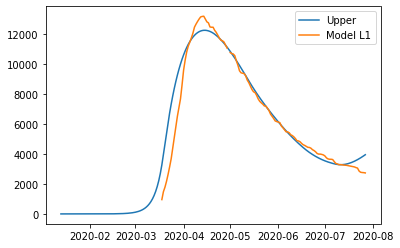

{'home': 1.0, 'leisure': 0.8960133951279009, 'other': 0.8000000480882828, 'school': 0.9071297561801243, 'transport': 0.8825916063571418, 'work': 0.8252488026595649}
{'home': 1.0, 'leisure': 0.1109223739078477, 'other': 0.0673821070685068, 'school': 0, 'transport': 0.11310239949913947, 'work': 0.3222502367630157}
{'home': 1.0, 'leisure': 0.1109223739078477, 'other': 0.0673821070685068, 'school': 0, 'transport': 0.11310239949913947, 'work': 0.3222502367630157}
{'home': 1.0, 'leisure': 0.13325982166994899, 'other': 0.16215495577137348, 'school': 0.29935281953944104, 'transport': 0.1969503768586412, 'work': 0.5813460810601628}
{'home': 1.0, 'leisure': 0.2563739033947712, 'other': 0.23221243891034685, 'school': 0.6077769366406833, 'transport': 0.2610279885766434, 'work': 0.6104890321018293}
{'home': 1.0, 'leisure': 0.4273448260227987, 'other': 0.35354162667574046, 'school': 0.6077769366406833, 'transport': 0.43218081901648453, 'work': 0.6829052054674942}
{'home': 1.0, 'leisure': 0.439474297

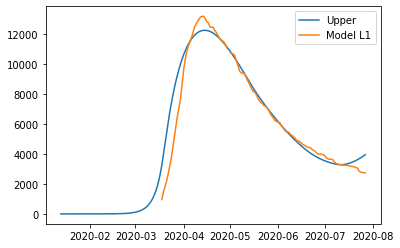

{'home': 1.00000001, 'leisure': 0.8960133951279009, 'other': 0.8000000480882828, 'school': 0.9071297561801243, 'transport': 0.8825916063571418, 'work': 0.8252488026595649}
{'home': 1.00000001, 'leisure': 0.1109223739078477, 'other': 0.0673821070685068, 'school': 0, 'transport': 0.11310239949913947, 'work': 0.3222502367630157}
{'home': 1.00000001, 'leisure': 0.1109223739078477, 'other': 0.0673821070685068, 'school': 0, 'transport': 0.11310239949913947, 'work': 0.3222502367630157}
{'home': 1.00000001, 'leisure': 0.13325982166994899, 'other': 0.16215495577137348, 'school': 0.29935281953944104, 'transport': 0.1969503768586412, 'work': 0.5813460810601628}
{'home': 1.00000001, 'leisure': 0.2563739033947712, 'other': 0.23221243891034685, 'school': 0.6077769366406833, 'transport': 0.2610279885766434, 'work': 0.6104890321018293}
{'home': 1.00000001, 'leisure': 0.4273448260227987, 'other': 0.35354162667574046, 'school': 0.6077769366406833, 'transport': 0.43218081901648453, 'work': 0.682905205467

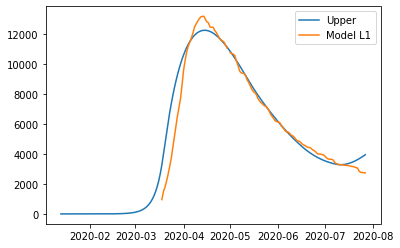

{'home': 1.0, 'leisure': 0.8960084897374087, 'other': 0.8, 'school': 0.9071290314244581, 'transport': 0.8825895067089412, 'work': 0.8252455810355049}
{'home': 1.0, 'leisure': 0.11092220999068543, 'other': 0.06738273981648928, 'school': 0, 'transport': 0.11310257291125493, 'work': 0.3222572077703637}
{'home': 1.0, 'leisure': 0.11092220999068543, 'other': 0.06738273981648928, 'school': 0, 'transport': 0.11310257291125493, 'work': 0.3222572077703637}
{'home': 1.0, 'leisure': 0.13325960874970832, 'other': 0.16215638022167908, 'school': 0.2993525803700712, 'transport': 0.19695068819663916, 'work': 0.5813574640758632}
{'home': 1.0, 'leisure': 0.25637348927111847, 'other': 0.23221408311569913, 'school': 0.6077764510543869, 'transport': 0.26102837360046754, 'work': 0.6104988567511647}
{'home': 1.0, 'leisure': 0.42734397430322885, 'other': 0.35354308136374935, 'school': 0.6077764510543869, 'transport': 0.43218140412814204, 'work': 0.6829108202836082}
{'home': 1.0, 'leisure': 0.439472738166689, 

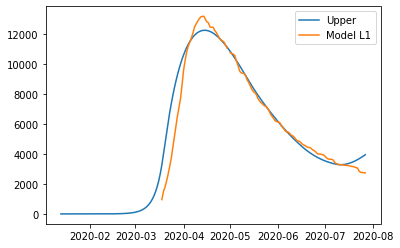

{'home': 1.0, 'leisure': 0.8960084897374087, 'other': 0.8, 'school': 0.9071290314244581, 'transport': 0.8825895067089412, 'work': 0.8252455810355049}
{'home': 1.0, 'leisure': 0.11092220999068543, 'other': 0.06738273981648928, 'school': 0, 'transport': 0.11310257291125493, 'work': 0.3222572077703637}
{'home': 1.0, 'leisure': 0.11092220999068543, 'other': 0.06738273981648928, 'school': 0, 'transport': 0.11310257291125493, 'work': 0.3222572077703637}
{'home': 1.0, 'leisure': 0.13325960874970832, 'other': 0.16215638022167908, 'school': 0.2993525803700712, 'transport': 0.19695068819663916, 'work': 0.5813574640758632}
{'home': 1.0, 'leisure': 0.25637348927111847, 'other': 0.23221408311569913, 'school': 0.6077764510543869, 'transport': 0.26102837360046754, 'work': 0.6104988567511647}
{'home': 1.0, 'leisure': 0.42734397430322885, 'other': 0.35354308136374935, 'school': 0.6077764510543869, 'transport': 0.43218140412814204, 'work': 0.6829108202836082}
{'home': 1.0, 'leisure': 0.439472738166689, 

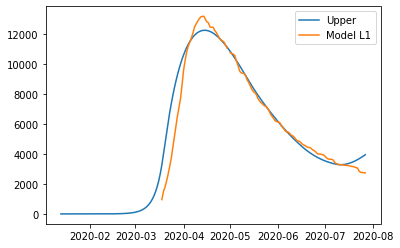

{'home': 1.0, 'leisure': 0.8960084897374087, 'other': 0.8, 'school': 0.9071290314244581, 'transport': 0.8825895067089412, 'work': 0.8252455810355049}
{'home': 1.0, 'leisure': 0.11092220999068543, 'other': 0.06738273981648928, 'school': 0, 'transport': 0.11310257291125493, 'work': 0.3222572077703637}
{'home': 1.0, 'leisure': 0.11092220999068543, 'other': 0.06738273981648928, 'school': 0, 'transport': 0.11310257291125493, 'work': 0.3222572077703637}
{'home': 1.0, 'leisure': 0.13325960874970832, 'other': 0.16215638022167908, 'school': 0.2993525803700712, 'transport': 0.19695068819663916, 'work': 0.5813574640758632}
{'home': 1.0, 'leisure': 0.25637348927111847, 'other': 0.23221408311569913, 'school': 0.6077764510543869, 'transport': 0.26102837360046754, 'work': 0.6104988567511647}
{'home': 1.0, 'leisure': 0.42734397430322885, 'other': 0.35354308136374935, 'school': 0.6077764510543869, 'transport': 0.43218140412814204, 'work': 0.6829108202836082}
{'home': 1.0, 'leisure': 0.439472738166689, 

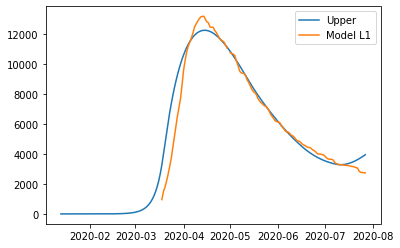

{'home': 1.0, 'leisure': 0.8960084897374087, 'other': 0.8, 'school': 0.9071290314244581, 'transport': 0.8825895067089412, 'work': 0.8252455810355049}
{'home': 1.0, 'leisure': 0.11092220999068543, 'other': 0.06738273981648928, 'school': 0, 'transport': 0.11310257291125493, 'work': 0.3222572077703637}
{'home': 1.0, 'leisure': 0.11092220999068543, 'other': 0.06738273981648928, 'school': 0, 'transport': 0.11310257291125493, 'work': 0.3222572077703637}
{'home': 1.0, 'leisure': 0.13325960874970832, 'other': 0.16215638022167908, 'school': 0.2993525803700712, 'transport': 0.19695068819663916, 'work': 0.5813574640758632}
{'home': 1.0, 'leisure': 0.25637348927111847, 'other': 0.23221408311569913, 'school': 0.6077764510543869, 'transport': 0.26102837360046754, 'work': 0.6104988567511647}
{'home': 1.0, 'leisure': 0.42734397430322885, 'other': 0.35354308136374935, 'school': 0.6077764510543869, 'transport': 0.43218140412814204, 'work': 0.6829108202836082}
{'home': 1.0, 'leisure': 0.439472738166689, 

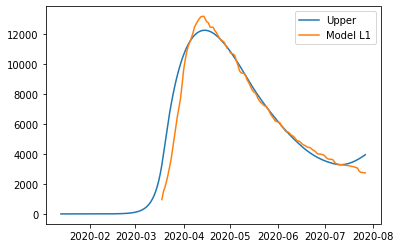

{'home': 1.00000001, 'leisure': 0.8960084897374087, 'other': 0.8, 'school': 0.9071290314244581, 'transport': 0.8825895067089412, 'work': 0.8252455810355049}
{'home': 1.00000001, 'leisure': 0.11092220999068543, 'other': 0.06738273981648928, 'school': 0, 'transport': 0.11310257291125493, 'work': 0.3222572077703637}
{'home': 1.00000001, 'leisure': 0.11092220999068543, 'other': 0.06738273981648928, 'school': 0, 'transport': 0.11310257291125493, 'work': 0.3222572077703637}
{'home': 1.00000001, 'leisure': 0.13325960874970832, 'other': 0.16215638022167908, 'school': 0.2993525803700712, 'transport': 0.19695068819663916, 'work': 0.5813574640758632}
{'home': 1.00000001, 'leisure': 0.25637348927111847, 'other': 0.23221408311569913, 'school': 0.6077764510543869, 'transport': 0.26102837360046754, 'work': 0.6104988567511647}
{'home': 1.00000001, 'leisure': 0.42734397430322885, 'other': 0.35354308136374935, 'school': 0.6077764510543869, 'transport': 0.43218140412814204, 'work': 0.6829108202836082}
{'

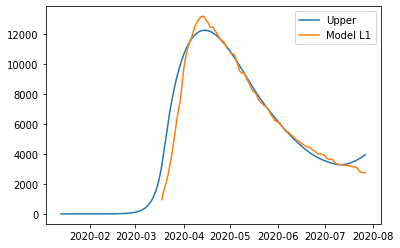

{'home': 1.0, 'leisure': 0.8959797720748974, 'other': 0.8, 'school': 0.9071247870243331, 'transport': 0.8825772161368293, 'work': 0.8252267446455381}
{'home': 1.0, 'leisure': 0.11092124995489476, 'other': 0.0673864698431008, 'school': 0, 'transport': 0.11310358805598454, 'work': 0.3222980208201464}
{'home': 1.0, 'leisure': 0.11092124995489476, 'other': 0.0673864698431008, 'school': 0, 'transport': 0.11310358805598454, 'work': 0.3222980208201464}
{'home': 1.0, 'leisure': 0.1332583620723041, 'other': 0.16216478054615466, 'school': 0.29935117971802994, 'transport': 0.19695251081943657, 'work': 0.58142411204099}
{'home': 1.0, 'leisure': 0.25637106416084626, 'other': 0.23222379498332027, 'school': 0.6077736073063033, 'transport': 0.2610306275084133, 'work': 0.6105563860206921}
{'home': 1.0, 'leisure': 0.42733898576803947, 'other': 0.35355172378671745, 'school': 0.6077736073063033, 'transport': 0.4321848290292149, 'work': 0.6829437111975576}
{'home': 1.0, 'leisure': 0.4394636059940022, 'othe

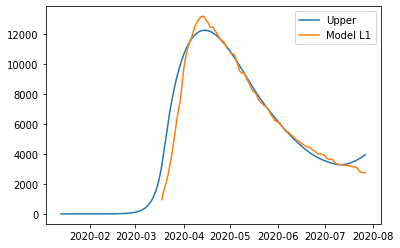

{'home': 1.0, 'leisure': 0.8959797720748974, 'other': 0.8, 'school': 0.9071247870243331, 'transport': 0.8825772161368293, 'work': 0.8252267446455381}
{'home': 1.0, 'leisure': 0.11092124995489476, 'other': 0.0673864698431008, 'school': 0, 'transport': 0.11310358805598454, 'work': 0.3222980208201464}
{'home': 1.0, 'leisure': 0.11092124995489476, 'other': 0.0673864698431008, 'school': 0, 'transport': 0.11310358805598454, 'work': 0.3222980208201464}
{'home': 1.0, 'leisure': 0.1332583620723041, 'other': 0.16216478054615466, 'school': 0.29935117971802994, 'transport': 0.19695251081943657, 'work': 0.58142411204099}
{'home': 1.0, 'leisure': 0.25637106416084626, 'other': 0.23222379498332027, 'school': 0.6077736073063033, 'transport': 0.2610306275084133, 'work': 0.6105563860206921}
{'home': 1.0, 'leisure': 0.42733898576803947, 'other': 0.35355172378671745, 'school': 0.6077736073063033, 'transport': 0.4321848290292149, 'work': 0.6829437111975576}
{'home': 1.0, 'leisure': 0.4394636059940022, 'othe

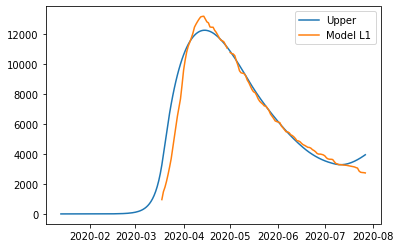

{'home': 1.0, 'leisure': 0.8956474694873551, 'other': 0.8, 'school': 0.9070633163581757, 'transport': 0.8824356097403729, 'work': 0.8250026257718176}
{'home': 1.0, 'leisure': 0.11090720967449572, 'other': 0.06742975199501758, 'school': 0, 'transport': 0.11311326799911074, 'work': 0.32272826589000364}
{'home': 1.0, 'leisure': 0.11090720967449572, 'other': 0.06742975199501758, 'school': 0, 'transport': 0.11311326799911074, 'work': 0.32272826589000364}
{'home': 1.0, 'leisure': 0.1332399821463177, 'other': 0.16226203800553732, 'school': 0.299330894398198, 'transport': 0.1969700472148321, 'work': 0.5821303947949537}
{'home': 1.0, 'leisure': 0.25633568108168947, 'other': 0.23233332562298067, 'school': 0.6077324219599778, 'transport': 0.2610517845412799, 'work': 0.6111609924904384}
{'home': 1.0, 'leisure': 0.4272684473431453, 'other': 0.35364095682988933, 'school': 0.6077324219599778, 'transport': 0.43221602575161755, 'work': 0.6832790004243605}
{'home': 1.0, 'leisure': 0.43934799618301956, '

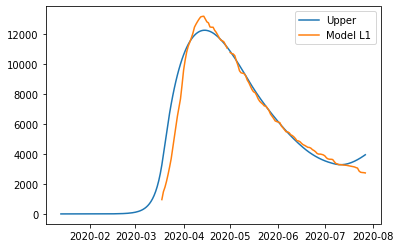

{'home': 1.0, 'leisure': 0.8956474694873551, 'other': 0.8, 'school': 0.9070633163581757, 'transport': 0.8824356097403729, 'work': 0.8250026257718176}
{'home': 1.0, 'leisure': 0.11090720967449572, 'other': 0.06742975199501758, 'school': 0, 'transport': 0.11311326799911074, 'work': 0.32272826589000364}
{'home': 1.0, 'leisure': 0.11090720967449572, 'other': 0.06742975199501758, 'school': 0, 'transport': 0.11311326799911074, 'work': 0.32272826589000364}
{'home': 1.0, 'leisure': 0.1332399821463177, 'other': 0.16226203800553732, 'school': 0.299330894398198, 'transport': 0.1969700472148321, 'work': 0.5821303947949537}
{'home': 1.0, 'leisure': 0.25633568108168947, 'other': 0.23233332562298067, 'school': 0.6077324219599778, 'transport': 0.2610517845412799, 'work': 0.6111609924904384}
{'home': 1.0, 'leisure': 0.4272684473431453, 'other': 0.35364095682988933, 'school': 0.6077324219599778, 'transport': 0.43221602575161755, 'work': 0.6832790004243605}
{'home': 1.0, 'leisure': 0.43934799618301956, '

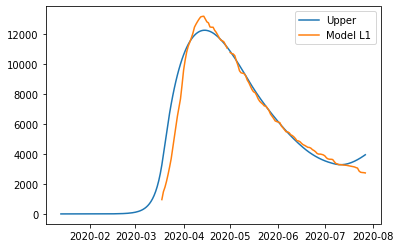

{'home': 1.0, 'leisure': 0.8956474694873551, 'other': 0.8, 'school': 0.9070633163581757, 'transport': 0.8824356097403729, 'work': 0.8250026257718176}
{'home': 1.0, 'leisure': 0.11090720967449572, 'other': 0.06742975199501758, 'school': 0, 'transport': 0.11311326799911074, 'work': 0.32272826589000364}
{'home': 1.0, 'leisure': 0.11090720967449572, 'other': 0.06742975199501758, 'school': 0, 'transport': 0.11311326799911074, 'work': 0.32272826589000364}
{'home': 1.0, 'leisure': 0.1332399821463177, 'other': 0.16226203800553732, 'school': 0.299330894398198, 'transport': 0.1969700472148321, 'work': 0.5821303947949537}
{'home': 1.0, 'leisure': 0.25633568108168947, 'other': 0.23233332562298067, 'school': 0.6077324219599778, 'transport': 0.2610517845412799, 'work': 0.6111609924904384}
{'home': 1.0, 'leisure': 0.4272684473431453, 'other': 0.35364095682988933, 'school': 0.6077324219599778, 'transport': 0.43221602575161755, 'work': 0.6832790004243605}
{'home': 1.0, 'leisure': 0.43934799618301956, '

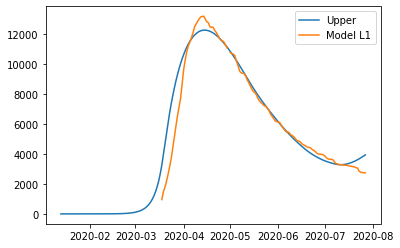

{'home': 1.0, 'leisure': 0.8943182591371857, 'other': 0.8, 'school': 0.9068174336935463, 'transport': 0.8818691841545476, 'work': 0.8241061502769355}
{'home': 1.0, 'leisure': 0.11085078560280247, 'other': 0.06760278930507403, 'school': 0, 'transport': 0.1131517978534628, 'work': 0.3244535275827838}
{'home': 1.0, 'leisure': 0.11085078560280247, 'other': 0.06760278930507403, 'school': 0, 'transport': 0.1131517978534628, 'work': 0.3244535275827838}
{'home': 1.0, 'leisure': 0.1331661612139525, 'other': 0.16265086269213938, 'school': 0.2992497531188703, 'transport': 0.19703985744038555, 'work': 0.5849626716553116}
{'home': 1.0, 'leisure': 0.25619356946150684, 'other': 0.23277121714214632, 'school': 0.607567680574676, 'transport': 0.2611359824379181, 'work': 0.6135857888902487}
{'home': 1.0, 'leisure': 0.4269854401808612, 'other': 0.35399770077802534, 'school': 0.607567680574676, 'transport': 0.43234012646524334, 'work': 0.6846244634685471}
{'home': 1.0, 'leisure': 0.43888509719314117, 'othe

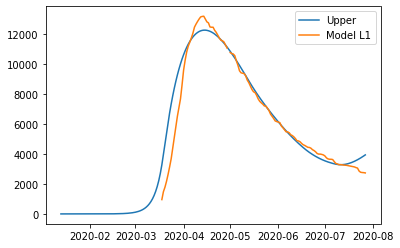

{'home': 1.0, 'leisure': 0.8943182591371857, 'other': 0.8, 'school': 0.9068174336935463, 'transport': 0.8818691841545476, 'work': 0.8241061502769355}
{'home': 1.0, 'leisure': 0.11085078560280247, 'other': 0.06760278930507403, 'school': 0, 'transport': 0.1131517978534628, 'work': 0.3244535275827838}
{'home': 1.0, 'leisure': 0.11085078560280247, 'other': 0.06760278930507403, 'school': 0, 'transport': 0.1131517978534628, 'work': 0.3244535275827838}
{'home': 1.0, 'leisure': 0.1331661612139525, 'other': 0.16265086269213938, 'school': 0.2992497531188703, 'transport': 0.19703985744038555, 'work': 0.5849626716553116}
{'home': 1.0, 'leisure': 0.25619356946150684, 'other': 0.23277121714214632, 'school': 0.607567680574676, 'transport': 0.2611359824379181, 'work': 0.6135857888902487}
{'home': 1.0, 'leisure': 0.4269854401808612, 'other': 0.35399770077802534, 'school': 0.607567680574676, 'transport': 0.43234012646524334, 'work': 0.6846244634685471}
{'home': 1.0, 'leisure': 0.43888509719314117, 'othe

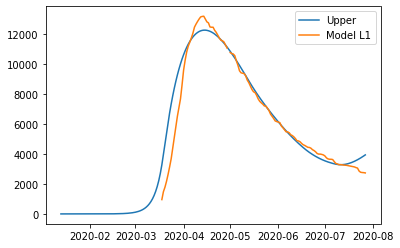

{'home': 1.0, 'leisure': 0.8943182591371857, 'other': 0.8, 'school': 0.9068174336935463, 'transport': 0.8818691841545476, 'work': 0.8241061502769355}
{'home': 1.0, 'leisure': 0.11085078560280247, 'other': 0.06760278930507403, 'school': 0, 'transport': 0.1131517978534628, 'work': 0.3244535275827838}
{'home': 1.0, 'leisure': 0.11085078560280247, 'other': 0.06760278930507403, 'school': 0, 'transport': 0.1131517978534628, 'work': 0.3244535275827838}
{'home': 1.0, 'leisure': 0.1331661612139525, 'other': 0.16265086269213938, 'school': 0.2992497531188703, 'transport': 0.19703985744038555, 'work': 0.5849626716553116}
{'home': 1.0, 'leisure': 0.25619356946150684, 'other': 0.23277121714214632, 'school': 0.607567680574676, 'transport': 0.2611359824379181, 'work': 0.6135857888902487}
{'home': 1.0, 'leisure': 0.4269854401808612, 'other': 0.35399770077802534, 'school': 0.607567680574676, 'transport': 0.43234012646524334, 'work': 0.6846244634685471}
{'home': 1.0, 'leisure': 0.43888509719314117, 'othe

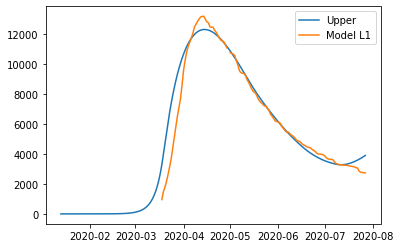

{'home': 1.0, 'leisure': 0.889001417736508, 'other': 0.8, 'school': 0.9058339030350285, 'transport': 0.8796034818112464, 'work': 0.8205202482974069}
{'home': 1.0, 'leisure': 0.11062089219695093, 'other': 0.06829348101341415, 'school': 0, 'transport': 0.11330289009026658, 'work': 0.33142407454164996}
{'home': 1.0, 'leisure': 0.11062089219695093, 'other': 0.06829348101341415, 'school': 0, 'transport': 0.11330289009026658, 'work': 0.33142407454164996}
{'home': 1.0, 'leisure': 0.13286606937998544, 'other': 0.164202886281424, 'school': 0.2989251880015594, 'transport': 0.19731375297013032, 'work': 0.5964077775985916}
{'home': 1.0, 'leisure': 0.2556158763365187, 'other': 0.2345190947608026, 'school': 0.6069087150334691, 'transport': 0.26146591634125893, 'work': 0.6233883871611992}
{'home': 1.0, 'leisure': 0.42583978885330803, 'other': 0.35542167163666644, 'school': 0.6069087150334691, 'transport': 0.43282559208914706, 'work': 0.690076217171652}
{'home': 1.0, 'leisure': 0.43702616292681057, 'o

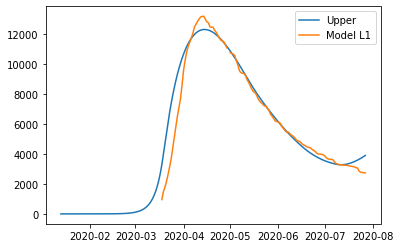

{'home': 1.0, 'leisure': 0.889001417736508, 'other': 0.8, 'school': 0.9058339030350285, 'transport': 0.8796034818112464, 'work': 0.8205202482974069}
{'home': 1.0, 'leisure': 0.11062089219695093, 'other': 0.06829348101341415, 'school': 0, 'transport': 0.11330289009026658, 'work': 0.33142407454164996}
{'home': 1.0, 'leisure': 0.11062089219695093, 'other': 0.06829348101341415, 'school': 0, 'transport': 0.11330289009026658, 'work': 0.33142407454164996}
{'home': 1.0, 'leisure': 0.13286606937998544, 'other': 0.164202886281424, 'school': 0.2989251880015594, 'transport': 0.19731375297013032, 'work': 0.5964077775985916}
{'home': 1.0, 'leisure': 0.2556158763365187, 'other': 0.2345190947608026, 'school': 0.6069087150334691, 'transport': 0.26146591634125893, 'work': 0.6233883871611992}
{'home': 1.0, 'leisure': 0.42583978885330803, 'other': 0.35542167163666644, 'school': 0.6069087150334691, 'transport': 0.43282559208914706, 'work': 0.690076217171652}
{'home': 1.0, 'leisure': 0.43702616292681057, 'o

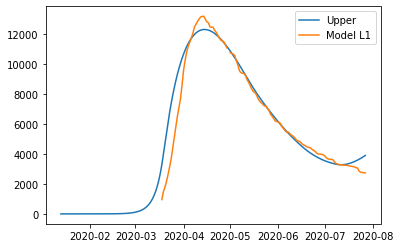

{'home': 1.0, 'leisure': 0.889001417736508, 'other': 0.8, 'school': 0.9058339030350285, 'transport': 0.8796034818112464, 'work': 0.8205202482974069}
{'home': 1.0, 'leisure': 0.11062089219695093, 'other': 0.06829348101341415, 'school': 0, 'transport': 0.11330289009026658, 'work': 0.33142407454164996}
{'home': 1.0, 'leisure': 0.11062089219695093, 'other': 0.06829348101341415, 'school': 0, 'transport': 0.11330289009026658, 'work': 0.33142407454164996}
{'home': 1.0, 'leisure': 0.13286606937998544, 'other': 0.164202886281424, 'school': 0.2989251880015594, 'transport': 0.19731375297013032, 'work': 0.5964077775985916}
{'home': 1.0, 'leisure': 0.2556158763365187, 'other': 0.2345190947608026, 'school': 0.6069087150334691, 'transport': 0.26146591634125893, 'work': 0.6233883871611992}
{'home': 1.0, 'leisure': 0.42583978885330803, 'other': 0.35542167163666644, 'school': 0.6069087150334691, 'transport': 0.43282559208914706, 'work': 0.690076217171652}
{'home': 1.0, 'leisure': 0.43702616292681057, 'o

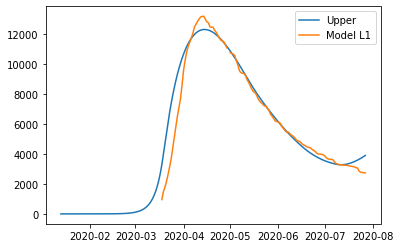

{'home': 1.0, 'leisure': 0.889001417736508, 'other': 0.8, 'school': 0.9058339030350285, 'transport': 0.8796034818112464, 'work': 0.8205202482974069}
{'home': 1.0, 'leisure': 0.11062089219695093, 'other': 0.06829348101341415, 'school': 0, 'transport': 0.11330289009026658, 'work': 0.33142407454164996}
{'home': 1.0, 'leisure': 0.11062089219695093, 'other': 0.06829348101341415, 'school': 0, 'transport': 0.11330289009026658, 'work': 0.33142407454164996}
{'home': 1.0, 'leisure': 0.13286606937998544, 'other': 0.164202886281424, 'school': 0.2989251880015594, 'transport': 0.19731375297013032, 'work': 0.5964077775985916}
{'home': 1.0, 'leisure': 0.2556158763365187, 'other': 0.2345190947608026, 'school': 0.6069087150334691, 'transport': 0.26146591634125893, 'work': 0.6233883871611992}
{'home': 1.0, 'leisure': 0.42583978885330803, 'other': 0.35542167163666644, 'school': 0.6069087150334691, 'transport': 0.43282559208914706, 'work': 0.690076217171652}
{'home': 1.0, 'leisure': 0.43702616292681057, 'o

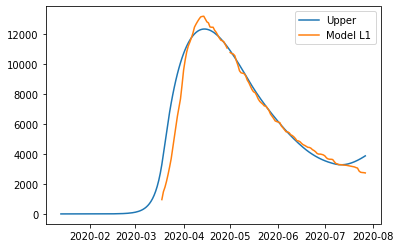

{'home': 1.0, 'leisure': 0.8859361898744433, 'other': 0.8, 'school': 0.9052628196843289, 'transport': 0.878291615515976, 'work': 0.818439263918334}
{'home': 1.0, 'leisure': 0.11048321258894628, 'other': 0.06868997688184385, 'school': 0, 'transport': 0.11338556854132524, 'work': 0.3354780904723873}
{'home': 1.0, 'leisure': 0.11048321258894628, 'other': 0.06868997688184385, 'school': 0, 'transport': 0.11338556854132524, 'work': 0.3354780904723873}
{'home': 1.0, 'leisure': 0.13268660806706678, 'other': 0.1650938478490716, 'school': 0.29873673049582855, 'transport': 0.19746390333631808, 'work': 0.6030740648690005}
{'home': 1.0, 'leisure': 0.25527076738775295, 'other': 0.23552030844621435, 'school': 0.6065260891885004, 'transport': 0.26164588240624126, 'work': 0.6290954927450179}
{'home': 1.0, 'leisure': 0.4251604618373796, 'other': 0.35623157238829806, 'school': 0.6065260891885004, 'transport': 0.4330887030449292, 'work': 0.693247855961215}
{'home': 1.0, 'leisure': 0.4359400923736348, 'oth

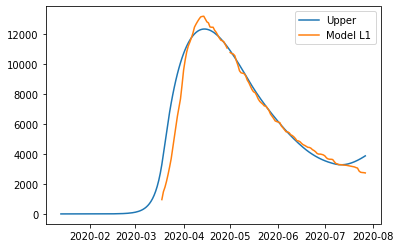

{'home': 1.0, 'leisure': 0.8859361898744433, 'other': 0.8, 'school': 0.9052628196843289, 'transport': 0.878291615515976, 'work': 0.818439263918334}
{'home': 1.0, 'leisure': 0.11048321258894628, 'other': 0.06868997688184385, 'school': 0, 'transport': 0.11338556854132524, 'work': 0.3354780904723873}
{'home': 1.0, 'leisure': 0.11048321258894628, 'other': 0.06868997688184385, 'school': 0, 'transport': 0.11338556854132524, 'work': 0.3354780904723873}
{'home': 1.0, 'leisure': 0.13268660806706678, 'other': 0.1650938478490716, 'school': 0.29873673049582855, 'transport': 0.19746390333631808, 'work': 0.6030740648690005}
{'home': 1.0, 'leisure': 0.25527076738775295, 'other': 0.23552030844621435, 'school': 0.6065260891885004, 'transport': 0.26164588240624126, 'work': 0.6290954927450179}
{'home': 1.0, 'leisure': 0.4251604618373796, 'other': 0.35623157238829806, 'school': 0.6065260891885004, 'transport': 0.4330887030449292, 'work': 0.693247855961215}
{'home': 1.0, 'leisure': 0.4359400923736348, 'oth

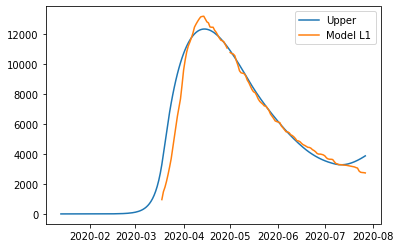

{'home': 1.0, 'leisure': 0.8859361898744433, 'other': 0.8, 'school': 0.9052628196843289, 'transport': 0.878291615515976, 'work': 0.818439263918334}
{'home': 1.0, 'leisure': 0.11048321258894628, 'other': 0.06868997688184385, 'school': 0, 'transport': 0.11338556854132524, 'work': 0.3354780904723873}
{'home': 1.0, 'leisure': 0.11048321258894628, 'other': 0.06868997688184385, 'school': 0, 'transport': 0.11338556854132524, 'work': 0.3354780904723873}
{'home': 1.0, 'leisure': 0.13268660806706678, 'other': 0.1650938478490716, 'school': 0.29873673049582855, 'transport': 0.19746390333631808, 'work': 0.6030740648690005}
{'home': 1.0, 'leisure': 0.25527076738775295, 'other': 0.23552030844621435, 'school': 0.6065260891885004, 'transport': 0.26164588240624126, 'work': 0.6290954927450179}
{'home': 1.0, 'leisure': 0.4251604618373796, 'other': 0.35623157238829806, 'school': 0.6065260891885004, 'transport': 0.4330887030449292, 'work': 0.693247855961215}
{'home': 1.0, 'leisure': 0.4359400923736348, 'oth

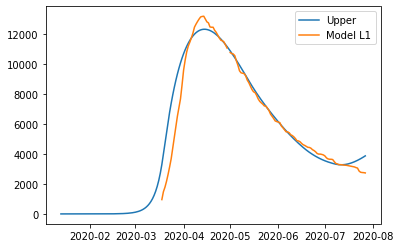

{'home': 1.0, 'leisure': 0.8858127447099403, 'other': 0.8, 'school': 0.9052260117568837, 'transport': 0.8782180641175221, 'work': 0.8182991371397231}
{'home': 1.0, 'leisure': 0.11046960931668262, 'other': 0.0687019589627016, 'school': 0, 'transport': 0.1133802412045208, 'work': 0.3355775292489724}
{'home': 1.0, 'leisure': 0.11046960931668262, 'other': 0.0687019589627016, 'school': 0, 'transport': 0.1133802412045208, 'work': 0.3355775292489724}
{'home': 1.0, 'leisure': 0.13266801293833907, 'other': 0.1651209759747969, 'school': 0.29872458387977163, 'transport': 0.19745487379530727, 'work': 0.6032681431935131}
{'home': 1.0, 'leisure': 0.2552364049513372, 'other': 0.23554297675418046, 'school': 0.6065014278771121, 'transport': 0.2616327489600641, 'work': 0.6292395448138673}
{'home': 1.0, 'leisure': 0.42509955205959693, 'other': 0.35622970065474996, 'school': 0.6065014278771121, 'transport': 0.4330653712766946, 'work': 0.693280970913716}
{'home': 1.0, 'leisure': 0.4358626824987919, 'other'

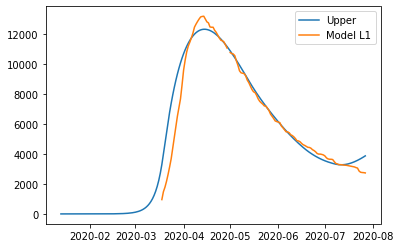

{'home': 1.0, 'leisure': 0.8858127447099403, 'other': 0.8, 'school': 0.9052260117568837, 'transport': 0.8782180641175221, 'work': 0.8182991371397231}
{'home': 1.0, 'leisure': 0.11046960931668262, 'other': 0.0687019589627016, 'school': 0, 'transport': 0.1133802412045208, 'work': 0.3355775292489724}
{'home': 1.0, 'leisure': 0.11046960931668262, 'other': 0.0687019589627016, 'school': 0, 'transport': 0.1133802412045208, 'work': 0.3355775292489724}
{'home': 1.0, 'leisure': 0.13266801293833907, 'other': 0.1651209759747969, 'school': 0.29872458387977163, 'transport': 0.19745487379530727, 'work': 0.6032681431935131}
{'home': 1.0, 'leisure': 0.2552364049513372, 'other': 0.23554297675418046, 'school': 0.6065014278771121, 'transport': 0.2616327489600641, 'work': 0.6292395448138673}
{'home': 1.0, 'leisure': 0.42509955205959693, 'other': 0.35622970065474996, 'school': 0.6065014278771121, 'transport': 0.4330653712766946, 'work': 0.693280970913716}
{'home': 1.0, 'leisure': 0.4358626824987919, 'other'

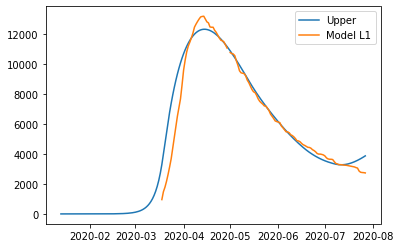

{'home': 1.0, 'leisure': 0.8858127447099403, 'other': 0.8, 'school': 0.9052260117568837, 'transport': 0.8782180641175221, 'work': 0.8182991371397231}
{'home': 1.0, 'leisure': 0.11046960931668262, 'other': 0.0687019589627016, 'school': 0, 'transport': 0.1133802412045208, 'work': 0.3355775292489724}
{'home': 1.0, 'leisure': 0.11046960931668262, 'other': 0.0687019589627016, 'school': 0, 'transport': 0.1133802412045208, 'work': 0.3355775292489724}
{'home': 1.0, 'leisure': 0.13266801293833907, 'other': 0.1651209759747969, 'school': 0.29872458387977163, 'transport': 0.19745487379530727, 'work': 0.6032681431935131}
{'home': 1.0, 'leisure': 0.2552364049513372, 'other': 0.23554297675418046, 'school': 0.6065014278771121, 'transport': 0.2616327489600641, 'work': 0.6292395448138673}
{'home': 1.0, 'leisure': 0.42509955205959693, 'other': 0.35622970065474996, 'school': 0.6065014278771121, 'transport': 0.4330653712766946, 'work': 0.693280970913716}
{'home': 1.0, 'leisure': 0.4358626824987919, 'other'

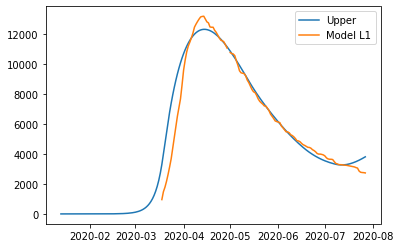

{'home': 1.0, 'leisure': 0.8787819399937761, 'other': 0.8, 'school': 0.9038299258023351, 'transport': 0.8750858628663233, 'work': 0.8131793924390928}
{'home': 1.0, 'leisure': 0.11009779209891508, 'other': 0.0695847930231397, 'school': 0, 'transport': 0.11351243420171818, 'work': 0.34461388431232776}
{'home': 1.0, 'leisure': 0.11009779209891508, 'other': 0.0695847930231397, 'school': 0, 'transport': 0.11351243420171818, 'work': 0.34461388431232776}
{'home': 1.0, 'leisure': 0.13217937566779986, 'other': 0.16710609053970094, 'school': 0.2982638755147706, 'transport': 0.1976990788221902, 'work': 0.6183132519548271}
{'home': 1.0, 'leisure': 0.2543051601283324, 'other': 0.23772649428276363, 'school': 0.6055660502875646, 'transport': 0.2619107845277942, 'work': 0.6419914603445898}
{'home': 1.0, 'leisure': 0.4233155038937679, 'other': 0.35787412371044675, 'school': 0.6055660502875646, 'transport': 0.4334454966537638, 'work': 0.7001023372673659}
{'home': 1.0, 'leisure': 0.43315773124457757, 'ot

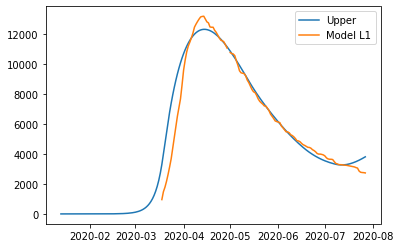

{'home': 1.0, 'leisure': 0.8787819399937761, 'other': 0.8, 'school': 0.9038299258023351, 'transport': 0.8750858628663233, 'work': 0.8131793924390928}
{'home': 1.0, 'leisure': 0.11009779209891508, 'other': 0.0695847930231397, 'school': 0, 'transport': 0.11351243420171818, 'work': 0.34461388431232776}
{'home': 1.0, 'leisure': 0.11009779209891508, 'other': 0.0695847930231397, 'school': 0, 'transport': 0.11351243420171818, 'work': 0.34461388431232776}
{'home': 1.0, 'leisure': 0.13217937566779986, 'other': 0.16710609053970094, 'school': 0.2982638755147706, 'transport': 0.1976990788221902, 'work': 0.6183132519548271}
{'home': 1.0, 'leisure': 0.2543051601283324, 'other': 0.23772649428276363, 'school': 0.6055660502875646, 'transport': 0.2619107845277942, 'work': 0.6419914603445898}
{'home': 1.0, 'leisure': 0.4233155038937679, 'other': 0.35787412371044675, 'school': 0.6055660502875646, 'transport': 0.4334454966537638, 'work': 0.7001023372673659}
{'home': 1.0, 'leisure': 0.43315773124457757, 'ot

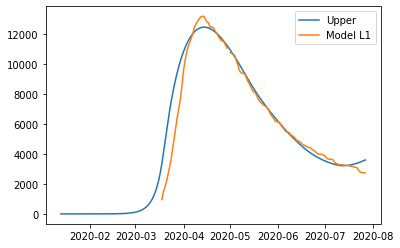

{'home': 0.9999286727551202, 'leisure': 0.8609723702755663, 'other': 0.8, 'school': 0.9003154119157101, 'transport': 0.867179761923148, 'work': 0.8}
{'home': 0.9999286727551202, 'leisure': 0.10912179952295976, 'other': 0.07176089107868033, 'school': 0, 'transport': 0.11382145369418498, 'work': 0.3683764008038226}
{'home': 0.9999286727551202, 'leisure': 0.10912179952295976, 'other': 0.07176089107868033, 'school': 0, 'transport': 0.11382145369418498, 'work': 0.3683764008038226}
{'home': 0.9999286727551202, 'leisure': 0.13090379252372336, 'other': 0.1720062746009185, 'school': 0.29710408593218435, 'transport': 0.19827037763296237, 'work': 0.657782623728676}
{'home': 0.9999286727551202, 'leisure': 0.25187529477322984, 'other': 0.24313398191556948, 'school': 0.6032113259835258, 'transport': 0.262558551991597, 'work': 0.6754478258264435}
{'home': 0.9999286727551202, 'leisure': 0.41872263450678276, 'other': 0.36201937998701733, 'school': 0.6032113259835258, 'transport': 0.43432708845309903, '

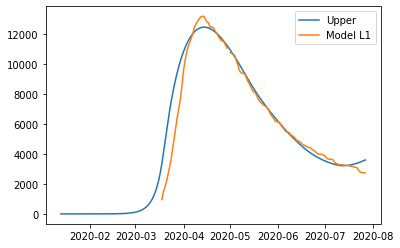

{'home': 0.9999286727551202, 'leisure': 0.8609723702755663, 'other': 0.8, 'school': 0.9003154119157101, 'transport': 0.867179761923148, 'work': 0.8}
{'home': 0.9999286727551202, 'leisure': 0.10912179952295976, 'other': 0.07176089107868033, 'school': 0, 'transport': 0.11382145369418498, 'work': 0.3683764008038226}
{'home': 0.9999286727551202, 'leisure': 0.10912179952295976, 'other': 0.07176089107868033, 'school': 0, 'transport': 0.11382145369418498, 'work': 0.3683764008038226}
{'home': 0.9999286727551202, 'leisure': 0.13090379252372336, 'other': 0.1720062746009185, 'school': 0.29710408593218435, 'transport': 0.19827037763296237, 'work': 0.657782623728676}
{'home': 0.9999286727551202, 'leisure': 0.25187529477322984, 'other': 0.24313398191556948, 'school': 0.6032113259835258, 'transport': 0.262558551991597, 'work': 0.6754478258264435}
{'home': 0.9999286727551202, 'leisure': 0.41872263450678276, 'other': 0.36201937998701733, 'school': 0.6032113259835258, 'transport': 0.43432708845309903, '

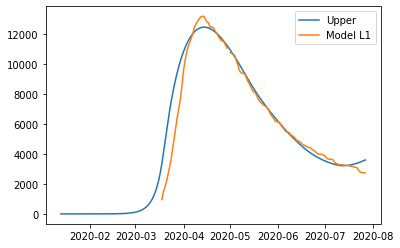

{'home': 0.9999286727551202, 'leisure': 0.8609723702755663, 'other': 0.8, 'school': 0.9003154119157101, 'transport': 0.867179761923148, 'work': 0.8}
{'home': 0.9999286727551202, 'leisure': 0.10912179952295976, 'other': 0.07176089107868033, 'school': 0, 'transport': 0.11382145369418498, 'work': 0.3683764008038226}
{'home': 0.9999286727551202, 'leisure': 0.10912179952295976, 'other': 0.07176089107868033, 'school': 0, 'transport': 0.11382145369418498, 'work': 0.3683764008038226}
{'home': 0.9999286727551202, 'leisure': 0.13090379252372336, 'other': 0.1720062746009185, 'school': 0.29710408593218435, 'transport': 0.19827037763296237, 'work': 0.657782623728676}
{'home': 0.9999286727551202, 'leisure': 0.25187529477322984, 'other': 0.24313398191556948, 'school': 0.6032113259835258, 'transport': 0.262558551991597, 'work': 0.6754478258264435}
{'home': 0.9999286727551202, 'leisure': 0.41872263450678276, 'other': 0.36201937998701733, 'school': 0.6032113259835258, 'transport': 0.43432708845309903, '

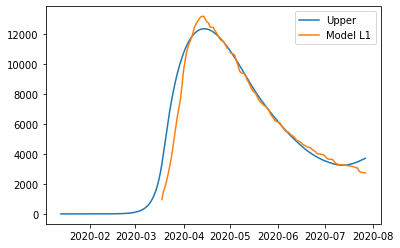

{'home': 0.999965915498892, 'leisure': 0.8702714430607122, 'other': 0.8, 'school': 0.9021504770494126, 'transport': 0.8713078463901257, 'work': 0.8068814761667047}
{'home': 0.999965915498892, 'leisure': 0.10963960345926081, 'other': 0.0706272526710611, 'school': 0, 'transport': 0.11366613157380333, 'work': 0.3558113514778822}
{'home': 0.999965915498892, 'leisure': 0.10963960345926081, 'other': 0.0706272526710611, 'school': 0, 'transport': 0.11366613157380333, 'work': 0.3558113514778822}
{'home': 0.999965915498892, 'leisure': 0.13157899069170378, 'other': 0.16945352343143144, 'school': 0.2977096574263062, 'transport': 0.19798273017846849, 'work': 0.6369081669798266}
{'home': 0.999965915498892, 'leisure': 0.25316181656345155, 'other': 0.24031695092118635, 'school': 0.6044408196231065, 'transport': 0.26223394352045987, 'work': 0.6577432454950728}
{'home': 0.999965915498892, 'leisure': 0.4211467905501736, 'other': 0.35985990849050997, 'school': 0.6044408196231065, 'transport': 0.4338884486

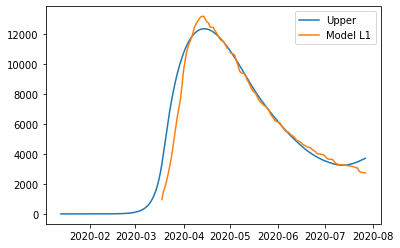

{'home': 0.999965915498892, 'leisure': 0.8702714430607122, 'other': 0.8, 'school': 0.9021504770494126, 'transport': 0.8713078463901257, 'work': 0.8068814761667047}
{'home': 0.999965915498892, 'leisure': 0.10963960345926081, 'other': 0.0706272526710611, 'school': 0, 'transport': 0.11366613157380333, 'work': 0.3558113514778822}
{'home': 0.999965915498892, 'leisure': 0.10963960345926081, 'other': 0.0706272526710611, 'school': 0, 'transport': 0.11366613157380333, 'work': 0.3558113514778822}
{'home': 0.999965915498892, 'leisure': 0.13157899069170378, 'other': 0.16945352343143144, 'school': 0.2977096574263062, 'transport': 0.19798273017846849, 'work': 0.6369081669798266}
{'home': 0.999965915498892, 'leisure': 0.25316181656345155, 'other': 0.24031695092118635, 'school': 0.6044408196231065, 'transport': 0.26223394352045987, 'work': 0.6577432454950728}
{'home': 0.999965915498892, 'leisure': 0.4211467905501736, 'other': 0.35985990849050997, 'school': 0.6044408196231065, 'transport': 0.4338884486

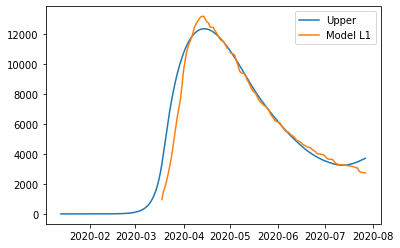

{'home': 0.999965915498892, 'leisure': 0.8702714430607122, 'other': 0.8, 'school': 0.9021504770494126, 'transport': 0.8713078463901257, 'work': 0.8068814761667047}
{'home': 0.999965915498892, 'leisure': 0.10963960345926081, 'other': 0.0706272526710611, 'school': 0, 'transport': 0.11366613157380333, 'work': 0.3558113514778822}
{'home': 0.999965915498892, 'leisure': 0.10963960345926081, 'other': 0.0706272526710611, 'school': 0, 'transport': 0.11366613157380333, 'work': 0.3558113514778822}
{'home': 0.999965915498892, 'leisure': 0.13157899069170378, 'other': 0.16945352343143144, 'school': 0.2977096574263062, 'transport': 0.19798273017846849, 'work': 0.6369081669798266}
{'home': 0.999965915498892, 'leisure': 0.25316181656345155, 'other': 0.24031695092118635, 'school': 0.6044408196231065, 'transport': 0.26223394352045987, 'work': 0.6577432454950728}
{'home': 0.999965915498892, 'leisure': 0.4211467905501736, 'other': 0.35985990849050997, 'school': 0.6044408196231065, 'transport': 0.4338884486

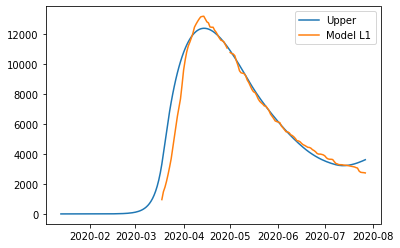

{'home': 0.999972391150313, 'leisure': 0.8623544881002569, 'other': 0.8, 'school': 0.9005141916362039, 'transport': 0.8676964314212345, 'work': 0.80080992235942}
{'home': 0.999972391150313, 'leisure': 0.10917149824130265, 'other': 0.07159136179476319, 'school': 0, 'transport': 0.11376730489631433, 'work': 0.36627739144544735}
{'home': 0.999972391150313, 'leisure': 0.10917149824130265, 'other': 0.07159136179476319, 'school': 0, 'transport': 0.11376730489631433, 'work': 0.36627739144544735}
{'home': 0.999972391150313, 'leisure': 0.13096431277802031, 'other': 0.17162450492701323, 'school': 0.2971696832399473, 'transport': 0.19817386716165256, 'work': 0.6544349396908689}
{'home': 0.999972391150313, 'leisure': 0.25199518412972405, 'other': 0.24267754885840903, 'school': 0.6033445083962566, 'transport': 0.2624365322497502, 'work': 0.6725209157990911}
{'home': 0.999972391150313, 'leisure': 0.4189604369928957, 'other': 0.3615741372038936, 'school': 0.6033445083962566, 'transport': 0.4341372045

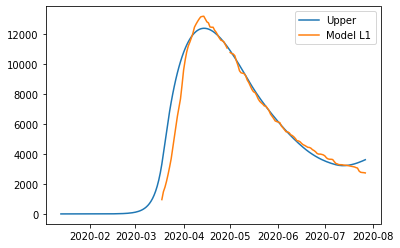

{'home': 0.999972391150313, 'leisure': 0.8623544881002569, 'other': 0.8, 'school': 0.9005141916362039, 'transport': 0.8676964314212345, 'work': 0.80080992235942}
{'home': 0.999972391150313, 'leisure': 0.10917149824130265, 'other': 0.07159136179476319, 'school': 0, 'transport': 0.11376730489631433, 'work': 0.36627739144544735}
{'home': 0.999972391150313, 'leisure': 0.10917149824130265, 'other': 0.07159136179476319, 'school': 0, 'transport': 0.11376730489631433, 'work': 0.36627739144544735}
{'home': 0.999972391150313, 'leisure': 0.13096431277802031, 'other': 0.17162450492701323, 'school': 0.2971696832399473, 'transport': 0.19817386716165256, 'work': 0.6544349396908689}
{'home': 0.999972391150313, 'leisure': 0.25199518412972405, 'other': 0.24267754885840903, 'school': 0.6033445083962566, 'transport': 0.2624365322497502, 'work': 0.6725209157990911}
{'home': 0.999972391150313, 'leisure': 0.4189604369928957, 'other': 0.3615741372038936, 'school': 0.6033445083962566, 'transport': 0.4341372045

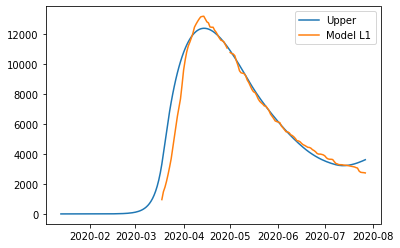

{'home': 0.999972391150313, 'leisure': 0.8623544881002569, 'other': 0.8, 'school': 0.9005141916362039, 'transport': 0.8676964314212345, 'work': 0.80080992235942}
{'home': 0.999972391150313, 'leisure': 0.10917149824130265, 'other': 0.07159136179476319, 'school': 0, 'transport': 0.11376730489631433, 'work': 0.36627739144544735}
{'home': 0.999972391150313, 'leisure': 0.10917149824130265, 'other': 0.07159136179476319, 'school': 0, 'transport': 0.11376730489631433, 'work': 0.36627739144544735}
{'home': 0.999972391150313, 'leisure': 0.13096431277802031, 'other': 0.17162450492701323, 'school': 0.2971696832399473, 'transport': 0.19817386716165256, 'work': 0.6544349396908689}
{'home': 0.999972391150313, 'leisure': 0.25199518412972405, 'other': 0.24267754885840903, 'school': 0.6033445083962566, 'transport': 0.2624365322497502, 'work': 0.6725209157990911}
{'home': 0.999972391150313, 'leisure': 0.4189604369928957, 'other': 0.3615741372038936, 'school': 0.6033445083962566, 'transport': 0.4341372045

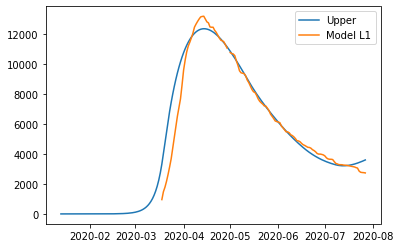

{'home': 0.9999817199132683, 'leisure': 0.8615029582311325, 'other': 0.8, 'school': 0.9001604325193895, 'transport': 0.8671107398922662, 'work': 0.8005362574371596}
{'home': 0.9999817199132683, 'leisure': 0.10908422935185223, 'other': 0.07176028218722448, 'school': 0, 'transport': 0.11373647334471544, 'work': 0.36763249807793674}
{'home': 0.9999817199132683, 'leisure': 0.10908422935185223, 'other': 0.07176028218722448, 'school': 0, 'transport': 0.11373647334471544, 'work': 0.36763249807793674}
{'home': 0.9999817199132683, 'leisure': 0.13084263043711672, 'other': 0.17199868012490246, 'school': 0.29705294273139854, 'transport': 0.19812388378132467, 'work': 0.6570084550275925}
{'home': 0.9999817199132683, 'leisure': 0.2517687409566778, 'other': 0.24301802206417442, 'school': 0.603107489787991, 'transport': 0.2623569839303678, 'work': 0.6747005884067749}
{'home': 0.9999817199132683, 'leisure': 0.4185257932150396, 'other': 0.3616182262720997, 'school': 0.603107489787991, 'transport': 0.4339

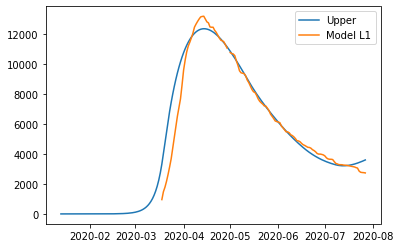

{'home': 0.9999817199132683, 'leisure': 0.8615029582311325, 'other': 0.8, 'school': 0.9001604325193895, 'transport': 0.8671107398922662, 'work': 0.8005362574371596}
{'home': 0.9999817199132683, 'leisure': 0.10908422935185223, 'other': 0.07176028218722448, 'school': 0, 'transport': 0.11373647334471544, 'work': 0.36763249807793674}
{'home': 0.9999817199132683, 'leisure': 0.10908422935185223, 'other': 0.07176028218722448, 'school': 0, 'transport': 0.11373647334471544, 'work': 0.36763249807793674}
{'home': 0.9999817199132683, 'leisure': 0.13084263043711672, 'other': 0.17199868012490246, 'school': 0.29705294273139854, 'transport': 0.19812388378132467, 'work': 0.6570084550275925}
{'home': 0.9999817199132683, 'leisure': 0.2517687409566778, 'other': 0.24301802206417442, 'school': 0.603107489787991, 'transport': 0.2623569839303678, 'work': 0.6747005884067749}
{'home': 0.9999817199132683, 'leisure': 0.4185257932150396, 'other': 0.3616182262720997, 'school': 0.603107489787991, 'transport': 0.4339

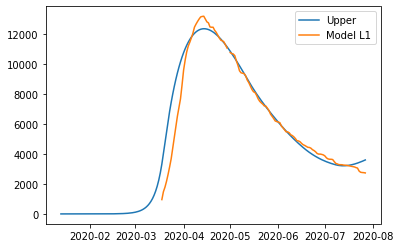

{'home': 0.9999817199132683, 'leisure': 0.8615029582311325, 'other': 0.8, 'school': 0.9001604325193895, 'transport': 0.8671107398922662, 'work': 0.8005362574371596}
{'home': 0.9999817199132683, 'leisure': 0.10908422935185223, 'other': 0.07176028218722448, 'school': 0, 'transport': 0.11373647334471544, 'work': 0.36763249807793674}
{'home': 0.9999817199132683, 'leisure': 0.10908422935185223, 'other': 0.07176028218722448, 'school': 0, 'transport': 0.11373647334471544, 'work': 0.36763249807793674}
{'home': 0.9999817199132683, 'leisure': 0.13084263043711672, 'other': 0.17199868012490246, 'school': 0.29705294273139854, 'transport': 0.19812388378132467, 'work': 0.6570084550275925}
{'home': 0.9999817199132683, 'leisure': 0.2517687409566778, 'other': 0.24301802206417442, 'school': 0.603107489787991, 'transport': 0.2623569839303678, 'work': 0.6747005884067749}
{'home': 0.9999817199132683, 'leisure': 0.4185257932150396, 'other': 0.3616182262720997, 'school': 0.603107489787991, 'transport': 0.4339

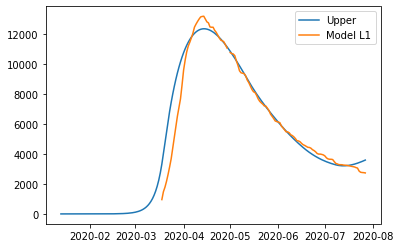

{'home': 0.9999773730594405, 'leisure': 0.8608025093287993, 'other': 0.8, 'school': 0.9000030146128122, 'transport': 0.8667820555548188, 'work': 0.8}
{'home': 0.9999773730594405, 'leisure': 0.10903884928150324, 'other': 0.07184625953432586, 'school': 0, 'transport': 0.11374149082447667, 'work': 0.3685533463634958}
{'home': 0.9999773730594405, 'leisure': 0.10903884928150324, 'other': 0.07184625953432586, 'school': 0, 'transport': 0.11374149082447667, 'work': 0.3685533463634958}
{'home': 0.9999773730594405, 'leisure': 0.13078289814147637, 'other': 0.17219207406047388, 'school': 0.297000994822228, 'transport': 0.1981339946772956, 'work': 0.6585682970082586}
{'home': 0.9999773730594405, 'leisure': 0.2516556520234849, 'other': 0.2432243025437016, 'school': 0.6030020197905842, 'transport': 0.26236562664932217, 'work': 0.6760111389642259}
{'home': 0.9999773730594405, 'leisure': 0.41831537932718493, 'other': 0.3617563602449091, 'school': 0.6030020197905842, 'transport': 0.43399036910730443, 'w

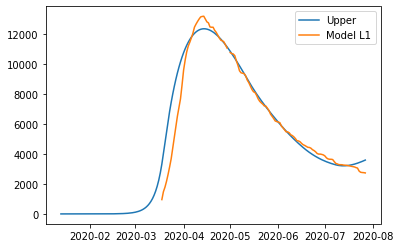

{'home': 0.9999773730594405, 'leisure': 0.8608025093287993, 'other': 0.8, 'school': 0.9000030146128122, 'transport': 0.8667820555548188, 'work': 0.8}
{'home': 0.9999773730594405, 'leisure': 0.10903884928150324, 'other': 0.07184625953432586, 'school': 0, 'transport': 0.11374149082447667, 'work': 0.3685533463634958}
{'home': 0.9999773730594405, 'leisure': 0.10903884928150324, 'other': 0.07184625953432586, 'school': 0, 'transport': 0.11374149082447667, 'work': 0.3685533463634958}
{'home': 0.9999773730594405, 'leisure': 0.13078289814147637, 'other': 0.17219207406047388, 'school': 0.297000994822228, 'transport': 0.1981339946772956, 'work': 0.6585682970082586}
{'home': 0.9999773730594405, 'leisure': 0.2516556520234849, 'other': 0.2432243025437016, 'school': 0.6030020197905842, 'transport': 0.26236562664932217, 'work': 0.6760111389642259}
{'home': 0.9999773730594405, 'leisure': 0.41831537932718493, 'other': 0.3617563602449091, 'school': 0.6030020197905842, 'transport': 0.43399036910730443, 'w

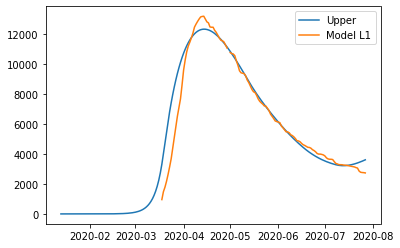

{'home': 0.999979177135349, 'leisure': 0.8613908128925565, 'other': 0.8, 'school': 0.9002020016460234, 'transport': 0.8671755456834127, 'work': 0.8}
{'home': 0.999979177135349, 'leisure': 0.10908128385692406, 'other': 0.07171186734356931, 'school': 0, 'transport': 0.11374610599305461, 'work': 0.36730890613546985}
{'home': 0.999979177135349, 'leisure': 0.10908128385692406, 'other': 0.07171186734356931, 'school': 0, 'transport': 0.11374610599305461, 'work': 0.36730890613546985}
{'home': 0.999979177135349, 'leisure': 0.13084300751999725, 'other': 0.17189441234029468, 'school': 0.29706666054318775, 'transport': 0.19813926709512614, 'work': 0.6563140230973801}
{'home': 0.999979177135349, 'leisure': 0.2517683916216176, 'other': 0.24293271796253102, 'school': 0.6031353411028357, 'transport': 0.26238169683663554, 'work': 0.6740352120342309}
{'home': 0.999979177135349, 'leisure': 0.41854697988874595, 'other': 0.36164961745076357, 'school': 0.6031353411028357, 'transport': 0.4340325621626122, 'w

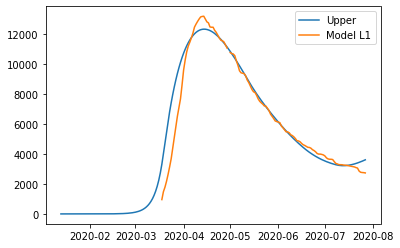

{'home': 0.999979177135349, 'leisure': 0.8613908128925565, 'other': 0.8, 'school': 0.9002020016460234, 'transport': 0.8671755456834127, 'work': 0.8}
{'home': 0.999979177135349, 'leisure': 0.10908128385692406, 'other': 0.07171186734356931, 'school': 0, 'transport': 0.11374610599305461, 'work': 0.36730890613546985}
{'home': 0.999979177135349, 'leisure': 0.10908128385692406, 'other': 0.07171186734356931, 'school': 0, 'transport': 0.11374610599305461, 'work': 0.36730890613546985}
{'home': 0.999979177135349, 'leisure': 0.13084300751999725, 'other': 0.17189441234029468, 'school': 0.29706666054318775, 'transport': 0.19813926709512614, 'work': 0.6563140230973801}
{'home': 0.999979177135349, 'leisure': 0.2517683916216176, 'other': 0.24293271796253102, 'school': 0.6031353411028357, 'transport': 0.26238169683663554, 'work': 0.6740352120342309}
{'home': 0.999979177135349, 'leisure': 0.41854697988874595, 'other': 0.36164961745076357, 'school': 0.6031353411028357, 'transport': 0.4340325621626122, 'w

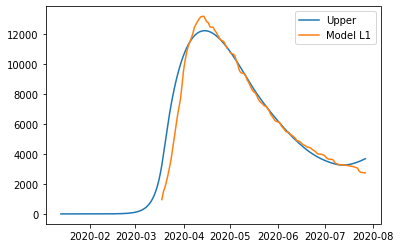

{'home': 0.9999863934389832, 'leisure': 0.8637440271475851, 'other': 0.8, 'school': 0.9009979497788682, 'transport': 0.8687495061977883, 'work': 0.8}
{'home': 0.9999863934389832, 'leisure': 0.10925051970797041, 'other': 0.0711742733538034, 'school': 0, 'transport': 0.11376385684321234, 'work': 0.3623697395534018}
{'home': 0.9999863934389832, 'leisure': 0.10925051970797041, 'other': 0.0711742733538034, 'school': 0, 'transport': 0.11376385684321234, 'work': 0.3623697395534018}
{'home': 0.9999863934389832, 'leisure': 0.13108298665065435, 'other': 0.17070370958553704, 'school': 0.2973293234270265, 'transport': 0.19815907850337575, 'work': 0.6473668401659016}
{'home': 0.9999863934389832, 'leisure': 0.25221842218861246, 'other': 0.2417663249045469, 'school': 0.6036686263518417, 'transport': 0.2624444221354905, 'work': 0.666192784538359}
{'home': 0.9999863934389832, 'leisure': 0.4194725319742818, 'other': 0.3612226262375065, 'school': 0.6036686263518417, 'transport': 0.4341989971094138, 'work

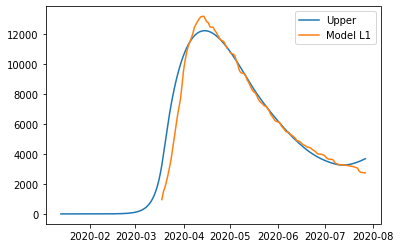

{'home': 0.9999863934389832, 'leisure': 0.8637440271475851, 'other': 0.8, 'school': 0.9009979497788682, 'transport': 0.8687495061977883, 'work': 0.8}
{'home': 0.9999863934389832, 'leisure': 0.10925051970797041, 'other': 0.0711742733538034, 'school': 0, 'transport': 0.11376385684321234, 'work': 0.3623697395534018}
{'home': 0.9999863934389832, 'leisure': 0.10925051970797041, 'other': 0.0711742733538034, 'school': 0, 'transport': 0.11376385684321234, 'work': 0.3623697395534018}
{'home': 0.9999863934389832, 'leisure': 0.13108298665065435, 'other': 0.17070370958553704, 'school': 0.2973293234270265, 'transport': 0.19815907850337575, 'work': 0.6473668401659016}
{'home': 0.9999863934389832, 'leisure': 0.25221842218861246, 'other': 0.2417663249045469, 'school': 0.6036686263518417, 'transport': 0.2624444221354905, 'work': 0.666192784538359}
{'home': 0.9999863934389832, 'leisure': 0.4194725319742818, 'other': 0.3612226262375065, 'school': 0.6036686263518417, 'transport': 0.4341989971094138, 'work

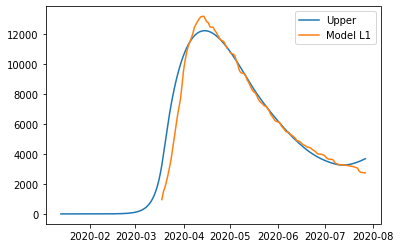

{'home': 0.9999864034389833, 'leisure': 0.8637440271475851, 'other': 0.8, 'school': 0.9009979497788682, 'transport': 0.8687495061977883, 'work': 0.8}
{'home': 0.9999864034389833, 'leisure': 0.10925051970797041, 'other': 0.0711742733538034, 'school': 0, 'transport': 0.11376385684321234, 'work': 0.3623697395534018}
{'home': 0.9999864034389833, 'leisure': 0.10925051970797041, 'other': 0.0711742733538034, 'school': 0, 'transport': 0.11376385684321234, 'work': 0.3623697395534018}
{'home': 0.9999864034389833, 'leisure': 0.13108298665065435, 'other': 0.17070370958553704, 'school': 0.2973293234270265, 'transport': 0.19815907850337575, 'work': 0.6473668401659016}
{'home': 0.9999864034389833, 'leisure': 0.25221842218861246, 'other': 0.2417663249045469, 'school': 0.6036686263518417, 'transport': 0.2624444221354905, 'work': 0.666192784538359}
{'home': 0.9999864034389833, 'leisure': 0.4194725319742818, 'other': 0.3612226262375065, 'school': 0.6036686263518417, 'transport': 0.4341989971094138, 'work

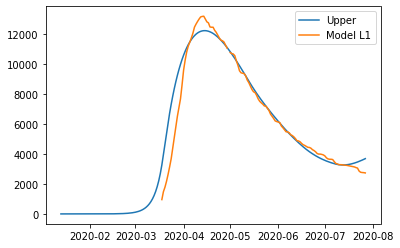

{'home': 1.0, 'leisure': 0.8633918985387155, 'other': 0.8, 'school': 0.9008745195738022, 'transport': 0.8685619514000773, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10921988071561815, 'other': 0.07122446032479683, 'school': 0, 'transport': 0.1137585393390079, 'work': 0.36291963663066457}
{'home': 1.0, 'leisure': 0.10921988071561815, 'other': 0.07122446032479683, 'school': 0, 'transport': 0.1137585393390079, 'work': 0.36291963663066457}
{'home': 1.0, 'leisure': 0.1310426863403702, 'other': 0.1708150868940177, 'school': 0.2972885914593547, 'transport': 0.19815080641165875, 'work': 0.6483599499647603}
{'home': 1.0, 'leisure': 0.2521419880845523, 'other': 0.24187634363340962, 'school': 0.6035859281144474, 'transport': 0.262430118309157, 'work': 0.6670607971397607}
{'home': 1.0, 'leisure': 0.41932946229396234, 'other': 0.36126737168357065, 'school': 0.6035859281144474, 'transport': 0.4341696518153494, 'work': 0.7123860211587978}
{'home': 1.0, 'leisure': 0.4273067864996393, 'other': 0.361267371

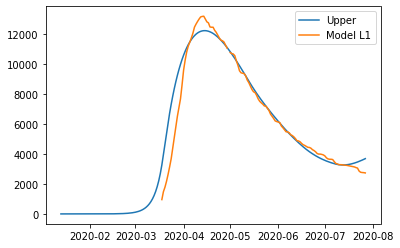

{'home': 1.0, 'leisure': 0.8633918985387155, 'other': 0.8, 'school': 0.9008745195738022, 'transport': 0.8685619514000773, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10921988071561815, 'other': 0.07122446032479683, 'school': 0, 'transport': 0.1137585393390079, 'work': 0.36291963663066457}
{'home': 1.0, 'leisure': 0.10921988071561815, 'other': 0.07122446032479683, 'school': 0, 'transport': 0.1137585393390079, 'work': 0.36291963663066457}
{'home': 1.0, 'leisure': 0.1310426863403702, 'other': 0.1708150868940177, 'school': 0.2972885914593547, 'transport': 0.19815080641165875, 'work': 0.6483599499647603}
{'home': 1.0, 'leisure': 0.2521419880845523, 'other': 0.24187634363340962, 'school': 0.6035859281144474, 'transport': 0.262430118309157, 'work': 0.6670607971397607}
{'home': 1.0, 'leisure': 0.41932946229396234, 'other': 0.36126737168357065, 'school': 0.6035859281144474, 'transport': 0.4341696518153494, 'work': 0.7123860211587978}
{'home': 1.0, 'leisure': 0.4273067864996393, 'other': 0.361267371

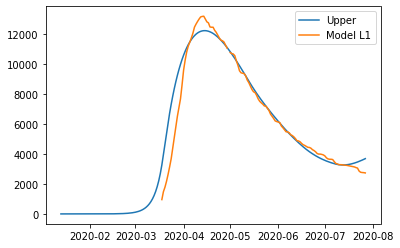

{'home': 1.0, 'leisure': 0.8633918985387155, 'other': 0.8, 'school': 0.9008745195738022, 'transport': 0.8685619514000773, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10921988071561815, 'other': 0.07122446032479683, 'school': 0, 'transport': 0.1137585393390079, 'work': 0.36291963663066457}
{'home': 1.0, 'leisure': 0.10921988071561815, 'other': 0.07122446032479683, 'school': 0, 'transport': 0.1137585393390079, 'work': 0.36291963663066457}
{'home': 1.0, 'leisure': 0.1310426863403702, 'other': 0.1708150868940177, 'school': 0.2972885914593547, 'transport': 0.19815080641165875, 'work': 0.6483599499647603}
{'home': 1.0, 'leisure': 0.2521419880845523, 'other': 0.24187634363340962, 'school': 0.6035859281144474, 'transport': 0.262430118309157, 'work': 0.6670607971397607}
{'home': 1.0, 'leisure': 0.41932946229396234, 'other': 0.36126737168357065, 'school': 0.6035859281144474, 'transport': 0.4341696518153494, 'work': 0.7123860211587978}
{'home': 1.0, 'leisure': 0.4273067864996393, 'other': 0.361267371

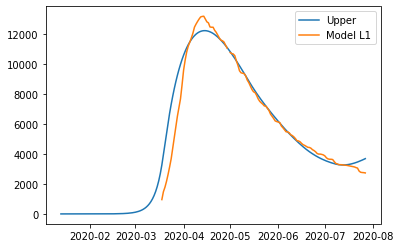

{'home': 1.00000001, 'leisure': 0.8633918985387155, 'other': 0.8, 'school': 0.9008745195738022, 'transport': 0.8685619514000773, 'work': 0.8}
{'home': 1.00000001, 'leisure': 0.10921988071561815, 'other': 0.07122446032479683, 'school': 0, 'transport': 0.1137585393390079, 'work': 0.36291963663066457}
{'home': 1.00000001, 'leisure': 0.10921988071561815, 'other': 0.07122446032479683, 'school': 0, 'transport': 0.1137585393390079, 'work': 0.36291963663066457}
{'home': 1.00000001, 'leisure': 0.1310426863403702, 'other': 0.1708150868940177, 'school': 0.2972885914593547, 'transport': 0.19815080641165875, 'work': 0.6483599499647603}
{'home': 1.00000001, 'leisure': 0.2521419880845523, 'other': 0.24187634363340962, 'school': 0.6035859281144474, 'transport': 0.262430118309157, 'work': 0.6670607971397607}
{'home': 1.00000001, 'leisure': 0.41932946229396234, 'other': 0.36126737168357065, 'school': 0.6035859281144474, 'transport': 0.4341696518153494, 'work': 0.7123860211587978}
{'home': 1.00000001, 'l

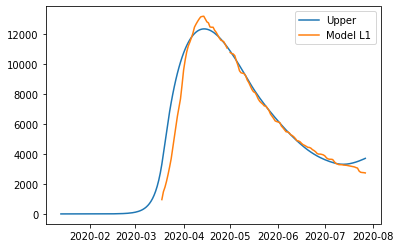

{'home': 1.0, 'leisure': 0.8577522436610386, 'other': 0.8, 'school': 0.898949079361228, 'transport': 0.8653463937595263, 'work': 0.8}
{'home': 1.0, 'leisure': 0.108764976482999, 'other': 0.072178826522717, 'school': 0, 'transport': 0.11369679364666878, 'work': 0.37284498205375904}
{'home': 1.0, 'leisure': 0.108764976482999, 'other': 0.072178826522717, 'school': 0, 'transport': 0.11369679364666878, 'work': 0.37284498205375904}
{'home': 1.0, 'leisure': 0.1304314809235506, 'other': 0.17293238149189172, 'school': 0.29665319618920527, 'transport': 0.19806217623838843, 'work': 0.6662270643952066}
{'home': 1.0, 'leisure': 0.2509863363653524, 'other': 0.24396931106326744, 'school': 0.6022958831720229, 'transport': 0.2622495087189615, 'work': 0.6826997265152971}
{'home': 1.0, 'leisure': 0.4171039745888643, 'other': 0.36211479194640445, 'school': 0.6022958831720229, 'transport': 0.43376297702834166, 'work': 0.7226183469749433}
{'home': 1.0, 'leisure': 0.4243109844963693, 'other': 0.3621147919464

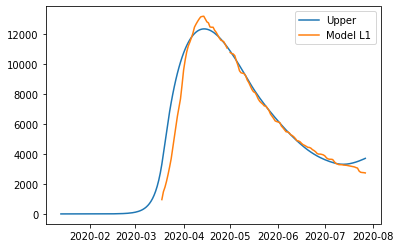

{'home': 1.0, 'leisure': 0.8577522436610386, 'other': 0.8, 'school': 0.898949079361228, 'transport': 0.8653463937595263, 'work': 0.8}
{'home': 1.0, 'leisure': 0.108764976482999, 'other': 0.072178826522717, 'school': 0, 'transport': 0.11369679364666878, 'work': 0.37284498205375904}
{'home': 1.0, 'leisure': 0.108764976482999, 'other': 0.072178826522717, 'school': 0, 'transport': 0.11369679364666878, 'work': 0.37284498205375904}
{'home': 1.0, 'leisure': 0.1304314809235506, 'other': 0.17293238149189172, 'school': 0.29665319618920527, 'transport': 0.19806217623838843, 'work': 0.6662270643952066}
{'home': 1.0, 'leisure': 0.2509863363653524, 'other': 0.24396931106326744, 'school': 0.6022958831720229, 'transport': 0.2622495087189615, 'work': 0.6826997265152971}
{'home': 1.0, 'leisure': 0.4171039745888643, 'other': 0.36211479194640445, 'school': 0.6022958831720229, 'transport': 0.43376297702834166, 'work': 0.7226183469749433}
{'home': 1.0, 'leisure': 0.4243109844963693, 'other': 0.3621147919464

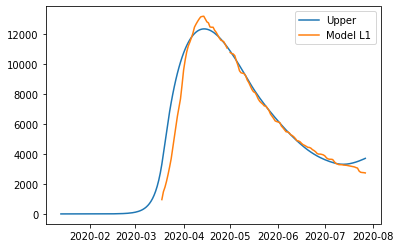

{'home': 1.0, 'leisure': 0.8577522436610386, 'other': 0.8, 'school': 0.898949079361228, 'transport': 0.8653463937595263, 'work': 0.8}
{'home': 1.0, 'leisure': 0.108764976482999, 'other': 0.072178826522717, 'school': 0, 'transport': 0.11369679364666878, 'work': 0.37284498205375904}
{'home': 1.0, 'leisure': 0.108764976482999, 'other': 0.072178826522717, 'school': 0, 'transport': 0.11369679364666878, 'work': 0.37284498205375904}
{'home': 1.0, 'leisure': 0.1304314809235506, 'other': 0.17293238149189172, 'school': 0.29665319618920527, 'transport': 0.19806217623838843, 'work': 0.6662270643952066}
{'home': 1.0, 'leisure': 0.2509863363653524, 'other': 0.24396931106326744, 'school': 0.6022958831720229, 'transport': 0.2622495087189615, 'work': 0.6826997265152971}
{'home': 1.0, 'leisure': 0.4171039745888643, 'other': 0.36211479194640445, 'school': 0.6022958831720229, 'transport': 0.43376297702834166, 'work': 0.7226183469749433}
{'home': 1.0, 'leisure': 0.4243109844963693, 'other': 0.3621147919464

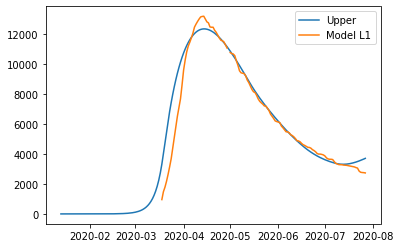

{'home': 1.0, 'leisure': 0.8577522436610386, 'other': 0.8, 'school': 0.898949079361228, 'transport': 0.8653463937595263, 'work': 0.8}
{'home': 1.0, 'leisure': 0.108764976482999, 'other': 0.072178826522717, 'school': 0, 'transport': 0.11369679364666878, 'work': 0.37284498205375904}
{'home': 1.0, 'leisure': 0.108764976482999, 'other': 0.072178826522717, 'school': 0, 'transport': 0.11369679364666878, 'work': 0.37284498205375904}
{'home': 1.0, 'leisure': 0.1304314809235506, 'other': 0.17293238149189172, 'school': 0.29665319618920527, 'transport': 0.19806217623838843, 'work': 0.6662270643952066}
{'home': 1.0, 'leisure': 0.2509863363653524, 'other': 0.24396931106326744, 'school': 0.6022958831720229, 'transport': 0.2622495087189615, 'work': 0.6826997265152971}
{'home': 1.0, 'leisure': 0.4171039745888643, 'other': 0.36211479194640445, 'school': 0.6022958831720229, 'transport': 0.43376297702834166, 'work': 0.7226183469749433}
{'home': 1.0, 'leisure': 0.4243109844963693, 'other': 0.3621147919464

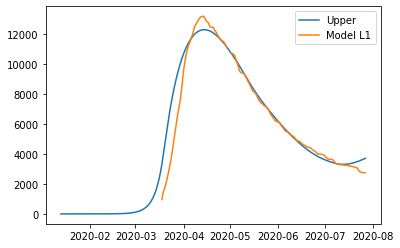

{'home': 1.0, 'leisure': 0.8582906075656396, 'other': 0.8, 'school': 0.8990657969909057, 'transport': 0.8655788451785495, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10878519826575066, 'other': 0.07209089019783237, 'school': 0, 'transport': 0.113677537799693, 'work': 0.371772248784914}
{'home': 1.0, 'leisure': 0.10878519826575066, 'other': 0.07209089019783237, 'school': 0, 'transport': 0.113677537799693, 'work': 0.371772248784914}
{'home': 1.0, 'leisure': 0.13045648589950704, 'other': 0.17273663351175336, 'school': 0.2966917130069989, 'transport': 0.19802722208717116, 'work': 0.6644356831604695}
{'home': 1.0, 'leisure': 0.2510363892908553, 'other': 0.24374705221000342, 'school': 0.6023740839839069, 'transport': 0.26220694940534384, 'work': 0.6810895950413584}
{'home': 1.0, 'leisure': 0.4172112024842025, 'other': 0.36193448416092533, 'school': 0.6023740839839069, 'transport': 0.4337001763486901, 'work': 0.7215099732769694}
{'home': 1.0, 'leisure': 0.4244891459531101, 'other': 0.361934484160

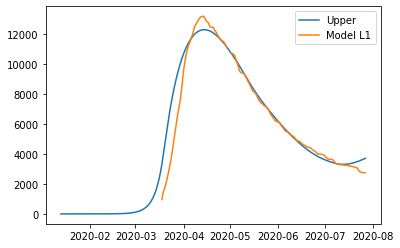

{'home': 1.0, 'leisure': 0.8582906075656396, 'other': 0.8, 'school': 0.8990657969909057, 'transport': 0.8655788451785495, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10878519826575066, 'other': 0.07209089019783237, 'school': 0, 'transport': 0.113677537799693, 'work': 0.371772248784914}
{'home': 1.0, 'leisure': 0.10878519826575066, 'other': 0.07209089019783237, 'school': 0, 'transport': 0.113677537799693, 'work': 0.371772248784914}
{'home': 1.0, 'leisure': 0.13045648589950704, 'other': 0.17273663351175336, 'school': 0.2966917130069989, 'transport': 0.19802722208717116, 'work': 0.6644356831604695}
{'home': 1.0, 'leisure': 0.2510363892908553, 'other': 0.24374705221000342, 'school': 0.6023740839839069, 'transport': 0.26220694940534384, 'work': 0.6810895950413584}
{'home': 1.0, 'leisure': 0.4172112024842025, 'other': 0.36193448416092533, 'school': 0.6023740839839069, 'transport': 0.4337001763486901, 'work': 0.7215099732769694}
{'home': 1.0, 'leisure': 0.4244891459531101, 'other': 0.361934484160

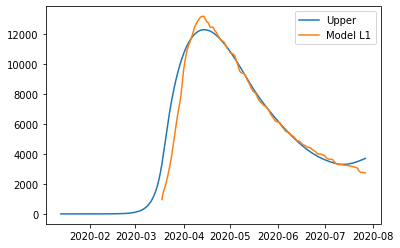

{'home': 1.00000001, 'leisure': 0.8582906075656396, 'other': 0.8, 'school': 0.8990657969909057, 'transport': 0.8655788451785495, 'work': 0.8}
{'home': 1.00000001, 'leisure': 0.10878519826575066, 'other': 0.07209089019783237, 'school': 0, 'transport': 0.113677537799693, 'work': 0.371772248784914}
{'home': 1.00000001, 'leisure': 0.10878519826575066, 'other': 0.07209089019783237, 'school': 0, 'transport': 0.113677537799693, 'work': 0.371772248784914}
{'home': 1.00000001, 'leisure': 0.13045648589950704, 'other': 0.17273663351175336, 'school': 0.2966917130069989, 'transport': 0.19802722208717116, 'work': 0.6644356831604695}
{'home': 1.00000001, 'leisure': 0.2510363892908553, 'other': 0.24374705221000342, 'school': 0.6023740839839069, 'transport': 0.26220694940534384, 'work': 0.6810895950413584}
{'home': 1.00000001, 'leisure': 0.4172112024842025, 'other': 0.36193448416092533, 'school': 0.6023740839839069, 'transport': 0.4337001763486901, 'work': 0.7215099732769694}
{'home': 1.00000001, 'leis

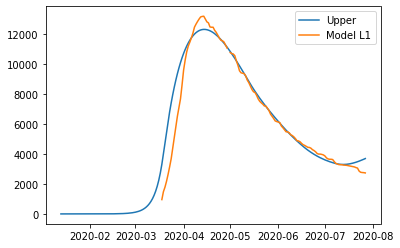

{'home': 1.0, 'leisure': 0.8578915176687307, 'other': 0.8, 'school': 0.8989811368108442, 'transport': 0.8654013036720156, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10875979277220611, 'other': 0.07213539647019741, 'school': 0, 'transport': 0.1136812463257659, 'work': 0.37229141197666793}
{'home': 1.0, 'leisure': 0.10875979277220611, 'other': 0.07213539647019741, 'school': 0, 'transport': 0.1136812463257659, 'work': 0.37229141197666793}
{'home': 1.0, 'leisure': 0.1304235130093051, 'other': 0.17283702896279665, 'school': 0.29666377514757863, 'transport': 0.19803434069738865, 'work': 0.6653099212773185}
{'home': 1.0, 'leisure': 0.25097376115924697, 'other': 0.24385655400029438, 'school': 0.6023173616632657, 'transport': 0.2622140946638327, 'work': 0.6818276279532833}
{'home': 1.0, 'leisure': 0.4170962337519191, 'other': 0.36201561110106234, 'school': 0.6023173616632657, 'transport': 0.43370814206731867, 'work': 0.7219025106146639}
{'home': 1.0, 'leisure': 0.424326658115652, 'other': 0.362015

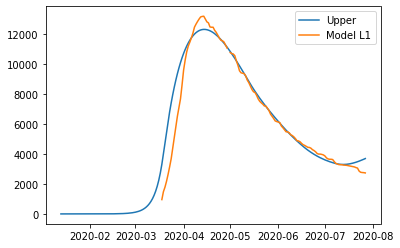

{'home': 1.0, 'leisure': 0.8578915176687307, 'other': 0.8, 'school': 0.8989811368108442, 'transport': 0.8654013036720156, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10875979277220611, 'other': 0.07213539647019741, 'school': 0, 'transport': 0.1136812463257659, 'work': 0.37229141197666793}
{'home': 1.0, 'leisure': 0.10875979277220611, 'other': 0.07213539647019741, 'school': 0, 'transport': 0.1136812463257659, 'work': 0.37229141197666793}
{'home': 1.0, 'leisure': 0.1304235130093051, 'other': 0.17283702896279665, 'school': 0.29666377514757863, 'transport': 0.19803434069738865, 'work': 0.6653099212773185}
{'home': 1.0, 'leisure': 0.25097376115924697, 'other': 0.24385655400029438, 'school': 0.6023173616632657, 'transport': 0.2622140946638327, 'work': 0.6818276279532833}
{'home': 1.0, 'leisure': 0.4170962337519191, 'other': 0.36201561110106234, 'school': 0.6023173616632657, 'transport': 0.43370814206731867, 'work': 0.7219025106146639}
{'home': 1.0, 'leisure': 0.424326658115652, 'other': 0.362015

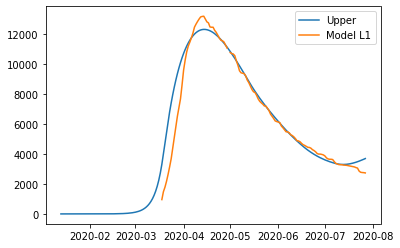

{'home': 1.0, 'leisure': 0.8578915176687307, 'other': 0.8, 'school': 0.8989811368108442, 'transport': 0.8654013036720156, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10875979277220611, 'other': 0.07213539647019741, 'school': 0, 'transport': 0.1136812463257659, 'work': 0.37229141197666793}
{'home': 1.0, 'leisure': 0.10875979277220611, 'other': 0.07213539647019741, 'school': 0, 'transport': 0.1136812463257659, 'work': 0.37229141197666793}
{'home': 1.0, 'leisure': 0.1304235130093051, 'other': 0.17283702896279665, 'school': 0.29666377514757863, 'transport': 0.19803434069738865, 'work': 0.6653099212773185}
{'home': 1.0, 'leisure': 0.25097376115924697, 'other': 0.24385655400029438, 'school': 0.6023173616632657, 'transport': 0.2622140946638327, 'work': 0.6818276279532833}
{'home': 1.0, 'leisure': 0.4170962337519191, 'other': 0.36201561110106234, 'school': 0.6023173616632657, 'transport': 0.43370814206731867, 'work': 0.7219025106146639}
{'home': 1.0, 'leisure': 0.424326658115652, 'other': 0.362015

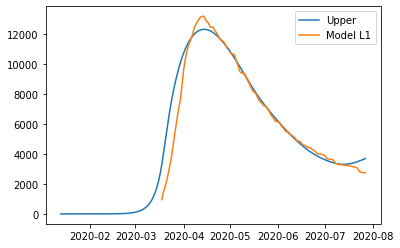

{'home': 1.0, 'leisure': 0.8564006296427805, 'other': 0.8, 'school': 0.8984219881134968, 'transport': 0.8644886461329087, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10862176558133392, 'other': 0.07239283243015264, 'school': 0, 'transport': 0.11364522495224427, 'work': 0.3748511221014974}
{'home': 1.0, 'leisure': 0.10862176558133392, 'other': 0.07239283243015264, 'school': 0, 'transport': 0.11364522495224427, 'work': 0.3748511221014974}
{'home': 1.0, 'leisure': 0.13023614143373657, 'other': 0.1734078367906156, 'school': 0.29647925607745396, 'transport': 0.19797691114118435, 'work': 0.6700252852425969}
{'home': 1.0, 'leisure': 0.25062185078164706, 'other': 0.24439813520622422, 'school': 0.6019427320360429, 'transport': 0.26211946577726103, 'work': 0.6859129686896728}
{'home': 1.0, 'leisure': 0.41642700059200927, 'other': 0.36216404703202837, 'school': 0.6019427320360429, 'transport': 0.433520931666426, 'work': 0.724508725221598}
{'home': 1.0, 'leisure': 0.4234523543967008, 'other': 0.362164

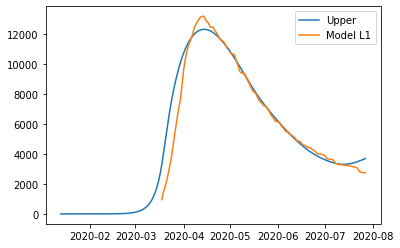

{'home': 1.0, 'leisure': 0.8564006296427805, 'other': 0.8, 'school': 0.8984219881134968, 'transport': 0.8644886461329087, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10862176558133392, 'other': 0.07239283243015264, 'school': 0, 'transport': 0.11364522495224427, 'work': 0.3748511221014974}
{'home': 1.0, 'leisure': 0.10862176558133392, 'other': 0.07239283243015264, 'school': 0, 'transport': 0.11364522495224427, 'work': 0.3748511221014974}
{'home': 1.0, 'leisure': 0.13023614143373657, 'other': 0.1734078367906156, 'school': 0.29647925607745396, 'transport': 0.19797691114118435, 'work': 0.6700252852425969}
{'home': 1.0, 'leisure': 0.25062185078164706, 'other': 0.24439813520622422, 'school': 0.6019427320360429, 'transport': 0.26211946577726103, 'work': 0.6859129686896728}
{'home': 1.0, 'leisure': 0.41642700059200927, 'other': 0.36216404703202837, 'school': 0.6019427320360429, 'transport': 0.433520931666426, 'work': 0.724508725221598}
{'home': 1.0, 'leisure': 0.4234523543967008, 'other': 0.362164

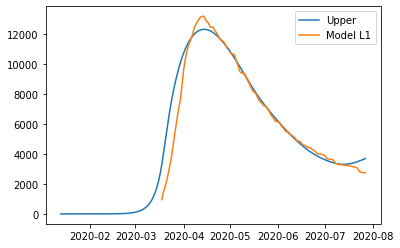

{'home': 1.0, 'leisure': 0.8564006296427805, 'other': 0.8, 'school': 0.8984219881134968, 'transport': 0.8644886461329087, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10862176558133392, 'other': 0.07239283243015264, 'school': 0, 'transport': 0.11364522495224427, 'work': 0.3748511221014974}
{'home': 1.0, 'leisure': 0.10862176558133392, 'other': 0.07239283243015264, 'school': 0, 'transport': 0.11364522495224427, 'work': 0.3748511221014974}
{'home': 1.0, 'leisure': 0.13023614143373657, 'other': 0.1734078367906156, 'school': 0.29647925607745396, 'transport': 0.19797691114118435, 'work': 0.6700252852425969}
{'home': 1.0, 'leisure': 0.25062185078164706, 'other': 0.24439813520622422, 'school': 0.6019427320360429, 'transport': 0.26211946577726103, 'work': 0.6859129686896728}
{'home': 1.0, 'leisure': 0.41642700059200927, 'other': 0.36216404703202837, 'school': 0.6019427320360429, 'transport': 0.433520931666426, 'work': 0.724508725221598}
{'home': 1.0, 'leisure': 0.4234523543967008, 'other': 0.362164

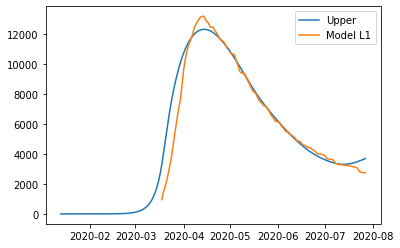

{'home': 1.0, 'leisure': 0.8564006296427805, 'other': 0.8, 'school': 0.8984219881134968, 'transport': 0.8644886461329087, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10862176558133392, 'other': 0.07239283243015264, 'school': 0, 'transport': 0.11364522495224427, 'work': 0.3748511221014974}
{'home': 1.0, 'leisure': 0.10862176558133392, 'other': 0.07239283243015264, 'school': 0, 'transport': 0.11364522495224427, 'work': 0.3748511221014974}
{'home': 1.0, 'leisure': 0.13023614143373657, 'other': 0.1734078367906156, 'school': 0.29647925607745396, 'transport': 0.19797691114118435, 'work': 0.6700252852425969}
{'home': 1.0, 'leisure': 0.25062185078164706, 'other': 0.24439813520622422, 'school': 0.6019427320360429, 'transport': 0.26211946577726103, 'work': 0.6859129686896728}
{'home': 1.0, 'leisure': 0.41642700059200927, 'other': 0.36216404703202837, 'school': 0.6019427320360429, 'transport': 0.433520931666426, 'work': 0.724508725221598}
{'home': 1.0, 'leisure': 0.4234523543967008, 'other': 0.362164

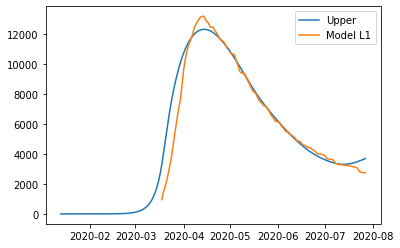

{'home': 1.00000001, 'leisure': 0.8564006296427805, 'other': 0.8, 'school': 0.8984219881134968, 'transport': 0.8644886461329087, 'work': 0.8}
{'home': 1.00000001, 'leisure': 0.10862176558133392, 'other': 0.07239283243015264, 'school': 0, 'transport': 0.11364522495224427, 'work': 0.3748511221014974}
{'home': 1.00000001, 'leisure': 0.10862176558133392, 'other': 0.07239283243015264, 'school': 0, 'transport': 0.11364522495224427, 'work': 0.3748511221014974}
{'home': 1.00000001, 'leisure': 0.13023614143373657, 'other': 0.1734078367906156, 'school': 0.29647925607745396, 'transport': 0.19797691114118435, 'work': 0.6700252852425969}
{'home': 1.00000001, 'leisure': 0.25062185078164706, 'other': 0.24439813520622422, 'school': 0.6019427320360429, 'transport': 0.26211946577726103, 'work': 0.6859129686896728}
{'home': 1.00000001, 'leisure': 0.41642700059200927, 'other': 0.36216404703202837, 'school': 0.6019427320360429, 'transport': 0.433520931666426, 'work': 0.724508725221598}
{'home': 1.00000001,

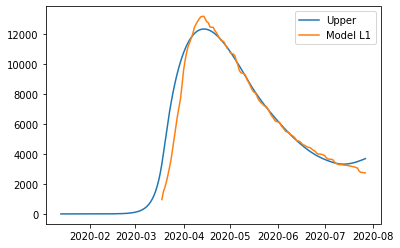

{'home': 1.0, 'leisure': 0.8536454497341414, 'other': 0.8, 'school': 0.8974569356516107, 'transport': 0.8629095665992427, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10837311093875714, 'other': 0.07281617918323906, 'school': 0, 'transport': 0.11358897832602065, 'work': 0.37925417506704606}
{'home': 1.0, 'leisure': 0.10837311093875714, 'other': 0.07281617918323906, 'school': 0, 'transport': 0.11358897832602065, 'work': 0.37925417506704606}
{'home': 1.0, 'leisure': 0.12990239330502354, 'other': 0.17434887379971498, 'school': 0.29616078876503155, 'transport': 0.19788732005432752, 'work': 0.6780544178446398}
{'home': 1.0, 'leisure': 0.249993922107671, 'other': 0.24530313276398866, 'school': 0.6012961468865792, 'transport': 0.2619711678417062, 'work': 0.6928320304720436}
{'home': 1.0, 'leisure': 0.4152500668365145, 'other': 0.36245965468070546, 'school': 0.6012961468865792, 'transport': 0.4332269263765343, 'work': 0.7288068046808984}
{'home': 1.0, 'leisure': 0.4219179939384496, 'other': 0.36245

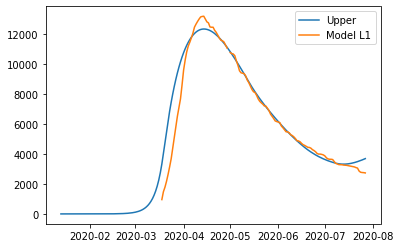

{'home': 1.0, 'leisure': 0.8536454497341414, 'other': 0.8, 'school': 0.8974569356516107, 'transport': 0.8629095665992427, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10837311093875714, 'other': 0.07281617918323906, 'school': 0, 'transport': 0.11358897832602065, 'work': 0.37925417506704606}
{'home': 1.0, 'leisure': 0.10837311093875714, 'other': 0.07281617918323906, 'school': 0, 'transport': 0.11358897832602065, 'work': 0.37925417506704606}
{'home': 1.0, 'leisure': 0.12990239330502354, 'other': 0.17434887379971498, 'school': 0.29616078876503155, 'transport': 0.19788732005432752, 'work': 0.6780544178446398}
{'home': 1.0, 'leisure': 0.249993922107671, 'other': 0.24530313276398866, 'school': 0.6012961468865792, 'transport': 0.2619711678417062, 'work': 0.6928320304720436}
{'home': 1.0, 'leisure': 0.4152500668365145, 'other': 0.36245965468070546, 'school': 0.6012961468865792, 'transport': 0.4332269263765343, 'work': 0.7288068046808984}
{'home': 1.0, 'leisure': 0.4219179939384496, 'other': 0.36245

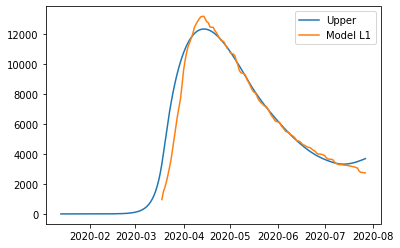

{'home': 1.0, 'leisure': 0.8536454497341414, 'other': 0.8, 'school': 0.8974569356516107, 'transport': 0.8629095665992427, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10837311093875714, 'other': 0.07281617918323906, 'school': 0, 'transport': 0.11358897832602065, 'work': 0.37925417506704606}
{'home': 1.0, 'leisure': 0.10837311093875714, 'other': 0.07281617918323906, 'school': 0, 'transport': 0.11358897832602065, 'work': 0.37925417506704606}
{'home': 1.0, 'leisure': 0.12990239330502354, 'other': 0.17434887379971498, 'school': 0.29616078876503155, 'transport': 0.19788732005432752, 'work': 0.6780544178446398}
{'home': 1.0, 'leisure': 0.249993922107671, 'other': 0.24530313276398866, 'school': 0.6012961468865792, 'transport': 0.2619711678417062, 'work': 0.6928320304720436}
{'home': 1.0, 'leisure': 0.4152500668365145, 'other': 0.36245965468070546, 'school': 0.6012961468865792, 'transport': 0.4332269263765343, 'work': 0.7288068046808984}
{'home': 1.0, 'leisure': 0.4219179939384496, 'other': 0.36245

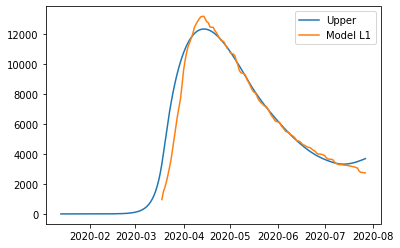

{'home': 1.0, 'leisure': 0.8536454497341414, 'other': 0.8, 'school': 0.8974569356516107, 'transport': 0.8629095665992427, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10837311093875714, 'other': 0.07281617918323906, 'school': 0, 'transport': 0.11358897832602065, 'work': 0.37925417506704606}
{'home': 1.0, 'leisure': 0.10837311093875714, 'other': 0.07281617918323906, 'school': 0, 'transport': 0.11358897832602065, 'work': 0.37925417506704606}
{'home': 1.0, 'leisure': 0.12990239330502354, 'other': 0.17434887379971498, 'school': 0.29616078876503155, 'transport': 0.19788732005432752, 'work': 0.6780544178446398}
{'home': 1.0, 'leisure': 0.249993922107671, 'other': 0.24530313276398866, 'school': 0.6012961468865792, 'transport': 0.2619711678417062, 'work': 0.6928320304720436}
{'home': 1.0, 'leisure': 0.4152500668365145, 'other': 0.36245965468070546, 'school': 0.6012961468865792, 'transport': 0.4332269263765343, 'work': 0.7288068046808984}
{'home': 1.0, 'leisure': 0.4219179939384496, 'other': 0.36245

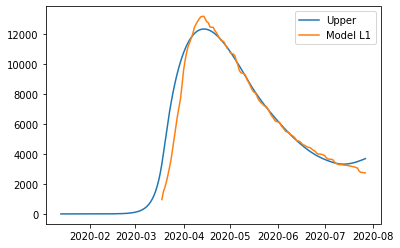

{'home': 1.00000001, 'leisure': 0.8536454497341414, 'other': 0.8, 'school': 0.8974569356516107, 'transport': 0.8629095665992427, 'work': 0.8}
{'home': 1.00000001, 'leisure': 0.10837311093875714, 'other': 0.07281617918323906, 'school': 0, 'transport': 0.11358897832602065, 'work': 0.37925417506704606}
{'home': 1.00000001, 'leisure': 0.10837311093875714, 'other': 0.07281617918323906, 'school': 0, 'transport': 0.11358897832602065, 'work': 0.37925417506704606}
{'home': 1.00000001, 'leisure': 0.12990239330502354, 'other': 0.17434887379971498, 'school': 0.29616078876503155, 'transport': 0.19788732005432752, 'work': 0.6780544178446398}
{'home': 1.00000001, 'leisure': 0.249993922107671, 'other': 0.24530313276398866, 'school': 0.6012961468865792, 'transport': 0.2619711678417062, 'work': 0.6928320304720436}
{'home': 1.00000001, 'leisure': 0.4152500668365145, 'other': 0.36245965468070546, 'school': 0.6012961468865792, 'transport': 0.4332269263765343, 'work': 0.7288068046808984}
{'home': 1.00000001

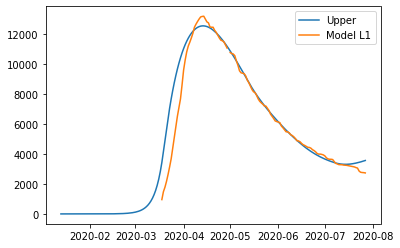

{'home': 1.0, 'leisure': 0.8379173061608891, 'other': 0.8, 'school': 0.8920348230139847, 'transport': 0.8540010338959135, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10694054439750054, 'other': 0.07516105140000809, 'school': 0, 'transport': 0.11325642493346107, 'work': 0.4017372775819918}
{'home': 1.0, 'leisure': 0.10694054439750054, 'other': 0.07516105140000809, 'school': 0, 'transport': 0.11325642493346107, 'work': 0.4017372775819918}
{'home': 1.0, 'leisure': 0.127988596790239, 'other': 0.17956562889619318, 'school': 0.29437149159461495, 'transport': 0.197353216043375, 'work': 0.7190809229720849}
{'home': 1.0, 'leisure': 0.246391781909721, 'other': 0.25032325060496113, 'school': 0.5976633314193698, 'transport': 0.2611026764622586, 'work': 0.7272996235438032}
{'home': 1.0, 'leisure': 0.408549047841182, 'other': 0.3641256852851543, 'school': 0.5976633314193698, 'transport': 0.4315270118151518, 'work': 0.7477999072363853}
{'home': 1.0, 'leisure': 0.4132446965914181, 'other': 0.3641256852851

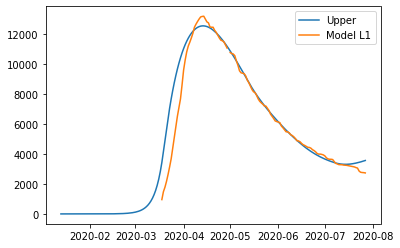

{'home': 1.0, 'leisure': 0.8379173061608891, 'other': 0.8, 'school': 0.8920348230139847, 'transport': 0.8540010338959135, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10694054439750054, 'other': 0.07516105140000809, 'school': 0, 'transport': 0.11325642493346107, 'work': 0.4017372775819918}
{'home': 1.0, 'leisure': 0.10694054439750054, 'other': 0.07516105140000809, 'school': 0, 'transport': 0.11325642493346107, 'work': 0.4017372775819918}
{'home': 1.0, 'leisure': 0.127988596790239, 'other': 0.17956562889619318, 'school': 0.29437149159461495, 'transport': 0.197353216043375, 'work': 0.7190809229720849}
{'home': 1.0, 'leisure': 0.246391781909721, 'other': 0.25032325060496113, 'school': 0.5976633314193698, 'transport': 0.2611026764622586, 'work': 0.7272996235438032}
{'home': 1.0, 'leisure': 0.408549047841182, 'other': 0.3641256852851543, 'school': 0.5976633314193698, 'transport': 0.4315270118151518, 'work': 0.7477999072363853}
{'home': 1.0, 'leisure': 0.4132446965914181, 'other': 0.3641256852851

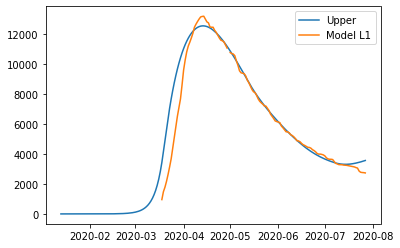

{'home': 1.0, 'leisure': 0.8379173061608891, 'other': 0.8, 'school': 0.8920348230139847, 'transport': 0.8540010338959135, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10694054439750054, 'other': 0.07516105140000809, 'school': 0, 'transport': 0.11325642493346107, 'work': 0.4017372775819918}
{'home': 1.0, 'leisure': 0.10694054439750054, 'other': 0.07516105140000809, 'school': 0, 'transport': 0.11325642493346107, 'work': 0.4017372775819918}
{'home': 1.0, 'leisure': 0.127988596790239, 'other': 0.17956562889619318, 'school': 0.29437149159461495, 'transport': 0.197353216043375, 'work': 0.7190809229720849}
{'home': 1.0, 'leisure': 0.246391781909721, 'other': 0.25032325060496113, 'school': 0.5976633314193698, 'transport': 0.2611026764622586, 'work': 0.7272996235438032}
{'home': 1.0, 'leisure': 0.408549047841182, 'other': 0.3641256852851543, 'school': 0.5976633314193698, 'transport': 0.4315270118151518, 'work': 0.7477999072363853}
{'home': 1.0, 'leisure': 0.4132446965914181, 'other': 0.3641256852851

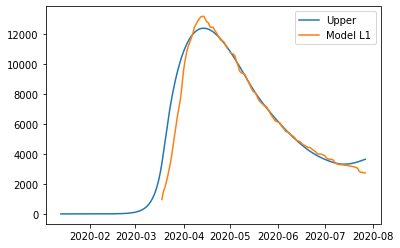

{'home': 1.0, 'leisure': 0.8481741593220485, 'other': 0.8, 'school': 0.8955707656310126, 'transport': 0.8598105886850004, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10787740060049952, 'other': 0.07363183850603286, 'school': 0, 'transport': 0.11347634022218367, 'work': 0.3869632107806364}
{'home': 1.0, 'leisure': 0.10787740060049952, 'other': 0.07363183850603286, 'school': 0, 'transport': 0.11347634022218367, 'work': 0.3869632107806364}
{'home': 1.0, 'leisure': 0.12923888492320654, 'other': 0.1761635120980175, 'school': 0.29553835265823414, 'transport': 0.19770699389157362, 'work': 0.6921216397959264}
{'home': 1.0, 'leisure': 0.24874554120763934, 'other': 0.24704937116846548, 'school': 0.6000324129727784, 'transport': 0.2616757059295341, 'work': 0.7046503240449641}
{'home': 1.0, 'leisure': 0.41292343831739836, 'other': 0.36303918024498155, 'school': 0.6000324129727784, 'transport': 0.4326456361718309, 'work': 0.7353191846255615}
{'home': 1.0, 'leisure': 0.41889665089556444, 'other': 0.3630

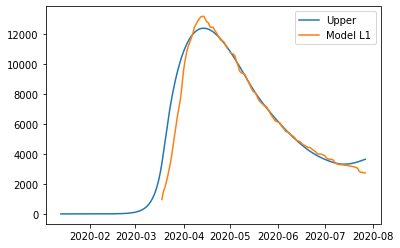

{'home': 1.0, 'leisure': 0.8481741593220485, 'other': 0.8, 'school': 0.8955707656310126, 'transport': 0.8598105886850004, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10787740060049952, 'other': 0.07363183850603286, 'school': 0, 'transport': 0.11347634022218367, 'work': 0.3869632107806364}
{'home': 1.0, 'leisure': 0.10787740060049952, 'other': 0.07363183850603286, 'school': 0, 'transport': 0.11347634022218367, 'work': 0.3869632107806364}
{'home': 1.0, 'leisure': 0.12923888492320654, 'other': 0.1761635120980175, 'school': 0.29553835265823414, 'transport': 0.19770699389157362, 'work': 0.6921216397959264}
{'home': 1.0, 'leisure': 0.24874554120763934, 'other': 0.24704937116846548, 'school': 0.6000324129727784, 'transport': 0.2616757059295341, 'work': 0.7046503240449641}
{'home': 1.0, 'leisure': 0.41292343831739836, 'other': 0.36303918024498155, 'school': 0.6000324129727784, 'transport': 0.4326456361718309, 'work': 0.7353191846255615}
{'home': 1.0, 'leisure': 0.41889665089556444, 'other': 0.3630

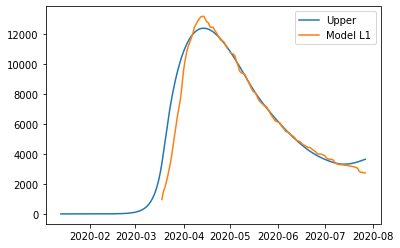

{'home': 1.0, 'leisure': 0.8481741593220485, 'other': 0.8, 'school': 0.8955707656310126, 'transport': 0.8598105886850004, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10787740060049952, 'other': 0.07363183850603286, 'school': 0, 'transport': 0.11347634022218367, 'work': 0.3869632107806364}
{'home': 1.0, 'leisure': 0.10787740060049952, 'other': 0.07363183850603286, 'school': 0, 'transport': 0.11347634022218367, 'work': 0.3869632107806364}
{'home': 1.0, 'leisure': 0.12923888492320654, 'other': 0.1761635120980175, 'school': 0.29553835265823414, 'transport': 0.19770699389157362, 'work': 0.6921216397959264}
{'home': 1.0, 'leisure': 0.24874554120763934, 'other': 0.24704937116846548, 'school': 0.6000324129727784, 'transport': 0.2616757059295341, 'work': 0.7046503240449641}
{'home': 1.0, 'leisure': 0.41292343831739836, 'other': 0.36303918024498155, 'school': 0.6000324129727784, 'transport': 0.4326456361718309, 'work': 0.7353191846255615}
{'home': 1.0, 'leisure': 0.41889665089556444, 'other': 0.3630

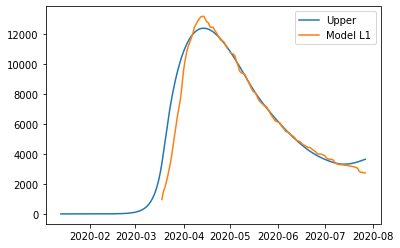

{'home': 1.00000001, 'leisure': 0.8481741593220485, 'other': 0.8, 'school': 0.8955707656310126, 'transport': 0.8598105886850004, 'work': 0.8}
{'home': 1.00000001, 'leisure': 0.10787740060049952, 'other': 0.07363183850603286, 'school': 0, 'transport': 0.11347634022218367, 'work': 0.3869632107806364}
{'home': 1.00000001, 'leisure': 0.10787740060049952, 'other': 0.07363183850603286, 'school': 0, 'transport': 0.11347634022218367, 'work': 0.3869632107806364}
{'home': 1.00000001, 'leisure': 0.12923888492320654, 'other': 0.1761635120980175, 'school': 0.29553835265823414, 'transport': 0.19770699389157362, 'work': 0.6921216397959264}
{'home': 1.00000001, 'leisure': 0.24874554120763934, 'other': 0.24704937116846548, 'school': 0.6000324129727784, 'transport': 0.2616757059295341, 'work': 0.7046503240449641}
{'home': 1.00000001, 'leisure': 0.41292343831739836, 'other': 0.36303918024498155, 'school': 0.6000324129727784, 'transport': 0.4326456361718309, 'work': 0.7353191846255615}
{'home': 1.00000001

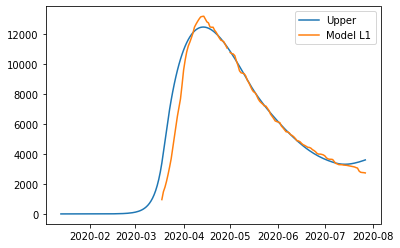

{'home': 1.0, 'leisure': 0.8424762706071727, 'other': 0.8, 'school': 0.8936064782206882, 'transport': 0.8565832638758141, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10735817452649925, 'other': 0.07448132738053173, 'school': 0, 'transport': 0.11335557729419786, 'work': 0.39511780756237624}
{'home': 1.0, 'leisure': 0.10735817452649925, 'other': 0.07448132738053173, 'school': 0, 'transport': 0.11335557729419786, 'work': 0.39511780756237624}
{'home': 1.0, 'leisure': 0.12854535877060197, 'other': 0.1780534127005969, 'school': 0.29489013781282714, 'transport': 0.19751298554684313, 'work': 0.7070019084979838}
{'home': 1.0, 'leisure': 0.24744014504752043, 'other': 0.24886803498480572, 'school': 0.5987163404078611, 'transport': 0.2613604458839183, 'work': 0.7171516824918441}
{'home': 1.0, 'leisure': 0.4104954241810199, 'other': 0.36364274168979416, 'school': 0.5987163404078611, 'transport': 0.43202885288921633, 'work': 0.7422079622251507}
{'home': 1.0, 'leisure': 0.4157549366867744, 'other': 0.363

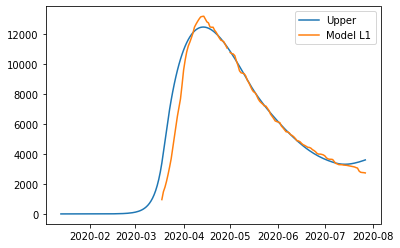

{'home': 1.0, 'leisure': 0.8424762706071727, 'other': 0.8, 'school': 0.8936064782206882, 'transport': 0.8565832638758141, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10735817452649925, 'other': 0.07448132738053173, 'school': 0, 'transport': 0.11335557729419786, 'work': 0.39511780756237624}
{'home': 1.0, 'leisure': 0.10735817452649925, 'other': 0.07448132738053173, 'school': 0, 'transport': 0.11335557729419786, 'work': 0.39511780756237624}
{'home': 1.0, 'leisure': 0.12854535877060197, 'other': 0.1780534127005969, 'school': 0.29489013781282714, 'transport': 0.19751298554684313, 'work': 0.7070019084979838}
{'home': 1.0, 'leisure': 0.24744014504752043, 'other': 0.24886803498480572, 'school': 0.5987163404078611, 'transport': 0.2613604458839183, 'work': 0.7171516824918441}
{'home': 1.0, 'leisure': 0.4104954241810199, 'other': 0.36364274168979416, 'school': 0.5987163404078611, 'transport': 0.43202885288921633, 'work': 0.7422079622251507}
{'home': 1.0, 'leisure': 0.4157549366867744, 'other': 0.363

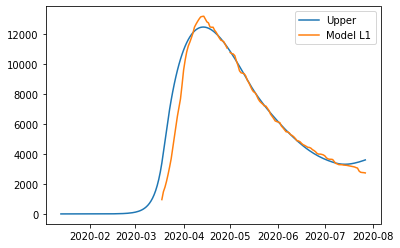

{'home': 1.0, 'leisure': 0.8424762706071727, 'other': 0.8, 'school': 0.8936064782206882, 'transport': 0.8565832638758141, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10735817452649925, 'other': 0.07448132738053173, 'school': 0, 'transport': 0.11335557729419786, 'work': 0.39511780756237624}
{'home': 1.0, 'leisure': 0.10735817452649925, 'other': 0.07448132738053173, 'school': 0, 'transport': 0.11335557729419786, 'work': 0.39511780756237624}
{'home': 1.0, 'leisure': 0.12854535877060197, 'other': 0.1780534127005969, 'school': 0.29489013781282714, 'transport': 0.19751298554684313, 'work': 0.7070019084979838}
{'home': 1.0, 'leisure': 0.24744014504752043, 'other': 0.24886803498480572, 'school': 0.5987163404078611, 'transport': 0.2613604458839183, 'work': 0.7171516824918441}
{'home': 1.0, 'leisure': 0.4104954241810199, 'other': 0.36364274168979416, 'school': 0.5987163404078611, 'transport': 0.43202885288921633, 'work': 0.7422079622251507}
{'home': 1.0, 'leisure': 0.4157549366867744, 'other': 0.363

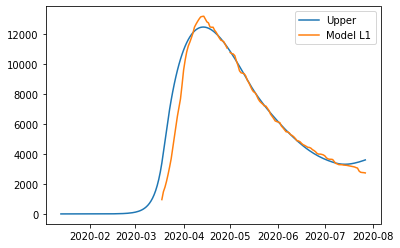

{'home': 1.0, 'leisure': 0.8424762706071727, 'other': 0.8, 'school': 0.8936064782206882, 'transport': 0.8565832638758141, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10735817452649925, 'other': 0.07448132738053173, 'school': 0, 'transport': 0.11335557729419786, 'work': 0.39511780756237624}
{'home': 1.0, 'leisure': 0.10735817452649925, 'other': 0.07448132738053173, 'school': 0, 'transport': 0.11335557729419786, 'work': 0.39511780756237624}
{'home': 1.0, 'leisure': 0.12854535877060197, 'other': 0.1780534127005969, 'school': 0.29489013781282714, 'transport': 0.19751298554684313, 'work': 0.7070019084979838}
{'home': 1.0, 'leisure': 0.24744014504752043, 'other': 0.24886803498480572, 'school': 0.5987163404078611, 'transport': 0.2613604458839183, 'work': 0.7171516824918441}
{'home': 1.0, 'leisure': 0.4104954241810199, 'other': 0.36364274168979416, 'school': 0.5987163404078611, 'transport': 0.43202885288921633, 'work': 0.7422079622251507}
{'home': 1.0, 'leisure': 0.4157549366867744, 'other': 0.363

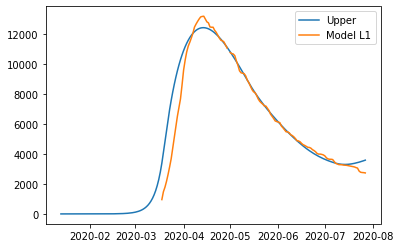

{'home': 1.0, 'leisure': 0.8416074354437602, 'other': 0.8, 'school': 0.8932658945592329, 'transport': 0.8561028597848884, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10725471806597761, 'other': 0.07456710368973161, 'school': 0, 'transport': 0.11331507452993224, 'work': 0.3952962184648833}
{'home': 1.0, 'leisure': 0.10725471806597761, 'other': 0.07456710368973161, 'school': 0, 'transport': 0.11331507452993224, 'work': 0.3952962184648833}
{'home': 1.0, 'leisure': 0.12840812762777107, 'other': 0.1782455027836509, 'school': 0.29477774520454686, 'transport': 0.19744415329271192, 'work': 0.7074513394307326}
{'home': 1.0, 'leisure': 0.24718359693077224, 'other': 0.2490285139402948, 'school': 0.5984881493546861, 'transport': 0.2612616775629521, 'work': 0.7172515305146319}
{'home': 1.0, 'leisure': 0.4100430007165266, 'other': 0.36362525175107385, 'school': 0.5984881493546861, 'transport': 0.43185461194237373, 'work': 0.7415491204089166}
{'home': 1.0, 'leisure': 0.41521295734744457, 'other': 0.36362

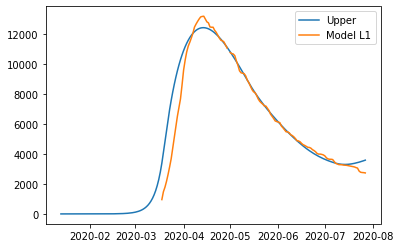

{'home': 1.0, 'leisure': 0.8416074354437602, 'other': 0.8, 'school': 0.8932658945592329, 'transport': 0.8561028597848884, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10725471806597761, 'other': 0.07456710368973161, 'school': 0, 'transport': 0.11331507452993224, 'work': 0.3952962184648833}
{'home': 1.0, 'leisure': 0.10725471806597761, 'other': 0.07456710368973161, 'school': 0, 'transport': 0.11331507452993224, 'work': 0.3952962184648833}
{'home': 1.0, 'leisure': 0.12840812762777107, 'other': 0.1782455027836509, 'school': 0.29477774520454686, 'transport': 0.19744415329271192, 'work': 0.7074513394307326}
{'home': 1.0, 'leisure': 0.24718359693077224, 'other': 0.2490285139402948, 'school': 0.5984881493546861, 'transport': 0.2612616775629521, 'work': 0.7172515305146319}
{'home': 1.0, 'leisure': 0.4100430007165266, 'other': 0.36362525175107385, 'school': 0.5984881493546861, 'transport': 0.43185461194237373, 'work': 0.7415491204089166}
{'home': 1.0, 'leisure': 0.41521295734744457, 'other': 0.36362

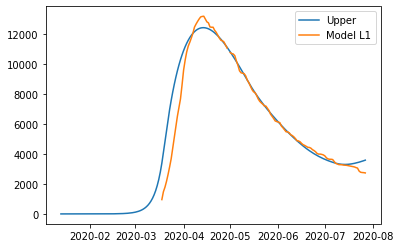

{'home': 1.0, 'leisure': 0.8416074354437602, 'other': 0.8, 'school': 0.8932658945592329, 'transport': 0.8561028597848884, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10725471806597761, 'other': 0.07456710368973161, 'school': 0, 'transport': 0.11331507452993224, 'work': 0.3952962184648833}
{'home': 1.0, 'leisure': 0.10725471806597761, 'other': 0.07456710368973161, 'school': 0, 'transport': 0.11331507452993224, 'work': 0.3952962184648833}
{'home': 1.0, 'leisure': 0.12840812762777107, 'other': 0.1782455027836509, 'school': 0.29477774520454686, 'transport': 0.19744415329271192, 'work': 0.7074513394307326}
{'home': 1.0, 'leisure': 0.24718359693077224, 'other': 0.2490285139402948, 'school': 0.5984881493546861, 'transport': 0.2612616775629521, 'work': 0.7172515305146319}
{'home': 1.0, 'leisure': 0.4100430007165266, 'other': 0.36362525175107385, 'school': 0.5984881493546861, 'transport': 0.43185461194237373, 'work': 0.7415491204089166}
{'home': 1.0, 'leisure': 0.41521295734744457, 'other': 0.36362

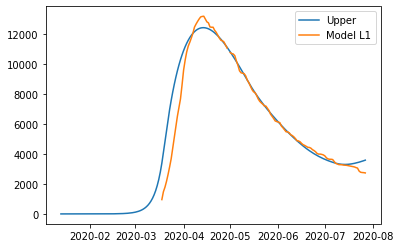

{'home': 1.00000001, 'leisure': 0.8416074354437602, 'other': 0.8, 'school': 0.8932658945592329, 'transport': 0.8561028597848884, 'work': 0.8}
{'home': 1.00000001, 'leisure': 0.10725471806597761, 'other': 0.07456710368973161, 'school': 0, 'transport': 0.11331507452993224, 'work': 0.3952962184648833}
{'home': 1.00000001, 'leisure': 0.10725471806597761, 'other': 0.07456710368973161, 'school': 0, 'transport': 0.11331507452993224, 'work': 0.3952962184648833}
{'home': 1.00000001, 'leisure': 0.12840812762777107, 'other': 0.1782455027836509, 'school': 0.29477774520454686, 'transport': 0.19744415329271192, 'work': 0.7074513394307326}
{'home': 1.00000001, 'leisure': 0.24718359693077224, 'other': 0.2490285139402948, 'school': 0.5984881493546861, 'transport': 0.2612616775629521, 'work': 0.7172515305146319}
{'home': 1.00000001, 'leisure': 0.4100430007165266, 'other': 0.36362525175107385, 'school': 0.5984881493546861, 'transport': 0.43185461194237373, 'work': 0.7415491204089166}
{'home': 1.00000001,

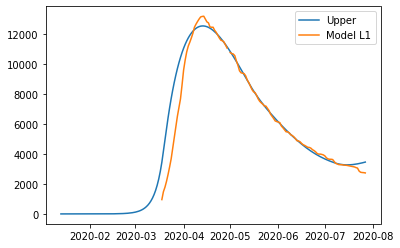

{'home': 1.0, 'leisure': 0.826732014103998, 'other': 0.8, 'school': 0.8880428230795128, 'transport': 0.8478515264061607, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10580656492123004, 'other': 0.07656956489329361, 'school': 0, 'transport': 0.112918841359733, 'work': 0.4137319349003816}
{'home': 1.0, 'leisure': 0.10580656492123004, 'other': 0.07656956489329361, 'school': 0, 'transport': 0.112918841359733, 'work': 0.4137319349003816}
{'home': 1.0, 'leisure': 0.12648960782946683, 'other': 0.1827070937778242, 'school': 0.2930541316162392, 'transport': 0.1967915429505491, 'work': 0.7414072606824531}
{'home': 1.0, 'leisure': 0.24357364139243104, 'other': 0.2532524192368803, 'school': 0.5949886914632736, 'transport': 0.26025793652177703, 'work': 0.7450252958511085}
{'home': 1.0, 'leisure': 0.40345656598379587, 'other': 0.3648386483873806, 'school': 0.5949886914632736, 'transport': 0.4299719430150126, 'work': 0.7549574315429158}
{'home': 1.0, 'leisure': 0.4069020907944875, 'other': 0.3648386483873

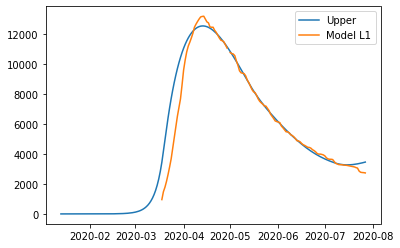

{'home': 1.0, 'leisure': 0.826732014103998, 'other': 0.8, 'school': 0.8880428230795128, 'transport': 0.8478515264061607, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10580656492123004, 'other': 0.07656956489329361, 'school': 0, 'transport': 0.112918841359733, 'work': 0.4137319349003816}
{'home': 1.0, 'leisure': 0.10580656492123004, 'other': 0.07656956489329361, 'school': 0, 'transport': 0.112918841359733, 'work': 0.4137319349003816}
{'home': 1.0, 'leisure': 0.12648960782946683, 'other': 0.1827070937778242, 'school': 0.2930541316162392, 'transport': 0.1967915429505491, 'work': 0.7414072606824531}
{'home': 1.0, 'leisure': 0.24357364139243104, 'other': 0.2532524192368803, 'school': 0.5949886914632736, 'transport': 0.26025793652177703, 'work': 0.7450252958511085}
{'home': 1.0, 'leisure': 0.40345656598379587, 'other': 0.3648386483873806, 'school': 0.5949886914632736, 'transport': 0.4299719430150126, 'work': 0.7549574315429158}
{'home': 1.0, 'leisure': 0.4069020907944875, 'other': 0.3648386483873

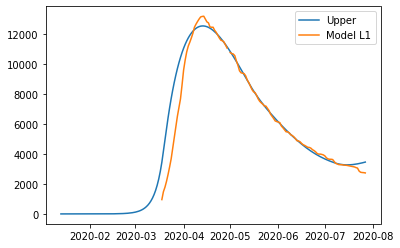

{'home': 1.0, 'leisure': 0.826732014103998, 'other': 0.8, 'school': 0.8880428230795128, 'transport': 0.8478515264061607, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10580656492123004, 'other': 0.07656956489329361, 'school': 0, 'transport': 0.112918841359733, 'work': 0.4137319349003816}
{'home': 1.0, 'leisure': 0.10580656492123004, 'other': 0.07656956489329361, 'school': 0, 'transport': 0.112918841359733, 'work': 0.4137319349003816}
{'home': 1.0, 'leisure': 0.12648960782946683, 'other': 0.1827070937778242, 'school': 0.2930541316162392, 'transport': 0.1967915429505491, 'work': 0.7414072606824531}
{'home': 1.0, 'leisure': 0.24357364139243104, 'other': 0.2532524192368803, 'school': 0.5949886914632736, 'transport': 0.26025793652177703, 'work': 0.7450252958511085}
{'home': 1.0, 'leisure': 0.40345656598379587, 'other': 0.3648386483873806, 'school': 0.5949886914632736, 'transport': 0.4299719430150126, 'work': 0.7549574315429158}
{'home': 1.0, 'leisure': 0.4069020907944875, 'other': 0.3648386483873

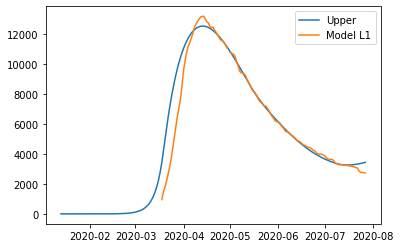

{'home': 1.0, 'leisure': 0.8248826426482682, 'other': 0.8, 'school': 0.8873742480644048, 'transport': 0.846832156680767, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10561351841521606, 'other': 0.07679548054540357, 'school': 0, 'transport': 0.11285736651934096, 'work': 0.4150010026969395}
{'home': 1.0, 'leisure': 0.10561351841521606, 'other': 0.07679548054540357, 'school': 0, 'transport': 0.11285736651934096, 'work': 0.4150010026969395}
{'home': 1.0, 'leisure': 0.12623487873130215, 'other': 0.183211181336082, 'school': 0.2928335018612536, 'transport': 0.1966886537822345, 'work': 0.7441831288927359}
{'home': 1.0, 'leisure': 0.24309491097201308, 'other': 0.25371680601704727, 'school': 0.5945407462031512, 'transport': 0.2601053143970248, 'work': 0.7474829157997331}
{'home': 1.0, 'leisure': 0.4025964562629376, 'other': 0.3649346106029868, 'school': 0.5945407462031512, 'transport': 0.4296942123030764, 'work': 0.7565414046718919}
{'home': 1.0, 'leisure': 0.4058408603646095, 'other': 0.36493461060

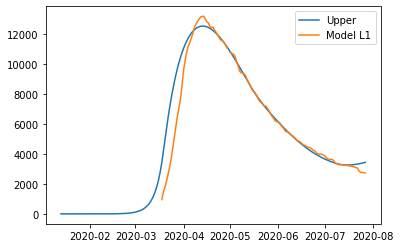

{'home': 1.0, 'leisure': 0.8248826426482682, 'other': 0.8, 'school': 0.8873742480644048, 'transport': 0.846832156680767, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10561351841521606, 'other': 0.07679548054540357, 'school': 0, 'transport': 0.11285736651934096, 'work': 0.4150010026969395}
{'home': 1.0, 'leisure': 0.10561351841521606, 'other': 0.07679548054540357, 'school': 0, 'transport': 0.11285736651934096, 'work': 0.4150010026969395}
{'home': 1.0, 'leisure': 0.12623487873130215, 'other': 0.183211181336082, 'school': 0.2928335018612536, 'transport': 0.1966886537822345, 'work': 0.7441831288927359}
{'home': 1.0, 'leisure': 0.24309491097201308, 'other': 0.25371680601704727, 'school': 0.5945407462031512, 'transport': 0.2601053143970248, 'work': 0.7474829157997331}
{'home': 1.0, 'leisure': 0.4025964562629376, 'other': 0.3649346106029868, 'school': 0.5945407462031512, 'transport': 0.4296942123030764, 'work': 0.7565414046718919}
{'home': 1.0, 'leisure': 0.4058408603646095, 'other': 0.36493461060

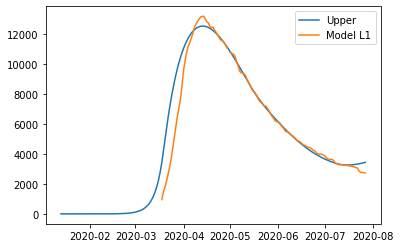

{'home': 1.0, 'leisure': 0.8248826426482682, 'other': 0.8, 'school': 0.8873742480644048, 'transport': 0.846832156680767, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10561351841521606, 'other': 0.07679548054540357, 'school': 0, 'transport': 0.11285736651934096, 'work': 0.4150010026969395}
{'home': 1.0, 'leisure': 0.10561351841521606, 'other': 0.07679548054540357, 'school': 0, 'transport': 0.11285736651934096, 'work': 0.4150010026969395}
{'home': 1.0, 'leisure': 0.12623487873130215, 'other': 0.183211181336082, 'school': 0.2928335018612536, 'transport': 0.1966886537822345, 'work': 0.7441831288927359}
{'home': 1.0, 'leisure': 0.24309491097201308, 'other': 0.25371680601704727, 'school': 0.5945407462031512, 'transport': 0.2601053143970248, 'work': 0.7474829157997331}
{'home': 1.0, 'leisure': 0.4025964562629376, 'other': 0.3649346106029868, 'school': 0.5945407462031512, 'transport': 0.4296942123030764, 'work': 0.7565414046718919}
{'home': 1.0, 'leisure': 0.4058408603646095, 'other': 0.36493461060

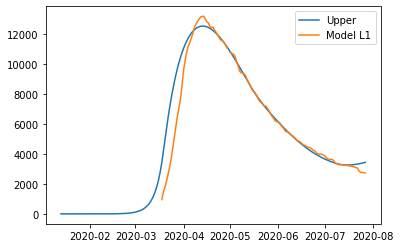

{'home': 1.0, 'leisure': 0.8248826426482682, 'other': 0.8, 'school': 0.8873742480644048, 'transport': 0.846832156680767, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10561351841521606, 'other': 0.07679548054540357, 'school': 0, 'transport': 0.11285736651934096, 'work': 0.4150010026969395}
{'home': 1.0, 'leisure': 0.10561351841521606, 'other': 0.07679548054540357, 'school': 0, 'transport': 0.11285736651934096, 'work': 0.4150010026969395}
{'home': 1.0, 'leisure': 0.12623487873130215, 'other': 0.183211181336082, 'school': 0.2928335018612536, 'transport': 0.1966886537822345, 'work': 0.7441831288927359}
{'home': 1.0, 'leisure': 0.24309491097201308, 'other': 0.25371680601704727, 'school': 0.5945407462031512, 'transport': 0.2601053143970248, 'work': 0.7474829157997331}
{'home': 1.0, 'leisure': 0.4025964562629376, 'other': 0.3649346106029868, 'school': 0.5945407462031512, 'transport': 0.4296942123030764, 'work': 0.7565414046718919}
{'home': 1.0, 'leisure': 0.4058408603646095, 'other': 0.36493461060

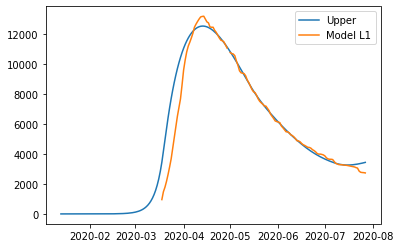

{'home': 1.00000001, 'leisure': 0.8248826426482682, 'other': 0.8, 'school': 0.8873742480644048, 'transport': 0.846832156680767, 'work': 0.8}
{'home': 1.00000001, 'leisure': 0.10561351841521606, 'other': 0.07679548054540357, 'school': 0, 'transport': 0.11285736651934096, 'work': 0.4150010026969395}
{'home': 1.00000001, 'leisure': 0.10561351841521606, 'other': 0.07679548054540357, 'school': 0, 'transport': 0.11285736651934096, 'work': 0.4150010026969395}
{'home': 1.00000001, 'leisure': 0.12623487873130215, 'other': 0.183211181336082, 'school': 0.2928335018612536, 'transport': 0.1966886537822345, 'work': 0.7441831288927359}
{'home': 1.00000001, 'leisure': 0.24309491097201308, 'other': 0.25371680601704727, 'school': 0.5945407462031512, 'transport': 0.2601053143970248, 'work': 0.7474829157997331}
{'home': 1.00000001, 'leisure': 0.4025964562629376, 'other': 0.3649346106029868, 'school': 0.5945407462031512, 'transport': 0.4296942123030764, 'work': 0.7565414046718919}
{'home': 1.00000001, 'lei

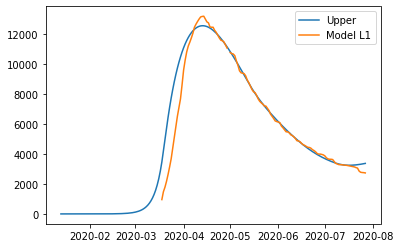

{'home': 1.0, 'leisure': 0.81511685715122, 'other': 0.8, 'school': 0.8838723305823245, 'transport': 0.8415673889296797, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10460592512373267, 'other': 0.07796650550835617, 'school': 0, 'transport': 0.11255072488249601, 'work': 0.4251677302747984}
{'home': 1.0, 'leisure': 0.10460592512373267, 'other': 0.07796650550835617, 'school': 0, 'transport': 0.11255072488249601, 'work': 0.4251677302747984}
{'home': 1.0, 'leisure': 0.12491226982677864, 'other': 0.18582434788883317, 'school': 0.2916778690921671, 'transport': 0.1961757227220061, 'work': 0.7636293318505353}
{'home': 1.0, 'leisure': 0.24060504184895917, 'other': 0.25614801661323816, 'school': 0.5921944614901574, 'transport': 0.25934380958126346, 'work': 0.7636293318505353}
{'home': 1.0, 'leisure': 0.3981329447405267, 'other': 0.36551745240298805, 'school': 0.5921944614901574, 'transport': 0.42830690160923507, 'work': 0.7649014537847443}
{'home': 1.0, 'leisure': 0.4003483916261343, 'other': 0.3655174

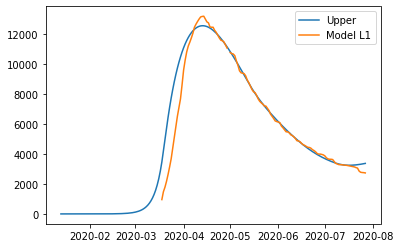

{'home': 1.0, 'leisure': 0.81511685715122, 'other': 0.8, 'school': 0.8838723305823245, 'transport': 0.8415673889296797, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10460592512373267, 'other': 0.07796650550835617, 'school': 0, 'transport': 0.11255072488249601, 'work': 0.4251677302747984}
{'home': 1.0, 'leisure': 0.10460592512373267, 'other': 0.07796650550835617, 'school': 0, 'transport': 0.11255072488249601, 'work': 0.4251677302747984}
{'home': 1.0, 'leisure': 0.12491226982677864, 'other': 0.18582434788883317, 'school': 0.2916778690921671, 'transport': 0.1961757227220061, 'work': 0.7636293318505353}
{'home': 1.0, 'leisure': 0.24060504184895917, 'other': 0.25614801661323816, 'school': 0.5921944614901574, 'transport': 0.25934380958126346, 'work': 0.7636293318505353}
{'home': 1.0, 'leisure': 0.3981329447405267, 'other': 0.36551745240298805, 'school': 0.5921944614901574, 'transport': 0.42830690160923507, 'work': 0.7649014537847443}
{'home': 1.0, 'leisure': 0.4003483916261343, 'other': 0.3655174

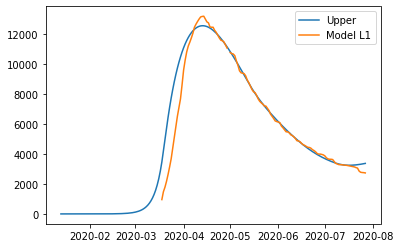

{'home': 1.0, 'leisure': 0.81511685715122, 'other': 0.8, 'school': 0.8838723305823245, 'transport': 0.8415673889296797, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10460592512373267, 'other': 0.07796650550835617, 'school': 0, 'transport': 0.11255072488249601, 'work': 0.4251677302747984}
{'home': 1.0, 'leisure': 0.10460592512373267, 'other': 0.07796650550835617, 'school': 0, 'transport': 0.11255072488249601, 'work': 0.4251677302747984}
{'home': 1.0, 'leisure': 0.12491226982677864, 'other': 0.18582434788883317, 'school': 0.2916778690921671, 'transport': 0.1961757227220061, 'work': 0.7636293318505353}
{'home': 1.0, 'leisure': 0.24060504184895917, 'other': 0.25614801661323816, 'school': 0.5921944614901574, 'transport': 0.25934380958126346, 'work': 0.7636293318505353}
{'home': 1.0, 'leisure': 0.3981329447405267, 'other': 0.36551745240298805, 'school': 0.5921944614901574, 'transport': 0.42830690160923507, 'work': 0.7649014537847443}
{'home': 1.0, 'leisure': 0.4003483916261343, 'other': 0.3655174

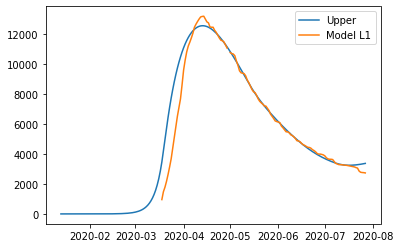

{'home': 1.0, 'leisure': 0.81511685715122, 'other': 0.8, 'school': 0.8838723305823245, 'transport': 0.8415673889296797, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10460592512373267, 'other': 0.07796650550835617, 'school': 0, 'transport': 0.11255072488249601, 'work': 0.4251677302747984}
{'home': 1.0, 'leisure': 0.10460592512373267, 'other': 0.07796650550835617, 'school': 0, 'transport': 0.11255072488249601, 'work': 0.4251677302747984}
{'home': 1.0, 'leisure': 0.12491226982677864, 'other': 0.18582434788883317, 'school': 0.2916778690921671, 'transport': 0.1961757227220061, 'work': 0.7636293318505353}
{'home': 1.0, 'leisure': 0.24060504184895917, 'other': 0.25614801661323816, 'school': 0.5921944614901574, 'transport': 0.25934380958126346, 'work': 0.7636293318505353}
{'home': 1.0, 'leisure': 0.3981329447405267, 'other': 0.36551745240298805, 'school': 0.5921944614901574, 'transport': 0.42830690160923507, 'work': 0.7649014537847443}
{'home': 1.0, 'leisure': 0.4003483916261343, 'other': 0.3655174

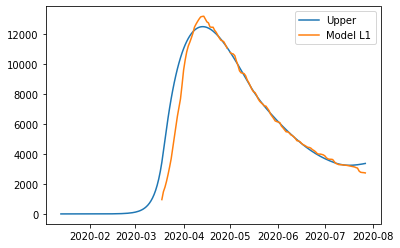

{'home': 1.0, 'leisure': 0.8141327691066692, 'other': 0.8, 'school': 0.8834590128602925, 'transport': 0.8410249352517624, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10447577682879214, 'other': 0.0780454769877349, 'school': 0, 'transport': 0.1124922884492471, 'work': 0.4253264018112886}
{'home': 1.0, 'leisure': 0.10447577682879214, 'other': 0.0780454769877349, 'school': 0, 'transport': 0.1124922884492471, 'work': 0.4253264018112886}
{'home': 1.0, 'leisure': 0.12474094658476828, 'other': 0.18600170421989967, 'school': 0.29154147424389654, 'transport': 0.1960754786190952, 'work': 0.7643957154257336}
{'home': 1.0, 'leisure': 0.24028481675006225, 'other': 0.25627858562309264, 'school': 0.591917538616396, 'transport': 0.25920324591862437, 'work': 0.7643957154257336}
{'home': 1.0, 'leisure': 0.39757856010891435, 'other': 0.3654434992031825, 'school': 0.591917538616396, 'transport': 0.4280640504495411, 'work': 0.7656204547505615}
{'home': 1.0, 'leisure': 0.3997071624973885, 'other': 0.36544349920

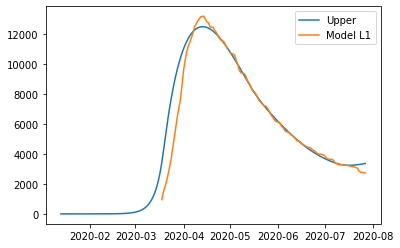

{'home': 1.0, 'leisure': 0.8141327691066692, 'other': 0.8, 'school': 0.8834590128602925, 'transport': 0.8410249352517624, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10447577682879214, 'other': 0.0780454769877349, 'school': 0, 'transport': 0.1124922884492471, 'work': 0.4253264018112886}
{'home': 1.0, 'leisure': 0.10447577682879214, 'other': 0.0780454769877349, 'school': 0, 'transport': 0.1124922884492471, 'work': 0.4253264018112886}
{'home': 1.0, 'leisure': 0.12474094658476828, 'other': 0.18600170421989967, 'school': 0.29154147424389654, 'transport': 0.1960754786190952, 'work': 0.7643957154257336}
{'home': 1.0, 'leisure': 0.24028481675006225, 'other': 0.25627858562309264, 'school': 0.591917538616396, 'transport': 0.25920324591862437, 'work': 0.7643957154257336}
{'home': 1.0, 'leisure': 0.39757856010891435, 'other': 0.3654434992031825, 'school': 0.591917538616396, 'transport': 0.4280640504495411, 'work': 0.7656204547505615}
{'home': 1.0, 'leisure': 0.3997071624973885, 'other': 0.36544349920

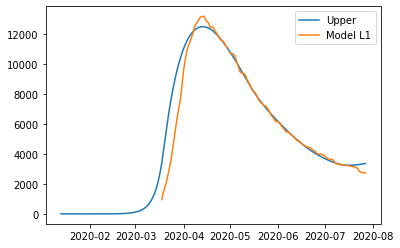

{'home': 1.00000001, 'leisure': 0.8141327691066692, 'other': 0.8, 'school': 0.8834590128602925, 'transport': 0.8410249352517624, 'work': 0.8}
{'home': 1.00000001, 'leisure': 0.10447577682879214, 'other': 0.0780454769877349, 'school': 0, 'transport': 0.1124922884492471, 'work': 0.4253264018112886}
{'home': 1.00000001, 'leisure': 0.10447577682879214, 'other': 0.0780454769877349, 'school': 0, 'transport': 0.1124922884492471, 'work': 0.4253264018112886}
{'home': 1.00000001, 'leisure': 0.12474094658476828, 'other': 0.18600170421989967, 'school': 0.29154147424389654, 'transport': 0.1960754786190952, 'work': 0.7643957154257336}
{'home': 1.00000001, 'leisure': 0.24028481675006225, 'other': 0.25627858562309264, 'school': 0.591917538616396, 'transport': 0.25920324591862437, 'work': 0.7643957154257336}
{'home': 1.00000001, 'leisure': 0.39757856010891435, 'other': 0.3654434992031825, 'school': 0.591917538616396, 'transport': 0.4280640504495411, 'work': 0.7656204547505615}
{'home': 1.00000001, 'lei

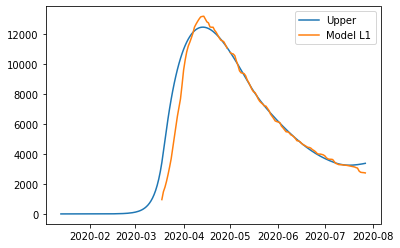

{'home': 1.0, 'leisure': 0.8140581755925608, 'other': 0.8, 'school': 0.883506875539864, 'transport': 0.8412182828483687, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10446487026338425, 'other': 0.07792489627986657, 'school': 0, 'transport': 0.11249965753492774, 'work': 0.4245208473309351}
{'home': 1.0, 'leisure': 0.10446487026338425, 'other': 0.07792489627986657, 'school': 0, 'transport': 0.11249965753492774, 'work': 0.4245208473309351}
{'home': 1.0, 'leisure': 0.12473490054790214, 'other': 0.18573850300692707, 'school': 0.29155726892815514, 'transport': 0.19608548660450262, 'work': 0.7626722699312132}
{'home': 1.0, 'leisure': 0.24027164183653207, 'other': 0.25603692198190087, 'school': 0.5919496066117089, 'transport': 0.2592250080080381, 'work': 0.7626722699312132}
{'home': 1.0, 'leisure': 0.397601139855705, 'other': 0.36542103562839845, 'school': 0.5919496066117089, 'transport': 0.4281153333573781, 'work': 0.7639748321249503}
{'home': 1.0, 'leisure': 0.39977565871470316, 'other': 0.365421

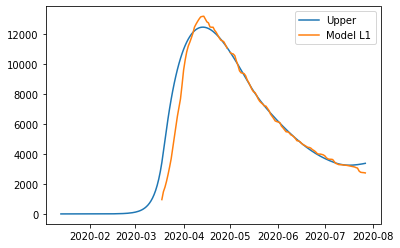

{'home': 1.0, 'leisure': 0.8140581755925608, 'other': 0.8, 'school': 0.883506875539864, 'transport': 0.8412182828483687, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10446487026338425, 'other': 0.07792489627986657, 'school': 0, 'transport': 0.11249965753492774, 'work': 0.4245208473309351}
{'home': 1.0, 'leisure': 0.10446487026338425, 'other': 0.07792489627986657, 'school': 0, 'transport': 0.11249965753492774, 'work': 0.4245208473309351}
{'home': 1.0, 'leisure': 0.12473490054790214, 'other': 0.18573850300692707, 'school': 0.29155726892815514, 'transport': 0.19608548660450262, 'work': 0.7626722699312132}
{'home': 1.0, 'leisure': 0.24027164183653207, 'other': 0.25603692198190087, 'school': 0.5919496066117089, 'transport': 0.2592250080080381, 'work': 0.7626722699312132}
{'home': 1.0, 'leisure': 0.397601139855705, 'other': 0.36542103562839845, 'school': 0.5919496066117089, 'transport': 0.4281153333573781, 'work': 0.7639748321249503}
{'home': 1.0, 'leisure': 0.39977565871470316, 'other': 0.365421

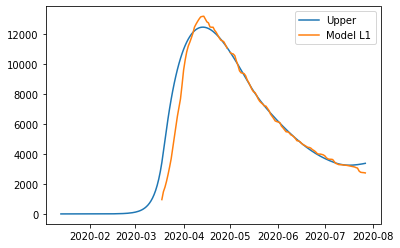

{'home': 1.0, 'leisure': 0.8140581755925608, 'other': 0.8, 'school': 0.883506875539864, 'transport': 0.8412182828483687, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10446487026338425, 'other': 0.07792489627986657, 'school': 0, 'transport': 0.11249965753492774, 'work': 0.4245208473309351}
{'home': 1.0, 'leisure': 0.10446487026338425, 'other': 0.07792489627986657, 'school': 0, 'transport': 0.11249965753492774, 'work': 0.4245208473309351}
{'home': 1.0, 'leisure': 0.12473490054790214, 'other': 0.18573850300692707, 'school': 0.29155726892815514, 'transport': 0.19608548660450262, 'work': 0.7626722699312132}
{'home': 1.0, 'leisure': 0.24027164183653207, 'other': 0.25603692198190087, 'school': 0.5919496066117089, 'transport': 0.2592250080080381, 'work': 0.7626722699312132}
{'home': 1.0, 'leisure': 0.397601139855705, 'other': 0.36542103562839845, 'school': 0.5919496066117089, 'transport': 0.4281153333573781, 'work': 0.7639748321249503}
{'home': 1.0, 'leisure': 0.39977565871470316, 'other': 0.365421

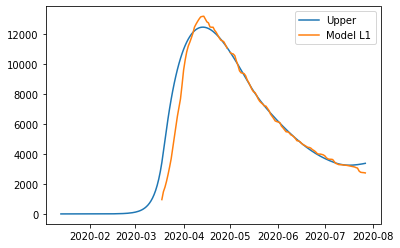

{'home': 1.00000001, 'leisure': 0.8140581755925608, 'other': 0.8, 'school': 0.883506875539864, 'transport': 0.8412182828483687, 'work': 0.8}
{'home': 1.00000001, 'leisure': 0.10446487026338425, 'other': 0.07792489627986657, 'school': 0, 'transport': 0.11249965753492774, 'work': 0.4245208473309351}
{'home': 1.00000001, 'leisure': 0.10446487026338425, 'other': 0.07792489627986657, 'school': 0, 'transport': 0.11249965753492774, 'work': 0.4245208473309351}
{'home': 1.00000001, 'leisure': 0.12473490054790214, 'other': 0.18573850300692707, 'school': 0.29155726892815514, 'transport': 0.19608548660450262, 'work': 0.7626722699312132}
{'home': 1.00000001, 'leisure': 0.24027164183653207, 'other': 0.25603692198190087, 'school': 0.5919496066117089, 'transport': 0.2592250080080381, 'work': 0.7626722699312132}
{'home': 1.00000001, 'leisure': 0.397601139855705, 'other': 0.36542103562839845, 'school': 0.5919496066117089, 'transport': 0.4281153333573781, 'work': 0.7639748321249503}
{'home': 1.00000001, 

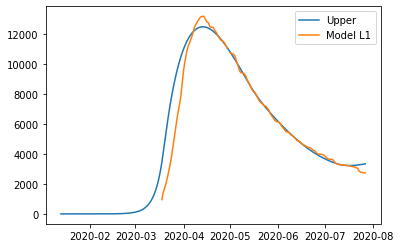

{'home': 1.0, 'leisure': 0.8135076893309826, 'other': 0.8, 'school': 0.8831726929307958, 'transport': 0.8407209059674281, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10441562240781863, 'other': 0.07802677411891434, 'school': 0, 'transport': 0.11246884965922066, 'work': 0.42453300186470505}
{'home': 1.0, 'leisure': 0.10441562240781863, 'other': 0.07802677411891434, 'school': 0, 'transport': 0.11246884965922066, 'work': 0.42453300186470505}
{'home': 1.0, 'leisure': 0.1246648940094305, 'other': 0.185966531966144, 'school': 0.2914469886671626, 'transport': 0.19603359317606417, 'work': 0.7632061531637767}
{'home': 1.0, 'leisure': 0.24014253408084735, 'other': 0.256247473919866, 'school': 0.5917257042636332, 'transport': 0.2591490853272352, 'work': 0.7632061531637767}
{'home': 1.0, 'leisure': 0.39735889832928417, 'other': 0.3654690760606882, 'school': 0.5917257042636332, 'transport': 0.4279788708559732, 'work': 0.764457333625606}
{'home': 1.0, 'leisure': 0.39944671201006915, 'other': 0.365469076

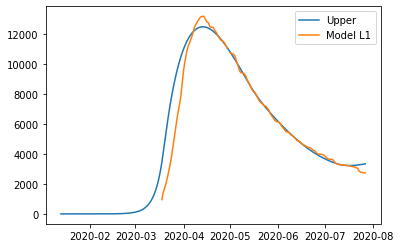

{'home': 1.0, 'leisure': 0.8135076893309826, 'other': 0.8, 'school': 0.8831726929307958, 'transport': 0.8407209059674281, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10441562240781863, 'other': 0.07802677411891434, 'school': 0, 'transport': 0.11246884965922066, 'work': 0.42453300186470505}
{'home': 1.0, 'leisure': 0.10441562240781863, 'other': 0.07802677411891434, 'school': 0, 'transport': 0.11246884965922066, 'work': 0.42453300186470505}
{'home': 1.0, 'leisure': 0.1246648940094305, 'other': 0.185966531966144, 'school': 0.2914469886671626, 'transport': 0.19603359317606417, 'work': 0.7632061531637767}
{'home': 1.0, 'leisure': 0.24014253408084735, 'other': 0.256247473919866, 'school': 0.5917257042636332, 'transport': 0.2591490853272352, 'work': 0.7632061531637767}
{'home': 1.0, 'leisure': 0.39735889832928417, 'other': 0.3654690760606882, 'school': 0.5917257042636332, 'transport': 0.4279788708559732, 'work': 0.764457333625606}
{'home': 1.0, 'leisure': 0.39944671201006915, 'other': 0.365469076

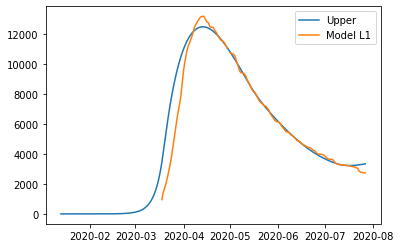

{'home': 1.0, 'leisure': 0.8135076893309826, 'other': 0.8, 'school': 0.8831726929307958, 'transport': 0.8407209059674281, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10441562240781863, 'other': 0.07802677411891434, 'school': 0, 'transport': 0.11246884965922066, 'work': 0.42453300186470505}
{'home': 1.0, 'leisure': 0.10441562240781863, 'other': 0.07802677411891434, 'school': 0, 'transport': 0.11246884965922066, 'work': 0.42453300186470505}
{'home': 1.0, 'leisure': 0.1246648940094305, 'other': 0.185966531966144, 'school': 0.2914469886671626, 'transport': 0.19603359317606417, 'work': 0.7632061531637767}
{'home': 1.0, 'leisure': 0.24014253408084735, 'other': 0.256247473919866, 'school': 0.5917257042636332, 'transport': 0.2591490853272352, 'work': 0.7632061531637767}
{'home': 1.0, 'leisure': 0.39735889832928417, 'other': 0.3654690760606882, 'school': 0.5917257042636332, 'transport': 0.4279788708559732, 'work': 0.764457333625606}
{'home': 1.0, 'leisure': 0.39944671201006915, 'other': 0.365469076

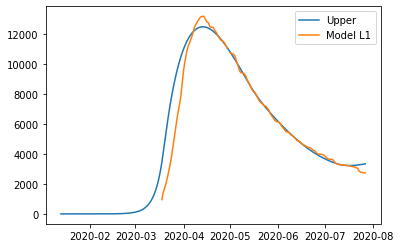

{'home': 1.00000001, 'leisure': 0.8135076893309826, 'other': 0.8, 'school': 0.8831726929307958, 'transport': 0.8407209059674281, 'work': 0.8}
{'home': 1.00000001, 'leisure': 0.10441562240781863, 'other': 0.07802677411891434, 'school': 0, 'transport': 0.11246884965922066, 'work': 0.42453300186470505}
{'home': 1.00000001, 'leisure': 0.10441562240781863, 'other': 0.07802677411891434, 'school': 0, 'transport': 0.11246884965922066, 'work': 0.42453300186470505}
{'home': 1.00000001, 'leisure': 0.1246648940094305, 'other': 0.185966531966144, 'school': 0.2914469886671626, 'transport': 0.19603359317606417, 'work': 0.7632061531637767}
{'home': 1.00000001, 'leisure': 0.24014253408084735, 'other': 0.256247473919866, 'school': 0.5917257042636332, 'transport': 0.2591490853272352, 'work': 0.7632061531637767}
{'home': 1.00000001, 'leisure': 0.39735889832928417, 'other': 0.3654690760606882, 'school': 0.5917257042636332, 'transport': 0.4279788708559732, 'work': 0.764457333625606}
{'home': 1.00000001, 'le

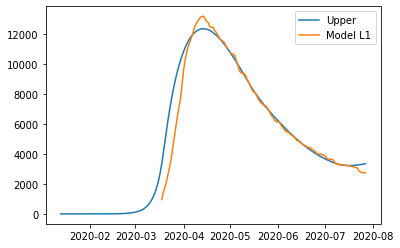

{'home': 1.0, 'leisure': 0.8136903081348374, 'other': 0.8, 'school': 0.8836729946943914, 'transport': 0.8417496677171507, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10441577668101217, 'other': 0.07757041971604971, 'school': 0, 'transport': 0.11251881576653909, 'work': 0.42109967772827583}
{'home': 1.0, 'leisure': 0.10441577668101217, 'other': 0.07757041971604971, 'school': 0, 'transport': 0.11251881576653909, 'work': 0.42109967772827583}
{'home': 1.0, 'leisure': 0.12469473445624091, 'other': 0.1849660976150753, 'school': 0.2916120882491492, 'transport': 0.1961104481362099, 'work': 0.7556910351106048}
{'home': 1.0, 'leisure': 0.24019157535635746, 'other': 0.255324239214099, 'school': 0.5920609064452423, 'transport': 0.25928280317392877, 'work': 0.7556910351106048}
{'home': 1.0, 'leisure': 0.397600488772664, 'other': 0.36534718650190956, 'school': 0.5920609064452423, 'transport': 0.42825604830069347, 'work': 0.7571720719124394}
{'home': 1.0, 'leisure': 0.39989972813584546, 'other': 0.365347

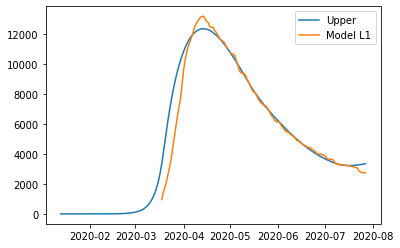

{'home': 1.0, 'leisure': 0.8136903081348374, 'other': 0.8, 'school': 0.8836729946943914, 'transport': 0.8417496677171507, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10441577668101217, 'other': 0.07757041971604971, 'school': 0, 'transport': 0.11251881576653909, 'work': 0.42109967772827583}
{'home': 1.0, 'leisure': 0.10441577668101217, 'other': 0.07757041971604971, 'school': 0, 'transport': 0.11251881576653909, 'work': 0.42109967772827583}
{'home': 1.0, 'leisure': 0.12469473445624091, 'other': 0.1849660976150753, 'school': 0.2916120882491492, 'transport': 0.1961104481362099, 'work': 0.7556910351106048}
{'home': 1.0, 'leisure': 0.24019157535635746, 'other': 0.255324239214099, 'school': 0.5920609064452423, 'transport': 0.25928280317392877, 'work': 0.7556910351106048}
{'home': 1.0, 'leisure': 0.397600488772664, 'other': 0.36534718650190956, 'school': 0.5920609064452423, 'transport': 0.42825604830069347, 'work': 0.7571720719124394}
{'home': 1.0, 'leisure': 0.39989972813584546, 'other': 0.365347

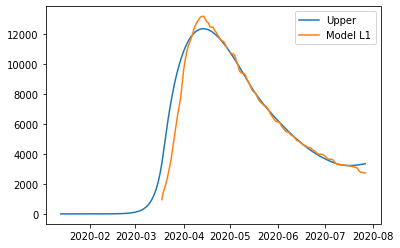

{'home': 1.00000001, 'leisure': 0.8136903081348374, 'other': 0.8, 'school': 0.8836729946943914, 'transport': 0.8417496677171507, 'work': 0.8}
{'home': 1.00000001, 'leisure': 0.10441577668101217, 'other': 0.07757041971604971, 'school': 0, 'transport': 0.11251881576653909, 'work': 0.42109967772827583}
{'home': 1.00000001, 'leisure': 0.10441577668101217, 'other': 0.07757041971604971, 'school': 0, 'transport': 0.11251881576653909, 'work': 0.42109967772827583}
{'home': 1.00000001, 'leisure': 0.12469473445624091, 'other': 0.1849660976150753, 'school': 0.2916120882491492, 'transport': 0.1961104481362099, 'work': 0.7556910351106048}
{'home': 1.00000001, 'leisure': 0.24019157535635746, 'other': 0.255324239214099, 'school': 0.5920609064452423, 'transport': 0.25928280317392877, 'work': 0.7556910351106048}
{'home': 1.00000001, 'leisure': 0.397600488772664, 'other': 0.36534718650190956, 'school': 0.5920609064452423, 'transport': 0.42825604830069347, 'work': 0.7571720719124394}
{'home': 1.00000001, 

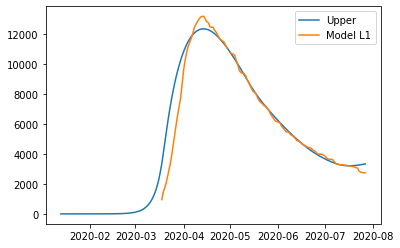

{'home': 1.0, 'leisure': 0.8136770092360807, 'other': 0.8, 'school': 0.8838061991618024, 'transport': 0.841954252062521, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10442032034073552, 'other': 0.07745933421102981, 'school': 0, 'transport': 0.11253457780446713, 'work': 0.4201277330636652}
{'home': 1.0, 'leisure': 0.10442032034073552, 'other': 0.07745933421102981, 'school': 0, 'transport': 0.11253457780446713, 'work': 0.4201277330636652}
{'home': 1.0, 'leisure': 0.12470775819358343, 'other': 0.18472383727796604, 'school': 0.2916560457233948, 'transport': 0.19613517457255666, 'work': 0.7536243641060603}
{'home': 1.0, 'leisure': 0.24021450598769423, 'other': 0.25511053293145425, 'school': 0.5921501534384076, 'transport': 0.2593239683085296, 'work': 0.7536243641060603}
{'home': 1.0, 'leisure': 0.397680690364817, 'other': 0.365356416298616, 'school': 0.5921501534384076, 'transport': 0.4283389264622448, 'work': 0.7551124241976588}
{'home': 1.0, 'leisure': 0.40002158728012815, 'other': 0.365356416

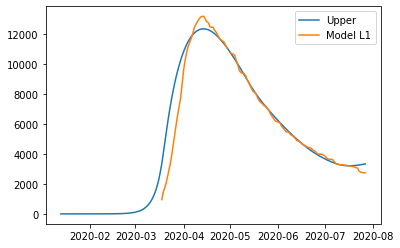

{'home': 1.0, 'leisure': 0.8136770092360807, 'other': 0.8, 'school': 0.8838061991618024, 'transport': 0.841954252062521, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10442032034073552, 'other': 0.07745933421102981, 'school': 0, 'transport': 0.11253457780446713, 'work': 0.4201277330636652}
{'home': 1.0, 'leisure': 0.10442032034073552, 'other': 0.07745933421102981, 'school': 0, 'transport': 0.11253457780446713, 'work': 0.4201277330636652}
{'home': 1.0, 'leisure': 0.12470775819358343, 'other': 0.18472383727796604, 'school': 0.2916560457233948, 'transport': 0.19613517457255666, 'work': 0.7536243641060603}
{'home': 1.0, 'leisure': 0.24021450598769423, 'other': 0.25511053293145425, 'school': 0.5921501534384076, 'transport': 0.2593239683085296, 'work': 0.7536243641060603}
{'home': 1.0, 'leisure': 0.397680690364817, 'other': 0.365356416298616, 'school': 0.5921501534384076, 'transport': 0.4283389264622448, 'work': 0.7551124241976588}
{'home': 1.0, 'leisure': 0.40002158728012815, 'other': 0.365356416

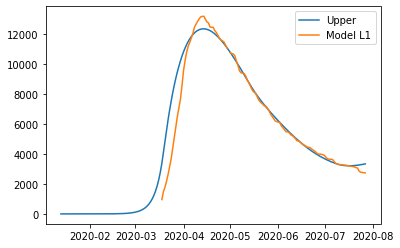

{'home': 1.0, 'leisure': 0.8136770092360807, 'other': 0.8, 'school': 0.8838061991618024, 'transport': 0.841954252062521, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10442032034073552, 'other': 0.07745933421102981, 'school': 0, 'transport': 0.11253457780446713, 'work': 0.4201277330636652}
{'home': 1.0, 'leisure': 0.10442032034073552, 'other': 0.07745933421102981, 'school': 0, 'transport': 0.11253457780446713, 'work': 0.4201277330636652}
{'home': 1.0, 'leisure': 0.12470775819358343, 'other': 0.18472383727796604, 'school': 0.2916560457233948, 'transport': 0.19613517457255666, 'work': 0.7536243641060603}
{'home': 1.0, 'leisure': 0.24021450598769423, 'other': 0.25511053293145425, 'school': 0.5921501534384076, 'transport': 0.2593239683085296, 'work': 0.7536243641060603}
{'home': 1.0, 'leisure': 0.397680690364817, 'other': 0.365356416298616, 'school': 0.5921501534384076, 'transport': 0.4283389264622448, 'work': 0.7551124241976588}
{'home': 1.0, 'leisure': 0.40002158728012815, 'other': 0.365356416

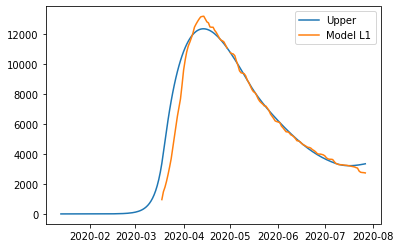

{'home': 1.0, 'leisure': 0.8136836379845156, 'other': 0.8, 'school': 0.8837398042729453, 'transport': 0.8418522783439455, 'work': 0.8}
{'home': 1.0, 'leisure': 0.1044180557422338, 'other': 0.07751469896909131, 'school': 0, 'transport': 0.1125267221860484, 'work': 0.42061169746907423}
{'home': 1.0, 'leisure': 0.1044180557422338, 'other': 0.07751469896909131, 'school': 0, 'transport': 0.1125267221860484, 'work': 0.42061169746907423}
{'home': 1.0, 'leisure': 0.12470126698007472, 'other': 0.18484457926810732, 'school': 0.29163413541007194, 'transport': 0.19612285155692305, 'work': 0.7546534301015932}
{'home': 1.0, 'leisure': 0.24020307704772276, 'other': 0.25521704364707587, 'school': 0.5921056688628734, 'transport': 0.25930345145104744, 'work': 0.7546534301015932}
{'home': 1.0, 'leisure': 0.39764071661177613, 'other': 0.3653518161893442, 'school': 0.5921056688628734, 'transport': 0.4282976179732404, 'work': 0.7561379930576261}
{'home': 1.0, 'leisure': 0.3999608506537433, 'other': 0.365351

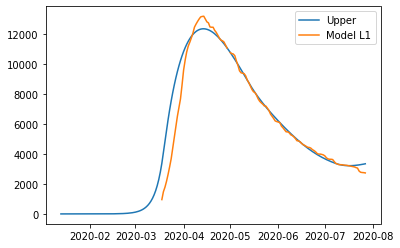

{'home': 1.0, 'leisure': 0.8136836379845156, 'other': 0.8, 'school': 0.8837398042729453, 'transport': 0.8418522783439455, 'work': 0.8}
{'home': 1.0, 'leisure': 0.1044180557422338, 'other': 0.07751469896909131, 'school': 0, 'transport': 0.1125267221860484, 'work': 0.42061169746907423}
{'home': 1.0, 'leisure': 0.1044180557422338, 'other': 0.07751469896909131, 'school': 0, 'transport': 0.1125267221860484, 'work': 0.42061169746907423}
{'home': 1.0, 'leisure': 0.12470126698007472, 'other': 0.18484457926810732, 'school': 0.29163413541007194, 'transport': 0.19612285155692305, 'work': 0.7546534301015932}
{'home': 1.0, 'leisure': 0.24020307704772276, 'other': 0.25521704364707587, 'school': 0.5921056688628734, 'transport': 0.25930345145104744, 'work': 0.7546534301015932}
{'home': 1.0, 'leisure': 0.39764071661177613, 'other': 0.3653518161893442, 'school': 0.5921056688628734, 'transport': 0.4282976179732404, 'work': 0.7561379930576261}
{'home': 1.0, 'leisure': 0.3999608506537433, 'other': 0.365351

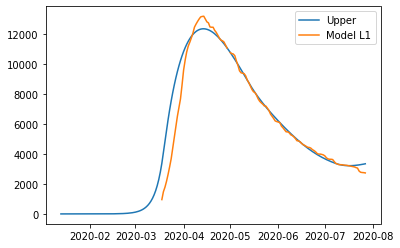

{'home': 1.00000001, 'leisure': 0.8136836379845156, 'other': 0.8, 'school': 0.8837398042729453, 'transport': 0.8418522783439455, 'work': 0.8}
{'home': 1.00000001, 'leisure': 0.1044180557422338, 'other': 0.07751469896909131, 'school': 0, 'transport': 0.1125267221860484, 'work': 0.42061169746907423}
{'home': 1.00000001, 'leisure': 0.1044180557422338, 'other': 0.07751469896909131, 'school': 0, 'transport': 0.1125267221860484, 'work': 0.42061169746907423}
{'home': 1.00000001, 'leisure': 0.12470126698007472, 'other': 0.18484457926810732, 'school': 0.29163413541007194, 'transport': 0.19612285155692305, 'work': 0.7546534301015932}
{'home': 1.00000001, 'leisure': 0.24020307704772276, 'other': 0.25521704364707587, 'school': 0.5921056688628734, 'transport': 0.25930345145104744, 'work': 0.7546534301015932}
{'home': 1.00000001, 'leisure': 0.39764071661177613, 'other': 0.3653518161893442, 'school': 0.5921056688628734, 'transport': 0.4282976179732404, 'work': 0.7561379930576261}
{'home': 1.00000001,

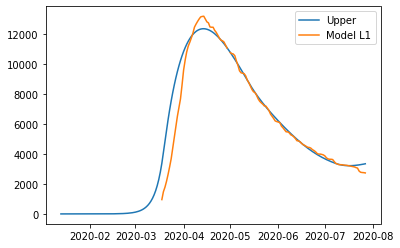

{'home': 1.0, 'leisure': 0.8137894435848128, 'other': 0.8, 'school': 0.88381849042602, 'transport': 0.8419545587820825, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10443218905980324, 'other': 0.07748805188467976, 'school': 0, 'transport': 0.11253612489888505, 'work': 0.4205035930594785}
{'home': 1.0, 'leisure': 0.10443218905980324, 'other': 0.07748805188467976, 'school': 0, 'transport': 0.11253612489888505, 'work': 0.4205035930594785}
{'home': 1.0, 'leisure': 0.12472122188934556, 'other': 0.18478568456667002, 'school': 0.2916601018405866, 'transport': 0.19613863827271735, 'work': 0.7543382864355395}
{'home': 1.0, 'leisure': 0.2402400035174036, 'other': 0.2551675795701759, 'school': 0.5921583885854335, 'transport': 0.2593265628059509, 'work': 0.7543382864355395}
{'home': 1.0, 'leisure': 0.3977110340873635, 'other': 0.36535919023124636, 'school': 0.5921583885854335, 'transport': 0.42833929414621247, 'work': 0.755822616432087}
{'home': 1.0, 'leisure': 0.40004860141868825, 'other': 0.365359190

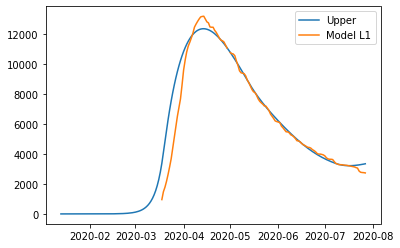

{'home': 1.0, 'leisure': 0.8137894435848128, 'other': 0.8, 'school': 0.88381849042602, 'transport': 0.8419545587820825, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10443218905980324, 'other': 0.07748805188467976, 'school': 0, 'transport': 0.11253612489888505, 'work': 0.4205035930594785}
{'home': 1.0, 'leisure': 0.10443218905980324, 'other': 0.07748805188467976, 'school': 0, 'transport': 0.11253612489888505, 'work': 0.4205035930594785}
{'home': 1.0, 'leisure': 0.12472122188934556, 'other': 0.18478568456667002, 'school': 0.2916601018405866, 'transport': 0.19613863827271735, 'work': 0.7543382864355395}
{'home': 1.0, 'leisure': 0.2402400035174036, 'other': 0.2551675795701759, 'school': 0.5921583885854335, 'transport': 0.2593265628059509, 'work': 0.7543382864355395}
{'home': 1.0, 'leisure': 0.3977110340873635, 'other': 0.36535919023124636, 'school': 0.5921583885854335, 'transport': 0.42833929414621247, 'work': 0.755822616432087}
{'home': 1.0, 'leisure': 0.40004860141868825, 'other': 0.365359190

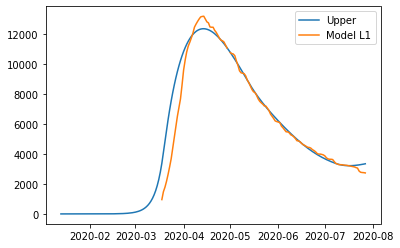

{'home': 1.0, 'leisure': 0.8137894435848128, 'other': 0.8, 'school': 0.88381849042602, 'transport': 0.8419545587820825, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10443218905980324, 'other': 0.07748805188467976, 'school': 0, 'transport': 0.11253612489888505, 'work': 0.4205035930594785}
{'home': 1.0, 'leisure': 0.10443218905980324, 'other': 0.07748805188467976, 'school': 0, 'transport': 0.11253612489888505, 'work': 0.4205035930594785}
{'home': 1.0, 'leisure': 0.12472122188934556, 'other': 0.18478568456667002, 'school': 0.2916601018405866, 'transport': 0.19613863827271735, 'work': 0.7543382864355395}
{'home': 1.0, 'leisure': 0.2402400035174036, 'other': 0.2551675795701759, 'school': 0.5921583885854335, 'transport': 0.2593265628059509, 'work': 0.7543382864355395}
{'home': 1.0, 'leisure': 0.3977110340873635, 'other': 0.36535919023124636, 'school': 0.5921583885854335, 'transport': 0.42833929414621247, 'work': 0.755822616432087}
{'home': 1.0, 'leisure': 0.40004860141868825, 'other': 0.365359190

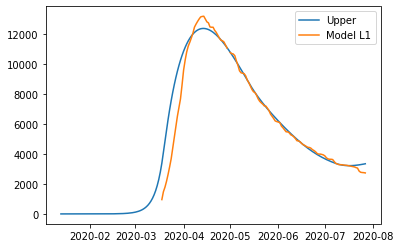

{'home': 1.0, 'leisure': 0.8136314130983833, 'other': 0.8, 'school': 0.8837348490524694, 'transport': 0.8417851261390095, 'work': 0.8}
{'home': 1.0, 'leisure': 0.1044200870583232, 'other': 0.07755407257408949, 'school': 0, 'transport': 0.11252992902872028, 'work': 0.4210676547169871}
{'home': 1.0, 'leisure': 0.1044200870583232, 'other': 0.07755407257408949, 'school': 0, 'transport': 0.11252992902872028, 'work': 0.4210676547169871}
{'home': 1.0, 'leisure': 0.12470268784410375, 'other': 0.1849309202788798, 'school': 0.2916325001873149, 'transport': 0.196129231290508, 'work': 0.7555132859198243}
{'home': 1.0, 'leisure': 0.24020542568665948, 'other': 0.25530552165452064, 'school': 0.5921023488651544, 'transport': 0.2593097243313677, 'work': 0.7555132859198243}
{'home': 1.0, 'leisure': 0.3976317931326851, 'other': 0.3653924254701101, 'school': 0.5921023488651544, 'transport': 0.4283037588326995, 'work': 0.7569390005932204}
{'home': 1.0, 'leisure': 0.39993303639239114, 'other': 0.36539242547

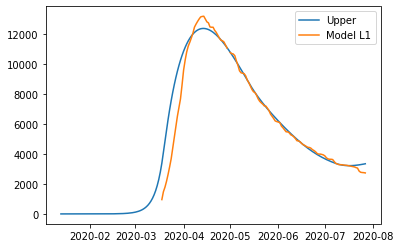

{'home': 1.0, 'leisure': 0.8136314130983833, 'other': 0.8, 'school': 0.8837348490524694, 'transport': 0.8417851261390095, 'work': 0.8}
{'home': 1.0, 'leisure': 0.1044200870583232, 'other': 0.07755407257408949, 'school': 0, 'transport': 0.11252992902872028, 'work': 0.4210676547169871}
{'home': 1.0, 'leisure': 0.1044200870583232, 'other': 0.07755407257408949, 'school': 0, 'transport': 0.11252992902872028, 'work': 0.4210676547169871}
{'home': 1.0, 'leisure': 0.12470268784410375, 'other': 0.1849309202788798, 'school': 0.2916325001873149, 'transport': 0.196129231290508, 'work': 0.7555132859198243}
{'home': 1.0, 'leisure': 0.24020542568665948, 'other': 0.25530552165452064, 'school': 0.5921023488651544, 'transport': 0.2593097243313677, 'work': 0.7555132859198243}
{'home': 1.0, 'leisure': 0.3976317931326851, 'other': 0.3653924254701101, 'school': 0.5921023488651544, 'transport': 0.4283037588326995, 'work': 0.7569390005932204}
{'home': 1.0, 'leisure': 0.39993303639239114, 'other': 0.36539242547

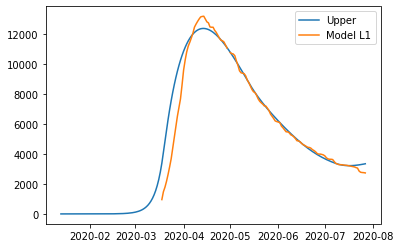

{'home': 1.00000001, 'leisure': 0.8136314130983833, 'other': 0.8, 'school': 0.8837348490524694, 'transport': 0.8417851261390095, 'work': 0.8}
{'home': 1.00000001, 'leisure': 0.1044200870583232, 'other': 0.07755407257408949, 'school': 0, 'transport': 0.11252992902872028, 'work': 0.4210676547169871}
{'home': 1.00000001, 'leisure': 0.1044200870583232, 'other': 0.07755407257408949, 'school': 0, 'transport': 0.11252992902872028, 'work': 0.4210676547169871}
{'home': 1.00000001, 'leisure': 0.12470268784410375, 'other': 0.1849309202788798, 'school': 0.2916325001873149, 'transport': 0.196129231290508, 'work': 0.7555132859198243}
{'home': 1.00000001, 'leisure': 0.24020542568665948, 'other': 0.25530552165452064, 'school': 0.5921023488651544, 'transport': 0.2593097243313677, 'work': 0.7555132859198243}
{'home': 1.00000001, 'leisure': 0.3976317931326851, 'other': 0.3653924254701101, 'school': 0.5921023488651544, 'transport': 0.4283037588326995, 'work': 0.7569390005932204}
{'home': 1.00000001, 'leis

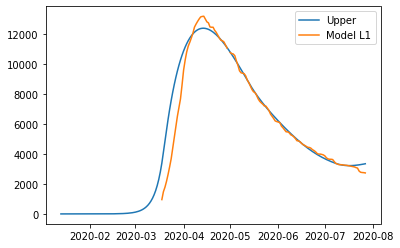

{'home': 1.0, 'leisure': 0.8135441487702662, 'other': 0.8, 'school': 0.8836925946277142, 'transport': 0.8416859631212232, 'work': 0.8000000082107154}
{'home': 1.0, 'leisure': 0.10441479335802518, 'other': 0.07759637264154373, 'school': 0, 'transport': 0.11252756682792911, 'work': 0.42146094487604374}
{'home': 1.0, 'leisure': 0.10441479335802518, 'other': 0.07759637264154373, 'school': 0, 'transport': 0.11252756682792911, 'work': 0.42146094487604374}
{'home': 1.0, 'leisure': 0.1246940911218256, 'other': 0.1850238753943013, 'school': 0.2916185562271457, 'transport': 0.19612600128360017, 'work': 0.7563104255158574}
{'home': 1.0, 'leisure': 0.24018933050009283, 'other': 0.2553951677240963, 'school': 0.5920740384005686, 'transport': 0.25930273393876285, 'work': 0.7563104255158574}
{'home': 1.0, 'leisure': 0.39759106068735384, 'other': 0.3654179004760887, 'school': 0.5920740384005686, 'transport': 0.42828733519166623, 'work': 0.7576936439814765}
{'home': 1.0, 'leisure': 0.3998699784363772, '

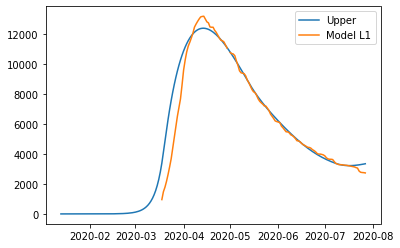

{'home': 1.0, 'leisure': 0.8135441487702662, 'other': 0.8, 'school': 0.8836925946277142, 'transport': 0.8416859631212232, 'work': 0.8000000082107154}
{'home': 1.0, 'leisure': 0.10441479335802518, 'other': 0.07759637264154373, 'school': 0, 'transport': 0.11252756682792911, 'work': 0.42146094487604374}
{'home': 1.0, 'leisure': 0.10441479335802518, 'other': 0.07759637264154373, 'school': 0, 'transport': 0.11252756682792911, 'work': 0.42146094487604374}
{'home': 1.0, 'leisure': 0.1246940911218256, 'other': 0.1850238753943013, 'school': 0.2916185562271457, 'transport': 0.19612600128360017, 'work': 0.7563104255158574}
{'home': 1.0, 'leisure': 0.24018933050009283, 'other': 0.2553951677240963, 'school': 0.5920740384005686, 'transport': 0.25930273393876285, 'work': 0.7563104255158574}
{'home': 1.0, 'leisure': 0.39759106068735384, 'other': 0.3654179004760887, 'school': 0.5920740384005686, 'transport': 0.42828733519166623, 'work': 0.7576936439814765}
{'home': 1.0, 'leisure': 0.3998699784363772, '

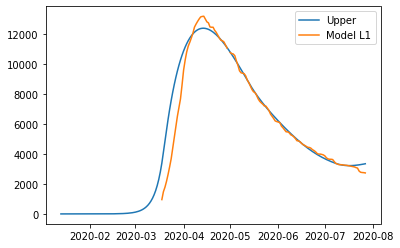

{'home': 1.0, 'leisure': 0.8135441487702662, 'other': 0.8, 'school': 0.8836925946277142, 'transport': 0.8416859631212232, 'work': 0.8000000082107154}
{'home': 1.0, 'leisure': 0.10441479335802518, 'other': 0.07759637264154373, 'school': 0, 'transport': 0.11252756682792911, 'work': 0.42146094487604374}
{'home': 1.0, 'leisure': 0.10441479335802518, 'other': 0.07759637264154373, 'school': 0, 'transport': 0.11252756682792911, 'work': 0.42146094487604374}
{'home': 1.0, 'leisure': 0.1246940911218256, 'other': 0.1850238753943013, 'school': 0.2916185562271457, 'transport': 0.19612600128360017, 'work': 0.7563104255158574}
{'home': 1.0, 'leisure': 0.24018933050009283, 'other': 0.2553951677240963, 'school': 0.5920740384005686, 'transport': 0.25930273393876285, 'work': 0.7563104255158574}
{'home': 1.0, 'leisure': 0.39759106068735384, 'other': 0.3654179004760887, 'school': 0.5920740384005686, 'transport': 0.42828733519166623, 'work': 0.7576936439814765}
{'home': 1.0, 'leisure': 0.3998699784363772, '

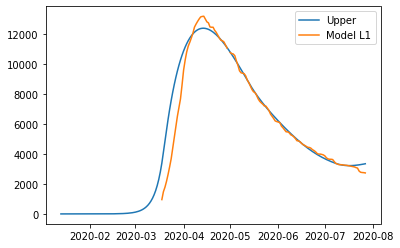

{'home': 1.0, 'leisure': 0.8135441487702662, 'other': 0.8, 'school': 0.8836925946277142, 'transport': 0.8416859631212232, 'work': 0.8000000082107154}
{'home': 1.0, 'leisure': 0.10441479335802518, 'other': 0.07759637264154373, 'school': 0, 'transport': 0.11252756682792911, 'work': 0.42146094487604374}
{'home': 1.0, 'leisure': 0.10441479335802518, 'other': 0.07759637264154373, 'school': 0, 'transport': 0.11252756682792911, 'work': 0.42146094487604374}
{'home': 1.0, 'leisure': 0.1246940911218256, 'other': 0.1850238753943013, 'school': 0.2916185562271457, 'transport': 0.19612600128360017, 'work': 0.7563104255158574}
{'home': 1.0, 'leisure': 0.24018933050009283, 'other': 0.2553951677240963, 'school': 0.5920740384005686, 'transport': 0.25930273393876285, 'work': 0.7563104255158574}
{'home': 1.0, 'leisure': 0.39759106068735384, 'other': 0.3654179004760887, 'school': 0.5920740384005686, 'transport': 0.42828733519166623, 'work': 0.7576936439814765}
{'home': 1.0, 'leisure': 0.3998699784363772, '

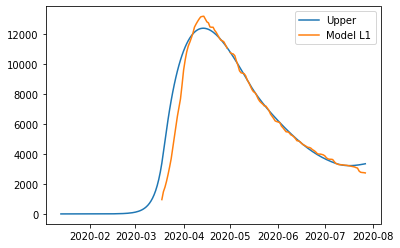

{'home': 1.0, 'leisure': 0.8134986260578848, 'other': 0.8, 'school': 0.8836776830925887, 'transport': 0.8416627380441057, 'work': 0.8000000081714509}
{'home': 1.0, 'leisure': 0.10441005777589266, 'other': 0.07760159908241743, 'school': 0, 'transport': 0.11252623457244136, 'work': 0.42147652908773003}
{'home': 1.0, 'leisure': 0.10441005777589266, 'other': 0.07760159908241743, 'school': 0, 'transport': 0.11252623457244136, 'work': 0.42147652908773003}
{'home': 1.0, 'leisure': 0.12468791643470868, 'other': 0.18503553634847716, 'school': 0.2916136354205543, 'transport': 0.19612377459435382, 'work': 0.756353523219694}
{'home': 1.0, 'leisure': 0.24017768667704145, 'other': 0.2554060514649838, 'school': 0.5920640476720345, 'transport': 0.2592994224778365, 'work': 0.756353523219694}
{'home': 1.0, 'leisure': 0.3975702755227465, 'other': 0.3654206020445825, 'school': 0.5920640476720345, 'transport': 0.4282812923941034, 'work': 0.7577301177804324}
{'home': 1.0, 'leisure': 0.39984462909080337, 'ot

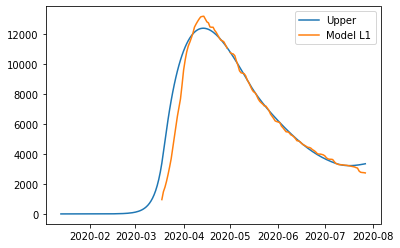

{'home': 1.0, 'leisure': 0.8134986260578848, 'other': 0.8, 'school': 0.8836776830925887, 'transport': 0.8416627380441057, 'work': 0.8000000081714509}
{'home': 1.0, 'leisure': 0.10441005777589266, 'other': 0.07760159908241743, 'school': 0, 'transport': 0.11252623457244136, 'work': 0.42147652908773003}
{'home': 1.0, 'leisure': 0.10441005777589266, 'other': 0.07760159908241743, 'school': 0, 'transport': 0.11252623457244136, 'work': 0.42147652908773003}
{'home': 1.0, 'leisure': 0.12468791643470868, 'other': 0.18503553634847716, 'school': 0.2916136354205543, 'transport': 0.19612377459435382, 'work': 0.756353523219694}
{'home': 1.0, 'leisure': 0.24017768667704145, 'other': 0.2554060514649838, 'school': 0.5920640476720345, 'transport': 0.2592994224778365, 'work': 0.756353523219694}
{'home': 1.0, 'leisure': 0.3975702755227465, 'other': 0.3654206020445825, 'school': 0.5920640476720345, 'transport': 0.4282812923941034, 'work': 0.7577301177804324}
{'home': 1.0, 'leisure': 0.39984462909080337, 'ot

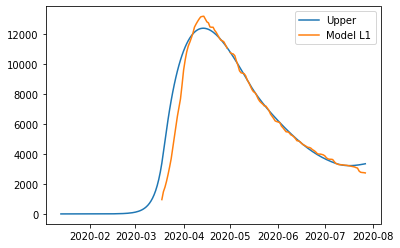

{'home': 1.0, 'leisure': 0.8134986260578848, 'other': 0.8, 'school': 0.8836776830925887, 'transport': 0.8416627380441057, 'work': 0.8000000081714509}
{'home': 1.0, 'leisure': 0.10441005777589266, 'other': 0.07760159908241743, 'school': 0, 'transport': 0.11252623457244136, 'work': 0.42147652908773003}
{'home': 1.0, 'leisure': 0.10441005777589266, 'other': 0.07760159908241743, 'school': 0, 'transport': 0.11252623457244136, 'work': 0.42147652908773003}
{'home': 1.0, 'leisure': 0.12468791643470868, 'other': 0.18503553634847716, 'school': 0.2916136354205543, 'transport': 0.19612377459435382, 'work': 0.756353523219694}
{'home': 1.0, 'leisure': 0.24017768667704145, 'other': 0.2554060514649838, 'school': 0.5920640476720345, 'transport': 0.2592994224778365, 'work': 0.756353523219694}
{'home': 1.0, 'leisure': 0.3975702755227465, 'other': 0.3654206020445825, 'school': 0.5920640476720345, 'transport': 0.4282812923941034, 'work': 0.7577301177804324}
{'home': 1.0, 'leisure': 0.39984462909080337, 'ot

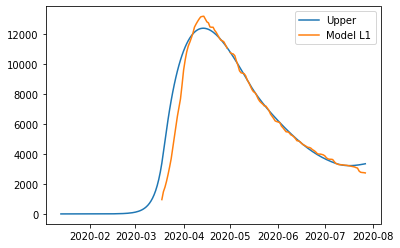

{'home': 1.0, 'leisure': 0.8134986260578848, 'other': 0.8, 'school': 0.8836776830925887, 'transport': 0.8416627380441057, 'work': 0.8000000081714509}
{'home': 1.0, 'leisure': 0.10441005777589266, 'other': 0.07760159908241743, 'school': 0, 'transport': 0.11252623457244136, 'work': 0.42147652908773003}
{'home': 1.0, 'leisure': 0.10441005777589266, 'other': 0.07760159908241743, 'school': 0, 'transport': 0.11252623457244136, 'work': 0.42147652908773003}
{'home': 1.0, 'leisure': 0.12468791643470868, 'other': 0.18503553634847716, 'school': 0.2916136354205543, 'transport': 0.19612377459435382, 'work': 0.756353523219694}
{'home': 1.0, 'leisure': 0.24017768667704145, 'other': 0.2554060514649838, 'school': 0.5920640476720345, 'transport': 0.2592994224778365, 'work': 0.756353523219694}
{'home': 1.0, 'leisure': 0.3975702755227465, 'other': 0.3654206020445825, 'school': 0.5920640476720345, 'transport': 0.4282812923941034, 'work': 0.7577301177804324}
{'home': 1.0, 'leisure': 0.39984462909080337, 'ot

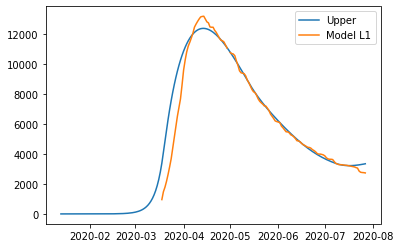

{'home': 1.0, 'leisure': 0.8132985549562319, 'other': 0.8, 'school': 0.8836266420812197, 'transport': 0.8415977390823568, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10438611103705692, 'other': 0.07760435030928839, 'school': 0, 'transport': 0.11251998806904065, 'work': 0.42142933782978426}
{'home': 1.0, 'leisure': 0.10438611103705692, 'other': 0.07760435030928839, 'school': 0, 'transport': 0.11251998806904065, 'work': 0.42142933782978426}
{'home': 1.0, 'leisure': 0.12465782490311368, 'other': 0.18504240521280524, 'school': 0.2915967918868025, 'transport': 0.19611287782430578, 'work': 0.7562903888138736}
{'home': 1.0, 'leisure': 0.24012082325270306, 'other': 0.2554101216908662, 'school': 0.5920298501944172, 'transport': 0.2592846294513038, 'work': 0.7562903888138736}
{'home': 1.0, 'leisure': 0.39747628677083696, 'other': 0.3654172322722531, 'school': 0.5920298501944172, 'transport': 0.4282566324163277, 'work': 0.7576505347232565}
{'home': 1.0, 'leisure': 0.3997395703930541, 'other': 0.36541

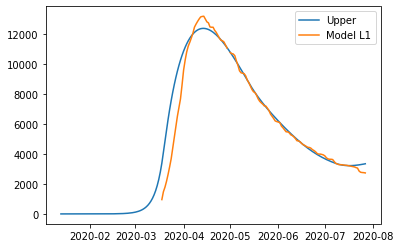

{'home': 1.0, 'leisure': 0.8132985549562319, 'other': 0.8, 'school': 0.8836266420812197, 'transport': 0.8415977390823568, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10438611103705692, 'other': 0.07760435030928839, 'school': 0, 'transport': 0.11251998806904065, 'work': 0.42142933782978426}
{'home': 1.0, 'leisure': 0.10438611103705692, 'other': 0.07760435030928839, 'school': 0, 'transport': 0.11251998806904065, 'work': 0.42142933782978426}
{'home': 1.0, 'leisure': 0.12465782490311368, 'other': 0.18504240521280524, 'school': 0.2915967918868025, 'transport': 0.19611287782430578, 'work': 0.7562903888138736}
{'home': 1.0, 'leisure': 0.24012082325270306, 'other': 0.2554101216908662, 'school': 0.5920298501944172, 'transport': 0.2592846294513038, 'work': 0.7562903888138736}
{'home': 1.0, 'leisure': 0.39747628677083696, 'other': 0.3654172322722531, 'school': 0.5920298501944172, 'transport': 0.4282566324163277, 'work': 0.7576505347232565}
{'home': 1.0, 'leisure': 0.3997395703930541, 'other': 0.36541

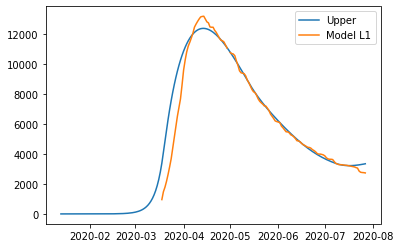

{'home': 1.00000001, 'leisure': 0.8132985549562319, 'other': 0.8, 'school': 0.8836266420812197, 'transport': 0.8415977390823568, 'work': 0.8}
{'home': 1.00000001, 'leisure': 0.10438611103705692, 'other': 0.07760435030928839, 'school': 0, 'transport': 0.11251998806904065, 'work': 0.42142933782978426}
{'home': 1.00000001, 'leisure': 0.10438611103705692, 'other': 0.07760435030928839, 'school': 0, 'transport': 0.11251998806904065, 'work': 0.42142933782978426}
{'home': 1.00000001, 'leisure': 0.12465782490311368, 'other': 0.18504240521280524, 'school': 0.2915967918868025, 'transport': 0.19611287782430578, 'work': 0.7562903888138736}
{'home': 1.00000001, 'leisure': 0.24012082325270306, 'other': 0.2554101216908662, 'school': 0.5920298501944172, 'transport': 0.2592846294513038, 'work': 0.7562903888138736}
{'home': 1.00000001, 'leisure': 0.39747628677083696, 'other': 0.3654172322722531, 'school': 0.5920298501944172, 'transport': 0.4282566324163277, 'work': 0.7576505347232565}
{'home': 1.00000001

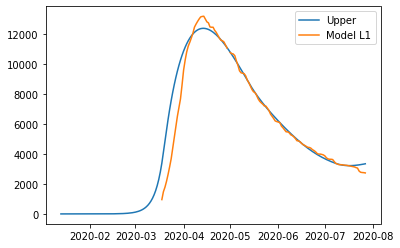

{'home': 1.0, 'leisure': 0.813207248546023, 'other': 0.8, 'school': 0.8835863985559897, 'transport': 0.8415237014908181, 'work': 0.8000001024431229}
{'home': 1.0, 'leisure': 0.1043769114555756, 'other': 0.077621702628185, 'school': 0, 'transport': 0.11251512931127026, 'work': 0.4215570415989703}
{'home': 1.0, 'leisure': 0.1043769114555756, 'other': 0.077621702628185, 'school': 0, 'transport': 0.11251512931127026, 'work': 0.4215570415989703}
{'home': 1.0, 'leisure': 0.12464503498526162, 'other': 0.18508094331836752, 'school': 0.2915835115234766, 'transport': 0.19610474137699502, 'work': 0.7565875061574497}
{'home': 1.0, 'leisure': 0.24009705803940137, 'other': 0.2554452110449949, 'school': 0.5920028870325131, 'transport': 0.25927259474507586, 'work': 0.7565875061574497}
{'home': 1.0, 'leisure': 0.3974316519099665, 'other': 0.36542237051654536, 'school': 0.5920028870325131, 'transport': 0.42823475122016097, 'work': 0.7579287194843447}
{'home': 1.0, 'leisure': 0.3996814199607957, 'other':

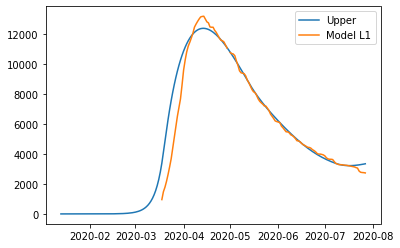

{'home': 1.0, 'leisure': 0.813207248546023, 'other': 0.8, 'school': 0.8835863985559897, 'transport': 0.8415237014908181, 'work': 0.8000001024431229}
{'home': 1.0, 'leisure': 0.1043769114555756, 'other': 0.077621702628185, 'school': 0, 'transport': 0.11251512931127026, 'work': 0.4215570415989703}
{'home': 1.0, 'leisure': 0.1043769114555756, 'other': 0.077621702628185, 'school': 0, 'transport': 0.11251512931127026, 'work': 0.4215570415989703}
{'home': 1.0, 'leisure': 0.12464503498526162, 'other': 0.18508094331836752, 'school': 0.2915835115234766, 'transport': 0.19610474137699502, 'work': 0.7565875061574497}
{'home': 1.0, 'leisure': 0.24009705803940137, 'other': 0.2554452110449949, 'school': 0.5920028870325131, 'transport': 0.25927259474507586, 'work': 0.7565875061574497}
{'home': 1.0, 'leisure': 0.3974316519099665, 'other': 0.36542237051654536, 'school': 0.5920028870325131, 'transport': 0.42823475122016097, 'work': 0.7579287194843447}
{'home': 1.0, 'leisure': 0.3996814199607957, 'other':

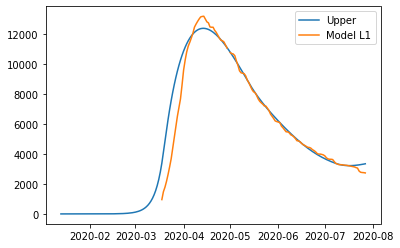

{'home': 1.0, 'leisure': 0.813207248546023, 'other': 0.8, 'school': 0.8835863985559897, 'transport': 0.8415237014908181, 'work': 0.8000001024431229}
{'home': 1.0, 'leisure': 0.1043769114555756, 'other': 0.077621702628185, 'school': 0, 'transport': 0.11251512931127026, 'work': 0.4215570415989703}
{'home': 1.0, 'leisure': 0.1043769114555756, 'other': 0.077621702628185, 'school': 0, 'transport': 0.11251512931127026, 'work': 0.4215570415989703}
{'home': 1.0, 'leisure': 0.12464503498526162, 'other': 0.18508094331836752, 'school': 0.2915835115234766, 'transport': 0.19610474137699502, 'work': 0.7565875061574497}
{'home': 1.0, 'leisure': 0.24009705803940137, 'other': 0.2554452110449949, 'school': 0.5920028870325131, 'transport': 0.25927259474507586, 'work': 0.7565875061574497}
{'home': 1.0, 'leisure': 0.3974316519099665, 'other': 0.36542237051654536, 'school': 0.5920028870325131, 'transport': 0.42823475122016097, 'work': 0.7579287194843447}
{'home': 1.0, 'leisure': 0.3996814199607957, 'other':

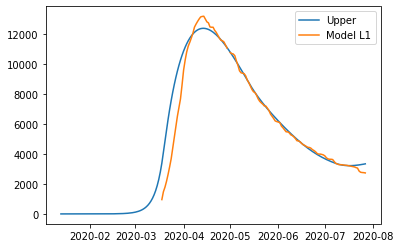

{'home': 1.0, 'leisure': 0.8126479706090446, 'other': 0.8, 'school': 0.8833823910386729, 'transport': 0.8411843363359941, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10431624258547273, 'other': 0.07768593076279641, 'school': 0, 'transport': 0.11249054411406749, 'work': 0.42195099808113}
{'home': 1.0, 'leisure': 0.10431624258547273, 'other': 0.07768593076279641, 'school': 0, 'transport': 0.11249054411406749, 'work': 0.42195099808113}
{'home': 1.0, 'leisure': 0.12456447048683145, 'other': 0.1852245271068157, 'school': 0.29151618904276205, 'transport': 0.19606304017147858, 'work': 0.7575616200530713}
{'home': 1.0, 'leisure': 0.23994624447418625, 'other': 0.25557348202232744, 'school': 0.5918662019959109, 'transport': 0.25921252659833416, 'work': 0.7575616200530713}
{'home': 1.0, 'leisure': 0.39716365771579676, 'other': 0.36543704402633326, 'school': 0.5918662019959109, 'transport': 0.4281282567918667, 'work': 0.7588168664909632}
{'home': 1.0, 'leisure': 0.39935259891910635, 'other': 0.3654370

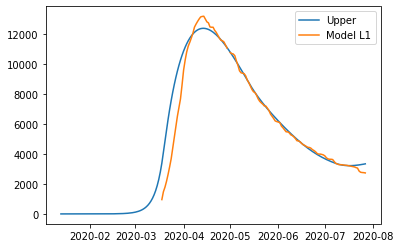

{'home': 1.0, 'leisure': 0.8126479706090446, 'other': 0.8, 'school': 0.8833823910386729, 'transport': 0.8411843363359941, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10431624258547273, 'other': 0.07768593076279641, 'school': 0, 'transport': 0.11249054411406749, 'work': 0.42195099808113}
{'home': 1.0, 'leisure': 0.10431624258547273, 'other': 0.07768593076279641, 'school': 0, 'transport': 0.11249054411406749, 'work': 0.42195099808113}
{'home': 1.0, 'leisure': 0.12456447048683145, 'other': 0.1852245271068157, 'school': 0.29151618904276205, 'transport': 0.19606304017147858, 'work': 0.7575616200530713}
{'home': 1.0, 'leisure': 0.23994624447418625, 'other': 0.25557348202232744, 'school': 0.5918662019959109, 'transport': 0.25921252659833416, 'work': 0.7575616200530713}
{'home': 1.0, 'leisure': 0.39716365771579676, 'other': 0.36543704402633326, 'school': 0.5918662019959109, 'transport': 0.4281282567918667, 'work': 0.7588168664909632}
{'home': 1.0, 'leisure': 0.39935259891910635, 'other': 0.3654370

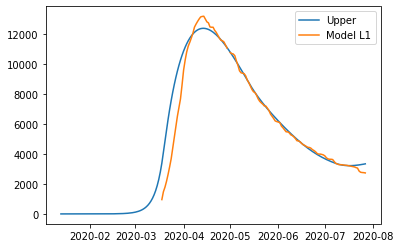

{'home': 1.0, 'leisure': 0.8126479706090446, 'other': 0.8, 'school': 0.8833823910386729, 'transport': 0.8411843363359941, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10431624258547273, 'other': 0.07768593076279641, 'school': 0, 'transport': 0.11249054411406749, 'work': 0.42195099808113}
{'home': 1.0, 'leisure': 0.10431624258547273, 'other': 0.07768593076279641, 'school': 0, 'transport': 0.11249054411406749, 'work': 0.42195099808113}
{'home': 1.0, 'leisure': 0.12456447048683145, 'other': 0.1852245271068157, 'school': 0.29151618904276205, 'transport': 0.19606304017147858, 'work': 0.7575616200530713}
{'home': 1.0, 'leisure': 0.23994624447418625, 'other': 0.25557348202232744, 'school': 0.5918662019959109, 'transport': 0.25921252659833416, 'work': 0.7575616200530713}
{'home': 1.0, 'leisure': 0.39716365771579676, 'other': 0.36543704402633326, 'school': 0.5918662019959109, 'transport': 0.4281282567918667, 'work': 0.7588168664909632}
{'home': 1.0, 'leisure': 0.39935259891910635, 'other': 0.3654370

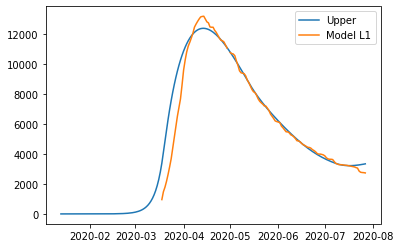

{'home': 1.0, 'leisure': 0.8126479706090446, 'other': 0.8, 'school': 0.8833823910386729, 'transport': 0.8411843363359941, 'work': 0.8}
{'home': 1.0, 'leisure': 0.10431624258547273, 'other': 0.07768593076279641, 'school': 0, 'transport': 0.11249054411406749, 'work': 0.42195099808113}
{'home': 1.0, 'leisure': 0.10431624258547273, 'other': 0.07768593076279641, 'school': 0, 'transport': 0.11249054411406749, 'work': 0.42195099808113}
{'home': 1.0, 'leisure': 0.12456447048683145, 'other': 0.1852245271068157, 'school': 0.29151618904276205, 'transport': 0.19606304017147858, 'work': 0.7575616200530713}
{'home': 1.0, 'leisure': 0.23994624447418625, 'other': 0.25557348202232744, 'school': 0.5918662019959109, 'transport': 0.25921252659833416, 'work': 0.7575616200530713}
{'home': 1.0, 'leisure': 0.39716365771579676, 'other': 0.36543704402633326, 'school': 0.5918662019959109, 'transport': 0.4281282567918667, 'work': 0.7588168664909632}
{'home': 1.0, 'leisure': 0.39935259891910635, 'other': 0.3654370

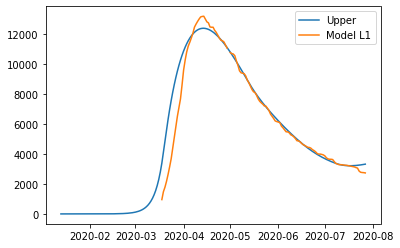

{'home': 0.9999873800610506, 'leisure': 0.8099008280457348, 'other': 0.8, 'school': 0.8825078384423656, 'transport': 0.839550829321608, 'work': 0.8}
{'home': 0.9999873800610506, 'leisure': 0.10401696892149057, 'other': 0.0779828125320302, 'school': 0, 'transport': 0.11237031305359471, 'work': 0.42397890867018806}
{'home': 0.9999873800610506, 'leisure': 0.10401696892149057, 'other': 0.0779828125320302, 'school': 0, 'transport': 0.11237031305359471, 'work': 0.42397890867018806}
{'home': 0.9999873800610506, 'leisure': 0.12416819761517618, 'other': 0.18588843673296096, 'school': 0.29122758668598064, 'transport': 0.1958586528114461, 'work': 0.7624423002996222}
{'home': 0.9999873800610506, 'leisure': 0.23920435048485422, 'other': 0.2561655671275203, 'school': 0.591280251756385, 'transport': 0.2589194447827065, 'work': 0.7624423002996222}
{'home': 0.9999873800610506, 'leisure': 0.3958523430179771, 'other': 0.3655008674432858, 'school': 0.591280251756385, 'transport': 0.4276108185915194, 'work

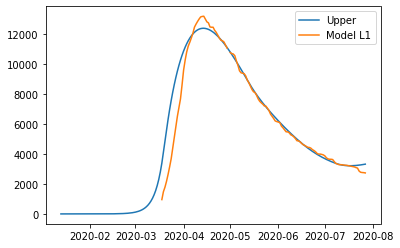

{'home': 0.9999873800610506, 'leisure': 0.8099008280457348, 'other': 0.8, 'school': 0.8825078384423656, 'transport': 0.839550829321608, 'work': 0.8}
{'home': 0.9999873800610506, 'leisure': 0.10401696892149057, 'other': 0.0779828125320302, 'school': 0, 'transport': 0.11237031305359471, 'work': 0.42397890867018806}
{'home': 0.9999873800610506, 'leisure': 0.10401696892149057, 'other': 0.0779828125320302, 'school': 0, 'transport': 0.11237031305359471, 'work': 0.42397890867018806}
{'home': 0.9999873800610506, 'leisure': 0.12416819761517618, 'other': 0.18588843673296096, 'school': 0.29122758668598064, 'transport': 0.1958586528114461, 'work': 0.7624423002996222}
{'home': 0.9999873800610506, 'leisure': 0.23920435048485422, 'other': 0.2561655671275203, 'school': 0.591280251756385, 'transport': 0.2589194447827065, 'work': 0.7624423002996222}
{'home': 0.9999873800610506, 'leisure': 0.3958523430179771, 'other': 0.3655008674432858, 'school': 0.591280251756385, 'transport': 0.4276108185915194, 'work

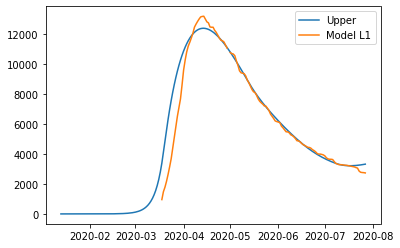

{'home': 0.9999873800610506, 'leisure': 0.8099008280457348, 'other': 0.8, 'school': 0.8825078384423656, 'transport': 0.839550829321608, 'work': 0.8}
{'home': 0.9999873800610506, 'leisure': 0.10401696892149057, 'other': 0.0779828125320302, 'school': 0, 'transport': 0.11237031305359471, 'work': 0.42397890867018806}
{'home': 0.9999873800610506, 'leisure': 0.10401696892149057, 'other': 0.0779828125320302, 'school': 0, 'transport': 0.11237031305359471, 'work': 0.42397890867018806}
{'home': 0.9999873800610506, 'leisure': 0.12416819761517618, 'other': 0.18588843673296096, 'school': 0.29122758668598064, 'transport': 0.1958586528114461, 'work': 0.7624423002996222}
{'home': 0.9999873800610506, 'leisure': 0.23920435048485422, 'other': 0.2561655671275203, 'school': 0.591280251756385, 'transport': 0.2589194447827065, 'work': 0.7624423002996222}
{'home': 0.9999873800610506, 'leisure': 0.3958523430179771, 'other': 0.3655008674432858, 'school': 0.591280251756385, 'transport': 0.4276108185915194, 'work

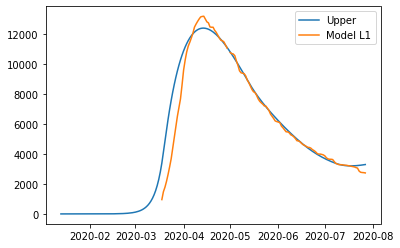

{'home': 0.9999788740120573, 'leisure': 0.8066647990920289, 'other': 0.8, 'school': 0.8814538476135191, 'transport': 0.8376439529825139, 'work': 0.8}
{'home': 0.9999788740120573, 'leisure': 0.10366650387689154, 'other': 0.07835794626027816, 'school': 0, 'transport': 0.11223488941743909, 'work': 0.4264059875635874}
{'home': 0.9999788740120573, 'leisure': 0.10366650387689154, 'other': 0.07835794626027816, 'school': 0, 'transport': 0.11223488941743909, 'work': 0.4264059875635874}
{'home': 0.9999788740120573, 'leisure': 0.12370478957910151, 'other': 0.18672574312236032, 'school': 0.2908797697124613, 'transport': 0.19562930288601052, 'work': 0.768246534334472}
{'home': 0.9999788740120573, 'leisure': 0.2383355277372063, 'other': 0.2569197033476258, 'school': 0.5905740779010579, 'transport': 0.25858811641686985, 'work': 0.7682466630404631}
{'home': 0.9999788740120573, 'leisure': 0.3943073455291147, 'other': 0.36560074272616877, 'school': 0.5905740779010579, 'transport': 0.4270215322830591, 'w

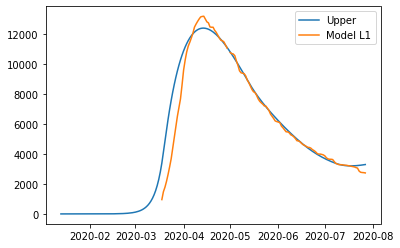

{'home': 0.9999788740120573, 'leisure': 0.8066647990920289, 'other': 0.8, 'school': 0.8814538476135191, 'transport': 0.8376439529825139, 'work': 0.8}
{'home': 0.9999788740120573, 'leisure': 0.10366650387689154, 'other': 0.07835794626027816, 'school': 0, 'transport': 0.11223488941743909, 'work': 0.4264059875635874}
{'home': 0.9999788740120573, 'leisure': 0.10366650387689154, 'other': 0.07835794626027816, 'school': 0, 'transport': 0.11223488941743909, 'work': 0.4264059875635874}
{'home': 0.9999788740120573, 'leisure': 0.12370478957910151, 'other': 0.18672574312236032, 'school': 0.2908797697124613, 'transport': 0.19562930288601052, 'work': 0.768246534334472}
{'home': 0.9999788740120573, 'leisure': 0.2383355277372063, 'other': 0.2569197033476258, 'school': 0.5905740779010579, 'transport': 0.25858811641686985, 'work': 0.7682466630404631}
{'home': 0.9999788740120573, 'leisure': 0.3943073455291147, 'other': 0.36560074272616877, 'school': 0.5905740779010579, 'transport': 0.4270215322830591, 'w

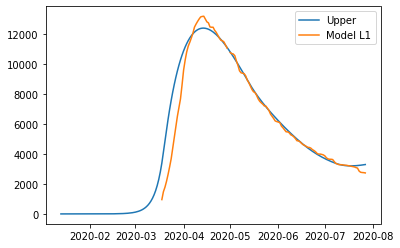

{'home': 0.9999788740120573, 'leisure': 0.8066647990920289, 'other': 0.8, 'school': 0.8814538476135191, 'transport': 0.8376439529825139, 'work': 0.8}
{'home': 0.9999788740120573, 'leisure': 0.10366650387689154, 'other': 0.07835794626027816, 'school': 0, 'transport': 0.11223488941743909, 'work': 0.4264059875635874}
{'home': 0.9999788740120573, 'leisure': 0.10366650387689154, 'other': 0.07835794626027816, 'school': 0, 'transport': 0.11223488941743909, 'work': 0.4264059875635874}
{'home': 0.9999788740120573, 'leisure': 0.12370478957910151, 'other': 0.18672574312236032, 'school': 0.2908797697124613, 'transport': 0.19562930288601052, 'work': 0.768246534334472}
{'home': 0.9999788740120573, 'leisure': 0.2383355277372063, 'other': 0.2569197033476258, 'school': 0.5905740779010579, 'transport': 0.25858811641686985, 'work': 0.7682466630404631}
{'home': 0.9999788740120573, 'leisure': 0.3943073455291147, 'other': 0.36560074272616877, 'school': 0.5905740779010579, 'transport': 0.4270215322830591, 'w

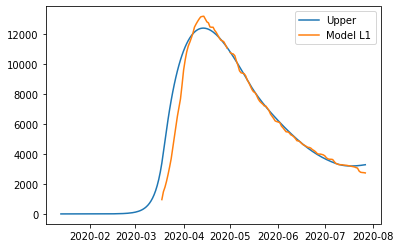

{'home': 0.9999817568972461, 'leisure': 0.8058435403294814, 'other': 0.8, 'school': 0.8811836777893249, 'transport': 0.8371562508458331, 'work': 0.8}
{'home': 0.9999817568972461, 'leisure': 0.10357648154418415, 'other': 0.07845690652245826, 'school': 0, 'transport': 0.112199622504663, 'work': 0.4267143035460683}
{'home': 0.9999817568972461, 'leisure': 0.10357648154418415, 'other': 0.07845690652245826, 'school': 0, 'transport': 0.112199622504663, 'work': 0.4267143035460683}
{'home': 0.9999817568972461, 'leisure': 0.12358567345785255, 'other': 0.18694634630087692, 'school': 0.29079061367047726, 'transport': 0.19556963258719975, 'work': 0.7692459932674324}
{'home': 0.9999817568972461, 'leisure': 0.23811218321287023, 'other': 0.2571176586413219, 'school': 0.5903930641188477, 'transport': 0.25850179981168087, 'work': 0.7692472482792279}
{'home': 0.9999817568972461, 'leisure': 0.3939090480363149, 'other': 0.3656231917566048, 'school': 0.5903930641188477, 'transport': 0.42686776575793095, 'wo

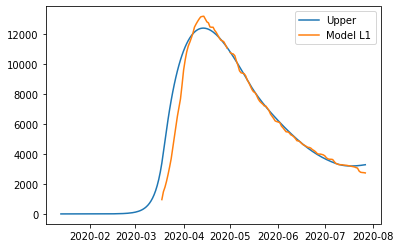

{'home': 0.9999817568972461, 'leisure': 0.8058435403294814, 'other': 0.8, 'school': 0.8811836777893249, 'transport': 0.8371562508458331, 'work': 0.8}
{'home': 0.9999817568972461, 'leisure': 0.10357648154418415, 'other': 0.07845690652245826, 'school': 0, 'transport': 0.112199622504663, 'work': 0.4267143035460683}
{'home': 0.9999817568972461, 'leisure': 0.10357648154418415, 'other': 0.07845690652245826, 'school': 0, 'transport': 0.112199622504663, 'work': 0.4267143035460683}
{'home': 0.9999817568972461, 'leisure': 0.12358567345785255, 'other': 0.18694634630087692, 'school': 0.29079061367047726, 'transport': 0.19556963258719975, 'work': 0.7692459932674324}
{'home': 0.9999817568972461, 'leisure': 0.23811218321287023, 'other': 0.2571176586413219, 'school': 0.5903930641188477, 'transport': 0.25850179981168087, 'work': 0.7692472482792279}
{'home': 0.9999817568972461, 'leisure': 0.3939090480363149, 'other': 0.3656231917566048, 'school': 0.5903930641188477, 'transport': 0.42686776575793095, 'wo

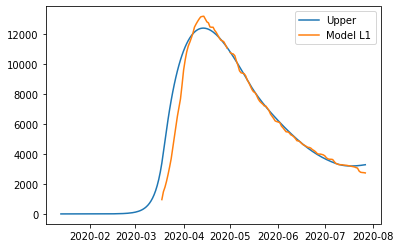

{'home': 0.9999817568972461, 'leisure': 0.8058435403294814, 'other': 0.8, 'school': 0.8811836777893249, 'transport': 0.8371562508458331, 'work': 0.8}
{'home': 0.9999817568972461, 'leisure': 0.10357648154418415, 'other': 0.07845690652245826, 'school': 0, 'transport': 0.112199622504663, 'work': 0.4267143035460683}
{'home': 0.9999817568972461, 'leisure': 0.10357648154418415, 'other': 0.07845690652245826, 'school': 0, 'transport': 0.112199622504663, 'work': 0.4267143035460683}
{'home': 0.9999817568972461, 'leisure': 0.12358567345785255, 'other': 0.18694634630087692, 'school': 0.29079061367047726, 'transport': 0.19556963258719975, 'work': 0.7692459932674324}
{'home': 0.9999817568972461, 'leisure': 0.23811218321287023, 'other': 0.2571176586413219, 'school': 0.5903930641188477, 'transport': 0.25850179981168087, 'work': 0.7692472482792279}
{'home': 0.9999817568972461, 'leisure': 0.3939090480363149, 'other': 0.3656231917566048, 'school': 0.5903930641188477, 'transport': 0.42686776575793095, 'wo

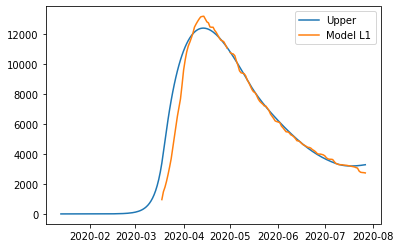

{'home': 0.9999817568972461, 'leisure': 0.8058435403294814, 'other': 0.8, 'school': 0.8811836777893249, 'transport': 0.8371562508458331, 'work': 0.8}
{'home': 0.9999817568972461, 'leisure': 0.10357648154418415, 'other': 0.07845690652245826, 'school': 0, 'transport': 0.112199622504663, 'work': 0.4267143035460683}
{'home': 0.9999817568972461, 'leisure': 0.10357648154418415, 'other': 0.07845690652245826, 'school': 0, 'transport': 0.112199622504663, 'work': 0.4267143035460683}
{'home': 0.9999817568972461, 'leisure': 0.12358567345785255, 'other': 0.18694634630087692, 'school': 0.29079061367047726, 'transport': 0.19556963258719975, 'work': 0.7692459932674324}
{'home': 0.9999817568972461, 'leisure': 0.23811218321287023, 'other': 0.2571176586413219, 'school': 0.5903930641188477, 'transport': 0.25850179981168087, 'work': 0.7692472482792279}
{'home': 0.9999817568972461, 'leisure': 0.3939090480363149, 'other': 0.3656231917566048, 'school': 0.5903930641188477, 'transport': 0.42686776575793095, 'wo

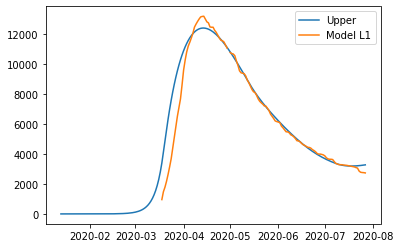

{'home': 0.999975603071812, 'leisure': 0.8044919108061935, 'other': 0.8, 'school': 0.8807436515139627, 'transport': 0.8363623577398416, 'work': 0.8}
{'home': 0.999975603071812, 'leisure': 0.1034299185529968, 'other': 0.07861706994884247, 'school': 0, 'transport': 0.11214346855558514, 'work': 0.4278202242942043}
{'home': 0.999975603071812, 'leisure': 0.1034299185529968, 'other': 0.07861706994884247, 'school': 0, 'transport': 0.11214346855558514, 'work': 0.4278202242942043}
{'home': 0.999975603071812, 'leisure': 0.12339209632797714, 'other': 0.18730358202490696, 'school': 0.2906454049996077, 'transport': 0.1954746243355469, 'work': 0.7718197476330104}
{'home': 0.999975603071812, 'leisure': 0.23774903315569548, 'other': 0.25744009689968644, 'school': 0.590098246514355, 'transport': 0.2583643258822673, 'work': 0.7718212474499162}
{'home': 0.999975603071812, 'leisure': 0.3932623107317878, 'other': 0.3656670810131104, 'school': 0.590098246514355, 'transport': 0.42662282320276834, 'work': 0.7

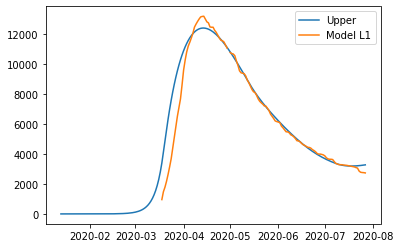

{'home': 0.999975603071812, 'leisure': 0.8044919108061935, 'other': 0.8, 'school': 0.8807436515139627, 'transport': 0.8363623577398416, 'work': 0.8}
{'home': 0.999975603071812, 'leisure': 0.1034299185529968, 'other': 0.07861706994884247, 'school': 0, 'transport': 0.11214346855558514, 'work': 0.4278202242942043}
{'home': 0.999975603071812, 'leisure': 0.1034299185529968, 'other': 0.07861706994884247, 'school': 0, 'transport': 0.11214346855558514, 'work': 0.4278202242942043}
{'home': 0.999975603071812, 'leisure': 0.12339209632797714, 'other': 0.18730358202490696, 'school': 0.2906454049996077, 'transport': 0.1954746243355469, 'work': 0.7718197476330104}
{'home': 0.999975603071812, 'leisure': 0.23774903315569548, 'other': 0.25744009689968644, 'school': 0.590098246514355, 'transport': 0.2583643258822673, 'work': 0.7718212474499162}
{'home': 0.999975603071812, 'leisure': 0.3932623107317878, 'other': 0.3656670810131104, 'school': 0.590098246514355, 'transport': 0.42662282320276834, 'work': 0.7

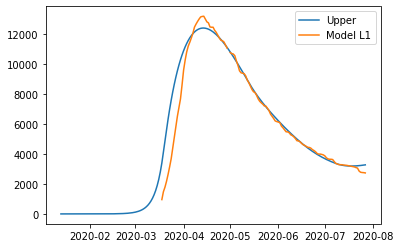

{'home': 0.999975603071812, 'leisure': 0.8044919108061935, 'other': 0.8, 'school': 0.8807436515139627, 'transport': 0.8363623577398416, 'work': 0.8}
{'home': 0.999975603071812, 'leisure': 0.1034299185529968, 'other': 0.07861706994884247, 'school': 0, 'transport': 0.11214346855558514, 'work': 0.4278202242942043}
{'home': 0.999975603071812, 'leisure': 0.1034299185529968, 'other': 0.07861706994884247, 'school': 0, 'transport': 0.11214346855558514, 'work': 0.4278202242942043}
{'home': 0.999975603071812, 'leisure': 0.12339209632797714, 'other': 0.18730358202490696, 'school': 0.2906454049996077, 'transport': 0.1954746243355469, 'work': 0.7718197476330104}
{'home': 0.999975603071812, 'leisure': 0.23774903315569548, 'other': 0.25744009689968644, 'school': 0.590098246514355, 'transport': 0.2583643258822673, 'work': 0.7718212474499162}
{'home': 0.999975603071812, 'leisure': 0.3932623107317878, 'other': 0.3656670810131104, 'school': 0.590098246514355, 'transport': 0.42662282320276834, 'work': 0.7

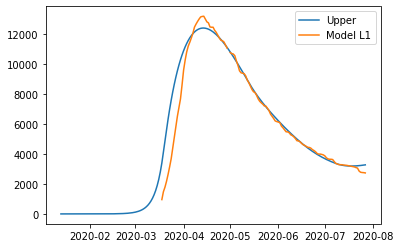

{'home': 0.999975603071812, 'leisure': 0.8044919108061935, 'other': 0.8, 'school': 0.8807436515139627, 'transport': 0.8363623577398416, 'work': 0.8}
{'home': 0.999975603071812, 'leisure': 0.1034299185529968, 'other': 0.07861706994884247, 'school': 0, 'transport': 0.11214346855558514, 'work': 0.4278202242942043}
{'home': 0.999975603071812, 'leisure': 0.1034299185529968, 'other': 0.07861706994884247, 'school': 0, 'transport': 0.11214346855558514, 'work': 0.4278202242942043}
{'home': 0.999975603071812, 'leisure': 0.12339209632797714, 'other': 0.18730358202490696, 'school': 0.2906454049996077, 'transport': 0.1954746243355469, 'work': 0.7718197476330104}
{'home': 0.999975603071812, 'leisure': 0.23774903315569548, 'other': 0.25744009689968644, 'school': 0.590098246514355, 'transport': 0.2583643258822673, 'work': 0.7718212474499162}
{'home': 0.999975603071812, 'leisure': 0.3932623107317878, 'other': 0.3656670810131104, 'school': 0.590098246514355, 'transport': 0.42662282320276834, 'work': 0.7

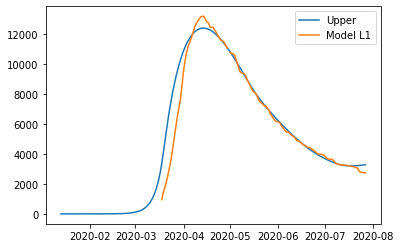

{'home': 0.9999140252100098, 'leisure': 0.8049796385708128, 'other': 0.8, 'school': 0.8809620348580222, 'transport': 0.8366592083643795, 'work': 0.8}
{'home': 0.9999140252100098, 'leisure': 0.1034885664358312, 'other': 0.07857551147803177, 'school': 0, 'transport': 0.1121710983844598, 'work': 0.4278645030095991}
{'home': 0.9999140252100098, 'leisure': 0.1034885664358312, 'other': 0.07857551147803177, 'school': 0, 'transport': 0.1121710983844598, 'work': 0.4278645030095991}
{'home': 0.9999140252100098, 'leisure': 0.12346972596180093, 'other': 0.1872097610491589, 'school': 0.2907174715031473, 'transport': 0.19552206381268158, 'work': 0.7715996317788374}
{'home': 0.9999140252100098, 'leisure': 0.23789395980315042, 'other': 0.25736509891788384, 'school': 0.5902445633548749, 'transport': 0.258430817951728, 'work': 0.7716028557700887}
{'home': 0.9999140252100098, 'leisure': 0.39351325249890695, 'other': 0.36568289471326765, 'school': 0.5902445633548749, 'transport': 0.4267375865642902, 'work

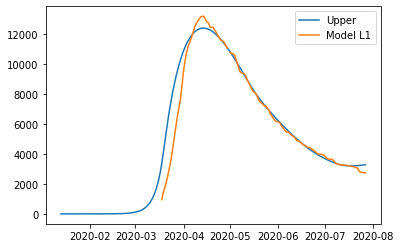

{'home': 0.9999140252100098, 'leisure': 0.8049796385708128, 'other': 0.8, 'school': 0.8809620348580222, 'transport': 0.8366592083643795, 'work': 0.8}
{'home': 0.9999140252100098, 'leisure': 0.1034885664358312, 'other': 0.07857551147803177, 'school': 0, 'transport': 0.1121710983844598, 'work': 0.4278645030095991}
{'home': 0.9999140252100098, 'leisure': 0.1034885664358312, 'other': 0.07857551147803177, 'school': 0, 'transport': 0.1121710983844598, 'work': 0.4278645030095991}
{'home': 0.9999140252100098, 'leisure': 0.12346972596180093, 'other': 0.1872097610491589, 'school': 0.2907174715031473, 'transport': 0.19552206381268158, 'work': 0.7715996317788374}
{'home': 0.9999140252100098, 'leisure': 0.23789395980315042, 'other': 0.25736509891788384, 'school': 0.5902445633548749, 'transport': 0.258430817951728, 'work': 0.7716028557700887}
{'home': 0.9999140252100098, 'leisure': 0.39351325249890695, 'other': 0.36568289471326765, 'school': 0.5902445633548749, 'transport': 0.4267375865642902, 'work

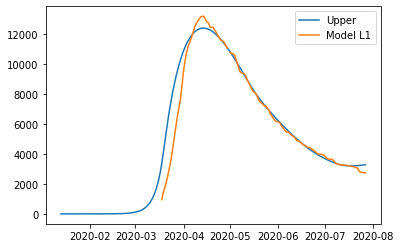

{'home': 0.9999140252100098, 'leisure': 0.8049796385708128, 'other': 0.8, 'school': 0.8809620348580222, 'transport': 0.8366592083643795, 'work': 0.8}
{'home': 0.9999140252100098, 'leisure': 0.1034885664358312, 'other': 0.07857551147803177, 'school': 0, 'transport': 0.1121710983844598, 'work': 0.4278645030095991}
{'home': 0.9999140252100098, 'leisure': 0.1034885664358312, 'other': 0.07857551147803177, 'school': 0, 'transport': 0.1121710983844598, 'work': 0.4278645030095991}
{'home': 0.9999140252100098, 'leisure': 0.12346972596180093, 'other': 0.1872097610491589, 'school': 0.2907174715031473, 'transport': 0.19552206381268158, 'work': 0.7715996317788374}
{'home': 0.9999140252100098, 'leisure': 0.23789395980315042, 'other': 0.25736509891788384, 'school': 0.5902445633548749, 'transport': 0.258430817951728, 'work': 0.7716028557700887}
{'home': 0.9999140252100098, 'leisure': 0.39351325249890695, 'other': 0.36568289471326765, 'school': 0.5902445633548749, 'transport': 0.4267375865642902, 'work

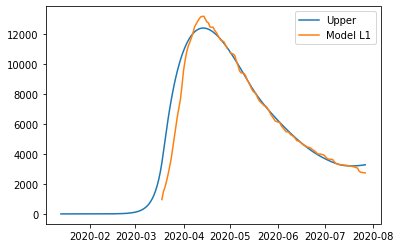

{'home': 0.999909992383627, 'leisure': 0.8048570764205167, 'other': 0.8, 'school': 0.8809135561923581, 'transport': 0.8365668492216076, 'work': 0.8}
{'home': 0.999909992383627, 'leisure': 0.10347615497424356, 'other': 0.07859505263064605, 'school': 0, 'transport': 0.11216480713634268, 'work': 0.4278887910096876}
{'home': 0.999909992383627, 'leisure': 0.10347615497424356, 'other': 0.07859505263064605, 'school': 0, 'transport': 0.11216480713634268, 'work': 0.4278887910096876}
{'home': 0.999909992383627, 'leisure': 0.12345275796857227, 'other': 0.18725328289917884, 'school': 0.2907014735434782, 'transport': 0.19551145072820236, 'work': 0.7717429883193991}
{'home': 0.999909992383627, 'leisure': 0.23786237210547426, 'other': 0.2574047397011689, 'school': 0.5902120826488799, 'transport': 0.2584153661269227, 'work': 0.7717463609078337}
{'home': 0.999909992383627, 'leisure': 0.3934553315661377, 'other': 0.3656891474230536, 'school': 0.5902120826488799, 'transport': 0.42670988950132843, 'work':

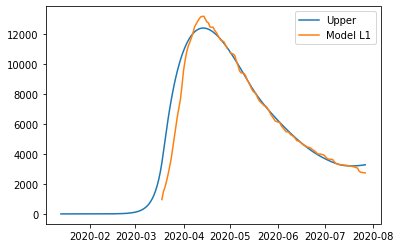

{'home': 0.999909992383627, 'leisure': 0.8048570764205167, 'other': 0.8, 'school': 0.8809135561923581, 'transport': 0.8365668492216076, 'work': 0.8}
{'home': 0.999909992383627, 'leisure': 0.10347615497424356, 'other': 0.07859505263064605, 'school': 0, 'transport': 0.11216480713634268, 'work': 0.4278887910096876}
{'home': 0.999909992383627, 'leisure': 0.10347615497424356, 'other': 0.07859505263064605, 'school': 0, 'transport': 0.11216480713634268, 'work': 0.4278887910096876}
{'home': 0.999909992383627, 'leisure': 0.12345275796857227, 'other': 0.18725328289917884, 'school': 0.2907014735434782, 'transport': 0.19551145072820236, 'work': 0.7717429883193991}
{'home': 0.999909992383627, 'leisure': 0.23786237210547426, 'other': 0.2574047397011689, 'school': 0.5902120826488799, 'transport': 0.2584153661269227, 'work': 0.7717463609078337}
{'home': 0.999909992383627, 'leisure': 0.3934553315661377, 'other': 0.3656891474230536, 'school': 0.5902120826488799, 'transport': 0.42670988950132843, 'work':

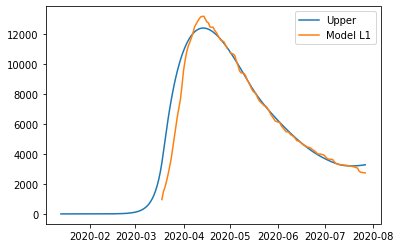

{'home': 0.999909992383627, 'leisure': 0.8048570764205167, 'other': 0.8, 'school': 0.8809135561923581, 'transport': 0.8365668492216076, 'work': 0.8}
{'home': 0.999909992383627, 'leisure': 0.10347615497424356, 'other': 0.07859505263064605, 'school': 0, 'transport': 0.11216480713634268, 'work': 0.4278887910096876}
{'home': 0.999909992383627, 'leisure': 0.10347615497424356, 'other': 0.07859505263064605, 'school': 0, 'transport': 0.11216480713634268, 'work': 0.4278887910096876}
{'home': 0.999909992383627, 'leisure': 0.12345275796857227, 'other': 0.18725328289917884, 'school': 0.2907014735434782, 'transport': 0.19551145072820236, 'work': 0.7717429883193991}
{'home': 0.999909992383627, 'leisure': 0.23786237210547426, 'other': 0.2574047397011689, 'school': 0.5902120826488799, 'transport': 0.2584153661269227, 'work': 0.7717463609078337}
{'home': 0.999909992383627, 'leisure': 0.3934553315661377, 'other': 0.3656891474230536, 'school': 0.5902120826488799, 'transport': 0.42670988950132843, 'work':

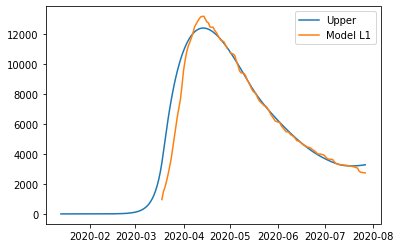

{'home': 0.999909992383627, 'leisure': 0.8048570764205167, 'other': 0.8, 'school': 0.8809135561923581, 'transport': 0.8365668492216076, 'work': 0.8}
{'home': 0.999909992383627, 'leisure': 0.10347615497424356, 'other': 0.07859505263064605, 'school': 0, 'transport': 0.11216480713634268, 'work': 0.4278887910096876}
{'home': 0.999909992383627, 'leisure': 0.10347615497424356, 'other': 0.07859505263064605, 'school': 0, 'transport': 0.11216480713634268, 'work': 0.4278887910096876}
{'home': 0.999909992383627, 'leisure': 0.12345275796857227, 'other': 0.18725328289917884, 'school': 0.2907014735434782, 'transport': 0.19551145072820236, 'work': 0.7717429883193991}
{'home': 0.999909992383627, 'leisure': 0.23786237210547426, 'other': 0.2574047397011689, 'school': 0.5902120826488799, 'transport': 0.2584153661269227, 'work': 0.7717463609078337}
{'home': 0.999909992383627, 'leisure': 0.3934553315661377, 'other': 0.3656891474230536, 'school': 0.5902120826488799, 'transport': 0.42670988950132843, 'work':

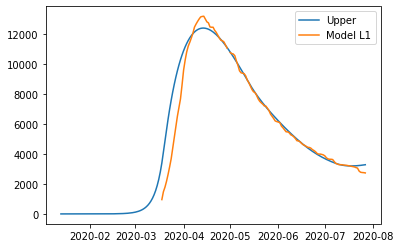

{'home': 0.999912660317945, 'leisure': 0.8049381579588265, 'other': 0.8, 'school': 0.8809456274702996, 'transport': 0.8366279498253, 'work': 0.8}
{'home': 0.999912660317945, 'leisure': 0.10348436595151699, 'other': 0.07858212503363686, 'school': 0, 'transport': 0.1121689693458633, 'work': 0.4278727231358612}
{'home': 0.999912660317945, 'leisure': 0.10348436595151699, 'other': 0.07858212503363686, 'school': 0, 'transport': 0.1121689693458633, 'work': 0.4278727231358612}
{'home': 0.999912660317945, 'leisure': 0.12346398328567319, 'other': 0.1872244906907939, 'school': 0.29071205706519887, 'transport': 0.1955184722330634, 'work': 0.7716481499301725}
{'home': 0.999912660317945, 'leisure': 0.2378832692533944, 'other': 0.25737851504177683, 'school': 0.5902335704051007, 'transport': 0.2584255887933597, 'work': 0.7716514242132388}
{'home': 0.999912660317945, 'leisure': 0.39349364948922816, 'other': 0.36568501089569905, 'school': 0.5902335704051007, 'transport': 0.42672821327422866, 'work': 0.7

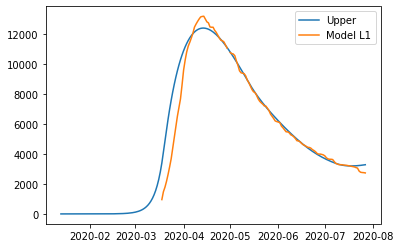

{'home': 0.999912660317945, 'leisure': 0.8049381579588265, 'other': 0.8, 'school': 0.8809456274702996, 'transport': 0.8366279498253, 'work': 0.8}
{'home': 0.999912660317945, 'leisure': 0.10348436595151699, 'other': 0.07858212503363686, 'school': 0, 'transport': 0.1121689693458633, 'work': 0.4278727231358612}
{'home': 0.999912660317945, 'leisure': 0.10348436595151699, 'other': 0.07858212503363686, 'school': 0, 'transport': 0.1121689693458633, 'work': 0.4278727231358612}
{'home': 0.999912660317945, 'leisure': 0.12346398328567319, 'other': 0.1872244906907939, 'school': 0.29071205706519887, 'transport': 0.1955184722330634, 'work': 0.7716481499301725}
{'home': 0.999912660317945, 'leisure': 0.2378832692533944, 'other': 0.25737851504177683, 'school': 0.5902335704051007, 'transport': 0.2584255887933597, 'work': 0.7716514242132388}
{'home': 0.999912660317945, 'leisure': 0.39349364948922816, 'other': 0.36568501089569905, 'school': 0.5902335704051007, 'transport': 0.42672821327422866, 'work': 0.7

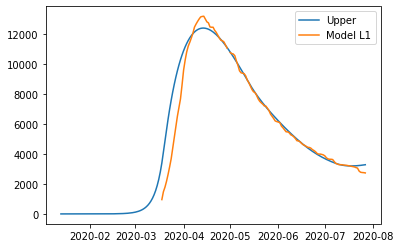

{'home': 0.999912660317945, 'leisure': 0.8049381579588265, 'other': 0.8, 'school': 0.8809456274702996, 'transport': 0.8366279498253, 'work': 0.8}
{'home': 0.999912660317945, 'leisure': 0.10348436595151699, 'other': 0.07858212503363686, 'school': 0, 'transport': 0.1121689693458633, 'work': 0.4278727231358612}
{'home': 0.999912660317945, 'leisure': 0.10348436595151699, 'other': 0.07858212503363686, 'school': 0, 'transport': 0.1121689693458633, 'work': 0.4278727231358612}
{'home': 0.999912660317945, 'leisure': 0.12346398328567319, 'other': 0.1872244906907939, 'school': 0.29071205706519887, 'transport': 0.1955184722330634, 'work': 0.7716481499301725}
{'home': 0.999912660317945, 'leisure': 0.2378832692533944, 'other': 0.25737851504177683, 'school': 0.5902335704051007, 'transport': 0.2584255887933597, 'work': 0.7716514242132388}
{'home': 0.999912660317945, 'leisure': 0.39349364948922816, 'other': 0.36568501089569905, 'school': 0.5902335704051007, 'transport': 0.42672821327422866, 'work': 0.7

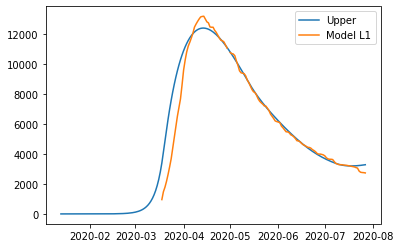

{'home': 0.999912660317945, 'leisure': 0.8049381579588265, 'other': 0.8, 'school': 0.8809456274702996, 'transport': 0.8366279498253, 'work': 0.8}
{'home': 0.999912660317945, 'leisure': 0.10348436595151699, 'other': 0.07858212503363686, 'school': 0, 'transport': 0.1121689693458633, 'work': 0.4278727231358612}
{'home': 0.999912660317945, 'leisure': 0.10348436595151699, 'other': 0.07858212503363686, 'school': 0, 'transport': 0.1121689693458633, 'work': 0.4278727231358612}
{'home': 0.999912660317945, 'leisure': 0.12346398328567319, 'other': 0.1872244906907939, 'school': 0.29071205706519887, 'transport': 0.1955184722330634, 'work': 0.7716481499301725}
{'home': 0.999912660317945, 'leisure': 0.2378832692533944, 'other': 0.25737851504177683, 'school': 0.5902335704051007, 'transport': 0.2584255887933597, 'work': 0.7716514242132388}
{'home': 0.999912660317945, 'leisure': 0.39349364948922816, 'other': 0.36568501089569905, 'school': 0.5902335704051007, 'transport': 0.42672821327422866, 'work': 0.7

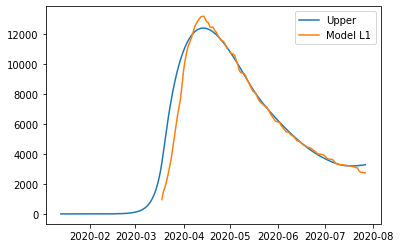

{'home': 0.9999112529087651, 'leisure': 0.8048953852036803, 'other': 0.8, 'school': 0.8809287089837093, 'transport': 0.8365957175660768, 'work': 0.8}
{'home': 0.9999112529087651, 'leisure': 0.10348003449195557, 'other': 0.0785889446694821, 'school': 0, 'transport': 0.11216677376562548, 'work': 0.4278811993650246}
{'home': 0.9999112529087651, 'leisure': 0.10348003449195557, 'other': 0.0785889446694821, 'school': 0, 'transport': 0.11216677376562548, 'work': 0.4278811993650246}
{'home': 0.9999112529087651, 'leisure': 0.12345806165211007, 'other': 0.18723967931217697, 'school': 0.2907064739646241, 'transport': 0.19551476837588241, 'work': 0.7716981796932421}
{'home': 0.9999112529087651, 'leisure': 0.23787224551015423, 'other': 0.2573923492158381, 'school': 0.5902222350190853, 'transport': 0.2584201962695941, 'work': 0.7717015058349947}
{'home': 0.9999112529087651, 'leisure': 0.39347343575912513, 'other': 0.36568719301896613, 'school': 0.5902222350190853, 'transport': 0.426718547297096, 'wo

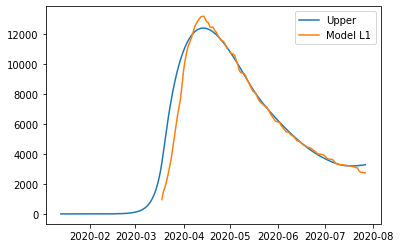

{'home': 0.9999112529087651, 'leisure': 0.8048953852036803, 'other': 0.8, 'school': 0.8809287089837093, 'transport': 0.8365957175660768, 'work': 0.8}
{'home': 0.9999112529087651, 'leisure': 0.10348003449195557, 'other': 0.0785889446694821, 'school': 0, 'transport': 0.11216677376562548, 'work': 0.4278811993650246}
{'home': 0.9999112529087651, 'leisure': 0.10348003449195557, 'other': 0.0785889446694821, 'school': 0, 'transport': 0.11216677376562548, 'work': 0.4278811993650246}
{'home': 0.9999112529087651, 'leisure': 0.12345806165211007, 'other': 0.18723967931217697, 'school': 0.2907064739646241, 'transport': 0.19551476837588241, 'work': 0.7716981796932421}
{'home': 0.9999112529087651, 'leisure': 0.23787224551015423, 'other': 0.2573923492158381, 'school': 0.5902222350190853, 'transport': 0.2584201962695941, 'work': 0.7717015058349947}
{'home': 0.9999112529087651, 'leisure': 0.39347343575912513, 'other': 0.36568719301896613, 'school': 0.5902222350190853, 'transport': 0.426718547297096, 'wo

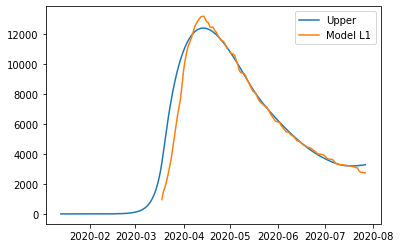

{'home': 0.9999112529087651, 'leisure': 0.8048953852036803, 'other': 0.8, 'school': 0.8809287089837093, 'transport': 0.8365957175660768, 'work': 0.8}
{'home': 0.9999112529087651, 'leisure': 0.10348003449195557, 'other': 0.0785889446694821, 'school': 0, 'transport': 0.11216677376562548, 'work': 0.4278811993650246}
{'home': 0.9999112529087651, 'leisure': 0.10348003449195557, 'other': 0.0785889446694821, 'school': 0, 'transport': 0.11216677376562548, 'work': 0.4278811993650246}
{'home': 0.9999112529087651, 'leisure': 0.12345806165211007, 'other': 0.18723967931217697, 'school': 0.2907064739646241, 'transport': 0.19551476837588241, 'work': 0.7716981796932421}
{'home': 0.9999112529087651, 'leisure': 0.23787224551015423, 'other': 0.2573923492158381, 'school': 0.5902222350190853, 'transport': 0.2584201962695941, 'work': 0.7717015058349947}
{'home': 0.9999112529087651, 'leisure': 0.39347343575912513, 'other': 0.36568719301896613, 'school': 0.5902222350190853, 'transport': 0.426718547297096, 'wo

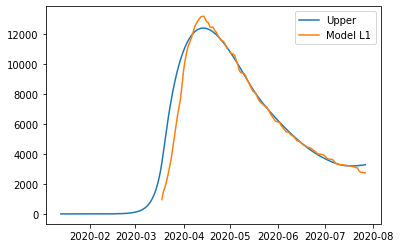

{'home': 0.9999112529087651, 'leisure': 0.8048953852036803, 'other': 0.8, 'school': 0.8809287089837093, 'transport': 0.8365957175660768, 'work': 0.8}
{'home': 0.9999112529087651, 'leisure': 0.10348003449195557, 'other': 0.0785889446694821, 'school': 0, 'transport': 0.11216677376562548, 'work': 0.4278811993650246}
{'home': 0.9999112529087651, 'leisure': 0.10348003449195557, 'other': 0.0785889446694821, 'school': 0, 'transport': 0.11216677376562548, 'work': 0.4278811993650246}
{'home': 0.9999112529087651, 'leisure': 0.12345806165211007, 'other': 0.18723967931217697, 'school': 0.2907064739646241, 'transport': 0.19551476837588241, 'work': 0.7716981796932421}
{'home': 0.9999112529087651, 'leisure': 0.23787224551015423, 'other': 0.2573923492158381, 'school': 0.5902222350190853, 'transport': 0.2584201962695941, 'work': 0.7717015058349947}
{'home': 0.9999112529087651, 'leisure': 0.39347343575912513, 'other': 0.36568719301896613, 'school': 0.5902222350190853, 'transport': 0.426718547297096, 'wo

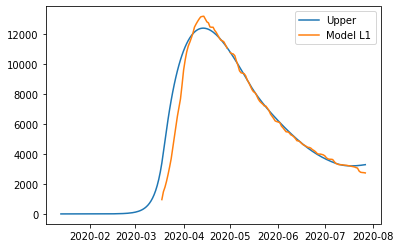

{'home': 0.99985651045557, 'leisure': 0.8050349458008934, 'other': 0.8, 'school': 0.8810300471273469, 'transport': 0.836664923821279, 'work': 0.8}
{'home': 0.99985651045557, 'leisure': 0.1034968703786623, 'other': 0.0785809077673302, 'school': 0, 'transport': 0.11217332664922737, 'work': 0.4280705535611391}
{'home': 0.99985651045557, 'leisure': 0.1034968703786623, 'other': 0.0785809077673302, 'school': 0, 'transport': 0.11217332664922737, 'work': 0.4280705535611391}
{'home': 0.99985651045557, 'leisure': 0.12347983849056061, 'other': 0.1872210909965226, 'school': 0.2907399155520245, 'transport': 0.1955260501245323, 'work': 0.7719711471025956}
{'home': 0.99985651045557, 'leisure': 0.23791317908194956, 'other': 0.25737839565384635, 'school': 0.5902901315753225, 'transport': 0.2584359048693677, 'work': 0.7719764700873433}
{'home': 0.99985651045557, 'leisure': 0.39354300002905385, 'other': 0.3656904563940095, 'school': 0.5902901315753225, 'transport': 0.42674542180494973, 'work': 0.77197647

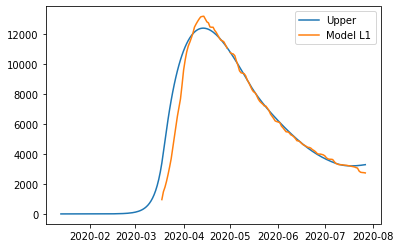

{'home': 0.99985651045557, 'leisure': 0.8050349458008934, 'other': 0.8, 'school': 0.8810300471273469, 'transport': 0.836664923821279, 'work': 0.8}
{'home': 0.99985651045557, 'leisure': 0.1034968703786623, 'other': 0.0785809077673302, 'school': 0, 'transport': 0.11217332664922737, 'work': 0.4280705535611391}
{'home': 0.99985651045557, 'leisure': 0.1034968703786623, 'other': 0.0785809077673302, 'school': 0, 'transport': 0.11217332664922737, 'work': 0.4280705535611391}
{'home': 0.99985651045557, 'leisure': 0.12347983849056061, 'other': 0.1872210909965226, 'school': 0.2907399155520245, 'transport': 0.1955260501245323, 'work': 0.7719711471025956}
{'home': 0.99985651045557, 'leisure': 0.23791317908194956, 'other': 0.25737839565384635, 'school': 0.5902901315753225, 'transport': 0.2584359048693677, 'work': 0.7719764700873433}
{'home': 0.99985651045557, 'leisure': 0.39354300002905385, 'other': 0.3656904563940095, 'school': 0.5902901315753225, 'transport': 0.42674542180494973, 'work': 0.77197647

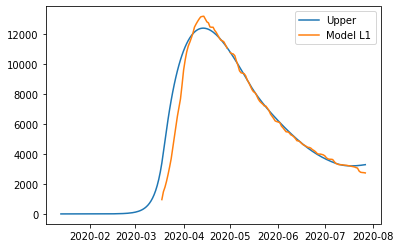

{'home': 0.99985652045557, 'leisure': 0.8050349458008934, 'other': 0.8, 'school': 0.8810300471273469, 'transport': 0.836664923821279, 'work': 0.8}
{'home': 0.99985652045557, 'leisure': 0.1034968703786623, 'other': 0.0785809077673302, 'school': 0, 'transport': 0.11217332664922737, 'work': 0.4280705535611391}
{'home': 0.99985652045557, 'leisure': 0.1034968703786623, 'other': 0.0785809077673302, 'school': 0, 'transport': 0.11217332664922737, 'work': 0.4280705535611391}
{'home': 0.99985652045557, 'leisure': 0.12347983849056061, 'other': 0.1872210909965226, 'school': 0.2907399155520245, 'transport': 0.1955260501245323, 'work': 0.7719711471025956}
{'home': 0.99985652045557, 'leisure': 0.23791317908194956, 'other': 0.25737839565384635, 'school': 0.5902901315753225, 'transport': 0.2584359048693677, 'work': 0.7719764700873433}
{'home': 0.99985652045557, 'leisure': 0.39354300002905385, 'other': 0.3656904563940095, 'school': 0.5902901315753225, 'transport': 0.42674542180494973, 'work': 0.77197647

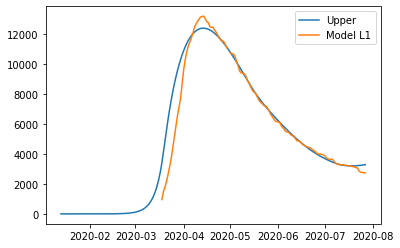

{'home': 0.9998620388683447, 'leisure': 0.8049363930533203, 'other': 0.8, 'school': 0.8810057090342559, 'transport': 0.8366033085483977, 'work': 0.8}
{'home': 0.9998620388683447, 'leisure': 0.10348406301452366, 'other': 0.0785837819342197, 'school': 0, 'transport': 0.11216618888959838, 'work': 0.42808443039223376}
{'home': 0.9998620388683447, 'leisure': 0.10348406301452366, 'other': 0.0785837819342197, 'school': 0, 'transport': 0.11216618888959838, 'work': 0.42808443039223376}
{'home': 0.9998620388683447, 'leisure': 0.12346287110738309, 'other': 0.18722791333967603, 'school': 0.29073188398130445, 'transport': 0.19551362125001875, 'work': 0.7720574246944776}
{'home': 0.9998620388683447, 'leisure': 0.23788171248089712, 'other': 0.2573809424916473, 'school': 0.5902738250529515, 'transport': 0.25841898817383546, 'work': 0.7720626724791094}
{'home': 0.9998620388683447, 'leisure': 0.3934906220395503, 'other': 0.365680487300062, 'school': 0.5902738250529515, 'transport': 0.42671709125093565, 

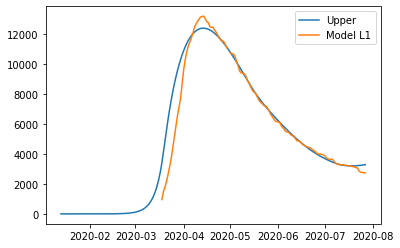

{'home': 0.9998620388683447, 'leisure': 0.8049363930533203, 'other': 0.8, 'school': 0.8810057090342559, 'transport': 0.8366033085483977, 'work': 0.8}
{'home': 0.9998620388683447, 'leisure': 0.10348406301452366, 'other': 0.0785837819342197, 'school': 0, 'transport': 0.11216618888959838, 'work': 0.42808443039223376}
{'home': 0.9998620388683447, 'leisure': 0.10348406301452366, 'other': 0.0785837819342197, 'school': 0, 'transport': 0.11216618888959838, 'work': 0.42808443039223376}
{'home': 0.9998620388683447, 'leisure': 0.12346287110738309, 'other': 0.18722791333967603, 'school': 0.29073188398130445, 'transport': 0.19551362125001875, 'work': 0.7720574246944776}
{'home': 0.9998620388683447, 'leisure': 0.23788171248089712, 'other': 0.2573809424916473, 'school': 0.5902738250529515, 'transport': 0.25841898817383546, 'work': 0.7720626724791094}
{'home': 0.9998620388683447, 'leisure': 0.3934906220395503, 'other': 0.365680487300062, 'school': 0.5902738250529515, 'transport': 0.42671709125093565, 

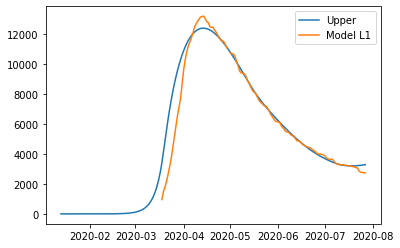

{'home': 0.9998620388683447, 'leisure': 0.8049363930533203, 'other': 0.8, 'school': 0.8810057090342559, 'transport': 0.8366033085483977, 'work': 0.8}
{'home': 0.9998620388683447, 'leisure': 0.10348406301452366, 'other': 0.0785837819342197, 'school': 0, 'transport': 0.11216618888959838, 'work': 0.42808443039223376}
{'home': 0.9998620388683447, 'leisure': 0.10348406301452366, 'other': 0.0785837819342197, 'school': 0, 'transport': 0.11216618888959838, 'work': 0.42808443039223376}
{'home': 0.9998620388683447, 'leisure': 0.12346287110738309, 'other': 0.18722791333967603, 'school': 0.29073188398130445, 'transport': 0.19551362125001875, 'work': 0.7720574246944776}
{'home': 0.9998620388683447, 'leisure': 0.23788171248089712, 'other': 0.2573809424916473, 'school': 0.5902738250529515, 'transport': 0.25841898817383546, 'work': 0.7720626724791094}
{'home': 0.9998620388683447, 'leisure': 0.3934906220395503, 'other': 0.365680487300062, 'school': 0.5902738250529515, 'transport': 0.42671709125093565, 

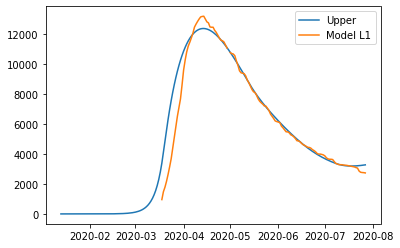

{'home': 0.9998357047193043, 'leisure': 0.8044793666908656, 'other': 0.8, 'school': 0.8809713789987448, 'transport': 0.8363032916312987, 'work': 0.8}
{'home': 0.9998357047193043, 'leisure': 0.10342283488559902, 'other': 0.07859035628371648, 'school': 0, 'transport': 0.11212925394759067, 'work': 0.42806074459304144}
{'home': 0.9998357047193043, 'leisure': 0.10342283488559902, 'other': 0.07859035628371648, 'school': 0, 'transport': 0.11212925394759067, 'work': 0.42806074459304144}
{'home': 0.9998357047193043, 'leisure': 0.12338134464226998, 'other': 0.18724445685931837, 'school': 0.2907205550695858, 'transport': 0.19544911649503965, 'work': 0.7723103381855819}
{'home': 0.9998357047193043, 'leisure': 0.23773107738759305, 'other': 0.25737621793068727, 'school': 0.5902508239291591, 'transport': 0.2583317250158861, 'work': 0.7723173560061711}
{'home': 0.9998357047193043, 'leisure': 0.39324222499330486, 'other': 0.3656205135160304, 'school': 0.5902508239291591, 'transport': 0.4265718336522041

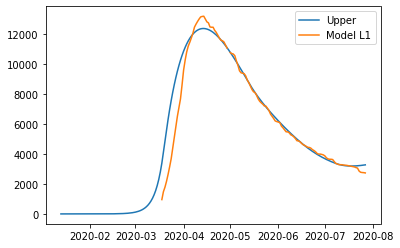

{'home': 0.9998357047193043, 'leisure': 0.8044793666908656, 'other': 0.8, 'school': 0.8809713789987448, 'transport': 0.8363032916312987, 'work': 0.8}
{'home': 0.9998357047193043, 'leisure': 0.10342283488559902, 'other': 0.07859035628371648, 'school': 0, 'transport': 0.11212925394759067, 'work': 0.42806074459304144}
{'home': 0.9998357047193043, 'leisure': 0.10342283488559902, 'other': 0.07859035628371648, 'school': 0, 'transport': 0.11212925394759067, 'work': 0.42806074459304144}
{'home': 0.9998357047193043, 'leisure': 0.12338134464226998, 'other': 0.18724445685931837, 'school': 0.2907205550695858, 'transport': 0.19544911649503965, 'work': 0.7723103381855819}
{'home': 0.9998357047193043, 'leisure': 0.23773107738759305, 'other': 0.25737621793068727, 'school': 0.5902508239291591, 'transport': 0.2583317250158861, 'work': 0.7723173560061711}
{'home': 0.9998357047193043, 'leisure': 0.39324222499330486, 'other': 0.3656205135160304, 'school': 0.5902508239291591, 'transport': 0.4265718336522041

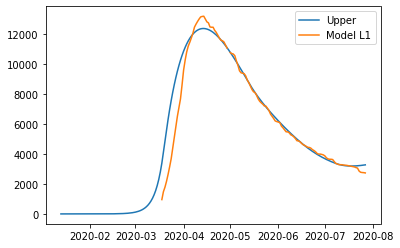

{'home': 0.9998357047193043, 'leisure': 0.8044793666908656, 'other': 0.8, 'school': 0.8809713789987448, 'transport': 0.8363032916312987, 'work': 0.8}
{'home': 0.9998357047193043, 'leisure': 0.10342283488559902, 'other': 0.07859035628371648, 'school': 0, 'transport': 0.11212925394759067, 'work': 0.42806074459304144}
{'home': 0.9998357047193043, 'leisure': 0.10342283488559902, 'other': 0.07859035628371648, 'school': 0, 'transport': 0.11212925394759067, 'work': 0.42806074459304144}
{'home': 0.9998357047193043, 'leisure': 0.12338134464226998, 'other': 0.18724445685931837, 'school': 0.2907205550695858, 'transport': 0.19544911649503965, 'work': 0.7723103381855819}
{'home': 0.9998357047193043, 'leisure': 0.23773107738759305, 'other': 0.25737621793068727, 'school': 0.5902508239291591, 'transport': 0.2583317250158861, 'work': 0.7723173560061711}
{'home': 0.9998357047193043, 'leisure': 0.39324222499330486, 'other': 0.3656205135160304, 'school': 0.5902508239291591, 'transport': 0.4265718336522041

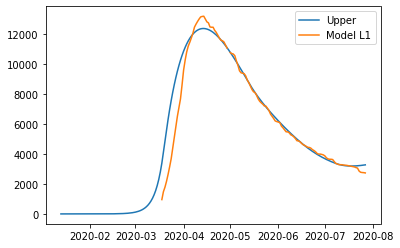

{'home': 0.9998357147193043, 'leisure': 0.8044793666908656, 'other': 0.8, 'school': 0.8809713789987448, 'transport': 0.8363032916312987, 'work': 0.8}
{'home': 0.9998357147193043, 'leisure': 0.10342283488559902, 'other': 0.07859035628371648, 'school': 0, 'transport': 0.11212925394759067, 'work': 0.42806074459304144}
{'home': 0.9998357147193043, 'leisure': 0.10342283488559902, 'other': 0.07859035628371648, 'school': 0, 'transport': 0.11212925394759067, 'work': 0.42806074459304144}
{'home': 0.9998357147193043, 'leisure': 0.12338134464226998, 'other': 0.18724445685931837, 'school': 0.2907205550695858, 'transport': 0.19544911649503965, 'work': 0.7723103381855819}
{'home': 0.9998357147193043, 'leisure': 0.23773107738759305, 'other': 0.25737621793068727, 'school': 0.5902508239291591, 'transport': 0.2583317250158861, 'work': 0.7723173560061711}
{'home': 0.9998357147193043, 'leisure': 0.39324222499330486, 'other': 0.3656205135160304, 'school': 0.5902508239291591, 'transport': 0.4265718336522041

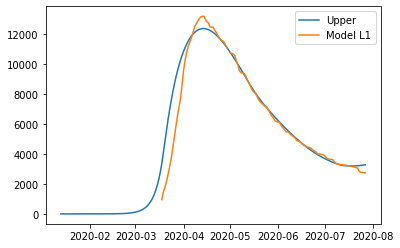

{'home': 0.9998352728184576, 'leisure': 0.8045215011224225, 'other': 0.8, 'school': 0.8809965215176412, 'transport': 0.8363381134577638, 'work': 0.8}
{'home': 0.9998352728184576, 'leisure': 0.10342607362313909, 'other': 0.07857802432322132, 'school': 0, 'transport': 0.11213035926273708, 'work': 0.428044206330364}
{'home': 0.9998352728184576, 'leisure': 0.10342607362313909, 'other': 0.07857802432322132, 'school': 0, 'transport': 0.11213035926273708, 'work': 0.428044206330364}
{'home': 0.9998352728184576, 'leisure': 0.12338594408742032, 'other': 0.18721718746877766, 'school': 0.2907288521008216, 'transport': 0.19545079676437968, 'work': 0.7722430900162962}
{'home': 0.9998352728184576, 'leisure': 0.23773973656083064, 'other': 0.2573499279044357, 'school': 0.5902676694168196, 'transport': 0.25833472978039157, 'work': 0.7722503246664107}
{'home': 0.9998352728184576, 'leisure': 0.3932604111394683, 'other': 0.3656122615245836, 'school': 0.5902676694168196, 'transport': 0.4265781581823058, 'wo

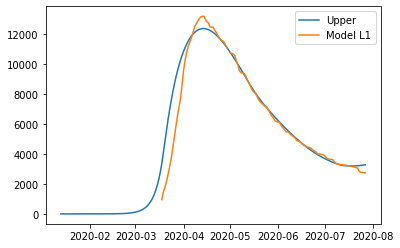

{'home': 0.9998352728184576, 'leisure': 0.8045215011224225, 'other': 0.8, 'school': 0.8809965215176412, 'transport': 0.8363381134577638, 'work': 0.8}
{'home': 0.9998352728184576, 'leisure': 0.10342607362313909, 'other': 0.07857802432322132, 'school': 0, 'transport': 0.11213035926273708, 'work': 0.428044206330364}
{'home': 0.9998352728184576, 'leisure': 0.10342607362313909, 'other': 0.07857802432322132, 'school': 0, 'transport': 0.11213035926273708, 'work': 0.428044206330364}
{'home': 0.9998352728184576, 'leisure': 0.12338594408742032, 'other': 0.18721718746877766, 'school': 0.2907288521008216, 'transport': 0.19545079676437968, 'work': 0.7722430900162962}
{'home': 0.9998352728184576, 'leisure': 0.23773973656083064, 'other': 0.2573499279044357, 'school': 0.5902676694168196, 'transport': 0.25833472978039157, 'work': 0.7722503246664107}
{'home': 0.9998352728184576, 'leisure': 0.3932604111394683, 'other': 0.3656122615245836, 'school': 0.5902676694168196, 'transport': 0.4265781581823058, 'wo

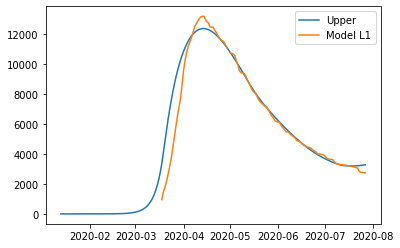

{'home': 0.9998352728184576, 'leisure': 0.8045215011224225, 'other': 0.8, 'school': 0.8809965215176412, 'transport': 0.8363381134577638, 'work': 0.8}
{'home': 0.9998352728184576, 'leisure': 0.10342607362313909, 'other': 0.07857802432322132, 'school': 0, 'transport': 0.11213035926273708, 'work': 0.428044206330364}
{'home': 0.9998352728184576, 'leisure': 0.10342607362313909, 'other': 0.07857802432322132, 'school': 0, 'transport': 0.11213035926273708, 'work': 0.428044206330364}
{'home': 0.9998352728184576, 'leisure': 0.12338594408742032, 'other': 0.18721718746877766, 'school': 0.2907288521008216, 'transport': 0.19545079676437968, 'work': 0.7722430900162962}
{'home': 0.9998352728184576, 'leisure': 0.23773973656083064, 'other': 0.2573499279044357, 'school': 0.5902676694168196, 'transport': 0.25833472978039157, 'work': 0.7722503246664107}
{'home': 0.9998352728184576, 'leisure': 0.3932604111394683, 'other': 0.3656122615245836, 'school': 0.5902676694168196, 'transport': 0.4265781581823058, 'wo

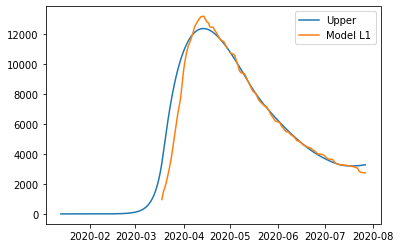

{'home': 0.9998346725629912, 'leisure': 0.8045541750035851, 'other': 0.8, 'school': 0.881006627077014, 'transport': 0.8363604568528822, 'work': 0.8}
{'home': 0.9998346725629912, 'leisure': 0.10342985020452974, 'other': 0.07857469513581523, 'school': 0, 'transport': 0.11213232813701225, 'work': 0.4280417936831654}
{'home': 0.9998346725629912, 'leisure': 0.10342985020452974, 'other': 0.07857469513581523, 'school': 0, 'transport': 0.11213232813701225, 'work': 0.4280417936831654}
{'home': 0.9998346725629912, 'leisure': 0.12339101699260019, 'other': 0.1872097199890162, 'school': 0.29073218693541464, 'transport': 0.1954541731658628, 'work': 0.7722160384660143}
{'home': 0.9998346725629912, 'leisure': 0.2377491687626678, 'other': 0.2573437005966056, 'school': 0.5902744401415995, 'transport': 0.258339478147446, 'work': 0.7722233079429454}
{'home': 0.9998346725629912, 'leisure': 0.3932769215613972, 'other': 0.36561295706288266, 'school': 0.5902744401415995, 'transport': 0.4265863868209033, 'work

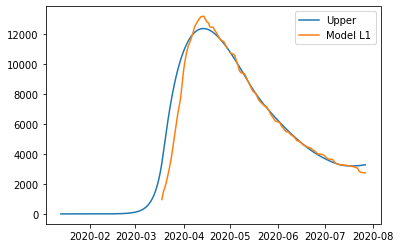

{'home': 0.9998346725629912, 'leisure': 0.8045541750035851, 'other': 0.8, 'school': 0.881006627077014, 'transport': 0.8363604568528822, 'work': 0.8}
{'home': 0.9998346725629912, 'leisure': 0.10342985020452974, 'other': 0.07857469513581523, 'school': 0, 'transport': 0.11213232813701225, 'work': 0.4280417936831654}
{'home': 0.9998346725629912, 'leisure': 0.10342985020452974, 'other': 0.07857469513581523, 'school': 0, 'transport': 0.11213232813701225, 'work': 0.4280417936831654}
{'home': 0.9998346725629912, 'leisure': 0.12339101699260019, 'other': 0.1872097199890162, 'school': 0.29073218693541464, 'transport': 0.1954541731658628, 'work': 0.7722160384660143}
{'home': 0.9998346725629912, 'leisure': 0.2377491687626678, 'other': 0.2573437005966056, 'school': 0.5902744401415995, 'transport': 0.258339478147446, 'work': 0.7722233079429454}
{'home': 0.9998346725629912, 'leisure': 0.3932769215613972, 'other': 0.36561295706288266, 'school': 0.5902744401415995, 'transport': 0.4265863868209033, 'work

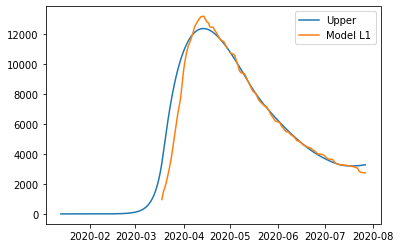

{'home': 0.9998346725629912, 'leisure': 0.8045541750035851, 'other': 0.8, 'school': 0.881006627077014, 'transport': 0.8363604568528822, 'work': 0.8}
{'home': 0.9998346725629912, 'leisure': 0.10342985020452974, 'other': 0.07857469513581523, 'school': 0, 'transport': 0.11213232813701225, 'work': 0.4280417936831654}
{'home': 0.9998346725629912, 'leisure': 0.10342985020452974, 'other': 0.07857469513581523, 'school': 0, 'transport': 0.11213232813701225, 'work': 0.4280417936831654}
{'home': 0.9998346725629912, 'leisure': 0.12339101699260019, 'other': 0.1872097199890162, 'school': 0.29073218693541464, 'transport': 0.1954541731658628, 'work': 0.7722160384660143}
{'home': 0.9998346725629912, 'leisure': 0.2377491687626678, 'other': 0.2573437005966056, 'school': 0.5902744401415995, 'transport': 0.258339478147446, 'work': 0.7722233079429454}
{'home': 0.9998346725629912, 'leisure': 0.3932769215613972, 'other': 0.36561295706288266, 'school': 0.5902744401415995, 'transport': 0.4265863868209033, 'work

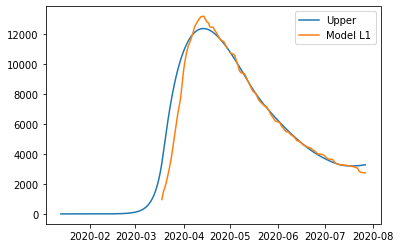

{'home': 0.9998346725629912, 'leisure': 0.8045541750035851, 'other': 0.8, 'school': 0.881006627077014, 'transport': 0.8363604568528822, 'work': 0.8}
{'home': 0.9998346725629912, 'leisure': 0.10342985020452974, 'other': 0.07857469513581523, 'school': 0, 'transport': 0.11213232813701225, 'work': 0.4280417936831654}
{'home': 0.9998346725629912, 'leisure': 0.10342985020452974, 'other': 0.07857469513581523, 'school': 0, 'transport': 0.11213232813701225, 'work': 0.4280417936831654}
{'home': 0.9998346725629912, 'leisure': 0.12339101699260019, 'other': 0.1872097199890162, 'school': 0.29073218693541464, 'transport': 0.1954541731658628, 'work': 0.7722160384660143}
{'home': 0.9998346725629912, 'leisure': 0.2377491687626678, 'other': 0.2573437005966056, 'school': 0.5902744401415995, 'transport': 0.258339478147446, 'work': 0.7722233079429454}
{'home': 0.9998346725629912, 'leisure': 0.3932769215613972, 'other': 0.36561295706288266, 'school': 0.5902744401415995, 'transport': 0.4265863868209033, 'work

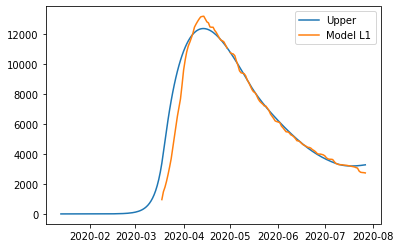

{'home': 0.9998345199484637, 'leisure': 0.8045446208574725, 'other': 0.8, 'school': 0.8810020115292814, 'transport': 0.8363522912169137, 'work': 0.8}
{'home': 0.9998345199484637, 'leisure': 0.10342892690520038, 'other': 0.07857644151293836, 'school': 0, 'transport': 0.11213178033152031, 'work': 0.4280434868311093}
{'home': 0.9998345199484637, 'leisure': 0.10342892690520038, 'other': 0.07857644151293836, 'school': 0, 'transport': 0.11213178033152031, 'work': 0.4280434868311093}
{'home': 0.9998345199484637, 'leisure': 0.12338972606578703, 'other': 0.18721361091957278, 'school': 0.2907306638046629, 'transport': 0.1954532499527614, 'work': 0.7722279032769768}
{'home': 0.9998345199484637, 'leisure': 0.23774677729026394, 'other': 0.2573472530077669, 'school': 0.5902713477246185, 'transport': 0.25833813136852907, 'work': 0.772235179767153}
{'home': 0.9998345199484637, 'leisure': 0.39327245967717483, 'other': 0.3656135568812836, 'school': 0.5902713477246185, 'transport': 0.426583968556027, 'wo

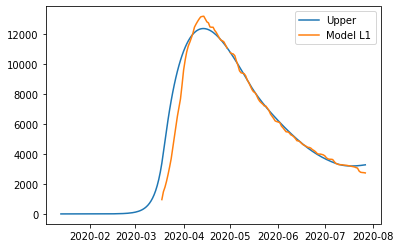

{'home': 0.9998345199484637, 'leisure': 0.8045446208574725, 'other': 0.8, 'school': 0.8810020115292814, 'transport': 0.8363522912169137, 'work': 0.8}
{'home': 0.9998345199484637, 'leisure': 0.10342892690520038, 'other': 0.07857644151293836, 'school': 0, 'transport': 0.11213178033152031, 'work': 0.4280434868311093}
{'home': 0.9998345199484637, 'leisure': 0.10342892690520038, 'other': 0.07857644151293836, 'school': 0, 'transport': 0.11213178033152031, 'work': 0.4280434868311093}
{'home': 0.9998345199484637, 'leisure': 0.12338972606578703, 'other': 0.18721361091957278, 'school': 0.2907306638046629, 'transport': 0.1954532499527614, 'work': 0.7722279032769768}
{'home': 0.9998345199484637, 'leisure': 0.23774677729026394, 'other': 0.2573472530077669, 'school': 0.5902713477246185, 'transport': 0.25833813136852907, 'work': 0.772235179767153}
{'home': 0.9998345199484637, 'leisure': 0.39327245967717483, 'other': 0.3656135568812836, 'school': 0.5902713477246185, 'transport': 0.426583968556027, 'wo

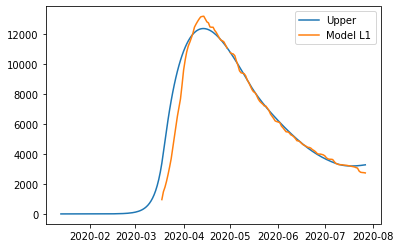

{'home': 0.9998345199484637, 'leisure': 0.8045446208574725, 'other': 0.8, 'school': 0.8810020115292814, 'transport': 0.8363522912169137, 'work': 0.8}
{'home': 0.9998345199484637, 'leisure': 0.10342892690520038, 'other': 0.07857644151293836, 'school': 0, 'transport': 0.11213178033152031, 'work': 0.4280434868311093}
{'home': 0.9998345199484637, 'leisure': 0.10342892690520038, 'other': 0.07857644151293836, 'school': 0, 'transport': 0.11213178033152031, 'work': 0.4280434868311093}
{'home': 0.9998345199484637, 'leisure': 0.12338972606578703, 'other': 0.18721361091957278, 'school': 0.2907306638046629, 'transport': 0.1954532499527614, 'work': 0.7722279032769768}
{'home': 0.9998345199484637, 'leisure': 0.23774677729026394, 'other': 0.2573472530077669, 'school': 0.5902713477246185, 'transport': 0.25833813136852907, 'work': 0.772235179767153}
{'home': 0.9998345199484637, 'leisure': 0.39327245967717483, 'other': 0.3656135568812836, 'school': 0.5902713477246185, 'transport': 0.426583968556027, 'wo

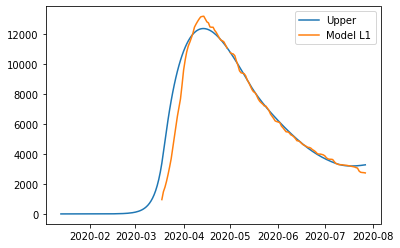

{'home': 0.9998345199484637, 'leisure': 0.8045446208574725, 'other': 0.8, 'school': 0.8810020115292814, 'transport': 0.8363522912169137, 'work': 0.8}
{'home': 0.9998345199484637, 'leisure': 0.10342892690520038, 'other': 0.07857644151293836, 'school': 0, 'transport': 0.11213178033152031, 'work': 0.4280434868311093}
{'home': 0.9998345199484637, 'leisure': 0.10342892690520038, 'other': 0.07857644151293836, 'school': 0, 'transport': 0.11213178033152031, 'work': 0.4280434868311093}
{'home': 0.9998345199484637, 'leisure': 0.12338972606578703, 'other': 0.18721361091957278, 'school': 0.2907306638046629, 'transport': 0.1954532499527614, 'work': 0.7722279032769768}
{'home': 0.9998345199484637, 'leisure': 0.23774677729026394, 'other': 0.2573472530077669, 'school': 0.5902713477246185, 'transport': 0.25833813136852907, 'work': 0.772235179767153}
{'home': 0.9998345199484637, 'leisure': 0.39327245967717483, 'other': 0.3656135568812836, 'school': 0.5902713477246185, 'transport': 0.426583968556027, 'wo

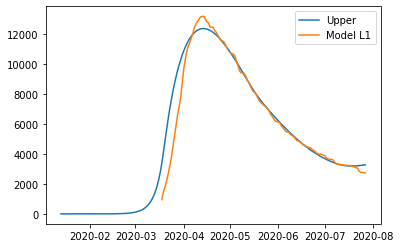

{'home': 0.9998343967142188, 'leisure': 0.8045441220648043, 'other': 0.8, 'school': 0.8810020545693901, 'transport': 0.836351796979225, 'work': 0.8}
{'home': 0.9998343967142188, 'leisure': 0.10342887164264462, 'other': 0.07857651861740719, 'school': 0, 'transport': 0.11213173702358967, 'work': 0.4280435153701125}
{'home': 0.9998343967142188, 'leisure': 0.10342887164264462, 'other': 0.07857651861740719, 'school': 0, 'transport': 0.11213173702358967, 'work': 0.4280435153701125}
{'home': 0.9998343967142188, 'leisure': 0.12338964711623636, 'other': 0.18721378209550812, 'school': 0.29073067800789876, 'transport': 0.19545317569604287, 'work': 0.7722284822933467}
{'home': 0.9998343967142188, 'leisure': 0.237746633176219, 'other': 0.257347398549208, 'school': 0.5902713765614914, 'transport': 0.25833802677957457, 'work': 0.7722357653867532}
{'home': 0.9998343967142188, 'leisure': 0.3932721993768708, 'other': 0.36561353785483375, 'school': 0.5902713765614914, 'transport': 0.42658378679884973, 'w

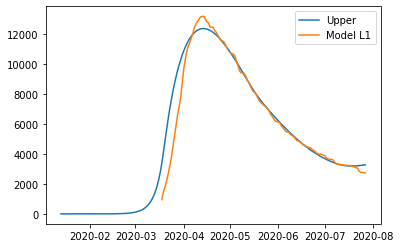

{'home': 0.9998343967142188, 'leisure': 0.8045441220648043, 'other': 0.8, 'school': 0.8810020545693901, 'transport': 0.836351796979225, 'work': 0.8}
{'home': 0.9998343967142188, 'leisure': 0.10342887164264462, 'other': 0.07857651861740719, 'school': 0, 'transport': 0.11213173702358967, 'work': 0.4280435153701125}
{'home': 0.9998343967142188, 'leisure': 0.10342887164264462, 'other': 0.07857651861740719, 'school': 0, 'transport': 0.11213173702358967, 'work': 0.4280435153701125}
{'home': 0.9998343967142188, 'leisure': 0.12338964711623636, 'other': 0.18721378209550812, 'school': 0.29073067800789876, 'transport': 0.19545317569604287, 'work': 0.7722284822933467}
{'home': 0.9998343967142188, 'leisure': 0.237746633176219, 'other': 0.257347398549208, 'school': 0.5902713765614914, 'transport': 0.25833802677957457, 'work': 0.7722357653867532}
{'home': 0.9998343967142188, 'leisure': 0.3932721993768708, 'other': 0.36561353785483375, 'school': 0.5902713765614914, 'transport': 0.42658378679884973, 'w

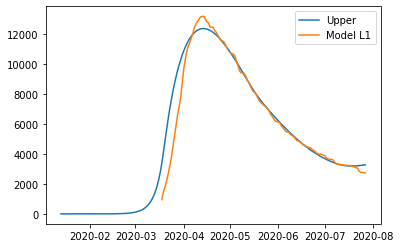

{'home': 0.9998343967142188, 'leisure': 0.8045441220648043, 'other': 0.8, 'school': 0.8810020545693901, 'transport': 0.836351796979225, 'work': 0.8}
{'home': 0.9998343967142188, 'leisure': 0.10342887164264462, 'other': 0.07857651861740719, 'school': 0, 'transport': 0.11213173702358967, 'work': 0.4280435153701125}
{'home': 0.9998343967142188, 'leisure': 0.10342887164264462, 'other': 0.07857651861740719, 'school': 0, 'transport': 0.11213173702358967, 'work': 0.4280435153701125}
{'home': 0.9998343967142188, 'leisure': 0.12338964711623636, 'other': 0.18721378209550812, 'school': 0.29073067800789876, 'transport': 0.19545317569604287, 'work': 0.7722284822933467}
{'home': 0.9998343967142188, 'leisure': 0.237746633176219, 'other': 0.257347398549208, 'school': 0.5902713765614914, 'transport': 0.25833802677957457, 'work': 0.7722357653867532}
{'home': 0.9998343967142188, 'leisure': 0.3932721993768708, 'other': 0.36561353785483375, 'school': 0.5902713765614914, 'transport': 0.42658378679884973, 'w

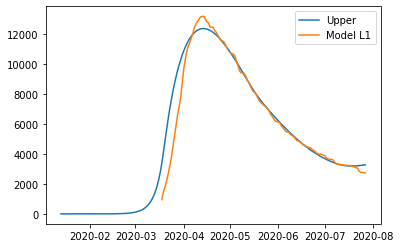

{'home': 0.9998343967142188, 'leisure': 0.8045441220648043, 'other': 0.8, 'school': 0.8810020545693901, 'transport': 0.836351796979225, 'work': 0.8}
{'home': 0.9998343967142188, 'leisure': 0.10342887164264462, 'other': 0.07857651861740719, 'school': 0, 'transport': 0.11213173702358967, 'work': 0.4280435153701125}
{'home': 0.9998343967142188, 'leisure': 0.10342887164264462, 'other': 0.07857651861740719, 'school': 0, 'transport': 0.11213173702358967, 'work': 0.4280435153701125}
{'home': 0.9998343967142188, 'leisure': 0.12338964711623636, 'other': 0.18721378209550812, 'school': 0.29073067800789876, 'transport': 0.19545317569604287, 'work': 0.7722284822933467}
{'home': 0.9998343967142188, 'leisure': 0.237746633176219, 'other': 0.257347398549208, 'school': 0.5902713765614914, 'transport': 0.25833802677957457, 'work': 0.7722357653867532}
{'home': 0.9998343967142188, 'leisure': 0.3932721993768708, 'other': 0.36561353785483375, 'school': 0.5902713765614914, 'transport': 0.42658378679884973, 'w

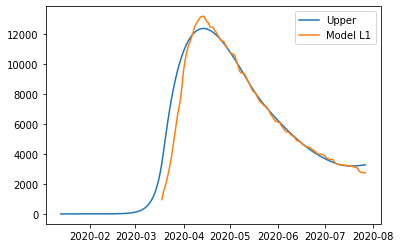

{'home': 0.9998369368765662, 'leisure': 0.8045733033997016, 'other': 0.8, 'school': 0.880998023523024, 'transport': 0.836368764705437, 'work': 0.8}
{'home': 0.9998369368765662, 'leisure': 0.10343347937661296, 'other': 0.07857936875063048, 'school': 0, 'transport': 0.11213473378974186, 'work': 0.42805155375630105}
{'home': 0.9998369368765662, 'leisure': 0.10343347937661296, 'other': 0.07857936875063048, 'school': 0, 'transport': 0.11213473378974186, 'work': 0.42805155375630105}
{'home': 0.9998369368765662, 'leisure': 0.12339569772354304, 'other': 0.18721990815851833, 'school': 0.29072934776259796, 'transport': 0.19545847848864895, 'work': 0.7722274609134551}
{'home': 0.9998369368765662, 'leisure': 0.23775777153953614, 'other': 0.2573551763028899, 'school': 0.5902686757604262, 'transport': 0.2583449978308773, 'work': 0.7722345384155862}
{'home': 0.9998369368765662, 'leisure': 0.3932894856706687, 'other': 0.3656212934792396, 'school': 0.5902686757604262, 'transport': 0.42659502461233845, 

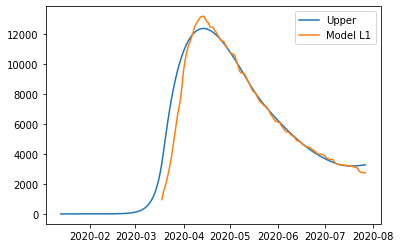

{'home': 0.9998369368765662, 'leisure': 0.8045733033997016, 'other': 0.8, 'school': 0.880998023523024, 'transport': 0.836368764705437, 'work': 0.8}
{'home': 0.9998369368765662, 'leisure': 0.10343347937661296, 'other': 0.07857936875063048, 'school': 0, 'transport': 0.11213473378974186, 'work': 0.42805155375630105}
{'home': 0.9998369368765662, 'leisure': 0.10343347937661296, 'other': 0.07857936875063048, 'school': 0, 'transport': 0.11213473378974186, 'work': 0.42805155375630105}
{'home': 0.9998369368765662, 'leisure': 0.12339569772354304, 'other': 0.18721990815851833, 'school': 0.29072934776259796, 'transport': 0.19545847848864895, 'work': 0.7722274609134551}
{'home': 0.9998369368765662, 'leisure': 0.23775777153953614, 'other': 0.2573551763028899, 'school': 0.5902686757604262, 'transport': 0.2583449978308773, 'work': 0.7722345384155862}
{'home': 0.9998369368765662, 'leisure': 0.3932894856706687, 'other': 0.3656212934792396, 'school': 0.5902686757604262, 'transport': 0.42659502461233845, 

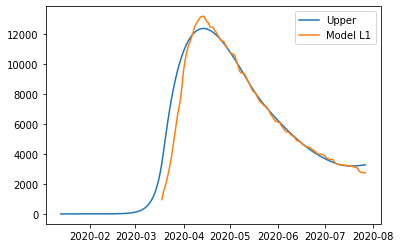

{'home': 0.9998369468765662, 'leisure': 0.8045733033997016, 'other': 0.8, 'school': 0.880998023523024, 'transport': 0.836368764705437, 'work': 0.8}
{'home': 0.9998369468765662, 'leisure': 0.10343347937661296, 'other': 0.07857936875063048, 'school': 0, 'transport': 0.11213473378974186, 'work': 0.42805155375630105}
{'home': 0.9998369468765662, 'leisure': 0.10343347937661296, 'other': 0.07857936875063048, 'school': 0, 'transport': 0.11213473378974186, 'work': 0.42805155375630105}
{'home': 0.9998369468765662, 'leisure': 0.12339569772354304, 'other': 0.18721990815851833, 'school': 0.29072934776259796, 'transport': 0.19545847848864895, 'work': 0.7722274609134551}
{'home': 0.9998369468765662, 'leisure': 0.23775777153953614, 'other': 0.2573551763028899, 'school': 0.5902686757604262, 'transport': 0.2583449978308773, 'work': 0.7722345384155862}
{'home': 0.9998369468765662, 'leisure': 0.3932894856706687, 'other': 0.3656212934792396, 'school': 0.5902686757604262, 'transport': 0.42659502461233845, 

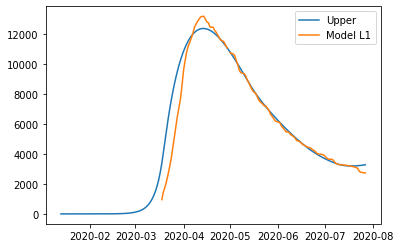

{'home': 0.9998387693762362, 'leisure': 0.8045799903550149, 'other': 0.8, 'school': 0.8809937031808468, 'transport': 0.8363717064403065, 'work': 0.8000000099473278}
{'home': 0.9998387693762362, 'leisure': 0.1034348320441942, 'other': 0.07858135244211102, 'school': 0, 'transport': 0.11213568188731887, 'work': 0.4280556337118386}
{'home': 0.9998387693762362, 'leisure': 0.1034348320441942, 'other': 0.07858135244211102, 'school': 0, 'transport': 0.11213568188731887, 'work': 0.4280556337118386}
{'home': 0.9998387693762362, 'leisure': 0.12339744468363291, 'other': 0.18722424039661617, 'school': 0.29072792204967945, 'transport': 0.1954601782608465, 'work': 0.7722328116672379}
{'home': 0.9998387693762362, 'leisure': 0.2377609728986872, 'other': 0.25736000902506645, 'school': 0.5902657811311673, 'transport': 0.2583471685978681, 'work': 0.7722397974831274}
{'home': 0.9998387693762362, 'leisure': 0.3932940820732992, 'other': 0.36562472013031994, 'school': 0.5902657811311673, 'transport': 0.426598

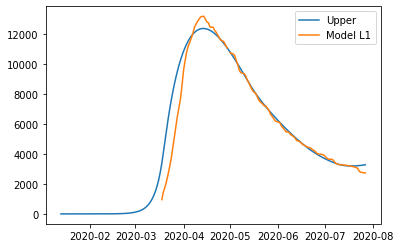

{'home': 0.9998387693762362, 'leisure': 0.8045799903550149, 'other': 0.8, 'school': 0.8809937031808468, 'transport': 0.8363717064403065, 'work': 0.8000000099473278}
{'home': 0.9998387693762362, 'leisure': 0.1034348320441942, 'other': 0.07858135244211102, 'school': 0, 'transport': 0.11213568188731887, 'work': 0.4280556337118386}
{'home': 0.9998387693762362, 'leisure': 0.1034348320441942, 'other': 0.07858135244211102, 'school': 0, 'transport': 0.11213568188731887, 'work': 0.4280556337118386}
{'home': 0.9998387693762362, 'leisure': 0.12339744468363291, 'other': 0.18722424039661617, 'school': 0.29072792204967945, 'transport': 0.1954601782608465, 'work': 0.7722328116672379}
{'home': 0.9998387693762362, 'leisure': 0.2377609728986872, 'other': 0.25736000902506645, 'school': 0.5902657811311673, 'transport': 0.2583471685978681, 'work': 0.7722397974831274}
{'home': 0.9998387693762362, 'leisure': 0.3932940820732992, 'other': 0.36562472013031994, 'school': 0.5902657811311673, 'transport': 0.426598

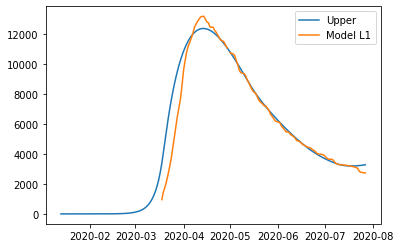

{'home': 0.9998387793762362, 'leisure': 0.8045799903550149, 'other': 0.8, 'school': 0.8809937031808468, 'transport': 0.8363717064403065, 'work': 0.8000000099473278}
{'home': 0.9998387793762362, 'leisure': 0.1034348320441942, 'other': 0.07858135244211102, 'school': 0, 'transport': 0.11213568188731887, 'work': 0.4280556337118386}
{'home': 0.9998387793762362, 'leisure': 0.1034348320441942, 'other': 0.07858135244211102, 'school': 0, 'transport': 0.11213568188731887, 'work': 0.4280556337118386}
{'home': 0.9998387793762362, 'leisure': 0.12339744468363291, 'other': 0.18722424039661617, 'school': 0.29072792204967945, 'transport': 0.1954601782608465, 'work': 0.7722328116672379}
{'home': 0.9998387793762362, 'leisure': 0.2377609728986872, 'other': 0.25736000902506645, 'school': 0.5902657811311673, 'transport': 0.2583471685978681, 'work': 0.7722397974831274}
{'home': 0.9998387793762362, 'leisure': 0.3932940820732992, 'other': 0.36562472013031994, 'school': 0.5902657811311673, 'transport': 0.426598

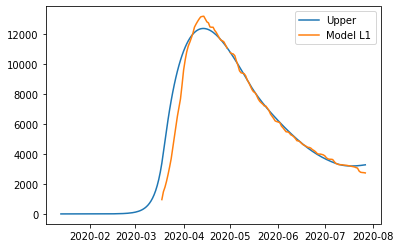

{'home': 0.9998400130586618, 'leisure': 0.8045765735207976, 'other': 0.8, 'school': 0.8809915676684733, 'transport': 0.8363685898978762, 'work': 0.8}
{'home': 0.9998400130586618, 'leisure': 0.10343457184696565, 'other': 0.07858230730756605, 'school': 0, 'transport': 0.11213555271731662, 'work': 0.42805678430379007}
{'home': 0.9998400130586618, 'leisure': 0.10343457184696565, 'other': 0.07858230730756605, 'school': 0, 'transport': 0.11213555271731662, 'work': 0.42805678430379007}
{'home': 0.9998400130586618, 'leisure': 0.12339706737933674, 'other': 0.187226356469495, 'school': 0.2907272173305962, 'transport': 0.1954599715746207, 'work': 0.7722384003725677}
{'home': 0.9998400130586618, 'leisure': 0.23776026952880686, 'other': 0.2573620342767708, 'school': 0.5902643503378772, 'transport': 0.2583468334352176, 'work': 0.772245392871445}
{'home': 0.9998400130586618, 'leisure': 0.3932926280018769, 'other': 0.3656253291795293, 'school': 0.5902643503378772, 'transport': 0.42659774831051894, 'wo

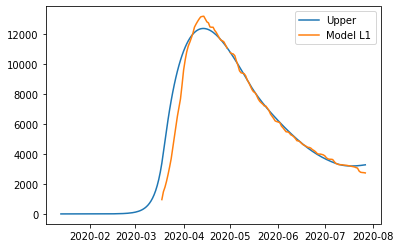

{'home': 0.9998400130586618, 'leisure': 0.8045765735207976, 'other': 0.8, 'school': 0.8809915676684733, 'transport': 0.8363685898978762, 'work': 0.8}
{'home': 0.9998400130586618, 'leisure': 0.10343457184696565, 'other': 0.07858230730756605, 'school': 0, 'transport': 0.11213555271731662, 'work': 0.42805678430379007}
{'home': 0.9998400130586618, 'leisure': 0.10343457184696565, 'other': 0.07858230730756605, 'school': 0, 'transport': 0.11213555271731662, 'work': 0.42805678430379007}
{'home': 0.9998400130586618, 'leisure': 0.12339706737933674, 'other': 0.187226356469495, 'school': 0.2907272173305962, 'transport': 0.1954599715746207, 'work': 0.7722384003725677}
{'home': 0.9998400130586618, 'leisure': 0.23776026952880686, 'other': 0.2573620342767708, 'school': 0.5902643503378772, 'transport': 0.2583468334352176, 'work': 0.772245392871445}
{'home': 0.9998400130586618, 'leisure': 0.3932926280018769, 'other': 0.3656253291795293, 'school': 0.5902643503378772, 'transport': 0.42659774831051894, 'wo

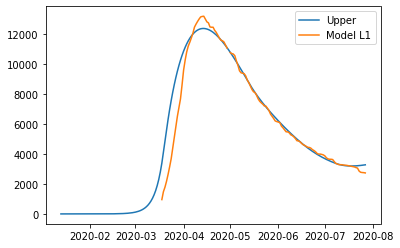

{'home': 0.9998400230586618, 'leisure': 0.8045765735207976, 'other': 0.8, 'school': 0.8809915676684733, 'transport': 0.8363685898978762, 'work': 0.8}
{'home': 0.9998400230586618, 'leisure': 0.10343457184696565, 'other': 0.07858230730756605, 'school': 0, 'transport': 0.11213555271731662, 'work': 0.42805678430379007}
{'home': 0.9998400230586618, 'leisure': 0.10343457184696565, 'other': 0.07858230730756605, 'school': 0, 'transport': 0.11213555271731662, 'work': 0.42805678430379007}
{'home': 0.9998400230586618, 'leisure': 0.12339706737933674, 'other': 0.187226356469495, 'school': 0.2907272173305962, 'transport': 0.1954599715746207, 'work': 0.7722384003725677}
{'home': 0.9998400230586618, 'leisure': 0.23776026952880686, 'other': 0.2573620342767708, 'school': 0.5902643503378772, 'transport': 0.2583468334352176, 'work': 0.772245392871445}
{'home': 0.9998400230586618, 'leisure': 0.3932926280018769, 'other': 0.3656253291795293, 'school': 0.5902643503378772, 'transport': 0.42659774831051894, 'wo

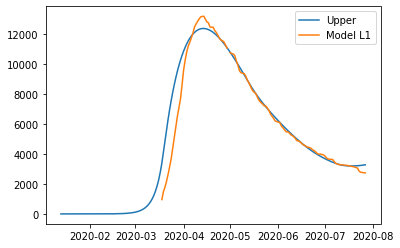

{'home': 0.999839975519131, 'leisure': 0.8045760405320411, 'other': 0.8, 'school': 0.880992514856108, 'transport': 0.8363682427472489, 'work': 0.8}
{'home': 0.999839975519131, 'leisure': 0.10343444731337359, 'other': 0.07858208108121091, 'school': 0, 'transport': 0.11213544315921077, 'work': 0.42805629093252384}
{'home': 0.999839975519131, 'leisure': 0.10343444731337359, 'other': 0.07858208108121091, 'school': 0, 'transport': 0.11213544315921077, 'work': 0.42805629093252384}
{'home': 0.999839975519131, 'leisure': 0.12339690268801058, 'other': 0.1872258597868205, 'school': 0.29072752990251566, 'transport': 0.1954597750489334, 'work': 0.7722377682415215}
{'home': 0.999839975519131, 'leisure': 0.2377599720459561, 'other': 0.2573614849421166, 'school': 0.5902649849535924, 'transport': 0.2583465825410573, 'work': 0.7722447893522928}
{'home': 0.999839975519131, 'leisure': 0.3932922153949899, 'other': 0.36562493210224356, 'school': 0.5902649849535924, 'transport': 0.4265973572223405, 'work': 

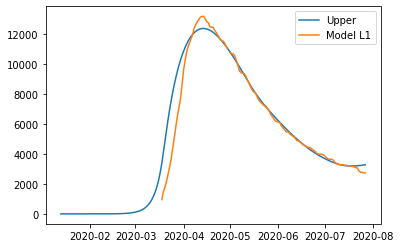

{'home': 0.999839975519131, 'leisure': 0.8045760405320411, 'other': 0.8, 'school': 0.880992514856108, 'transport': 0.8363682427472489, 'work': 0.8}
{'home': 0.999839975519131, 'leisure': 0.10343444731337359, 'other': 0.07858208108121091, 'school': 0, 'transport': 0.11213544315921077, 'work': 0.42805629093252384}
{'home': 0.999839975519131, 'leisure': 0.10343444731337359, 'other': 0.07858208108121091, 'school': 0, 'transport': 0.11213544315921077, 'work': 0.42805629093252384}
{'home': 0.999839975519131, 'leisure': 0.12339690268801058, 'other': 0.1872258597868205, 'school': 0.29072752990251566, 'transport': 0.1954597750489334, 'work': 0.7722377682415215}
{'home': 0.999839975519131, 'leisure': 0.2377599720459561, 'other': 0.2573614849421166, 'school': 0.5902649849535924, 'transport': 0.2583465825410573, 'work': 0.7722447893522928}
{'home': 0.999839975519131, 'leisure': 0.3932922153949899, 'other': 0.36562493210224356, 'school': 0.5902649849535924, 'transport': 0.4265973572223405, 'work': 

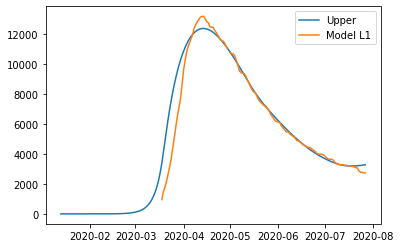

{'home': 0.999839975519131, 'leisure': 0.8045760405320411, 'other': 0.8, 'school': 0.880992514856108, 'transport': 0.8363682427472489, 'work': 0.8}
{'home': 0.999839975519131, 'leisure': 0.10343444731337359, 'other': 0.07858208108121091, 'school': 0, 'transport': 0.11213544315921077, 'work': 0.42805629093252384}
{'home': 0.999839975519131, 'leisure': 0.10343444731337359, 'other': 0.07858208108121091, 'school': 0, 'transport': 0.11213544315921077, 'work': 0.42805629093252384}
{'home': 0.999839975519131, 'leisure': 0.12339690268801058, 'other': 0.1872258597868205, 'school': 0.29072752990251566, 'transport': 0.1954597750489334, 'work': 0.7722377682415215}
{'home': 0.999839975519131, 'leisure': 0.2377599720459561, 'other': 0.2573614849421166, 'school': 0.5902649849535924, 'transport': 0.2583465825410573, 'work': 0.7722447893522928}
{'home': 0.999839975519131, 'leisure': 0.3932922153949899, 'other': 0.36562493210224356, 'school': 0.5902649849535924, 'transport': 0.4265973572223405, 'work': 

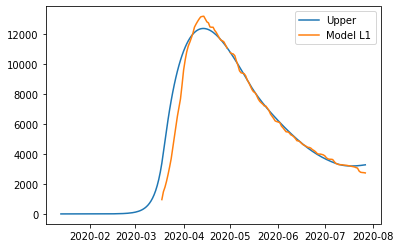

{'home': 0.999839985519131, 'leisure': 0.8045760405320411, 'other': 0.8, 'school': 0.880992514856108, 'transport': 0.8363682427472489, 'work': 0.8}
{'home': 0.999839985519131, 'leisure': 0.10343444731337359, 'other': 0.07858208108121091, 'school': 0, 'transport': 0.11213544315921077, 'work': 0.42805629093252384}
{'home': 0.999839985519131, 'leisure': 0.10343444731337359, 'other': 0.07858208108121091, 'school': 0, 'transport': 0.11213544315921077, 'work': 0.42805629093252384}
{'home': 0.999839985519131, 'leisure': 0.12339690268801058, 'other': 0.1872258597868205, 'school': 0.29072752990251566, 'transport': 0.1954597750489334, 'work': 0.7722377682415215}
{'home': 0.999839985519131, 'leisure': 0.2377599720459561, 'other': 0.2573614849421166, 'school': 0.5902649849535924, 'transport': 0.2583465825410573, 'work': 0.7722447893522928}
{'home': 0.999839985519131, 'leisure': 0.3932922153949899, 'other': 0.36562493210224356, 'school': 0.5902649849535924, 'transport': 0.4265973572223405, 'work': 

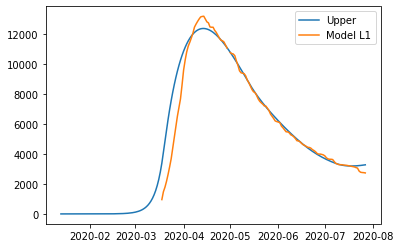

{'home': 0.9998392425322474, 'leisure': 0.8045786625990836, 'other': 0.8, 'school': 0.8809966817695067, 'transport': 0.8363703766203251, 'work': 0.8}
{'home': 0.9998392425322474, 'leisure': 0.10343454961193768, 'other': 0.07858093500727507, 'school': 0, 'transport': 0.11213539077712466, 'work': 0.4280545105241251}
{'home': 0.9998392425322474, 'leisure': 0.10343454961193768, 'other': 0.07858093500727507, 'school': 0, 'transport': 0.11213539077712466, 'work': 0.4280545105241251}
{'home': 0.9998392425322474, 'leisure': 0.12339705624054302, 'other': 0.18722332133936093, 'school': 0.2907289049839372, 'transport': 0.19545965948087105, 'work': 0.7722320143040449}
{'home': 0.9998392425322474, 'leisure': 0.23776027900894578, 'other': 0.25735895553753957, 'school': 0.5902677767855695, 'transport': 0.2583464960509414, 'work': 0.7722391080947221}
{'home': 0.9998392425322474, 'leisure': 0.3932930868898777, 'other': 0.3656238166572501, 'school': 0.5902677767855695, 'transport': 0.42659733771937247, 

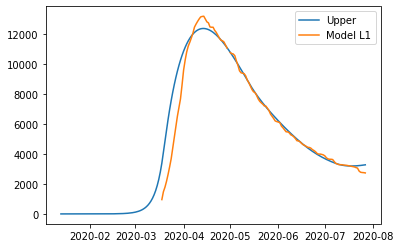

{'home': 0.9998392425322474, 'leisure': 0.8045786625990836, 'other': 0.8, 'school': 0.8809966817695067, 'transport': 0.8363703766203251, 'work': 0.8}
{'home': 0.9998392425322474, 'leisure': 0.10343454961193768, 'other': 0.07858093500727507, 'school': 0, 'transport': 0.11213539077712466, 'work': 0.4280545105241251}
{'home': 0.9998392425322474, 'leisure': 0.10343454961193768, 'other': 0.07858093500727507, 'school': 0, 'transport': 0.11213539077712466, 'work': 0.4280545105241251}
{'home': 0.9998392425322474, 'leisure': 0.12339705624054302, 'other': 0.18722332133936093, 'school': 0.2907289049839372, 'transport': 0.19545965948087105, 'work': 0.7722320143040449}
{'home': 0.9998392425322474, 'leisure': 0.23776027900894578, 'other': 0.25735895553753957, 'school': 0.5902677767855695, 'transport': 0.2583464960509414, 'work': 0.7722391080947221}
{'home': 0.9998392425322474, 'leisure': 0.3932930868898777, 'other': 0.3656238166572501, 'school': 0.5902677767855695, 'transport': 0.42659733771937247, 

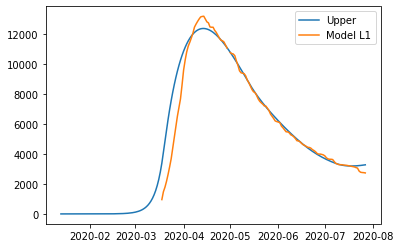

{'home': 0.9998392525322475, 'leisure': 0.8045786625990836, 'other': 0.8, 'school': 0.8809966817695067, 'transport': 0.8363703766203251, 'work': 0.8}
{'home': 0.9998392525322475, 'leisure': 0.10343454961193768, 'other': 0.07858093500727507, 'school': 0, 'transport': 0.11213539077712466, 'work': 0.4280545105241251}
{'home': 0.9998392525322475, 'leisure': 0.10343454961193768, 'other': 0.07858093500727507, 'school': 0, 'transport': 0.11213539077712466, 'work': 0.4280545105241251}
{'home': 0.9998392525322475, 'leisure': 0.12339705624054302, 'other': 0.18722332133936093, 'school': 0.2907289049839372, 'transport': 0.19545965948087105, 'work': 0.7722320143040449}
{'home': 0.9998392525322475, 'leisure': 0.23776027900894578, 'other': 0.25735895553753957, 'school': 0.5902677767855695, 'transport': 0.2583464960509414, 'work': 0.7722391080947221}
{'home': 0.9998392525322475, 'leisure': 0.3932930868898777, 'other': 0.3656238166572501, 'school': 0.5902677767855695, 'transport': 0.42659733771937247, 

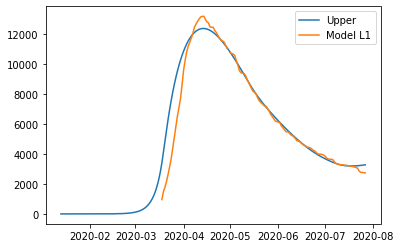

{'home': 0.9998392092209897, 'leisure': 0.8045844837528009, 'other': 0.8, 'school': 0.8810015475901477, 'transport': 0.8363739102681786, 'work': 0.8}
{'home': 0.9998392092209897, 'leisure': 0.10343515291377736, 'other': 0.07858013212125572, 'school': 0, 'transport': 0.11213561245735441, 'work': 0.4280535181069775}
{'home': 0.9998392092209897, 'leisure': 0.10343515291377736, 'other': 0.07858013212125572, 'school': 0, 'transport': 0.11213561245735441, 'work': 0.4280535181069775}
{'home': 0.9998392092209897, 'leisure': 0.12339785285661592, 'other': 0.1872215177954419, 'school': 0.29073051070474876, 'transport': 0.19546003021339337, 'work': 0.7722264673969639}
{'home': 0.9998392092209897, 'leisure': 0.23776177984865327, 'other': 0.2573573183720611, 'school': 0.590271036885399, 'transport': 0.2583470443260691, 'work': 0.7722336537832586}
{'home': 0.9998392092209897, 'leisure': 0.3932958006020534, 'other': 0.36562345135645113, 'school': 0.590271036885399, 'transport': 0.4265983321449808, 'wo

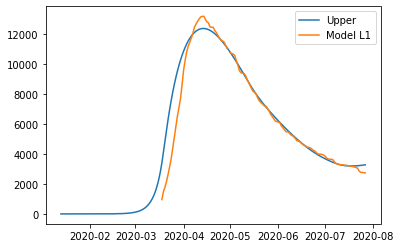

{'home': 0.9998392092209897, 'leisure': 0.8045844837528009, 'other': 0.8, 'school': 0.8810015475901477, 'transport': 0.8363739102681786, 'work': 0.8}
{'home': 0.9998392092209897, 'leisure': 0.10343515291377736, 'other': 0.07858013212125572, 'school': 0, 'transport': 0.11213561245735441, 'work': 0.4280535181069775}
{'home': 0.9998392092209897, 'leisure': 0.10343515291377736, 'other': 0.07858013212125572, 'school': 0, 'transport': 0.11213561245735441, 'work': 0.4280535181069775}
{'home': 0.9998392092209897, 'leisure': 0.12339785285661592, 'other': 0.1872215177954419, 'school': 0.29073051070474876, 'transport': 0.19546003021339337, 'work': 0.7722264673969639}
{'home': 0.9998392092209897, 'leisure': 0.23776177984865327, 'other': 0.2573573183720611, 'school': 0.590271036885399, 'transport': 0.2583470443260691, 'work': 0.7722336537832586}
{'home': 0.9998392092209897, 'leisure': 0.3932958006020534, 'other': 0.36562345135645113, 'school': 0.590271036885399, 'transport': 0.4265983321449808, 'wo

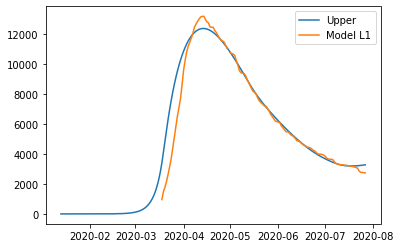

{'home': 0.9998392092209897, 'leisure': 0.8045844837528009, 'other': 0.8, 'school': 0.8810015475901477, 'transport': 0.8363739102681786, 'work': 0.8}
{'home': 0.9998392092209897, 'leisure': 0.10343515291377736, 'other': 0.07858013212125572, 'school': 0, 'transport': 0.11213561245735441, 'work': 0.4280535181069775}
{'home': 0.9998392092209897, 'leisure': 0.10343515291377736, 'other': 0.07858013212125572, 'school': 0, 'transport': 0.11213561245735441, 'work': 0.4280535181069775}
{'home': 0.9998392092209897, 'leisure': 0.12339785285661592, 'other': 0.1872215177954419, 'school': 0.29073051070474876, 'transport': 0.19546003021339337, 'work': 0.7722264673969639}
{'home': 0.9998392092209897, 'leisure': 0.23776177984865327, 'other': 0.2573573183720611, 'school': 0.590271036885399, 'transport': 0.2583470443260691, 'work': 0.7722336537832586}
{'home': 0.9998392092209897, 'leisure': 0.3932958006020534, 'other': 0.36562345135645113, 'school': 0.590271036885399, 'transport': 0.4265983321449808, 'wo

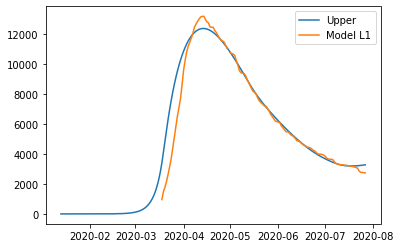

{'home': 0.9998392092209897, 'leisure': 0.8045844837528009, 'other': 0.8, 'school': 0.8810015475901477, 'transport': 0.8363739102681786, 'work': 0.8}
{'home': 0.9998392092209897, 'leisure': 0.10343515291377736, 'other': 0.07858013212125572, 'school': 0, 'transport': 0.11213561245735441, 'work': 0.4280535181069775}
{'home': 0.9998392092209897, 'leisure': 0.10343515291377736, 'other': 0.07858013212125572, 'school': 0, 'transport': 0.11213561245735441, 'work': 0.4280535181069775}
{'home': 0.9998392092209897, 'leisure': 0.12339785285661592, 'other': 0.1872215177954419, 'school': 0.29073051070474876, 'transport': 0.19546003021339337, 'work': 0.7722264673969639}
{'home': 0.9998392092209897, 'leisure': 0.23776177984865327, 'other': 0.2573573183720611, 'school': 0.590271036885399, 'transport': 0.2583470443260691, 'work': 0.7722336537832586}
{'home': 0.9998392092209897, 'leisure': 0.3932958006020534, 'other': 0.36562345135645113, 'school': 0.590271036885399, 'transport': 0.4265983321449808, 'wo

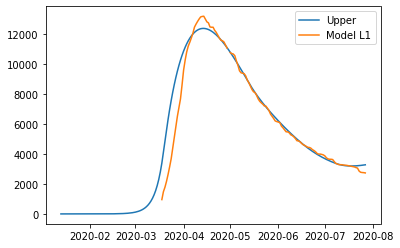

{'home': 0.999842662295037, 'leisure': 0.8048080497510616, 'other': 0.8, 'school': 0.88116585477639, 'transport': 0.8365072868414659, 'work': 0.8}
{'home': 0.999842662295037, 'leisure': 0.10345980111759187, 'other': 0.07855587436056825, 'school': 0, 'transport': 0.11214570787125083, 'work': 0.42802730425711283}
{'home': 0.999842662295037, 'leisure': 0.10345980111759187, 'other': 0.07855587436056825, 'school': 0, 'transport': 0.11214570787125083, 'work': 0.42802730425711283}
{'home': 0.999842662295037, 'leisure': 0.1234303155921459, 'other': 0.1871667461391164, 'school': 0.2907847320762087, 'transport': 0.19547717322584549, 'work': 0.7720397967390721}
{'home': 0.999842662295037, 'leisure': 0.2378227331798213, 'other': 0.25730962661941087, 'school': 0.5903811227001813, 'transport': 0.2583716172596237, 'work': 0.7720500677763397}
{'home': 0.999842662295037, 'leisure': 0.3934033165060181, 'other': 0.3656181003193035, 'school': 0.5903811227001813, 'transport': 0.42664163835455654, 'work': 0

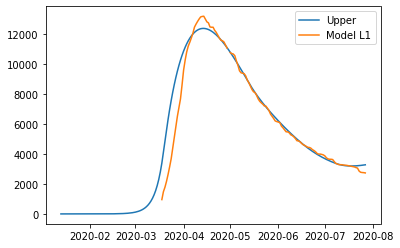

{'home': 0.999842662295037, 'leisure': 0.8048080497510616, 'other': 0.8, 'school': 0.88116585477639, 'transport': 0.8365072868414659, 'work': 0.8}
{'home': 0.999842662295037, 'leisure': 0.10345980111759187, 'other': 0.07855587436056825, 'school': 0, 'transport': 0.11214570787125083, 'work': 0.42802730425711283}
{'home': 0.999842662295037, 'leisure': 0.10345980111759187, 'other': 0.07855587436056825, 'school': 0, 'transport': 0.11214570787125083, 'work': 0.42802730425711283}
{'home': 0.999842662295037, 'leisure': 0.1234303155921459, 'other': 0.1871667461391164, 'school': 0.2907847320762087, 'transport': 0.19547717322584549, 'work': 0.7720397967390721}
{'home': 0.999842662295037, 'leisure': 0.2378227331798213, 'other': 0.25730962661941087, 'school': 0.5903811227001813, 'transport': 0.2583716172596237, 'work': 0.7720500677763397}
{'home': 0.999842662295037, 'leisure': 0.3934033165060181, 'other': 0.3656181003193035, 'school': 0.5903811227001813, 'transport': 0.42664163835455654, 'work': 0

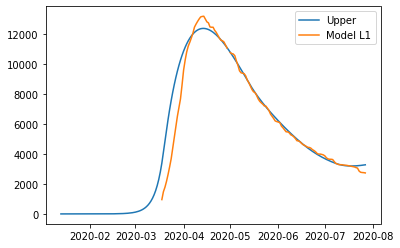

{'home': 0.999842662295037, 'leisure': 0.8048080497510616, 'other': 0.8, 'school': 0.88116585477639, 'transport': 0.8365072868414659, 'work': 0.8}
{'home': 0.999842662295037, 'leisure': 0.10345980111759187, 'other': 0.07855587436056825, 'school': 0, 'transport': 0.11214570787125083, 'work': 0.42802730425711283}
{'home': 0.999842662295037, 'leisure': 0.10345980111759187, 'other': 0.07855587436056825, 'school': 0, 'transport': 0.11214570787125083, 'work': 0.42802730425711283}
{'home': 0.999842662295037, 'leisure': 0.1234303155921459, 'other': 0.1871667461391164, 'school': 0.2907847320762087, 'transport': 0.19547717322584549, 'work': 0.7720397967390721}
{'home': 0.999842662295037, 'leisure': 0.2378227331798213, 'other': 0.25730962661941087, 'school': 0.5903811227001813, 'transport': 0.2583716172596237, 'work': 0.7720500677763397}
{'home': 0.999842662295037, 'leisure': 0.3934033165060181, 'other': 0.3656181003193035, 'school': 0.5903811227001813, 'transport': 0.42664163835455654, 'work': 0

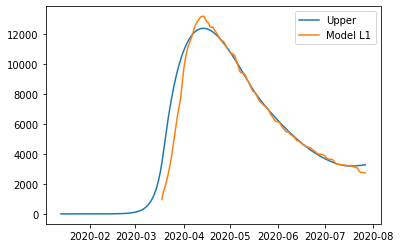

{'home': 0.999845980192797, 'leisure': 0.8051322271134307, 'other': 0.8, 'school': 0.8814058556341353, 'transport': 0.836701848164885, 'work': 0.8}
{'home': 0.999845980192797, 'leisure': 0.10349529189089157, 'other': 0.07851956376305738, 'school': 0, 'transport': 0.11216016544102456, 'work': 0.42798747202997334}
{'home': 0.999845980192797, 'leisure': 0.10349529189089157, 'other': 0.07851956376305738, 'school': 0, 'transport': 0.11216016544102456, 'work': 0.42798747202997334}
{'home': 0.999845980192797, 'leisure': 0.12347709985773862, 'other': 0.18708482960509198, 'school': 0.29086393235926467, 'transport': 0.19550169098239958, 'work': 0.7717641727477963}
{'home': 0.999845980192797, 'leisure': 0.23791058964519812, 'other': 0.25723789111056256, 'school': 0.5905419232748707, 'transport': 0.2584068598913093, 'work': 0.7717789209695147}
{'home': 0.999845980192797, 'leisure': 0.39355872471225617, 'other': 0.3656090438539108, 'school': 0.5905419232748707, 'transport': 0.4267039143186877, 'wor

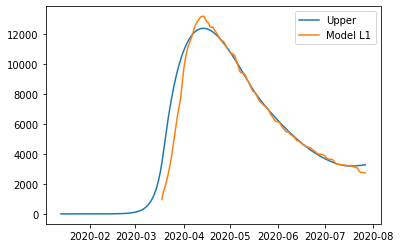

{'home': 0.999845980192797, 'leisure': 0.8051322271134307, 'other': 0.8, 'school': 0.8814058556341353, 'transport': 0.836701848164885, 'work': 0.8}
{'home': 0.999845980192797, 'leisure': 0.10349529189089157, 'other': 0.07851956376305738, 'school': 0, 'transport': 0.11216016544102456, 'work': 0.42798747202997334}
{'home': 0.999845980192797, 'leisure': 0.10349529189089157, 'other': 0.07851956376305738, 'school': 0, 'transport': 0.11216016544102456, 'work': 0.42798747202997334}
{'home': 0.999845980192797, 'leisure': 0.12347709985773862, 'other': 0.18708482960509198, 'school': 0.29086393235926467, 'transport': 0.19550169098239958, 'work': 0.7717641727477963}
{'home': 0.999845980192797, 'leisure': 0.23791058964519812, 'other': 0.25723789111056256, 'school': 0.5905419232748707, 'transport': 0.2584068598913093, 'work': 0.7717789209695147}
{'home': 0.999845980192797, 'leisure': 0.39355872471225617, 'other': 0.3656090438539108, 'school': 0.5905419232748707, 'transport': 0.4267039143186877, 'wor

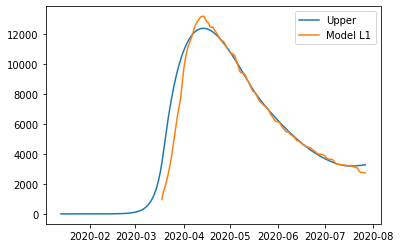

{'home': 0.999845980192797, 'leisure': 0.8051322271134307, 'other': 0.8, 'school': 0.8814058556341353, 'transport': 0.836701848164885, 'work': 0.8}
{'home': 0.999845980192797, 'leisure': 0.10349529189089157, 'other': 0.07851956376305738, 'school': 0, 'transport': 0.11216016544102456, 'work': 0.42798747202997334}
{'home': 0.999845980192797, 'leisure': 0.10349529189089157, 'other': 0.07851956376305738, 'school': 0, 'transport': 0.11216016544102456, 'work': 0.42798747202997334}
{'home': 0.999845980192797, 'leisure': 0.12347709985773862, 'other': 0.18708482960509198, 'school': 0.29086393235926467, 'transport': 0.19550169098239958, 'work': 0.7717641727477963}
{'home': 0.999845980192797, 'leisure': 0.23791058964519812, 'other': 0.25723789111056256, 'school': 0.5905419232748707, 'transport': 0.2584068598913093, 'work': 0.7717789209695147}
{'home': 0.999845980192797, 'leisure': 0.39355872471225617, 'other': 0.3656090438539108, 'school': 0.5905419232748707, 'transport': 0.4267039143186877, 'wor

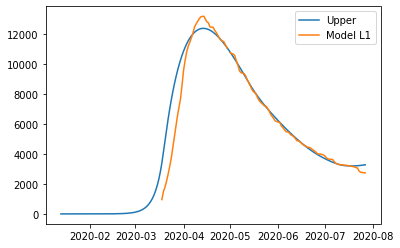

{'home': 0.9998442308662638, 'leisure': 0.8049613080247566, 'other': 0.8, 'school': 0.8812793177180173, 'transport': 0.8365992677630735, 'work': 0.8}
{'home': 0.9998442308662638, 'leisure': 0.10347658039329043, 'other': 0.0785387078955273, 'school': 0, 'transport': 0.11215254373946056, 'work': 0.42800847350494353}
{'home': 0.9998442308662638, 'leisure': 0.10347658039329043, 'other': 0.0785387078955273, 'school': 0, 'transport': 0.11215254373946056, 'work': 0.42800847350494353}
{'home': 0.9998442308662638, 'leisure': 0.12345243365059222, 'other': 0.1871280186762267, 'school': 0.2908221748469457, 'transport': 0.1954887658747291, 'work': 0.7719094950350414}
{'home': 0.9998442308662638, 'leisure': 0.2378642690708657, 'other': 0.25727571241283603, 'school': 0.5904571428710716, 'transport': 0.2583882805085146, 'work': 0.7719218826687653}
{'home': 0.9998442308662638, 'leisure': 0.3934767876927715, 'other': 0.3656138187181397, 'school': 0.5904571428710716, 'transport': 0.4266710828333304, 'wor

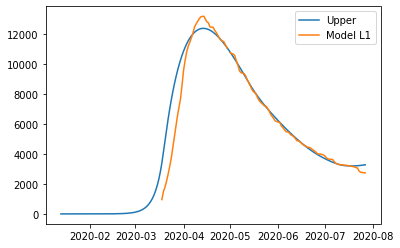

{'home': 0.9998442308662638, 'leisure': 0.8049613080247566, 'other': 0.8, 'school': 0.8812793177180173, 'transport': 0.8365992677630735, 'work': 0.8}
{'home': 0.9998442308662638, 'leisure': 0.10347658039329043, 'other': 0.0785387078955273, 'school': 0, 'transport': 0.11215254373946056, 'work': 0.42800847350494353}
{'home': 0.9998442308662638, 'leisure': 0.10347658039329043, 'other': 0.0785387078955273, 'school': 0, 'transport': 0.11215254373946056, 'work': 0.42800847350494353}
{'home': 0.9998442308662638, 'leisure': 0.12345243365059222, 'other': 0.1871280186762267, 'school': 0.2908221748469457, 'transport': 0.1954887658747291, 'work': 0.7719094950350414}
{'home': 0.9998442308662638, 'leisure': 0.2378642690708657, 'other': 0.25727571241283603, 'school': 0.5904571428710716, 'transport': 0.2583882805085146, 'work': 0.7719218826687653}
{'home': 0.9998442308662638, 'leisure': 0.3934767876927715, 'other': 0.3656138187181397, 'school': 0.5904571428710716, 'transport': 0.4266710828333304, 'wor

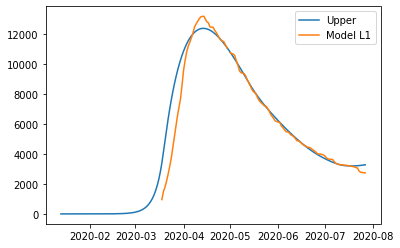

{'home': 0.9998442308662638, 'leisure': 0.8049613080247566, 'other': 0.8, 'school': 0.8812793177180173, 'transport': 0.8365992677630735, 'work': 0.8}
{'home': 0.9998442308662638, 'leisure': 0.10347658039329043, 'other': 0.0785387078955273, 'school': 0, 'transport': 0.11215254373946056, 'work': 0.42800847350494353}
{'home': 0.9998442308662638, 'leisure': 0.10347658039329043, 'other': 0.0785387078955273, 'school': 0, 'transport': 0.11215254373946056, 'work': 0.42800847350494353}
{'home': 0.9998442308662638, 'leisure': 0.12345243365059222, 'other': 0.1871280186762267, 'school': 0.2908221748469457, 'transport': 0.1954887658747291, 'work': 0.7719094950350414}
{'home': 0.9998442308662638, 'leisure': 0.2378642690708657, 'other': 0.25727571241283603, 'school': 0.5904571428710716, 'transport': 0.2583882805085146, 'work': 0.7719218826687653}
{'home': 0.9998442308662638, 'leisure': 0.3934767876927715, 'other': 0.3656138187181397, 'school': 0.5904571428710716, 'transport': 0.4266710828333304, 'wor

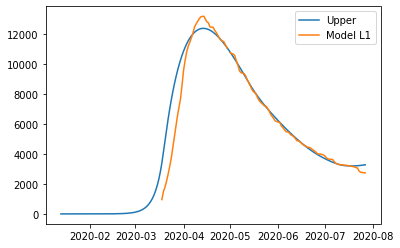

{'home': 0.9998442308662638, 'leisure': 0.8049613080247566, 'other': 0.8, 'school': 0.8812793177180173, 'transport': 0.8365992677630735, 'work': 0.8}
{'home': 0.9998442308662638, 'leisure': 0.10347658039329043, 'other': 0.0785387078955273, 'school': 0, 'transport': 0.11215254373946056, 'work': 0.42800847350494353}
{'home': 0.9998442308662638, 'leisure': 0.10347658039329043, 'other': 0.0785387078955273, 'school': 0, 'transport': 0.11215254373946056, 'work': 0.42800847350494353}
{'home': 0.9998442308662638, 'leisure': 0.12345243365059222, 'other': 0.1871280186762267, 'school': 0.2908221748469457, 'transport': 0.1954887658747291, 'work': 0.7719094950350414}
{'home': 0.9998442308662638, 'leisure': 0.2378642690708657, 'other': 0.25727571241283603, 'school': 0.5904571428710716, 'transport': 0.2583882805085146, 'work': 0.7719218826687653}
{'home': 0.9998442308662638, 'leisure': 0.3934767876927715, 'other': 0.3656138187181397, 'school': 0.5904571428710716, 'transport': 0.4266710828333304, 'wor

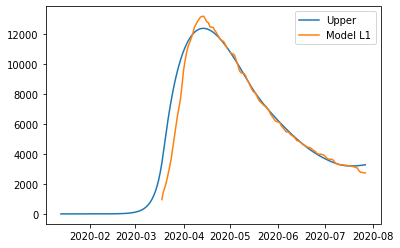

{'home': 0.9998450391982344, 'leisure': 0.8050402866265994, 'other': 0.8, 'school': 0.8813377885873195, 'transport': 0.8366466683008039, 'work': 0.8}
{'home': 0.9998450391982344, 'leisure': 0.10348522681271134, 'other': 0.07852986167185332, 'school': 0, 'transport': 0.11215606583842515, 'work': 0.4279987692035463}
{'home': 0.9998450391982344, 'leisure': 0.10348522681271134, 'other': 0.07852986167185332, 'school': 0, 'transport': 0.11215606583842515, 'work': 0.4279987692035463}
{'home': 0.9998450391982344, 'leisure': 0.12346383154009226, 'other': 0.18710806163799942, 'school': 0.29084147023381546, 'transport': 0.19549473878108056, 'work': 0.7718423449288148}
{'home': 0.9998450391982344, 'leisure': 0.23788567319262366, 'other': 0.2572582357421079, 'school': 0.5904963183535041, 'transport': 0.25839686623625807, 'work': 0.7718558233362773}
{'home': 0.9998450391982344, 'leisure': 0.39351464938636255, 'other': 0.36561161232320133, 'school': 0.5904963183535041, 'transport': 0.4266862544579839

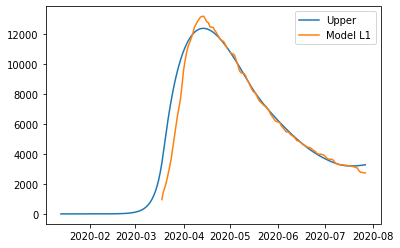

{'home': 0.9998450391982344, 'leisure': 0.8050402866265994, 'other': 0.8, 'school': 0.8813377885873195, 'transport': 0.8366466683008039, 'work': 0.8}
{'home': 0.9998450391982344, 'leisure': 0.10348522681271134, 'other': 0.07852986167185332, 'school': 0, 'transport': 0.11215606583842515, 'work': 0.4279987692035463}
{'home': 0.9998450391982344, 'leisure': 0.10348522681271134, 'other': 0.07852986167185332, 'school': 0, 'transport': 0.11215606583842515, 'work': 0.4279987692035463}
{'home': 0.9998450391982344, 'leisure': 0.12346383154009226, 'other': 0.18710806163799942, 'school': 0.29084147023381546, 'transport': 0.19549473878108056, 'work': 0.7718423449288148}
{'home': 0.9998450391982344, 'leisure': 0.23788567319262366, 'other': 0.2572582357421079, 'school': 0.5904963183535041, 'transport': 0.25839686623625807, 'work': 0.7718558233362773}
{'home': 0.9998450391982344, 'leisure': 0.39351464938636255, 'other': 0.36561161232320133, 'school': 0.5904963183535041, 'transport': 0.4266862544579839

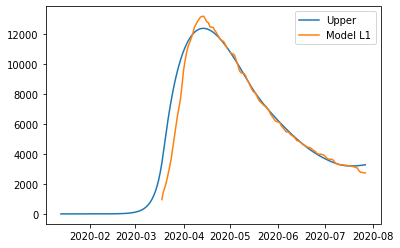

{'home': 0.9998450391982344, 'leisure': 0.8050402866265994, 'other': 0.8, 'school': 0.8813377885873195, 'transport': 0.8366466683008039, 'work': 0.8}
{'home': 0.9998450391982344, 'leisure': 0.10348522681271134, 'other': 0.07852986167185332, 'school': 0, 'transport': 0.11215606583842515, 'work': 0.4279987692035463}
{'home': 0.9998450391982344, 'leisure': 0.10348522681271134, 'other': 0.07852986167185332, 'school': 0, 'transport': 0.11215606583842515, 'work': 0.4279987692035463}
{'home': 0.9998450391982344, 'leisure': 0.12346383154009226, 'other': 0.18710806163799942, 'school': 0.29084147023381546, 'transport': 0.19549473878108056, 'work': 0.7718423449288148}
{'home': 0.9998450391982344, 'leisure': 0.23788567319262366, 'other': 0.2572582357421079, 'school': 0.5904963183535041, 'transport': 0.25839686623625807, 'work': 0.7718558233362773}
{'home': 0.9998450391982344, 'leisure': 0.39351464938636255, 'other': 0.36561161232320133, 'school': 0.5904963183535041, 'transport': 0.4266862544579839

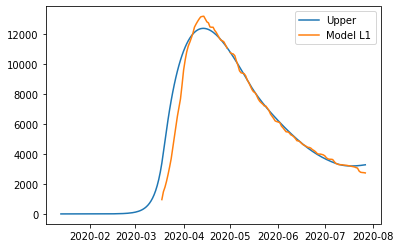

{'home': 0.9998446056279051, 'leisure': 0.8049979243550832, 'other': 0.8, 'school': 0.8813064261830306, 'transport': 0.8366212437629861, 'work': 0.8}
{'home': 0.9998446056279051, 'leisure': 0.10348058911367969, 'other': 0.07853460656437133, 'school': 0, 'transport': 0.11215417672032095, 'work': 0.42800397438440874}
{'home': 0.9998446056279051, 'leisure': 0.10348058911367969, 'other': 0.07853460656437133, 'school': 0, 'transport': 0.11215417672032095, 'work': 0.42800397438440874}
{'home': 0.9998446056279051, 'leisure': 0.12345771799713681, 'other': 0.18711876609278785, 'school': 0.2908311206404001, 'transport': 0.1954915351500175, 'work': 0.7718783628175357}
{'home': 0.9998446056279051, 'leisure': 0.2378741925717001, 'other': 0.25726760978997665, 'school': 0.5904753055426305, 'transport': 0.2583922611669014, 'work': 0.7718912561571653}
{'home': 0.9998446056279051, 'leisure': 0.39349434127969557, 'other': 0.36561279577811057, 'school': 0.5904753055426305, 'transport': 0.4266781169232814,

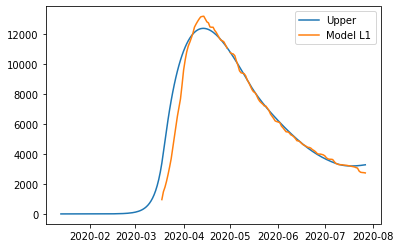

{'home': 0.9998446056279051, 'leisure': 0.8049979243550832, 'other': 0.8, 'school': 0.8813064261830306, 'transport': 0.8366212437629861, 'work': 0.8}
{'home': 0.9998446056279051, 'leisure': 0.10348058911367969, 'other': 0.07853460656437133, 'school': 0, 'transport': 0.11215417672032095, 'work': 0.42800397438440874}
{'home': 0.9998446056279051, 'leisure': 0.10348058911367969, 'other': 0.07853460656437133, 'school': 0, 'transport': 0.11215417672032095, 'work': 0.42800397438440874}
{'home': 0.9998446056279051, 'leisure': 0.12345771799713681, 'other': 0.18711876609278785, 'school': 0.2908311206404001, 'transport': 0.1954915351500175, 'work': 0.7718783628175357}
{'home': 0.9998446056279051, 'leisure': 0.2378741925717001, 'other': 0.25726760978997665, 'school': 0.5904753055426305, 'transport': 0.2583922611669014, 'work': 0.7718912561571653}
{'home': 0.9998446056279051, 'leisure': 0.39349434127969557, 'other': 0.36561279577811057, 'school': 0.5904753055426305, 'transport': 0.4266781169232814,

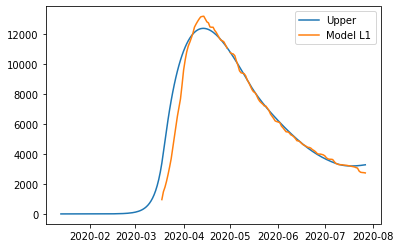

{'home': 0.9998446056279051, 'leisure': 0.8049979243550832, 'other': 0.8, 'school': 0.8813064261830306, 'transport': 0.8366212437629861, 'work': 0.8}
{'home': 0.9998446056279051, 'leisure': 0.10348058911367969, 'other': 0.07853460656437133, 'school': 0, 'transport': 0.11215417672032095, 'work': 0.42800397438440874}
{'home': 0.9998446056279051, 'leisure': 0.10348058911367969, 'other': 0.07853460656437133, 'school': 0, 'transport': 0.11215417672032095, 'work': 0.42800397438440874}
{'home': 0.9998446056279051, 'leisure': 0.12345771799713681, 'other': 0.18711876609278785, 'school': 0.2908311206404001, 'transport': 0.1954915351500175, 'work': 0.7718783628175357}
{'home': 0.9998446056279051, 'leisure': 0.2378741925717001, 'other': 0.25726760978997665, 'school': 0.5904753055426305, 'transport': 0.2583922611669014, 'work': 0.7718912561571653}
{'home': 0.9998446056279051, 'leisure': 0.39349434127969557, 'other': 0.36561279577811057, 'school': 0.5904753055426305, 'transport': 0.4266781169232814,

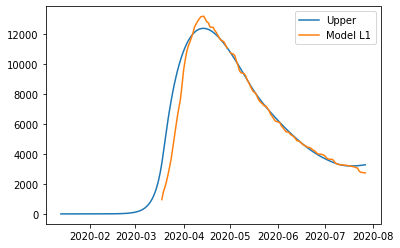

{'home': 0.9998446953666731, 'leisure': 0.8050061909429657, 'other': 0.8, 'school': 0.8813125507268745, 'transport': 0.8366261981193593, 'work': 0.8}
{'home': 0.9998446953666731, 'leisure': 0.1034814947217716, 'other': 0.0785336840965904, 'school': 0, 'transport': 0.11215454538820441, 'work': 0.4280029629301318}
{'home': 0.9998446953666731, 'leisure': 0.1034814947217716, 'other': 0.0785336840965904, 'school': 0, 'transport': 0.11215454538820441, 'work': 0.4280029629301318}
{'home': 0.9998446953666731, 'leisure': 0.12345891155948012, 'other': 0.18711668477009746, 'school': 0.29083314173986863, 'transport': 0.19549216041959266, 'work': 0.7718713504088375}
{'home': 0.9998446953666731, 'leisure': 0.23787643401501699, 'other': 0.2572657880586782, 'school': 0.590479408987006, 'transport': 0.2583931597442172, 'work': 0.771884358231572}
{'home': 0.9998446953666731, 'leisure': 0.39349830490949944, 'other': 0.3656125674384004, 'school': 0.590479408987006, 'transport': 0.4266797044053998, 'work':

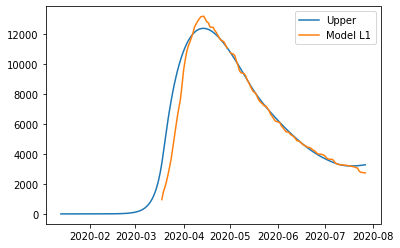

{'home': 0.9998446953666731, 'leisure': 0.8050061909429657, 'other': 0.8, 'school': 0.8813125507268745, 'transport': 0.8366261981193593, 'work': 0.8}
{'home': 0.9998446953666731, 'leisure': 0.1034814947217716, 'other': 0.0785336840965904, 'school': 0, 'transport': 0.11215454538820441, 'work': 0.4280029629301318}
{'home': 0.9998446953666731, 'leisure': 0.1034814947217716, 'other': 0.0785336840965904, 'school': 0, 'transport': 0.11215454538820441, 'work': 0.4280029629301318}
{'home': 0.9998446953666731, 'leisure': 0.12345891155948012, 'other': 0.18711668477009746, 'school': 0.29083314173986863, 'transport': 0.19549216041959266, 'work': 0.7718713504088375}
{'home': 0.9998446953666731, 'leisure': 0.23787643401501699, 'other': 0.2572657880586782, 'school': 0.590479408987006, 'transport': 0.2583931597442172, 'work': 0.771884358231572}
{'home': 0.9998446953666731, 'leisure': 0.39349830490949944, 'other': 0.3656125674384004, 'school': 0.590479408987006, 'transport': 0.4266797044053998, 'work':

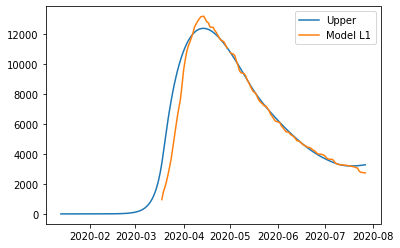

{'home': 0.9998446953666731, 'leisure': 0.8050061909429657, 'other': 0.8, 'school': 0.8813125507268745, 'transport': 0.8366261981193593, 'work': 0.8}
{'home': 0.9998446953666731, 'leisure': 0.1034814947217716, 'other': 0.0785336840965904, 'school': 0, 'transport': 0.11215454538820441, 'work': 0.4280029629301318}
{'home': 0.9998446953666731, 'leisure': 0.1034814947217716, 'other': 0.0785336840965904, 'school': 0, 'transport': 0.11215454538820441, 'work': 0.4280029629301318}
{'home': 0.9998446953666731, 'leisure': 0.12345891155948012, 'other': 0.18711668477009746, 'school': 0.29083314173986863, 'transport': 0.19549216041959266, 'work': 0.7718713504088375}
{'home': 0.9998446953666731, 'leisure': 0.23787643401501699, 'other': 0.2572657880586782, 'school': 0.590479408987006, 'transport': 0.2583931597442172, 'work': 0.771884358231572}
{'home': 0.9998446953666731, 'leisure': 0.39349830490949944, 'other': 0.3656125674384004, 'school': 0.590479408987006, 'transport': 0.4266797044053998, 'work':

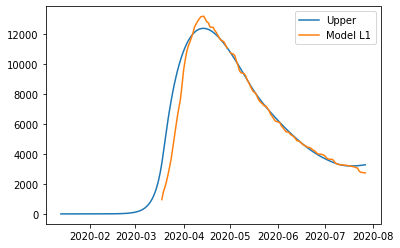

{'home': 0.9998446953666731, 'leisure': 0.8050061909429657, 'other': 0.8, 'school': 0.8813125507268745, 'transport': 0.8366261981193593, 'work': 0.8}
{'home': 0.9998446953666731, 'leisure': 0.1034814947217716, 'other': 0.0785336840965904, 'school': 0, 'transport': 0.11215454538820441, 'work': 0.4280029629301318}
{'home': 0.9998446953666731, 'leisure': 0.1034814947217716, 'other': 0.0785336840965904, 'school': 0, 'transport': 0.11215454538820441, 'work': 0.4280029629301318}
{'home': 0.9998446953666731, 'leisure': 0.12345891155948012, 'other': 0.18711668477009746, 'school': 0.29083314173986863, 'transport': 0.19549216041959266, 'work': 0.7718713504088375}
{'home': 0.9998446953666731, 'leisure': 0.23787643401501699, 'other': 0.2572657880586782, 'school': 0.590479408987006, 'transport': 0.2583931597442172, 'work': 0.771884358231572}
{'home': 0.9998446953666731, 'leisure': 0.39349830490949944, 'other': 0.3656125674384004, 'school': 0.590479408987006, 'transport': 0.4266797044053998, 'work':

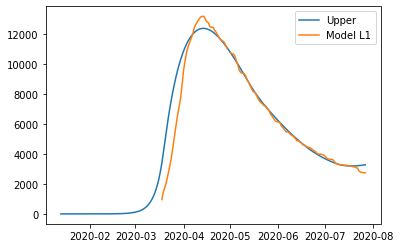

{'home': 0.9998446765277784, 'leisure': 0.8050044555349438, 'other': 0.8, 'school': 0.881311264998994, 'transport': 0.8366251580493915, 'work': 0.8}
{'home': 0.9998446765277784, 'leisure': 0.10348130460738607, 'other': 0.07853387775050569, 'school': 0, 'transport': 0.11215446799399885, 'work': 0.4280031752652755}
{'home': 0.9998446765277784, 'leisure': 0.10348130460738607, 'other': 0.07853387775050569, 'school': 0, 'transport': 0.11215446799399885, 'work': 0.4280031752652755}
{'home': 0.9998446765277784, 'leisure': 0.12345866099460126, 'other': 0.18711712170274306, 'school': 0.29083271744966804, 'transport': 0.19549202915720418, 'work': 0.7718728225275904}
{'home': 0.9998446765277784, 'leisure': 0.2378759634682986, 'other': 0.2572661704952314, 'school': 0.590478547549326, 'transport': 0.25839297110635806, 'work': 0.7718858063168247}
{'home': 0.9998446765277784, 'leisure': 0.39349747282328223, 'other': 0.3656126153738187, 'school': 0.590478547549326, 'transport': 0.4266793711458896, 'wo

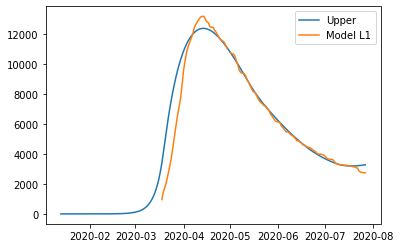

{'home': 0.9998446765277784, 'leisure': 0.8050044555349438, 'other': 0.8, 'school': 0.881311264998994, 'transport': 0.8366251580493915, 'work': 0.8}
{'home': 0.9998446765277784, 'leisure': 0.10348130460738607, 'other': 0.07853387775050569, 'school': 0, 'transport': 0.11215446799399885, 'work': 0.4280031752652755}
{'home': 0.9998446765277784, 'leisure': 0.10348130460738607, 'other': 0.07853387775050569, 'school': 0, 'transport': 0.11215446799399885, 'work': 0.4280031752652755}
{'home': 0.9998446765277784, 'leisure': 0.12345866099460126, 'other': 0.18711712170274306, 'school': 0.29083271744966804, 'transport': 0.19549202915720418, 'work': 0.7718728225275904}
{'home': 0.9998446765277784, 'leisure': 0.2378759634682986, 'other': 0.2572661704952314, 'school': 0.590478547549326, 'transport': 0.25839297110635806, 'work': 0.7718858063168247}
{'home': 0.9998446765277784, 'leisure': 0.39349747282328223, 'other': 0.3656126153738187, 'school': 0.590478547549326, 'transport': 0.4266793711458896, 'wo

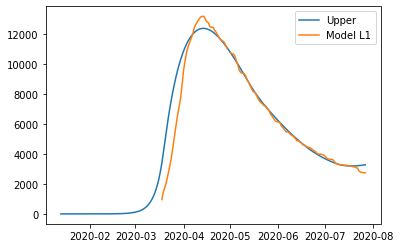

{'home': 0.9998446765277784, 'leisure': 0.8050044555349438, 'other': 0.8, 'school': 0.881311264998994, 'transport': 0.8366251580493915, 'work': 0.8}
{'home': 0.9998446765277784, 'leisure': 0.10348130460738607, 'other': 0.07853387775050569, 'school': 0, 'transport': 0.11215446799399885, 'work': 0.4280031752652755}
{'home': 0.9998446765277784, 'leisure': 0.10348130460738607, 'other': 0.07853387775050569, 'school': 0, 'transport': 0.11215446799399885, 'work': 0.4280031752652755}
{'home': 0.9998446765277784, 'leisure': 0.12345866099460126, 'other': 0.18711712170274306, 'school': 0.29083271744966804, 'transport': 0.19549202915720418, 'work': 0.7718728225275904}
{'home': 0.9998446765277784, 'leisure': 0.2378759634682986, 'other': 0.2572661704952314, 'school': 0.590478547549326, 'transport': 0.25839297110635806, 'work': 0.7718858063168247}
{'home': 0.9998446765277784, 'leisure': 0.39349747282328223, 'other': 0.3656126153738187, 'school': 0.590478547549326, 'transport': 0.4266793711458896, 'wo

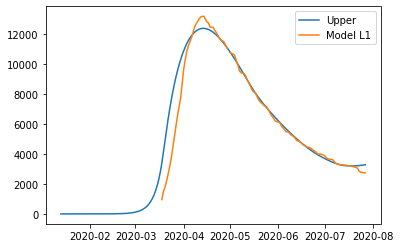

{'home': 0.9998438585202462, 'leisure': 0.8050237886348327, 'other': 0.8, 'school': 0.881328211135741, 'transport': 0.8366370613315807, 'work': 0.8}
{'home': 0.9998438585202462, 'leisure': 0.1034832397417484, 'other': 0.07853092770875873, 'school': 0, 'transport': 0.11215514071378262, 'work': 0.4279993787898949}
{'home': 0.9998438585202462, 'leisure': 0.1034832397417484, 'other': 0.07853092770875873, 'school': 0, 'transport': 0.11215514071378262, 'work': 0.4279993787898949}
{'home': 0.9998438585202462, 'leisure': 0.12346122227301845, 'other': 0.1871105075745647, 'school': 0.29083830967479457, 'transport': 0.19549314350155964, 'work': 0.7718531949735654}
{'home': 0.9998438585202462, 'leisure': 0.2378807961467993, 'other': 0.2572600763071431, 'school': 0.5904899014609465, 'transport': 0.2583946514899064, 'work': 0.7718664937270292}
{'home': 0.9998438585202462, 'leisure': 0.3935063276953958, 'other': 0.3656110250887843, 'school': 0.5904899014609465, 'transport': 0.4266824713846333, 'work'

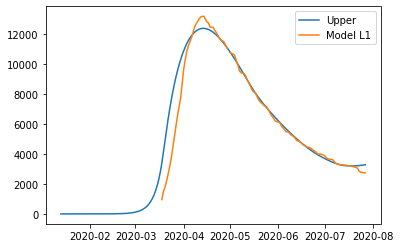

{'home': 0.9998438585202462, 'leisure': 0.8050237886348327, 'other': 0.8, 'school': 0.881328211135741, 'transport': 0.8366370613315807, 'work': 0.8}
{'home': 0.9998438585202462, 'leisure': 0.1034832397417484, 'other': 0.07853092770875873, 'school': 0, 'transport': 0.11215514071378262, 'work': 0.4279993787898949}
{'home': 0.9998438585202462, 'leisure': 0.1034832397417484, 'other': 0.07853092770875873, 'school': 0, 'transport': 0.11215514071378262, 'work': 0.4279993787898949}
{'home': 0.9998438585202462, 'leisure': 0.12346122227301845, 'other': 0.1871105075745647, 'school': 0.29083830967479457, 'transport': 0.19549314350155964, 'work': 0.7718531949735654}
{'home': 0.9998438585202462, 'leisure': 0.2378807961467993, 'other': 0.2572600763071431, 'school': 0.5904899014609465, 'transport': 0.2583946514899064, 'work': 0.7718664937270292}
{'home': 0.9998438585202462, 'leisure': 0.3935063276953958, 'other': 0.3656110250887843, 'school': 0.5904899014609465, 'transport': 0.4266824713846333, 'work'

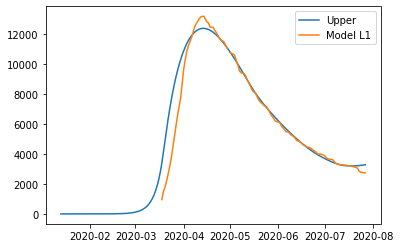

{'home': 0.9998438585202462, 'leisure': 0.8050237886348327, 'other': 0.8, 'school': 0.881328211135741, 'transport': 0.8366370613315807, 'work': 0.8}
{'home': 0.9998438585202462, 'leisure': 0.1034832397417484, 'other': 0.07853092770875873, 'school': 0, 'transport': 0.11215514071378262, 'work': 0.4279993787898949}
{'home': 0.9998438585202462, 'leisure': 0.1034832397417484, 'other': 0.07853092770875873, 'school': 0, 'transport': 0.11215514071378262, 'work': 0.4279993787898949}
{'home': 0.9998438585202462, 'leisure': 0.12346122227301845, 'other': 0.1871105075745647, 'school': 0.29083830967479457, 'transport': 0.19549314350155964, 'work': 0.7718531949735654}
{'home': 0.9998438585202462, 'leisure': 0.2378807961467993, 'other': 0.2572600763071431, 'school': 0.5904899014609465, 'transport': 0.2583946514899064, 'work': 0.7718664937270292}
{'home': 0.9998438585202462, 'leisure': 0.3935063276953958, 'other': 0.3656110250887843, 'school': 0.5904899014609465, 'transport': 0.4266824713846333, 'work'

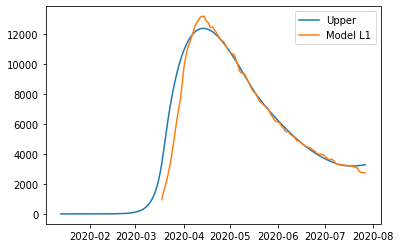

{'home': 0.9998389975703031, 'leisure': 0.8051631619959821, 'other': 0.8, 'school': 0.881447553750991, 'transport': 0.8367226467166896, 'work': 0.8}
{'home': 0.9998389975703031, 'leisure': 0.10349737474651353, 'other': 0.07851044390565083, 'school': 0, 'transport': 0.11216019017789475, 'work': 0.42797344901203327}
{'home': 0.9998389975703031, 'leisure': 0.10349737474651353, 'other': 0.07851044390565083, 'school': 0, 'transport': 0.11216019017789475, 'work': 0.42797344901203327}
{'home': 0.9998389975703031, 'leisure': 0.12347992228199402, 'other': 0.18706455296870889, 'school': 0.29087769273782704, 'transport': 0.19550154264744232, 'work': 0.7717148555450075}
{'home': 0.9998389975703031, 'leisure': 0.2379160529045266, 'other': 0.2572179638238003, 'school': 0.590569861013164, 'transport': 0.25840721144309875, 'work': 0.771730378547663}
{'home': 0.9998389975703031, 'leisure': 0.39357059629876157, 'other': 0.36560064060934233, 'school': 0.590569861013164, 'transport': 0.42670547646625245, 

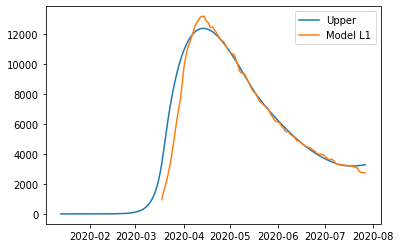

{'home': 0.9998389975703031, 'leisure': 0.8051631619959821, 'other': 0.8, 'school': 0.881447553750991, 'transport': 0.8367226467166896, 'work': 0.8}
{'home': 0.9998389975703031, 'leisure': 0.10349737474651353, 'other': 0.07851044390565083, 'school': 0, 'transport': 0.11216019017789475, 'work': 0.42797344901203327}
{'home': 0.9998389975703031, 'leisure': 0.10349737474651353, 'other': 0.07851044390565083, 'school': 0, 'transport': 0.11216019017789475, 'work': 0.42797344901203327}
{'home': 0.9998389975703031, 'leisure': 0.12347992228199402, 'other': 0.18706455296870889, 'school': 0.29087769273782704, 'transport': 0.19550154264744232, 'work': 0.7717148555450075}
{'home': 0.9998389975703031, 'leisure': 0.2379160529045266, 'other': 0.2572179638238003, 'school': 0.590569861013164, 'transport': 0.25840721144309875, 'work': 0.771730378547663}
{'home': 0.9998389975703031, 'leisure': 0.39357059629876157, 'other': 0.36560064060934233, 'school': 0.590569861013164, 'transport': 0.42670547646625245, 

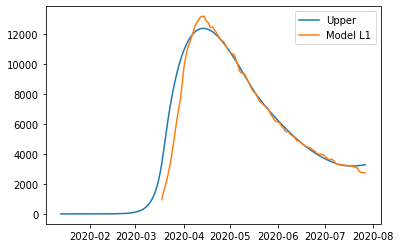

{'home': 0.9998389975703031, 'leisure': 0.8051631619959821, 'other': 0.8, 'school': 0.881447553750991, 'transport': 0.8367226467166896, 'work': 0.8}
{'home': 0.9998389975703031, 'leisure': 0.10349737474651353, 'other': 0.07851044390565083, 'school': 0, 'transport': 0.11216019017789475, 'work': 0.42797344901203327}
{'home': 0.9998389975703031, 'leisure': 0.10349737474651353, 'other': 0.07851044390565083, 'school': 0, 'transport': 0.11216019017789475, 'work': 0.42797344901203327}
{'home': 0.9998389975703031, 'leisure': 0.12347992228199402, 'other': 0.18706455296870889, 'school': 0.29087769273782704, 'transport': 0.19550154264744232, 'work': 0.7717148555450075}
{'home': 0.9998389975703031, 'leisure': 0.2379160529045266, 'other': 0.2572179638238003, 'school': 0.590569861013164, 'transport': 0.25840721144309875, 'work': 0.771730378547663}
{'home': 0.9998389975703031, 'leisure': 0.39357059629876157, 'other': 0.36560064060934233, 'school': 0.590569861013164, 'transport': 0.42670547646625245, 

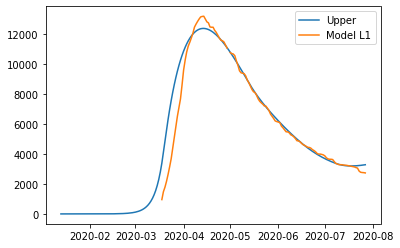

{'home': 0.9998195537705311, 'leisure': 0.8057206554405799, 'other': 0.8, 'school': 0.8819249242119912, 'transport': 0.8370649882571254, 'work': 0.8}
{'home': 0.9998195537705311, 'leisure': 0.10355390098439766, 'other': 0.07842851167210205, 'school': 0, 'transport': 0.11218036938724218, 'work': 0.42786972107131693}
{'home': 0.9998195537705311, 'leisure': 0.10355390098439766, 'other': 0.07842851167210205, 'school': 0, 'transport': 0.11218036938724218, 'work': 0.42786972107131693}
{'home': 0.9998195537705311, 'leisure': 0.12355471256875213, 'other': 0.1868807412282921, 'school': 0.2910352249899571, 'transport': 0.19553510555991613, 'work': 0.7711614507252371}
{'home': 0.9998195537705311, 'leisure': 0.2380570583308442, 'other': 0.25704952001468984, 'school': 0.5908896992220342, 'transport': 0.25845741098418185, 'work': 0.7711858714820317}
{'home': 0.9998195537705311, 'leisure': 0.3938276566469253, 'other': 0.3655591042017502, 'school': 0.5908896992220342, 'transport': 0.4267974368679928, 

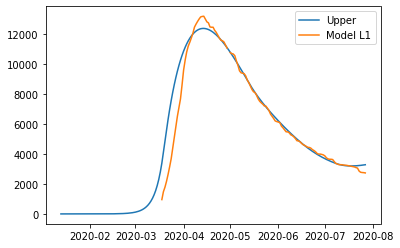

{'home': 0.9998195537705311, 'leisure': 0.8057206554405799, 'other': 0.8, 'school': 0.8819249242119912, 'transport': 0.8370649882571254, 'work': 0.8}
{'home': 0.9998195537705311, 'leisure': 0.10355390098439766, 'other': 0.07842851167210205, 'school': 0, 'transport': 0.11218036938724218, 'work': 0.42786972107131693}
{'home': 0.9998195537705311, 'leisure': 0.10355390098439766, 'other': 0.07842851167210205, 'school': 0, 'transport': 0.11218036938724218, 'work': 0.42786972107131693}
{'home': 0.9998195537705311, 'leisure': 0.12355471256875213, 'other': 0.1868807412282921, 'school': 0.2910352249899571, 'transport': 0.19553510555991613, 'work': 0.7711614507252371}
{'home': 0.9998195537705311, 'leisure': 0.2380570583308442, 'other': 0.25704952001468984, 'school': 0.5908896992220342, 'transport': 0.25845741098418185, 'work': 0.7711858714820317}
{'home': 0.9998195537705311, 'leisure': 0.3938276566469253, 'other': 0.3655591042017502, 'school': 0.5908896992220342, 'transport': 0.4267974368679928, 

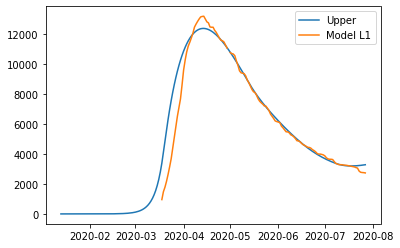

{'home': 0.9998195537705311, 'leisure': 0.8057206554405799, 'other': 0.8, 'school': 0.8819249242119912, 'transport': 0.8370649882571254, 'work': 0.8}
{'home': 0.9998195537705311, 'leisure': 0.10355390098439766, 'other': 0.07842851167210205, 'school': 0, 'transport': 0.11218036938724218, 'work': 0.42786972107131693}
{'home': 0.9998195537705311, 'leisure': 0.10355390098439766, 'other': 0.07842851167210205, 'school': 0, 'transport': 0.11218036938724218, 'work': 0.42786972107131693}
{'home': 0.9998195537705311, 'leisure': 0.12355471256875213, 'other': 0.1868807412282921, 'school': 0.2910352249899571, 'transport': 0.19553510555991613, 'work': 0.7711614507252371}
{'home': 0.9998195537705311, 'leisure': 0.2380570583308442, 'other': 0.25704952001468984, 'school': 0.5908896992220342, 'transport': 0.25845741098418185, 'work': 0.7711858714820317}
{'home': 0.9998195537705311, 'leisure': 0.3938276566469253, 'other': 0.3655591042017502, 'school': 0.5908896992220342, 'transport': 0.4267974368679928, 

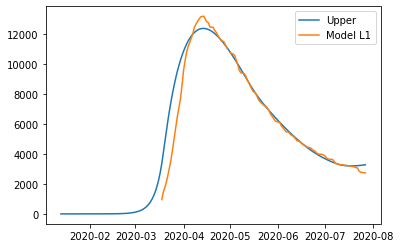

{'home': 0.9998195537705311, 'leisure': 0.8057206554405799, 'other': 0.8, 'school': 0.8819249242119912, 'transport': 0.8370649882571254, 'work': 0.8}
{'home': 0.9998195537705311, 'leisure': 0.10355390098439766, 'other': 0.07842851167210205, 'school': 0, 'transport': 0.11218036938724218, 'work': 0.42786972107131693}
{'home': 0.9998195537705311, 'leisure': 0.10355390098439766, 'other': 0.07842851167210205, 'school': 0, 'transport': 0.11218036938724218, 'work': 0.42786972107131693}
{'home': 0.9998195537705311, 'leisure': 0.12355471256875213, 'other': 0.1868807412282921, 'school': 0.2910352249899571, 'transport': 0.19553510555991613, 'work': 0.7711614507252371}
{'home': 0.9998195537705311, 'leisure': 0.2380570583308442, 'other': 0.25704952001468984, 'school': 0.5908896992220342, 'transport': 0.25845741098418185, 'work': 0.7711858714820317}
{'home': 0.9998195537705311, 'leisure': 0.3938276566469253, 'other': 0.3655591042017502, 'school': 0.5908896992220342, 'transport': 0.4267974368679928, 

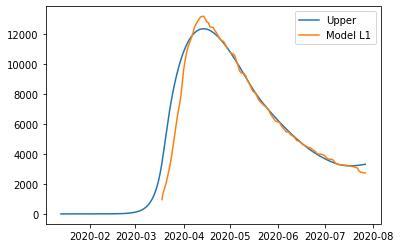

{'home': 0.9994846386794771, 'leisure': 0.8154333787167678, 'other': 0.8, 'school': 0.8903645399561947, 'transport': 0.8430003271044801, 'work': 0.8}
{'home': 0.9994846386794771, 'leisure': 0.10453305782718153, 'other': 0.07699339965786499, 'school': 0, 'transport': 0.11252111785622862, 'work': 0.42603004060846034}
{'home': 0.9994846386794771, 'leisure': 0.10453305782718153, 'other': 0.07699339965786499, 'school': 0, 'transport': 0.11252111785622862, 'work': 0.42603004060846034}
{'home': 0.9994846386794771, 'leisure': 0.12485145633889146, 'other': 0.18366128431830495, 'school': 0.2938202981855443, 'transport': 0.19610043625954232, 'work': 0.7614830920844885}
{'home': 0.9994846386794771, 'leisure': 0.24050223405341145, 'other': 0.2540955106418887, 'school': 0.5965442417706505, 'transport': 0.259307717976067, 'work': 0.7616696247286497}
{'home': 0.9994846386794771, 'leisure': 0.39829600439169105, 'other': 0.3648168081112191, 'school': 0.5965442417706505, 'transport': 0.42836205840903024,

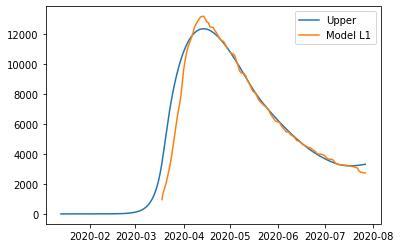

{'home': 0.9994846386794771, 'leisure': 0.8154333787167678, 'other': 0.8, 'school': 0.8903645399561947, 'transport': 0.8430003271044801, 'work': 0.8}
{'home': 0.9994846386794771, 'leisure': 0.10453305782718153, 'other': 0.07699339965786499, 'school': 0, 'transport': 0.11252111785622862, 'work': 0.42603004060846034}
{'home': 0.9994846386794771, 'leisure': 0.10453305782718153, 'other': 0.07699339965786499, 'school': 0, 'transport': 0.11252111785622862, 'work': 0.42603004060846034}
{'home': 0.9994846386794771, 'leisure': 0.12485145633889146, 'other': 0.18366128431830495, 'school': 0.2938202981855443, 'transport': 0.19610043625954232, 'work': 0.7614830920844885}
{'home': 0.9994846386794771, 'leisure': 0.24050223405341145, 'other': 0.2540955106418887, 'school': 0.5965442417706505, 'transport': 0.259307717976067, 'work': 0.7616696247286497}
{'home': 0.9994846386794771, 'leisure': 0.39829600439169105, 'other': 0.3648168081112191, 'school': 0.5965442417706505, 'transport': 0.42836205840903024,

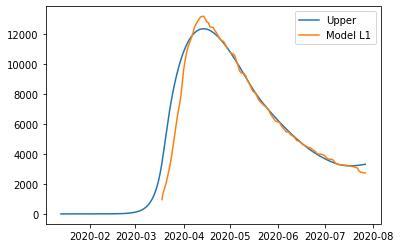

{'home': 0.9994846386794771, 'leisure': 0.8154333787167678, 'other': 0.8, 'school': 0.8903645399561947, 'transport': 0.8430003271044801, 'work': 0.8}
{'home': 0.9994846386794771, 'leisure': 0.10453305782718153, 'other': 0.07699339965786499, 'school': 0, 'transport': 0.11252111785622862, 'work': 0.42603004060846034}
{'home': 0.9994846386794771, 'leisure': 0.10453305782718153, 'other': 0.07699339965786499, 'school': 0, 'transport': 0.11252111785622862, 'work': 0.42603004060846034}
{'home': 0.9994846386794771, 'leisure': 0.12485145633889146, 'other': 0.18366128431830495, 'school': 0.2938202981855443, 'transport': 0.19610043625954232, 'work': 0.7614830920844885}
{'home': 0.9994846386794771, 'leisure': 0.24050223405341145, 'other': 0.2540955106418887, 'school': 0.5965442417706505, 'transport': 0.259307717976067, 'work': 0.7616696247286497}
{'home': 0.9994846386794771, 'leisure': 0.39829600439169105, 'other': 0.3648168081112191, 'school': 0.5965442417706505, 'transport': 0.42836205840903024,

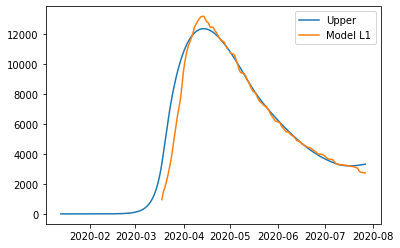

{'home': 0.9993559980804111, 'leisure': 0.8191567889956656, 'other': 0.8, 'school': 0.8935888406013733, 'transport': 0.8452809117165877, 'work': 0.8}
{'home': 0.9993559980804111, 'leisure': 0.10490665144517407, 'other': 0.07644447805514831, 'school': 0, 'transport': 0.1126500599776359, 'work': 0.42532995626536413}
{'home': 0.9993559980804111, 'leisure': 0.10490665144517407, 'other': 0.07644447805514831, 'school': 0, 'transport': 0.1126500599776359, 'work': 0.42532995626536413}
{'home': 0.9993559980804111, 'leisure': 0.12534748572046467, 'other': 0.1824297758665828, 'school': 0.2948843173984532, 'transport': 0.19631409770342187, 'work': 0.7577703504247596}
{'home': 0.9993559980804111, 'leisure': 0.2414369740424716, 'other': 0.25296584958255064, 'school': 0.5987045232029202, 'transport': 0.25963016273073114, 'work': 0.7580174194824407}
{'home': 0.9993559980804111, 'leisure': 0.40000703198898085, 'other': 0.3645340341975058, 'school': 0.5987045232029202, 'transport': 0.42895679533779674, 

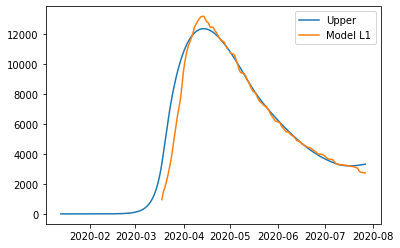

{'home': 0.9993559980804111, 'leisure': 0.8191567889956656, 'other': 0.8, 'school': 0.8935888406013733, 'transport': 0.8452809117165877, 'work': 0.8}
{'home': 0.9993559980804111, 'leisure': 0.10490665144517407, 'other': 0.07644447805514831, 'school': 0, 'transport': 0.1126500599776359, 'work': 0.42532995626536413}
{'home': 0.9993559980804111, 'leisure': 0.10490665144517407, 'other': 0.07644447805514831, 'school': 0, 'transport': 0.1126500599776359, 'work': 0.42532995626536413}
{'home': 0.9993559980804111, 'leisure': 0.12534748572046467, 'other': 0.1824297758665828, 'school': 0.2948843173984532, 'transport': 0.19631409770342187, 'work': 0.7577703504247596}
{'home': 0.9993559980804111, 'leisure': 0.2414369740424716, 'other': 0.25296584958255064, 'school': 0.5987045232029202, 'transport': 0.25963016273073114, 'work': 0.7580174194824407}
{'home': 0.9993559980804111, 'leisure': 0.40000703198898085, 'other': 0.3645340341975058, 'school': 0.5987045232029202, 'transport': 0.42895679533779674, 

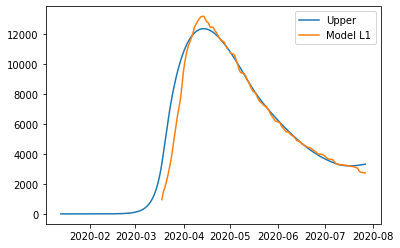

{'home': 0.9993559980804111, 'leisure': 0.8191567889956656, 'other': 0.8, 'school': 0.8935888406013733, 'transport': 0.8452809117165877, 'work': 0.8}
{'home': 0.9993559980804111, 'leisure': 0.10490665144517407, 'other': 0.07644447805514831, 'school': 0, 'transport': 0.1126500599776359, 'work': 0.42532995626536413}
{'home': 0.9993559980804111, 'leisure': 0.10490665144517407, 'other': 0.07644447805514831, 'school': 0, 'transport': 0.1126500599776359, 'work': 0.42532995626536413}
{'home': 0.9993559980804111, 'leisure': 0.12534748572046467, 'other': 0.1824297758665828, 'school': 0.2948843173984532, 'transport': 0.19631409770342187, 'work': 0.7577703504247596}
{'home': 0.9993559980804111, 'leisure': 0.2414369740424716, 'other': 0.25296584958255064, 'school': 0.5987045232029202, 'transport': 0.25963016273073114, 'work': 0.7580174194824407}
{'home': 0.9993559980804111, 'leisure': 0.40000703198898085, 'other': 0.3645340341975058, 'school': 0.5987045232029202, 'transport': 0.42895679533779674, 

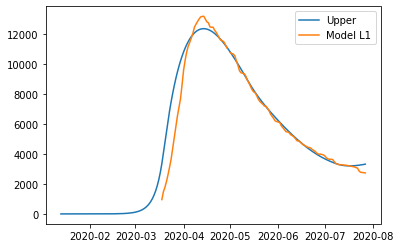

{'home': 0.9993559980804111, 'leisure': 0.8191567889956656, 'other': 0.8, 'school': 0.8935888406013733, 'transport': 0.8452809117165877, 'work': 0.8}
{'home': 0.9993559980804111, 'leisure': 0.10490665144517407, 'other': 0.07644447805514831, 'school': 0, 'transport': 0.1126500599776359, 'work': 0.42532995626536413}
{'home': 0.9993559980804111, 'leisure': 0.10490665144517407, 'other': 0.07644447805514831, 'school': 0, 'transport': 0.1126500599776359, 'work': 0.42532995626536413}
{'home': 0.9993559980804111, 'leisure': 0.12534748572046467, 'other': 0.1824297758665828, 'school': 0.2948843173984532, 'transport': 0.19631409770342187, 'work': 0.7577703504247596}
{'home': 0.9993559980804111, 'leisure': 0.2414369740424716, 'other': 0.25296584958255064, 'school': 0.5987045232029202, 'transport': 0.25963016273073114, 'work': 0.7580174194824407}
{'home': 0.9993559980804111, 'leisure': 0.40000703198898085, 'other': 0.3645340341975058, 'school': 0.5987045232029202, 'transport': 0.42895679533779674, 

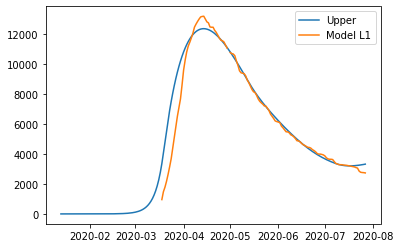

{'home': 0.9993498879479648, 'leisure': 0.8193728631330498, 'other': 0.8, 'school': 0.8937683804556432, 'transport': 0.8454190484352853, 'work': 0.8}
{'home': 0.9993498879479648, 'leisure': 0.10492822740033493, 'other': 0.0764126990806439, 'school': 0, 'transport': 0.11265812014262903, 'work': 0.42529480124568075}
{'home': 0.9993498879479648, 'leisure': 0.10492822740033493, 'other': 0.0764126990806439, 'school': 0, 'transport': 0.11265812014262903, 'work': 0.42529480124568075}
{'home': 0.9993498879479648, 'leisure': 0.1253763523703295, 'other': 0.18235839352456218, 'school': 0.2949435655503623, 'transport': 0.19632751005269478, 'work': 0.7575557107515117}
{'home': 0.9993498879479648, 'leisure': 0.24149119552275666, 'other': 0.25290063135831947, 'school': 0.5988248149052809, 'transport': 0.25965024761991173, 'work': 0.7578049267384788}
{'home': 0.9993498879479648, 'leisure': 0.4001062102804018, 'other': 0.3645186398289011, 'school': 0.5988248149052809, 'transport': 0.42899358186016673, 

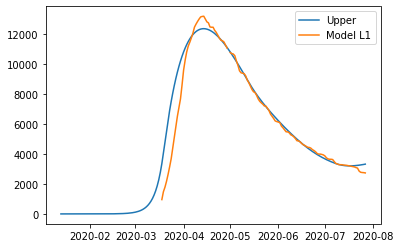

{'home': 0.9993498879479648, 'leisure': 0.8193728631330498, 'other': 0.8, 'school': 0.8937683804556432, 'transport': 0.8454190484352853, 'work': 0.8}
{'home': 0.9993498879479648, 'leisure': 0.10492822740033493, 'other': 0.0764126990806439, 'school': 0, 'transport': 0.11265812014262903, 'work': 0.42529480124568075}
{'home': 0.9993498879479648, 'leisure': 0.10492822740033493, 'other': 0.0764126990806439, 'school': 0, 'transport': 0.11265812014262903, 'work': 0.42529480124568075}
{'home': 0.9993498879479648, 'leisure': 0.1253763523703295, 'other': 0.18235839352456218, 'school': 0.2949435655503623, 'transport': 0.19632751005269478, 'work': 0.7575557107515117}
{'home': 0.9993498879479648, 'leisure': 0.24149119552275666, 'other': 0.25290063135831947, 'school': 0.5988248149052809, 'transport': 0.25965024761991173, 'work': 0.7578049267384788}
{'home': 0.9993498879479648, 'leisure': 0.4001062102804018, 'other': 0.3645186398289011, 'school': 0.5988248149052809, 'transport': 0.42899358186016673, 

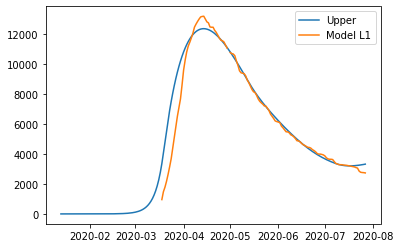

{'home': 0.9993498879479648, 'leisure': 0.8193728631330498, 'other': 0.8, 'school': 0.8937683804556432, 'transport': 0.8454190484352853, 'work': 0.8}
{'home': 0.9993498879479648, 'leisure': 0.10492822740033493, 'other': 0.0764126990806439, 'school': 0, 'transport': 0.11265812014262903, 'work': 0.42529480124568075}
{'home': 0.9993498879479648, 'leisure': 0.10492822740033493, 'other': 0.0764126990806439, 'school': 0, 'transport': 0.11265812014262903, 'work': 0.42529480124568075}
{'home': 0.9993498879479648, 'leisure': 0.1253763523703295, 'other': 0.18235839352456218, 'school': 0.2949435655503623, 'transport': 0.19632751005269478, 'work': 0.7575557107515117}
{'home': 0.9993498879479648, 'leisure': 0.24149119552275666, 'other': 0.25290063135831947, 'school': 0.5988248149052809, 'transport': 0.25965024761991173, 'work': 0.7578049267384788}
{'home': 0.9993498879479648, 'leisure': 0.4001062102804018, 'other': 0.3645186398289011, 'school': 0.5988248149052809, 'transport': 0.42899358186016673, 

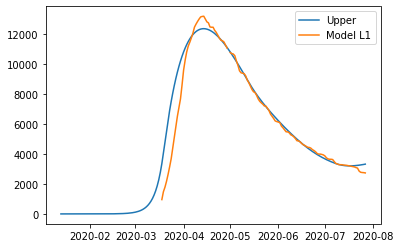

{'home': 0.9993498879479648, 'leisure': 0.8193728631330498, 'other': 0.8, 'school': 0.8937683804556432, 'transport': 0.8454190484352853, 'work': 0.8}
{'home': 0.9993498879479648, 'leisure': 0.10492822740033493, 'other': 0.0764126990806439, 'school': 0, 'transport': 0.11265812014262903, 'work': 0.42529480124568075}
{'home': 0.9993498879479648, 'leisure': 0.10492822740033493, 'other': 0.0764126990806439, 'school': 0, 'transport': 0.11265812014262903, 'work': 0.42529480124568075}
{'home': 0.9993498879479648, 'leisure': 0.1253763523703295, 'other': 0.18235839352456218, 'school': 0.2949435655503623, 'transport': 0.19632751005269478, 'work': 0.7575557107515117}
{'home': 0.9993498879479648, 'leisure': 0.24149119552275666, 'other': 0.25290063135831947, 'school': 0.5988248149052809, 'transport': 0.25965024761991173, 'work': 0.7578049267384788}
{'home': 0.9993498879479648, 'leisure': 0.4001062102804018, 'other': 0.3645186398289011, 'school': 0.5988248149052809, 'transport': 0.42899358186016673, 

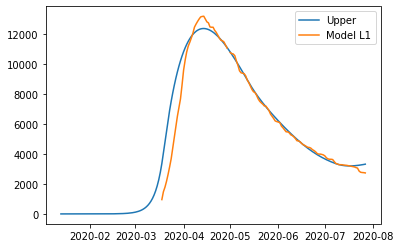

{'home': 0.9992735075157216, 'leisure': 0.8195095623019659, 'other': 0.8, 'school': 0.8940911732463921, 'transport': 0.845442085055936, 'work': 0.8}
{'home': 0.9992735075157216, 'leisure': 0.10495142130749101, 'other': 0.07643988610832575, 'school': 0, 'transport': 0.11266729703406136, 'work': 0.42535149182907406}
{'home': 0.9992735075157216, 'leisure': 0.10495142130749101, 'other': 0.07643988610832575, 'school': 0, 'transport': 0.11266729703406136, 'work': 0.42535149182907406}
{'home': 0.9992735075157216, 'leisure': 0.125405626653927, 'other': 0.18241454161367676, 'school': 0.2950500871713094, 'transport': 0.19634401627511003, 'work': 0.7576103577392246}
{'home': 0.9992735075157216, 'leisure': 0.24154576183934615, 'other': 0.25296801584282774, 'school': 0.5990410860750828, 'transport': 0.2596712927275603, 'work': 0.7578603728406537}
{'home': 0.9992735075157216, 'leisure': 0.40018601061682396, 'other': 0.36455875968262397, 'school': 0.5990410860750828, 'transport': 0.4290255220173538, 

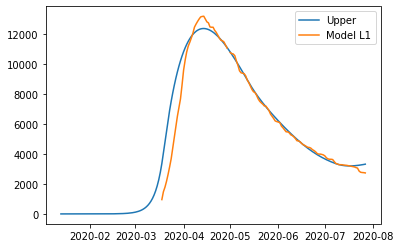

{'home': 0.9992735075157216, 'leisure': 0.8195095623019659, 'other': 0.8, 'school': 0.8940911732463921, 'transport': 0.845442085055936, 'work': 0.8}
{'home': 0.9992735075157216, 'leisure': 0.10495142130749101, 'other': 0.07643988610832575, 'school': 0, 'transport': 0.11266729703406136, 'work': 0.42535149182907406}
{'home': 0.9992735075157216, 'leisure': 0.10495142130749101, 'other': 0.07643988610832575, 'school': 0, 'transport': 0.11266729703406136, 'work': 0.42535149182907406}
{'home': 0.9992735075157216, 'leisure': 0.125405626653927, 'other': 0.18241454161367676, 'school': 0.2950500871713094, 'transport': 0.19634401627511003, 'work': 0.7576103577392246}
{'home': 0.9992735075157216, 'leisure': 0.24154576183934615, 'other': 0.25296801584282774, 'school': 0.5990410860750828, 'transport': 0.2596712927275603, 'work': 0.7578603728406537}
{'home': 0.9992735075157216, 'leisure': 0.40018601061682396, 'other': 0.36455875968262397, 'school': 0.5990410860750828, 'transport': 0.4290255220173538, 

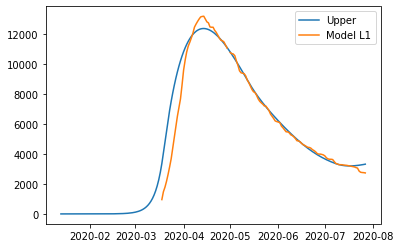

{'home': 0.9992735075157216, 'leisure': 0.8195095623019659, 'other': 0.8, 'school': 0.8940911732463921, 'transport': 0.845442085055936, 'work': 0.8}
{'home': 0.9992735075157216, 'leisure': 0.10495142130749101, 'other': 0.07643988610832575, 'school': 0, 'transport': 0.11266729703406136, 'work': 0.42535149182907406}
{'home': 0.9992735075157216, 'leisure': 0.10495142130749101, 'other': 0.07643988610832575, 'school': 0, 'transport': 0.11266729703406136, 'work': 0.42535149182907406}
{'home': 0.9992735075157216, 'leisure': 0.125405626653927, 'other': 0.18241454161367676, 'school': 0.2950500871713094, 'transport': 0.19634401627511003, 'work': 0.7576103577392246}
{'home': 0.9992735075157216, 'leisure': 0.24154576183934615, 'other': 0.25296801584282774, 'school': 0.5990410860750828, 'transport': 0.2596712927275603, 'work': 0.7578603728406537}
{'home': 0.9992735075157216, 'leisure': 0.40018601061682396, 'other': 0.36455875968262397, 'school': 0.5990410860750828, 'transport': 0.4290255220173538, 

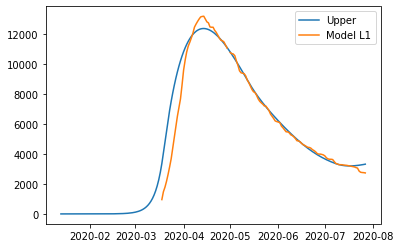

{'home': 0.9992735075157216, 'leisure': 0.8195095623019659, 'other': 0.8, 'school': 0.8940911732463921, 'transport': 0.845442085055936, 'work': 0.8}
{'home': 0.9992735075157216, 'leisure': 0.10495142130749101, 'other': 0.07643988610832575, 'school': 0, 'transport': 0.11266729703406136, 'work': 0.42535149182907406}
{'home': 0.9992735075157216, 'leisure': 0.10495142130749101, 'other': 0.07643988610832575, 'school': 0, 'transport': 0.11266729703406136, 'work': 0.42535149182907406}
{'home': 0.9992735075157216, 'leisure': 0.125405626653927, 'other': 0.18241454161367676, 'school': 0.2950500871713094, 'transport': 0.19634401627511003, 'work': 0.7576103577392246}
{'home': 0.9992735075157216, 'leisure': 0.24154576183934615, 'other': 0.25296801584282774, 'school': 0.5990410860750828, 'transport': 0.2596712927275603, 'work': 0.7578603728406537}
{'home': 0.9992735075157216, 'leisure': 0.40018601061682396, 'other': 0.36455875968262397, 'school': 0.5990410860750828, 'transport': 0.4290255220173538, 

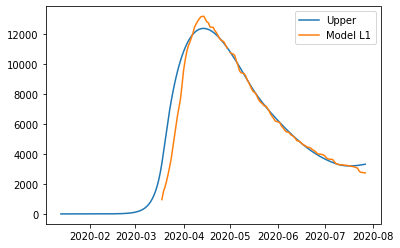

{'home': 0.9992282255005853, 'leisure': 0.8195906041821203, 'other': 0.8, 'school': 0.8942825404278459, 'transport': 0.8454557422790541, 'work': 0.8}
{'home': 0.9992282255005853, 'leisure': 0.10496517255816586, 'other': 0.0764560033274131, 'school': 0, 'transport': 0.11267273747246143, 'work': 0.4253851052710087}
{'home': 0.9992282255005853, 'leisure': 0.10496517255816586, 'other': 0.0764560033274131, 'school': 0, 'transport': 0.11267273747246143, 'work': 0.4253851052710087}
{'home': 0.9992282255005853, 'leisure': 0.12542298301210528, 'other': 0.1824478277479385, 'school': 0.2951132383411892, 'transport': 0.19635380184026408, 'work': 0.7576427594757821}
{'home': 0.9992282255005853, 'leisure': 0.24157811335050006, 'other': 0.2530079632218726, 'school': 0.5991693020866569, 'transport': 0.2596837691326881, 'work': 0.7578932483946595}
{'home': 0.9992282255005853, 'leisure': 0.40023332190708666, 'other': 0.3645825438373235, 'school': 0.5991693020866569, 'transport': 0.42904445746622527, 'wo

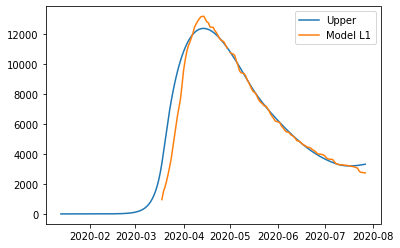

{'home': 0.9992282255005853, 'leisure': 0.8195906041821203, 'other': 0.8, 'school': 0.8942825404278459, 'transport': 0.8454557422790541, 'work': 0.8}
{'home': 0.9992282255005853, 'leisure': 0.10496517255816586, 'other': 0.0764560033274131, 'school': 0, 'transport': 0.11267273747246143, 'work': 0.4253851052710087}
{'home': 0.9992282255005853, 'leisure': 0.10496517255816586, 'other': 0.0764560033274131, 'school': 0, 'transport': 0.11267273747246143, 'work': 0.4253851052710087}
{'home': 0.9992282255005853, 'leisure': 0.12542298301210528, 'other': 0.1824478277479385, 'school': 0.2951132383411892, 'transport': 0.19635380184026408, 'work': 0.7576427594757821}
{'home': 0.9992282255005853, 'leisure': 0.24157811335050006, 'other': 0.2530079632218726, 'school': 0.5991693020866569, 'transport': 0.2596837691326881, 'work': 0.7578932483946595}
{'home': 0.9992282255005853, 'leisure': 0.40023332190708666, 'other': 0.3645825438373235, 'school': 0.5991693020866569, 'transport': 0.42904445746622527, 'wo

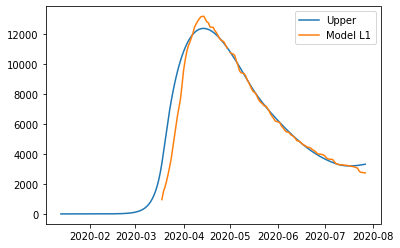

{'home': 0.9992282255005853, 'leisure': 0.8195906041821203, 'other': 0.8, 'school': 0.8942825404278459, 'transport': 0.8454557422790541, 'work': 0.8}
{'home': 0.9992282255005853, 'leisure': 0.10496517255816586, 'other': 0.0764560033274131, 'school': 0, 'transport': 0.11267273747246143, 'work': 0.4253851052710087}
{'home': 0.9992282255005853, 'leisure': 0.10496517255816586, 'other': 0.0764560033274131, 'school': 0, 'transport': 0.11267273747246143, 'work': 0.4253851052710087}
{'home': 0.9992282255005853, 'leisure': 0.12542298301210528, 'other': 0.1824478277479385, 'school': 0.2951132383411892, 'transport': 0.19635380184026408, 'work': 0.7576427594757821}
{'home': 0.9992282255005853, 'leisure': 0.24157811335050006, 'other': 0.2530079632218726, 'school': 0.5991693020866569, 'transport': 0.2596837691326881, 'work': 0.7578932483946595}
{'home': 0.9992282255005853, 'leisure': 0.40023332190708666, 'other': 0.3645825438373235, 'school': 0.5991693020866569, 'transport': 0.42904445746622527, 'wo

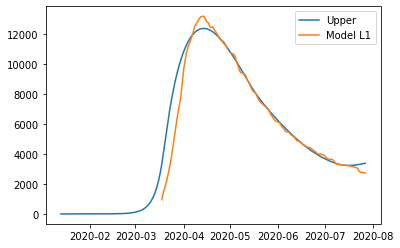

{'home': 0.9990193921145041, 'leisure': 0.8266132479065816, 'other': 0.8, 'school': 0.900110878196325, 'transport': 0.8500200020636701, 'work': 0.8}
{'home': 0.9990193921145041, 'leisure': 0.10566880603498961, 'other': 0.07545177695180254, 'school': 0, 'transport': 0.11294638336058611, 'work': 0.4242606053806074}
{'home': 0.9990193921145041, 'leisure': 0.10566880603498961, 'other': 0.07545177695180254, 'school': 0, 'transport': 0.11294638336058611, 'work': 0.4242606053806074}
{'home': 0.9990193921145041, 'leisure': 0.12636858294303469, 'other': 0.18018748124228254, 'school': 0.29703658980478725, 'transport': 0.19681061796424942, 'work': 0.7505486701723854}
{'home': 0.9990193921145041, 'leisure': 0.2433502252099447, 'other': 0.25095761452245763, 'school': 0.6030742883915378, 'transport': 0.2603639828776469, 'work': 0.7508426781210509}
{'home': 0.9990193921145041, 'leisure': 0.4034638822096314, 'other': 0.3641311174671606, 'school': 0.6030742883915378, 'transport': 0.43028317713691394, '

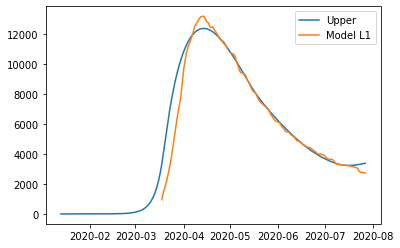

{'home': 0.9990193921145041, 'leisure': 0.8266132479065816, 'other': 0.8, 'school': 0.900110878196325, 'transport': 0.8500200020636701, 'work': 0.8}
{'home': 0.9990193921145041, 'leisure': 0.10566880603498961, 'other': 0.07545177695180254, 'school': 0, 'transport': 0.11294638336058611, 'work': 0.4242606053806074}
{'home': 0.9990193921145041, 'leisure': 0.10566880603498961, 'other': 0.07545177695180254, 'school': 0, 'transport': 0.11294638336058611, 'work': 0.4242606053806074}
{'home': 0.9990193921145041, 'leisure': 0.12636858294303469, 'other': 0.18018748124228254, 'school': 0.29703658980478725, 'transport': 0.19681061796424942, 'work': 0.7505486701723854}
{'home': 0.9990193921145041, 'leisure': 0.2433502252099447, 'other': 0.25095761452245763, 'school': 0.6030742883915378, 'transport': 0.2603639828776469, 'work': 0.7508426781210509}
{'home': 0.9990193921145041, 'leisure': 0.4034638822096314, 'other': 0.3641311174671606, 'school': 0.6030742883915378, 'transport': 0.43028317713691394, '

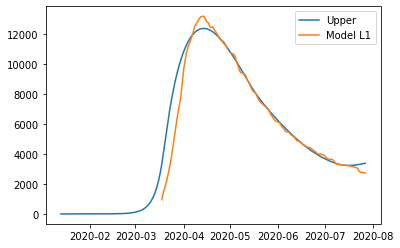

{'home': 0.9990193921145041, 'leisure': 0.8266132479065816, 'other': 0.8, 'school': 0.900110878196325, 'transport': 0.8500200020636701, 'work': 0.8}
{'home': 0.9990193921145041, 'leisure': 0.10566880603498961, 'other': 0.07545177695180254, 'school': 0, 'transport': 0.11294638336058611, 'work': 0.4242606053806074}
{'home': 0.9990193921145041, 'leisure': 0.10566880603498961, 'other': 0.07545177695180254, 'school': 0, 'transport': 0.11294638336058611, 'work': 0.4242606053806074}
{'home': 0.9990193921145041, 'leisure': 0.12636858294303469, 'other': 0.18018748124228254, 'school': 0.29703658980478725, 'transport': 0.19681061796424942, 'work': 0.7505486701723854}
{'home': 0.9990193921145041, 'leisure': 0.2433502252099447, 'other': 0.25095761452245763, 'school': 0.6030742883915378, 'transport': 0.2603639828776469, 'work': 0.7508426781210509}
{'home': 0.9990193921145041, 'leisure': 0.4034638822096314, 'other': 0.3641311174671606, 'school': 0.6030742883915378, 'transport': 0.43028317713691394, '

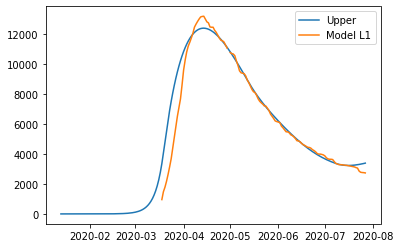

{'home': 0.9989031919668455, 'leisure': 0.8288556120675682, 'other': 0.8, 'school': 0.9021283197754625, 'transport': 0.8514039408293645, 'work': 0.8}
{'home': 0.9989031919668455, 'leisure': 0.10589894258788515, 'other': 0.07515809026623177, 'school': 0, 'transport': 0.11303146647917797, 'work': 0.42392850060170917}
{'home': 0.9989031919668455, 'leisure': 0.10589894258788515, 'other': 0.07515809026623177, 'school': 0, 'transport': 0.11303146647917797, 'work': 0.42392850060170917}
{'home': 0.9989031919668455, 'leisure': 0.12667596289055466, 'other': 0.17952416766346907, 'school': 0.29770234552590263, 'transport': 0.19695289781207137, 'work': 0.7484160837856568}
{'home': 0.9989031919668455, 'leisure': 0.2439269467093678, 'other': 0.2503637911249558, 'school': 0.6044259742495599, 'transport': 0.26057518722751855, 'work': 0.7487326007148276}
{'home': 0.9989031919668455, 'leisure': 0.4045057876047853, 'other': 0.36400973226838684, 'school': 0.6044259742495599, 'transport': 0.4306662542799150

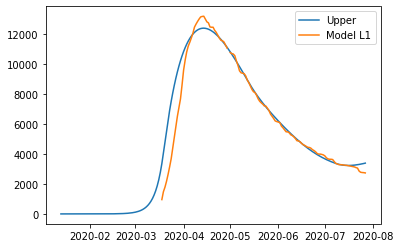

{'home': 0.9989031919668455, 'leisure': 0.8288556120675682, 'other': 0.8, 'school': 0.9021283197754625, 'transport': 0.8514039408293645, 'work': 0.8}
{'home': 0.9989031919668455, 'leisure': 0.10589894258788515, 'other': 0.07515809026623177, 'school': 0, 'transport': 0.11303146647917797, 'work': 0.42392850060170917}
{'home': 0.9989031919668455, 'leisure': 0.10589894258788515, 'other': 0.07515809026623177, 'school': 0, 'transport': 0.11303146647917797, 'work': 0.42392850060170917}
{'home': 0.9989031919668455, 'leisure': 0.12667596289055466, 'other': 0.17952416766346907, 'school': 0.29770234552590263, 'transport': 0.19695289781207137, 'work': 0.7484160837856568}
{'home': 0.9989031919668455, 'leisure': 0.2439269467093678, 'other': 0.2503637911249558, 'school': 0.6044259742495599, 'transport': 0.26057518722751855, 'work': 0.7487326007148276}
{'home': 0.9989031919668455, 'leisure': 0.4045057876047853, 'other': 0.36400973226838684, 'school': 0.6044259742495599, 'transport': 0.4306662542799150

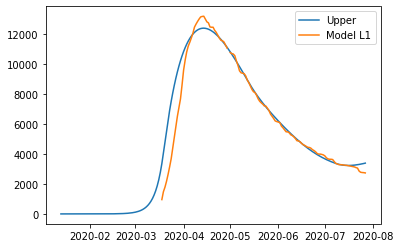

{'home': 0.9989031919668455, 'leisure': 0.8288556120675682, 'other': 0.8, 'school': 0.9021283197754625, 'transport': 0.8514039408293645, 'work': 0.8}
{'home': 0.9989031919668455, 'leisure': 0.10589894258788515, 'other': 0.07515809026623177, 'school': 0, 'transport': 0.11303146647917797, 'work': 0.42392850060170917}
{'home': 0.9989031919668455, 'leisure': 0.10589894258788515, 'other': 0.07515809026623177, 'school': 0, 'transport': 0.11303146647917797, 'work': 0.42392850060170917}
{'home': 0.9989031919668455, 'leisure': 0.12667596289055466, 'other': 0.17952416766346907, 'school': 0.29770234552590263, 'transport': 0.19695289781207137, 'work': 0.7484160837856568}
{'home': 0.9989031919668455, 'leisure': 0.2439269467093678, 'other': 0.2503637911249558, 'school': 0.6044259742495599, 'transport': 0.26057518722751855, 'work': 0.7487326007148276}
{'home': 0.9989031919668455, 'leisure': 0.4045057876047853, 'other': 0.36400973226838684, 'school': 0.6044259742495599, 'transport': 0.4306662542799150

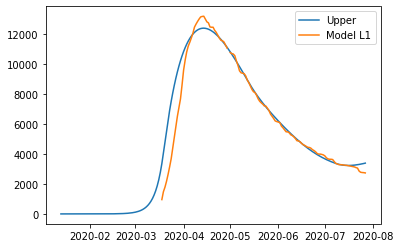

{'home': 0.9989031919668455, 'leisure': 0.8288556120675682, 'other': 0.8, 'school': 0.9021283197754625, 'transport': 0.8514039408293645, 'work': 0.8}
{'home': 0.9989031919668455, 'leisure': 0.10589894258788515, 'other': 0.07515809026623177, 'school': 0, 'transport': 0.11303146647917797, 'work': 0.42392850060170917}
{'home': 0.9989031919668455, 'leisure': 0.10589894258788515, 'other': 0.07515809026623177, 'school': 0, 'transport': 0.11303146647917797, 'work': 0.42392850060170917}
{'home': 0.9989031919668455, 'leisure': 0.12667596289055466, 'other': 0.17952416766346907, 'school': 0.29770234552590263, 'transport': 0.19695289781207137, 'work': 0.7484160837856568}
{'home': 0.9989031919668455, 'leisure': 0.2439269467093678, 'other': 0.2503637911249558, 'school': 0.6044259742495599, 'transport': 0.26057518722751855, 'work': 0.7487326007148276}
{'home': 0.9989031919668455, 'leisure': 0.4045057876047853, 'other': 0.36400973226838684, 'school': 0.6044259742495599, 'transport': 0.4306662542799150

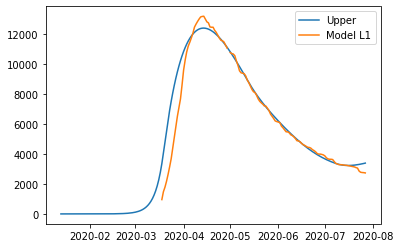

{'home': 0.9988734475587254, 'leisure': 0.829610018094287, 'other': 0.8, 'school': 0.9027819854240665, 'transport': 0.8518765567779926, 'work': 0.8}
{'home': 0.9988734475587254, 'leisure': 0.10597502619369624, 'other': 0.07505296681866386, 'school': 0, 'transport': 0.11305925003304518, 'work': 0.4238052597693215}
{'home': 0.9988734475587254, 'leisure': 0.10597502619369624, 'other': 0.07505296681866386, 'school': 0, 'transport': 0.11305925003304518, 'work': 0.4238052597693215}
{'home': 0.9988734475587254, 'leisure': 0.1267778126075243, 'other': 0.17928749209980047, 'school': 0.29791805518994197, 'transport': 0.19699916627934, 'work': 0.747673516480597}
{'home': 0.9988734475587254, 'leisure': 0.2441181226631759, 'other': 0.2501494519099042, 'school': 0.6048639302341245, 'transport': 0.26064445450431933, 'work': 0.7479980202687184}
{'home': 0.9988734475587254, 'leisure': 0.4048539737267554, 'other': 0.3639619610681721, 'school': 0.6048639302341245, 'transport': 0.43079290933087444, 'work'

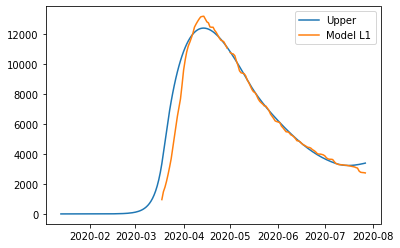

{'home': 0.9988734475587254, 'leisure': 0.829610018094287, 'other': 0.8, 'school': 0.9027819854240665, 'transport': 0.8518765567779926, 'work': 0.8}
{'home': 0.9988734475587254, 'leisure': 0.10597502619369624, 'other': 0.07505296681866386, 'school': 0, 'transport': 0.11305925003304518, 'work': 0.4238052597693215}
{'home': 0.9988734475587254, 'leisure': 0.10597502619369624, 'other': 0.07505296681866386, 'school': 0, 'transport': 0.11305925003304518, 'work': 0.4238052597693215}
{'home': 0.9988734475587254, 'leisure': 0.1267778126075243, 'other': 0.17928749209980047, 'school': 0.29791805518994197, 'transport': 0.19699916627934, 'work': 0.747673516480597}
{'home': 0.9988734475587254, 'leisure': 0.2441181226631759, 'other': 0.2501494519099042, 'school': 0.6048639302341245, 'transport': 0.26064445450431933, 'work': 0.7479980202687184}
{'home': 0.9988734475587254, 'leisure': 0.4048539737267554, 'other': 0.3639619610681721, 'school': 0.6048639302341245, 'transport': 0.43079290933087444, 'work'

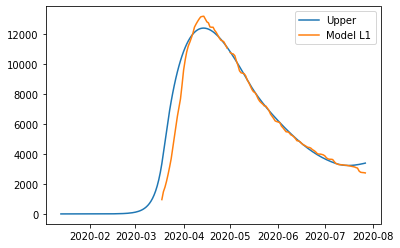

{'home': 0.9988734475587254, 'leisure': 0.829610018094287, 'other': 0.8, 'school': 0.9027819854240665, 'transport': 0.8518765567779926, 'work': 0.8}
{'home': 0.9988734475587254, 'leisure': 0.10597502619369624, 'other': 0.07505296681866386, 'school': 0, 'transport': 0.11305925003304518, 'work': 0.4238052597693215}
{'home': 0.9988734475587254, 'leisure': 0.10597502619369624, 'other': 0.07505296681866386, 'school': 0, 'transport': 0.11305925003304518, 'work': 0.4238052597693215}
{'home': 0.9988734475587254, 'leisure': 0.1267778126075243, 'other': 0.17928749209980047, 'school': 0.29791805518994197, 'transport': 0.19699916627934, 'work': 0.747673516480597}
{'home': 0.9988734475587254, 'leisure': 0.2441181226631759, 'other': 0.2501494519099042, 'school': 0.6048639302341245, 'transport': 0.26064445450431933, 'work': 0.7479980202687184}
{'home': 0.9988734475587254, 'leisure': 0.4048539737267554, 'other': 0.3639619610681721, 'school': 0.6048639302341245, 'transport': 0.43079290933087444, 'work'

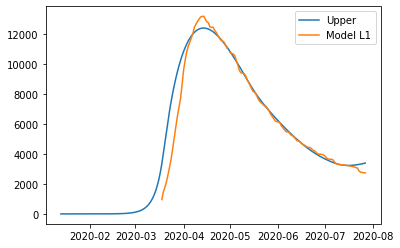

{'home': 0.9988484293815846, 'leisure': 0.8301692251014877, 'other': 0.8, 'school': 0.9032693742207291, 'transport': 0.8522315239033534, 'work': 0.8}
{'home': 0.9988484293815846, 'leisure': 0.10603199621987712, 'other': 0.07497861816213316, 'school': 0, 'transport': 0.11308112064221074, 'work': 0.4237245156781265}
{'home': 0.9988484293815846, 'leisure': 0.10603199621987712, 'other': 0.07497861816213316, 'school': 0, 'transport': 0.11308112064221074, 'work': 0.4237245156781265}
{'home': 0.9988484293815846, 'leisure': 0.12685429095606157, 'other': 0.1791195912616892, 'school': 0.2980788934928406, 'transport': 0.19703576748777393, 'work': 0.7471312850559098}
{'home': 0.9988484293815846, 'leisure': 0.24426136411249463, 'other': 0.24999906049750242, 'school': 0.6051904807278885, 'transport': 0.26069872619870565, 'work': 0.7474594920644773}
{'home': 0.9988484293815846, 'leisure': 0.4051132175478946, 'other': 0.3639318659573348, 'school': 0.6051904807278885, 'transport': 0.4308912484743009, '

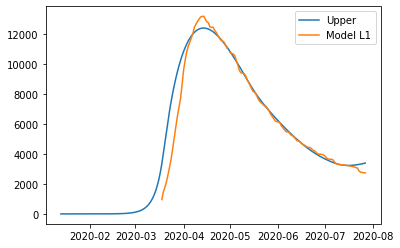

{'home': 0.9988484293815846, 'leisure': 0.8301692251014877, 'other': 0.8, 'school': 0.9032693742207291, 'transport': 0.8522315239033534, 'work': 0.8}
{'home': 0.9988484293815846, 'leisure': 0.10603199621987712, 'other': 0.07497861816213316, 'school': 0, 'transport': 0.11308112064221074, 'work': 0.4237245156781265}
{'home': 0.9988484293815846, 'leisure': 0.10603199621987712, 'other': 0.07497861816213316, 'school': 0, 'transport': 0.11308112064221074, 'work': 0.4237245156781265}
{'home': 0.9988484293815846, 'leisure': 0.12685429095606157, 'other': 0.1791195912616892, 'school': 0.2980788934928406, 'transport': 0.19703576748777393, 'work': 0.7471312850559098}
{'home': 0.9988484293815846, 'leisure': 0.24426136411249463, 'other': 0.24999906049750242, 'school': 0.6051904807278885, 'transport': 0.26069872619870565, 'work': 0.7474594920644773}
{'home': 0.9988484293815846, 'leisure': 0.4051132175478946, 'other': 0.3639318659573348, 'school': 0.6051904807278885, 'transport': 0.4308912484743009, '

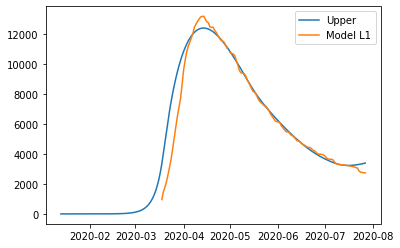

{'home': 0.9988484293815846, 'leisure': 0.8301692251014877, 'other': 0.8, 'school': 0.9032693742207291, 'transport': 0.8522315239033534, 'work': 0.8}
{'home': 0.9988484293815846, 'leisure': 0.10603199621987712, 'other': 0.07497861816213316, 'school': 0, 'transport': 0.11308112064221074, 'work': 0.4237245156781265}
{'home': 0.9988484293815846, 'leisure': 0.10603199621987712, 'other': 0.07497861816213316, 'school': 0, 'transport': 0.11308112064221074, 'work': 0.4237245156781265}
{'home': 0.9988484293815846, 'leisure': 0.12685429095606157, 'other': 0.1791195912616892, 'school': 0.2980788934928406, 'transport': 0.19703576748777393, 'work': 0.7471312850559098}
{'home': 0.9988484293815846, 'leisure': 0.24426136411249463, 'other': 0.24999906049750242, 'school': 0.6051904807278885, 'transport': 0.26069872619870565, 'work': 0.7474594920644773}
{'home': 0.9988484293815846, 'leisure': 0.4051132175478946, 'other': 0.3639318659573348, 'school': 0.6051904807278885, 'transport': 0.4308912484743009, '

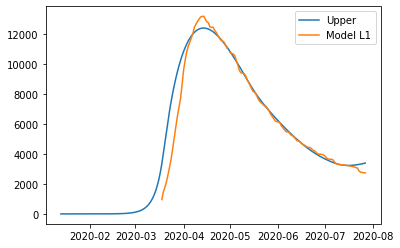

{'home': 0.9988484293815846, 'leisure': 0.8301692251014877, 'other': 0.8, 'school': 0.9032693742207291, 'transport': 0.8522315239033534, 'work': 0.8}
{'home': 0.9988484293815846, 'leisure': 0.10603199621987712, 'other': 0.07497861816213316, 'school': 0, 'transport': 0.11308112064221074, 'work': 0.4237245156781265}
{'home': 0.9988484293815846, 'leisure': 0.10603199621987712, 'other': 0.07497861816213316, 'school': 0, 'transport': 0.11308112064221074, 'work': 0.4237245156781265}
{'home': 0.9988484293815846, 'leisure': 0.12685429095606157, 'other': 0.1791195912616892, 'school': 0.2980788934928406, 'transport': 0.19703576748777393, 'work': 0.7471312850559098}
{'home': 0.9988484293815846, 'leisure': 0.24426136411249463, 'other': 0.24999906049750242, 'school': 0.6051904807278885, 'transport': 0.26069872619870565, 'work': 0.7474594920644773}
{'home': 0.9988484293815846, 'leisure': 0.4051132175478946, 'other': 0.3639318659573348, 'school': 0.6051904807278885, 'transport': 0.4308912484743009, '

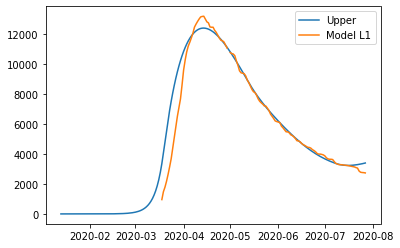

{'home': 0.998829842674239, 'leisure': 0.8301604640673897, 'other': 0.8, 'school': 0.9032677259166074, 'transport': 0.8522333333373443, 'work': 0.8}
{'home': 0.998829842674239, 'leisure': 0.106034357440902, 'other': 0.0749958458058239, 'school': 0, 'transport': 0.11308565426988468, 'work': 0.42376570620124965}
{'home': 0.998829842674239, 'leisure': 0.106034357440902, 'other': 0.0749958458058239, 'school': 0, 'transport': 0.11308565426988468, 'work': 0.42376570620124965}
{'home': 0.998829842674239, 'leisure': 0.12685777100635168, 'other': 0.17915658585578226, 'school': 0.29807834955248047, 'transport': 0.19704405328245114, 'work': 0.7471886255020792}
{'home': 0.998829842674239, 'leisure': 0.24426697821863838, 'other': 0.25003928623125954, 'school': 0.6051893763641271, 'transport': 0.2607089273702669, 'work': 0.7475109626551297}
{'home': 0.998829842674239, 'leisure': 0.40511614177997357, 'other': 0.36395500070999387, 'school': 0.6051893763641271, 'transport': 0.43090622028214925, 'work':

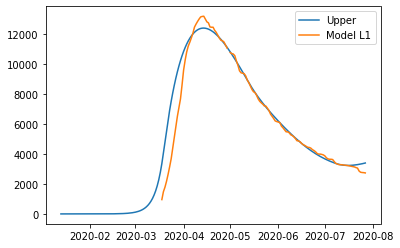

{'home': 0.998829842674239, 'leisure': 0.8301604640673897, 'other': 0.8, 'school': 0.9032677259166074, 'transport': 0.8522333333373443, 'work': 0.8}
{'home': 0.998829842674239, 'leisure': 0.106034357440902, 'other': 0.0749958458058239, 'school': 0, 'transport': 0.11308565426988468, 'work': 0.42376570620124965}
{'home': 0.998829842674239, 'leisure': 0.106034357440902, 'other': 0.0749958458058239, 'school': 0, 'transport': 0.11308565426988468, 'work': 0.42376570620124965}
{'home': 0.998829842674239, 'leisure': 0.12685777100635168, 'other': 0.17915658585578226, 'school': 0.29807834955248047, 'transport': 0.19704405328245114, 'work': 0.7471886255020792}
{'home': 0.998829842674239, 'leisure': 0.24426697821863838, 'other': 0.25003928623125954, 'school': 0.6051893763641271, 'transport': 0.2607089273702669, 'work': 0.7475109626551297}
{'home': 0.998829842674239, 'leisure': 0.40511614177997357, 'other': 0.36395500070999387, 'school': 0.6051893763641271, 'transport': 0.43090622028214925, 'work':

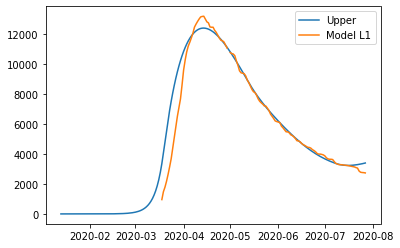

{'home': 0.998829842674239, 'leisure': 0.8301604640673897, 'other': 0.8, 'school': 0.9032677259166074, 'transport': 0.8522333333373443, 'work': 0.8}
{'home': 0.998829842674239, 'leisure': 0.106034357440902, 'other': 0.0749958458058239, 'school': 0, 'transport': 0.11308565426988468, 'work': 0.42376570620124965}
{'home': 0.998829842674239, 'leisure': 0.106034357440902, 'other': 0.0749958458058239, 'school': 0, 'transport': 0.11308565426988468, 'work': 0.42376570620124965}
{'home': 0.998829842674239, 'leisure': 0.12685777100635168, 'other': 0.17915658585578226, 'school': 0.29807834955248047, 'transport': 0.19704405328245114, 'work': 0.7471886255020792}
{'home': 0.998829842674239, 'leisure': 0.24426697821863838, 'other': 0.25003928623125954, 'school': 0.6051893763641271, 'transport': 0.2607089273702669, 'work': 0.7475109626551297}
{'home': 0.998829842674239, 'leisure': 0.40511614177997357, 'other': 0.36395500070999387, 'school': 0.6051893763641271, 'transport': 0.43090622028214925, 'work':

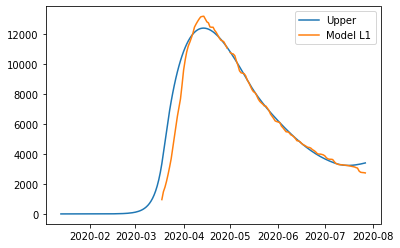

{'home': 0.9987874688930967, 'leisure': 0.831170670017838, 'other': 0.8, 'school': 0.9040824330408208, 'transport': 0.8528882715078742, 'work': 0.8}
{'home': 0.9987874688930967, 'leisure': 0.10613355596814628, 'other': 0.07484230768802992, 'school': 0, 'transport': 0.11312211165722978, 'work': 0.4235801186961398}
{'home': 0.9987874688930967, 'leisure': 0.10613355596814628, 'other': 0.07484230768802992, 'school': 0, 'transport': 0.11312211165722978, 'work': 0.4235801186961398}
{'home': 0.9987874688930967, 'leisure': 0.12699127859621367, 'other': 0.17881225844583915, 'school': 0.2983472029034709, 'transport': 0.1971044541295836, 'work': 0.746136781916414}
{'home': 0.9987874688930967, 'leisure': 0.24451753913057914, 'other': 0.24972324198450857, 'school': 0.60573523013735, 'transport': 0.26080031326399267, 'work': 0.746469564462513}
{'home': 0.9987874688930967, 'leisure': 0.405577991320161, 'other': 0.36387867162433873, 'school': 0.60573523013735, 'transport': 0.43107502125971775, 'work':

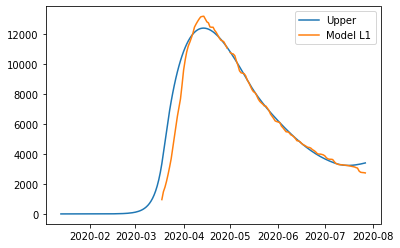

{'home': 0.9987874688930967, 'leisure': 0.831170670017838, 'other': 0.8, 'school': 0.9040824330408208, 'transport': 0.8528882715078742, 'work': 0.8}
{'home': 0.9987874688930967, 'leisure': 0.10613355596814628, 'other': 0.07484230768802992, 'school': 0, 'transport': 0.11312211165722978, 'work': 0.4235801186961398}
{'home': 0.9987874688930967, 'leisure': 0.10613355596814628, 'other': 0.07484230768802992, 'school': 0, 'transport': 0.11312211165722978, 'work': 0.4235801186961398}
{'home': 0.9987874688930967, 'leisure': 0.12699127859621367, 'other': 0.17881225844583915, 'school': 0.2983472029034709, 'transport': 0.1971044541295836, 'work': 0.746136781916414}
{'home': 0.9987874688930967, 'leisure': 0.24451753913057914, 'other': 0.24972324198450857, 'school': 0.60573523013735, 'transport': 0.26080031326399267, 'work': 0.746469564462513}
{'home': 0.9987874688930967, 'leisure': 0.405577991320161, 'other': 0.36387867162433873, 'school': 0.60573523013735, 'transport': 0.43107502125971775, 'work':

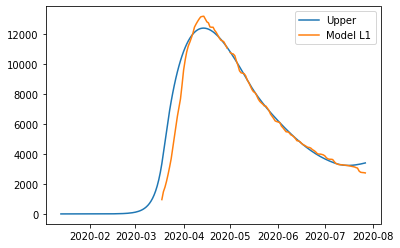

{'home': 0.9987874688930967, 'leisure': 0.831170670017838, 'other': 0.8, 'school': 0.9040824330408208, 'transport': 0.8528882715078742, 'work': 0.8}
{'home': 0.9987874688930967, 'leisure': 0.10613355596814628, 'other': 0.07484230768802992, 'school': 0, 'transport': 0.11312211165722978, 'work': 0.4235801186961398}
{'home': 0.9987874688930967, 'leisure': 0.10613355596814628, 'other': 0.07484230768802992, 'school': 0, 'transport': 0.11312211165722978, 'work': 0.4235801186961398}
{'home': 0.9987874688930967, 'leisure': 0.12699127859621367, 'other': 0.17881225844583915, 'school': 0.2983472029034709, 'transport': 0.1971044541295836, 'work': 0.746136781916414}
{'home': 0.9987874688930967, 'leisure': 0.24451753913057914, 'other': 0.24972324198450857, 'school': 0.60573523013735, 'transport': 0.26080031326399267, 'work': 0.746469564462513}
{'home': 0.9987874688930967, 'leisure': 0.405577991320161, 'other': 0.36387867162433873, 'school': 0.60573523013735, 'transport': 0.43107502125971775, 'work':

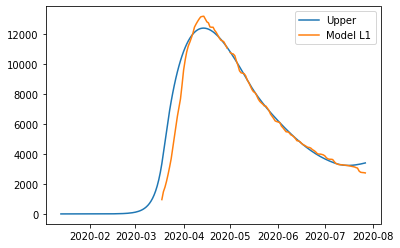

{'home': 0.9987874788930967, 'leisure': 0.831170670017838, 'other': 0.8, 'school': 0.9040824330408208, 'transport': 0.8528882715078742, 'work': 0.8}
{'home': 0.9987874788930967, 'leisure': 0.10613355596814628, 'other': 0.07484230768802992, 'school': 0, 'transport': 0.11312211165722978, 'work': 0.4235801186961398}
{'home': 0.9987874788930967, 'leisure': 0.10613355596814628, 'other': 0.07484230768802992, 'school': 0, 'transport': 0.11312211165722978, 'work': 0.4235801186961398}
{'home': 0.9987874788930967, 'leisure': 0.12699127859621367, 'other': 0.17881225844583915, 'school': 0.2983472029034709, 'transport': 0.1971044541295836, 'work': 0.746136781916414}
{'home': 0.9987874788930967, 'leisure': 0.24451753913057914, 'other': 0.24972324198450857, 'school': 0.60573523013735, 'transport': 0.26080031326399267, 'work': 0.746469564462513}
{'home': 0.9987874788930967, 'leisure': 0.405577991320161, 'other': 0.36387867162433873, 'school': 0.60573523013735, 'transport': 0.43107502125971775, 'work':

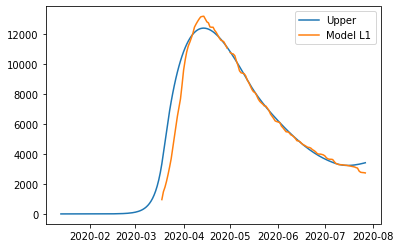

{'home': 0.9986394360629799, 'leisure': 0.8354706212345892, 'other': 0.8, 'school': 0.9074889357084284, 'transport': 0.8556845294734375, 'work': 0.8}
{'home': 0.9986394360629799, 'leisure': 0.1065493367745103, 'other': 0.07416148808208904, 'school': 0, 'transport': 0.11327016455267286, 'work': 0.4227299678988945}
{'home': 0.9986394360629799, 'leisure': 0.1065493367745103, 'other': 0.07416148808208904, 'school': 0, 'transport': 0.11327016455267286, 'work': 0.4227299678988945}
{'home': 0.9986394360629799, 'leisure': 0.12755157731065278, 'other': 0.1772882970538272, 'school': 0.2994713487837814, 'transport': 0.19734846460820407, 'work': 0.7415615144293485}
{'home': 0.9986394360629799, 'leisure': 0.24556988623276593, 'other': 0.2483143408461968, 'school': 0.608017586924647, 'transport': 0.2611735032874319, 'work': 0.7419449554982549}
{'home': 0.9986394360629799, 'leisure': 0.4075318746732473, 'other': 0.363519367279183, 'school': 0.608017586924647, 'transport': 0.43177088541031644, 'work':

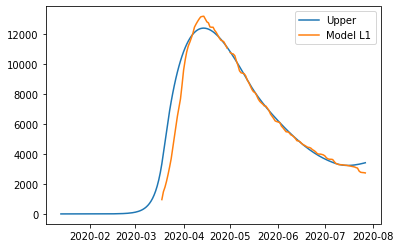

{'home': 0.9986394360629799, 'leisure': 0.8354706212345892, 'other': 0.8, 'school': 0.9074889357084284, 'transport': 0.8556845294734375, 'work': 0.8}
{'home': 0.9986394360629799, 'leisure': 0.1065493367745103, 'other': 0.07416148808208904, 'school': 0, 'transport': 0.11327016455267286, 'work': 0.4227299678988945}
{'home': 0.9986394360629799, 'leisure': 0.1065493367745103, 'other': 0.07416148808208904, 'school': 0, 'transport': 0.11327016455267286, 'work': 0.4227299678988945}
{'home': 0.9986394360629799, 'leisure': 0.12755157731065278, 'other': 0.1772882970538272, 'school': 0.2994713487837814, 'transport': 0.19734846460820407, 'work': 0.7415615144293485}
{'home': 0.9986394360629799, 'leisure': 0.24556988623276593, 'other': 0.2483143408461968, 'school': 0.608017586924647, 'transport': 0.2611735032874319, 'work': 0.7419449554982549}
{'home': 0.9986394360629799, 'leisure': 0.4075318746732473, 'other': 0.363519367279183, 'school': 0.608017586924647, 'transport': 0.43177088541031644, 'work':

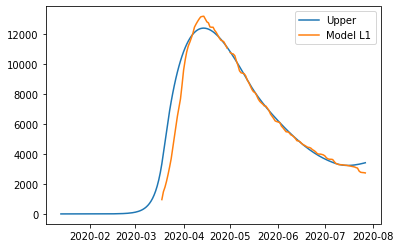

{'home': 0.9986394360629799, 'leisure': 0.8354706212345892, 'other': 0.8, 'school': 0.9074889357084284, 'transport': 0.8556845294734375, 'work': 0.8}
{'home': 0.9986394360629799, 'leisure': 0.1065493367745103, 'other': 0.07416148808208904, 'school': 0, 'transport': 0.11327016455267286, 'work': 0.4227299678988945}
{'home': 0.9986394360629799, 'leisure': 0.1065493367745103, 'other': 0.07416148808208904, 'school': 0, 'transport': 0.11327016455267286, 'work': 0.4227299678988945}
{'home': 0.9986394360629799, 'leisure': 0.12755157731065278, 'other': 0.1772882970538272, 'school': 0.2994713487837814, 'transport': 0.19734846460820407, 'work': 0.7415615144293485}
{'home': 0.9986394360629799, 'leisure': 0.24556988623276593, 'other': 0.2483143408461968, 'school': 0.608017586924647, 'transport': 0.2611735032874319, 'work': 0.7419449554982549}
{'home': 0.9986394360629799, 'leisure': 0.4075318746732473, 'other': 0.363519367279183, 'school': 0.608017586924647, 'transport': 0.43177088541031644, 'work':

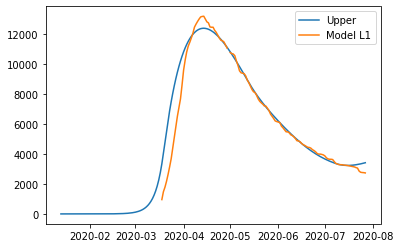

{'home': 0.9986267397222983, 'leisure': 0.835908095736176, 'other': 0.8, 'school': 0.9077616949669939, 'transport': 0.8559860558823176, 'work': 0.8}
{'home': 0.9986267397222983, 'leisure': 0.10658817145311947, 'other': 0.07407422424902566, 'school': 0, 'transport': 0.11328285116848369, 'work': 0.422608570180209}
{'home': 0.9986267397222983, 'leisure': 0.10658817145311947, 'other': 0.07407422424902566, 'school': 0, 'transport': 0.11328285116848369, 'work': 0.422608570180209}
{'home': 0.9986267397222983, 'leisure': 0.12760438030380442, 'other': 0.1770949143274984, 'school': 0.299561359339108, 'transport': 0.19736877496902397, 'work': 0.7410273748384912}
{'home': 0.9986267397222983, 'leisure': 0.24566945797143974, 'other': 0.2481296674870564, 'school': 0.6082003356278859, 'transport': 0.2612063836658222, 'work': 0.7414188047651139}
{'home': 0.9986267397222983, 'leisure': 0.4077249920029146, 'other': 0.36346325697209564, 'school': 0.6082003356278859, 'transport': 0.4318353283430862, 'work'

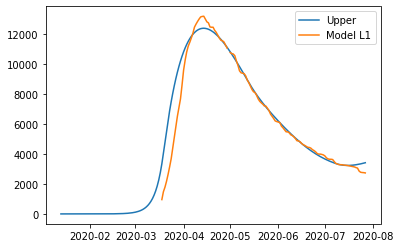

{'home': 0.9986267397222983, 'leisure': 0.835908095736176, 'other': 0.8, 'school': 0.9077616949669939, 'transport': 0.8559860558823176, 'work': 0.8}
{'home': 0.9986267397222983, 'leisure': 0.10658817145311947, 'other': 0.07407422424902566, 'school': 0, 'transport': 0.11328285116848369, 'work': 0.422608570180209}
{'home': 0.9986267397222983, 'leisure': 0.10658817145311947, 'other': 0.07407422424902566, 'school': 0, 'transport': 0.11328285116848369, 'work': 0.422608570180209}
{'home': 0.9986267397222983, 'leisure': 0.12760438030380442, 'other': 0.1770949143274984, 'school': 0.299561359339108, 'transport': 0.19736877496902397, 'work': 0.7410273748384912}
{'home': 0.9986267397222983, 'leisure': 0.24566945797143974, 'other': 0.2481296674870564, 'school': 0.6082003356278859, 'transport': 0.2612063836658222, 'work': 0.7414188047651139}
{'home': 0.9986267397222983, 'leisure': 0.4077249920029146, 'other': 0.36346325697209564, 'school': 0.6082003356278859, 'transport': 0.4318353283430862, 'work'

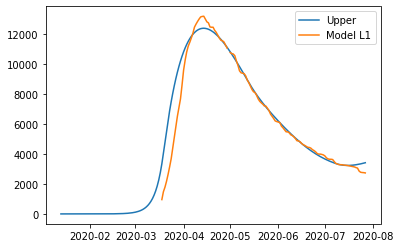

{'home': 0.9986267397222983, 'leisure': 0.835908095736176, 'other': 0.8, 'school': 0.9077616949669939, 'transport': 0.8559860558823176, 'work': 0.8}
{'home': 0.9986267397222983, 'leisure': 0.10658817145311947, 'other': 0.07407422424902566, 'school': 0, 'transport': 0.11328285116848369, 'work': 0.422608570180209}
{'home': 0.9986267397222983, 'leisure': 0.10658817145311947, 'other': 0.07407422424902566, 'school': 0, 'transport': 0.11328285116848369, 'work': 0.422608570180209}
{'home': 0.9986267397222983, 'leisure': 0.12760438030380442, 'other': 0.1770949143274984, 'school': 0.299561359339108, 'transport': 0.19736877496902397, 'work': 0.7410273748384912}
{'home': 0.9986267397222983, 'leisure': 0.24566945797143974, 'other': 0.2481296674870564, 'school': 0.6082003356278859, 'transport': 0.2612063836658222, 'work': 0.7414188047651139}
{'home': 0.9986267397222983, 'leisure': 0.4077249920029146, 'other': 0.36346325697209564, 'school': 0.6082003356278859, 'transport': 0.4318353283430862, 'work'

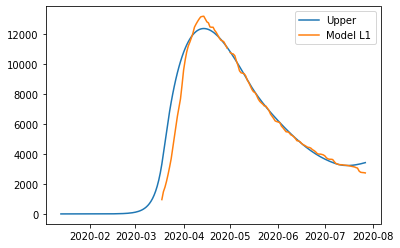

{'home': 0.9984828813819088, 'leisure': 0.8404203613095559, 'other': 0.8, 'school': 0.9110761135752674, 'transport': 0.8589833364955971, 'work': 0.8}
{'home': 0.9984828813819088, 'leisure': 0.10701090881894727, 'other': 0.07329793986528045, 'school': 0, 'transport': 0.1134281934337908, 'work': 0.4215975849897584}
{'home': 0.9984828813819088, 'leisure': 0.10701090881894727, 'other': 0.07329793986528045, 'school': 0, 'transport': 0.1134281934337908, 'work': 0.4215975849897584}
{'home': 0.9984828813819088, 'leisure': 0.12817673447355651, 'other': 0.17536394671088418, 'school': 0.30065511747983825, 'transport': 0.1976059428186527, 'work': 0.7359834359850885}
{'home': 0.9984828813819088, 'leisure': 0.24674537506623997, 'other': 0.24650920545903748, 'school': 0.6104209960954292, 'transport': 0.2615765860533792, 'work': 0.7364368056566014}
{'home': 0.9984828813819088, 'leisure': 0.40975396209992376, 'other': 0.3630194765296282, 'school': 0.6104209960954292, 'transport': 0.4325380553328656, 'w

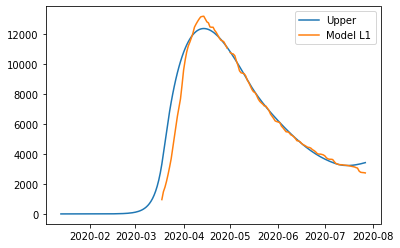

{'home': 0.9984828813819088, 'leisure': 0.8404203613095559, 'other': 0.8, 'school': 0.9110761135752674, 'transport': 0.8589833364955971, 'work': 0.8}
{'home': 0.9984828813819088, 'leisure': 0.10701090881894727, 'other': 0.07329793986528045, 'school': 0, 'transport': 0.1134281934337908, 'work': 0.4215975849897584}
{'home': 0.9984828813819088, 'leisure': 0.10701090881894727, 'other': 0.07329793986528045, 'school': 0, 'transport': 0.1134281934337908, 'work': 0.4215975849897584}
{'home': 0.9984828813819088, 'leisure': 0.12817673447355651, 'other': 0.17536394671088418, 'school': 0.30065511747983825, 'transport': 0.1976059428186527, 'work': 0.7359834359850885}
{'home': 0.9984828813819088, 'leisure': 0.24674537506623997, 'other': 0.24650920545903748, 'school': 0.6104209960954292, 'transport': 0.2615765860533792, 'work': 0.7364368056566014}
{'home': 0.9984828813819088, 'leisure': 0.40975396209992376, 'other': 0.3630194765296282, 'school': 0.6104209960954292, 'transport': 0.4325380553328656, 'w

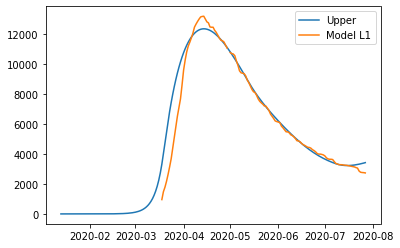

{'home': 0.9984602791147068, 'leisure': 0.841368396282845, 'other': 0.8, 'school': 0.9116833195594705, 'transport': 0.859644047477171, 'work': 0.8}
{'home': 0.9984602791147068, 'leisure': 0.10709245394724791, 'other': 0.07309855587697753, 'school': 0, 'transport': 0.11345312454502827, 'work': 0.4213208887398103}
{'home': 0.9984602791147068, 'leisure': 0.10709245394724791, 'other': 0.07309855587697753, 'school': 0, 'transport': 0.11345312454502827, 'work': 0.4213208887398103}
{'home': 0.9984602791147068, 'leisure': 0.1282881039651286, 'other': 0.1749226139314661, 'school': 0.30085549545462525, 'transport': 0.19764521693006729, 'work': 0.7347891425460287}
{'home': 0.9984602791147068, 'leisure': 0.24695565153573845, 'other': 0.24608554043316372, 'school': 0.6108278241048453, 'transport': 0.2616422521538493, 'work': 0.7352590246813231}
{'home': 0.9984602791147068, 'leisure': 0.4101677607754683, 'other': 0.36288529809798015, 'school': 0.6108278241048453, 'transport': 0.4326698771393578, 'wo

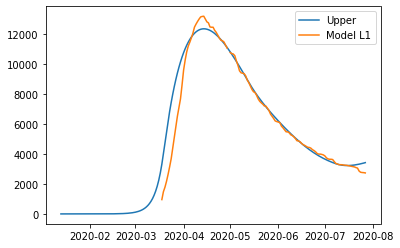

{'home': 0.9984602791147068, 'leisure': 0.841368396282845, 'other': 0.8, 'school': 0.9116833195594705, 'transport': 0.859644047477171, 'work': 0.8}
{'home': 0.9984602791147068, 'leisure': 0.10709245394724791, 'other': 0.07309855587697753, 'school': 0, 'transport': 0.11345312454502827, 'work': 0.4213208887398103}
{'home': 0.9984602791147068, 'leisure': 0.10709245394724791, 'other': 0.07309855587697753, 'school': 0, 'transport': 0.11345312454502827, 'work': 0.4213208887398103}
{'home': 0.9984602791147068, 'leisure': 0.1282881039651286, 'other': 0.1749226139314661, 'school': 0.30085549545462525, 'transport': 0.19764521693006729, 'work': 0.7347891425460287}
{'home': 0.9984602791147068, 'leisure': 0.24695565153573845, 'other': 0.24608554043316372, 'school': 0.6108278241048453, 'transport': 0.2616422521538493, 'work': 0.7352590246813231}
{'home': 0.9984602791147068, 'leisure': 0.4101677607754683, 'other': 0.36288529809798015, 'school': 0.6108278241048453, 'transport': 0.4326698771393578, 'wo

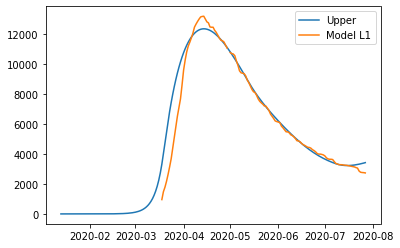

{'home': 0.9984602791147068, 'leisure': 0.841368396282845, 'other': 0.8, 'school': 0.9116833195594705, 'transport': 0.859644047477171, 'work': 0.8}
{'home': 0.9984602791147068, 'leisure': 0.10709245394724791, 'other': 0.07309855587697753, 'school': 0, 'transport': 0.11345312454502827, 'work': 0.4213208887398103}
{'home': 0.9984602791147068, 'leisure': 0.10709245394724791, 'other': 0.07309855587697753, 'school': 0, 'transport': 0.11345312454502827, 'work': 0.4213208887398103}
{'home': 0.9984602791147068, 'leisure': 0.1282881039651286, 'other': 0.1749226139314661, 'school': 0.30085549545462525, 'transport': 0.19764521693006729, 'work': 0.7347891425460287}
{'home': 0.9984602791147068, 'leisure': 0.24695565153573845, 'other': 0.24608554043316372, 'school': 0.6108278241048453, 'transport': 0.2616422521538493, 'work': 0.7352590246813231}
{'home': 0.9984602791147068, 'leisure': 0.4101677607754683, 'other': 0.36288529809798015, 'school': 0.6108278241048453, 'transport': 0.4326698771393578, 'wo

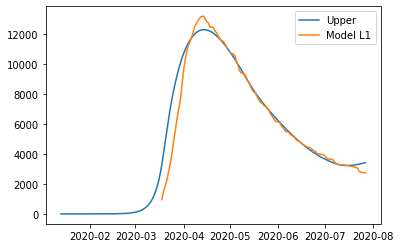

{'home': 0.9984676504639576, 'leisure': 0.8419068061761682, 'other': 0.8, 'school': 0.9117647679694236, 'transport': 0.8601192561324625, 'work': 0.8}
{'home': 0.9984676504639576, 'leisure': 0.10711933724808723, 'other': 0.07288549599139503, 'school': 0, 'transport': 0.11345439367813179, 'work': 0.4209869106876603}
{'home': 0.9984676504639576, 'leisure': 0.10711933724808723, 'other': 0.07288549599139503, 'school': 0, 'transport': 0.11345439367813179, 'work': 0.4209869106876603}
{'home': 0.9984676504639576, 'leisure': 0.12832782115089875, 'other': 0.1744582270815706, 'school': 0.3008823734299098, 'transport': 0.1976429641110476, 'work': 0.7337184799939211}
{'home': 0.9984676504639576, 'leisure': 0.24703311671428488, 'other': 0.24561663146809554, 'school': 0.6108823945395139, 'transport': 0.26165203588480734, 'work': 0.734203496059894}
{'home': 0.9984676504639576, 'leisure': 0.41036966667469255, 'other': 0.3626991983391176, 'school': 0.6108823945395139, 'transport': 0.43271054232799, 'wor

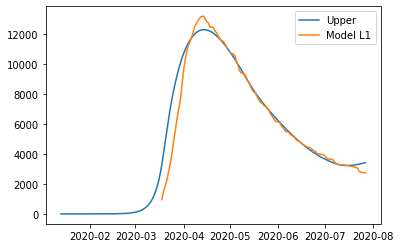

{'home': 0.9984676504639576, 'leisure': 0.8419068061761682, 'other': 0.8, 'school': 0.9117647679694236, 'transport': 0.8601192561324625, 'work': 0.8}
{'home': 0.9984676504639576, 'leisure': 0.10711933724808723, 'other': 0.07288549599139503, 'school': 0, 'transport': 0.11345439367813179, 'work': 0.4209869106876603}
{'home': 0.9984676504639576, 'leisure': 0.10711933724808723, 'other': 0.07288549599139503, 'school': 0, 'transport': 0.11345439367813179, 'work': 0.4209869106876603}
{'home': 0.9984676504639576, 'leisure': 0.12832782115089875, 'other': 0.1744582270815706, 'school': 0.3008823734299098, 'transport': 0.1976429641110476, 'work': 0.7337184799939211}
{'home': 0.9984676504639576, 'leisure': 0.24703311671428488, 'other': 0.24561663146809554, 'school': 0.6108823945395139, 'transport': 0.26165203588480734, 'work': 0.734203496059894}
{'home': 0.9984676504639576, 'leisure': 0.41036966667469255, 'other': 0.3626991983391176, 'school': 0.6108823945395139, 'transport': 0.43271054232799, 'wor

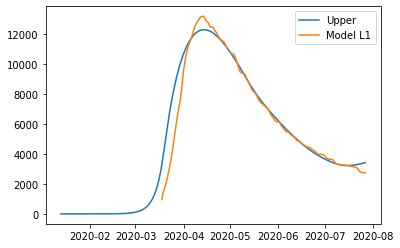

{'home': 0.9984676604639576, 'leisure': 0.8419068061761682, 'other': 0.8, 'school': 0.9117647679694236, 'transport': 0.8601192561324625, 'work': 0.8}
{'home': 0.9984676604639576, 'leisure': 0.10711933724808723, 'other': 0.07288549599139503, 'school': 0, 'transport': 0.11345439367813179, 'work': 0.4209869106876603}
{'home': 0.9984676604639576, 'leisure': 0.10711933724808723, 'other': 0.07288549599139503, 'school': 0, 'transport': 0.11345439367813179, 'work': 0.4209869106876603}
{'home': 0.9984676604639576, 'leisure': 0.12832782115089875, 'other': 0.1744582270815706, 'school': 0.3008823734299098, 'transport': 0.1976429641110476, 'work': 0.7337184799939211}
{'home': 0.9984676604639576, 'leisure': 0.24703311671428488, 'other': 0.24561663146809554, 'school': 0.6108823945395139, 'transport': 0.26165203588480734, 'work': 0.734203496059894}
{'home': 0.9984676604639576, 'leisure': 0.41036966667469255, 'other': 0.3626991983391176, 'school': 0.6108823945395139, 'transport': 0.43271054232799, 'wor

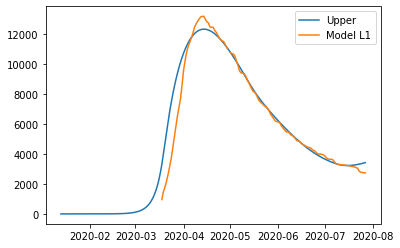

{'home': 0.998463281885682, 'leisure': 0.8415877213406359, 'other': 0.8, 'school': 0.9117164981422593, 'transport': 0.8598376270660252, 'work': 0.8}
{'home': 0.998463281885682, 'leisure': 0.10710341268094119, 'other': 0.07301176557844452, 'school': 0, 'transport': 0.11345365548874263, 'work': 0.42118483470558643}
{'home': 0.998463281885682, 'leisure': 0.10710341268094119, 'other': 0.07301176557844452, 'school': 0, 'transport': 0.11345365548874263, 'work': 0.42118483470558643}
{'home': 0.998463281885682, 'leisure': 0.12830429080584912, 'other': 0.17473344517627296, 'school': 0.3008664443869456, 'transport': 0.19764432455008227, 'work': 0.7343529822697203}
{'home': 0.998463281885682, 'leisure': 0.24698722228524692, 'other': 0.24589452958683844, 'school': 0.6108500537553138, 'transport': 0.26164626824738507, 'work': 0.734829029577574}
{'home': 0.998463281885682, 'leisure': 0.41025001966337166, 'other': 0.36280949005187874, 'school': 0.6108500537553138, 'transport': 0.4326864874682551, 'wo

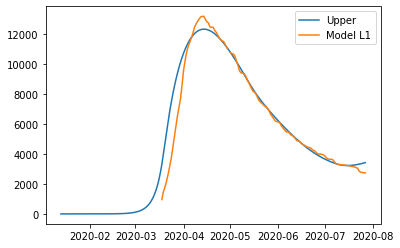

{'home': 0.998463281885682, 'leisure': 0.8415877213406359, 'other': 0.8, 'school': 0.9117164981422593, 'transport': 0.8598376270660252, 'work': 0.8}
{'home': 0.998463281885682, 'leisure': 0.10710341268094119, 'other': 0.07301176557844452, 'school': 0, 'transport': 0.11345365548874263, 'work': 0.42118483470558643}
{'home': 0.998463281885682, 'leisure': 0.10710341268094119, 'other': 0.07301176557844452, 'school': 0, 'transport': 0.11345365548874263, 'work': 0.42118483470558643}
{'home': 0.998463281885682, 'leisure': 0.12830429080584912, 'other': 0.17473344517627296, 'school': 0.3008664443869456, 'transport': 0.19764432455008227, 'work': 0.7343529822697203}
{'home': 0.998463281885682, 'leisure': 0.24698722228524692, 'other': 0.24589452958683844, 'school': 0.6108500537553138, 'transport': 0.26164626824738507, 'work': 0.734829029577574}
{'home': 0.998463281885682, 'leisure': 0.41025001966337166, 'other': 0.36280949005187874, 'school': 0.6108500537553138, 'transport': 0.4326864874682551, 'wo

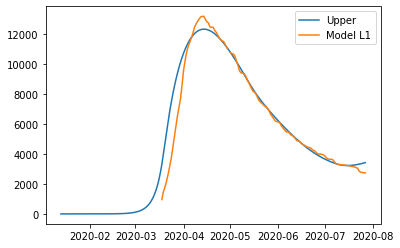

{'home': 0.998463281885682, 'leisure': 0.8415877213406359, 'other': 0.8, 'school': 0.9117164981422593, 'transport': 0.8598376270660252, 'work': 0.8}
{'home': 0.998463281885682, 'leisure': 0.10710341268094119, 'other': 0.07301176557844452, 'school': 0, 'transport': 0.11345365548874263, 'work': 0.42118483470558643}
{'home': 0.998463281885682, 'leisure': 0.10710341268094119, 'other': 0.07301176557844452, 'school': 0, 'transport': 0.11345365548874263, 'work': 0.42118483470558643}
{'home': 0.998463281885682, 'leisure': 0.12830429080584912, 'other': 0.17473344517627296, 'school': 0.3008664443869456, 'transport': 0.19764432455008227, 'work': 0.7343529822697203}
{'home': 0.998463281885682, 'leisure': 0.24698722228524692, 'other': 0.24589452958683844, 'school': 0.6108500537553138, 'transport': 0.26164626824738507, 'work': 0.734829029577574}
{'home': 0.998463281885682, 'leisure': 0.41025001966337166, 'other': 0.36280949005187874, 'school': 0.6108500537553138, 'transport': 0.4326864874682551, 'wo

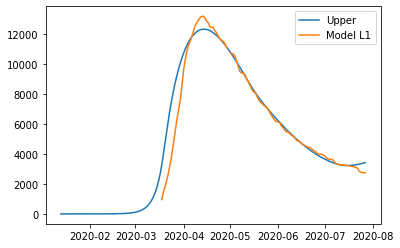

{'home': 0.9984371206846053, 'leisure': 0.8423609470973895, 'other': 0.8, 'school': 0.9122986993834621, 'transport': 0.8603585657434487, 'work': 0.8}
{'home': 0.9984371206846053, 'leisure': 0.10717628265718021, 'other': 0.07288265551764077, 'school': 0, 'transport': 0.11347986820475295, 'work': 0.421026195989003}
{'home': 0.9984371206846053, 'leisure': 0.10717628265718021, 'other': 0.07288265551764077, 'school': 0, 'transport': 0.11347986820475295, 'work': 0.421026195989003}
{'home': 0.9984371206846053, 'leisure': 0.12840337026582965, 'other': 0.17444501366608567, 'school': 0.3010585707965425, 'transport': 0.19768730663081227, 'work': 0.7334958896377515}
{'home': 0.9984371206846053, 'leisure': 0.24717305111234475, 'other': 0.24562635070335165, 'school': 0.6112401285869197, 'transport': 0.26171277276271643, 'work': 0.7339786136412403}
{'home': 0.9984371206846053, 'leisure': 0.4105989248410459, 'other': 0.362739563567116, 'school': 0.6112401285869197, 'transport': 0.4328116919787993, 'wo

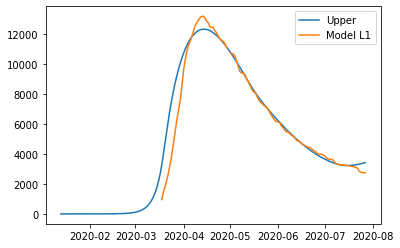

{'home': 0.9984371206846053, 'leisure': 0.8423609470973895, 'other': 0.8, 'school': 0.9122986993834621, 'transport': 0.8603585657434487, 'work': 0.8}
{'home': 0.9984371206846053, 'leisure': 0.10717628265718021, 'other': 0.07288265551764077, 'school': 0, 'transport': 0.11347986820475295, 'work': 0.421026195989003}
{'home': 0.9984371206846053, 'leisure': 0.10717628265718021, 'other': 0.07288265551764077, 'school': 0, 'transport': 0.11347986820475295, 'work': 0.421026195989003}
{'home': 0.9984371206846053, 'leisure': 0.12840337026582965, 'other': 0.17444501366608567, 'school': 0.3010585707965425, 'transport': 0.19768730663081227, 'work': 0.7334958896377515}
{'home': 0.9984371206846053, 'leisure': 0.24717305111234475, 'other': 0.24562635070335165, 'school': 0.6112401285869197, 'transport': 0.26171277276271643, 'work': 0.7339786136412403}
{'home': 0.9984371206846053, 'leisure': 0.4105989248410459, 'other': 0.362739563567116, 'school': 0.6112401285869197, 'transport': 0.4328116919787993, 'wo

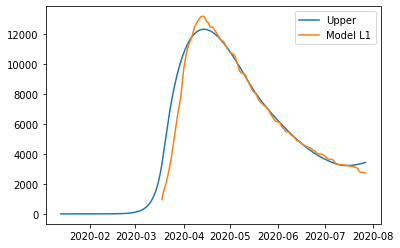

{'home': 0.9983324758802986, 'leisure': 0.8454538501244041, 'other': 0.8, 'school': 0.9146275043482732, 'transport': 0.8624423204531428, 'work': 0.8}
{'home': 0.9983324758802986, 'leisure': 0.10746726292082624, 'other': 0.07236632335840275, 'school': 0, 'transport': 0.11358397133721775, 'work': 0.4203914081200282}
{'home': 0.9983324758802986, 'leisure': 0.10746726292082624, 'other': 0.07236632335840275, 'school': 0, 'transport': 0.11358397133721775, 'work': 0.4203914081200282}
{'home': 0.9983324758802986, 'leisure': 0.12879932017242895, 'other': 0.17329152908463485, 'school': 0.3018270764349302, 'transport': 0.19785788518673736, 'work': 0.7300662602441261}
{'home': 0.9983324758802986, 'leisure': 0.24791556225603392, 'other': 0.24455385967429635, 'school': 0.6128004279133431, 'transport': 0.26197717284147676, 'work': 0.730575700836638}
{'home': 0.9983324758802986, 'leisure': 0.4119939972468835, 'other': 0.3624599161667453, 'school': 0.6128004279133431, 'transport': 0.433310102071591, 'w

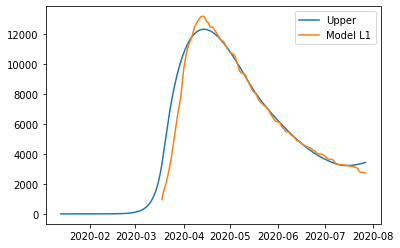

{'home': 0.9983324758802986, 'leisure': 0.8454538501244041, 'other': 0.8, 'school': 0.9146275043482732, 'transport': 0.8624423204531428, 'work': 0.8}
{'home': 0.9983324758802986, 'leisure': 0.10746726292082624, 'other': 0.07236632335840275, 'school': 0, 'transport': 0.11358397133721775, 'work': 0.4203914081200282}
{'home': 0.9983324758802986, 'leisure': 0.10746726292082624, 'other': 0.07236632335840275, 'school': 0, 'transport': 0.11358397133721775, 'work': 0.4203914081200282}
{'home': 0.9983324758802986, 'leisure': 0.12879932017242895, 'other': 0.17329152908463485, 'school': 0.3018270764349302, 'transport': 0.19785788518673736, 'work': 0.7300662602441261}
{'home': 0.9983324758802986, 'leisure': 0.24791556225603392, 'other': 0.24455385967429635, 'school': 0.6128004279133431, 'transport': 0.26197717284147676, 'work': 0.730575700836638}
{'home': 0.9983324758802986, 'leisure': 0.4119939972468835, 'other': 0.3624599161667453, 'school': 0.6128004279133431, 'transport': 0.433310102071591, 'w

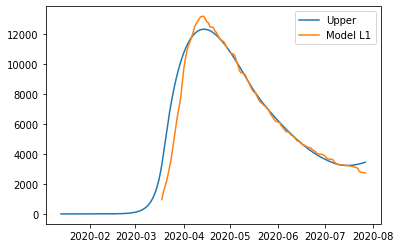

{'home': 0.9983195634887726, 'leisure': 0.8473617881472761, 'other': 0.8, 'school': 0.9160931173239999, 'transport': 0.8637892599232996, 'work': 0.8}
{'home': 0.9983195634887726, 'leisure': 0.10764874890846812, 'other': 0.0720578371259989, 'school': 0, 'transport': 0.11365720929064442, 'work': 0.42006500846989997}
{'home': 0.9983195634887726, 'leisure': 0.10764874890846812, 'other': 0.0720578371259989, 'school': 0, 'transport': 0.11365720929064442, 'work': 0.42006500846989997}
{'home': 0.9983195634887726, 'leisure': 0.12904855771268856, 'other': 0.17260055758439602, 'school': 0.30231072871692, 'transport': 0.197979056024372, 'work': 0.7279424309093794}
{'home': 0.9983195634887726, 'leisure': 0.24838086394887773, 'other': 0.24391947823585172, 'school': 0.61378238860708, 'transport': 0.2621614955187997, 'work': 0.7284461718815789}
{'home': 0.9983195634887726, 'leisure': 0.4128623481646896, 'other': 0.36231276872488855, 'school': 0.61378238860708, 'transport': 0.43365181803788644, 'work':

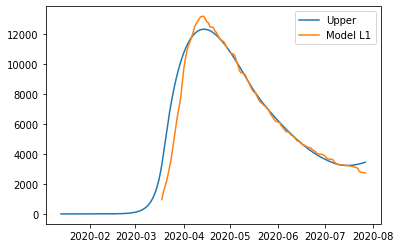

{'home': 0.9983195634887726, 'leisure': 0.8473617881472761, 'other': 0.8, 'school': 0.9160931173239999, 'transport': 0.8637892599232996, 'work': 0.8}
{'home': 0.9983195634887726, 'leisure': 0.10764874890846812, 'other': 0.0720578371259989, 'school': 0, 'transport': 0.11365720929064442, 'work': 0.42006500846989997}
{'home': 0.9983195634887726, 'leisure': 0.10764874890846812, 'other': 0.0720578371259989, 'school': 0, 'transport': 0.11365720929064442, 'work': 0.42006500846989997}
{'home': 0.9983195634887726, 'leisure': 0.12904855771268856, 'other': 0.17260055758439602, 'school': 0.30231072871692, 'transport': 0.197979056024372, 'work': 0.7279424309093794}
{'home': 0.9983195634887726, 'leisure': 0.24838086394887773, 'other': 0.24391947823585172, 'school': 0.61378238860708, 'transport': 0.2621614955187997, 'work': 0.7284461718815789}
{'home': 0.9983195634887726, 'leisure': 0.4128623481646896, 'other': 0.36231276872488855, 'school': 0.61378238860708, 'transport': 0.43365181803788644, 'work':

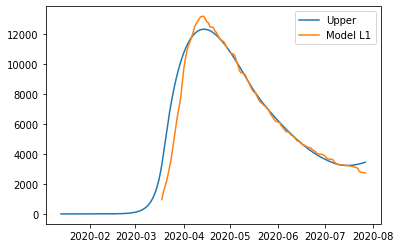

{'home': 0.9983195634887726, 'leisure': 0.8473617881472761, 'other': 0.8, 'school': 0.9160931173239999, 'transport': 0.8637892599232996, 'work': 0.8}
{'home': 0.9983195634887726, 'leisure': 0.10764874890846812, 'other': 0.0720578371259989, 'school': 0, 'transport': 0.11365720929064442, 'work': 0.42006500846989997}
{'home': 0.9983195634887726, 'leisure': 0.10764874890846812, 'other': 0.0720578371259989, 'school': 0, 'transport': 0.11365720929064442, 'work': 0.42006500846989997}
{'home': 0.9983195634887726, 'leisure': 0.12904855771268856, 'other': 0.17260055758439602, 'school': 0.30231072871692, 'transport': 0.197979056024372, 'work': 0.7279424309093794}
{'home': 0.9983195634887726, 'leisure': 0.24838086394887773, 'other': 0.24391947823585172, 'school': 0.61378238860708, 'transport': 0.2621614955187997, 'work': 0.7284461718815789}
{'home': 0.9983195634887726, 'leisure': 0.4128623481646896, 'other': 0.36231276872488855, 'school': 0.61378238860708, 'transport': 0.43365181803788644, 'work':

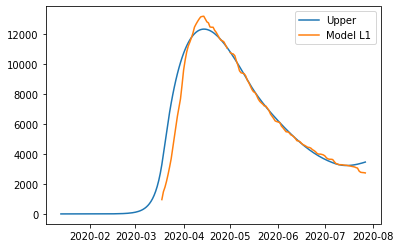

{'home': 0.9982675521951908, 'leisure': 0.8504896336261207, 'other': 0.8, 'school': 0.918485809160859, 'transport': 0.8659599207791286, 'work': 0.8}
{'home': 0.9982675521951908, 'leisure': 0.10794439842837865, 'other': 0.07154735947835013, 'school': 0, 'transport': 0.11377068420775406, 'work': 0.41949323278050293}
{'home': 0.9982675521951908, 'leisure': 0.10794439842837865, 'other': 0.07154735947835013, 'school': 0, 'transport': 0.11377068420775406, 'work': 0.41949323278050293}
{'home': 0.9982675521951908, 'leisure': 0.12945378524196655, 'other': 0.17145814670405324, 'school': 0.3031003170230835, 'transport': 0.1981660183308083, 'work': 0.72446687019566}
{'home': 0.9982675521951908, 'leisure': 0.24913836152112695, 'other': 0.2428660279868291, 'school': 0.6153854921377756, 'transport': 0.26244839720884827, 'work': 0.7249739413757103}
{'home': 0.9982675521951908, 'leisure': 0.4142806296380797, 'other': 0.36205752637292876, 'school': 0.6153854921377756, 'transport': 0.4341876246321712, 'w

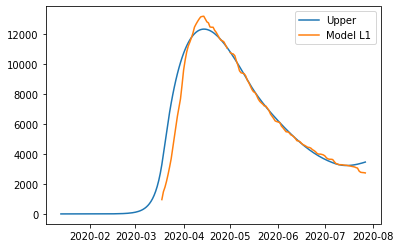

{'home': 0.9982675521951908, 'leisure': 0.8504896336261207, 'other': 0.8, 'school': 0.918485809160859, 'transport': 0.8659599207791286, 'work': 0.8}
{'home': 0.9982675521951908, 'leisure': 0.10794439842837865, 'other': 0.07154735947835013, 'school': 0, 'transport': 0.11377068420775406, 'work': 0.41949323278050293}
{'home': 0.9982675521951908, 'leisure': 0.10794439842837865, 'other': 0.07154735947835013, 'school': 0, 'transport': 0.11377068420775406, 'work': 0.41949323278050293}
{'home': 0.9982675521951908, 'leisure': 0.12945378524196655, 'other': 0.17145814670405324, 'school': 0.3031003170230835, 'transport': 0.1981660183308083, 'work': 0.72446687019566}
{'home': 0.9982675521951908, 'leisure': 0.24913836152112695, 'other': 0.2428660279868291, 'school': 0.6153854921377756, 'transport': 0.26244839720884827, 'work': 0.7249739413757103}
{'home': 0.9982675521951908, 'leisure': 0.4142806296380797, 'other': 0.36205752637292876, 'school': 0.6153854921377756, 'transport': 0.4341876246321712, 'w

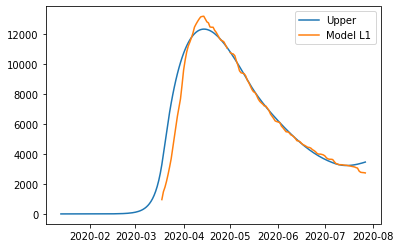

{'home': 0.9982675621951909, 'leisure': 0.8504896336261207, 'other': 0.8, 'school': 0.918485809160859, 'transport': 0.8659599207791286, 'work': 0.8}
{'home': 0.9982675621951909, 'leisure': 0.10794439842837865, 'other': 0.07154735947835013, 'school': 0, 'transport': 0.11377068420775406, 'work': 0.41949323278050293}
{'home': 0.9982675621951909, 'leisure': 0.10794439842837865, 'other': 0.07154735947835013, 'school': 0, 'transport': 0.11377068420775406, 'work': 0.41949323278050293}
{'home': 0.9982675621951909, 'leisure': 0.12945378524196655, 'other': 0.17145814670405324, 'school': 0.3031003170230835, 'transport': 0.1981660183308083, 'work': 0.72446687019566}
{'home': 0.9982675621951909, 'leisure': 0.24913836152112695, 'other': 0.2428660279868291, 'school': 0.6153854921377756, 'transport': 0.26244839720884827, 'work': 0.7249739413757103}
{'home': 0.9982675621951909, 'leisure': 0.4142806296380797, 'other': 0.36205752637292876, 'school': 0.6153854921377756, 'transport': 0.4341876246321712, 'w

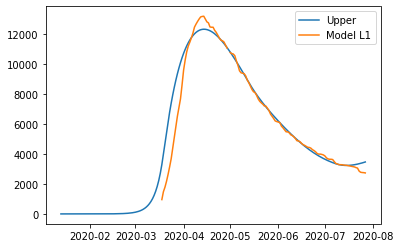

{'home': 0.9983219238662514, 'leisure': 0.8501901160979939, 'other': 0.8, 'school': 0.9182411606913293, 'transport': 0.865816283012551, 'work': 0.8}
{'home': 0.9983219238662514, 'leisure': 0.10791415449777743, 'other': 0.07158458790641606, 'school': 0, 'transport': 0.1137644017096781, 'work': 0.4195641353757055}
{'home': 0.9983219238662514, 'leisure': 0.10791415449777743, 'other': 0.07158458790641606, 'school': 0, 'transport': 0.1137644017096781, 'work': 0.4195641353757055}
{'home': 0.9983219238662514, 'leisure': 0.12941439226357168, 'other': 0.1715418615546928, 'school': 0.3030195830281387, 'transport': 0.1981558955948014, 'work': 0.7247200900385821}
{'home': 0.9983219238662514, 'leisure': 0.24906368305760604, 'other': 0.24294353889890297, 'school': 0.6152215776631906, 'transport': 0.26243217045079786, 'work': 0.7252108561086567}
{'home': 0.9983219238662514, 'leisure': 0.4141445335355362, 'other': 0.3620796433415599, 'school': 0.6152215776631906, 'transport': 0.4341562934373077, 'work

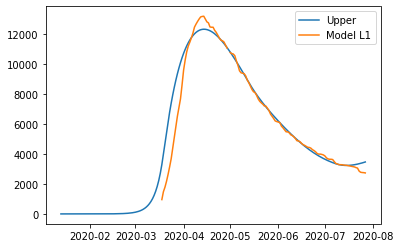

{'home': 0.9983219238662514, 'leisure': 0.8501901160979939, 'other': 0.8, 'school': 0.9182411606913293, 'transport': 0.865816283012551, 'work': 0.8}
{'home': 0.9983219238662514, 'leisure': 0.10791415449777743, 'other': 0.07158458790641606, 'school': 0, 'transport': 0.1137644017096781, 'work': 0.4195641353757055}
{'home': 0.9983219238662514, 'leisure': 0.10791415449777743, 'other': 0.07158458790641606, 'school': 0, 'transport': 0.1137644017096781, 'work': 0.4195641353757055}
{'home': 0.9983219238662514, 'leisure': 0.12941439226357168, 'other': 0.1715418615546928, 'school': 0.3030195830281387, 'transport': 0.1981558955948014, 'work': 0.7247200900385821}
{'home': 0.9983219238662514, 'leisure': 0.24906368305760604, 'other': 0.24294353889890297, 'school': 0.6152215776631906, 'transport': 0.26243217045079786, 'work': 0.7252108561086567}
{'home': 0.9983219238662514, 'leisure': 0.4141445335355362, 'other': 0.3620796433415599, 'school': 0.6152215776631906, 'transport': 0.4341562934373077, 'work

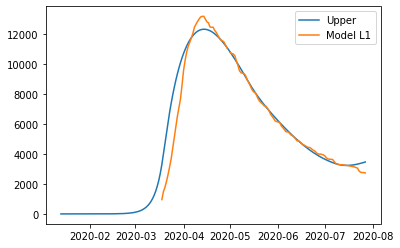

{'home': 0.9983219338662515, 'leisure': 0.8501901160979939, 'other': 0.8, 'school': 0.9182411606913293, 'transport': 0.865816283012551, 'work': 0.8}
{'home': 0.9983219338662515, 'leisure': 0.10791415449777743, 'other': 0.07158458790641606, 'school': 0, 'transport': 0.1137644017096781, 'work': 0.4195641353757055}
{'home': 0.9983219338662515, 'leisure': 0.10791415449777743, 'other': 0.07158458790641606, 'school': 0, 'transport': 0.1137644017096781, 'work': 0.4195641353757055}
{'home': 0.9983219338662515, 'leisure': 0.12941439226357168, 'other': 0.1715418615546928, 'school': 0.3030195830281387, 'transport': 0.1981558955948014, 'work': 0.7247200900385821}
{'home': 0.9983219338662515, 'leisure': 0.24906368305760604, 'other': 0.24294353889890297, 'school': 0.6152215776631906, 'transport': 0.26243217045079786, 'work': 0.7252108561086567}
{'home': 0.9983219338662515, 'leisure': 0.4141445335355362, 'other': 0.3620796433415599, 'school': 0.6152215776631906, 'transport': 0.4341562934373077, 'work

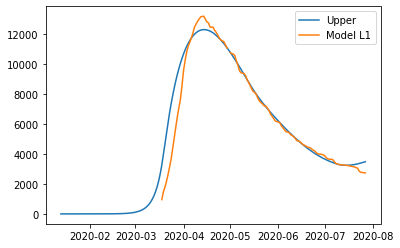

{'home': 0.9984398179935123, 'leisure': 0.8516920381794544, 'other': 0.8, 'school': 0.9192177633680134, 'transport': 0.8670356275047703, 'work': 0.8}
{'home': 0.9984398179935123, 'leisure': 0.10804186086313466, 'other': 0.07126454884284542, 'school': 0, 'transport': 0.11382044204797262, 'work': 0.41922948616267325}
{'home': 0.9984398179935123, 'leisure': 0.10804186086313466, 'other': 0.07126454884284542, 'school': 0, 'transport': 0.11382044204797262, 'work': 0.41922948616267325}
{'home': 0.9984398179935123, 'leisure': 0.1295952324649085, 'other': 0.17083170493286115, 'school': 0.30334186191144447, 'transport': 0.19824683236179264, 'work': 0.7226936643367483}
{'home': 0.9984398179935123, 'leisure': 0.24940076668093558, 'other': 0.2422728522630674, 'school': 0.615875901456569, 'transport': 0.26257608025887363, 'work': 0.7231573763261009}
{'home': 0.9984398179935123, 'leisure': 0.4148076016423234, 'other': 0.36189512900983045, 'school': 0.615875901456569, 'transport': 0.43443260971453496,

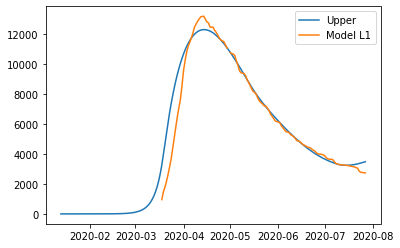

{'home': 0.9984398179935123, 'leisure': 0.8516920381794544, 'other': 0.8, 'school': 0.9192177633680134, 'transport': 0.8670356275047703, 'work': 0.8}
{'home': 0.9984398179935123, 'leisure': 0.10804186086313466, 'other': 0.07126454884284542, 'school': 0, 'transport': 0.11382044204797262, 'work': 0.41922948616267325}
{'home': 0.9984398179935123, 'leisure': 0.10804186086313466, 'other': 0.07126454884284542, 'school': 0, 'transport': 0.11382044204797262, 'work': 0.41922948616267325}
{'home': 0.9984398179935123, 'leisure': 0.1295952324649085, 'other': 0.17083170493286115, 'school': 0.30334186191144447, 'transport': 0.19824683236179264, 'work': 0.7226936643367483}
{'home': 0.9984398179935123, 'leisure': 0.24940076668093558, 'other': 0.2422728522630674, 'school': 0.615875901456569, 'transport': 0.26257608025887363, 'work': 0.7231573763261009}
{'home': 0.9984398179935123, 'leisure': 0.4148076016423234, 'other': 0.36189512900983045, 'school': 0.615875901456569, 'transport': 0.43443260971453496,

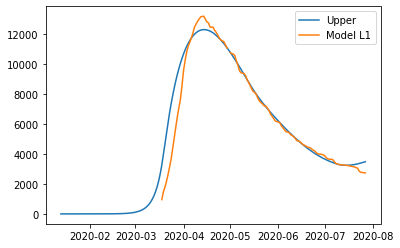

{'home': 0.9984398279935124, 'leisure': 0.8516920381794544, 'other': 0.8, 'school': 0.9192177633680134, 'transport': 0.8670356275047703, 'work': 0.8}
{'home': 0.9984398279935124, 'leisure': 0.10804186086313466, 'other': 0.07126454884284542, 'school': 0, 'transport': 0.11382044204797262, 'work': 0.41922948616267325}
{'home': 0.9984398279935124, 'leisure': 0.10804186086313466, 'other': 0.07126454884284542, 'school': 0, 'transport': 0.11382044204797262, 'work': 0.41922948616267325}
{'home': 0.9984398279935124, 'leisure': 0.1295952324649085, 'other': 0.17083170493286115, 'school': 0.30334186191144447, 'transport': 0.19824683236179264, 'work': 0.7226936643367483}
{'home': 0.9984398279935124, 'leisure': 0.24940076668093558, 'other': 0.2422728522630674, 'school': 0.615875901456569, 'transport': 0.26257608025887363, 'work': 0.7231573763261009}
{'home': 0.9984398279935124, 'leisure': 0.4148076016423234, 'other': 0.36189512900983045, 'school': 0.615875901456569, 'transport': 0.43443260971453496,

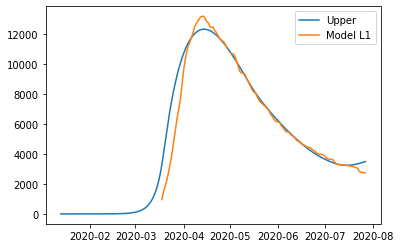

{'home': 0.9984097067908045, 'leisure': 0.8550278969322331, 'other': 0.8, 'school': 0.9217220639226272, 'transport': 0.8693549905587756, 'work': 0.8}
{'home': 0.9984097067908045, 'leisure': 0.10835498713003647, 'other': 0.07071664333800443, 'school': 0, 'transport': 0.11393884407768211, 'work': 0.4186087830481487}
{'home': 0.9984097067908045, 'leisure': 0.10835498713003647, 'other': 0.07071664333800443, 'school': 0, 'transport': 0.11393884407768211, 'work': 0.4186087830481487}
{'home': 0.9984097067908045, 'leisure': 0.130025463426121, 'other': 0.16960594825176695, 'school': 0.304168281094467, 'transport': 0.1984414641634986, 'work': 0.7189696471538172}
{'home': 0.9984097067908045, 'leisure': 0.2502046407954369, 'other': 0.24114098762822045, 'school': 0.6175537828281603, 'transport': 0.2628763995312637, 'work': 0.7194385334050093}
{'home': 0.9984097067908045, 'leisure': 0.4163170618433917, 'other': 0.36161926381460263, 'school': 0.6175537828281603, 'transport': 0.43499586197835605, 'wor

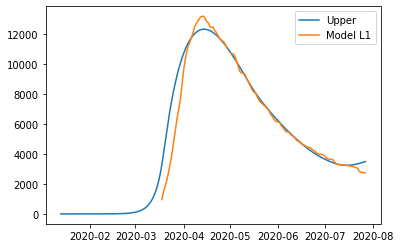

{'home': 0.9984097067908045, 'leisure': 0.8550278969322331, 'other': 0.8, 'school': 0.9217220639226272, 'transport': 0.8693549905587756, 'work': 0.8}
{'home': 0.9984097067908045, 'leisure': 0.10835498713003647, 'other': 0.07071664333800443, 'school': 0, 'transport': 0.11393884407768211, 'work': 0.4186087830481487}
{'home': 0.9984097067908045, 'leisure': 0.10835498713003647, 'other': 0.07071664333800443, 'school': 0, 'transport': 0.11393884407768211, 'work': 0.4186087830481487}
{'home': 0.9984097067908045, 'leisure': 0.130025463426121, 'other': 0.16960594825176695, 'school': 0.304168281094467, 'transport': 0.1984414641634986, 'work': 0.7189696471538172}
{'home': 0.9984097067908045, 'leisure': 0.2502046407954369, 'other': 0.24114098762822045, 'school': 0.6175537828281603, 'transport': 0.2628763995312637, 'work': 0.7194385334050093}
{'home': 0.9984097067908045, 'leisure': 0.4163170618433917, 'other': 0.36161926381460263, 'school': 0.6175537828281603, 'transport': 0.43499586197835605, 'wor

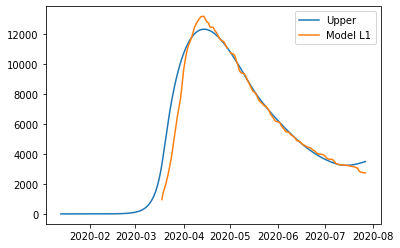

{'home': 0.9984097167908046, 'leisure': 0.8550278969322331, 'other': 0.8, 'school': 0.9217220639226272, 'transport': 0.8693549905587756, 'work': 0.8}
{'home': 0.9984097167908046, 'leisure': 0.10835498713003647, 'other': 0.07071664333800443, 'school': 0, 'transport': 0.11393884407768211, 'work': 0.4186087830481487}
{'home': 0.9984097167908046, 'leisure': 0.10835498713003647, 'other': 0.07071664333800443, 'school': 0, 'transport': 0.11393884407768211, 'work': 0.4186087830481487}
{'home': 0.9984097167908046, 'leisure': 0.130025463426121, 'other': 0.16960594825176695, 'school': 0.304168281094467, 'transport': 0.1984414641634986, 'work': 0.7189696471538172}
{'home': 0.9984097167908046, 'leisure': 0.2502046407954369, 'other': 0.24114098762822045, 'school': 0.6175537828281603, 'transport': 0.2628763995312637, 'work': 0.7194385334050093}
{'home': 0.9984097167908046, 'leisure': 0.4163170618433917, 'other': 0.36161926381460263, 'school': 0.6175537828281603, 'transport': 0.43499586197835605, 'wor

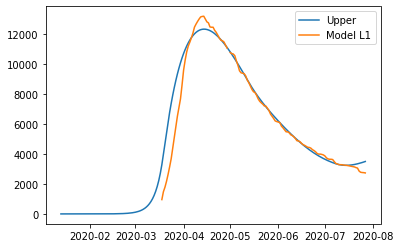

{'home': 0.9984251064340592, 'leisure': 0.8561276559046627, 'other': 0.8, 'school': 0.9225216916200775, 'transport': 0.8701518842692024, 'work': 0.8}
{'home': 0.9984251064340592, 'leisure': 0.1084554938128701, 'other': 0.07052247748560077, 'school': 0, 'transport': 0.11397792398775197, 'work': 0.41839399080162176}
{'home': 0.9984251064340592, 'leisure': 0.1084554938128701, 'other': 0.07052247748560077, 'school': 0, 'transport': 0.11397792398775197, 'work': 0.41839399080162176}
{'home': 0.9984251064340592, 'leisure': 0.13016472014424862, 'other': 0.1691726516140224, 'school': 0.3044321582346256, 'transport': 0.19850541103880287, 'work': 0.717676549956066}
{'home': 0.9984251064340592, 'leisure': 0.25046463385115236, 'other': 0.24073811630887865, 'school': 0.6180895333854519, 'transport': 0.26297601977255286, 'work': 0.7181415704826083}
{'home': 0.9984251064340592, 'leisure': 0.41681137215439695, 'other': 0.36151710973801027, 'school': 0.6180895333854519, 'transport': 0.4351842723098548, 

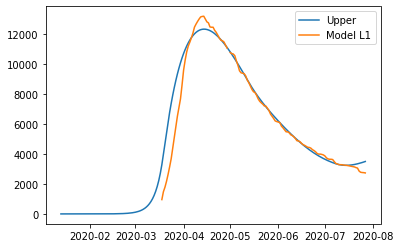

{'home': 0.9984251064340592, 'leisure': 0.8561276559046627, 'other': 0.8, 'school': 0.9225216916200775, 'transport': 0.8701518842692024, 'work': 0.8}
{'home': 0.9984251064340592, 'leisure': 0.1084554938128701, 'other': 0.07052247748560077, 'school': 0, 'transport': 0.11397792398775197, 'work': 0.41839399080162176}
{'home': 0.9984251064340592, 'leisure': 0.1084554938128701, 'other': 0.07052247748560077, 'school': 0, 'transport': 0.11397792398775197, 'work': 0.41839399080162176}
{'home': 0.9984251064340592, 'leisure': 0.13016472014424862, 'other': 0.1691726516140224, 'school': 0.3044321582346256, 'transport': 0.19850541103880287, 'work': 0.717676549956066}
{'home': 0.9984251064340592, 'leisure': 0.25046463385115236, 'other': 0.24073811630887865, 'school': 0.6180895333854519, 'transport': 0.26297601977255286, 'work': 0.7181415704826083}
{'home': 0.9984251064340592, 'leisure': 0.41681137215439695, 'other': 0.36151710973801027, 'school': 0.6180895333854519, 'transport': 0.4351842723098548, 

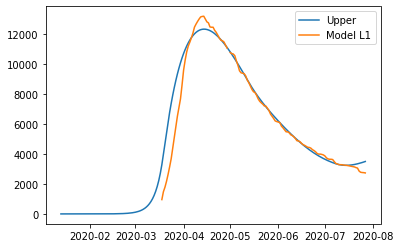

{'home': 0.9984251164340593, 'leisure': 0.8561276559046627, 'other': 0.8, 'school': 0.9225216916200775, 'transport': 0.8701518842692024, 'work': 0.8}
{'home': 0.9984251164340593, 'leisure': 0.1084554938128701, 'other': 0.07052247748560077, 'school': 0, 'transport': 0.11397792398775197, 'work': 0.41839399080162176}
{'home': 0.9984251164340593, 'leisure': 0.1084554938128701, 'other': 0.07052247748560077, 'school': 0, 'transport': 0.11397792398775197, 'work': 0.41839399080162176}
{'home': 0.9984251164340593, 'leisure': 0.13016472014424862, 'other': 0.1691726516140224, 'school': 0.3044321582346256, 'transport': 0.19850541103880287, 'work': 0.717676549956066}
{'home': 0.9984251164340593, 'leisure': 0.25046463385115236, 'other': 0.24073811630887865, 'school': 0.6180895333854519, 'transport': 0.26297601977255286, 'work': 0.7181415704826083}
{'home': 0.9984251164340593, 'leisure': 0.41681137215439695, 'other': 0.36151710973801027, 'school': 0.6180895333854519, 'transport': 0.4351842723098548, 

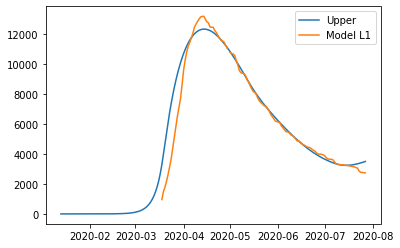

{'home': 0.998471273326162, 'leisure': 0.8571372681978657, 'other': 0.8, 'school': 0.9232767833303894, 'transport': 0.8708992622651732, 'work': 0.8}
{'home': 0.998471273326162, 'leisure': 0.10854188224884712, 'other': 0.07031784055279981, 'school': 0, 'transport': 0.11400853866402678, 'work': 0.41816063279038085}
{'home': 0.998471273326162, 'leisure': 0.10854188224884712, 'other': 0.07031784055279981, 'school': 0, 'transport': 0.11400853866402678, 'work': 0.41816063279038085}
{'home': 0.998471273326162, 'leisure': 0.13028483721870965, 'other': 0.16871827152509924, 'school': 0.3046813384990285, 'transport': 0.1985543436608653, 'work': 0.716398759041966}
{'home': 0.998471273326162, 'leisure': 0.2506899513272913, 'other': 0.2403069610237819, 'school': 0.618595444831361, 'transport': 0.26305583374918884, 'work': 0.7168531045785645}
{'home': 0.998471273326162, 'leisure': 0.4172528765133089, 'other': 0.361388083479004, 'school': 0.618595444831361, 'transport': 0.43534101796315816, 'work': 0.

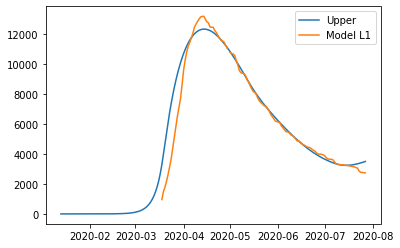

{'home': 0.998471273326162, 'leisure': 0.8571372681978657, 'other': 0.8, 'school': 0.9232767833303894, 'transport': 0.8708992622651732, 'work': 0.8}
{'home': 0.998471273326162, 'leisure': 0.10854188224884712, 'other': 0.07031784055279981, 'school': 0, 'transport': 0.11400853866402678, 'work': 0.41816063279038085}
{'home': 0.998471273326162, 'leisure': 0.10854188224884712, 'other': 0.07031784055279981, 'school': 0, 'transport': 0.11400853866402678, 'work': 0.41816063279038085}
{'home': 0.998471273326162, 'leisure': 0.13028483721870965, 'other': 0.16871827152509924, 'school': 0.3046813384990285, 'transport': 0.1985543436608653, 'work': 0.716398759041966}
{'home': 0.998471273326162, 'leisure': 0.2506899513272913, 'other': 0.2403069610237819, 'school': 0.618595444831361, 'transport': 0.26305583374918884, 'work': 0.7168531045785645}
{'home': 0.998471273326162, 'leisure': 0.4172528765133089, 'other': 0.361388083479004, 'school': 0.618595444831361, 'transport': 0.43534101796315816, 'work': 0.

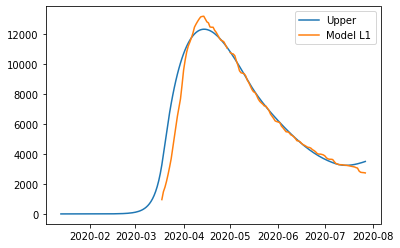

{'home': 0.9985380298588515, 'leisure': 0.8570100725994348, 'other': 0.8, 'school': 0.9231999021969184, 'transport': 0.8708607497213485, 'work': 0.8}
{'home': 0.9985380298588515, 'leisure': 0.10852257691957867, 'other': 0.07030355601061819, 'school': 0, 'transport': 0.11400069403187726, 'work': 0.41815321591717836}
{'home': 0.9985380298588515, 'leisure': 0.10852257691957867, 'other': 0.07030355601061819, 'school': 0, 'transport': 0.11400069403187726, 'work': 0.41815321591717836}
{'home': 0.9985380298588515, 'leisure': 0.13025965016093047, 'other': 0.16868924297276366, 'school': 0.3046559677249831, 'transport': 0.19854035681007334, 'work': 0.7164008158790139}
{'home': 0.9985380298588515, 'leisure': 0.25064360362064214, 'other': 0.24027027938149206, 'school': 0.6185439344719353, 'transport': 0.2630375650523607, 'work': 0.71683842427904}
{'home': 0.9985380298588515, 'leisure': 0.41718170286766826, 'other': 0.36135817943931475, 'school': 0.6185439344719353, 'transport': 0.4353122587614587,

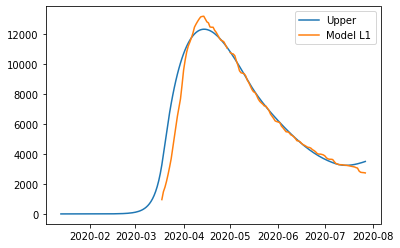

{'home': 0.9985380298588515, 'leisure': 0.8570100725994348, 'other': 0.8, 'school': 0.9231999021969184, 'transport': 0.8708607497213485, 'work': 0.8}
{'home': 0.9985380298588515, 'leisure': 0.10852257691957867, 'other': 0.07030355601061819, 'school': 0, 'transport': 0.11400069403187726, 'work': 0.41815321591717836}
{'home': 0.9985380298588515, 'leisure': 0.10852257691957867, 'other': 0.07030355601061819, 'school': 0, 'transport': 0.11400069403187726, 'work': 0.41815321591717836}
{'home': 0.9985380298588515, 'leisure': 0.13025965016093047, 'other': 0.16868924297276366, 'school': 0.3046559677249831, 'transport': 0.19854035681007334, 'work': 0.7164008158790139}
{'home': 0.9985380298588515, 'leisure': 0.25064360362064214, 'other': 0.24027027938149206, 'school': 0.6185439344719353, 'transport': 0.2630375650523607, 'work': 0.71683842427904}
{'home': 0.9985380298588515, 'leisure': 0.41718170286766826, 'other': 0.36135817943931475, 'school': 0.6185439344719353, 'transport': 0.4353122587614587,

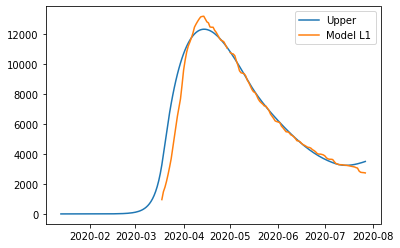

{'home': 0.9985380298588515, 'leisure': 0.8570100725994348, 'other': 0.8, 'school': 0.9231999021969184, 'transport': 0.8708607497213485, 'work': 0.8}
{'home': 0.9985380298588515, 'leisure': 0.10852257691957867, 'other': 0.07030355601061819, 'school': 0, 'transport': 0.11400069403187726, 'work': 0.41815321591717836}
{'home': 0.9985380298588515, 'leisure': 0.10852257691957867, 'other': 0.07030355601061819, 'school': 0, 'transport': 0.11400069403187726, 'work': 0.41815321591717836}
{'home': 0.9985380298588515, 'leisure': 0.13025965016093047, 'other': 0.16868924297276366, 'school': 0.3046559677249831, 'transport': 0.19854035681007334, 'work': 0.7164008158790139}
{'home': 0.9985380298588515, 'leisure': 0.25064360362064214, 'other': 0.24027027938149206, 'school': 0.6185439344719353, 'transport': 0.2630375650523607, 'work': 0.71683842427904}
{'home': 0.9985380298588515, 'leisure': 0.41718170286766826, 'other': 0.36135817943931475, 'school': 0.6185439344719353, 'transport': 0.4353122587614587,

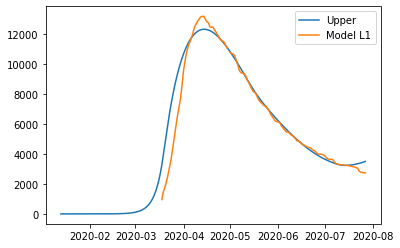

{'home': 0.9985487811804254, 'leisure': 0.8569618618427909, 'other': 0.8, 'school': 0.9231676173265108, 'transport': 0.8708355114534904, 'work': 0.8}
{'home': 0.9985487811804254, 'leisure': 0.10851619940135679, 'other': 0.07030267879994738, 'school': 0, 'transport': 0.11399768311774647, 'work': 0.4181514753524558}
{'home': 0.9985487811804254, 'leisure': 0.10851619940135679, 'other': 0.07030267879994738, 'school': 0, 'transport': 0.11399768311774647, 'work': 0.4181514753524558}
{'home': 0.9985487811804254, 'leisure': 0.13025107911331588, 'other': 0.16868806910519094, 'school': 0.30464531371774856, 'transport': 0.19853508581894574, 'work': 0.7164222998703016}
{'home': 0.9985487811804254, 'leisure': 0.2506278735053699, 'other': 0.2402664236862048, 'school': 0.6185223036087623, 'transport': 0.26303040791749693, 'work': 0.7168570925937913}
{'home': 0.9985487811804254, 'leisure': 0.4171562406737905, 'other': 0.3613512435728377, 'school': 0.6185223036087623, 'transport': 0.4353004496128616, '

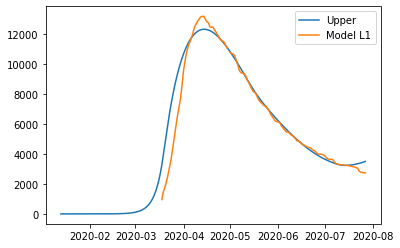

{'home': 0.9985487811804254, 'leisure': 0.8569618618427909, 'other': 0.8, 'school': 0.9231676173265108, 'transport': 0.8708355114534904, 'work': 0.8}
{'home': 0.9985487811804254, 'leisure': 0.10851619940135679, 'other': 0.07030267879994738, 'school': 0, 'transport': 0.11399768311774647, 'work': 0.4181514753524558}
{'home': 0.9985487811804254, 'leisure': 0.10851619940135679, 'other': 0.07030267879994738, 'school': 0, 'transport': 0.11399768311774647, 'work': 0.4181514753524558}
{'home': 0.9985487811804254, 'leisure': 0.13025107911331588, 'other': 0.16868806910519094, 'school': 0.30464531371774856, 'transport': 0.19853508581894574, 'work': 0.7164222998703016}
{'home': 0.9985487811804254, 'leisure': 0.2506278735053699, 'other': 0.2402664236862048, 'school': 0.6185223036087623, 'transport': 0.26303040791749693, 'work': 0.7168570925937913}
{'home': 0.9985487811804254, 'leisure': 0.4171562406737905, 'other': 0.3613512435728377, 'school': 0.6185223036087623, 'transport': 0.4353004496128616, '

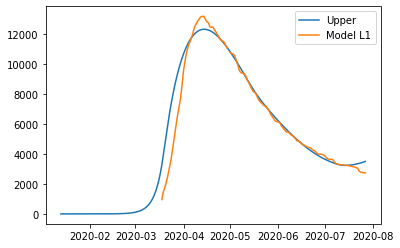

{'home': 0.9985487811804254, 'leisure': 0.8569618618427909, 'other': 0.8, 'school': 0.9231676173265108, 'transport': 0.8708355114534904, 'work': 0.8}
{'home': 0.9985487811804254, 'leisure': 0.10851619940135679, 'other': 0.07030267879994738, 'school': 0, 'transport': 0.11399768311774647, 'work': 0.4181514753524558}
{'home': 0.9985487811804254, 'leisure': 0.10851619940135679, 'other': 0.07030267879994738, 'school': 0, 'transport': 0.11399768311774647, 'work': 0.4181514753524558}
{'home': 0.9985487811804254, 'leisure': 0.13025107911331588, 'other': 0.16868806910519094, 'school': 0.30464531371774856, 'transport': 0.19853508581894574, 'work': 0.7164222998703016}
{'home': 0.9985487811804254, 'leisure': 0.2506278735053699, 'other': 0.2402664236862048, 'school': 0.6185223036087623, 'transport': 0.26303040791749693, 'work': 0.7168570925937913}
{'home': 0.9985487811804254, 'leisure': 0.4171562406737905, 'other': 0.3613512435728377, 'school': 0.6185223036087623, 'transport': 0.4353004496128616, '

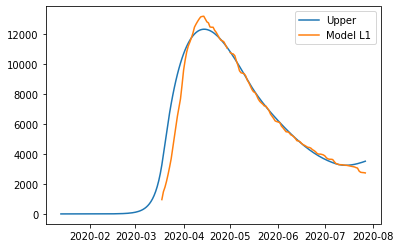

{'home': 0.9986617354131584, 'leisure': 0.8598402960934104, 'other': 0.8, 'school': 0.9252605869612882, 'transport': 0.8730197017714225, 'work': 0.8}
{'home': 0.9986617354131584, 'leisure': 0.10877170702394458, 'other': 0.06975931819856923, 'school': 0, 'transport': 0.11410105523110056, 'work': 0.4175842577050206}
{'home': 0.9986617354131584, 'leisure': 0.10877170702394458, 'other': 0.06975931819856923, 'school': 0, 'transport': 0.11410105523110056, 'work': 0.4175842577050206}
{'home': 0.9986617354131584, 'leisure': 0.1306086676602657, 'other': 0.16747778935562588, 'school': 0.30533599369722514, 'transport': 0.1987035343217573, 'work': 0.7128601657803799}
{'home': 0.9986617354131584, 'leisure': 0.2512947676898421, 'other': 0.23913547035770788, 'school': 0.6199245932640631, 'transport': 0.26329513241520447, 'work': 0.7132583060455443}
{'home': 0.9986617354131584, 'leisure': 0.41844053404594367, 'other': 0.3610549523827503, 'school': 0.6199245932640631, 'transport': 0.43580479895284324, 

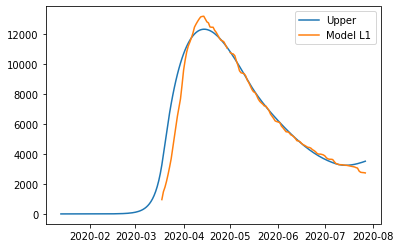

{'home': 0.9986617354131584, 'leisure': 0.8598402960934104, 'other': 0.8, 'school': 0.9252605869612882, 'transport': 0.8730197017714225, 'work': 0.8}
{'home': 0.9986617354131584, 'leisure': 0.10877170702394458, 'other': 0.06975931819856923, 'school': 0, 'transport': 0.11410105523110056, 'work': 0.4175842577050206}
{'home': 0.9986617354131584, 'leisure': 0.10877170702394458, 'other': 0.06975931819856923, 'school': 0, 'transport': 0.11410105523110056, 'work': 0.4175842577050206}
{'home': 0.9986617354131584, 'leisure': 0.1306086676602657, 'other': 0.16747778935562588, 'school': 0.30533599369722514, 'transport': 0.1987035343217573, 'work': 0.7128601657803799}
{'home': 0.9986617354131584, 'leisure': 0.2512947676898421, 'other': 0.23913547035770788, 'school': 0.6199245932640631, 'transport': 0.26329513241520447, 'work': 0.7132583060455443}
{'home': 0.9986617354131584, 'leisure': 0.41844053404594367, 'other': 0.3610549523827503, 'school': 0.6199245932640631, 'transport': 0.43580479895284324, 

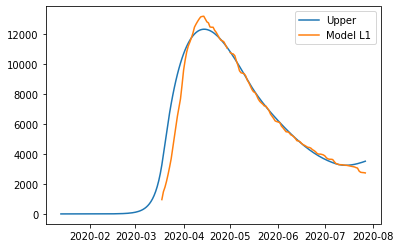

{'home': 0.9986617354131584, 'leisure': 0.8598402960934104, 'other': 0.8, 'school': 0.9252605869612882, 'transport': 0.8730197017714225, 'work': 0.8}
{'home': 0.9986617354131584, 'leisure': 0.10877170702394458, 'other': 0.06975931819856923, 'school': 0, 'transport': 0.11410105523110056, 'work': 0.4175842577050206}
{'home': 0.9986617354131584, 'leisure': 0.10877170702394458, 'other': 0.06975931819856923, 'school': 0, 'transport': 0.11410105523110056, 'work': 0.4175842577050206}
{'home': 0.9986617354131584, 'leisure': 0.1306086676602657, 'other': 0.16747778935562588, 'school': 0.30533599369722514, 'transport': 0.1987035343217573, 'work': 0.7128601657803799}
{'home': 0.9986617354131584, 'leisure': 0.2512947676898421, 'other': 0.23913547035770788, 'school': 0.6199245932640631, 'transport': 0.26329513241520447, 'work': 0.7132583060455443}
{'home': 0.9986617354131584, 'leisure': 0.41844053404594367, 'other': 0.3610549523827503, 'school': 0.6199245932640631, 'transport': 0.43580479895284324, 

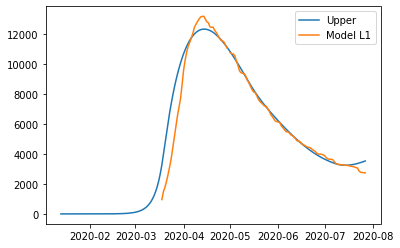

{'home': 0.998792578321413, 'leisure': 0.8629331829665915, 'other': 0.8, 'school': 0.9275198311367493, 'transport': 0.8753814905562978, 'work': 0.8}
{'home': 0.998792578321413, 'leisure': 0.10904484591648525, 'other': 0.06917280882572954, 'school': 0, 'transport': 0.11421160378881845, 'work': 0.41698022481794833}
{'home': 0.998792578321413, 'leisure': 0.10904484591648525, 'other': 0.06917280882572954, 'school': 0, 'transport': 0.11421160378881845, 'work': 0.41698022481794833}
{'home': 0.998792578321413, 'leisure': 0.1309919743365707, 'other': 0.16617146814618758, 'school': 0.3060815442751273, 'transport': 0.19888346685026104, 'work': 0.7090115869091964}
{'home': 0.998792578321413, 'leisure': 0.2520092342426596, 'other': 0.2379148506761904, 'school': 0.6214382868616221, 'transport': 0.2635787400066759, 'work': 0.7093650777242894}
{'home': 0.998792578321413, 'leisure': 0.41981921857117305, 'other': 0.3607353788937706, 'school': 0.6214382868616221, 'transport': 0.4363462202531146, 'work':

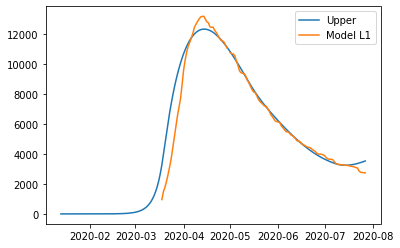

{'home': 0.998792578321413, 'leisure': 0.8629331829665915, 'other': 0.8, 'school': 0.9275198311367493, 'transport': 0.8753814905562978, 'work': 0.8}
{'home': 0.998792578321413, 'leisure': 0.10904484591648525, 'other': 0.06917280882572954, 'school': 0, 'transport': 0.11421160378881845, 'work': 0.41698022481794833}
{'home': 0.998792578321413, 'leisure': 0.10904484591648525, 'other': 0.06917280882572954, 'school': 0, 'transport': 0.11421160378881845, 'work': 0.41698022481794833}
{'home': 0.998792578321413, 'leisure': 0.1309919743365707, 'other': 0.16617146814618758, 'school': 0.3060815442751273, 'transport': 0.19888346685026104, 'work': 0.7090115869091964}
{'home': 0.998792578321413, 'leisure': 0.2520092342426596, 'other': 0.2379148506761904, 'school': 0.6214382868616221, 'transport': 0.2635787400066759, 'work': 0.7093650777242894}
{'home': 0.998792578321413, 'leisure': 0.41981921857117305, 'other': 0.3607353788937706, 'school': 0.6214382868616221, 'transport': 0.4363462202531146, 'work':

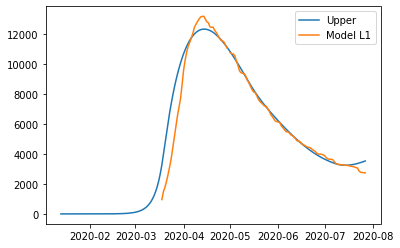

{'home': 0.998792578321413, 'leisure': 0.8629331829665915, 'other': 0.8, 'school': 0.9275198311367493, 'transport': 0.8753814905562978, 'work': 0.8}
{'home': 0.998792578321413, 'leisure': 0.10904484591648525, 'other': 0.06917280882572954, 'school': 0, 'transport': 0.11421160378881845, 'work': 0.41698022481794833}
{'home': 0.998792578321413, 'leisure': 0.10904484591648525, 'other': 0.06917280882572954, 'school': 0, 'transport': 0.11421160378881845, 'work': 0.41698022481794833}
{'home': 0.998792578321413, 'leisure': 0.1309919743365707, 'other': 0.16617146814618758, 'school': 0.3060815442751273, 'transport': 0.19888346685026104, 'work': 0.7090115869091964}
{'home': 0.998792578321413, 'leisure': 0.2520092342426596, 'other': 0.2379148506761904, 'school': 0.6214382868616221, 'transport': 0.2635787400066759, 'work': 0.7093650777242894}
{'home': 0.998792578321413, 'leisure': 0.41981921857117305, 'other': 0.3607353788937706, 'school': 0.6214382868616221, 'transport': 0.4363462202531146, 'work':

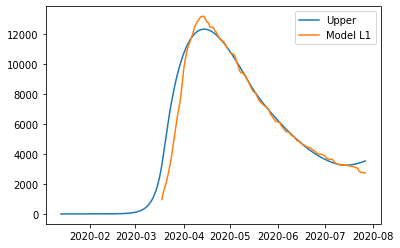

{'home': 0.9988510236063616, 'leisure': 0.8626546078754523, 'other': 0.8, 'school': 0.9273445432630859, 'transport': 0.875223145430897, 'work': 0.8}
{'home': 0.9988510236063616, 'leisure': 0.10901586202103332, 'other': 0.06920346171691612, 'school': 0, 'transport': 0.11420228578180529, 'work': 0.4170342746652851}
{'home': 0.9988510236063616, 'leisure': 0.10901586202103332, 'other': 0.06920346171691612, 'school': 0, 'transport': 0.11420228578180529, 'work': 0.4170342746652851}
{'home': 0.9988510236063616, 'leisure': 0.13095291264388048, 'other': 0.16624117992272638, 'school': 0.3060236992768184, 'transport': 0.19886790169342675, 'work': 0.7092572426635063}
{'home': 0.9988510236063616, 'leisure': 0.2519363945593985, 'other': 0.23797591514366437, 'school': 0.6213208439862676, 'transport': 0.26355538927665767, 'work': 0.7095952807449504}
{'home': 0.9988510236063616, 'leisure': 0.41968842113742566, 'other': 0.3607429412373411, 'school': 0.6213208439862676, 'transport': 0.4363036530397158, '

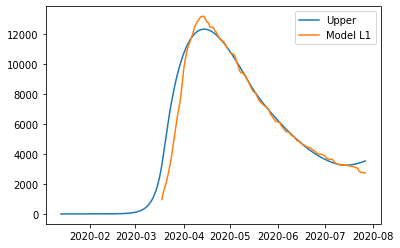

{'home': 0.9988510236063616, 'leisure': 0.8626546078754523, 'other': 0.8, 'school': 0.9273445432630859, 'transport': 0.875223145430897, 'work': 0.8}
{'home': 0.9988510236063616, 'leisure': 0.10901586202103332, 'other': 0.06920346171691612, 'school': 0, 'transport': 0.11420228578180529, 'work': 0.4170342746652851}
{'home': 0.9988510236063616, 'leisure': 0.10901586202103332, 'other': 0.06920346171691612, 'school': 0, 'transport': 0.11420228578180529, 'work': 0.4170342746652851}
{'home': 0.9988510236063616, 'leisure': 0.13095291264388048, 'other': 0.16624117992272638, 'school': 0.3060236992768184, 'transport': 0.19886790169342675, 'work': 0.7092572426635063}
{'home': 0.9988510236063616, 'leisure': 0.2519363945593985, 'other': 0.23797591514366437, 'school': 0.6213208439862676, 'transport': 0.26355538927665767, 'work': 0.7095952807449504}
{'home': 0.9988510236063616, 'leisure': 0.41968842113742566, 'other': 0.3607429412373411, 'school': 0.6213208439862676, 'transport': 0.4363036530397158, '

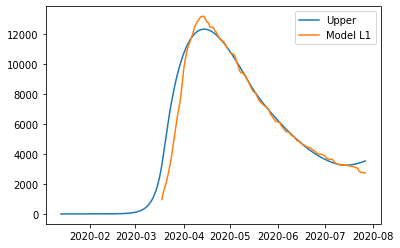

{'home': 0.9988510236063616, 'leisure': 0.8626546078754523, 'other': 0.8, 'school': 0.9273445432630859, 'transport': 0.875223145430897, 'work': 0.8}
{'home': 0.9988510236063616, 'leisure': 0.10901586202103332, 'other': 0.06920346171691612, 'school': 0, 'transport': 0.11420228578180529, 'work': 0.4170342746652851}
{'home': 0.9988510236063616, 'leisure': 0.10901586202103332, 'other': 0.06920346171691612, 'school': 0, 'transport': 0.11420228578180529, 'work': 0.4170342746652851}
{'home': 0.9988510236063616, 'leisure': 0.13095291264388048, 'other': 0.16624117992272638, 'school': 0.3060236992768184, 'transport': 0.19886790169342675, 'work': 0.7092572426635063}
{'home': 0.9988510236063616, 'leisure': 0.2519363945593985, 'other': 0.23797591514366437, 'school': 0.6213208439862676, 'transport': 0.26355538927665767, 'work': 0.7095952807449504}
{'home': 0.9988510236063616, 'leisure': 0.41968842113742566, 'other': 0.3607429412373411, 'school': 0.6213208439862676, 'transport': 0.4363036530397158, '

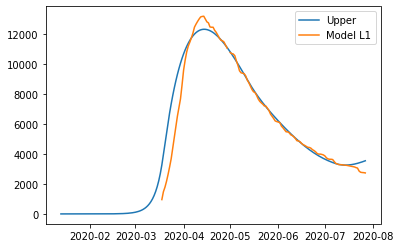

{'home': 0.999137380265543, 'leisure': 0.862642211449083, 'other': 0.8, 'school': 0.9274770645526642, 'transport': 0.8754503244029033, 'work': 0.8}
{'home': 0.999137380265543, 'leisure': 0.10900151695118289, 'other': 0.0691364667474953, 'school': 0, 'transport': 0.11421148619184622, 'work': 0.4170906981103463}
{'home': 0.999137380265543, 'leisure': 0.10900151695118289, 'other': 0.0691364667474953, 'school': 0, 'transport': 0.11421148619184622, 'work': 0.4170906981103463}
{'home': 0.999137380265543, 'leisure': 0.1309398305896004, 'other': 0.16609575706153357, 'school': 0.3060674313023792, 'transport': 0.1988825293223186, 'work': 0.7089173655302368}
{'home': 0.999137380265543, 'leisure': 0.25191049843874086, 'other': 0.23783206683833014, 'school': 0.6214096332502851, 'transport': 0.26357928347351756, 'work': 0.7091683456971927}
{'home': 0.999137380265543, 'leisure': 0.41966695957474837, 'other': 0.36068975501568457, 'school': 0.6214096332502851, 'transport': 0.4363510881446067, 'work': 0

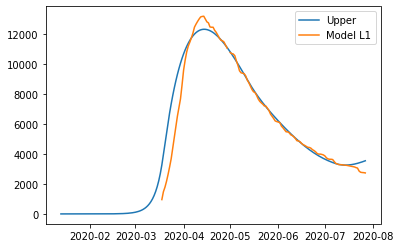

{'home': 0.999137380265543, 'leisure': 0.862642211449083, 'other': 0.8, 'school': 0.9274770645526642, 'transport': 0.8754503244029033, 'work': 0.8}
{'home': 0.999137380265543, 'leisure': 0.10900151695118289, 'other': 0.0691364667474953, 'school': 0, 'transport': 0.11421148619184622, 'work': 0.4170906981103463}
{'home': 0.999137380265543, 'leisure': 0.10900151695118289, 'other': 0.0691364667474953, 'school': 0, 'transport': 0.11421148619184622, 'work': 0.4170906981103463}
{'home': 0.999137380265543, 'leisure': 0.1309398305896004, 'other': 0.16609575706153357, 'school': 0.3060674313023792, 'transport': 0.1988825293223186, 'work': 0.7089173655302368}
{'home': 0.999137380265543, 'leisure': 0.25191049843874086, 'other': 0.23783206683833014, 'school': 0.6214096332502851, 'transport': 0.26357928347351756, 'work': 0.7091683456971927}
{'home': 0.999137380265543, 'leisure': 0.41966695957474837, 'other': 0.36068975501568457, 'school': 0.6214096332502851, 'transport': 0.4363510881446067, 'work': 0

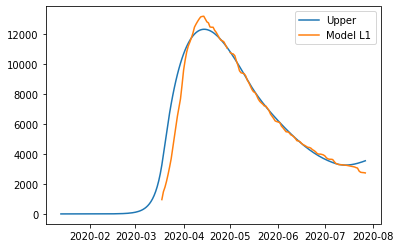

{'home': 0.999137390265543, 'leisure': 0.862642211449083, 'other': 0.8, 'school': 0.9274770645526642, 'transport': 0.8754503244029033, 'work': 0.8}
{'home': 0.999137390265543, 'leisure': 0.10900151695118289, 'other': 0.0691364667474953, 'school': 0, 'transport': 0.11421148619184622, 'work': 0.4170906981103463}
{'home': 0.999137390265543, 'leisure': 0.10900151695118289, 'other': 0.0691364667474953, 'school': 0, 'transport': 0.11421148619184622, 'work': 0.4170906981103463}
{'home': 0.999137390265543, 'leisure': 0.1309398305896004, 'other': 0.16609575706153357, 'school': 0.3060674313023792, 'transport': 0.1988825293223186, 'work': 0.7089173655302368}
{'home': 0.999137390265543, 'leisure': 0.25191049843874086, 'other': 0.23783206683833014, 'school': 0.6214096332502851, 'transport': 0.26357928347351756, 'work': 0.7091683456971927}
{'home': 0.999137390265543, 'leisure': 0.41966695957474837, 'other': 0.36068975501568457, 'school': 0.6214096332502851, 'transport': 0.4363510881446067, 'work': 0

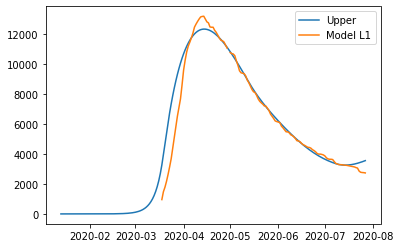

{'home': 0.9992666248230128, 'leisure': 0.8651935137492469, 'other': 0.8, 'school': 0.9293586302182031, 'transport': 0.8774098951211894, 'work': 0.8}
{'home': 0.9992666248230128, 'leisure': 0.10922269724883726, 'other': 0.06863734600065854, 'school': 0, 'transport': 0.11429860748348988, 'work': 0.41657348885990175}
{'home': 0.9992666248230128, 'leisure': 0.10922269724883726, 'other': 0.06863734600065854, 'school': 0, 'transport': 0.11429860748348988, 'work': 0.41657348885990175}
{'home': 0.9992666248230128, 'leisure': 0.13125099596827086, 'other': 0.16498530676502354, 'school': 0.30668834797200706, 'transport': 0.19902343356597071, 'work': 0.7056864673699629}
{'home': 0.9992666248230128, 'leisure': 0.2524909369633195, 'other': 0.2367896665129371, 'school': 0.6226702822461961, 'transport': 0.2638043134255664, 'work': 0.7058948969387565}
{'home': 0.9992666248230128, 'leisure': 0.4207962193664258, 'other': 0.36040570282739076, 'school': 0.6226702822461961, 'transport': 0.43678516951829516

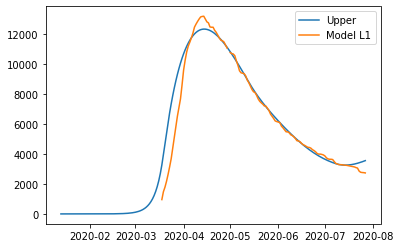

{'home': 0.9992666248230128, 'leisure': 0.8651935137492469, 'other': 0.8, 'school': 0.9293586302182031, 'transport': 0.8774098951211894, 'work': 0.8}
{'home': 0.9992666248230128, 'leisure': 0.10922269724883726, 'other': 0.06863734600065854, 'school': 0, 'transport': 0.11429860748348988, 'work': 0.41657348885990175}
{'home': 0.9992666248230128, 'leisure': 0.10922269724883726, 'other': 0.06863734600065854, 'school': 0, 'transport': 0.11429860748348988, 'work': 0.41657348885990175}
{'home': 0.9992666248230128, 'leisure': 0.13125099596827086, 'other': 0.16498530676502354, 'school': 0.30668834797200706, 'transport': 0.19902343356597071, 'work': 0.7056864673699629}
{'home': 0.9992666248230128, 'leisure': 0.2524909369633195, 'other': 0.2367896665129371, 'school': 0.6226702822461961, 'transport': 0.2638043134255664, 'work': 0.7058948969387565}
{'home': 0.9992666248230128, 'leisure': 0.4207962193664258, 'other': 0.36040570282739076, 'school': 0.6226702822461961, 'transport': 0.43678516951829516

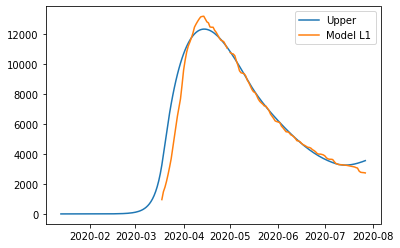

{'home': 0.9992666248230128, 'leisure': 0.8651935137492469, 'other': 0.8, 'school': 0.9293586302182031, 'transport': 0.8774098951211894, 'work': 0.8}
{'home': 0.9992666248230128, 'leisure': 0.10922269724883726, 'other': 0.06863734600065854, 'school': 0, 'transport': 0.11429860748348988, 'work': 0.41657348885990175}
{'home': 0.9992666248230128, 'leisure': 0.10922269724883726, 'other': 0.06863734600065854, 'school': 0, 'transport': 0.11429860748348988, 'work': 0.41657348885990175}
{'home': 0.9992666248230128, 'leisure': 0.13125099596827086, 'other': 0.16498530676502354, 'school': 0.30668834797200706, 'transport': 0.19902343356597071, 'work': 0.7056864673699629}
{'home': 0.9992666248230128, 'leisure': 0.2524909369633195, 'other': 0.2367896665129371, 'school': 0.6226702822461961, 'transport': 0.2638043134255664, 'work': 0.7058948969387565}
{'home': 0.9992666248230128, 'leisure': 0.4207962193664258, 'other': 0.36040570282739076, 'school': 0.6226702822461961, 'transport': 0.43678516951829516

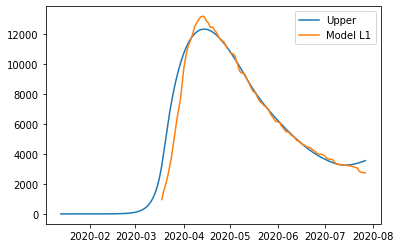

{'home': 0.9992648071511668, 'leisure': 0.8648888492821423, 'other': 0.8, 'school': 0.929155048131958, 'transport': 0.8771883585229848, 'work': 0.8}
{'home': 0.9992648071511668, 'leisure': 0.10919542279588342, 'other': 0.06869251108104632, 'school': 0, 'transport': 0.11428856415451322, 'work': 0.4166394363402394}
{'home': 0.9992648071511668, 'leisure': 0.10919542279588342, 'other': 0.06869251108104632, 'school': 0, 'transport': 0.11428856415451322, 'work': 0.4166394363402394}
{'home': 0.9992648071511668, 'leisure': 0.13121292227828668, 'other': 0.16510829716006714, 'school': 0.30662116588354615, 'transport': 0.19900714076489778, 'work': 0.7060522536681557}
{'home': 0.9992648071511668, 'leisure': 0.252419947553703, 'other': 0.23690442495628267, 'school': 0.6225338822484119, 'transport': 0.2637784125462072, 'work': 0.7062594025430582}
{'home': 0.9992648071511668, 'leisure': 0.42065998030936347, 'other': 0.3604350664961915, 'school': 0.6225338822484119, 'transport': 0.4367354331435969, 'w

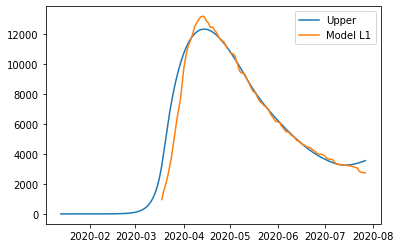

{'home': 0.9992648071511668, 'leisure': 0.8648888492821423, 'other': 0.8, 'school': 0.929155048131958, 'transport': 0.8771883585229848, 'work': 0.8}
{'home': 0.9992648071511668, 'leisure': 0.10919542279588342, 'other': 0.06869251108104632, 'school': 0, 'transport': 0.11428856415451322, 'work': 0.4166394363402394}
{'home': 0.9992648071511668, 'leisure': 0.10919542279588342, 'other': 0.06869251108104632, 'school': 0, 'transport': 0.11428856415451322, 'work': 0.4166394363402394}
{'home': 0.9992648071511668, 'leisure': 0.13121292227828668, 'other': 0.16510829716006714, 'school': 0.30662116588354615, 'transport': 0.19900714076489778, 'work': 0.7060522536681557}
{'home': 0.9992648071511668, 'leisure': 0.252419947553703, 'other': 0.23690442495628267, 'school': 0.6225338822484119, 'transport': 0.2637784125462072, 'work': 0.7062594025430582}
{'home': 0.9992648071511668, 'leisure': 0.42065998030936347, 'other': 0.3604350664961915, 'school': 0.6225338822484119, 'transport': 0.4367354331435969, 'w

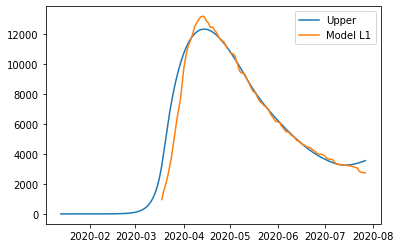

{'home': 0.9992648071511668, 'leisure': 0.8648888492821423, 'other': 0.8, 'school': 0.929155048131958, 'transport': 0.8771883585229848, 'work': 0.8}
{'home': 0.9992648071511668, 'leisure': 0.10919542279588342, 'other': 0.06869251108104632, 'school': 0, 'transport': 0.11428856415451322, 'work': 0.4166394363402394}
{'home': 0.9992648071511668, 'leisure': 0.10919542279588342, 'other': 0.06869251108104632, 'school': 0, 'transport': 0.11428856415451322, 'work': 0.4166394363402394}
{'home': 0.9992648071511668, 'leisure': 0.13121292227828668, 'other': 0.16510829716006714, 'school': 0.30662116588354615, 'transport': 0.19900714076489778, 'work': 0.7060522536681557}
{'home': 0.9992648071511668, 'leisure': 0.252419947553703, 'other': 0.23690442495628267, 'school': 0.6225338822484119, 'transport': 0.2637784125462072, 'work': 0.7062594025430582}
{'home': 0.9992648071511668, 'leisure': 0.42065998030936347, 'other': 0.3604350664961915, 'school': 0.6225338822484119, 'transport': 0.4367354331435969, 'w

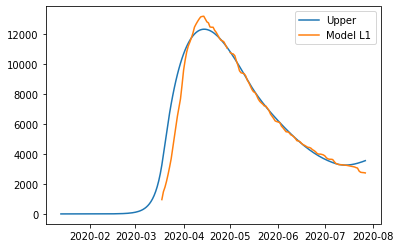

{'home': 0.9992617570350901, 'leisure': 0.8643776117938158, 'other': 0.8, 'school': 0.9288134303665873, 'transport': 0.8768166124670209, 'work': 0.8}
{'home': 0.9992617570350901, 'leisure': 0.10914963634202657, 'other': 0.06878508481634014, 'school': 0, 'transport': 0.11427167983437621, 'work': 0.41675009115592243}
{'home': 0.9992617570350901, 'leisure': 0.10914963634202657, 'other': 0.06878508481634014, 'school': 0, 'transport': 0.11427167983437621, 'work': 0.41675009115592243}
{'home': 0.9992617570350901, 'leisure': 0.131149019494049, 'other': 0.16531469004836558, 'school': 0.30650843202097383, 'transport': 0.198979744451393, 'work': 0.7066660150309662}
{'home': 0.9992617570350901, 'leisure': 0.25230079446714754, 'other': 0.23709700362529446, 'school': 0.6223049983456135, 'transport': 0.2637348823315348, 'work': 0.7068710149997126}
{'home': 0.9992617570350901, 'leisure': 0.4204313462154183, 'other': 0.36048434231494697, 'school': 0.6223049983456135, 'transport': 0.4366518731752935, '

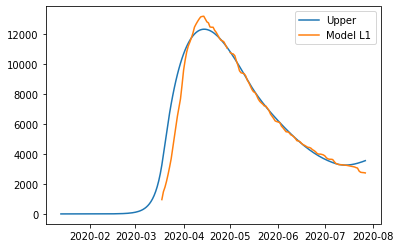

{'home': 0.9992617570350901, 'leisure': 0.8643776117938158, 'other': 0.8, 'school': 0.9288134303665873, 'transport': 0.8768166124670209, 'work': 0.8}
{'home': 0.9992617570350901, 'leisure': 0.10914963634202657, 'other': 0.06878508481634014, 'school': 0, 'transport': 0.11427167983437621, 'work': 0.41675009115592243}
{'home': 0.9992617570350901, 'leisure': 0.10914963634202657, 'other': 0.06878508481634014, 'school': 0, 'transport': 0.11427167983437621, 'work': 0.41675009115592243}
{'home': 0.9992617570350901, 'leisure': 0.131149019494049, 'other': 0.16531469004836558, 'school': 0.30650843202097383, 'transport': 0.198979744451393, 'work': 0.7066660150309662}
{'home': 0.9992617570350901, 'leisure': 0.25230079446714754, 'other': 0.23709700362529446, 'school': 0.6223049983456135, 'transport': 0.2637348823315348, 'work': 0.7068710149997126}
{'home': 0.9992617570350901, 'leisure': 0.4204313462154183, 'other': 0.36048434231494697, 'school': 0.6223049983456135, 'transport': 0.4366518731752935, '

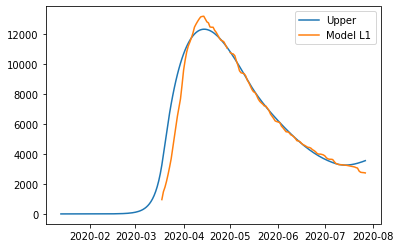

{'home': 0.9992617570350901, 'leisure': 0.8643776117938158, 'other': 0.8, 'school': 0.9288134303665873, 'transport': 0.8768166124670209, 'work': 0.8}
{'home': 0.9992617570350901, 'leisure': 0.10914963634202657, 'other': 0.06878508481634014, 'school': 0, 'transport': 0.11427167983437621, 'work': 0.41675009115592243}
{'home': 0.9992617570350901, 'leisure': 0.10914963634202657, 'other': 0.06878508481634014, 'school': 0, 'transport': 0.11427167983437621, 'work': 0.41675009115592243}
{'home': 0.9992617570350901, 'leisure': 0.131149019494049, 'other': 0.16531469004836558, 'school': 0.30650843202097383, 'transport': 0.198979744451393, 'work': 0.7066660150309662}
{'home': 0.9992617570350901, 'leisure': 0.25230079446714754, 'other': 0.23709700362529446, 'school': 0.6223049983456135, 'transport': 0.2637348823315348, 'work': 0.7068710149997126}
{'home': 0.9992617570350901, 'leisure': 0.4204313462154183, 'other': 0.36048434231494697, 'school': 0.6223049983456135, 'transport': 0.4366518731752935, '

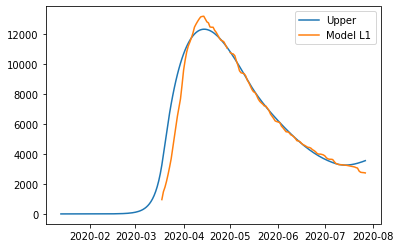

{'home': 0.9992617570350901, 'leisure': 0.8643776217938158, 'other': 0.8, 'school': 0.9288134303665873, 'transport': 0.8768166124670209, 'work': 0.8}
{'home': 0.9992617570350901, 'leisure': 0.10914963760478066, 'other': 0.06878508481634014, 'school': 0, 'transport': 0.11427167983437621, 'work': 0.41675009115592243}
{'home': 0.9992617570350901, 'leisure': 0.10914963760478066, 'other': 0.06878508481634014, 'school': 0, 'transport': 0.11427167983437621, 'work': 0.41675009115592243}
{'home': 0.9992617570350901, 'leisure': 0.13114902101131437, 'other': 0.16531469004836558, 'school': 0.30650843202097383, 'transport': 0.198979744451393, 'work': 0.7066660150309662}
{'home': 0.9992617570350901, 'leisure': 0.2523007973860199, 'other': 0.23709700362529446, 'school': 0.6223049983456135, 'transport': 0.2637348823315348, 'work': 0.7068710149997126}
{'home': 0.9992617570350901, 'leisure': 0.42043135107939605, 'other': 0.36048434231494697, 'school': 0.6223049983456135, 'transport': 0.4366518731752935,

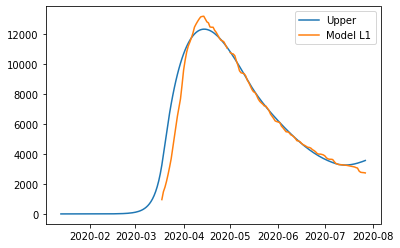

{'home': 0.9994988262592587, 'leisure': 0.8659401792055489, 'other': 0.8, 'school': 0.930075370398957, 'transport': 0.878147555202262, 'work': 0.8}
{'home': 0.9994988262592587, 'leisure': 0.10927620924938926, 'other': 0.06843536853058789, 'school': 0, 'transport': 0.11432840760091581, 'work': 0.4164586099990155}
{'home': 0.9994988262592587, 'leisure': 0.10927620924938926, 'other': 0.06843536853058789, 'school': 0, 'transport': 0.11432840760091581, 'work': 0.4164586099990155}
{'home': 0.9994988262592587, 'leisure': 0.13133102828396168, 'other': 0.16453914750044502, 'school': 0.3069248722316558, 'transport': 0.1990709411593801, 'work': 0.7044746275261917}
{'home': 0.9994988262592587, 'leisure': 0.25263988554729416, 'other': 0.23636282672325046, 'school': 0.6231504981673013, 'transport': 0.26388213458494997, 'work': 0.704601195065748}
{'home': 0.9994988262592587, 'leisure': 0.4211105897776692, 'other': 0.3602707612833351, 'school': 0.6231504981673013, 'transport': 0.43693866209947035, 'wo

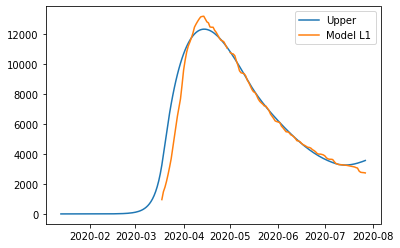

{'home': 0.9994988262592587, 'leisure': 0.8659401792055489, 'other': 0.8, 'school': 0.930075370398957, 'transport': 0.878147555202262, 'work': 0.8}
{'home': 0.9994988262592587, 'leisure': 0.10927620924938926, 'other': 0.06843536853058789, 'school': 0, 'transport': 0.11432840760091581, 'work': 0.4164586099990155}
{'home': 0.9994988262592587, 'leisure': 0.10927620924938926, 'other': 0.06843536853058789, 'school': 0, 'transport': 0.11432840760091581, 'work': 0.4164586099990155}
{'home': 0.9994988262592587, 'leisure': 0.13133102828396168, 'other': 0.16453914750044502, 'school': 0.3069248722316558, 'transport': 0.1990709411593801, 'work': 0.7044746275261917}
{'home': 0.9994988262592587, 'leisure': 0.25263988554729416, 'other': 0.23636282672325046, 'school': 0.6231504981673013, 'transport': 0.26388213458494997, 'work': 0.704601195065748}
{'home': 0.9994988262592587, 'leisure': 0.4211105897776692, 'other': 0.3602707612833351, 'school': 0.6231504981673013, 'transport': 0.43693866209947035, 'wo

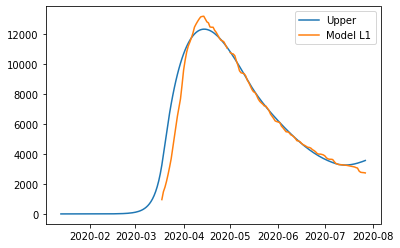

{'home': 0.9994988262592587, 'leisure': 0.8659401792055489, 'other': 0.8, 'school': 0.930075370398957, 'transport': 0.878147555202262, 'work': 0.8}
{'home': 0.9994988262592587, 'leisure': 0.10927620924938926, 'other': 0.06843536853058789, 'school': 0, 'transport': 0.11432840760091581, 'work': 0.4164586099990155}
{'home': 0.9994988262592587, 'leisure': 0.10927620924938926, 'other': 0.06843536853058789, 'school': 0, 'transport': 0.11432840760091581, 'work': 0.4164586099990155}
{'home': 0.9994988262592587, 'leisure': 0.13133102828396168, 'other': 0.16453914750044502, 'school': 0.3069248722316558, 'transport': 0.1990709411593801, 'work': 0.7044746275261917}
{'home': 0.9994988262592587, 'leisure': 0.25263988554729416, 'other': 0.23636282672325046, 'school': 0.6231504981673013, 'transport': 0.26388213458494997, 'work': 0.704601195065748}
{'home': 0.9994988262592587, 'leisure': 0.4211105897776692, 'other': 0.3602707612833351, 'school': 0.6231504981673013, 'transport': 0.43693866209947035, 'wo

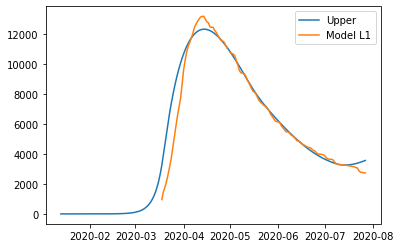

{'home': 0.999513910142125, 'leisure': 0.8661431064697218, 'other': 0.8, 'school': 0.9302393216346555, 'transport': 0.8783174824997281, 'work': 0.8}
{'home': 0.999513910142125, 'leisure': 0.10929245148691621, 'other': 0.06838931850292283, 'school': 0, 'transport': 0.11433522138782132, 'work': 0.4164146981713375}
{'home': 0.999513910142125, 'leisure': 0.10929245148691621, 'other': 0.06838931850292283, 'school': 0, 'transport': 0.11433522138782132, 'work': 0.4164146981713375}
{'home': 0.999513910142125, 'leisure': 0.13135431101662534, 'other': 0.16443710529362884, 'school': 0.3069789761394363, 'transport': 0.1990818012983609, 'work': 0.7041850015015365}
{'home': 0.999513910142125, 'leisure': 0.25268336228848226, 'other': 0.2362657997960097, 'school': 0.6232603454952192, 'transport': 0.26389997175086166, 'work': 0.704307762488369}
{'home': 0.999513910142125, 'leisure': 0.42119819974032663, 'other': 0.3602414953174813, 'school': 0.6232603454952192, 'transport': 0.43697386019308304, 'work':

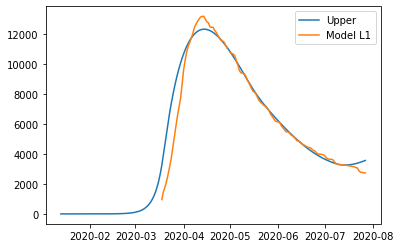

{'home': 0.999513910142125, 'leisure': 0.8661431064697218, 'other': 0.8, 'school': 0.9302393216346555, 'transport': 0.8783174824997281, 'work': 0.8}
{'home': 0.999513910142125, 'leisure': 0.10929245148691621, 'other': 0.06838931850292283, 'school': 0, 'transport': 0.11433522138782132, 'work': 0.4164146981713375}
{'home': 0.999513910142125, 'leisure': 0.10929245148691621, 'other': 0.06838931850292283, 'school': 0, 'transport': 0.11433522138782132, 'work': 0.4164146981713375}
{'home': 0.999513910142125, 'leisure': 0.13135431101662534, 'other': 0.16443710529362884, 'school': 0.3069789761394363, 'transport': 0.1990818012983609, 'work': 0.7041850015015365}
{'home': 0.999513910142125, 'leisure': 0.25268336228848226, 'other': 0.2362657997960097, 'school': 0.6232603454952192, 'transport': 0.26389997175086166, 'work': 0.704307762488369}
{'home': 0.999513910142125, 'leisure': 0.42119819974032663, 'other': 0.3602414953174813, 'school': 0.6232603454952192, 'transport': 0.43697386019308304, 'work':

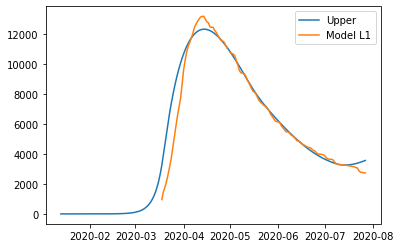

{'home': 0.999513910142125, 'leisure': 0.8661431064697218, 'other': 0.8, 'school': 0.9302393216346555, 'transport': 0.8783174824997281, 'work': 0.8}
{'home': 0.999513910142125, 'leisure': 0.10929245148691621, 'other': 0.06838931850292283, 'school': 0, 'transport': 0.11433522138782132, 'work': 0.4164146981713375}
{'home': 0.999513910142125, 'leisure': 0.10929245148691621, 'other': 0.06838931850292283, 'school': 0, 'transport': 0.11433522138782132, 'work': 0.4164146981713375}
{'home': 0.999513910142125, 'leisure': 0.13135431101662534, 'other': 0.16443710529362884, 'school': 0.3069789761394363, 'transport': 0.1990818012983609, 'work': 0.7041850015015365}
{'home': 0.999513910142125, 'leisure': 0.25268336228848226, 'other': 0.2362657997960097, 'school': 0.6232603454952192, 'transport': 0.26389997175086166, 'work': 0.704307762488369}
{'home': 0.999513910142125, 'leisure': 0.42119819974032663, 'other': 0.3602414953174813, 'school': 0.6232603454952192, 'transport': 0.43697386019308304, 'work':

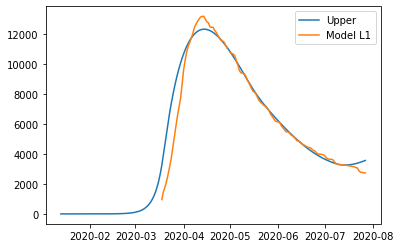

{'home': 0.999513910142125, 'leisure': 0.8661431064697218, 'other': 0.8, 'school': 0.9302393216346555, 'transport': 0.8783174824997281, 'work': 0.8}
{'home': 0.999513910142125, 'leisure': 0.10929245148691621, 'other': 0.06838931850292283, 'school': 0, 'transport': 0.11433522138782132, 'work': 0.4164146981713375}
{'home': 0.999513910142125, 'leisure': 0.10929245148691621, 'other': 0.06838931850292283, 'school': 0, 'transport': 0.11433522138782132, 'work': 0.4164146981713375}
{'home': 0.999513910142125, 'leisure': 0.13135431101662534, 'other': 0.16443710529362884, 'school': 0.3069789761394363, 'transport': 0.1990818012983609, 'work': 0.7041850015015365}
{'home': 0.999513910142125, 'leisure': 0.25268336228848226, 'other': 0.2362657997960097, 'school': 0.6232603454952192, 'transport': 0.26389997175086166, 'work': 0.704307762488369}
{'home': 0.999513910142125, 'leisure': 0.42119819974032663, 'other': 0.3602414953174813, 'school': 0.6232603454952192, 'transport': 0.43697386019308304, 'work':

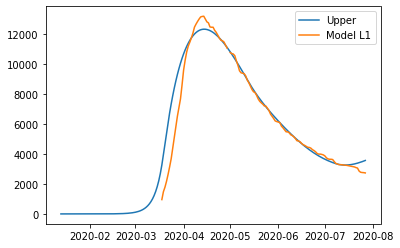

{'home': 0.999513920142125, 'leisure': 0.8661431064697218, 'other': 0.8, 'school': 0.9302393216346555, 'transport': 0.8783174824997281, 'work': 0.8}
{'home': 0.999513920142125, 'leisure': 0.10929245148691621, 'other': 0.06838931850292283, 'school': 0, 'transport': 0.11433522138782132, 'work': 0.4164146981713375}
{'home': 0.999513920142125, 'leisure': 0.10929245148691621, 'other': 0.06838931850292283, 'school': 0, 'transport': 0.11433522138782132, 'work': 0.4164146981713375}
{'home': 0.999513920142125, 'leisure': 0.13135431101662534, 'other': 0.16443710529362884, 'school': 0.3069789761394363, 'transport': 0.1990818012983609, 'work': 0.7041850015015365}
{'home': 0.999513920142125, 'leisure': 0.25268336228848226, 'other': 0.2362657997960097, 'school': 0.6232603454952192, 'transport': 0.26389997175086166, 'work': 0.704307762488369}
{'home': 0.999513920142125, 'leisure': 0.42119819974032663, 'other': 0.3602414953174813, 'school': 0.6232603454952192, 'transport': 0.43697386019308304, 'work':

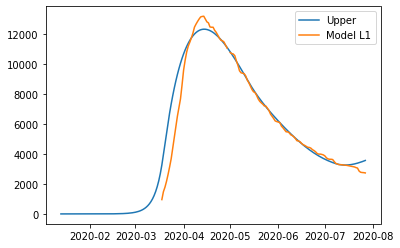

{'home': 0.9995155487304137, 'leisure': 0.8661643062780983, 'other': 0.800000002329314, 'school': 0.9302561563535368, 'transport': 0.8783350071375582, 'work': 0.8000000020620568}
{'home': 0.9995155487304137, 'leisure': 0.1092941736274363, 'other': 0.06838462835554639, 'school': 0, 'transport': 0.11433593836763553, 'work': 0.4164101949593544}
{'home': 0.9995155487304137, 'leisure': 0.1092941736274363, 'other': 0.06838462835554639, 'school': 0, 'transport': 0.11433593836763553, 'work': 0.4164101949593544}
{'home': 0.9995155487304137, 'leisure': 0.1313567726164756, 'other': 0.16442670566593082, 'school': 0.30698453159666717, 'transport': 0.19908294747712138, 'work': 0.7041553496817665}
{'home': 0.9995155487304137, 'leisure': 0.25268795688275125, 'other': 0.2362559345069098, 'school': 0.6232716247568697, 'transport': 0.2639018437662948, 'work': 0.7042776971380091}
{'home': 0.9995155487304137, 'leisure': 0.4212073982349065, 'other': 0.3602385747486992, 'school': 0.6232716247568697, 'transpo

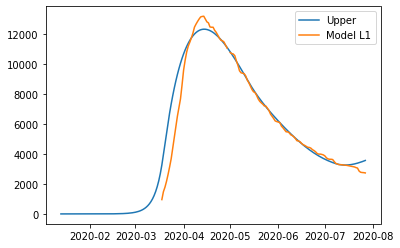

{'home': 0.9995155487304137, 'leisure': 0.8661643062780983, 'other': 0.800000002329314, 'school': 0.9302561563535368, 'transport': 0.8783350071375582, 'work': 0.8000000020620568}
{'home': 0.9995155487304137, 'leisure': 0.1092941736274363, 'other': 0.06838462835554639, 'school': 0, 'transport': 0.11433593836763553, 'work': 0.4164101949593544}
{'home': 0.9995155487304137, 'leisure': 0.1092941736274363, 'other': 0.06838462835554639, 'school': 0, 'transport': 0.11433593836763553, 'work': 0.4164101949593544}
{'home': 0.9995155487304137, 'leisure': 0.1313567726164756, 'other': 0.16442670566593082, 'school': 0.30698453159666717, 'transport': 0.19908294747712138, 'work': 0.7041553496817665}
{'home': 0.9995155487304137, 'leisure': 0.25268795688275125, 'other': 0.2362559345069098, 'school': 0.6232716247568697, 'transport': 0.2639018437662948, 'work': 0.7042776971380091}
{'home': 0.9995155487304137, 'leisure': 0.4212073982349065, 'other': 0.3602385747486992, 'school': 0.6232716247568697, 'transpo

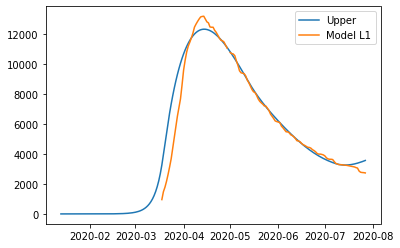

{'home': 0.9995155487304137, 'leisure': 0.8661643062780983, 'other': 0.800000002329314, 'school': 0.9302561563535368, 'transport': 0.8783350071375582, 'work': 0.8000000020620568}
{'home': 0.9995155487304137, 'leisure': 0.1092941736274363, 'other': 0.06838462835554639, 'school': 0, 'transport': 0.11433593836763553, 'work': 0.4164101949593544}
{'home': 0.9995155487304137, 'leisure': 0.1092941736274363, 'other': 0.06838462835554639, 'school': 0, 'transport': 0.11433593836763553, 'work': 0.4164101949593544}
{'home': 0.9995155487304137, 'leisure': 0.1313567726164756, 'other': 0.16442670566593082, 'school': 0.30698453159666717, 'transport': 0.19908294747712138, 'work': 0.7041553496817665}
{'home': 0.9995155487304137, 'leisure': 0.25268795688275125, 'other': 0.2362559345069098, 'school': 0.6232716247568697, 'transport': 0.2639018437662948, 'work': 0.7042776971380091}
{'home': 0.9995155487304137, 'leisure': 0.4212073982349065, 'other': 0.3602385747486992, 'school': 0.6232716247568697, 'transpo

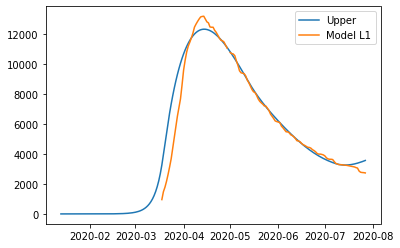

{'home': 0.9995155487304137, 'leisure': 0.8661643062780983, 'other': 0.800000002329314, 'school': 0.9302561563535368, 'transport': 0.8783350071375582, 'work': 0.8000000020620568}
{'home': 0.9995155487304137, 'leisure': 0.1092941736274363, 'other': 0.06838462835554639, 'school': 0, 'transport': 0.11433593836763553, 'work': 0.4164101949593544}
{'home': 0.9995155487304137, 'leisure': 0.1092941736274363, 'other': 0.06838462835554639, 'school': 0, 'transport': 0.11433593836763553, 'work': 0.4164101949593544}
{'home': 0.9995155487304137, 'leisure': 0.1313567726164756, 'other': 0.16442670566593082, 'school': 0.30698453159666717, 'transport': 0.19908294747712138, 'work': 0.7041553496817665}
{'home': 0.9995155487304137, 'leisure': 0.25268795688275125, 'other': 0.2362559345069098, 'school': 0.6232716247568697, 'transport': 0.2639018437662948, 'work': 0.7042776971380091}
{'home': 0.9995155487304137, 'leisure': 0.4212073982349065, 'other': 0.3602385747486992, 'school': 0.6232716247568697, 'transpo

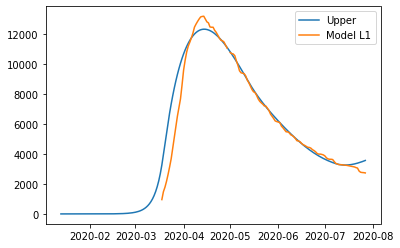

{'home': 0.9995155587304138, 'leisure': 0.8661643062780983, 'other': 0.800000002329314, 'school': 0.9302561563535368, 'transport': 0.8783350071375582, 'work': 0.8000000020620568}
{'home': 0.9995155587304138, 'leisure': 0.1092941736274363, 'other': 0.06838462835554639, 'school': 0, 'transport': 0.11433593836763553, 'work': 0.4164101949593544}
{'home': 0.9995155587304138, 'leisure': 0.1092941736274363, 'other': 0.06838462835554639, 'school': 0, 'transport': 0.11433593836763553, 'work': 0.4164101949593544}
{'home': 0.9995155587304138, 'leisure': 0.1313567726164756, 'other': 0.16442670566593082, 'school': 0.30698453159666717, 'transport': 0.19908294747712138, 'work': 0.7041553496817665}
{'home': 0.9995155587304138, 'leisure': 0.25268795688275125, 'other': 0.2362559345069098, 'school': 0.6232716247568697, 'transport': 0.2639018437662948, 'work': 0.7042776971380091}
{'home': 0.9995155587304138, 'leisure': 0.4212073982349065, 'other': 0.3602385747486992, 'school': 0.6232716247568697, 'transpo

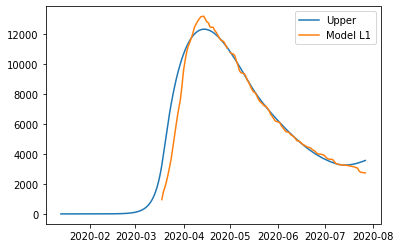

{'home': 0.9995164242771355, 'leisure': 0.8661756339696574, 'other': 0.8000000035739361, 'school': 0.9302651516472481, 'transport': 0.8783443710755947, 'work': 0.8000000031638753}
{'home': 0.9995164242771355, 'leisure': 0.10929509379769083, 'other': 0.06838212227352813, 'school': 0, 'transport': 0.11433632143336256, 'work': 0.4164077887497331}
{'home': 0.9995164242771355, 'leisure': 0.10929509379769083, 'other': 0.06838212227352813, 'school': 0, 'transport': 0.11433632143336256, 'work': 0.4164077887497331}
{'home': 0.9995164242771355, 'leisure': 0.1313580879063422, 'other': 0.16442114884268447, 'school': 0.3069875000435919, 'transport': 0.19908355984600792, 'work': 0.7041395057698563}
{'home': 0.9995164242771355, 'leisure': 0.2526904118769487, 'other': 0.2362506631963022, 'school': 0.6232776516036562, 'transport': 0.26390284395762587, 'work': 0.7042616322635311}
{'home': 0.9995164242771355, 'leisure': 0.42121231324123604, 'other': 0.36023701420394083, 'school': 0.6232776516036562, 'tra

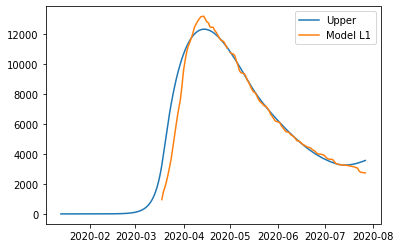

{'home': 0.9995164242771355, 'leisure': 0.8661756339696574, 'other': 0.8000000035739361, 'school': 0.9302651516472481, 'transport': 0.8783443710755947, 'work': 0.8000000031638753}
{'home': 0.9995164242771355, 'leisure': 0.10929509379769083, 'other': 0.06838212227352813, 'school': 0, 'transport': 0.11433632143336256, 'work': 0.4164077887497331}
{'home': 0.9995164242771355, 'leisure': 0.10929509379769083, 'other': 0.06838212227352813, 'school': 0, 'transport': 0.11433632143336256, 'work': 0.4164077887497331}
{'home': 0.9995164242771355, 'leisure': 0.1313580879063422, 'other': 0.16442114884268447, 'school': 0.3069875000435919, 'transport': 0.19908355984600792, 'work': 0.7041395057698563}
{'home': 0.9995164242771355, 'leisure': 0.2526904118769487, 'other': 0.2362506631963022, 'school': 0.6232776516036562, 'transport': 0.26390284395762587, 'work': 0.7042616322635311}
{'home': 0.9995164242771355, 'leisure': 0.42121231324123604, 'other': 0.36023701420394083, 'school': 0.6232776516036562, 'tra

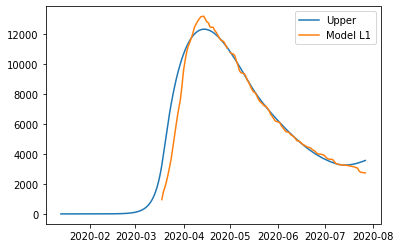

{'home': 0.9995164342771355, 'leisure': 0.8661756339696574, 'other': 0.8000000035739361, 'school': 0.9302651516472481, 'transport': 0.8783443710755947, 'work': 0.8000000031638753}
{'home': 0.9995164342771355, 'leisure': 0.10929509379769083, 'other': 0.06838212227352813, 'school': 0, 'transport': 0.11433632143336256, 'work': 0.4164077887497331}
{'home': 0.9995164342771355, 'leisure': 0.10929509379769083, 'other': 0.06838212227352813, 'school': 0, 'transport': 0.11433632143336256, 'work': 0.4164077887497331}
{'home': 0.9995164342771355, 'leisure': 0.1313580879063422, 'other': 0.16442114884268447, 'school': 0.3069875000435919, 'transport': 0.19908355984600792, 'work': 0.7041395057698563}
{'home': 0.9995164342771355, 'leisure': 0.2526904118769487, 'other': 0.2362506631963022, 'school': 0.6232776516036562, 'transport': 0.26390284395762587, 'work': 0.7042616322635311}
{'home': 0.9995164342771355, 'leisure': 0.42121231324123604, 'other': 0.36023701420394083, 'school': 0.6232776516036562, 'tra

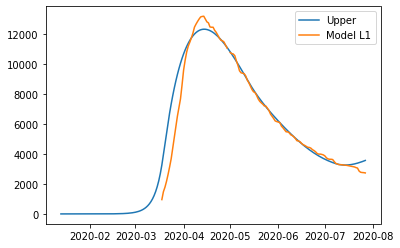

{'home': 0.9995341918070128, 'leisure': 0.8663644181711175, 'other': 0.8000000890248594, 'school': 0.9304151008843154, 'transport': 0.8785005786307492, 'work': 0.800000060185313}
{'home': 0.9995341918070128, 'leisure': 0.10931041074260785, 'other': 0.06834028782195191, 'school': 0, 'transport': 0.11434269927074889, 'work': 0.41636840291313754}
{'home': 0.9995341918070128, 'leisure': 0.10931041074260785, 'other': 0.06834028782195191, 'school': 0, 'transport': 0.11434269927074889, 'work': 0.41636840291313754}
{'home': 0.9995341918070128, 'leisure': 0.13137998794361727, 'other': 0.16432839404068997, 'school': 0.3070369832918241, 'transport': 0.1990937527041567, 'work': 0.7038763851552805}
{'home': 0.9995341918070128, 'leisure': 0.25273128887806173, 'other': 0.2361626638053235, 'school': 0.6233781175924914, 'transport': 0.2639195010763407, 'work': 0.7039933903200689}
{'home': 0.9995341918070128, 'leisure': 0.42129419318627853, 'other': 0.3602109519961904, 'school': 0.6233781175924914, 'tra

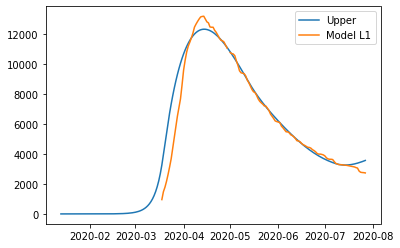

{'home': 0.9995341918070128, 'leisure': 0.8663644181711175, 'other': 0.8000000890248594, 'school': 0.9304151008843154, 'transport': 0.8785005786307492, 'work': 0.800000060185313}
{'home': 0.9995341918070128, 'leisure': 0.10931041074260785, 'other': 0.06834028782195191, 'school': 0, 'transport': 0.11434269927074889, 'work': 0.41636840291313754}
{'home': 0.9995341918070128, 'leisure': 0.10931041074260785, 'other': 0.06834028782195191, 'school': 0, 'transport': 0.11434269927074889, 'work': 0.41636840291313754}
{'home': 0.9995341918070128, 'leisure': 0.13137998794361727, 'other': 0.16432839404068997, 'school': 0.3070369832918241, 'transport': 0.1990937527041567, 'work': 0.7038763851552805}
{'home': 0.9995341918070128, 'leisure': 0.25273128887806173, 'other': 0.2361626638053235, 'school': 0.6233781175924914, 'transport': 0.2639195010763407, 'work': 0.7039933903200689}
{'home': 0.9995341918070128, 'leisure': 0.42129419318627853, 'other': 0.3602109519961904, 'school': 0.6233781175924914, 'tra

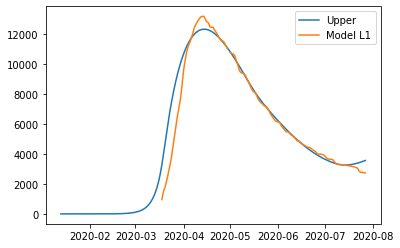

{'home': 0.9995342018070128, 'leisure': 0.8663644181711175, 'other': 0.8000000890248594, 'school': 0.9304151008843154, 'transport': 0.8785005786307492, 'work': 0.800000060185313}
{'home': 0.9995342018070128, 'leisure': 0.10931041074260785, 'other': 0.06834028782195191, 'school': 0, 'transport': 0.11434269927074889, 'work': 0.41636840291313754}
{'home': 0.9995342018070128, 'leisure': 0.10931041074260785, 'other': 0.06834028782195191, 'school': 0, 'transport': 0.11434269927074889, 'work': 0.41636840291313754}
{'home': 0.9995342018070128, 'leisure': 0.13137998794361727, 'other': 0.16432839404068997, 'school': 0.3070369832918241, 'transport': 0.1990937527041567, 'work': 0.7038763851552805}
{'home': 0.9995342018070128, 'leisure': 0.25273128887806173, 'other': 0.2361626638053235, 'school': 0.6233781175924914, 'transport': 0.2639195010763407, 'work': 0.7039933903200689}
{'home': 0.9995342018070128, 'leisure': 0.42129419318627853, 'other': 0.3602109519961904, 'school': 0.6233781175924914, 'tra

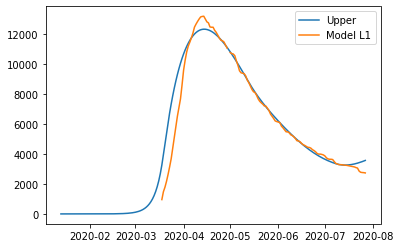

{'home': 0.9995846506363841, 'leisure': 0.8669645818784301, 'other': 0.8000024132061391, 'school': 0.9308891691426413, 'transport': 0.8789800886893707, 'work': 0.8000019811429068}
{'home': 0.9995846506363841, 'leisure': 0.10935878171688139, 'other': 0.0682069560826458, 'school': 0, 'transport': 0.11436080079452389, 'work': 0.4162340292923242}
{'home': 0.9995846506363841, 'leisure': 0.10935878171688139, 'other': 0.0682069560826458, 'school': 0, 'transport': 0.11436080079452389, 'work': 0.4162340292923242}
{'home': 0.9995846506363841, 'leisure': 0.13144860196396177, 'other': 0.16403306691424036, 'school': 0.30719342581707165, 'transport': 0.19912234265047413, 'work': 0.7030549985394475}
{'home': 0.9995846506363841, 'leisure': 0.25285981580884537, 'other': 0.23588113581214915, 'school': 0.6236957433255698, 'transport': 0.26396730552835096, 'work': 0.7031565312410426}
{'home': 0.9995846506363841, 'leisure': 0.42155267942132196, 'other': 0.3601244991402378, 'school': 0.6236957433255698, 'tr

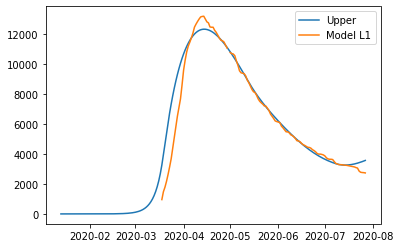

{'home': 0.9995846506363841, 'leisure': 0.8669645818784301, 'other': 0.8000024132061391, 'school': 0.9308891691426413, 'transport': 0.8789800886893707, 'work': 0.8000019811429068}
{'home': 0.9995846506363841, 'leisure': 0.10935878171688139, 'other': 0.0682069560826458, 'school': 0, 'transport': 0.11436080079452389, 'work': 0.4162340292923242}
{'home': 0.9995846506363841, 'leisure': 0.10935878171688139, 'other': 0.0682069560826458, 'school': 0, 'transport': 0.11436080079452389, 'work': 0.4162340292923242}
{'home': 0.9995846506363841, 'leisure': 0.13144860196396177, 'other': 0.16403306691424036, 'school': 0.30719342581707165, 'transport': 0.19912234265047413, 'work': 0.7030549985394475}
{'home': 0.9995846506363841, 'leisure': 0.25285981580884537, 'other': 0.23588113581214915, 'school': 0.6236957433255698, 'transport': 0.26396730552835096, 'work': 0.7031565312410426}
{'home': 0.9995846506363841, 'leisure': 0.42155267942132196, 'other': 0.3601244991402378, 'school': 0.6236957433255698, 'tr

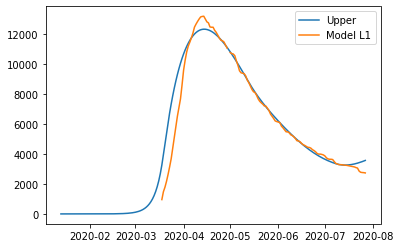

{'home': 0.9995846606363842, 'leisure': 0.8669645818784301, 'other': 0.8000024132061391, 'school': 0.9308891691426413, 'transport': 0.8789800886893707, 'work': 0.8000019811429068}
{'home': 0.9995846606363842, 'leisure': 0.10935878171688139, 'other': 0.0682069560826458, 'school': 0, 'transport': 0.11436080079452389, 'work': 0.4162340292923242}
{'home': 0.9995846606363842, 'leisure': 0.10935878171688139, 'other': 0.0682069560826458, 'school': 0, 'transport': 0.11436080079452389, 'work': 0.4162340292923242}
{'home': 0.9995846606363842, 'leisure': 0.13144860196396177, 'other': 0.16403306691424036, 'school': 0.30719342581707165, 'transport': 0.19912234265047413, 'work': 0.7030549985394475}
{'home': 0.9995846606363842, 'leisure': 0.25285981580884537, 'other': 0.23588113581214915, 'school': 0.6236957433255698, 'transport': 0.26396730552835096, 'work': 0.7031565312410426}
{'home': 0.9995846606363842, 'leisure': 0.42155267942132196, 'other': 0.3601244991402378, 'school': 0.6236957433255698, 'tr

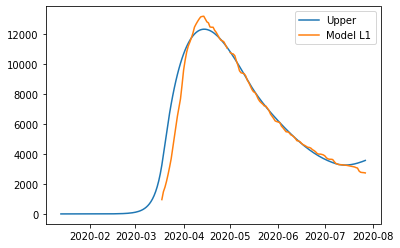

{'home': 0.9995847593501473, 'leisure': 0.8669655991066219, 'other': 0.8000024174986335, 'school': 0.9308900162095052, 'transport': 0.8789809588949498, 'work': 0.8000019849630089}
{'home': 0.9995847593501473, 'leisure': 0.10935886007835291, 'other': 0.06820671175383801, 'school': 0, 'transport': 0.11436083329901389, 'work': 0.4162338012755124}
{'home': 0.9995847593501473, 'leisure': 0.10935886007835291, 'other': 0.06820671175383801, 'school': 0, 'transport': 0.11436083329901389, 'work': 0.4162338012755124}
{'home': 0.9995847593501473, 'leisure': 0.13144871487168053, 'other': 0.16403252658149986, 'school': 0.3071937053491367, 'transport': 0.1991223938869488, 'work': 0.7030534948193538}
{'home': 0.9995847593501473, 'leisure': 0.25286002708999117, 'other': 0.23588061898163715, 'school': 0.6236963108603685, 'transport': 0.263967391466491, 'work': 0.7031550034023752}
{'home': 0.9995847593501473, 'leisure': 0.42155311272560647, 'other': 0.360124336945052, 'school': 0.6236963108603685, 'trans

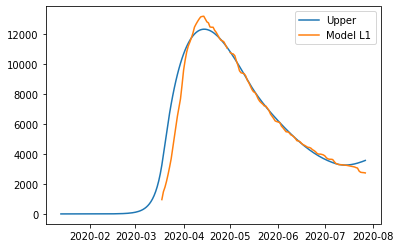

{'home': 0.9995848502538582, 'leisure': 0.8669665358535797, 'other': 0.8000024214515138, 'school': 0.9308907962579881, 'transport': 0.878981760251455, 'work': 0.8000019884808716}
{'home': 0.9995848502538582, 'leisure': 0.10935893223989346, 'other': 0.06820648675589232, 'school': 0, 'transport': 0.11436086323159553, 'work': 0.416233591298925}
{'home': 0.9995848502538582, 'leisure': 0.10935893223989346, 'other': 0.06820648675589232, 'school': 0, 'transport': 0.11436086323159553, 'work': 0.416233591298925}
{'home': 0.9995848502538582, 'leisure': 0.13144881884625223, 'other': 0.1640320289989278, 'school': 0.3071939627651361, 'transport': 0.19912244106930307, 'work': 0.7030521100705247}
{'home': 0.9995848502538582, 'leisure': 0.252860221654763, 'other': 0.235880143041839, 'school': 0.6236968334928521, 'transport': 0.26396747060490067, 'work': 0.7031535964431849}
{'home': 0.9995848502538582, 'leisure': 0.4215535117475079, 'other': 0.36012418758246184, 'school': 0.6236968334928521, 'transport

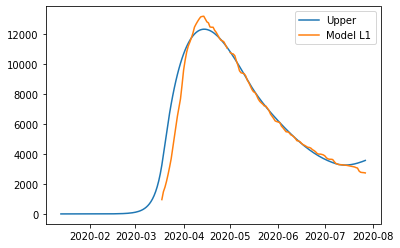

{'home': 0.9995849688245475, 'leisure': 0.8669677577039472, 'other': 0.8000024266074719, 'school': 0.9308918137179515, 'transport': 0.8789828055046393, 'work': 0.8000019930694126}
{'home': 0.9995849688245475, 'leisure': 0.10935902636397815, 'other': 0.0682061932787673, 'school': 0, 'transport': 0.11436090227399497, 'work': 0.41623331741489056}
{'home': 0.9995849688245475, 'leisure': 0.10935902636397815, 'other': 0.0682061932787673, 'school': 0, 'transport': 0.11436090227399497, 'work': 0.41623331741489056}
{'home': 0.9995849688245475, 'leisure': 0.13144895446584456, 'other': 0.1640313799747678, 'school': 0.307194298526924, 'transport': 0.19912250261127845, 'work': 0.703050303866318}
{'home': 0.9995849688245475, 'leisure': 0.2528604754359697, 'other': 0.23587952224753253, 'school': 0.6236975151910276, 'transport': 0.26396757382879754, 'work': 0.7031517612687801}
{'home': 0.9995849688245475, 'leisure': 0.42155403221342747, 'other': 0.36012399276066753, 'school': 0.6236975151910276, 'tran

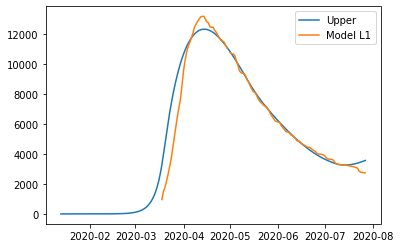

{'home': 0.9995850645693597, 'leisure': 0.8669687443376145, 'other': 0.8000024307708637, 'school': 0.9308926353081247, 'transport': 0.8789836495375992, 'work': 0.8000019967746199}
{'home': 0.9995850645693597, 'leisure': 0.10935910236823082, 'other': 0.06820595629852824, 'school': 0, 'transport': 0.11436093380014375, 'work': 0.4162330962558295}
{'home': 0.9995850645693597, 'leisure': 0.10935910236823082, 'other': 0.06820595629852824, 'school': 0, 'transport': 0.11436093380014375, 'work': 0.4162330962558295}
{'home': 0.9995850645693597, 'leisure': 0.13144906397738648, 'other': 0.1640308558933745, 'school': 0.3071945696516812, 'transport': 0.19912255230543696, 'work': 0.7030488453715699}
{'home': 0.9995850645693597, 'leisure': 0.2528606803618788, 'other': 0.2358790209615018, 'school': 0.6236980656564436, 'transport': 0.2639676571806567, 'work': 0.70315027938084}
{'home': 0.9995850645693597, 'leisure': 0.42155445248501533, 'other': 0.36012383544375437, 'school': 0.6236980656564436, 'transp

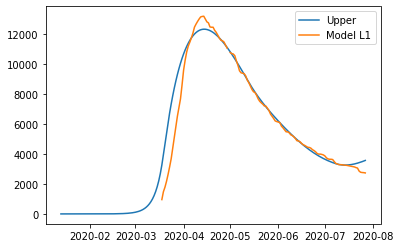

{'home': 0.9995857716589106, 'leisure': 0.8669761338209392, 'other': 0.8000024619529689, 'school': 0.9308987886830662, 'transport': 0.8789899709998502, 'work': 0.8000020245251104}
{'home': 0.9995857716589106, 'leisure': 0.10935967160517178, 'other': 0.06820418141376133, 'school': 0, 'transport': 0.11436116991093653, 'work': 0.4162314398631163}
{'home': 0.9995857716589106, 'leisure': 0.10935967160517178, 'other': 0.06820418141376133, 'school': 0, 'transport': 0.11436116991093653, 'work': 0.4162314398631163}
{'home': 0.9995857716589106, 'leisure': 0.13144988417091294, 'other': 0.16402693073874858, 'school': 0.30719660026541185, 'transport': 0.19912292448139848, 'work': 0.7030379218306327}
{'home': 0.9995857716589106, 'leisure': 0.252862215166635, 'other': 0.23587526653479007, 'school': 0.6237021884176543, 'transport': 0.26396828143642703, 'work': 0.7031391806342739}
{'home': 0.9995857716589106, 'leisure': 0.42155760014285054, 'other': 0.3601226572046192, 'school': 0.6237021884176543, 'tr

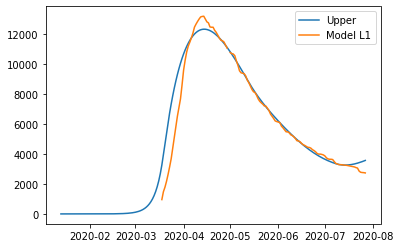

{'home': 0.9995857816589107, 'leisure': 0.8669761338209392, 'other': 0.8000024619529689, 'school': 0.9308987886830662, 'transport': 0.8789899709998502, 'work': 0.8000020245251104}
{'home': 0.9995857816589107, 'leisure': 0.10935967160517178, 'other': 0.06820418141376133, 'school': 0, 'transport': 0.11436116991093653, 'work': 0.4162314398631163}
{'home': 0.9995857816589107, 'leisure': 0.10935967160517178, 'other': 0.06820418141376133, 'school': 0, 'transport': 0.11436116991093653, 'work': 0.4162314398631163}
{'home': 0.9995857816589107, 'leisure': 0.13144988417091294, 'other': 0.16402693073874858, 'school': 0.30719660026541185, 'transport': 0.19912292448139848, 'work': 0.7030379218306327}
{'home': 0.9995857816589107, 'leisure': 0.252862215166635, 'other': 0.23587526653479007, 'school': 0.6237021884176543, 'transport': 0.26396828143642703, 'work': 0.7031391806342739}
{'home': 0.9995857816589107, 'leisure': 0.42155760014285054, 'other': 0.3601226572046192, 'school': 0.6237021884176543, 'tr

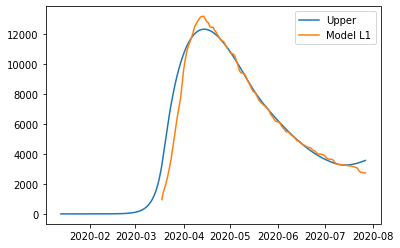

{'home': 0.9995855534157458, 'leisure': 0.8669737818147526, 'other': 0.8000024520279848, 'school': 0.9308968301190781, 'transport': 0.8789879589351809, 'work': 0.8000020156923785}
{'home': 0.9995855534157458, 'leisure': 0.10935949042290753, 'other': 0.06820474634355575, 'school': 0, 'transport': 0.11436109476036763, 'work': 0.4162319670783579}
{'home': 0.9995855534157458, 'leisure': 0.10935949042290753, 'other': 0.06820474634355575, 'school': 0, 'transport': 0.11436109476036763, 'work': 0.4162319670783579}
{'home': 0.9995855534157458, 'leisure': 0.13144962311129282, 'other': 0.1640281800800225, 'school': 0.3071959539392958, 'transport': 0.1991228060236196, 'work': 0.7030413986976857}
{'home': 0.9995855534157458, 'leisure': 0.2528617266533327, 'other': 0.23587646153491046, 'school': 0.6237008761797823, 'transport': 0.2639680827444115, 'work': 0.7031427132677383}
{'home': 0.9995855534157458, 'leisure': 0.4215565982725381, 'other': 0.36012303222749614, 'school': 0.6237008761797823, 'trans

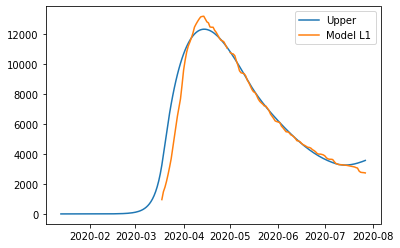

{'home': 0.9995856731402891, 'leisure': 0.866975118603649, 'other': 0.80000245766896, 'school': 0.9308979432907215, 'transport': 0.878989102514532, 'work': 0.80000202071256}
{'home': 0.9995856731402891, 'leisure': 0.10935959339994923, 'other': 0.06820442525940869, 'school': 0, 'transport': 0.11436113747318759, 'work': 0.416231667429743}
{'home': 0.9995856731402891, 'leisure': 0.10935959339994923, 'other': 0.06820442525940869, 'school': 0, 'transport': 0.11436113747318759, 'work': 0.416231667429743}
{'home': 0.9995856731402891, 'leisure': 0.1314497714875041, 'other': 0.1640274700029805, 'school': 0.3071963212859381, 'transport': 0.19912287335070175, 'work': 0.7030394225818314}
{'home': 0.9995856731402891, 'leisure': 0.2528620043054511, 'other': 0.23587578234326892, 'school': 0.6237016220047834, 'transport': 0.2639681956735727, 'work': 0.7031407054564273}
{'home': 0.9995856731402891, 'leisure': 0.4215571676967864, 'other': 0.36012281907906285, 'school': 0.6237016220047834, 'transport': 0

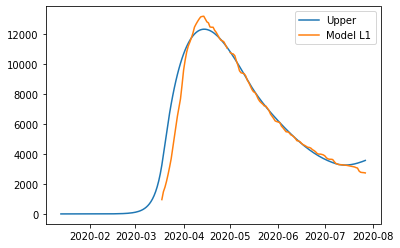

{'home': 0.9995856831402892, 'leisure': 0.866975118603649, 'other': 0.80000245766896, 'school': 0.9308979432907215, 'transport': 0.878989102514532, 'work': 0.80000202071256}
{'home': 0.9995856831402892, 'leisure': 0.10935959339994923, 'other': 0.06820442525940869, 'school': 0, 'transport': 0.11436113747318759, 'work': 0.416231667429743}
{'home': 0.9995856831402892, 'leisure': 0.10935959339994923, 'other': 0.06820442525940869, 'school': 0, 'transport': 0.11436113747318759, 'work': 0.416231667429743}
{'home': 0.9995856831402892, 'leisure': 0.1314497714875041, 'other': 0.1640274700029805, 'school': 0.3071963212859381, 'transport': 0.19912287335070175, 'work': 0.7030394225818314}
{'home': 0.9995856831402892, 'leisure': 0.2528620043054511, 'other': 0.23587578234326892, 'school': 0.6237016220047834, 'transport': 0.2639681956735727, 'work': 0.7031407054564273}
{'home': 0.9995856831402892, 'leisure': 0.4215571676967864, 'other': 0.36012281907906285, 'school': 0.6237016220047834, 'transport': 0

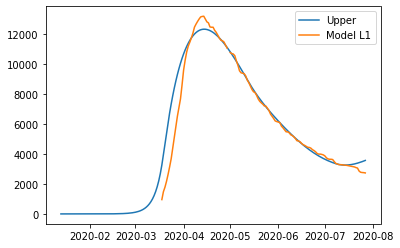

{'home': 0.9995857285939456, 'leisure': 0.8669755887583511, 'other': 0.800002459652315, 'school': 0.9308983347855928, 'transport': 0.8789895047070286, 'work': 0.8000020224775962}
{'home': 0.9995857285939456, 'leisure': 0.10935962961816785, 'other': 0.06820431233643681, 'school': 0, 'transport': 0.11436115249526563, 'work': 0.41623156202037515}
{'home': 0.9995857285939456, 'leisure': 0.10935962961816785, 'other': 0.06820431233643681, 'school': 0, 'transport': 0.11436115249526563, 'work': 0.41623156202037515}
{'home': 0.9995857285939456, 'leisure': 0.13144982367289298, 'other': 0.16402722027381222, 'school': 0.30719645047924565, 'transport': 0.19912289702964625, 'work': 0.7030387275562752}
{'home': 0.9995857285939456, 'leisure': 0.2528621019584145, 'other': 0.23587554347678968, 'school': 0.6237018843063472, 'transport': 0.26396823539066944, 'work': 0.7031399993252416}
{'home': 0.9995857285939456, 'leisure': 0.4215573679670874, 'other': 0.3601227441175629, 'school': 0.6237018843063472, 't

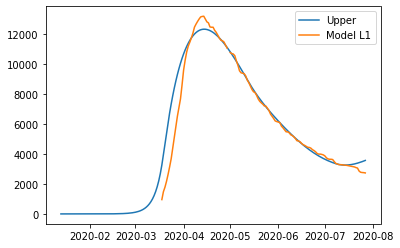

{'home': 0.9995857300888322, 'leisure': 0.8669756042208702, 'other': 0.8000024597175439, 'school': 0.9308983476611354, 'transport': 0.8789895179343963, 'work': 0.800002022535645}
{'home': 0.9995857300888322, 'leisure': 0.10935963080931765, 'other': 0.0682043086226091, 'school': 0, 'transport': 0.11436115298931313, 'work': 0.4162315585536557}
{'home': 0.9995857300888322, 'leisure': 0.10935963080931765, 'other': 0.0682043086226091, 'school': 0, 'transport': 0.11436115298931313, 'work': 0.4162315585536557}
{'home': 0.9995857300888322, 'leisure': 0.13144982538917357, 'other': 0.16402721206068172, 'school': 0.3071964547281747, 'transport': 0.19912289780840134, 'work': 0.7030387046981682}
{'home': 0.9995857300888322, 'leisure': 0.25286210517003915, 'other': 0.2358755356209129, 'school': 0.6237018929329607, 'transport': 0.26396823669688935, 'work': 0.703139976101891}
{'home': 0.9995857300888322, 'leisure': 0.42155737455360687, 'other': 0.36012274165221786, 'school': 0.6237018929329607, 'trans

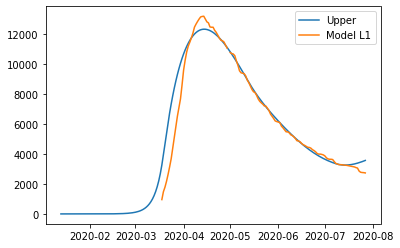

{'home': 0.9995857314288541, 'leisure': 0.8669756180815276, 'other': 0.8000024597760153, 'school': 0.9308983592028178, 'transport': 0.8789895297914561, 'work': 0.8000020225876802}
{'home': 0.9995857314288541, 'leisure': 0.10935963187706856, 'other': 0.06820430529352059, 'school': 0, 'transport': 0.11436115343217904, 'work': 0.41623155544607604}
{'home': 0.9995857314288541, 'leisure': 0.10935963187706856, 'other': 0.06820430529352059, 'school': 0, 'transport': 0.11436115343217904, 'work': 0.41623155544607604}
{'home': 0.9995857314288541, 'leisure': 0.1314498269276536, 'other': 0.16402720469840207, 'school': 0.3071964585369299, 'transport': 0.19912289850648018, 'work': 0.7030386842080792}
{'home': 0.9995857314288541, 'leisure': 0.25286210804895093, 'other': 0.2358755285788768, 'school': 0.6237019006658879, 'transport': 0.2639682378677896, 'work': 0.7031399552843963}
{'home': 0.9995857314288541, 'leisure': 0.4215573804577864, 'other': 0.36012273944227363, 'school': 0.6237019006658879, 'tr

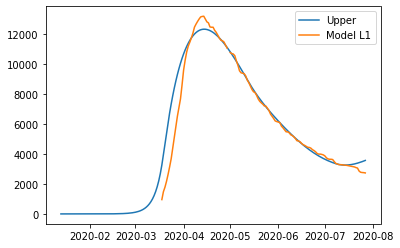

{'home': 0.9995857519327866, 'leisure': 0.8669758301661232, 'other': 0.8000024606706975, 'school': 0.9308985358043304, 'transport': 0.8789897112186175, 'work': 0.8000020233838798}
{'home': 0.9995857519327866, 'leisure': 0.10935964821492838, 'other': 0.06820425435449529, 'school': 0, 'transport': 0.11436116020855022, 'work': 0.4162315078963972}
{'home': 0.9995857519327866, 'leisure': 0.10935964821492838, 'other': 0.06820425435449529, 'school': 0, 'transport': 0.11436116020855022, 'work': 0.4162315078963972}
{'home': 0.9995857519327866, 'leisure': 0.13144985046823124, 'other': 0.16402709204674032, 'school': 0.30719651681542903, 'transport': 0.19912290918790873, 'work': 0.7030383706852615}
{'home': 0.9995857519327866, 'leisure': 0.2528621520997309, 'other': 0.23587542082732335, 'school': 0.6237020189889013, 'transport': 0.2639682557839472, 'work': 0.7031396367518806}
{'home': 0.9995857519327866, 'leisure': 0.42155747079877404, 'other': 0.36012270562749105, 'school': 0.6237020189889013, 't

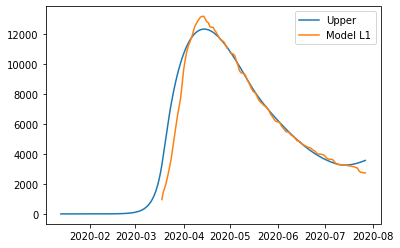

{'home': 0.9997189369966494, 'leisure': 0.8679776565444691, 'other': 0.8000051076303594, 'school': 0.9317073706547643, 'transport': 0.8798164220877653, 'work': 0.8000041392801406}
{'home': 0.9997189369966494, 'leisure': 0.10943929052188069, 'other': 0.06797602690702247, 'school': 0, 'transport': 0.11439280188587007, 'work': 0.4160168738325866}
{'home': 0.9997189369966494, 'leisure': 0.10943929052188069, 'other': 0.06797602690702247, 'school': 0, 'transport': 0.11439280188587007, 'work': 0.4160168738325866}
{'home': 0.9997189369966494, 'leisure': 0.1315636935202927, 'other': 0.16352168722696578, 'school': 0.3074634323160722, 'transport': 0.1991729911728682, 'work': 0.7016331353781766}
{'home': 0.9997189369966494, 'leisure': 0.2530751032117338, 'other': 0.23539368657107979, 'school': 0.6242439383386921, 'transport': 0.2640516525749807, 'work': 0.7016983634361812}
{'home': 0.9997189369966494, 'leisure': 0.4219881190370263, 'other': 0.35997490222082534, 'school': 0.6242439383386921, 'trans

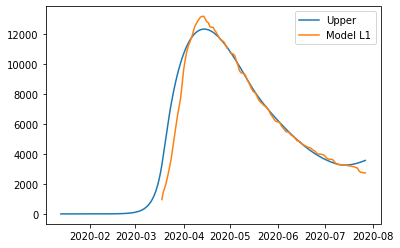

{'home': 0.9997189369966494, 'leisure': 0.8679776565444691, 'other': 0.8000051076303594, 'school': 0.9317073706547643, 'transport': 0.8798164220877653, 'work': 0.8000041392801406}
{'home': 0.9997189369966494, 'leisure': 0.10943929052188069, 'other': 0.06797602690702247, 'school': 0, 'transport': 0.11439280188587007, 'work': 0.4160168738325866}
{'home': 0.9997189369966494, 'leisure': 0.10943929052188069, 'other': 0.06797602690702247, 'school': 0, 'transport': 0.11439280188587007, 'work': 0.4160168738325866}
{'home': 0.9997189369966494, 'leisure': 0.1315636935202927, 'other': 0.16352168722696578, 'school': 0.3074634323160722, 'transport': 0.1991729911728682, 'work': 0.7016331353781766}
{'home': 0.9997189369966494, 'leisure': 0.2530751032117338, 'other': 0.23539368657107979, 'school': 0.6242439383386921, 'transport': 0.2640516525749807, 'work': 0.7016983634361812}
{'home': 0.9997189369966494, 'leisure': 0.4219881190370263, 'other': 0.35997490222082534, 'school': 0.6242439383386921, 'trans

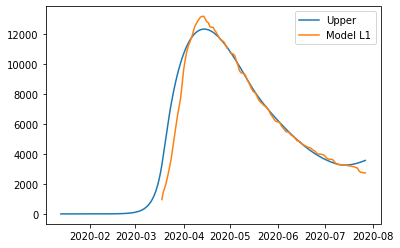

{'home': 0.9997189369966494, 'leisure': 0.8679776565444691, 'other': 0.8000051076303594, 'school': 0.9317073706547643, 'transport': 0.8798164220877653, 'work': 0.8000041392801406}
{'home': 0.9997189369966494, 'leisure': 0.10943929052188069, 'other': 0.06797602690702247, 'school': 0, 'transport': 0.11439280188587007, 'work': 0.4160168738325866}
{'home': 0.9997189369966494, 'leisure': 0.10943929052188069, 'other': 0.06797602690702247, 'school': 0, 'transport': 0.11439280188587007, 'work': 0.4160168738325866}
{'home': 0.9997189369966494, 'leisure': 0.1315636935202927, 'other': 0.16352168722696578, 'school': 0.3074634323160722, 'transport': 0.1991729911728682, 'work': 0.7016331353781766}
{'home': 0.9997189369966494, 'leisure': 0.2530751032117338, 'other': 0.23539368657107979, 'school': 0.6242439383386921, 'transport': 0.2640516525749807, 'work': 0.7016983634361812}
{'home': 0.9997189369966494, 'leisure': 0.4219881190370263, 'other': 0.35997490222082534, 'school': 0.6242439383386921, 'trans

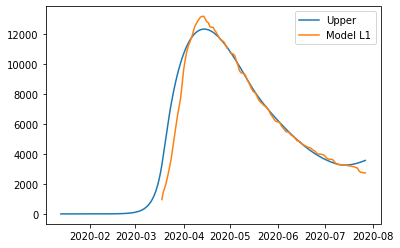

{'home': 0.9997189369966494, 'leisure': 0.8679776565444691, 'other': 0.8000051076303594, 'school': 0.9317073706547643, 'transport': 0.8798164220877653, 'work': 0.8000041392801406}
{'home': 0.9997189369966494, 'leisure': 0.10943929052188069, 'other': 0.06797602690702247, 'school': 0, 'transport': 0.11439280188587007, 'work': 0.4160168738325866}
{'home': 0.9997189369966494, 'leisure': 0.10943929052188069, 'other': 0.06797602690702247, 'school': 0, 'transport': 0.11439280188587007, 'work': 0.4160168738325866}
{'home': 0.9997189369966494, 'leisure': 0.1315636935202927, 'other': 0.16352168722696578, 'school': 0.3074634323160722, 'transport': 0.1991729911728682, 'work': 0.7016331353781766}
{'home': 0.9997189369966494, 'leisure': 0.2530751032117338, 'other': 0.23539368657107979, 'school': 0.6242439383386921, 'transport': 0.2640516525749807, 'work': 0.7016983634361812}
{'home': 0.9997189369966494, 'leisure': 0.4219881190370263, 'other': 0.35997490222082534, 'school': 0.6242439383386921, 'trans

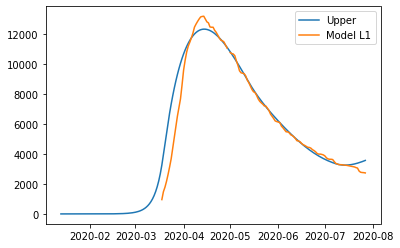

{'home': 0.9997191353943269, 'leisure': 0.8680511012769542, 'other': 0.800005308414771, 'school': 0.9317555772806402, 'transport': 0.8798770521213249, 'work': 0.8000043099706377}
{'home': 0.9997191353943269, 'leisure': 0.10944511715051537, 'other': 0.06795926114810918, 'school': 0, 'transport': 0.1143951066779968, 'work': 0.41599972906101684}
{'home': 0.9997191353943269, 'leisure': 0.10944511715051537, 'other': 0.06795926114810918, 'school': 0, 'transport': 0.1143951066779968, 'work': 0.41599972906101684}
{'home': 0.9997191353943269, 'leisure': 0.13157202624981557, 'other': 0.16348456278885268, 'school': 0.3074793405026113, 'transport': 0.19917663546020245, 'work': 0.7015277165378693}
{'home': 0.9997191353943269, 'leisure': 0.2530906904324536, 'other': 0.23535829142573916, 'school': 0.6242762367780289, 'transport': 0.26405773396489624, 'work': 0.7015928989764015}
{'home': 0.9997191353943269, 'leisure': 0.4220196708456683, 'other': 0.35996402758020846, 'school': 0.6242762367780289, 'tra

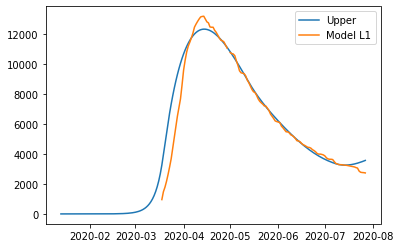

{'home': 0.9997191353943269, 'leisure': 0.8680511012769542, 'other': 0.800005308414771, 'school': 0.9317555772806402, 'transport': 0.8798770521213249, 'work': 0.8000043099706377}
{'home': 0.9997191353943269, 'leisure': 0.10944511715051537, 'other': 0.06795926114810918, 'school': 0, 'transport': 0.1143951066779968, 'work': 0.41599972906101684}
{'home': 0.9997191353943269, 'leisure': 0.10944511715051537, 'other': 0.06795926114810918, 'school': 0, 'transport': 0.1143951066779968, 'work': 0.41599972906101684}
{'home': 0.9997191353943269, 'leisure': 0.13157202624981557, 'other': 0.16348456278885268, 'school': 0.3074793405026113, 'transport': 0.19917663546020245, 'work': 0.7015277165378693}
{'home': 0.9997191353943269, 'leisure': 0.2530906904324536, 'other': 0.23535829142573916, 'school': 0.6242762367780289, 'transport': 0.26405773396489624, 'work': 0.7015928989764015}
{'home': 0.9997191353943269, 'leisure': 0.4220196708456683, 'other': 0.35996402758020846, 'school': 0.6242762367780289, 'tra

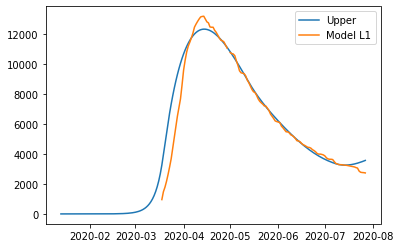

{'home': 0.9997191453943269, 'leisure': 0.8680511012769542, 'other': 0.800005308414771, 'school': 0.9317555772806402, 'transport': 0.8798770521213249, 'work': 0.8000043099706377}
{'home': 0.9997191453943269, 'leisure': 0.10944511715051537, 'other': 0.06795926114810918, 'school': 0, 'transport': 0.1143951066779968, 'work': 0.41599972906101684}
{'home': 0.9997191453943269, 'leisure': 0.10944511715051537, 'other': 0.06795926114810918, 'school': 0, 'transport': 0.1143951066779968, 'work': 0.41599972906101684}
{'home': 0.9997191453943269, 'leisure': 0.13157202624981557, 'other': 0.16348456278885268, 'school': 0.3074793405026113, 'transport': 0.19917663546020245, 'work': 0.7015277165378693}
{'home': 0.9997191453943269, 'leisure': 0.2530906904324536, 'other': 0.23535829142573916, 'school': 0.6242762367780289, 'transport': 0.26405773396489624, 'work': 0.7015928989764015}
{'home': 0.9997191453943269, 'leisure': 0.4220196708456683, 'other': 0.35996402758020846, 'school': 0.6242762367780289, 'tra

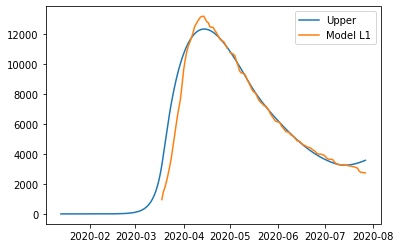

{'home': 0.9999785210310917, 'leisure': 0.8703917309163316, 'other': 0.8000120375033378, 'school': 0.9336516610838852, 'transport': 0.8818097922977539, 'work': 0.8000102039242507}
{'home': 0.9999785210310917, 'leisure': 0.10963038094482838, 'other': 0.0674245829539425, 'school': 0, 'transport': 0.11446790103470765, 'work': 0.41548597973704404}
{'home': 0.9999785210310917, 'leisure': 0.10963038094482838, 'other': 0.0674245829539425, 'school': 0, 'transport': 0.11446790103470765, 'work': 0.41548597973704404}
{'home': 0.9999785210310917, 'leisure': 0.1318371952072032, 'other': 0.1623006692016254, 'school': 0.30810504815768214, 'transport': 0.1992915814924089, 'work': 0.6982217452926701}
{'home': 0.9999785210310917, 'leisure': 0.2535866717417095, 'other': 0.2342294496673712, 'school': 0.6255466129262032, 'transport': 0.26425011692080086, 'work': 0.6982217452926701}
{'home': 0.9999785210310917, 'leisure': 0.4230246270929304, 'other': 0.35961710539502584, 'school': 0.6255466129262032, 'trans

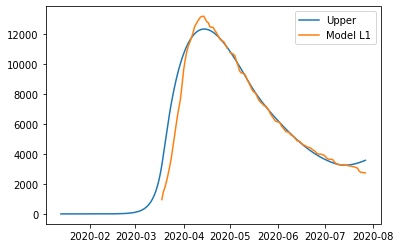

{'home': 0.9999785210310917, 'leisure': 0.8703917309163316, 'other': 0.8000120375033378, 'school': 0.9336516610838852, 'transport': 0.8818097922977539, 'work': 0.8000102039242507}
{'home': 0.9999785210310917, 'leisure': 0.10963038094482838, 'other': 0.0674245829539425, 'school': 0, 'transport': 0.11446790103470765, 'work': 0.41548597973704404}
{'home': 0.9999785210310917, 'leisure': 0.10963038094482838, 'other': 0.0674245829539425, 'school': 0, 'transport': 0.11446790103470765, 'work': 0.41548597973704404}
{'home': 0.9999785210310917, 'leisure': 0.1318371952072032, 'other': 0.1623006692016254, 'school': 0.30810504815768214, 'transport': 0.1992915814924089, 'work': 0.6982217452926701}
{'home': 0.9999785210310917, 'leisure': 0.2535866717417095, 'other': 0.2342294496673712, 'school': 0.6255466129262032, 'transport': 0.26425011692080086, 'work': 0.6982217452926701}
{'home': 0.9999785210310917, 'leisure': 0.4230246270929304, 'other': 0.35961710539502584, 'school': 0.6255466129262032, 'trans

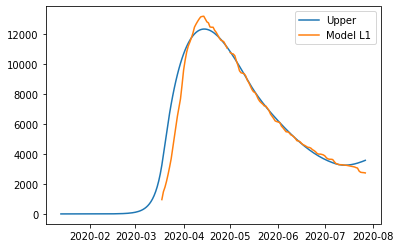

{'home': 0.9999817980964006, 'leisure': 0.8703537842900635, 'other': 0.8000081637253034, 'school': 0.9336281800307744, 'transport': 0.8817815778410272, 'work': 0.8000086295254601}
{'home': 0.9999817980964006, 'leisure': 0.10962678634590343, 'other': 0.06743022022820971, 'school': 0, 'transport': 0.11446635205577681, 'work': 0.4154911859288289}
{'home': 0.9999817980964006, 'leisure': 0.10962678634590343, 'other': 0.06743022022820971, 'school': 0, 'transport': 0.11446635205577681, 'work': 0.4154911859288289}
{'home': 0.9999817980964006, 'leisure': 0.13183215638029203, 'other': 0.16231323671804265, 'school': 0.30809729941015557, 'transport': 0.19928901278674527, 'work': 0.6982632863298552}
{'home': 0.9999817980964006, 'leisure': 0.2535773346825393, 'other': 0.23424046377733057, 'school': 0.6255308806206189, 'transport': 0.2642462094234488, 'work': 0.6982632863298552}
{'home': 0.9999817980964006, 'leisure': 0.42300715486323665, 'other': 0.3596176608955029, 'school': 0.6255308806206189, 'tr

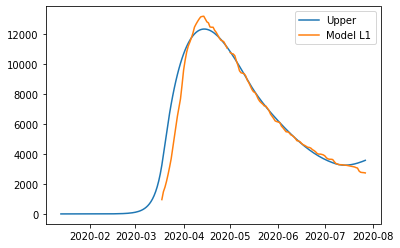

{'home': 0.9999817980964006, 'leisure': 0.8703537842900635, 'other': 0.8000081637253034, 'school': 0.9336281800307744, 'transport': 0.8817815778410272, 'work': 0.8000086295254601}
{'home': 0.9999817980964006, 'leisure': 0.10962678634590343, 'other': 0.06743022022820971, 'school': 0, 'transport': 0.11446635205577681, 'work': 0.4154911859288289}
{'home': 0.9999817980964006, 'leisure': 0.10962678634590343, 'other': 0.06743022022820971, 'school': 0, 'transport': 0.11446635205577681, 'work': 0.4154911859288289}
{'home': 0.9999817980964006, 'leisure': 0.13183215638029203, 'other': 0.16231323671804265, 'school': 0.30809729941015557, 'transport': 0.19928901278674527, 'work': 0.6982632863298552}
{'home': 0.9999817980964006, 'leisure': 0.2535773346825393, 'other': 0.23424046377733057, 'school': 0.6255308806206189, 'transport': 0.2642462094234488, 'work': 0.6982632863298552}
{'home': 0.9999817980964006, 'leisure': 0.42300715486323665, 'other': 0.3596176608955029, 'school': 0.6255308806206189, 'tr

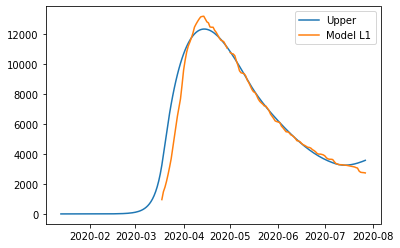

{'home': 0.9999817980964006, 'leisure': 0.8703537842900635, 'other': 0.8000081637253034, 'school': 0.9336281800307744, 'transport': 0.8817815778410272, 'work': 0.8000086295254601}
{'home': 0.9999817980964006, 'leisure': 0.10962678634590343, 'other': 0.06743022022820971, 'school': 0, 'transport': 0.11446635205577681, 'work': 0.4154911859288289}
{'home': 0.9999817980964006, 'leisure': 0.10962678634590343, 'other': 0.06743022022820971, 'school': 0, 'transport': 0.11446635205577681, 'work': 0.4154911859288289}
{'home': 0.9999817980964006, 'leisure': 0.13183215638029203, 'other': 0.16231323671804265, 'school': 0.30809729941015557, 'transport': 0.19928901278674527, 'work': 0.6982632863298552}
{'home': 0.9999817980964006, 'leisure': 0.2535773346825393, 'other': 0.23424046377733057, 'school': 0.6255308806206189, 'transport': 0.2642462094234488, 'work': 0.6982632863298552}
{'home': 0.9999817980964006, 'leisure': 0.42300715486323665, 'other': 0.3596176608955029, 'school': 0.6255308806206189, 'tr

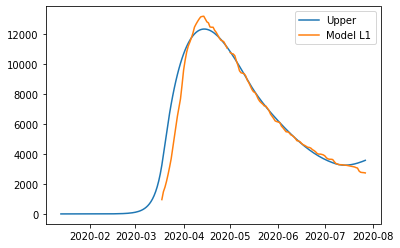

{'home': 0.9999817980964006, 'leisure': 0.8703537842900635, 'other': 0.8000081637253034, 'school': 0.9336281800307744, 'transport': 0.8817815778410272, 'work': 0.8000086295254601}
{'home': 0.9999817980964006, 'leisure': 0.10962678634590343, 'other': 0.06743022022820971, 'school': 0, 'transport': 0.11446635205577681, 'work': 0.4154911859288289}
{'home': 0.9999817980964006, 'leisure': 0.10962678634590343, 'other': 0.06743022022820971, 'school': 0, 'transport': 0.11446635205577681, 'work': 0.4154911859288289}
{'home': 0.9999817980964006, 'leisure': 0.13183215638029203, 'other': 0.16231323671804265, 'school': 0.30809729941015557, 'transport': 0.19928901278674527, 'work': 0.6982632863298552}
{'home': 0.9999817980964006, 'leisure': 0.2535773346825393, 'other': 0.23424046377733057, 'school': 0.6255308806206189, 'transport': 0.2642462094234488, 'work': 0.6982632863298552}
{'home': 0.9999817980964006, 'leisure': 0.42300715486323665, 'other': 0.3596176608955029, 'school': 0.6255308806206189, 'tr

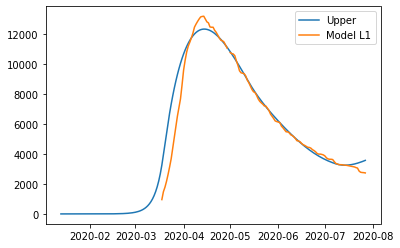

{'home': 0.9999778513687776, 'leisure': 0.8701447841955188, 'other': 0.8, 'school': 0.9334728448419765, 'transport': 0.8816212515520997, 'work': 0.8000018411400248}
{'home': 0.9999778513687776, 'leisure': 0.10960773995396506, 'other': 0.06746586662647497, 'school': 0, 'transport': 0.11445819647738041, 'work': 0.41552435874380733}
{'home': 0.9999778513687776, 'leisure': 0.10960773995396506, 'other': 0.06746586662647497, 'school': 0, 'transport': 0.11445819647738041, 'work': 0.41552435874380733}
{'home': 0.9999778513687776, 'leisure': 0.13180530363328202, 'other': 0.16239267019061784, 'school': 0.30804603879785225, 'transport': 0.19927559967098962, 'work': 0.6985094903216976}
{'home': 0.9999778513687776, 'leisure': 0.25352751119837913, 'other': 0.23431286864575473, 'school': 0.6254268060441243, 'transport': 0.2642254647253132, 'work': 0.6985094903216976}
{'home': 0.9999778513687776, 'leisure': 0.4229123373495339, 'other': 0.3596307055650071, 'school': 0.6254268060441243, 'transport': 0.4

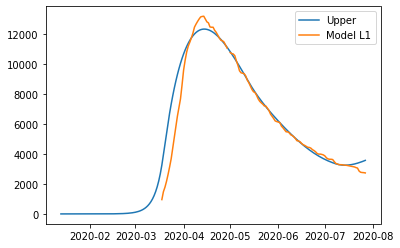

{'home': 0.9999778513687776, 'leisure': 0.8701447841955188, 'other': 0.8, 'school': 0.9334728448419765, 'transport': 0.8816212515520997, 'work': 0.8000018411400248}
{'home': 0.9999778513687776, 'leisure': 0.10960773995396506, 'other': 0.06746586662647497, 'school': 0, 'transport': 0.11445819647738041, 'work': 0.41552435874380733}
{'home': 0.9999778513687776, 'leisure': 0.10960773995396506, 'other': 0.06746586662647497, 'school': 0, 'transport': 0.11445819647738041, 'work': 0.41552435874380733}
{'home': 0.9999778513687776, 'leisure': 0.13180530363328202, 'other': 0.16239267019061784, 'school': 0.30804603879785225, 'transport': 0.19927559967098962, 'work': 0.6985094903216976}
{'home': 0.9999778513687776, 'leisure': 0.25352751119837913, 'other': 0.23431286864575473, 'school': 0.6254268060441243, 'transport': 0.2642254647253132, 'work': 0.6985094903216976}
{'home': 0.9999778513687776, 'leisure': 0.4229123373495339, 'other': 0.3596307055650071, 'school': 0.6254268060441243, 'transport': 0.4

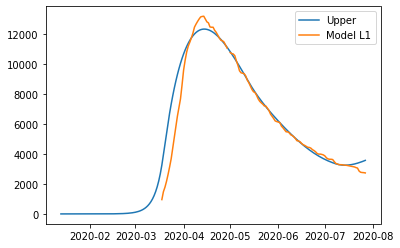

{'home': 0.9999778613687776, 'leisure': 0.8701447841955188, 'other': 0.8, 'school': 0.9334728448419765, 'transport': 0.8816212515520997, 'work': 0.8000018411400248}
{'home': 0.9999778613687776, 'leisure': 0.10960773995396506, 'other': 0.06746586662647497, 'school': 0, 'transport': 0.11445819647738041, 'work': 0.41552435874380733}
{'home': 0.9999778613687776, 'leisure': 0.10960773995396506, 'other': 0.06746586662647497, 'school': 0, 'transport': 0.11445819647738041, 'work': 0.41552435874380733}
{'home': 0.9999778613687776, 'leisure': 0.13180530363328202, 'other': 0.16239267019061784, 'school': 0.30804603879785225, 'transport': 0.19927559967098962, 'work': 0.6985094903216976}
{'home': 0.9999778613687776, 'leisure': 0.25352751119837913, 'other': 0.23431286864575473, 'school': 0.6254268060441243, 'transport': 0.2642254647253132, 'work': 0.6985094903216976}
{'home': 0.9999778613687776, 'leisure': 0.4229123373495339, 'other': 0.3596307055650071, 'school': 0.6254268060441243, 'transport': 0.4

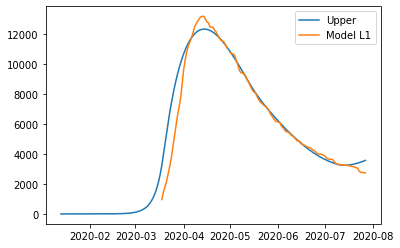

{'home': 0.9999914358310382, 'leisure': 0.8702455455958862, 'other': 0.8, 'school': 0.9335548600934189, 'transport': 0.8817053640911533, 'work': 0.8000019665291187}
{'home': 0.9999914358310382, 'leisure': 0.10961527167965171, 'other': 0.06744091106902665, 'school': 0, 'transport': 0.11446090308591285, 'work': 0.4154981232846819}
{'home': 0.9999914358310382, 'leisure': 0.10961527167965171, 'other': 0.06744091106902665, 'school': 0, 'transport': 0.11446090308591285, 'work': 0.4154981232846819}
{'home': 0.9999914358310382, 'leisure': 0.13181611498581364, 'other': 0.16233754801753617, 'school': 0.30807310383082825, 'transport': 0.1992797574507768, 'work': 0.6983577399568012}
{'home': 0.9999914358310382, 'leisure': 0.25354783337778236, 'other': 0.23425971452238567, 'school': 0.6254817562625907, 'transport': 0.2642327949277633, 'work': 0.6983577399568012}
{'home': 0.9999914358310382, 'leisure': 0.4229546300606931, 'other': 0.3596129122011691, 'school': 0.6254817562625907, 'transport': 0.4376

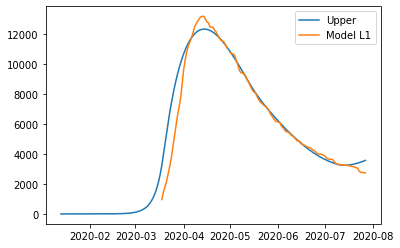

{'home': 0.9999914358310382, 'leisure': 0.8702455455958862, 'other': 0.8, 'school': 0.9335548600934189, 'transport': 0.8817053640911533, 'work': 0.8000019665291187}
{'home': 0.9999914358310382, 'leisure': 0.10961527167965171, 'other': 0.06744091106902665, 'school': 0, 'transport': 0.11446090308591285, 'work': 0.4154981232846819}
{'home': 0.9999914358310382, 'leisure': 0.10961527167965171, 'other': 0.06744091106902665, 'school': 0, 'transport': 0.11446090308591285, 'work': 0.4154981232846819}
{'home': 0.9999914358310382, 'leisure': 0.13181611498581364, 'other': 0.16233754801753617, 'school': 0.30807310383082825, 'transport': 0.1992797574507768, 'work': 0.6983577399568012}
{'home': 0.9999914358310382, 'leisure': 0.25354783337778236, 'other': 0.23425971452238567, 'school': 0.6254817562625907, 'transport': 0.2642327949277633, 'work': 0.6983577399568012}
{'home': 0.9999914358310382, 'leisure': 0.4229546300606931, 'other': 0.3596129122011691, 'school': 0.6254817562625907, 'transport': 0.4376

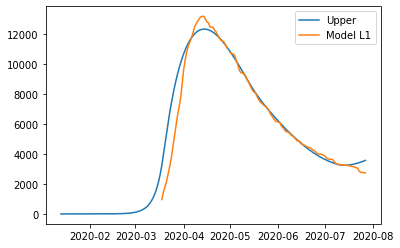

{'home': 0.9999914358310382, 'leisure': 0.8702455455958862, 'other': 0.8, 'school': 0.9335548600934189, 'transport': 0.8817053640911533, 'work': 0.8000019665291187}
{'home': 0.9999914358310382, 'leisure': 0.10961527167965171, 'other': 0.06744091106902665, 'school': 0, 'transport': 0.11446090308591285, 'work': 0.4154981232846819}
{'home': 0.9999914358310382, 'leisure': 0.10961527167965171, 'other': 0.06744091106902665, 'school': 0, 'transport': 0.11446090308591285, 'work': 0.4154981232846819}
{'home': 0.9999914358310382, 'leisure': 0.13181611498581364, 'other': 0.16233754801753617, 'school': 0.30807310383082825, 'transport': 0.1992797574507768, 'work': 0.6983577399568012}
{'home': 0.9999914358310382, 'leisure': 0.25354783337778236, 'other': 0.23425971452238567, 'school': 0.6254817562625907, 'transport': 0.2642327949277633, 'work': 0.6983577399568012}
{'home': 0.9999914358310382, 'leisure': 0.4229546300606931, 'other': 0.3596129122011691, 'school': 0.6254817562625907, 'transport': 0.4376

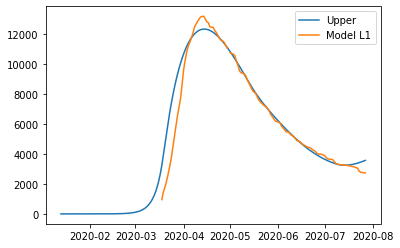

{'home': 0.9999914458310383, 'leisure': 0.8702455455958862, 'other': 0.8, 'school': 0.9335548600934189, 'transport': 0.8817053640911533, 'work': 0.8000019665291187}
{'home': 0.9999914458310383, 'leisure': 0.10961527167965171, 'other': 0.06744091106902665, 'school': 0, 'transport': 0.11446090308591285, 'work': 0.4154981232846819}
{'home': 0.9999914458310383, 'leisure': 0.10961527167965171, 'other': 0.06744091106902665, 'school': 0, 'transport': 0.11446090308591285, 'work': 0.4154981232846819}
{'home': 0.9999914458310383, 'leisure': 0.13181611498581364, 'other': 0.16233754801753617, 'school': 0.30807310383082825, 'transport': 0.1992797574507768, 'work': 0.6983577399568012}
{'home': 0.9999914458310383, 'leisure': 0.25354783337778236, 'other': 0.23425971452238567, 'school': 0.6254817562625907, 'transport': 0.2642327949277633, 'work': 0.6983577399568012}
{'home': 0.9999914458310383, 'leisure': 0.4229546300606931, 'other': 0.3596129122011691, 'school': 0.6254817562625907, 'transport': 0.4376

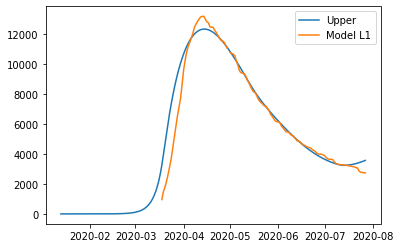

{'home': 0.9999933198424513, 'leisure': 0.8702952221095467, 'other': 0.8, 'school': 0.9335962196951191, 'transport': 0.8817460530007112, 'work': 0.8000023747237855}
{'home': 0.9999933198424513, 'leisure': 0.10961921600873062, 'other': 0.0674296517131555, 'school': 0, 'transport': 0.1144624288972655, 'work': 0.41548677074910284}
{'home': 0.9999933198424513, 'leisure': 0.10961921600873062, 'other': 0.0674296517131555, 'school': 0, 'transport': 0.1144624288972655, 'work': 0.41548677074910284}
{'home': 0.9999933198424513, 'leisure': 0.1318217473864344, 'other': 0.16231261934097507, 'school': 0.3080867524993893, 'transport': 0.1992821651101295, 'work': 0.6982873407070433}
{'home': 0.9999933198424513, 'leisure': 0.2535583744091964, 'other': 0.23423591676691863, 'school': 0.6255094671957299, 'transport': 0.264236829544144, 'work': 0.6982873407070433}
{'home': 0.9999933198424513, 'leisure': 0.422975962369075, 'other': 0.35960551922809275, 'school': 0.6255094671957299, 'transport': 0.4376501541

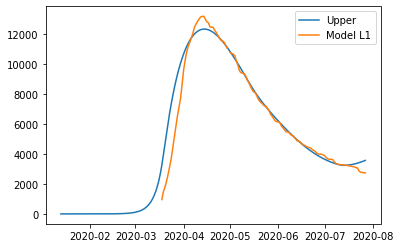

{'home': 0.9999933198424513, 'leisure': 0.8702952221095467, 'other': 0.8, 'school': 0.9335962196951191, 'transport': 0.8817460530007112, 'work': 0.8000023747237855}
{'home': 0.9999933198424513, 'leisure': 0.10961921600873062, 'other': 0.0674296517131555, 'school': 0, 'transport': 0.1144624288972655, 'work': 0.41548677074910284}
{'home': 0.9999933198424513, 'leisure': 0.10961921600873062, 'other': 0.0674296517131555, 'school': 0, 'transport': 0.1144624288972655, 'work': 0.41548677074910284}
{'home': 0.9999933198424513, 'leisure': 0.1318217473864344, 'other': 0.16231261934097507, 'school': 0.3080867524993893, 'transport': 0.1992821651101295, 'work': 0.6982873407070433}
{'home': 0.9999933198424513, 'leisure': 0.2535583744091964, 'other': 0.23423591676691863, 'school': 0.6255094671957299, 'transport': 0.264236829544144, 'work': 0.6982873407070433}
{'home': 0.9999933198424513, 'leisure': 0.422975962369075, 'other': 0.35960551922809275, 'school': 0.6255094671957299, 'transport': 0.4376501541

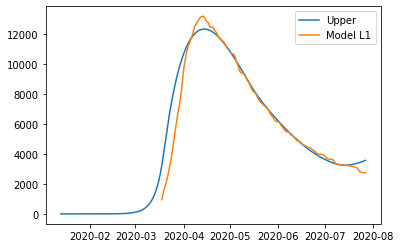

{'home': 0.9999933198424513, 'leisure': 0.8702952221095467, 'other': 0.8, 'school': 0.9335962196951191, 'transport': 0.8817460530007112, 'work': 0.8000023747237855}
{'home': 0.9999933198424513, 'leisure': 0.10961921600873062, 'other': 0.0674296517131555, 'school': 0, 'transport': 0.1144624288972655, 'work': 0.41548677074910284}
{'home': 0.9999933198424513, 'leisure': 0.10961921600873062, 'other': 0.0674296517131555, 'school': 0, 'transport': 0.1144624288972655, 'work': 0.41548677074910284}
{'home': 0.9999933198424513, 'leisure': 0.1318217473864344, 'other': 0.16231261934097507, 'school': 0.3080867524993893, 'transport': 0.1992821651101295, 'work': 0.6982873407070433}
{'home': 0.9999933198424513, 'leisure': 0.2535583744091964, 'other': 0.23423591676691863, 'school': 0.6255094671957299, 'transport': 0.264236829544144, 'work': 0.6982873407070433}
{'home': 0.9999933198424513, 'leisure': 0.422975962369075, 'other': 0.35960551922809275, 'school': 0.6255094671957299, 'transport': 0.4376501541

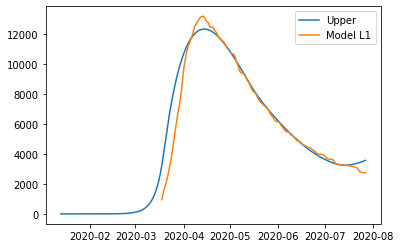

{'home': 0.9999933298424514, 'leisure': 0.8702952221095467, 'other': 0.8, 'school': 0.9335962196951191, 'transport': 0.8817460530007112, 'work': 0.8000023747237855}
{'home': 0.9999933298424514, 'leisure': 0.10961921600873062, 'other': 0.0674296517131555, 'school': 0, 'transport': 0.1144624288972655, 'work': 0.41548677074910284}
{'home': 0.9999933298424514, 'leisure': 0.10961921600873062, 'other': 0.0674296517131555, 'school': 0, 'transport': 0.1144624288972655, 'work': 0.41548677074910284}
{'home': 0.9999933298424514, 'leisure': 0.1318217473864344, 'other': 0.16231261934097507, 'school': 0.3080867524993893, 'transport': 0.1992821651101295, 'work': 0.6982873407070433}
{'home': 0.9999933298424514, 'leisure': 0.2535583744091964, 'other': 0.23423591676691863, 'school': 0.6255094671957299, 'transport': 0.264236829544144, 'work': 0.6982873407070433}
{'home': 0.9999933298424514, 'leisure': 0.422975962369075, 'other': 0.35960551922809275, 'school': 0.6255094671957299, 'transport': 0.4376501541

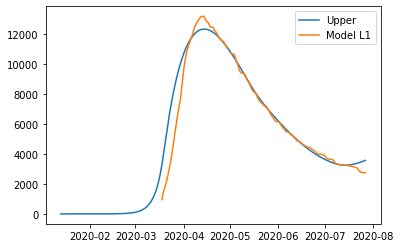

{'home': 0.9999937260594234, 'leisure': 0.8703059330016445, 'other': 0.8, 'school': 0.9336051373545595, 'transport': 0.8817548260503424, 'work': 0.8000024627357797}
{'home': 0.9999937260594234, 'leisure': 0.1096200664185027, 'other': 0.06742722405763235, 'school': 0, 'transport': 0.11446275781351326, 'work': 0.4154843229829673}
{'home': 0.9999937260594234, 'leisure': 0.1096200664185027, 'other': 0.06742722405763235, 'school': 0, 'transport': 0.11446275781351326, 'work': 0.4154843229829673}
{'home': 0.9999937260594234, 'leisure': 0.13182296177295805, 'other': 0.16230724441189118, 'school': 0.30808969532700464, 'transport': 0.1992826841090304, 'work': 0.6982721616411001}
{'home': 0.9999937260594234, 'leisure': 0.253560647125769, 'other': 0.2342307856783236, 'school': 0.6255154420275549, 'transport': 0.2642376993109164, 'work': 0.6982721616411001}
{'home': 0.9999937260594234, 'leisure': 0.42298056184151156, 'other': 0.35960392521222484, 'school': 0.6255154420275549, 'transport': 0.4376518

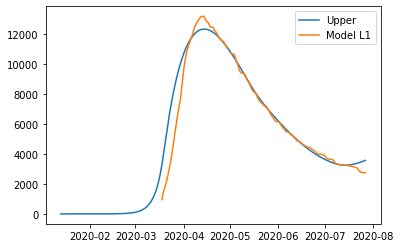

{'home': 0.9999937260594234, 'leisure': 0.8703059330016445, 'other': 0.8, 'school': 0.9336051373545595, 'transport': 0.8817548260503424, 'work': 0.8000024627357797}
{'home': 0.9999937260594234, 'leisure': 0.1096200664185027, 'other': 0.06742722405763235, 'school': 0, 'transport': 0.11446275781351326, 'work': 0.4154843229829673}
{'home': 0.9999937260594234, 'leisure': 0.1096200664185027, 'other': 0.06742722405763235, 'school': 0, 'transport': 0.11446275781351326, 'work': 0.4154843229829673}
{'home': 0.9999937260594234, 'leisure': 0.13182296177295805, 'other': 0.16230724441189118, 'school': 0.30808969532700464, 'transport': 0.1992826841090304, 'work': 0.6982721616411001}
{'home': 0.9999937260594234, 'leisure': 0.253560647125769, 'other': 0.2342307856783236, 'school': 0.6255154420275549, 'transport': 0.2642376993109164, 'work': 0.6982721616411001}
{'home': 0.9999937260594234, 'leisure': 0.42298056184151156, 'other': 0.35960392521222484, 'school': 0.6255154420275549, 'transport': 0.4376518

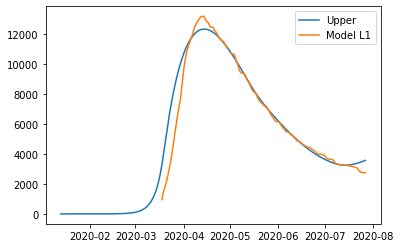

{'home': 0.9999937260594234, 'leisure': 0.8703059330016445, 'other': 0.8, 'school': 0.9336051373545595, 'transport': 0.8817548260503424, 'work': 0.8000024627357797}
{'home': 0.9999937260594234, 'leisure': 0.1096200664185027, 'other': 0.06742722405763235, 'school': 0, 'transport': 0.11446275781351326, 'work': 0.4154843229829673}
{'home': 0.9999937260594234, 'leisure': 0.1096200664185027, 'other': 0.06742722405763235, 'school': 0, 'transport': 0.11446275781351326, 'work': 0.4154843229829673}
{'home': 0.9999937260594234, 'leisure': 0.13182296177295805, 'other': 0.16230724441189118, 'school': 0.30808969532700464, 'transport': 0.1992826841090304, 'work': 0.6982721616411001}
{'home': 0.9999937260594234, 'leisure': 0.253560647125769, 'other': 0.2342307856783236, 'school': 0.6255154420275549, 'transport': 0.2642376993109164, 'work': 0.6982721616411001}
{'home': 0.9999937260594234, 'leisure': 0.42298056184151156, 'other': 0.35960392521222484, 'school': 0.6255154420275549, 'transport': 0.4376518

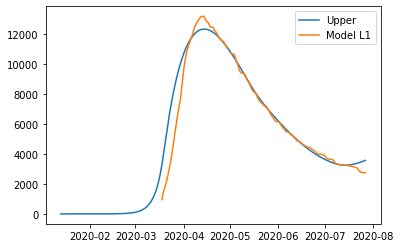

{'home': 0.9999937260594234, 'leisure': 0.8703059330016445, 'other': 0.8, 'school': 0.9336051373545595, 'transport': 0.8817548260503424, 'work': 0.8000024627357797}
{'home': 0.9999937260594234, 'leisure': 0.1096200664185027, 'other': 0.06742722405763235, 'school': 0, 'transport': 0.11446275781351326, 'work': 0.4154843229829673}
{'home': 0.9999937260594234, 'leisure': 0.1096200664185027, 'other': 0.06742722405763235, 'school': 0, 'transport': 0.11446275781351326, 'work': 0.4154843229829673}
{'home': 0.9999937260594234, 'leisure': 0.13182296177295805, 'other': 0.16230724441189118, 'school': 0.30808969532700464, 'transport': 0.1992826841090304, 'work': 0.6982721616411001}
{'home': 0.9999937260594234, 'leisure': 0.253560647125769, 'other': 0.2342307856783236, 'school': 0.6255154420275549, 'transport': 0.2642376993109164, 'work': 0.6982721616411001}
{'home': 0.9999937260594234, 'leisure': 0.42298056184151156, 'other': 0.35960392521222484, 'school': 0.6255154420275549, 'transport': 0.4376518

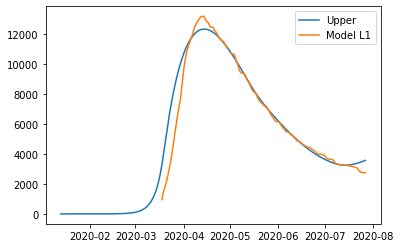

{'home': 0.9999937360594234, 'leisure': 0.8703059330016445, 'other': 0.8, 'school': 0.9336051373545595, 'transport': 0.8817548260503424, 'work': 0.8000024627357797}
{'home': 0.9999937360594234, 'leisure': 0.1096200664185027, 'other': 0.06742722405763235, 'school': 0, 'transport': 0.11446275781351326, 'work': 0.4154843229829673}
{'home': 0.9999937360594234, 'leisure': 0.1096200664185027, 'other': 0.06742722405763235, 'school': 0, 'transport': 0.11446275781351326, 'work': 0.4154843229829673}
{'home': 0.9999937360594234, 'leisure': 0.13182296177295805, 'other': 0.16230724441189118, 'school': 0.30808969532700464, 'transport': 0.1992826841090304, 'work': 0.6982721616411001}
{'home': 0.9999937360594234, 'leisure': 0.253560647125769, 'other': 0.2342307856783236, 'school': 0.6255154420275549, 'transport': 0.2642376993109164, 'work': 0.6982721616411001}
{'home': 0.9999937360594234, 'leisure': 0.42298056184151156, 'other': 0.35960392521222484, 'school': 0.6255154420275549, 'transport': 0.4376518

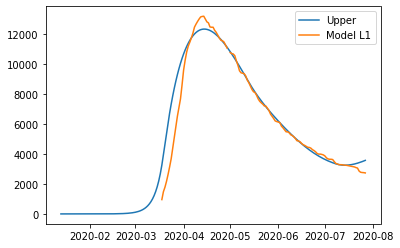

{'home': 1.0, 'leisure': 0.8703698722435537, 'other': 0.8000001165519549, 'school': 0.9336581200202078, 'transport': 0.8818068398436946, 'work': 0.8000032685667894}
{'home': 1.0, 'leisure': 0.10962513957125654, 'other': 0.06741274295099624, 'school': 0, 'transport': 0.11446468394360261, 'work': 0.4154697854819182}
{'home': 1.0, 'leisure': 0.10962513957125654, 'other': 0.06741274295099624, 'school': 0, 'transport': 0.11446468394360261, 'work': 0.4154697854819182}
{'home': 1.0, 'leisure': 0.13183018898069784, 'other': 0.1622751954875479, 'school': 0.30810717960666856, 'transport': 0.19928571701850503, 'work': 0.6981821904988754}
{'home': 1.0, 'leisure': 0.25357418643157903, 'other': 0.23420015787723547, 'school': 0.6255509404135392, 'transport': 0.26424280079063356, 'work': 0.6981821904988754}
{'home': 1.0, 'leisure': 0.4230079797118387, 'other': 0.3595943458923105, 'school': 0.6255509404135392, 'transport': 0.43766214335445125, 'work': 0.6981821904988754}
{'home': 1.0, 'leisure': 0.4339

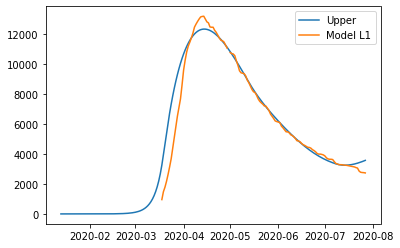

{'home': 1.0, 'leisure': 0.8703698722435537, 'other': 0.8000001165519549, 'school': 0.9336581200202078, 'transport': 0.8818068398436946, 'work': 0.8000032685667894}
{'home': 1.0, 'leisure': 0.10962513957125654, 'other': 0.06741274295099624, 'school': 0, 'transport': 0.11446468394360261, 'work': 0.4154697854819182}
{'home': 1.0, 'leisure': 0.10962513957125654, 'other': 0.06741274295099624, 'school': 0, 'transport': 0.11446468394360261, 'work': 0.4154697854819182}
{'home': 1.0, 'leisure': 0.13183018898069784, 'other': 0.1622751954875479, 'school': 0.30810717960666856, 'transport': 0.19928571701850503, 'work': 0.6981821904988754}
{'home': 1.0, 'leisure': 0.25357418643157903, 'other': 0.23420015787723547, 'school': 0.6255509404135392, 'transport': 0.26424280079063356, 'work': 0.6981821904988754}
{'home': 1.0, 'leisure': 0.4230079797118387, 'other': 0.3595943458923105, 'school': 0.6255509404135392, 'transport': 0.43766214335445125, 'work': 0.6981821904988754}
{'home': 1.0, 'leisure': 0.4339

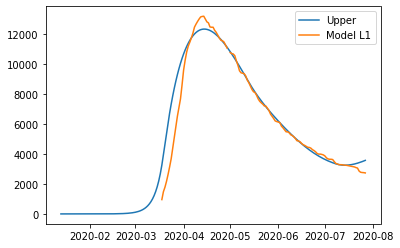

{'home': 1.0, 'leisure': 0.8703698722435537, 'other': 0.8000001165519549, 'school': 0.9336581200202078, 'transport': 0.8818068398436946, 'work': 0.8000032685667894}
{'home': 1.0, 'leisure': 0.10962513957125654, 'other': 0.06741274295099624, 'school': 0, 'transport': 0.11446468394360261, 'work': 0.4154697854819182}
{'home': 1.0, 'leisure': 0.10962513957125654, 'other': 0.06741274295099624, 'school': 0, 'transport': 0.11446468394360261, 'work': 0.4154697854819182}
{'home': 1.0, 'leisure': 0.13183018898069784, 'other': 0.1622751954875479, 'school': 0.30810717960666856, 'transport': 0.19928571701850503, 'work': 0.6981821904988754}
{'home': 1.0, 'leisure': 0.25357418643157903, 'other': 0.23420015787723547, 'school': 0.6255509404135392, 'transport': 0.26424280079063356, 'work': 0.6981821904988754}
{'home': 1.0, 'leisure': 0.4230079797118387, 'other': 0.3595943458923105, 'school': 0.6255509404135392, 'transport': 0.43766214335445125, 'work': 0.6981821904988754}
{'home': 1.0, 'leisure': 0.4339

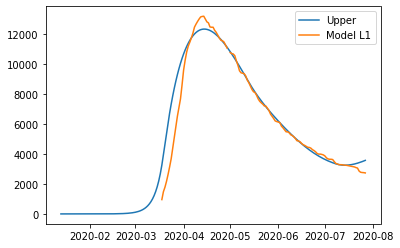

{'home': 1.00000001, 'leisure': 0.8703698722435537, 'other': 0.8000001165519549, 'school': 0.9336581200202078, 'transport': 0.8818068398436946, 'work': 0.8000032685667894}
{'home': 1.00000001, 'leisure': 0.10962513957125654, 'other': 0.06741274295099624, 'school': 0, 'transport': 0.11446468394360261, 'work': 0.4154697854819182}
{'home': 1.00000001, 'leisure': 0.10962513957125654, 'other': 0.06741274295099624, 'school': 0, 'transport': 0.11446468394360261, 'work': 0.4154697854819182}
{'home': 1.00000001, 'leisure': 0.13183018898069784, 'other': 0.1622751954875479, 'school': 0.30810717960666856, 'transport': 0.19928571701850503, 'work': 0.6981821904988754}
{'home': 1.00000001, 'leisure': 0.25357418643157903, 'other': 0.23420015787723547, 'school': 0.6255509404135392, 'transport': 0.26424280079063356, 'work': 0.6981821904988754}
{'home': 1.00000001, 'leisure': 0.4230079797118387, 'other': 0.3595943458923105, 'school': 0.6255509404135392, 'transport': 0.43766214335445125, 'work': 0.6981821

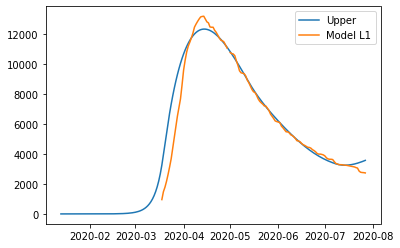

{'home': 1.0, 'leisure': 0.8703656871636615, 'other': 0.8000001120483272, 'school': 0.9336546615373915, 'transport': 0.8818033350766403, 'work': 0.8000032766753682}
{'home': 1.0, 'leisure': 0.10962481701455037, 'other': 0.06741373641297264, 'school': 0, 'transport': 0.11446455922937966, 'work': 0.415470808324719}
{'home': 1.0, 'leisure': 0.10962481701455037, 'other': 0.06741373641297264, 'school': 0, 'transport': 0.11446455922937966, 'work': 0.415470808324719}
{'home': 1.0, 'leisure': 0.13182972531530868, 'other': 0.1622773933370977, 'school': 0.30810603830733924, 'transport': 0.19928552190151952, 'work': 0.6981883820265395}
{'home': 1.0, 'leisure': 0.2535733182102602, 'other': 0.2342022621901914, 'school': 0.6255486232300523, 'transport': 0.26424246832733544, 'work': 0.6981883820265395}
{'home': 1.0, 'leisure': 0.4230061995117629, 'other': 0.35959501460655413, 'school': 0.6255486232300523, 'transport': 0.43766146952373447, 'work': 0.6981883820265395}
{'home': 1.0, 'leisure': 0.4339652

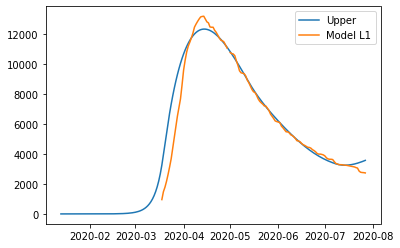

{'home': 1.0, 'leisure': 0.8703656871636615, 'other': 0.8000001120483272, 'school': 0.9336546615373915, 'transport': 0.8818033350766403, 'work': 0.8000032766753682}
{'home': 1.0, 'leisure': 0.10962481701455037, 'other': 0.06741373641297264, 'school': 0, 'transport': 0.11446455922937966, 'work': 0.415470808324719}
{'home': 1.0, 'leisure': 0.10962481701455037, 'other': 0.06741373641297264, 'school': 0, 'transport': 0.11446455922937966, 'work': 0.415470808324719}
{'home': 1.0, 'leisure': 0.13182972531530868, 'other': 0.1622773933370977, 'school': 0.30810603830733924, 'transport': 0.19928552190151952, 'work': 0.6981883820265395}
{'home': 1.0, 'leisure': 0.2535733182102602, 'other': 0.2342022621901914, 'school': 0.6255486232300523, 'transport': 0.26424246832733544, 'work': 0.6981883820265395}
{'home': 1.0, 'leisure': 0.4230061995117629, 'other': 0.35959501460655413, 'school': 0.6255486232300523, 'transport': 0.43766146952373447, 'work': 0.6981883820265395}
{'home': 1.0, 'leisure': 0.4339652

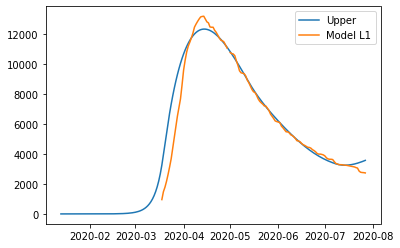

{'home': 1.0, 'leisure': 0.8703656871636615, 'other': 0.8000001120483272, 'school': 0.9336546615373915, 'transport': 0.8818033350766403, 'work': 0.8000032766753682}
{'home': 1.0, 'leisure': 0.10962481701455037, 'other': 0.06741373641297264, 'school': 0, 'transport': 0.11446455922937966, 'work': 0.415470808324719}
{'home': 1.0, 'leisure': 0.10962481701455037, 'other': 0.06741373641297264, 'school': 0, 'transport': 0.11446455922937966, 'work': 0.415470808324719}
{'home': 1.0, 'leisure': 0.13182972531530868, 'other': 0.1622773933370977, 'school': 0.30810603830733924, 'transport': 0.19928552190151952, 'work': 0.6981883820265395}
{'home': 1.0, 'leisure': 0.2535733182102602, 'other': 0.2342022621901914, 'school': 0.6255486232300523, 'transport': 0.26424246832733544, 'work': 0.6981883820265395}
{'home': 1.0, 'leisure': 0.4230061995117629, 'other': 0.35959501460655413, 'school': 0.6255486232300523, 'transport': 0.43766146952373447, 'work': 0.6981883820265395}
{'home': 1.0, 'leisure': 0.4339652

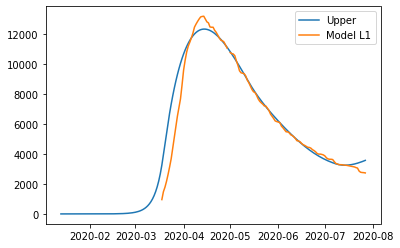

{'home': 1.00000001, 'leisure': 0.8703656871636615, 'other': 0.8000001120483272, 'school': 0.9336546615373915, 'transport': 0.8818033350766403, 'work': 0.8000032766753682}
{'home': 1.00000001, 'leisure': 0.10962481701455037, 'other': 0.06741373641297264, 'school': 0, 'transport': 0.11446455922937966, 'work': 0.415470808324719}
{'home': 1.00000001, 'leisure': 0.10962481701455037, 'other': 0.06741373641297264, 'school': 0, 'transport': 0.11446455922937966, 'work': 0.415470808324719}
{'home': 1.00000001, 'leisure': 0.13182972531530868, 'other': 0.1622773933370977, 'school': 0.30810603830733924, 'transport': 0.19928552190151952, 'work': 0.6981883820265395}
{'home': 1.00000001, 'leisure': 0.2535733182102602, 'other': 0.2342022621901914, 'school': 0.6255486232300523, 'transport': 0.26424246832733544, 'work': 0.6981883820265395}
{'home': 1.00000001, 'leisure': 0.4230061995117629, 'other': 0.35959501460655413, 'school': 0.6255486232300523, 'transport': 0.43766146952373447, 'work': 0.6981883820

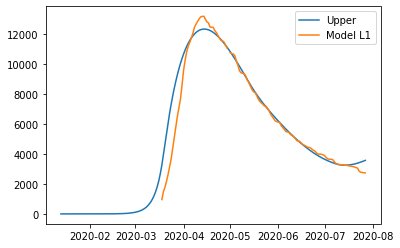

{'home': 1.0, 'leisure': 0.870358592430596, 'other': 0.8000001044135777, 'school': 0.933648798563918, 'transport': 0.8817973936400735, 'work': 0.8000032904213907}
{'home': 1.0, 'leisure': 0.10962427019714338, 'other': 0.06741542057440539, 'school': 0, 'transport': 0.11446434779923406, 'work': 0.4154725422915604}
{'home': 1.0, 'leisure': 0.10962427019714338, 'other': 0.06741542057440539, 'school': 0, 'transport': 0.11446434779923406, 'work': 0.4154725422915604}
{'home': 1.0, 'leisure': 0.1318289392850378, 'other': 0.16228111923052355, 'school': 0.30810410352609297, 'transport': 0.19928519111416806, 'work': 0.6981988781688865}
{'home': 1.0, 'leisure': 0.25357184635443825, 'other': 0.23420582951617594, 'school': 0.6255446950378251, 'transport': 0.26424190470110676, 'work': 0.6981988781688865}
{'home': 1.0, 'leisure': 0.42300318163146466, 'other': 0.35959614824102276, 'school': 0.6255446950378251, 'transport': 0.43766032718676806, 'work': 0.6981988781688865}
{'home': 1.0, 'leisure': 0.4339

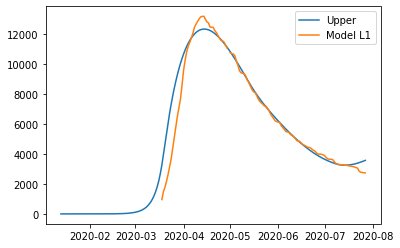

{'home': 1.0, 'leisure': 0.870358592430596, 'other': 0.8000001044135777, 'school': 0.933648798563918, 'transport': 0.8817973936400735, 'work': 0.8000032904213907}
{'home': 1.0, 'leisure': 0.10962427019714338, 'other': 0.06741542057440539, 'school': 0, 'transport': 0.11446434779923406, 'work': 0.4154725422915604}
{'home': 1.0, 'leisure': 0.10962427019714338, 'other': 0.06741542057440539, 'school': 0, 'transport': 0.11446434779923406, 'work': 0.4154725422915604}
{'home': 1.0, 'leisure': 0.1318289392850378, 'other': 0.16228111923052355, 'school': 0.30810410352609297, 'transport': 0.19928519111416806, 'work': 0.6981988781688865}
{'home': 1.0, 'leisure': 0.25357184635443825, 'other': 0.23420582951617594, 'school': 0.6255446950378251, 'transport': 0.26424190470110676, 'work': 0.6981988781688865}
{'home': 1.0, 'leisure': 0.42300318163146466, 'other': 0.35959614824102276, 'school': 0.6255446950378251, 'transport': 0.43766032718676806, 'work': 0.6981988781688865}
{'home': 1.0, 'leisure': 0.4339

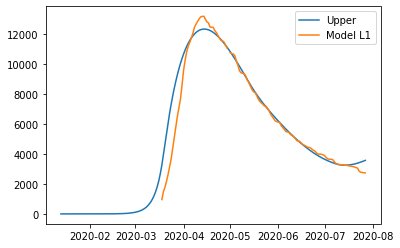

{'home': 1.0, 'leisure': 0.870358592430596, 'other': 0.8000001044135777, 'school': 0.933648798563918, 'transport': 0.8817973936400735, 'work': 0.8000032904213907}
{'home': 1.0, 'leisure': 0.10962427019714338, 'other': 0.06741542057440539, 'school': 0, 'transport': 0.11446434779923406, 'work': 0.4154725422915604}
{'home': 1.0, 'leisure': 0.10962427019714338, 'other': 0.06741542057440539, 'school': 0, 'transport': 0.11446434779923406, 'work': 0.4154725422915604}
{'home': 1.0, 'leisure': 0.1318289392850378, 'other': 0.16228111923052355, 'school': 0.30810410352609297, 'transport': 0.19928519111416806, 'work': 0.6981988781688865}
{'home': 1.0, 'leisure': 0.25357184635443825, 'other': 0.23420582951617594, 'school': 0.6255446950378251, 'transport': 0.26424190470110676, 'work': 0.6981988781688865}
{'home': 1.0, 'leisure': 0.42300318163146466, 'other': 0.35959614824102276, 'school': 0.6255446950378251, 'transport': 0.43766032718676806, 'work': 0.6981988781688865}
{'home': 1.0, 'leisure': 0.4339

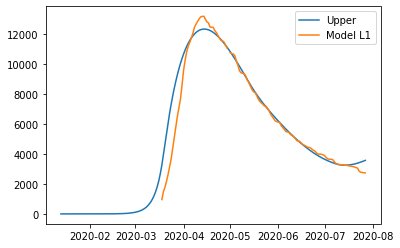

{'home': 1.00000001, 'leisure': 0.870358592430596, 'other': 0.8000001044135777, 'school': 0.933648798563918, 'transport': 0.8817973936400735, 'work': 0.8000032904213907}
{'home': 1.00000001, 'leisure': 0.10962427019714338, 'other': 0.06741542057440539, 'school': 0, 'transport': 0.11446434779923406, 'work': 0.4154725422915604}
{'home': 1.00000001, 'leisure': 0.10962427019714338, 'other': 0.06741542057440539, 'school': 0, 'transport': 0.11446434779923406, 'work': 0.4154725422915604}
{'home': 1.00000001, 'leisure': 0.1318289392850378, 'other': 0.16228111923052355, 'school': 0.30810410352609297, 'transport': 0.19928519111416806, 'work': 0.6981988781688865}
{'home': 1.00000001, 'leisure': 0.25357184635443825, 'other': 0.23420582951617594, 'school': 0.6255446950378251, 'transport': 0.26424190470110676, 'work': 0.6981988781688865}
{'home': 1.00000001, 'leisure': 0.42300318163146466, 'other': 0.35959614824102276, 'school': 0.6255446950378251, 'transport': 0.43766032718676806, 'work': 0.6981988

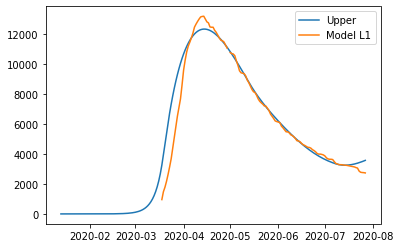

{'home': 1.0, 'leisure': 0.8703537334330791, 'other': 0.8000000991847371, 'school': 0.933644783166399, 'transport': 0.8817933245052296, 'work': 0.8000032998356829}
{'home': 1.0, 'leisure': 0.10962389569256412, 'other': 0.0674165740130704, 'school': 0, 'transport': 0.11446420298966746, 'work': 0.4154737298390036}
{'home': 1.0, 'leisure': 0.10962389569256412, 'other': 0.0674165740130704, 'school': 0, 'transport': 0.11446420298966746, 'work': 0.4154737298390036}
{'home': 1.0, 'leisure': 0.13182840095041673, 'other': 0.16228367099869465, 'school': 0.3081027784449117, 'transport': 0.19928496455465333, 'work': 0.698206066695607}
{'home': 1.0, 'leisure': 0.25357083831260635, 'other': 0.23420827268560232, 'school': 0.6255420047214874, 'transport': 0.2642415186739148, 'work': 0.698206066695607}
{'home': 1.0, 'leisure': 0.4230011147595331, 'other': 0.3595969246379903, 'school': 0.6255420047214874, 'transport': 0.43765954480876557, 'work': 0.698206066695607}
{'home': 1.0, 'leisure': 0.43395776597

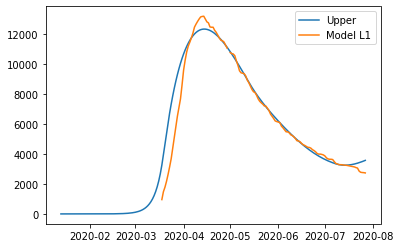

{'home': 1.0, 'leisure': 0.8703537334330791, 'other': 0.8000000991847371, 'school': 0.933644783166399, 'transport': 0.8817933245052296, 'work': 0.8000032998356829}
{'home': 1.0, 'leisure': 0.10962389569256412, 'other': 0.0674165740130704, 'school': 0, 'transport': 0.11446420298966746, 'work': 0.4154737298390036}
{'home': 1.0, 'leisure': 0.10962389569256412, 'other': 0.0674165740130704, 'school': 0, 'transport': 0.11446420298966746, 'work': 0.4154737298390036}
{'home': 1.0, 'leisure': 0.13182840095041673, 'other': 0.16228367099869465, 'school': 0.3081027784449117, 'transport': 0.19928496455465333, 'work': 0.698206066695607}
{'home': 1.0, 'leisure': 0.25357083831260635, 'other': 0.23420827268560232, 'school': 0.6255420047214874, 'transport': 0.2642415186739148, 'work': 0.698206066695607}
{'home': 1.0, 'leisure': 0.4230011147595331, 'other': 0.3595969246379903, 'school': 0.6255420047214874, 'transport': 0.43765954480876557, 'work': 0.698206066695607}
{'home': 1.0, 'leisure': 0.43395776597

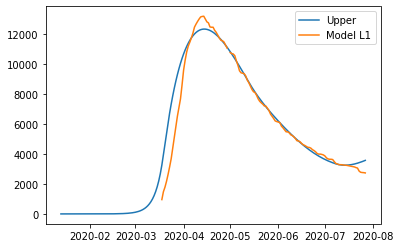

{'home': 1.0, 'leisure': 0.8703537334330791, 'other': 0.8000000991847371, 'school': 0.933644783166399, 'transport': 0.8817933245052296, 'work': 0.8000032998356829}
{'home': 1.0, 'leisure': 0.10962389569256412, 'other': 0.0674165740130704, 'school': 0, 'transport': 0.11446420298966746, 'work': 0.4154737298390036}
{'home': 1.0, 'leisure': 0.10962389569256412, 'other': 0.0674165740130704, 'school': 0, 'transport': 0.11446420298966746, 'work': 0.4154737298390036}
{'home': 1.0, 'leisure': 0.13182840095041673, 'other': 0.16228367099869465, 'school': 0.3081027784449117, 'transport': 0.19928496455465333, 'work': 0.698206066695607}
{'home': 1.0, 'leisure': 0.25357083831260635, 'other': 0.23420827268560232, 'school': 0.6255420047214874, 'transport': 0.2642415186739148, 'work': 0.698206066695607}
{'home': 1.0, 'leisure': 0.4230011147595331, 'other': 0.3595969246379903, 'school': 0.6255420047214874, 'transport': 0.43765954480876557, 'work': 0.698206066695607}
{'home': 1.0, 'leisure': 0.43395776597

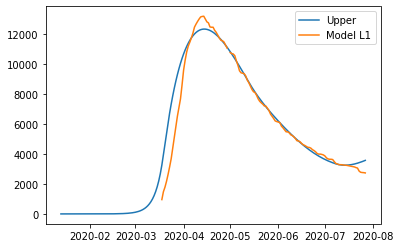

{'home': 1.00000001, 'leisure': 0.8703537334330791, 'other': 0.8000000991847371, 'school': 0.933644783166399, 'transport': 0.8817933245052296, 'work': 0.8000032998356829}
{'home': 1.00000001, 'leisure': 0.10962389569256412, 'other': 0.0674165740130704, 'school': 0, 'transport': 0.11446420298966746, 'work': 0.4154737298390036}
{'home': 1.00000001, 'leisure': 0.10962389569256412, 'other': 0.0674165740130704, 'school': 0, 'transport': 0.11446420298966746, 'work': 0.4154737298390036}
{'home': 1.00000001, 'leisure': 0.13182840095041673, 'other': 0.16228367099869465, 'school': 0.3081027784449117, 'transport': 0.19928496455465333, 'work': 0.698206066695607}
{'home': 1.00000001, 'leisure': 0.25357083831260635, 'other': 0.23420827268560232, 'school': 0.6255420047214874, 'transport': 0.2642415186739148, 'work': 0.698206066695607}
{'home': 1.00000001, 'leisure': 0.4230011147595331, 'other': 0.3595969246379903, 'school': 0.6255420047214874, 'transport': 0.43765954480876557, 'work': 0.6982060666956

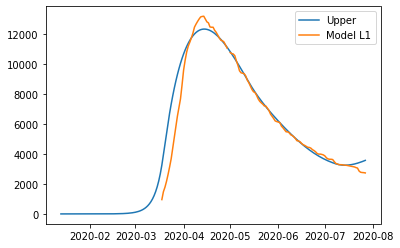

{'home': 1.0, 'leisure': 0.8703488157883525, 'other': 0.8000000938927854, 'school': 0.9336407193037676, 'transport': 0.8817892062566738, 'work': 0.8000033093636036}
{'home': 1.0, 'leisure': 0.10962351666479657, 'other': 0.067417741373904, 'school': 0, 'transport': 0.11446405642683119, 'work': 0.4154749317189395}
{'home': 1.0, 'leisure': 0.10962351666479657, 'other': 0.067417741373904, 'school': 0, 'transport': 0.11446405642683119, 'work': 0.4154749317189395}
{'home': 1.0, 'leisure': 0.13182785611571013, 'other': 0.16228625356707024, 'school': 0.3081014373702433, 'transport': 0.19928473525076446, 'work': 0.6982133419805326}
{'home': 1.0, 'leisure': 0.2535698180987687, 'other': 0.2342107453444311, 'school': 0.6255392819335243, 'transport': 0.26424112797561106, 'work': 0.6982133419805326}
{'home': 1.0, 'leisure': 0.4229990229371308, 'other': 0.35959771040618044, 'school': 0.6255392819335243, 'transport': 0.43765875297003354, 'work': 0.6982133419805326}
{'home': 1.0, 'leisure': 0.433954699

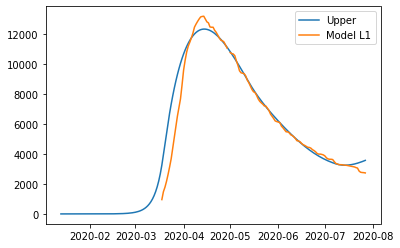

{'home': 1.0, 'leisure': 0.8703488157883525, 'other': 0.8000000938927854, 'school': 0.9336407193037676, 'transport': 0.8817892062566738, 'work': 0.8000033093636036}
{'home': 1.0, 'leisure': 0.10962351666479657, 'other': 0.067417741373904, 'school': 0, 'transport': 0.11446405642683119, 'work': 0.4154749317189395}
{'home': 1.0, 'leisure': 0.10962351666479657, 'other': 0.067417741373904, 'school': 0, 'transport': 0.11446405642683119, 'work': 0.4154749317189395}
{'home': 1.0, 'leisure': 0.13182785611571013, 'other': 0.16228625356707024, 'school': 0.3081014373702433, 'transport': 0.19928473525076446, 'work': 0.6982133419805326}
{'home': 1.0, 'leisure': 0.2535698180987687, 'other': 0.2342107453444311, 'school': 0.6255392819335243, 'transport': 0.26424112797561106, 'work': 0.6982133419805326}
{'home': 1.0, 'leisure': 0.4229990229371308, 'other': 0.35959771040618044, 'school': 0.6255392819335243, 'transport': 0.43765875297003354, 'work': 0.6982133419805326}
{'home': 1.0, 'leisure': 0.433954699

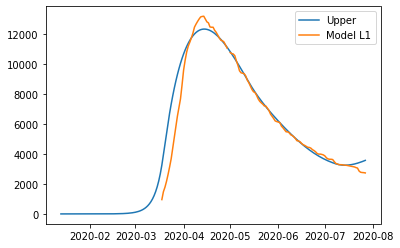

{'home': 1.0, 'leisure': 0.8703488157883525, 'other': 0.8000000938927854, 'school': 0.9336407193037676, 'transport': 0.8817892062566738, 'work': 0.8000033093636036}
{'home': 1.0, 'leisure': 0.10962351666479657, 'other': 0.067417741373904, 'school': 0, 'transport': 0.11446405642683119, 'work': 0.4154749317189395}
{'home': 1.0, 'leisure': 0.10962351666479657, 'other': 0.067417741373904, 'school': 0, 'transport': 0.11446405642683119, 'work': 0.4154749317189395}
{'home': 1.0, 'leisure': 0.13182785611571013, 'other': 0.16228625356707024, 'school': 0.3081014373702433, 'transport': 0.19928473525076446, 'work': 0.6982133419805326}
{'home': 1.0, 'leisure': 0.2535698180987687, 'other': 0.2342107453444311, 'school': 0.6255392819335243, 'transport': 0.26424112797561106, 'work': 0.6982133419805326}
{'home': 1.0, 'leisure': 0.4229990229371308, 'other': 0.35959771040618044, 'school': 0.6255392819335243, 'transport': 0.43765875297003354, 'work': 0.6982133419805326}
{'home': 1.0, 'leisure': 0.433954699

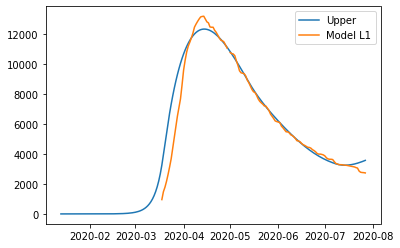

{'home': 1.00000001, 'leisure': 0.8703488157883525, 'other': 0.8000000938927854, 'school': 0.9336407193037676, 'transport': 0.8817892062566738, 'work': 0.8000033093636036}
{'home': 1.00000001, 'leisure': 0.10962351666479657, 'other': 0.067417741373904, 'school': 0, 'transport': 0.11446405642683119, 'work': 0.4154749317189395}
{'home': 1.00000001, 'leisure': 0.10962351666479657, 'other': 0.067417741373904, 'school': 0, 'transport': 0.11446405642683119, 'work': 0.4154749317189395}
{'home': 1.00000001, 'leisure': 0.13182785611571013, 'other': 0.16228625356707024, 'school': 0.3081014373702433, 'transport': 0.19928473525076446, 'work': 0.6982133419805326}
{'home': 1.00000001, 'leisure': 0.2535698180987687, 'other': 0.2342107453444311, 'school': 0.6255392819335243, 'transport': 0.26424112797561106, 'work': 0.6982133419805326}
{'home': 1.00000001, 'leisure': 0.4229990229371308, 'other': 0.35959771040618044, 'school': 0.6255392819335243, 'transport': 0.43765875297003354, 'work': 0.698213341980

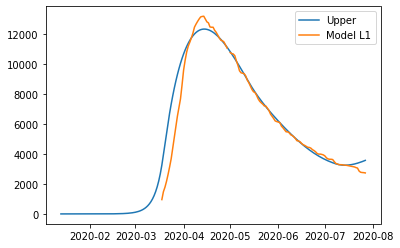

{'home': 1.0, 'leisure': 0.8703452916478164, 'other': 0.8000000901004044, 'school': 0.9336378070106214, 'transport': 0.8817862549888452, 'work': 0.8000033161916147}
{'home': 1.0, 'leisure': 0.10962324503960144, 'other': 0.06741857794201829, 'school': 0, 'transport': 0.11446395139187461, 'work': 0.41547579302369664}
{'home': 1.0, 'leisure': 0.10962324503960144, 'other': 0.06741857794201829, 'school': 0, 'transport': 0.11446395139187461, 'work': 0.41547579302369664}
{'home': 1.0, 'leisure': 0.13182746566830192, 'other': 0.16228810431817808, 'school': 0.30810047631350507, 'transport': 0.19928457091821813, 'work': 0.6982185556772719}
{'home': 1.0, 'leisure': 0.2535690869779298, 'other': 0.234212517330842, 'school': 0.6255373306971164, 'transport': 0.26424084798146374, 'work': 0.6982185556772719}
{'home': 1.0, 'leisure': 0.42299752386840833, 'other': 0.35959827351280055, 'school': 0.6255373306971164, 'transport': 0.43765818550235436, 'work': 0.6982185556772719}
{'home': 1.0, 'leisure': 0.43

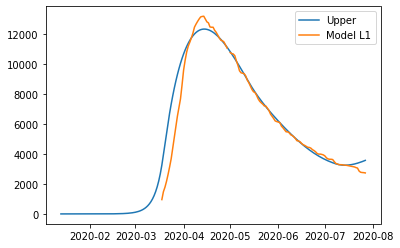

{'home': 1.0, 'leisure': 0.8703452916478164, 'other': 0.8000000901004044, 'school': 0.9336378070106214, 'transport': 0.8817862549888452, 'work': 0.8000033161916147}
{'home': 1.0, 'leisure': 0.10962324503960144, 'other': 0.06741857794201829, 'school': 0, 'transport': 0.11446395139187461, 'work': 0.41547579302369664}
{'home': 1.0, 'leisure': 0.10962324503960144, 'other': 0.06741857794201829, 'school': 0, 'transport': 0.11446395139187461, 'work': 0.41547579302369664}
{'home': 1.0, 'leisure': 0.13182746566830192, 'other': 0.16228810431817808, 'school': 0.30810047631350507, 'transport': 0.19928457091821813, 'work': 0.6982185556772719}
{'home': 1.0, 'leisure': 0.2535690869779298, 'other': 0.234212517330842, 'school': 0.6255373306971164, 'transport': 0.26424084798146374, 'work': 0.6982185556772719}
{'home': 1.0, 'leisure': 0.42299752386840833, 'other': 0.35959827351280055, 'school': 0.6255373306971164, 'transport': 0.43765818550235436, 'work': 0.6982185556772719}
{'home': 1.0, 'leisure': 0.43

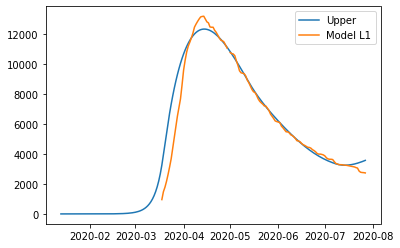

{'home': 1.0, 'leisure': 0.8703452916478164, 'other': 0.8000000901004044, 'school': 0.9336378070106214, 'transport': 0.8817862549888452, 'work': 0.8000033161916147}
{'home': 1.0, 'leisure': 0.10962324503960144, 'other': 0.06741857794201829, 'school': 0, 'transport': 0.11446395139187461, 'work': 0.41547579302369664}
{'home': 1.0, 'leisure': 0.10962324503960144, 'other': 0.06741857794201829, 'school': 0, 'transport': 0.11446395139187461, 'work': 0.41547579302369664}
{'home': 1.0, 'leisure': 0.13182746566830192, 'other': 0.16228810431817808, 'school': 0.30810047631350507, 'transport': 0.19928457091821813, 'work': 0.6982185556772719}
{'home': 1.0, 'leisure': 0.2535690869779298, 'other': 0.234212517330842, 'school': 0.6255373306971164, 'transport': 0.26424084798146374, 'work': 0.6982185556772719}
{'home': 1.0, 'leisure': 0.42299752386840833, 'other': 0.35959827351280055, 'school': 0.6255373306971164, 'transport': 0.43765818550235436, 'work': 0.6982185556772719}
{'home': 1.0, 'leisure': 0.43

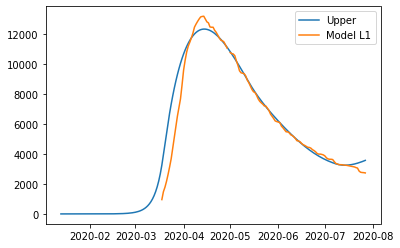

{'home': 1.00000001, 'leisure': 0.8703452916478164, 'other': 0.8000000901004044, 'school': 0.9336378070106214, 'transport': 0.8817862549888452, 'work': 0.8000033161916147}
{'home': 1.00000001, 'leisure': 0.10962324503960144, 'other': 0.06741857794201829, 'school': 0, 'transport': 0.11446395139187461, 'work': 0.41547579302369664}
{'home': 1.00000001, 'leisure': 0.10962324503960144, 'other': 0.06741857794201829, 'school': 0, 'transport': 0.11446395139187461, 'work': 0.41547579302369664}
{'home': 1.00000001, 'leisure': 0.13182746566830192, 'other': 0.16228810431817808, 'school': 0.30810047631350507, 'transport': 0.19928457091821813, 'work': 0.6982185556772719}
{'home': 1.00000001, 'leisure': 0.2535690869779298, 'other': 0.234212517330842, 'school': 0.6255373306971164, 'transport': 0.26424084798146374, 'work': 0.6982185556772719}
{'home': 1.00000001, 'leisure': 0.42299752386840833, 'other': 0.35959827351280055, 'school': 0.6255373306971164, 'transport': 0.43765818550235436, 'work': 0.69821

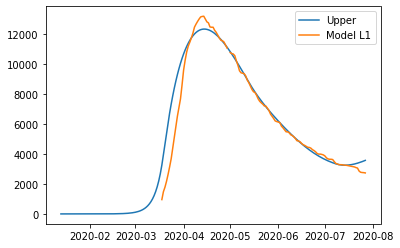

{'home': 1.0, 'leisure': 0.8703426243242132, 'other': 0.8000000872300572, 'school': 0.9336356027772292, 'transport': 0.8817840212566039, 'work': 0.8000033213595455}
{'home': 1.0, 'leisure': 0.1096230394530472, 'other': 0.06741921111720194, 'school': 0, 'transport': 0.11446387189197754, 'work': 0.4154764449208867}
{'home': 1.0, 'leisure': 0.1096230394530472, 'other': 0.06741921111720194, 'school': 0, 'transport': 0.11446387189197754, 'work': 0.4154764449208867}
{'home': 1.0, 'leisure': 0.1318271701487035, 'other': 0.16228950510031714, 'school': 0.30809974891648567, 'transport': 0.19928444653612007, 'work': 0.6982225017767457}
{'home': 1.0, 'leisure': 0.2535685336112139, 'other': 0.2342138584981685, 'school': 0.6255358538607436, 'transport': 0.26424063605764403, 'work': 0.6982225017767457}
{'home': 1.0, 'leisure': 0.42299638926386274, 'other': 0.35959869971257047, 'school': 0.6255358538607436, 'transport': 0.4376577559958723, 'work': 0.6982225017767457}
{'home': 1.0, 'leisure': 0.4339508

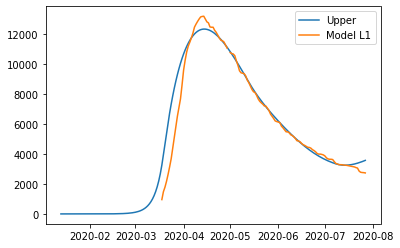

{'home': 1.0, 'leisure': 0.8703426243242132, 'other': 0.8000000872300572, 'school': 0.9336356027772292, 'transport': 0.8817840212566039, 'work': 0.8000033213595455}
{'home': 1.0, 'leisure': 0.1096230394530472, 'other': 0.06741921111720194, 'school': 0, 'transport': 0.11446387189197754, 'work': 0.4154764449208867}
{'home': 1.0, 'leisure': 0.1096230394530472, 'other': 0.06741921111720194, 'school': 0, 'transport': 0.11446387189197754, 'work': 0.4154764449208867}
{'home': 1.0, 'leisure': 0.1318271701487035, 'other': 0.16228950510031714, 'school': 0.30809974891648567, 'transport': 0.19928444653612007, 'work': 0.6982225017767457}
{'home': 1.0, 'leisure': 0.2535685336112139, 'other': 0.2342138584981685, 'school': 0.6255358538607436, 'transport': 0.26424063605764403, 'work': 0.6982225017767457}
{'home': 1.0, 'leisure': 0.42299638926386274, 'other': 0.35959869971257047, 'school': 0.6255358538607436, 'transport': 0.4376577559958723, 'work': 0.6982225017767457}
{'home': 1.0, 'leisure': 0.4339508

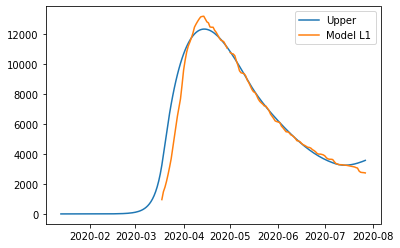

{'home': 1.0, 'leisure': 0.8703437132939208, 'other': 0.8000000871528968, 'school': 0.9336365084246948, 'transport': 0.88178491177764, 'work': 0.8000033318860231}
{'home': 1.0, 'leisure': 0.10962312538994098, 'other': 0.0674189620602393, 'school': 0, 'transport': 0.11446390458610685, 'work': 0.41547619275198827}
{'home': 1.0, 'leisure': 0.10962312538994098, 'other': 0.0674189620602393, 'school': 0, 'transport': 0.11446390458610685, 'work': 0.41547619275198827}
{'home': 1.0, 'leisure': 0.1318272927947465, 'other': 0.16228895390342496, 'school': 0.3081000477801493, 'transport': 0.19928449794781858, 'work': 0.6982209544038864}
{'home': 1.0, 'leisure': 0.25356876333938383, 'other': 0.2342133313792533, 'school': 0.6255364606445456, 'transport': 0.2642407227747738, 'work': 0.6982209544038864}
{'home': 1.0, 'leisure': 0.4229968555678042, 'other': 0.35959853378817946, 'school': 0.6255364606445456, 'transport': 0.43765793051786, 'work': 0.6982209544038864}
{'home': 1.0, 'leisure': 0.43395151355

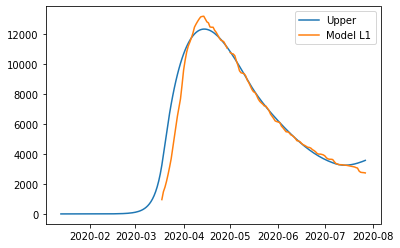

{'home': 1.0, 'leisure': 0.8703437132939208, 'other': 0.8000000871528968, 'school': 0.9336365084246948, 'transport': 0.88178491177764, 'work': 0.8000033318860231}
{'home': 1.0, 'leisure': 0.10962312538994098, 'other': 0.0674189620602393, 'school': 0, 'transport': 0.11446390458610685, 'work': 0.41547619275198827}
{'home': 1.0, 'leisure': 0.10962312538994098, 'other': 0.0674189620602393, 'school': 0, 'transport': 0.11446390458610685, 'work': 0.41547619275198827}
{'home': 1.0, 'leisure': 0.1318272927947465, 'other': 0.16228895390342496, 'school': 0.3081000477801493, 'transport': 0.19928449794781858, 'work': 0.6982209544038864}
{'home': 1.0, 'leisure': 0.25356876333938383, 'other': 0.2342133313792533, 'school': 0.6255364606445456, 'transport': 0.2642407227747738, 'work': 0.6982209544038864}
{'home': 1.0, 'leisure': 0.4229968555678042, 'other': 0.35959853378817946, 'school': 0.6255364606445456, 'transport': 0.43765793051786, 'work': 0.6982209544038864}
{'home': 1.0, 'leisure': 0.43395151355

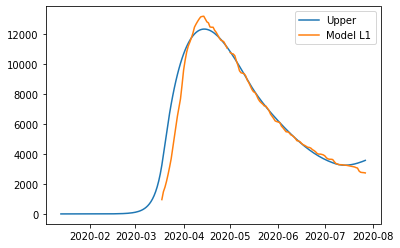

{'home': 1.0, 'leisure': 0.8703437132939208, 'other': 0.8000000871528968, 'school': 0.9336365084246948, 'transport': 0.88178491177764, 'work': 0.8000033318860231}
{'home': 1.0, 'leisure': 0.10962312538994098, 'other': 0.0674189620602393, 'school': 0, 'transport': 0.11446390458610685, 'work': 0.41547619275198827}
{'home': 1.0, 'leisure': 0.10962312538994098, 'other': 0.0674189620602393, 'school': 0, 'transport': 0.11446390458610685, 'work': 0.41547619275198827}
{'home': 1.0, 'leisure': 0.1318272927947465, 'other': 0.16228895390342496, 'school': 0.3081000477801493, 'transport': 0.19928449794781858, 'work': 0.6982209544038864}
{'home': 1.0, 'leisure': 0.25356876333938383, 'other': 0.2342133313792533, 'school': 0.6255364606445456, 'transport': 0.2642407227747738, 'work': 0.6982209544038864}
{'home': 1.0, 'leisure': 0.4229968555678042, 'other': 0.35959853378817946, 'school': 0.6255364606445456, 'transport': 0.43765793051786, 'work': 0.6982209544038864}
{'home': 1.0, 'leisure': 0.43395151355

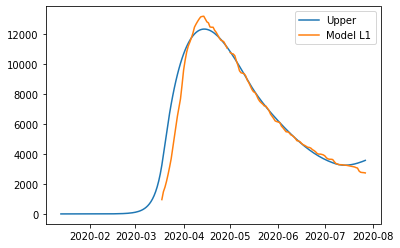

{'home': 1.00000001, 'leisure': 0.8703437132939208, 'other': 0.8000000871528968, 'school': 0.9336365084246948, 'transport': 0.88178491177764, 'work': 0.8000033318860231}
{'home': 1.00000001, 'leisure': 0.10962312538994098, 'other': 0.0674189620602393, 'school': 0, 'transport': 0.11446390458610685, 'work': 0.41547619275198827}
{'home': 1.00000001, 'leisure': 0.10962312538994098, 'other': 0.0674189620602393, 'school': 0, 'transport': 0.11446390458610685, 'work': 0.41547619275198827}
{'home': 1.00000001, 'leisure': 0.1318272927947465, 'other': 0.16228895390342496, 'school': 0.3081000477801493, 'transport': 0.19928449794781858, 'work': 0.6982209544038864}
{'home': 1.00000001, 'leisure': 0.25356876333938383, 'other': 0.2342133313792533, 'school': 0.6255364606445456, 'transport': 0.2642407227747738, 'work': 0.6982209544038864}
{'home': 1.00000001, 'leisure': 0.4229968555678042, 'other': 0.35959853378817946, 'school': 0.6255364606445456, 'transport': 0.43765793051786, 'work': 0.69822095440388

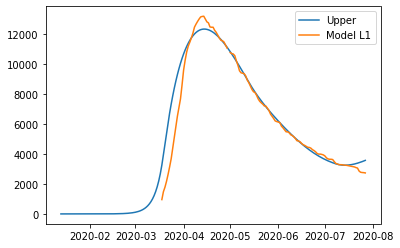

{'home': 1.0, 'leisure': 0.8703363592725833, 'other': 0.8, 'school': 0.933631619844109, 'transport': 0.8817791172807089, 'work': 0.8000031753433317}
{'home': 1.0, 'leisure': 0.10962247613016268, 'other': 0.06742032980776748, 'school': 0, 'transport': 0.11446362692817809, 'work': 0.41547749455906274}
{'home': 1.0, 'leisure': 0.10962247613016268, 'other': 0.06742032980776748, 'school': 0, 'transport': 0.11446362692817809, 'work': 0.41547749455906274}
{'home': 1.0, 'leisure': 0.13182637191314178, 'other': 0.1622919997007544, 'school': 0.308098434548556, 'transport': 0.19928404445592826, 'work': 0.6982301574987484}
{'home': 1.0, 'leisure': 0.25356705353856446, 'other': 0.23421615359063327, 'school': 0.6255331852955531, 'transport': 0.26424001148763604, 'work': 0.6982301574987484}
{'home': 1.0, 'leisure': 0.42299355711482095, 'other': 0.3595991897721613, 'school': 0.6255331852955531, 'transport': 0.43765657926086887, 'work': 0.6982301574987484}
{'home': 1.0, 'leisure': 0.43394690549790227, 

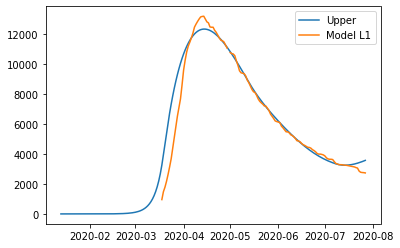

{'home': 1.0, 'leisure': 0.8703363592725833, 'other': 0.8, 'school': 0.933631619844109, 'transport': 0.8817791172807089, 'work': 0.8000031753433317}
{'home': 1.0, 'leisure': 0.10962247613016268, 'other': 0.06742032980776748, 'school': 0, 'transport': 0.11446362692817809, 'work': 0.41547749455906274}
{'home': 1.0, 'leisure': 0.10962247613016268, 'other': 0.06742032980776748, 'school': 0, 'transport': 0.11446362692817809, 'work': 0.41547749455906274}
{'home': 1.0, 'leisure': 0.13182637191314178, 'other': 0.1622919997007544, 'school': 0.308098434548556, 'transport': 0.19928404445592826, 'work': 0.6982301574987484}
{'home': 1.0, 'leisure': 0.25356705353856446, 'other': 0.23421615359063327, 'school': 0.6255331852955531, 'transport': 0.26424001148763604, 'work': 0.6982301574987484}
{'home': 1.0, 'leisure': 0.42299355711482095, 'other': 0.3595991897721613, 'school': 0.6255331852955531, 'transport': 0.43765657926086887, 'work': 0.6982301574987484}
{'home': 1.0, 'leisure': 0.43394690549790227, 

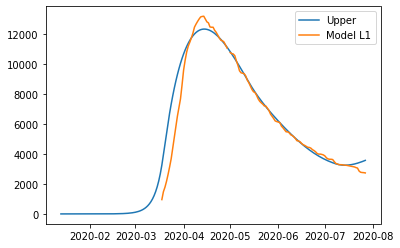

{'home': 1.00000001, 'leisure': 0.8703479607071521, 'other': 0.8, 'school': 0.9336412385390552, 'transport': 0.8817885830505766, 'work': 0.8000032980898087}
{'home': 1.00000001, 'leisure': 0.1096233956555729, 'other': 0.06741769489492509, 'school': 0, 'transport': 0.11446397779045, 'work': 0.415474836288568}
{'home': 1.00000001, 'leisure': 0.1096233956555729, 'other': 0.06741769489492509, 'school': 0, 'transport': 0.11446397779045, 'work': 0.415474836288568}
{'home': 1.00000001, 'leisure': 0.1318276833805313, 'other': 0.1622861673848356, 'school': 0.3081016087178882, 'transport': 0.19928459704653373, 'work': 0.6982137620717717}
{'home': 1.00000001, 'leisure': 0.25356950955665764, 'other': 0.2342105797897709, 'school': 0.6255396298211671, 'transport': 0.26424094076344967, 'work': 0.6982137620717717}
{'home': 1.00000001, 'leisure': 0.42299853253867226, 'other': 0.35959744425478607, 'school': 0.6255396298211671, 'transport': 0.4376584453665986, 'work': 0.6982137620717717}
{'home': 1.00000

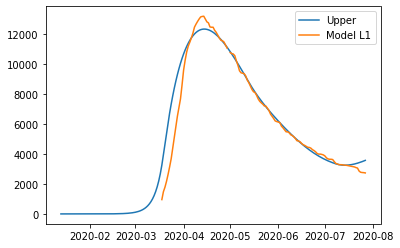

{'home': 1.0, 'leisure': 0.8703404072186888, 'other': 0.8, 'school': 0.9336349759772248, 'transport': 0.8817824200555547, 'work': 0.8000032181717527}
{'home': 1.0, 'leisure': 0.10962279697067809, 'other': 0.06741941043972767, 'school': 0, 'transport': 0.11446374935346094, 'work': 0.4154765670420671}
{'home': 1.0, 'leisure': 0.10962279697067809, 'other': 0.06741941043972767, 'school': 0, 'transport': 0.11446374935346094, 'work': 0.4154765670420671}
{'home': 1.0, 'leisure': 0.13182682950883942, 'other': 0.16228996470180965, 'school': 0.3080995420724842, 'transport': 0.1992842372704002, 'work': 0.6982244368478989}
{'home': 1.0, 'leisure': 0.2535679104898784, 'other': 0.234214208792198, 'school': 0.6255354339047406, 'transport': 0.26424033573542766, 'work': 0.6982244368478989}
{'home': 1.0, 'leisure': 0.4229952931305796, 'other': 0.3595985807300473, 'school': 0.6255354339047406, 'transport': 0.43765723038861, 'work': 0.6982244368478989}
{'home': 1.0, 'leisure': 0.43394941748849103, 'other'

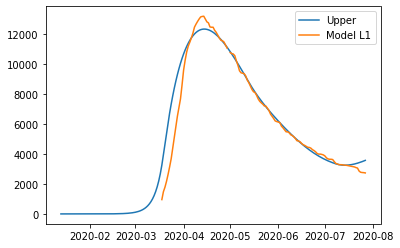

{'home': 1.0, 'leisure': 0.8703404072186888, 'other': 0.8, 'school': 0.9336349759772248, 'transport': 0.8817824200555547, 'work': 0.8000032181717527}
{'home': 1.0, 'leisure': 0.10962279697067809, 'other': 0.06741941043972767, 'school': 0, 'transport': 0.11446374935346094, 'work': 0.4154765670420671}
{'home': 1.0, 'leisure': 0.10962279697067809, 'other': 0.06741941043972767, 'school': 0, 'transport': 0.11446374935346094, 'work': 0.4154765670420671}
{'home': 1.0, 'leisure': 0.13182682950883942, 'other': 0.16228996470180965, 'school': 0.3080995420724842, 'transport': 0.1992842372704002, 'work': 0.6982244368478989}
{'home': 1.0, 'leisure': 0.2535679104898784, 'other': 0.234214208792198, 'school': 0.6255354339047406, 'transport': 0.26424033573542766, 'work': 0.6982244368478989}
{'home': 1.0, 'leisure': 0.4229952931305796, 'other': 0.3595985807300473, 'school': 0.6255354339047406, 'transport': 0.43765723038861, 'work': 0.6982244368478989}
{'home': 1.0, 'leisure': 0.43394941748849103, 'other'

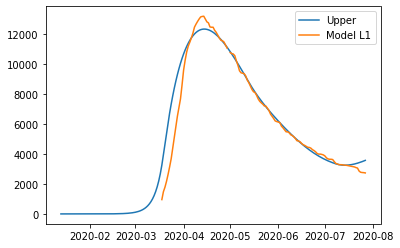

{'home': 1.0, 'leisure': 0.8703404072186888, 'other': 0.8, 'school': 0.9336349759772248, 'transport': 0.8817824200555547, 'work': 0.8000032181717527}
{'home': 1.0, 'leisure': 0.10962279697067809, 'other': 0.06741941043972767, 'school': 0, 'transport': 0.11446374935346094, 'work': 0.4154765670420671}
{'home': 1.0, 'leisure': 0.10962279697067809, 'other': 0.06741941043972767, 'school': 0, 'transport': 0.11446374935346094, 'work': 0.4154765670420671}
{'home': 1.0, 'leisure': 0.13182682950883942, 'other': 0.16228996470180965, 'school': 0.3080995420724842, 'transport': 0.1992842372704002, 'work': 0.6982244368478989}
{'home': 1.0, 'leisure': 0.2535679104898784, 'other': 0.234214208792198, 'school': 0.6255354339047406, 'transport': 0.26424033573542766, 'work': 0.6982244368478989}
{'home': 1.0, 'leisure': 0.4229952931305796, 'other': 0.3595985807300473, 'school': 0.6255354339047406, 'transport': 0.43765723038861, 'work': 0.6982244368478989}
{'home': 1.0, 'leisure': 0.43394941748849103, 'other'

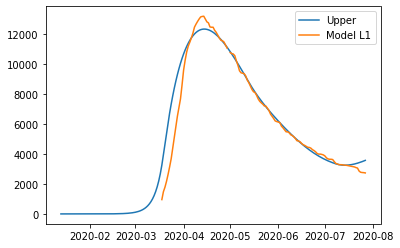

{'home': 1.00000001, 'leisure': 0.8703404072186888, 'other': 0.8, 'school': 0.9336349759772248, 'transport': 0.8817824200555547, 'work': 0.8000032181717527}
{'home': 1.00000001, 'leisure': 0.10962279697067809, 'other': 0.06741941043972767, 'school': 0, 'transport': 0.11446374935346094, 'work': 0.4154765670420671}
{'home': 1.00000001, 'leisure': 0.10962279697067809, 'other': 0.06741941043972767, 'school': 0, 'transport': 0.11446374935346094, 'work': 0.4154765670420671}
{'home': 1.00000001, 'leisure': 0.13182682950883942, 'other': 0.16228996470180965, 'school': 0.3080995420724842, 'transport': 0.1992842372704002, 'work': 0.6982244368478989}
{'home': 1.00000001, 'leisure': 0.2535679104898784, 'other': 0.234214208792198, 'school': 0.6255354339047406, 'transport': 0.26424033573542766, 'work': 0.6982244368478989}
{'home': 1.00000001, 'leisure': 0.4229952931305796, 'other': 0.3595985807300473, 'school': 0.6255354339047406, 'transport': 0.43765723038861, 'work': 0.6982244368478989}
{'home': 1.

In [30]:
from scipy.optimize import minimize, Bounds, shgo, differential_evolution

bounds = Bounds(lb,ub)

result = minimize(error, v0, bounds = bounds)

In [30]:
best_v

array([5.61274485e+01, 1.31952511e+00, 2.71013991e+00, 1.98737458e+00,
       3.67704033e-01, 1.69012127e-06, 9.96461668e-01, 9.34073263e-01,
       8.00000666e-01, 9.95936233e-01, 8.00000760e-01, 9.32318123e-01,
       5.00005256e-01, 9.44174225e-01, 9.11974783e-01, 1.75379856e-08,
       5.93692564e-09, 1.27374190e-09, 1.76658420e-09, 8.02327116e-01,
       7.73589665e-01, 1.00000000e+00, 7.91936370e-01, 3.48621038e-01,
       6.59319136e-01, 6.24928113e-01, 1.00000000e+00, 9.89576982e-01,
       9.15856389e-01, 5.74465741e-01, 5.35481294e-02, 0.00000000e+00,
       2.19416100e-03, 9.40188697e-01])

In [19]:
best_v = [6.45140782e+01, 2.37462207e+00, 1.04804668e+00, 1.75912224e+00,
 3.04126721e-01, 2.30159095e-02, 1.00000001e+00, 8.70340407e-01,
 8.00000000e-01, 9.33634976e-01, 8.00003218e-01, 8.81782420e-01,
 4.12635991e-01, 8.35791753e-02, 4.58250956e-01, 6.37749062e-01,
 4.12329012e-02, 9.00425781e-01, 7.42212733e-01, 1.35359269e-01,
 1.90473468e-01, 1.44403712e-01, 2.51736656e-01, 0.00000000e+00,
 3.17693629e-01, 5.66508915e-01, 9.61211914e-01, 6.54141877e-01,
 0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
 2.35466895e-01, 4.62934015e-01, 3.43045630e-01, 2.62706644e-01,
 7.01362482e-01, 4.61709207e-01, 6.67721253e-01, 6.66777149e-01]

In [20]:
import copy
import math
def plot_model(v, days_diff, gamma_mult, alphas_mult):

    days_ahead = v[0]+days_diff
    alpha_mixing = v[1]
    beta_mixing = v[2]
    gamma_mixing_before_lockdown = (v[3])*gamma_mult
    gamma_mixing_during_lockdown = (v[3] - v[4]*v[3])*gamma_mult
    gamma_mixing_after_lockdown = (v[3] - v[4]*v[3] - v[5]*v[3])*gamma_mult


    upper_bound_home = v[6]
    upper_bound_leisure = v[7]
    upper_bound_other = v[8]
    upper_bound_school = v[9]
    upper_bound_work = v[10]

    delta_transport = v[11]
    delta_school = v[12]

    leisure_v = v[13:20]
    leisure_1 = leisure_v[0]
    leisure_2 = leisure_v[1]
    leisure_3 = leisure_v[2]
    leisure_4 = leisure_v[3]
    leisure_5 = leisure_v[4]
    leisure_6 = leisure_v[5]
    leisure_7 = leisure_v[6]
    leisure_denom = leisure_1+leisure_2+leisure_3+leisure_4+leisure_5+leisure_6+leisure_7

    other_v = v[20:27]
    other_1 = other_v[0]
    other_2 = other_v[1]
    other_3 = other_v[2]
    other_4 = other_v[3]
    other_5 = other_v[4]
    other_6 = other_v[5]
    other_7 = other_v[6]
    other_denom = other_1+other_2+other_3+other_4+other_5+other_6+other_7

    work_v = v[27:34]
    work_1 = work_v[0]
    work_2 = work_v[1]
    work_3 = work_v[2]
    work_4 = work_v[3]
    work_5 = work_v[4]
    work_6 = work_v[5]
    work_7 = work_v[6]
    work_denom = work_1+work_2+work_3+work_4+work_5+work_6+work_7


    # Construct initialization
    initialization = copy.deepcopy(original_initialization)
    for i,group in enumerate(age_groups):
        if group == "age_group_40_49":
            initialization[group]["I"] = initialization[group]["I"] + 1
            initialization[group]["S"] = initialization[group]["S"] - 1
        initialization[group]["N"] = initialization[group]["S"] + initialization[group]["E"] + initialization[group]["I"] + initialization[group]["R"]


    # Alphas
    a_before_date_1 = {
        'home':upper_bound_home*alphas_mult,
        'leisure':upper_bound_leisure*alphas_mult,
        'other':upper_bound_other*alphas_mult,
        'school':upper_bound_school*alphas_mult,
        'transport':delta_transport*upper_bound_work*alphas_mult,
        'work':upper_bound_work*alphas_mult
    }
    a_between_date_1_2 = {
        'home':upper_bound_home*alphas_mult,
        'leisure':leisure_1/leisure_denom*upper_bound_leisure*alphas_mult,
        'other':other_1/other_denom*upper_bound_other*alphas_mult,
        'school':0,
        'transport':delta_transport*work_1/work_denom*upper_bound_work*alphas_mult,
        'work':work_1/work_denom*upper_bound_work*alphas_mult
    }
    a_between_date_2_3 = {
        'home':upper_bound_home*alphas_mult,
        'leisure':leisure_1/leisure_denom*upper_bound_leisure*alphas_mult,
        'other':other_1/other_denom*upper_bound_other*alphas_mult,
        'school':0,
        'transport':delta_transport*work_1/work_denom*upper_bound_work*alphas_mult,
        'work':work_1/work_denom*upper_bound_work*alphas_mult
    }
    a_between_date_3_4 = {
        'home':upper_bound_home*alphas_mult,
        'leisure':(leisure_1+leisure_2)/leisure_denom*upper_bound_leisure*alphas_mult,
        'other':(other_1+other_2)/other_denom*upper_bound_other*alphas_mult,
        'school':0.33*delta_school*upper_bound_school*alphas_mult,
        'transport':delta_transport*(work_1+work_2)/work_denom*upper_bound_work*alphas_mult,
        'work':(work_1+work_2)/work_denom*upper_bound_work*alphas_mult
    }
    a_between_date_4_5 = {
        'home':upper_bound_home*alphas_mult,
        'leisure':(leisure_1+leisure_2+leisure_3)/leisure_denom*upper_bound_leisure*alphas_mult,
        'other':(other_1+other_2+other_3)/other_denom*upper_bound_other*alphas_mult,
        'school':0.67*delta_school*upper_bound_school*alphas_mult,
        'transport':delta_transport*(work_1+work_2+work_3)/work_denom*upper_bound_work*alphas_mult,
        'work':(work_1+work_2+work_3)/work_denom*upper_bound_work*alphas_mult
    }
    a_between_date_5_6 = {
        'home':upper_bound_home*alphas_mult,
        'leisure':(leisure_1+leisure_2+leisure_3+leisure_4)/leisure_denom*upper_bound_leisure*alphas_mult,
        'other':(other_1+other_2+other_3+other_4)/other_denom*upper_bound_other*alphas_mult,
        'school':0.67*delta_school*upper_bound_school*alphas_mult,
        'transport':delta_transport*(work_1+work_2+work_3+work_4)/work_denom*upper_bound_work*alphas_mult,
        'work':(work_1+work_2+work_3+work_4)/work_denom*upper_bound_work*alphas_mult
    }
    a_between_date_6_7 = {
        'home':upper_bound_home*alphas_mult,
        'leisure':(leisure_1+leisure_2+leisure_3+leisure_4+leisure_5)/leisure_denom*upper_bound_leisure*alphas_mult,
        'other':(other_1+other_2+other_3+other_4+other_5)/other_denom*upper_bound_other*alphas_mult,
        'school':1.0*delta_school*upper_bound_school*alphas_mult,
        'transport':delta_transport*(work_1+work_2+work_3+work_4+work_5)/work_denom*upper_bound_work*alphas_mult,
        'work':(work_1+work_2+work_3+work_4+work_5)/work_denom*upper_bound_work*alphas_mult
    }
    a_after_date_7 = {
        'home':upper_bound_home*alphas_mult,
        'leisure':(leisure_1+leisure_2+leisure_3+leisure_4+leisure_5+leisure_6)/leisure_denom*upper_bound_leisure*alphas_mult,
        'other':(other_1+other_2+other_3+other_4+other_5+other_6)/other_denom*upper_bound_other*alphas_mult,
        'school':1.0*delta_school*upper_bound_school*alphas_mult,
        'transport':delta_transport*(work_1+work_2+work_3+work_4+work_5+work_6)/work_denom*upper_bound_work*alphas_mult,
        'work':(work_1+work_2+work_3+work_4+work_5+work_6)/work_denom*upper_bound_work*alphas_mult
    }

    # Determine mixing method
    mixing_method_before = {
        "name":"mult",
        "param_alpha":alpha_mixing,
        "param_beta":beta_mixing,
        "param_gamma":gamma_mixing_before_lockdown,
    }

    mixing_method_during = {
        "name":"mult",
        "param_alpha":alpha_mixing,
        "param_beta":beta_mixing,
        "param_gamma":gamma_mixing_during_lockdown,
    }

    # Determine mixing method
    mixing_method_after = {
        "name":"mult",
        "param_alpha":alpha_mixing,
        "param_beta":beta_mixing,
        "param_gamma":gamma_mixing_after_lockdown,
    }
    #dynModel.mixing_method = mixing_method_after

    # Number of days
    days_before_date_1 = int(days_ahead)
    days_between_dates_1_2 = (date_2-date_1).days
    days_between_dates_2_3 = (date_3-date_2).days
    days_between_dates_3_4 = (date_4-date_3).days
    days_between_dates_4_5 = (date_5-date_4).days
    days_between_dates_5_6 = (date_6-date_5).days
    days_between_dates_6_7 = (date_7-date_6).days

    days_after_date_7 = (final_date-date_7).days
    total_days = days_before_date_1 + days_between_dates_1_2 + days_between_dates_2_3 + days_between_dates_3_4 + days_between_dates_4_5+ days_between_dates_5_6+ days_between_dates_6_7 + days_after_date_7



    # Calculate alphas
    alphas_vec = []
    mixing_vec = []
    for t in range(days_before_date_1):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_before_date_1
        alphas_vec.append(alphas)
        mixing_vec.append(mixing_method_before)
    for t in range(days_between_dates_1_2):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_1_2
        alphas_vec.append(alphas)
        mixing_vec.append(mixing_method_during)
    for t in range(days_between_dates_2_3):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_2_3
        alphas_vec.append(alphas)
        mixing_vec.append(mixing_method_during)
    for t in range(days_between_dates_3_4):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_3_4
        alphas_vec.append(alphas)
        mixing_vec.append(mixing_method_after)
    for t in range(days_between_dates_4_5):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_4_5
        alphas_vec.append(alphas)
        mixing_vec.append(mixing_method_after)
    for t in range(days_between_dates_5_6):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_5_6
        alphas_vec.append(alphas)
        mixing_vec.append(mixing_method_after)
    for t in range(days_between_dates_6_7):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_6_7
        alphas_vec.append(alphas)
        mixing_vec.append(mixing_method_after)
    for t in range(days_after_date_7):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_after_date_7
        alphas_vec.append(alphas)
        mixing_vec.append(mixing_method_after)

    # Calculate tests
    tests = np.zeros(len(age_groups))


    # Run model
    model_data_beds = {ag:[] for ag in age_groups+["total"]}
    model_data_icus = {ag:[] for ag in age_groups+["total"]}
    model_data_deaths = {ag:[] for ag in age_groups+["total"]}
    model_data_infections = {ag:[] for ag in age_groups+["total"]}

    state = state_to_matrix(initialization)
    t_beds = 0
    t_icus = 0
    t_deaths = 0
    t_infections = 0
    for i,ag in enumerate(age_groups):
        state_H = state[i,cont.index("H")]
        state_ICU = state[i,cont.index("ICU")]
        state_D = state[i,cont.index("D")]
        state_I = state[i,cont.index("R")]
        model_data_beds[ag].append(state_H)
        model_data_icus[ag].append(state_ICU)
        model_data_deaths[ag].append(state_D)
        model_data_infections[ag].append(state_I)
        t_beds+= state_H
        t_icus+= state_ICU
        t_deaths+= state_D
        t_infections+= state_I
    model_data_beds["total"].append(t_beds)
    model_data_icus["total"].append(t_icus)
    model_data_deaths["total"].append(t_deaths)
    model_data_infections["total"].append(t_infections)

    recalc_days = [0,
                 days_before_date_1,
                 days_before_date_1+days_between_dates_1_2,
                 days_before_date_1+days_between_dates_1_2+days_between_dates_2_3,
                 days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4,
                 days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5,
                 days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5+days_between_dates_5_6,
                 days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5+days_between_dates_5_6+days_between_dates_6_7
                ]

    for t in range(total_days):
        if t in recalc_days:
            update_contacts = True
        else:
            update_contacts = False
        dynModel.mixing_method = mixing_vec[t]
        state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]), update_contacts=update_contacts)
        t_beds = 0
        t_icus = 0
        t_deaths = 0
        t_infections = 0
        for i,ag in enumerate(age_groups):
            state_H = state[i,cont.index("H")]
            state_ICU = state[i,cont.index("ICU")]
            state_D = state[i,cont.index("D")]
            state_I = state[i,cont.index("R")]
            model_data_beds[ag].append(state_H)
            model_data_icus[ag].append(state_ICU)
            model_data_deaths[ag].append(state_D)
            model_data_infections[ag].append(state_I)
            t_beds+= state_H
            t_icus+= state_ICU
            t_deaths+= state_D
            t_infections+= state_I
        model_data_beds["total"].append(t_beds)
        model_data_icus["total"].append(t_icus)
        model_data_deaths["total"].append(t_deaths)
        model_data_infections["total"].append(t_infections)


    initial_date = date_1-timedelta(days=days_before_date_1)

    # Calculate the days of the model
    days_model = [initial_date+timedelta(days = t) for t in range(total_days + 1)]

    # Indices where to put the real data
    indices = [(datetime.strptime(d, '%Y-%m-%d') - initial_date).days for d in days]

    # Real data
    real_data_beds = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}
    real_data_icus = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}
    real_data_deaths = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}

    for k,ind in enumerate(indices):
        for ag in age_groups+["total"]:
            real_data_beds[ag][ind] = beds_real[ag][k]
            real_data_icus[ag][ind] = icus_real[ag][k]
            real_data_deaths[ag][ind] = deaths_real[ag][k]


    error_beds = 0
    error_icus = 0
    error_deaths = 0
    for ag in age_groups:
        error_beds += np.nanmean(np.abs(np.array(model_data_beds[ag])-np.array(real_data_beds[ag])))
        error_icus += np.nanmean(np.abs(np.array(model_data_icus[ag])-np.array(real_data_icus[ag])))
        error_deaths += np.nanmean(np.abs(np.array(model_data_deaths[ag])-np.array(real_data_deaths[ag])))
    error_beds_total = np.nanmean(np.abs(np.array(model_data_beds["total"])-np.array(real_data_beds["total"])))
    error_icus_total = np.nanmean(np.abs(np.array(model_data_icus["total"])-np.array(real_data_icus["total"])))
    error_deaths_total = np.nanmean(np.abs(np.array(model_data_deaths["total"])-np.array(real_data_deaths["total"])))

    diff = np.array(model_data_beds["total"])-np.array(real_data_beds["total"])
    error_beds_above = np.nanmean([max(d,0) for d in diff])
    error_beds_below = -np.nanmean([min(d,0) for d in diff])

    cumm_beds_model = [sum([model_data_beds["total"][k] for k in range(i+1) if not math.isnan(real_data_beds["total"][k])]) for i in range(len(model_data_beds["total"]))]
    cumm_beds_real = [sum([real_data_beds["total"][k] for k in range(i+1) if not math.isnan(real_data_beds["total"][k])]) for i in range(len(real_data_beds["total"]))]
    diff_cumm = np.array(cumm_beds_model)-np.array(cumm_beds_real)
    error_cumm_above = np.nanmean([max(d,0) for d in diff_cumm])
    error_cumm_below = -np.nanmean([min(d,0) for d in diff_cumm])



    #     error = error_beds_total
    #     error = mult_icus*error_icus_total
    #     error = mult_deaths*error_deaths_total
    upper_model_data = model_data_beds["total"]
    upper_days_model = days_model
    upper_real_data = real_data_beds["total"]
    error = error_beds_above+error_beds_below

    plt.plot(upper_days_model, upper_model_data, label=str(days_diff))
    plt.plot(upper_days_model, upper_real_data, color="black")


In [21]:
# Modify number of days
interval_days = [-6,6]
plt.figure(1)
for k in range(-4,6,2):
    plot_model(best_v,k,1,1)
plt.show()

/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  


In [22]:
%matplotlib inline

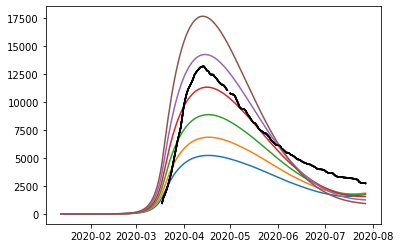

In [23]:
# Modify number of days
plt.figure(1)
for k in np.linspace(0.95,1.05,6):
    plot_model(best_v,0,k,1)
plt.show()

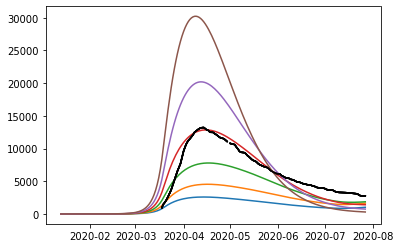

In [24]:
# Modify number of days
plt.figure(1)
for k in np.linspace(0.97,1.03,6):
    plot_model(best_v,0,1,k)
plt.show()

In [25]:
v = best_v

days_ahead = v[0]
alpha_mixing = v[1]
beta_mixing = v[2]
gamma_mixing_before_lockdown = v[3]
gamma_mixing_during_lockdown = v[3] - v[4]*v[3]
gamma_mixing_after_lockdown = v[3] - v[4]*v[3] - v[5]*v[3]


upper_bound_home = v[6]
upper_bound_leisure = v[7]
upper_bound_other = v[8]
upper_bound_school = v[9]
upper_bound_work = v[10]
upper_bound_transport = v[11]

leisure_v = v[12:29]
leisure_1 = leisure_v[0]
leisure_2 = leisure_v[1]
leisure_3 = leisure_v[2]
leisure_4 = leisure_v[3]
leisure_5 = leisure_v[4]
leisure_6 = leisure_v[5]
leisure_7 = leisure_v[6]
leisure_denom = leisure_1+leisure_2+leisure_3+leisure_4+leisure_5+leisure_6+leisure_7

other_v = v[19:26]
other_1 = other_v[0]
other_2 = other_v[1]
other_3 = other_v[2]
other_4 = other_v[3]
other_5 = other_v[4]
other_6 = other_v[5]
other_7 = other_v[6]
other_denom = other_1+other_2+other_3+other_4+other_5+other_6+other_7

work_v = v[26:33]
work_1 = work_v[0]
work_2 = work_v[1]
work_3 = work_v[2]
work_4 = work_v[3]
work_5 = work_v[4]
work_6 = work_v[5]
work_7 = work_v[6]
work_denom = work_1+work_2+work_3+work_4+work_5+work_6+work_7

transport_v = v[33:40]
transport_1 = transport_v[0]
transport_2 = transport_v[1]
transport_3 = transport_v[2]
transport_4 = transport_v[3]
transport_5 = transport_v[4]
transport_6 = transport_v[5]
transport_7 = transport_v[6]
transport_denom = transport_1+transport_2+transport_3+transport_4+transport_5+transport_6+transport_7


# Construct initialization
initialization = copy.deepcopy(original_initialization)
for i,group in enumerate(age_groups):
    if group == "age_group_40_49":
        initialization[group]["I"] = initialization[group]["I"] + 1
        initialization[group]["S"] = initialization[group]["S"] - 1
    initialization[group]["N"] = initialization[group]["S"] + initialization[group]["E"] + initialization[group]["I"] + initialization[group]["R"]


# Alphas
a_before_date_1 = {
    'home':upper_bound_home,
    'leisure':upper_bound_leisure,
    'other':upper_bound_other,
    'school':upper_bound_school,
    'transport':upper_bound_transport,
    'work':upper_bound_work
}
a_between_date_1_2 = {
    'home':upper_bound_home,
    'leisure':leisure_1/leisure_denom*upper_bound_leisure,
    'other':other_1/other_denom*upper_bound_other,
    'school':0,
    'transport':transport_1/transport_denom*upper_bound_transport,
    'work':work_1/work_denom*upper_bound_work
}
a_between_date_2_3 = {
    'home':upper_bound_home,
    'leisure':leisure_1/leisure_denom*upper_bound_leisure,
    'other':other_1/other_denom*upper_bound_other,
    'school':0,
    'transport':transport_1/transport_denom*upper_bound_transport,
    'work':work_1/work_denom*upper_bound_work
}
a_between_date_3_4 = {
    'home':upper_bound_home,
    'leisure':(leisure_1+leisure_2)/leisure_denom*upper_bound_leisure,
    'other':(other_1+other_2)/other_denom*upper_bound_other,
    'school':0.33*upper_bound_school,
    'transport':(transport_1+transport_2)/transport_denom*upper_bound_transport,
    'work':(work_1+work_2)/work_denom*upper_bound_work
}
a_between_date_4_5 = {
    'home':upper_bound_home,
    'leisure':(leisure_1+leisure_2+leisure_3)/leisure_denom*upper_bound_leisure,
    'other':(other_1+other_2+other_3)/other_denom*upper_bound_other,
    'school':0.67*upper_bound_school,
    'transport':(transport_1+transport_2+transport_3)/transport_denom*upper_bound_transport,
    'work':(work_1+work_2+work_3)/work_denom*upper_bound_work
}
a_between_date_5_6 = {
    'home':upper_bound_home,
    'leisure':(leisure_1+leisure_2+leisure_3+leisure_4)/leisure_denom*upper_bound_leisure,
    'other':(other_1+other_2+other_3+other_4)/other_denom*upper_bound_other,
    'school':0.67*upper_bound_school,
    'transport':(transport_1+transport_2+transport_3+transport_4)/transport_denom*upper_bound_transport,
    'work':(work_1+work_2+work_3+work_4)/work_denom*upper_bound_work
}
a_between_date_6_7 = {
    'home':upper_bound_home,
    'leisure':(leisure_1+leisure_2+leisure_3+leisure_4+leisure_5)/leisure_denom*upper_bound_leisure,
    'other':(other_1+other_2+other_3+other_4+other_5)/other_denom*upper_bound_other,
    'school':1.0*upper_bound_school,
    'transport':(transport_1+transport_2+transport_3+transport_4+transport_5)/transport_denom*upper_bound_transport,
    'work':(work_1+work_2+work_3+work_4+work_5)/work_denom*upper_bound_work
}
a_after_date_7 = {
    'home':upper_bound_home,
    'leisure':(leisure_1+leisure_2+leisure_3+leisure_4+leisure_5+leisure_6)/leisure_denom*upper_bound_leisure,
    'other':(other_1+other_2+other_3+other_4+other_5+other_6)/other_denom*upper_bound_other,
    'school':1.0*upper_bound_school,
    'transport':(transport_1+transport_2+transport_3+transport_4+transport_5+transport_6)/transport_denom*upper_bound_transport,
    'work':(work_1+work_2+work_3+work_4+work_5+work_6)/work_denom*upper_bound_work
}

# Determine mixing method
mixing_method_before = {
    "name":"mult",
    "param_alpha":alpha_mixing,
    "param_beta":beta_mixing,
    "param_gamma":gamma_mixing_before_lockdown,
}

mixing_method_during = {
    "name":"mult",
    "param_alpha":alpha_mixing,
    "param_beta":beta_mixing,
    "param_gamma":gamma_mixing_during_lockdown,
}

# Determine mixing method
mixing_method_after = {
    "name":"mult",
    "param_alpha":alpha_mixing,
    "param_beta":beta_mixing,
    "param_gamma":gamma_mixing_after_lockdown,
}
#dynModel.mixing_method = mixing_method_after

# Number of days
days_before_date_1 = int(days_ahead)
days_between_dates_1_2 = (date_2-date_1).days
days_between_dates_2_3 = (date_3-date_2).days
days_between_dates_3_4 = (date_4-date_3).days
days_between_dates_4_5 = (date_5-date_4).days
days_between_dates_5_6 = (date_6-date_5).days
days_between_dates_6_7 = (date_7-date_6).days

days_after_date_7 = (final_date-date_7).days
total_days = days_before_date_1 + days_between_dates_1_2 + days_between_dates_2_3 + days_between_dates_3_4 + days_between_dates_4_5+ days_between_dates_5_6+ days_between_dates_6_7 + days_after_date_7



# Calculate alphas
alphas_vec = []
mixing_vec = []
for t in range(days_before_date_1):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_before_date_1
    alphas_vec.append(alphas)
    mixing_vec.append(mixing_method_before)
for t in range(days_between_dates_1_2):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_between_date_1_2
    alphas_vec.append(alphas)
    mixing_vec.append(mixing_method_during)
for t in range(days_between_dates_2_3):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_between_date_2_3
    alphas_vec.append(alphas)
    mixing_vec.append(mixing_method_during)
for t in range(days_between_dates_3_4):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_between_date_3_4
    alphas_vec.append(alphas)
    mixing_vec.append(mixing_method_after)
for t in range(days_between_dates_4_5):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_between_date_4_5
    alphas_vec.append(alphas)
    mixing_vec.append(mixing_method_after)
for t in range(days_between_dates_5_6):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_between_date_5_6
    alphas_vec.append(alphas)
    mixing_vec.append(mixing_method_after)
for t in range(days_between_dates_6_7):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_between_date_6_7
    alphas_vec.append(alphas)
    mixing_vec.append(mixing_method_after)
for t in range(days_after_date_7):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_after_date_7
    alphas_vec.append(alphas)
    mixing_vec.append(mixing_method_after)

# Calculate tests
tests = np.zeros(len(age_groups))


# Run model
model_data_beds = {ag:[] for ag in age_groups+["total"]}
model_data_icus = {ag:[] for ag in age_groups+["total"]}
model_data_deaths = {ag:[] for ag in age_groups+["total"]}

state = state_to_matrix(initialization)
t_beds = 0
t_icus = 0
t_deaths = 0
for i,ag in enumerate(age_groups):
    state_H = state[i,cont.index("H")]
    state_ICU = state[i,cont.index("ICU")]
    state_D = state[i,cont.index("D")]
    model_data_beds[ag].append(state_H)
    model_data_icus[ag].append(state_ICU)
    model_data_deaths[ag].append(state_D)
    t_beds+= state_H
    t_icus+= state_ICU
    t_deaths+= state_D
model_data_beds["total"].append(t_beds)
model_data_icus["total"].append(t_icus)
model_data_deaths["total"].append(t_deaths)

recalc_days = [0,
             days_before_date_1,
             days_before_date_1+days_between_dates_1_2,
             days_before_date_1+days_between_dates_1_2+days_between_dates_2_3,
             days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4,
             days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5,
             days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5+days_between_dates_5_6,
             days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5+days_between_dates_5_6+days_between_dates_6_7
            ]

for t in range(total_days):
    if t in recalc_days:
        update_contacts = True
    else:
        update_contacts = False
    dynModel.mixing_method = mixing_vec[t]
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]), update_contacts=update_contacts)
    t_beds = 0
    t_icus = 0
    t_deaths = 0
    for i,ag in enumerate(age_groups):
        state_H = state[i,cont.index("H")]
        state_ICU = state[i,cont.index("ICU")]
        state_D = state[i,cont.index("D")]
        model_data_beds[ag].append(state_H)
        model_data_icus[ag].append(state_ICU)
        model_data_deaths[ag].append(state_D)
        t_beds+= state_H
        t_icus+= state_ICU
        t_deaths+= state_D
    model_data_beds["total"].append(t_beds)
    model_data_icus["total"].append(t_icus)
    model_data_deaths["total"].append(t_deaths)


initial_date = date_1-timedelta(days=days_before_date_1)

# Calculate the days of the model
days_model = [initial_date+timedelta(days = t) for t in range(total_days + 1)]

# Indices where to put the real data
indices = [(datetime.strptime(d, '%Y-%m-%d') - initial_date).days for d in days]

# Real data
real_data_beds = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}
real_data_icus = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}
real_data_deaths = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}

for k,ind in enumerate(indices):
    for ag in age_groups+["total"]:
        real_data_beds[ag][ind] = beds_real[ag][k]
        real_data_icus[ag][ind] = icus_real[ag][k]
        real_data_deaths[ag][ind] = deaths_real[ag][k]


error_beds = 0
error_icus = 0
error_deaths = 0
for ag in age_groups:
    error_beds += np.nanmean(np.abs(np.array(model_data_beds[ag])-np.array(real_data_beds[ag])))
    error_icus += np.nanmean(np.abs(np.array(model_data_icus[ag])-np.array(real_data_icus[ag])))
    error_deaths += np.nanmean(np.abs(np.array(model_data_deaths[ag])-np.array(real_data_deaths[ag])))
error_beds_total = np.nanmean(np.abs(np.array(model_data_beds["total"])-np.array(real_data_beds["total"])))
error_icus_total = np.nanmean(np.abs(np.array(model_data_icus["total"])-np.array(real_data_icus["total"])))
error_deaths_total = np.nanmean(np.abs(np.array(model_data_deaths["total"])-np.array(real_data_deaths["total"])))

diff = np.array(model_data_beds["total"])-np.array(real_data_beds["total"])
error_beds_above = np.nanmean([max(d,0) for d in diff])
error_beds_below = -np.nanmean([min(d,0) for d in diff])

cumm_beds_model = [sum([model_data_beds["total"][k] for k in range(i+1) if not math.isnan(real_data_beds["total"][k])]) for i in range(len(model_data_beds["total"]))]
cumm_beds_real = [sum([real_data_beds["total"][k] for k in range(i+1) if not math.isnan(real_data_beds["total"][k])]) for i in range(len(real_data_beds["total"]))]
diff_cumm = np.array(cumm_beds_model)-np.array(cumm_beds_real)
error_cumm_above = np.nanmean([max(d,0) for d in diff_cumm])
error_cumm_below = -np.nanmean([min(d,0) for d in diff_cumm])



#     error = error_beds_total
#     error = mult_icus*error_icus_total
#     error = mult_deaths*error_deaths_total
upper_model_data = model_data_beds["total"]
upper_days_model = days_model
upper_real_data = real_data_beds["total"]
error = error_beds+5*error_beds_total




print(a_before_date_1)
print(a_between_date_1_2)
print(a_between_date_2_3)
print(a_between_date_3_4)
print(a_between_date_4_5)
print(a_between_date_5_6)
print(a_between_date_6_7)
print(a_after_date_7)


{'home': 1.00000001, 'leisure': 0.870340407, 'other': 0.8, 'school': 0.933634976, 'transport': 0.88178242, 'work': 0.800003218}
{'home': 1.00000001, 'leisure': 0.1096227970300296, 'other': 0.06741941036611994, 'school': 0, 'transport': 0.11446374925153763, 'work': 0.41547656679904815}
{'home': 1.00000001, 'leisure': 0.1096227970300296, 'other': 0.06741941036611994, 'school': 0, 'transport': 0.11446374925153763, 'work': 0.41547656679904815}
{'home': 1.00000001, 'leisure': 0.13182682956641867, 'other': 0.16228996483808608, 'school': 0.30809954208, 'transport': 0.19928423705724738, 'work': 0.6982244367504866}
{'home': 1.00000001, 'leisure': 0.2535679104078255, 'other': 0.23421420903387144, 'school': 0.62553543392, 'transport': 0.2642403354453275, 'work': 0.6982244367504866}
{'home': 1.00000001, 'leisure': 0.4229952931484594, 'other': 0.35959858086480057, 'school': 0.62553543392, 'transport': 0.43765723001956625, 'work': 0.6982244367504866}
{'home': 1.00000001, 'leisure': 0.433949417504535

In [26]:
with open("../initialization/initialization.yaml") as file:
    initialization = yaml.load(file, Loader=yaml.FullLoader)
with open("../parameters/Ile-de-France.yaml") as file:
    # The FullLoader parameter handles the conversion from YAML
    # scalar values to Python the dictionary format
    universe_params = yaml.load(file, Loader=yaml.FullLoader)


In [27]:
# Modify parameters
universe_params['mixing'] = {
    "name":"mult",
    "param_alpha":float(alpha_mixing),
    "param_beta":float(beta_mixing),
    "param_gamma_before_lockdown":float(gamma_mixing_before_lockdown),
    "param_gamma_during_lockdown":float(gamma_mixing_during_lockdown),
    "param_gamma_after_lockdown":float(gamma_mixing_after_lockdown),
}
universe_params['days_before_full_lockdown'] = days_before_date_1
universe_params['days_of_full_lockdown'] = days_between_dates_1_2+days_between_dates_2_3
universe_params['upper_bounds'] = {
    "transport":float(upper_bound_transport),
    "leisure":float(upper_bound_leisure),
    "other":float(upper_bound_other),
    "school":float(upper_bound_school),
    "home":float(upper_bound_home),
    "work":float(upper_bound_work)
}
    
with open('../parameters/fitted.yaml', 'w') as file:
    yaml.dump(universe_params, file)
    

In [28]:
days_ahead

64.5140782

In [29]:
# Add economic value parameters
contrib = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="contributions_normal", index_col = 0)
gains = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="activity_levels_as_%_of_full", index_col = 0)

empl_params = {}
empl_params["v"] = {}
for age_group in age_groups:
    empl_params["v"][age_group] = {}
    for activity in econ_activities:
        empl_params["v"][age_group][activity] = float(contrib[age_group][activity])/365.0


In [30]:
# Calculate l-april and l-may
l_april = a_between_date_1_2
l_may = {}
for a in a_between_date_1_2.keys():
    l_may[a] = a_between_date_1_2[a]/3.0 + a_between_date_3_4[a]*2.0/3.0

In [31]:
l_april

{'home': 1.00000001,
 'leisure': 0.1096227970300296,
 'other': 0.06741941036611994,
 'school': 0,
 'transport': 0.11446374925153763,
 'work': 0.41547656679904815}

In [32]:
l_may

{'home': 1.00000001,
 'leisure': 0.12442548538762231,
 'other': 0.13066644668076405,
 'school': 0.20539969472,
 'transport': 0.17101074112201078,
 'work': 0.6039751467666737}

In [34]:
from gurobipy import *

eq_activities = ['leisure','other','school','transport']
upper_bounds = {
    "transport":upper_bound_transport,
    "leisure":upper_bound_leisure,
    "other":upper_bound_other,
    "school":upper_bound_school,
}
m = Model()
nu = m.addVar(vtype=GRB.CONTINUOUS, name="nu", lb = 0)
eta = m.addVar(vtype=GRB.CONTINUOUS, name="nu", lb = 0)
gamma = m.addVar(vtype=GRB.CONTINUOUS, name="gamma", lb = 0)
epsilonp_1 = m.addVar(vtype=GRB.CONTINUOUS, name="epsilonp_1", lb = 0)
epsilonn_1 = m.addVar(vtype=GRB.CONTINUOUS, name="epsilonn_1", lb = 0)
epsilonp_2 = m.addVar(vtype=GRB.CONTINUOUS, name="epsilonp_2", lb = 0)
epsilonn_2 = m.addVar(vtype=GRB.CONTINUOUS, name="epsilonn_2", lb = 0)

m.addConstr(nu*upper_bound_work+eta*np.mean([upper_bounds[a] for a in eq_activities])+gamma==1)
m.addConstr(
        nu*l_april["work"] + eta*np.mean([l_april[a] for a in eq_activities]) + gamma == 0.5851+epsilonp_1-epsilonn_1
)
m.addConstr(
        nu*l_may["work"] + eta*np.mean([l_may[a] for a in eq_activities]) + gamma == 0.7170+epsilonp_2-epsilonn_2
)
m.setObjective(epsilonp_1+epsilonn_1+epsilonp_2+epsilonn_2)
m.update()
m.optimize()
print("nu",nu.x)
print("eta",eta.x)
print("gamma",gamma.x)
empl_params['nu'] = float(nu.x)
empl_params['eta'] = float(eta.x)
empl_params['gamma'] = float(gamma.x)

Using license file /Users/sergioacamelogomez/gurobi.lic
Academic license - for non-commercial use only
Gurobi Optimizer version 9.0.2 build v9.0.2rc0 (mac64)
Optimize a model with 3 rows, 7 columns and 13 nonzeros
Model fingerprint: 0xa1002866
Coefficient statistics:
  Matrix range     [7e-02, 1e+00]
  Objective range  [1e+00, 1e+00]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+00]
Presolve time: 0.00s
Presolved: 3 rows, 7 columns, 13 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   1.037223e-01   0.000000e+00      0s
       2    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 2 iterations and 0.00 seconds
Optimal objective  0.000000000e+00
nu 0.594553699400951
eta 0.2332668380208481
gamma 0.32107720200235745


In [35]:
empl_params

{'v': {'age_group_0_9': {'transport': 0.0, 'leisure': 0.0, 'other': 0.0},
  'age_group_10_19': {'transport': 0.42995936063784673,
   'leisure': 0.7068903576182438,
   'other': 4.574913439411911},
  'age_group_20_29': {'transport': 2.421870523023006,
   'leisure': 3.981764503475539,
   'other': 25.769523863503046},
  'age_group_30_39': {'transport': 5.3207402525299345,
   'leisure': 8.74775693759741,
   'other': 56.61448108213707},
  'age_group_40_49': {'transport': 6.5473065780407085,
   'leisure': 10.764338009809762,
   'other': 69.6655628368981},
  'age_group_50_59': {'transport': 6.717886370840974,
   'leisure': 11.04478593529775,
   'other': 71.48058969296267},
  'age_group_60_69': {'transport': 2.606993951947998,
   'leisure': 4.286123424007397,
   'other': 27.739299941136395},
  'age_group_70_79': {'transport': 0.0, 'leisure': 0.0, 'other': 0.0},
  'age_group_80_plus': {'transport': 0.0, 'leisure': 0.0, 'other': 0.0}},
 'nu': 0.594553699400951,
 'eta': 0.2332668380208481,
 'gamma

In [36]:
# Calculate the schooling parameter
r = 0.03
schooling_param = {}
for age_group in age_groups:
    if age_group == "age_group_0_9":
        schooling_param[age_group] = (1+r)**(-15)*sum([empl_params["v"]["age_group_20_29"][act] for act in econ_activities])/upper_bound_school
    elif age_group == "age_group_10_19":
        schooling_param[age_group] = 0.907*(1+r)**(-5)*sum([empl_params["v"]["age_group_20_29"][act] for act in econ_activities])/upper_bound_school
    else:
        schooling_param[age_group] = 0

In [37]:
# Calculate the cost of death
econ_cost_death = {}
age_groups_n = [0,10,20,30,40,50,60,70,80]
for i,age_group in enumerate(age_groups):
    s = 0
    for tao in range(age_groups_n[i]+5,70):
        ag = "age_group_%d_%d"%(int(tao/10)*10,int(tao/10)*10+9)
        s+=(1+r)**(-(tao-age_groups_n[i]))*sum([empl_params["v"][ag][act] for act in econ_activities])*365
    econ_cost_death[age_group] = float(s)

In [38]:
econ_params = {
    "employment_params":empl_params,
    "schooling_params":schooling_param,
    "econ_cost_death":econ_cost_death,
}
with open('../parameters/econ.yaml', 'w') as file:
    yaml.dump(econ_params, file)

In [54]:
print(econ_params['employment_params']['nu'])

0.594553699400951


In [40]:
# Initialization
# Construct initialization
initialization = copy.deepcopy(original_initialization)
for i,group in enumerate(age_groups):
    if group == "age_group_40_49":
        initialization[group]["I"] = initialization[group]["I"] + 1
        initialization[group]["S"] = initialization[group]["S"] - 1
    initialization[group]["N"] = initialization[group]["S"] + initialization[group]["E"] + initialization[group]["I"] + initialization[group]["R"]

# Run model
model_data = []
state = state_to_matrix(initialization)
model_data.append(np.sum(state[:,cont.index("H")]))

for t in range(10):
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]))
    model_data.append(np.sum(state[:,cont.index("H")]))

def matrix_to_state(m):
    state = {}
    for i,age_group in enumerate(age_groups):
        state[age_group] = {}
        for j,c in enumerate(cont):
            state[age_group][c] = float(m[i,j])
    return state

with open('../initialization/10days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)
    

In [41]:
# Run model
model_data = []
state = state_to_matrix(initialization)
model_data.append(np.sum(state[:,cont.index("H")]))

for t in range(20):
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]))
    model_data.append(np.sum(state[:,cont.index("H")]))

def matrix_to_state(m):
    state = {}
    for i,age_group in enumerate(age_groups):
        state[age_group] = {}
        for j,c in enumerate(cont):
            state[age_group][c] = float(m[i,j])
    return state

with open('../initialization/20days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [42]:
# Run model
model_data = []
state = state_to_matrix(initialization)
model_data.append(np.sum(state[:,cont.index("H")]))

for t in range(30):
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]))
    model_data.append(np.sum(state[:,cont.index("H")]))

def matrix_to_state(m):
    state = {}
    for i,age_group in enumerate(age_groups):
        state[age_group] = {}
        for j,c in enumerate(cont):
            state[age_group][c] = float(m[i,j])
    return state

with open('../initialization/30days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [43]:
# Run model
model_data = []
state = state_to_matrix(initialization)
model_data.append(np.sum(state[:,cont.index("H")]))

for t in range(40):
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]))
    model_data.append(np.sum(state[:,cont.index("H")]))

def matrix_to_state(m):
    state = {}
    for i,age_group in enumerate(age_groups):
        state[age_group] = {}
        for j,c in enumerate(cont):
            state[age_group][c] = float(m[i,j])
    return state

with open('../initialization/40days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [44]:
# Run model
model_data = []
state = state_to_matrix(initialization)
model_data.append(np.sum(state[:,cont.index("H")]))

for t in range(50):
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]))
    model_data.append(np.sum(state[:,cont.index("H")]))

def matrix_to_state(m):
    state = {}
    for i,age_group in enumerate(age_groups):
        state[age_group] = {}
        for j,c in enumerate(cont):
            state[age_group][c] = float(m[i,j])
    return state

with open('../initialization/50days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [45]:
# Run model
model_data = []
state = state_to_matrix(initialization)
model_data.append(np.sum(state[:,cont.index("H")]))

for t in range(days_before_date_1):
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]))
    model_data.append(np.sum(state[:,cont.index("H")]))

def matrix_to_state(m):
    state = {}
    for i,age_group in enumerate(age_groups):
        state[age_group] = {}
        for j,c in enumerate(cont):
            state[age_group][c] = float(m[i,j])
    return state

with open('../initialization/61days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [48]:
a_before_date_1 = {
    'home':float(upper_bound_home),
    'leisure':float(upper_bound_leisure),
    'other':float(upper_bound_other),
    'school':float(upper_bound_school),
    'transport':float(upper_bound_transport),
    'work':float(upper_bound_work),
}
a_between_date_1_2 = {
    'home':float(upper_bound_home),
    'leisure':float(leisure_1/leisure_denom*upper_bound_leisure),
    'other':float(other_1/other_denom*upper_bound_other),
    'school':0,
    'transport':float(transport_1/transport_denom*upper_bound_transport),
    'work':float(work_1/work_denom*upper_bound_work),
}
a_between_date_2_3 = {
    'home':float(upper_bound_home),
    'leisure':float(leisure_1/leisure_denom*upper_bound_leisure),
    'other':float(other_1/other_denom*upper_bound_other),
    'school':0,
    'transport':float(transport_1/transport_denom*upper_bound_transport),
    'work':float(work_1/work_denom*upper_bound_work),
}
a_between_date_3_4 = {
    'home':float(upper_bound_home),
    'leisure':float((leisure_1+leisure_2)/leisure_denom*upper_bound_leisure),
    'other':float((other_1+other_2)/other_denom*upper_bound_other),
    'school':float(0.33*upper_bound_school),
    'transport':float((transport_1+transport_2)/transport_denom*upper_bound_transport),
    'work':float((work_1+work_2)/work_denom*upper_bound_work),
}
a_between_date_4_5 = {
    'home':float(upper_bound_home),
    'leisure':float((leisure_1+leisure_2+leisure_3)/leisure_denom*upper_bound_leisure),
    'other':float((other_1+other_2+other_3)/other_denom*upper_bound_other),
    'school':float(0.67*upper_bound_school),
    'transport':float((transport_1+transport_2+transport_3)/transport_denom*upper_bound_transport),
    'work':float((work_1+work_2+work_3)/work_denom*upper_bound_work),
}
a_between_date_5_6 = {
    'home':float(upper_bound_home),
    'leisure':float((leisure_1+leisure_2+leisure_3+leisure_4)/leisure_denom*upper_bound_leisure),
    'other':float((other_1+other_2+other_3+other_4)/other_denom*upper_bound_other),
    'school':float(0.67*upper_bound_school),
    'transport':float((transport_1+transport_2+transport_3+transport_4)/transport_denom*upper_bound_transport),
    'work':float((work_1+work_2+work_3+work_4)/work_denom*upper_bound_work),
}
a_between_date_6_7 = {
    'home':float(upper_bound_home),
    'leisure':float((leisure_1+leisure_2+leisure_3+leisure_4+leisure_5)/leisure_denom*upper_bound_leisure),
    'other':float((other_1+other_2+other_3+other_4+other_5)/other_denom*upper_bound_other),
    'school':float(1.0*upper_bound_school),
    'transport':float((transport_1+transport_2+transport_3+transport_4+transport_5)/transport_denom*upper_bound_transport),
    'work':float((work_1+work_2+work_3+work_4+work_5)/work_denom*upper_bound_work),
}
a_after_date_7 = {
    'home':float(upper_bound_home),
    'leisure':float((leisure_1+leisure_2+leisure_3+leisure_4+leisure_5+leisure_6)/leisure_denom*upper_bound_leisure),
    'other':float((other_1+other_2+other_3+other_4+other_5+other_6)/other_denom*upper_bound_other),
    'school':float(1.0*upper_bound_school),
    'transport':float((transport_1+transport_2+transport_3+transport_4+transport_5+transport_6)/transport_denom*upper_bound_transport),
    'work':float((work_1+work_2+work_3+work_4+work_5+work_6)/work_denom*upper_bound_work),
}

In [50]:
# Construct alphas
from copy import deepcopy
alphas = []

c = 0
# Alphas
for i in range(days_before_date_1):
    a_before_date_1.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
        'lockdown':"before",
    })
    alphas.append(deepcopy(a_before_date_1))
    c+=1
for i in range(days_between_dates_1_2):
    a_between_date_1_2.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
        'lockdown':"during",
    })
    alphas.append(deepcopy(a_between_date_1_2))
    c+=1
for i in range(days_between_dates_2_3):
    a_between_date_2_3.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
        'lockdown':"during",
    })
    alphas.append(deepcopy(a_between_date_2_3))
    c+=1
for i in range(days_between_dates_3_4):
    a_between_date_3_4.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
        'lockdown':"after",
    })
    alphas.append(deepcopy(a_between_date_3_4))
    c+=1
for i in range(days_between_dates_4_5):
    a_between_date_4_5.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
        'lockdown':"after",
    })
    alphas.append(deepcopy(a_between_date_4_5))
    c+=1
for i in range(days_between_dates_5_6):
    a_between_date_5_6.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
        'lockdown':"after",
    })
    alphas.append(deepcopy(a_between_date_5_6))
    c+=1
for i in range(days_between_dates_6_7):
    a_between_date_6_7.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
        'lockdown':"after",
    })
    alphas.append(deepcopy(a_between_date_6_7))
    c+=1
for i in range(days_after_date_7):
    a_after_date_7.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
        'lockdown':"after",
    })
    alphas.append(deepcopy(a_after_date_7))
    c+=1

with open('../policies/fitted.yaml', 'w') as file:
    yaml.dump(alphas, file)